In [1]:
using Distributed, SharedArrays
addprocs(32)

@everywhere using LinearAlgebra, SparseArrays, StatsBase, Distances, IterativeSolvers
@everywhere using NearestNeighbors, OptimalTransport, MultivariateStats
@everywhere using Distributed, SharedArrays
@everywhere include("util.jl")
using Plots

      From worker 6:	WARNING: using Plots.rotate in module Main conflicts with an existing identifier.
      From worker 3:	WARNING: using Plots.rotate in module Main conflicts with an existing identifier.
      From worker 8:	WARNING: using Plots.rotate in module Main conflicts with an existing identifier.
      From worker 10:	WARNING: using Plots.rotate in module Main conflicts with an existing identifier.
      From worker 26:	WARNING: using Plots.rotate in module Main conflicts with an existing identifier.
      From worker 7:	WARNING: using Plots.rotate in module Main conflicts with an existing identifier.
      From worker 5:	WARNING: using Plots.rotate in module Main conflicts with an existing identifier.
      From worker 12:	WARNING: using Plots.rotate in module Main conflicts with an existing identifier.
      From worker 15:	WARNING: using Plots.rotate in module Main conflicts with an existing identifier.
      From worker 13:	WARNING: using Plots.rotate in module Main conf

In [2]:

#Make a spiral with k arms and n points per arm
# PARAM: 
# arms: array of integers, n-th entry is the number of points on n-th arm
# todo: take a function f as input for sscaling along arm
function general_kSpiral(arms; st = 0.5, ed = 5)
    total_so_far = 0
    total_pts = sum(arms)
    class_num = length(arms)
    
    #Divide a full rotation into k intervals
    θ = range(0, 2π, length = class_num+1)
    
    #Make a matrix of labels
    inds = ones(Int32, total_pts) 
    
    X = zeros(total_pts, 2)
    T = zeros(total_pts)


    for i in 1:class_num

        t = ed * rand(arms[i]).^2 .+ st

#         t = ed * LinRange(0, 1, arms[i]).^2 .+ st
        
        sort!(t)
        
        #Plug into the parametrization for the spiral
        x = @. [cos(t) * t sin(t) * t] 

        #Rotate to give spiral effect
        X[total_so_far+1 : total_so_far + arms[i], :] = rotate(x', θ[i]) 
        T[total_so_far+1 : total_so_far + arms[i], :] = t

        #Label arm i as i
        inds[total_so_far+1 : total_so_far + arms[i]] .= i 

        total_so_far += arms[i]

    end
    
    return X, T, inds
end

@everywhere function acc_along_arms(labels_all, Q, K, N_arm)
    
    soft_label, infer_label = get_labels(Q, K)        
    y = zeros(N_arm, K)
    
    for arm in 1:K
        infered_arm = infer_label[labels_all .== arm]

        for n in 1:N_arm
            y[n, arm] = sum(infered_arm[1:n] .== labels_all[labels_all .== arm][1:n]) / n
        end        
    end
    return y
end

general_kSpiral (generic function with 1 method)

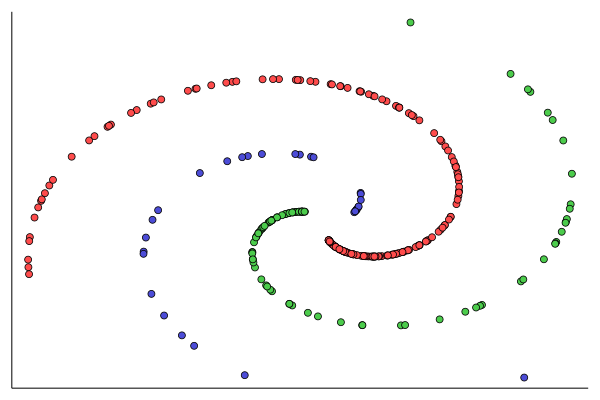

In [5]:
arms = 30 * collect(1:10)
arms = 30*[1, 3, 6] 

# arms = 50 * (sin.(range(0, step=0.1, length=10)) .+ 2)
# arms = @. Int(floor(axrms))
X, inds = general_kSpiral(arms)

scatter(X[:, 1], X[:, 2], marker_z = inds, c = :lighttest, ticks = nothing, leg=false)

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.953926323660653e-11, err2 = 6.945666264357442e-11 
└ @ OptimalTransport /zfs/users/tmats/tmats/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


Solved for 1203 nodes, K= 10, ϵ= 1.0, η= 8, accuracy= 0.8319559228650137
  2.260775 seconds (5.58 k allocations: 4.140 GiB, 6.60% gc time)


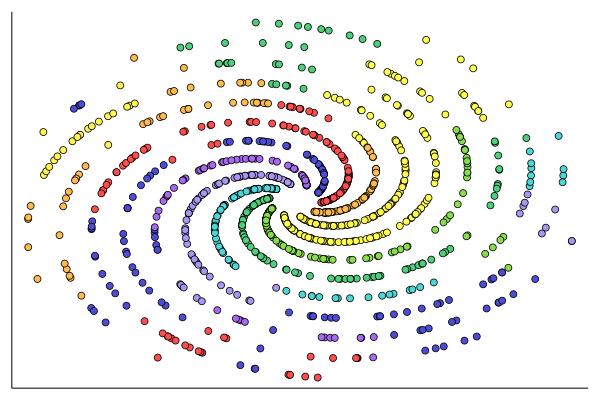

In [56]:
N = sum(arms)
K = length(arms)


@time Q, accuracy, γ = simulate_QOT(X, N, K, inds, 1.0, 0.1)

soft_label, infer_label = get_labels(Q, K)
hd = scatter(X[:, 1], X[:, 2], marker_z = infer_label, c = :lighttest, ticks = nothing, leg=false)



Solved for 1203 nodes, K= 10, neighbours= 10, η= 8, accuracy= 0.6418732782369145 
  3.769901 seconds (15.94 k allocations: 79.923 MiB)


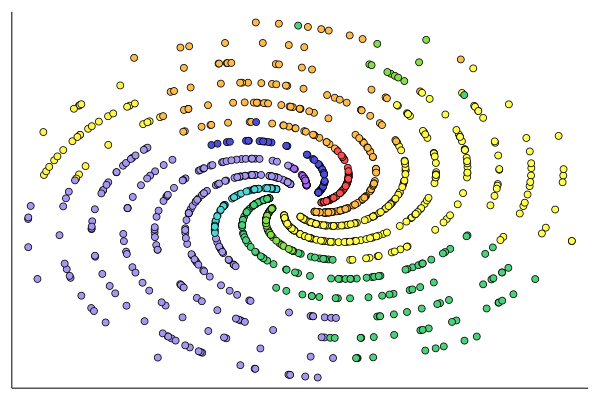

In [57]:

@time Q, accuracy, γ = simulate_KNN(X, N, K, inds, 10, 0.1, 1.0)

soft_label, infer_label = get_labels(Q, K)
hd = scatter(X[:, 1], X[:, 2], marker_z = infer_label, c = :lighttest, ticks = nothing, leg=false)



In [3]:

# run on full scale
eps_range = exp10.(-1:0.1:1)
# N_range = 500:500:5000
N_range = [1000]
K_range = 3:15
prop_range = [0.01, 0.05, 0.1, 0.3]
knn_range = 2:22

len_N_range = length(N_range)
len_prop_range = length(prop_range)
len_K_range = length(K_range)
len_eps_range = length(eps_range)
len_knn_range = length(knn_range)

σ=1.0
η=8
noise = 0.1


# QOT_accuracies = SharedArray{Float64}(len_N_range,len_prop_range,len_K_range,len_eps_range)
# KNN_accuracies = SharedArray{Float64}(len_N_range,len_prop_range,len_K_range,len_eps_range)

# QOT_accuracies = SharedArray{Float64}(len_N_range, len_prop_range ,len_eps_range)
# KNN_accuracies = SharedArray{Float64}(len_N_range, len_prop_range ,len_eps_range)



10×4×13×21 SharedArray{Float64, 4}:
[:, :, 1, 1] =
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0

[:, :, 2, 1] =
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0

[:, :, 3, 1] =
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0

...

[:, :, 11, 1] =
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0

[:, :, 12, 1] =
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.

In [ ]:

for i_N in 1:len_N_range    
    for i_K in 1:len_K_range
        #Get labelled spiral datapoints

#         arms = (sin.(range(0, step=0.1, length=K_range[i_K])) .+ 2)
#         arms = collect(1:K_range[i_K])
#         n = N_range[i_N] ./ sum(arms)
#         arms = @. Int(floor(n * arms))
        
        arms = ones(10)
        # arms = 50 * (sin.(LinRange(0, 2*π, 10)) .+ 1.2)
        # arms = collect(range(1, step = 0.5, 5))

        arms[2:2:10] = 1.5 * ones(5)

        arms = @. Int(floor(100*(arms)))
        
        X, labels_all = general_kSpiral(arms)
        N = sum(arms)
        K = length(arms)
        
#         add noise
#         noise_ind = sample(1:N, Int(floor(noise*N)), replace = false)
#         X[noise_ind, :] = 10*rand(Int(floor(noise*N)), 2) .-5
        
        
        @sync for i_prop in 1:len_prop_range
            ink_idx, ink_color = sample_labels(N, labels_all, prop_range[i_prop])
            @distributed for param in 1:len_eps_range          

                @time Q, accuracy, γ = simulate_QOT(X, N, K, labels_all, ink_idx, ink_color, eps_range[param], prop_range[i_prop], η)
                
                 QOT_accuracies[i_N, i_prop, i_K, param] = round(accuracy, digits=3)
                
                @time _, accuracy, _ = simulate_KNN(X, N, K, labels_all, ink_idx, ink_color, knn_range[param], prop_range[i_prop], σ, η)
                
                KNN_accuracies[i_N, i_prop, i_K, param] = round(accuracy, digits=3)
                
            end
            
        end
        if isdefined(Main, :IJulia)
            Main.IJulia.stdio_bytes[] = 0
        end
    end
end



┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.461269698108339e-7, err2 = 4.461269693667447e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 499 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.217399013877298e-9, err2 = 3.217399013877298e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 13.037179 seconds (8.95 M allocations: 1.686 GiB, 3.70% gc time, 93.91% compilation time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9649482485561975e-8, err2 = 1.964948270760658e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.51684220739412e-10, err2 = 1.51684220739412e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.7186139178448911e-9, err2 = 1.7186139178448911e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.7186139178448911e-9, err2 = 1.7186139178448911e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.019073879784173e-11, err2 = 3.019096084244666e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warnin

      From worker 25:	Solved for 499 nodes, K= 3, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 25:	  7.297048 seconds (4.59 M allocations: 274.302 MiB, 1.83% gc time, 95.37% compilation time)
      From worker 25:	Solved for 499 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 25:	  7.714516 seconds (4.71 M allocations: 825.395 MiB, 2.60% gc time, 90.21% compilation time)
      From worker 25:	Solved for 499 nodes, K= 3, neighbours= 15, η= 8, accuracy= 1.0 
      From worker 25:	  0.353820 seconds (4.32 k allocations: 8.144 MiB)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.03248515187704e-9, err2 = 3.0324849298324352e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 499 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9936842105263158


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.214481234640857e-9, err2 = 7.214481456685462e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 17.652871 seconds (8.95 M allocations: 2.074 GiB, 3.77% gc time, 92.98% compilation time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.176010482912716e-9, err2 = 2.176010482912716e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 499 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 0.9945945945945946


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6778378686410633e-10, err2 = 1.6778378686410633e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 17.929479 seconds (8.95 M allocations: 2.238 GiB, 3.80% gc time, 91.77% compilation time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.673357504955902e-10, err2 = 7.673355284509853e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 499 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9540540540540541


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.853553197709971e-10, err2 = 5.853557638602069e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 18.044630 seconds (8.95 M allocations: 2.680 GiB, 3.84% gc time, 91.32% compilation time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.019073879784173e-11, err2 = 3.019096084244666e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.89880297543732e-9, err2 = 2.898803197481925e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.461269698108339e-7, err2 = 4.461269693667447e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 499 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5131313131313131
      From worker 26:	 15.166817 seconds (8.95 M allocations: 1.695 GiB, 3.44% gc time, 95.29% compilation time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.435579925354816e-6, err2 = 4.4355800574713555e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.673357504955902e-10, err2 = 7.673355284509853e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 499 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5131313131313131


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.853553197709971e-10, err2 = 5.853557638602069e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 17.239605 seconds (8.95 M allocations: 2.679 GiB, 4.21% gc time, 91.72% compilation time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.501121057629234e-9, err2 = 7.501121501718444e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 499 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9120879120879121


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.881082231264713e-9, err2 = 7.881082231264713e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 17.731047 seconds (8.95 M allocations: 2.039 GiB, 3.67% gc time, 92.67% compilation time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.461269698108339e-7, err2 = 4.461269693667447e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.019073879784173e-11, err2 = 3.019096084244666e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.461269698108339e-7, err2 = 4.461269693667447e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.019073879784173e-11, err2 = 3.019096084244666e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.679662905601958e-9, err2 = 7.679662905601958e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

      From worker 15:	Solved for 499 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9557894736842105


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.881082231264713e-9, err2 = 7.881082231264713e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 17.667739 seconds (8.95 M allocations: 2.038 GiB, 3.30% gc time, 93.26% compilation time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.679662905601958e-9, err2 = 7.679662905601958e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 499 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9164835164835164


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.217399013877298e-9, err2 = 3.217399013877298e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 16.135723 seconds (8.95 M allocations: 1.686 GiB, 3.49% gc time, 95.13% compilation time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.679662905601958e-9, err2 = 7.679662905601958e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9649482485561975e-8, err2 = 1.964948270760658e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.7186139178448911e-9, err2 = 1.7186139178448911e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.51684220739412e-10, err2 = 1.51684220739412e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.89880297543732e-9, err2 = 2.898803197481925e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 29:	Solved for 499 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.435579925354816e-6, err2 = 4.4355800574713555e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 19.891302 seconds (8.95 M allocations: 1.696 GiB, 2.87% gc time, 94.83% compilation time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9350817332129964e-8, err2 = 2.9350817332129964e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 499 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.7536842105263157


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.2047856368677685e-8, err2 = 3.2047855924588475e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 21.361279 seconds (8.95 M allocations: 2.759 GiB, 3.36% gc time, 92.41% compilation time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.03248515187704e-9, err2 = 3.0324849298324352e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.7186139178448911e-9, err2 = 1.7186139178448911e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.51684220739412e-10, err2 = 1.51684220739412e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 499 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9557894736842105


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.217399013877298e-9, err2 = 3.217399013877298e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 16.019085 seconds (8.95 M allocations: 1.686 GiB, 3.28% gc time, 95.42% compilation time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.679662905601958e-9, err2 = 7.679662905601958e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9649482485561975e-8, err2 = 1.964948270760658e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 499 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5131313131313131
      From worker 22:	 14.727154 seconds (8.95 M allocations: 1.685 GiB, 4.74% gc time, 95.28% compilation time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.217399013877298e-9, err2 = 3.217399013877298e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9649482485561975e-8, err2 = 1.964948270760658e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.89880297543732e-9, err2 = 2.898803197481925e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 499 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9936842105263158


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.435579925354816e-6, err2 = 4.4355800574713555e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 17.805471 seconds (8.95 M allocations: 1.695 GiB, 3.47% gc time, 94.37% compilation time)
      From worker 26:	Solved for 499 nodes, K= 3, neighbours= 8, η= 8, accuracy= 0.5131313131313131 
      From worker 26:	  9.554380 seconds (4.60 M allocations: 291.367 MiB, 1.46% gc time, 69.46% compilation time)
      From worker 26:	Solved for 499 nodes, K= 3, ϵ= 2.51188643150958, η= 8, accuracy= 0.6646464646464647
      From worker 26:	  9.925227 seconds (4.72 M allocations: 851.065 MiB, 2.05% gc time, 66.87% compilation time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8342217461840846e-11, err2 = 2.8342217461840846e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 499 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9178947368421053


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6982560630273156e-9, err2 = 2.6982560630273156e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.89880297543732e-9, err2 = 2.898803197481925e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 19.812625 seconds (8.95 M allocations: 2.531 GiB, 4.95% gc time, 92.85% compilation time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8342217461840846e-11, err2 = 2.8342217461840846e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 499 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9540540540540541


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6982560630273156e-9, err2 = 2.6982560630273156e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.673357504955902e-10, err2 = 7.673355284509853e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 27.455795 seconds (8.95 M allocations: 2.532 GiB, 3.13% gc time, 94.81% compilation time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8342217461840846e-11, err2 = 2.8342217461840846e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 499 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7768421052631579


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.853553197709971e-10, err2 = 5.853557638602069e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.176010482912716e-9, err2 = 2.176010482912716e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 499 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8813186813186813
      From worker 33:	Solved for 499 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6982560630273156e-9, err2 = 2.6982560630273156e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.214481234640857e-9, err2 = 7.214481456685462e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 499 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 0.5131313131313131
      From worker 21:	Solved for 499 nodes, K= 3, neighbours= 6, η= 8, accuracy= 1.0 
      From worker 21:	 13.352783 seconds (4.59 M allocations: 274.808 MiB, 2.50% gc time, 94.06% compilation time)
      From worker 21:	Solved for 499 nodes, K= 3, ϵ= 1.5848931924611136, η= 8, accuracy= 1.0
      From worker 21:	 14.185944 seconds (4.72 M allocations: 1.239 GiB, 3.10% gc time, 88.53% compilation time)
      From worker 33:	 22.246660 seconds (8.95 M allocations: 2.075 GiB, 3.10% gc time, 94.23% compilation time)
      From worker 9:	Solved for 499 nodes, K= 3, neighbours= 3, η= 8, accuracy= 0.854054054054054 
      From worker 9:	 12.502555 seconds (4.59 M allocations: 272.456 MiB, 1.18% gc time, 95.24% compilation time)
      From worker 9:	Solved for 499 nodes, K= 3, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 9:	 13.463473 seconds (4.72 M allocations: 1.540 G

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6778378686410633e-10, err2 = 1.6778378686410633e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 19.879797 seconds (8.95 M allocations: 2.680 GiB, 4.27% gc time, 91.25% compilation time)
      From worker 12:	 19.232449 seconds (8.95 M allocations: 2.532 GiB, 3.63% gc time, 92.05% compilation time)
      From worker 18:	 17.493027 seconds (8.95 M allocations: 2.236 GiB, 3.59% gc time, 92.52% compilation time)
      From worker 30:	Solved for 499 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5131313131313131


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.214481234640857e-9, err2 = 7.214481456685462e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 499 nodes, K= 3, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 31:	 14.011804 seconds (4.60 M allocations: 306.784 MiB, 1.48% gc time, 64.90% compilation time)
      From worker 31:	Solved for 499 nodes, K= 3, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 31:	 14.601331 seconds (4.72 M allocations: 868.361 MiB, 2.39% gc time, 62.28% compilation time)
      From worker 30:	 17.466071 seconds (8.95 M allocations: 2.074 GiB, 3.82% gc time, 93.97% compilation time)
      From worker 24:	Solved for 499 nodes, K= 3, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 24:	  7.033126 seconds (4.59 M allocations: 276.874 MiB, 1.44% gc time, 92.11% compilation time)
      From worker 24:	Solved for 499 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 24:	  7.462393 seconds (4.71 M allocations: 827.961 MiB, 2.62% gc time, 86.81% compilation time)
      From worker 9:	Solved for 499 nodes, K= 3, neighbours= 11, η= 8

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.435579925354816e-6, err2 = 4.4355800574713555e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.03248515187704e-9, err2 = 3.0324849298324352e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 23.536937 seconds (8.95 M allocations: 1.696 GiB, 3.31% gc time, 93.96% compilation time)
      From worker 24:	Solved for 499 nodes, K= 3, neighbours= 15, η= 8, accuracy= 1.0 
      From worker 24:	  0.744402 seconds (5.88 k allocations: 11.806 MiB)
      From worker 9:	Solved for 499 nodes, K= 3, neighbours= 19, η= 8, accuracy= 1.0 
      From worker 9:	  0.778212 seconds (4.89 k allocations: 14.696 MiB)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.673357504955902e-10, err2 = 7.673355284509853e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 499 nodes, K= 3, neighbours= 22, η= 8, accuracy= 1.0 
      From worker 21:	  0.733555 seconds (4.68 k allocations: 14.247 MiB)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.501121057629234e-9, err2 = 7.501121501718444e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 499 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8813186813186813
      From worker 16:	Solved for 499 nodes, K= 3, neighbours= 13, η= 8, accuracy= 1.0 
      From worker 16:	  0.920845 seconds (5.52 k allocations: 10.655 MiB)
      From worker 16:	Solved for 499 nodes, K= 3, ϵ= 7.943282347242816, η= 8, accuracy= 1.0
      From worker 16:	 11.274022 seconds (4.72 M allocations: 700.563 MiB, 1.95% gc time, 76.68% compilation time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.853553197709971e-10, err2 = 5.853557638602069e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 18.236688 seconds (8.95 M allocations: 2.680 GiB, 3.79% gc time, 91.30% compilation time)
      From worker 17:	Solved for 499 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9675675675675676


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.881082231264713e-9, err2 = 7.881082231264713e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 18.392770 seconds (8.95 M allocations: 2.039 GiB, 3.97% gc time, 92.64% compilation time)
      From worker 26:	Solved for 499 nodes, K= 3, neighbours= 16, η= 8, accuracy= 0.6646464646464647 
      From worker 26:	  3.678756 seconds (17.83 k allocations: 28.993 MiB, 1.83% gc time)
      From worker 32:	Solved for 499 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9934065934065934
      From worker 32:	 20.708238 seconds (8.95 M allocations: 2.075 GiB, 4.69% gc time, 94.86% compilation time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.214481234640857e-9, err2 = 7.214481456685462e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8342217461840846e-11, err2 = 2.8342217461840846e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 499 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 0.5131313131313131


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6982560630273156e-9, err2 = 2.6982560630273156e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9350817332129964e-8, err2 = 2.9350817332129964e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 499 nodes, K= 3, neighbours= 21, η= 8, accuracy= 1.0 
      From worker 16:	  1.191707 seconds (5.95 k allocations: 19.952 MiB)
      From worker 10:	 20.102102 seconds (8.95 M allocations: 2.530 GiB, 4.86% gc time, 93.09% compilation time)
      From worker 15:	Solved for 499 nodes, K= 3, neighbours= 5, η= 8, accuracy= 0.9305263157894736 
      From worker 15:	 10.264925 seconds (4.59 M allocations: 279.555 MiB, 1.79% gc time, 85.03% compilation time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.176010482912716e-9, err2 = 2.176010482912716e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 499 nodes, K= 3, ϵ= 1.2589254117941673, η= 8, accuracy= 1.0
      From worker 15:	 10.991779 seconds (4.72 M allocations: 1.180 GiB, 2.54% gc time, 79.41% compilation time)
      From worker 4:	Solved for 499 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.8813186813186813


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.2047856368677685e-8, err2 = 3.2047855924588475e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 23.681282 seconds (8.95 M allocations: 2.760 GiB, 3.75% gc time, 94.48% compilation time)
      From worker 20:	Solved for 499 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 0.9120879120879121


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6778378686410633e-10, err2 = 1.6778378686410633e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9350817332129964e-8, err2 = 2.9350817332129964e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 19.106391 seconds (8.95 M allocations: 2.237 GiB, 4.07% gc time, 90.21% compilation time)
      From worker 5:	Solved for 499 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.9351351351351351


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.2047856368677685e-8, err2 = 3.2047855924588475e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 23.934046 seconds (8.95 M allocations: 2.760 GiB, 4.60% gc time, 91.09% compilation time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.176010482912716e-9, err2 = 2.176010482912716e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 499 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 0.9557894736842105


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6778378686410633e-10, err2 = 1.6778378686410633e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 22.543105 seconds (8.95 M allocations: 2.237 GiB, 3.86% gc time, 94.28% compilation time)
      From worker 29:	Solved for 499 nodes, K= 3, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 29:	 10.333496 seconds (4.59 M allocations: 274.431 MiB, 1.56% gc time, 94.99% compilation time)
      From worker 29:	Solved for 499 nodes, K= 3, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 29:	 10.889513 seconds (4.71 M allocations: 834.516 MiB, 2.31% gc time, 90.14% compilation time)
      From worker 6:	Solved for 499 nodes, K= 3, neighbours= 3, η= 8, accuracy= 0.23838383838383836 
      From worker 6:	 15.371129 seconds (4.60 M allocations: 273.143 MiB, 0.90% gc time, 75.47% compilation time)
      From worker 6:	Solved for 499 nodes, K= 3, ϵ= 0.7943282347242815, η= 8, accuracy= 0.5131313131313131
      From worker 6:	 16.252627 seconds (4.73 M allocations: 1.540 GiB, 1.78% gc time, 71.38% compilation time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9350817332129964e-8, err2 = 2.9350817332129964e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 499 nodes, K= 3, neighbours= 16, η= 8, accuracy= 1.0 
      From worker 29:	  0.562404 seconds (4.35 k allocations: 8.355 MiB)
      From worker 2:	Solved for 499 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.5131313131313131


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.2047856368677685e-8, err2 = 3.2047855924588475e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 499 nodes, K= 3, neighbours= 17, η= 8, accuracy= 0.8589473684210527 
      From worker 31:	  5.531626 seconds (17.82 k allocations: 74.536 MiB)
      From worker 2:	 22.384522 seconds (8.95 M allocations: 2.759 GiB, 3.33% gc time, 92.63% compilation time)
      From worker 13:	Solved for 499 nodes, K= 3, neighbours= 4, η= 8, accuracy= 1.0 
      From worker 13:	  6.776524 seconds (4.59 M allocations: 274.087 MiB, 2.20% gc time, 93.09% compilation time)
      From worker 13:	Solved for 499 nodes, K= 3, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 13:	  7.686767 seconds (4.72 M allocations: 1.530 GiB, 3.86% gc time, 82.06% compilation time)
      From worker 13:	Solved for 499 nodes, K= 3, neighbours= 12, η= 8, accuracy= 1.0 
      From worker 13:	  0.325814 seconds (4.25 k allocations: 7.526 MiB)
      From worker 13:	Solved for 499 nodes, K= 3, ϵ= 6.309573444801933, η= 8, accuracy= 1.0
      From worker 13:	  7.608210 seconds (4.72 M allocations: 857.2

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.501121057629234e-9, err2 = 7.501121501718444e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 499 nodes, K= 3, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 23:	 11.535730 seconds (4.60 M allocations: 306.144 MiB, 1.41% gc time, 65.37% compilation time)
      From worker 23:	Solved for 499 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 23:	 11.939915 seconds (4.72 M allocations: 857.049 MiB, 1.95% gc time, 63.16% compilation time)
      From worker 14:	Solved for 499 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5131313131313131


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.881082231264713e-9, err2 = 7.881082231264713e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 26.008872 seconds (8.95 M allocations: 2.037 GiB, 3.22% gc time, 95.06% compilation time)
      From worker 11:	Solved for 499 nodes, K= 3, neighbours= 4, η= 8, accuracy= 0.8063157894736842 
      From worker 11:	  9.586955 seconds (4.59 M allocations: 277.072 MiB, 1.90% gc time, 83.86% compilation time)
      From worker 11:	Solved for 499 nodes, K= 3, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 11:	 10.438525 seconds (4.72 M allocations: 1.533 GiB, 2.93% gc time, 77.02% compilation time)
      From worker 6:	Solved for 499 nodes, K= 3, neighbours= 11, η= 8, accuracy= 0.6646464646464647 
      From worker 6:	  3.137408 seconds (17.82 k allocations: 28.213 MiB)
      From worker 6:	Solved for 499 nodes, K= 3, ϵ= 5.011872336272722, η= 8, accuracy= 0.6646464646464647
      From worker 6:	 18.984302 seconds (4.74 M allocations: 874.323 MiB, 0.92% gc time, 61.11% compilation time)
      From worker 12:	Solved for 499 nodes, K= 3, neighbours= 4, η= 8, accuracy= 0.76

      From worker 5:	Solved for 499 nodes, K= 3, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 5:	  0.511677 seconds (4.29 k allocations: 7.194 MiB)
      From worker 5:	Solved for 499 nodes, K= 3, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 5:	 10.012277 seconds (4.72 M allocations: 881.071 MiB, 1.99% gc time, 80.55% compilation time)
      From worker 15:	Solved for 499 nodes, K= 3, neighbours= 21, η= 8, accuracy= 0.8589473684210527 
      From worker 15:	  5.621070 seconds (17.88 k allocations: 75.491 MiB, 0.81% gc time)
      From worker 20:	Solved for 499 nodes, K= 3, neighbours= 14, η= 8, accuracy= 1.0 
      From worker 20:	  0.964091 seconds (5.81 k allocations: 11.473 MiB)
      From worker 20:	Solved for 499 nodes, K= 3, ϵ= 10.0, η= 8, accuracy= 1.0
      From worker 20:	 10.555968 seconds (4.72 M allocations: 747.563 MiB, 1.64% gc time, 79.18% compilation time)
      From worker 18:	Solved for 499 nodes, K= 3, neighbours= 6, η= 8, accuracy= 0.513131

      From worker 2:	Solved for 499 nodes, K= 3, neighbours= 18, η= 8, accuracy= 0.6646464646464647 
      From worker 2:	  5.072289 seconds (17.89 k allocations: 51.703 MiB, 1.57% gc time)
      From worker 14:	Solved for 499 nodes, K= 3, neighbours= 21, η= 8, accuracy= 0.6646464646464647 
      From worker 14:	  5.131138 seconds (17.89 k allocations: 52.303 MiB)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.908663443434989e-8, err2 = 2.908662044553978e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.74573292990965e-8, err2 = 2.7457329521141105e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.908663443434989e-8, err2 = 2.908662044553978e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 6.833665633365626e-8, err2 = 6.833665633365626e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5465796268099297e-6, err2 = 1.5465796256997066e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 19:	Solved for 500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8505263157894737
      From worker 19:	  1.676789 seconds (10.42 k allocations: 1.462 GiB, 11.19% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.912006605437227e-10, err2 = 7.912011046329326e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.9728442757791527e-11, err2 = 3.9728442757791527e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8505263157894737


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.881629884767591e-7, err2 = 4.881629886988037e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 7.730507656233954e-8, err2 = 7.730507611825033e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.496609916695206e-10, err2 = 6.496612137141256e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	  2.006589 seconds (11.70 k allocations: 1.716 GiB, 10.96% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.74573292990965e-8, err2 = 2.7457329521141105e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.9631404812869846e-7, err2 = 1.9631404835074306e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9384615384615385


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 7.730507656233954e-8, err2 = 7.730507611825033e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.423795077623254e-12, err2 = 9.426237568277429e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8383838383838383
      From worker 22:	Solved for 500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.6808080808080808


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 6.833665633365626e-8, err2 = 6.833665633365626e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.912006605437227e-10, err2 = 7.912011046329326e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4315382212970462e-9, err2 = 1.4315384433416511e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 6.833665633365626e-8, err2 = 6.833665633365626e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.9631404812869846e-7, err2 = 1.9631404835074306e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	  2.375936 seconds (10.39 k allocations: 1.462 GiB, 9.79% gc time)
      From worker 8:	  2.405132 seconds (16.00 k allocations: 2.312 GiB, 10.75% gc time)
      From worker 22:	  2.469947 seconds (18.46 k allocations: 2.759 GiB, 16.40% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 8.333272294436256e-9, err2 = 8.33327251648086e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 7.730507656233954e-8, err2 = 7.730507611825033e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.9728442757791527e-11, err2 = 3.9728442757791527e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5465796268099297e-6, err2 = 1.5465796256997066e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8202020202020202


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.74573292990965e-8, err2 = 2.7457329521141105e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.9631404812869846e-7, err2 = 1.9631404835074306e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.908663443434989e-8, err2 = 2.908662044553978e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.496609916695206e-10, err2 = 6.496612137141256e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	  2.628325 seconds (11.67 k allocations: 1.715 GiB, 13.19% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.908663443434989e-8, err2 = 2.908662044553978e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 6.833665633365626e-8, err2 = 6.833665633365626e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5465796268099297e-6, err2 = 1.5465796256997066e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 8.333272294436256e-9, err2 = 8.33327251648086e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.137422848771166e-9, err2 = 4.137422848771166e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Con

      From worker 6:	Solved for 500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.8121212121212121


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5691849475938398e-9, err2 = 3.569184725549235e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.423795077623254e-12, err2 = 9.426237568277429e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.843947382620172e-11, err2 = 3.8440139960016495e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	  2.980665 seconds (15.90 k allocations: 2.311 GiB, 11.06% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.137422848771166e-9, err2 = 4.137422848771166e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8222222222222222


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2450930003969916e-11, err2 = 2.245070795936499e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 8.333272294436256e-9, err2 = 8.33327251648086e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	  3.209918 seconds (11.19 k allocations: 1.582 GiB, 13.09% gc time)
      From worker 3:	Solved for 500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8273684210526315
      From worker 26:	Solved for 500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6808080808080808


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.923794539810842e-11, err2 = 2.923794539810842e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3176351121302332e-9, err2 = 1.3176348900856283e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.843947382620172e-11, err2 = 3.8440139960016495e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9626373626373627
      From worker 26:	  3.436662 seconds (19.51 k allocations: 3.188 GiB, 10.93% gc time)
      From worker 15:	Solved for 500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8505263157894737


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.912006605437227e-10, err2 = 7.912011046329326e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2450930003969916e-11, err2 = 2.245070795936499e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9756756756756757
      From worker 3:	  3.502251 seconds (16.34 k allocations: 2.270 GiB, 10.16% gc time)
      From worker 17:	Solved for 500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9702702702702702
      From worker 2:	Solved for 500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7414141414141414


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.881629884767591e-7, err2 = 4.881629886988037e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.912006605437227e-10, err2 = 7.912011046329326e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.881629884767591e-7, err2 = 4.881629886988037e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2450930003969916e-11, err2 = 2.245070795936499e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.166730655479455e-9, err2 = 3.16672998934564e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 15:	  3.551173 seconds (11.20 k allocations: 1.582 GiB, 11.98% gc time)
      From worker 20:	  3.532487 seconds (10.50 k allocations: 1.463 GiB, 18.67% gc time)
      From worker 21:	  3.597901 seconds (10.50 k allocations: 1.463 GiB, 17.52% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.9728442757791527e-11, err2 = 3.9728442757791527e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	  3.680245 seconds (11.29 k allocations: 1.583 GiB, 13.53% gc time)
      From worker 13:	Solved for 500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9621621621621621


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.496609916695206e-10, err2 = 6.496612137141256e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.166730655479455e-9, err2 = 3.16672998934564e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9626373626373627
      From worker 16:	Solved for 500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9692307692307692
      From worker 2:	  3.815210 seconds (16.33 k allocations: 2.270 GiB, 13.24% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.496609916695206e-10, err2 = 6.496612137141256e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2450930003969916e-11, err2 = 2.245070795936499e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.843947382620172e-11, err2 = 3.8440139960016495e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.881629884767591e-7, err2 = 4.881629886988037e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.7452631578947368
      From worker 13:	  3.918260 seconds (11.76 k allocations: 1.716 GiB, 16.88% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5691849475938398e-9, err2 = 3.569184725549235e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4315382212970462e-9, err2 = 1.4315384433416511e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	  3.928171 seconds (11.76 k allocations: 1.716 GiB, 15.98% gc time)
      From worker 16:	  3.969990 seconds (11.29 k allocations: 1.582 GiB, 14.20% gc time)
      From worker 23:	  4.082886 seconds (18.52 k allocations: 2.760 GiB, 15.82% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5691849475938398e-9, err2 = 3.569184725549235e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9243243243243243
      From worker 4:	Solved for 500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9076923076923077
      From worker 31:	Solved for 500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8273684210526315
      From worker 24:	Solved for 500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.8527472527472527


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.166730655479455e-9, err2 = 3.16672998934564e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.972691831754531e-7, err2 = 8.972691836195423e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.923794539810842e-11, err2 = 2.923794539810842e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.972691831754531e-7, err2 = 8.972691836195423e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4315382212970462e-9, err2 = 1.4315384433416511e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.8505263157894737


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5691849475938398e-9, err2 = 3.569184725549235e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.423795077623254e-12, err2 = 9.426237568277429e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9243243243243243
      From worker 5:	Solved for 500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9243243243243243
      From worker 32:	Solved for 500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9076923076923077


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.423795077623254e-12, err2 = 9.426237568277429e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.923794539810842e-11, err2 = 2.923794539810842e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.972691831754531e-7, err2 = 8.972691836195423e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.9
      From worker 31:	  4.448223 seconds (18.42 k allocations: 2.859 GiB, 14.15% gc time)
      From worker 4:	  4.462595 seconds (16.43 k allocations: 2.271 GiB, 14.17% gc time)
      From worker 33:	  4.464535 seconds (18.50 k allocations: 2.861 GiB, 13.68% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4315382212970462e-9, err2 = 1.4315384433416511e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8747252747252747
      From worker 23:	Solved for 500 nodes, K= 4, neighbours= 2, η= 8, accuracy= 0.1747368421052632 
      From worker 23:	  0.486559 seconds (5.63 k allocations: 3.618 MiB)
      From worker 23:	Solved for 500 nodes, K= 4, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8652631578947368
      From worker 23:	  2.049751 seconds (15.85 k allocations: 1.438 GiB, 10.10% gc time)
      From worker 24:	  4.573210 seconds (18.60 k allocations: 2.760 GiB, 15.93% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3176351121302332e-9, err2 = 1.3176348900856283e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	  4.574629 seconds (15.94 k allocations: 2.311 GiB, 9.11% gc time)
      From worker 30:	Solved for 500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.705050505050505
      From worker 5:	  4.628793 seconds (16.44 k allocations: 2.271 GiB, 16.47% gc time)
      From worker 27:	Solved for 500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7663157894736842
      From worker 25:	  4.697046 seconds (18.62 k allocations: 2.761 GiB, 14.98% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.972691831754531e-7, err2 = 8.972691836195423e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3176351121302332e-9, err2 = 1.3176348900856283e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	  4.667734 seconds (15.99 k allocations: 2.312 GiB, 15.42% gc time)
      From worker 32:	  4.744267 seconds (18.51 k allocations: 2.860 GiB, 15.86% gc time)
      From worker 28:	  4.751577 seconds (19.66 k allocations: 3.189 GiB, 13.99% gc time)
      From worker 26:	Solved for 500 nodes, K= 4, neighbours= 3, η= 8, accuracy= 0.17979797979797985 
      From worker 26:	  1.337446 seconds (7.20 k allocations: 3.942 MiB)
      From worker 26:	Solved for 500 nodes, K= 4, ϵ= 0.7943282347242815, η= 8, accuracy= 0.8707070707070708
      From worker 26:	  3.041061 seconds (18.22 k allocations: 1.741 GiB, 6.62% gc time)
      From worker 29:	Solved for 500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9
      From worker 30:	  4.897901 seconds (18.36 k allocations: 2.859 GiB, 11.98% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3176351121302332e-9, err2 = 1.3176348900856283e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	  4.996164 seconds (19.59 k allocations: 3.188 GiB, 13.56% gc time)
      From worker 24:	Solved for 500 nodes, K= 4, neighbours= 2, η= 8, accuracy= 0.2571428571428571 
      From worker 24:	  0.495298 seconds (4.45 k allocations: 3.519 MiB)
      From worker 24:	Solved for 500 nodes, K= 4, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9340659340659341
      From worker 24:	  2.582352 seconds (14.69 k allocations: 1.439 GiB, 9.86% gc time)
      From worker 29:	  5.155233 seconds (19.65 k allocations: 3.190 GiB, 16.24% gc time)
      From worker 17:	Solved for 500 nodes, K= 4, neighbours= 8, η= 8, accuracy= 0.9837837837837837 
      From worker 17:	  1.650764 seconds (4.98 k allocations: 16.022 MiB, 1.03% gc time)
      From worker 17:	Solved for 500 nodes, K= 4, ϵ= 2.51188643150958, η= 8, accuracy= 0.9756756756756757
      From worker 17:	  2.675169 seconds (9.67 k allocations: 613.572 MiB, 3.74% gc time)
      From worker 8:	Solved for 500 nodes, K= 4, neighbours= 6,

      From worker 12:	Solved for 500 nodes, K= 4, neighbours= 7, η= 8, accuracy= 0.9736263736263736 
      From worker 12:	  5.050650 seconds (17.83 k allocations: 95.013 MiB, 0.26% gc time)
      From worker 12:	Solved for 500 nodes, K= 4, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9340659340659341
      From worker 12:	  6.382002 seconds (23.40 k allocations: 895.220 MiB, 2.46% gc time)
      From worker 25:	Solved for 500 nodes, K= 4, neighbours= 2, η= 8, accuracy= 0.5243243243243243 
      From worker 25:	  4.480319 seconds (17.79 k allocations: 18.440 MiB)
      From worker 25:	Solved for 500 nodes, K= 4, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9756756756756757
      From worker 25:	  6.384442 seconds (28.06 k allocations: 1.454 GiB, 3.70% gc time)
      From worker 3:	Solved for 500 nodes, K= 4, neighbours= 13, η= 8, accuracy= 0.9347368421052632 
      From worker 3:	  1.674904 seconds (9.59 k allocations: 45.228 MiB)
      From worker 3:	Solved for 500 nodes, K= 4, ϵ= 7.943282347

      From worker 19:	Solved for 500 nodes, K= 4, neighbours= 17, η= 8, accuracy= 0.9221052631578948 
      From worker 19:	  5.834878 seconds (17.83 k allocations: 97.485 MiB, 0.14% gc time)
      From worker 20:	Solved for 500 nodes, K= 4, neighbours= 9, η= 8, accuracy= 0.9736263736263736 
      From worker 20:	  9.009901 seconds (17.83 k allocations: 95.790 MiB, 0.32% gc time)
      From worker 20:	Solved for 500 nodes, K= 4, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9384615384615385
      From worker 20:	  9.928909 seconds (22.32 k allocations: 688.469 MiB, 1.22% gc time)
      From worker 29:	Solved for 500 nodes, K= 4, neighbours= 3, η= 8, accuracy= 0.8594594594594595 
      From worker 29:	  7.913928 seconds (17.19 k allocations: 23.847 MiB)
      From worker 29:	Solved for 500 nodes, K= 4, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9756756756756757
      From worker 29:	  9.878432 seconds (28.30 k allocations: 1.762 GiB, 2.80% gc time)
      From worker 5:	Solved for 500 nodes, K=

┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 1.8233491116959044e-7, err2 = 1.8233491205776886e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.2873436088245427e-6, err2 = 1.2873436088245427e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.960012152579793e-9, err2 = 1.960012152579793e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.3816567001612157e-8, err2 = 1.3816567001612157e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.387701478871577e-10, err2 = 6.387701478871577e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

      From worker 8:	Solved for 498 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9139072847682119


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0153902163523298e-9, err2 = 1.015389994307725e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0450484921875614e-10, err2 = 1.0450507126336106e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.374600181047185e-9, err2 = 6.37460040309179e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.149646521569352e-6, err2 = 6.14965300549386e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	  1.936064 seconds (11.73 k allocations: 1.788 GiB, 8.04% gc time)
      From worker 3:	Solved for 498 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7911392405063291
      From worker 22:	Solved for 498 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.3825910931174089


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.193834231472124e-8, err2 = 1.193834231472124e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.804801667646075e-9, err2 = 4.804801667646075e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.960012152579793e-9, err2 = 1.960012152579793e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.545038724293235e-6, err2 = 1.545038724293235e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.988010418737758e-12, err2 = 9.988454507947608e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Con

      From worker 3:	  2.088988 seconds (11.38 k allocations: 1.651 GiB, 11.27% gc time)


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 1.8233491116959044e-7, err2 = 1.8233491205776886e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.3816567001612157e-8, err2 = 1.3816567001612157e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.387701478871577e-10, err2 = 6.387701478871577e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	  2.256711 seconds (17.19 k allocations: 2.504 GiB, 10.14% gc time)
      From worker 13:	Solved for 498 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9175824175824175
      From worker 27:	Solved for 498 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.748945147679325


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.374600181047185e-9, err2 = 6.37460040309179e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.374600181047185e-9, err2 = 6.37460040309179e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.910208141138071e-8, err2 = 2.9102081633425314e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.979150673520508e-11, err2 = 7.979283900283463e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 498 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9072847682119205
      From worker 31:	Solved for 498 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7784810126582279


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8247625632739073e-11, err2 = 1.8247847677343998e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2515677645127425e-8, err2 = 4.2515677201038216e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.2873436088245427e-6, err2 = 1.2873436088245427e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.960012152579793e-9, err2 = 1.960012152579793e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 498 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9094922737306843
      From worker 4:	Solved for 498 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9094922737306843
      From worker 31:	  2.462390 seconds (11.37 k allocations: 1.641 GiB, 10.46% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.960012152579793e-9, err2 = 1.960012152579793e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 1.8233491116959044e-7, err2 = 1.8233491205776886e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2515677645127425e-8, err2 = 4.2515677201038216e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.193834231472124e-8, err2 = 1.193834231472124e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.804801667646075e-9, err2 = 4.804801667646075e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 13:	  2.564942 seconds (16.69 k allocations: 2.365 GiB, 10.86% gc time)
      From worker 27:	  2.508750 seconds (16.40 k allocations: 2.299 GiB, 10.88% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.804801667646075e-9, err2 = 4.804801667646075e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.149646521569352e-6, err2 = 6.14965300549386e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 498 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.39473684210526316


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.914768452797148e-8, err2 = 5.914768452797148e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0450484921875614e-10, err2 = 1.0450507126336106e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	  2.697020 seconds (11.33 k allocations: 1.651 GiB, 9.39% gc time)
      From worker 20:	  2.779586 seconds (18.83 k allocations: 2.731 GiB, 9.95% gc time)
      From worker 4:	  2.690014 seconds (11.43 k allocations: 1.653 GiB, 8.85% gc time)
      From worker 32:	  2.712664 seconds (11.42 k allocations: 1.643 GiB, 10.11% gc time)
      From worker 7:	Solved for 498 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8354430379746836


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0153902163523298e-9, err2 = 1.015389994307725e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.983356422487816e-8, err2 = 3.983356422487816e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 498 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.3825910931174089
      From worker 7:	  2.839956 seconds (11.65 k allocations: 1.787 GiB, 10.01% gc time)
      From worker 6:	Solved for 498 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.43724696356275305


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.979150673520508e-11, err2 = 7.979283900283463e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.149646521569352e-6, err2 = 6.14965300549386e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0153902163523298e-9, err2 = 1.015389994307725e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.914768452797148e-8, err2 = 5.914768452797148e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 498 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.989010989010989
      From worker 6:	  2.868934 seconds (11.61 k allocations: 1.786 GiB, 13.89% gc time)
      From worker 26:	  2.997512 seconds (16.25 k allocations: 2.297 GiB, 10.18% gc time)
      From worker 10:	Solved for 498 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.3502024291497976


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0153902163523298e-9, err2 = 1.015389994307725e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.932171870919433e-8, err2 = 4.9321718487149724e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.910208141138071e-8, err2 = 2.9102081633425314e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.983356422487816e-8, err2 = 3.983356422487816e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 498 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9752747252747253
      From worker 9:	  3.039136 seconds (11.75 k allocations: 1.788 GiB, 10.67% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.932171870919433e-8, err2 = 4.9321718487149724e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.804801667646075e-9, err2 = 4.804801667646075e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	  3.191049 seconds (16.46 k allocations: 2.362 GiB, 9.92% gc time)
      From worker 21:	Solved for 498 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9505494505494505
      From worker 8:	Solved for 498 nodes, K= 5, neighbours= 9, η= 8, accuracy= 0.8344370860927153 
      From worker 8:	  1.173262 seconds (6.79 k allocations: 25.292 MiB, 0.76% gc time)
      From worker 8:	Solved for 498 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9536423841059603
      From worker 8:	  1.758944 seconds (11.12 k allocations: 601.832 MiB, 2.83% gc time)
      From worker 30:	Solved for 498 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.3825910931174089
      From worker 12:	Solved for 498 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.8300220750551877


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.149646521569352e-6, err2 = 6.14965300549386e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8247625632739073e-11, err2 = 1.8247847677343998e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2515677645127425e-8, err2 = 4.2515677201038216e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.910208141138071e-8, err2 = 2.9102081633425314e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	  3.191980 seconds (11.44 k allocations: 1.653 GiB, 9.58% gc time)
      From worker 29:	Solved for 498 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9560439560439561
      From worker 30:	  3.217740 seconds (11.29 k allocations: 1.641 GiB, 10.73% gc time)
      From worker 33:	Solved for 498 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9615384615384616
      From worker 17:	Solved for 498 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9395604395604396
      From worker 18:	Solved for 498 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.36032388663967607


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.979150673520508e-11, err2 = 7.979283900283463e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.932171870919433e-8, err2 = 4.9321718487149724e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2515677645127425e-8, err2 = 4.2515677201038216e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.914768452797148e-8, err2 = 5.914768452797148e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.914768452797148e-8, err2 = 5.914768452797148e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 13:	Solved for 498 nodes, K= 5, neighbours= 2, η= 8, accuracy= 0.46153846153846156 
      From worker 13:	  0.806905 seconds (5.30 k allocations: 5.313 MiB)
      From worker 13:	Solved for 498 nodes, K= 5, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9835164835164835
      From worker 13:	  1.902523 seconds (14.29 k allocations: 1.186 GiB, 4.41% gc time)
      From worker 21:	  3.374383 seconds (18.86 k allocations: 2.731 GiB, 10.44% gc time)
      From worker 14:	Solved for 498 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.36032388663967607
      From worker 24:	Solved for 498 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9161147902869757
      From worker 33:	  3.342336 seconds (11.42 k allocations: 1.643 GiB, 9.25% gc time)
      From worker 11:	Solved for 498 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.7130801687763713
      From worker 29:	  3.365980 seconds (16.59 k allocations: 2.301 GiB, 10.90% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.208539833821078e-8, err2 = 3.208539833821078e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.988010418737758e-12, err2 = 9.988454507947608e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.910208141138071e-8, err2 = 2.9102081633425314e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0450484921875614e-10, err2 = 1.0450507126336106e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.983356422487816e-8, err2 = 3.983356422487816e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	  3.448994 seconds (18.54 k allocations: 2.728 GiB, 10.03% gc time)
      From worker 23:	Solved for 498 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.748945147679325
      From worker 12:	  3.470952 seconds (16.67 k allocations: 2.365 GiB, 10.82% gc time)
      From worker 15:	Solved for 498 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7236286919831223
      From worker 17:	  3.569604 seconds (18.14 k allocations: 2.683 GiB, 10.79% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.988010418737758e-12, err2 = 9.988454507947608e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.208539833821078e-8, err2 = 3.208539833821078e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	  3.576331 seconds (17.86 k allocations: 2.680 GiB, 9.90% gc time)
      From worker 11:	  3.585395 seconds (16.56 k allocations: 2.363 GiB, 10.33% gc time)
      From worker 25:	Solved for 498 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9560439560439561
      From worker 16:	Solved for 498 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8498896247240618
      From worker 28:	Solved for 498 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9161147902869757
      From worker 9:	Solved for 498 nodes, K= 5, neighbours= 9, η= 8, accuracy= 0.9175824175824175 
      From worker 9:	  0.521140 seconds (4.50 k allocations: 12.899 MiB)
      From worker 9:	Solved for 498 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9835164835164835
      From worker 9:	  1.175632 seconds (8.83 k allocations: 589.567 MiB, 5.11% gc time)
      From worker 24:	  3.640303 seconds (17.50 k allocations: 2.508 GiB, 9.94% gc time)
      From worker 23:	  3.628097 secon

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.988010418737758e-12, err2 = 9.988454507947608e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.208539833821078e-8, err2 = 3.208539833821078e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.979150673520508e-11, err2 = 7.979283900283463e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	  3.689782 seconds (17.97 k allocations: 2.681 GiB, 11.17% gc time)
      From worker 19:	Solved for 498 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.748945147679325


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8247625632739073e-11, err2 = 1.8247847677343998e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	  3.749545 seconds (17.50 k allocations: 2.508 GiB, 10.80% gc time)
      From worker 5:	Solved for 498 nodes, K= 5, neighbours= 8, η= 8, accuracy= 0.9368131868131868 
      From worker 5:	  0.546251 seconds (4.66 k allocations: 13.498 MiB)
      From worker 5:	Solved for 498 nodes, K= 5, ϵ= 2.51188643150958, η= 8, accuracy= 0.9835164835164835
      From worker 5:	  1.328087 seconds (9.59 k allocations: 721.994 MiB, 5.14% gc time)
      From worker 16:	  3.848095 seconds (18.12 k allocations: 2.683 GiB, 9.71% gc time)
      From worker 19:	  3.875455 seconds (18.66 k allocations: 2.730 GiB, 10.40% gc time)
      From worker 21:	Solved for 498 nodes, K= 5, neighbours= 4, η= 8, accuracy= 0.9505494505494505 
      From worker 21:	  0.529612 seconds (4.96 k allocations: 8.489 MiB)
      From worker 21:	Solved for 498 nodes, K= 5, ϵ= 1.0, η= 8, accuracy= 0.9835164835164835
      From worker 21:	  1.960225 seconds (15.82 k allocations: 1.513 GiB, 8.45% gc time)
      Fr

      From worker 12:	Solved for 498 nodes, K= 5, neighbours= 10, η= 8, accuracy= 0.8189845474613686 
      From worker 12:	  1.184603 seconds (7.24 k allocations: 27.992 MiB)
      From worker 12:	Solved for 498 nodes, K= 5, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9536423841059603
      From worker 12:	  2.364998 seconds (17.29 k allocations: 588.043 MiB, 1.45% gc time)
      From worker 24:	Solved for 498 nodes, K= 5, neighbours= 5, η= 8, accuracy= 0.8520971302428256 
      From worker 24:	  1.669304 seconds (7.04 k allocations: 18.546 MiB)
      From worker 24:	Solved for 498 nodes, K= 5, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9624724061810155
      From worker 24:	  2.933878 seconds (16.79 k allocations: 1.317 GiB, 5.03% gc time)
      From worker 15:	Solved for 498 nodes, K= 5, neighbours= 3, η= 8, accuracy= 0.3080168776371308 
      From worker 15:	  1.709201 seconds (11.69 k allocations: 7.862 MiB)
      From worker 15:	Solved for 498 nodes, K= 5, ϵ= 0.7943282347242815, η= 8,

      From worker 6:	Solved for 498 nodes, K= 5, neighbours= 9, η= 8, accuracy= 0.4068825910931174 
      From worker 6:	  5.354319 seconds (17.83 k allocations: 50.509 MiB, 0.14% gc time)
      From worker 6:	Solved for 498 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 0.451417004048583
      From worker 6:	  5.922384 seconds (22.10 k allocations: 625.464 MiB, 1.31% gc time)
      From worker 32:	Solved for 498 nodes, K= 5, neighbours= 15, η= 8, accuracy= 0.8101545253863135 
      From worker 32:	  4.248189 seconds (23.84 k allocations: 119.867 MiB, 0.19% gc time)
      From worker 23:	Solved for 498 nodes, K= 5, neighbours= 5, η= 8, accuracy= 0.7805907172995781 
      From worker 23:	  4.883533 seconds (17.82 k allocations: 43.755 MiB, 0.15% gc time)
      From worker 23:	Solved for 498 nodes, K= 5, ϵ= 1.2589254117941673, η= 8, accuracy= 0.8628691983122363
      From worker 23:	  5.906438 seconds (27.41 k allocations: 1.340 GiB, 1.60% gc time)
      From worker 31:	Solved for 4

┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.7831782212217604e-8, err2 = 2.783178243426221e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.7831782212217604e-8, err2 = 2.783178243426221e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.7831782212217604e-8, err2 = 2.783178243426221e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.356937648910872e-7, err2 = 1.3569376600131022e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.8782433642303715e-7, err2 = 3.8782433642303715e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

      From worker 33:	  1.053638 seconds (6.32 k allocations: 968.677 MiB, 12.88% gc time)
      From worker 7:	Solved for 497 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7188160676532769
      From worker 7:	  0.605324 seconds (6.32 k allocations: 976.965 MiB, 13.15% gc time)
      From worker 6:	Solved for 497 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.2210953346855984
      From worker 6:	  0.609022 seconds (6.28 k allocations: 976.530 MiB, 14.37% gc time)
      From worker 10:	Solved for 497 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.2210953346855984
      From worker 10:	  0.648853 seconds (6.33 k allocations: 993.123 MiB, 14.46% gc time)
      From worker 2:	Solved for 497 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.18052738336713992
      From worker 2:	  0.794253 seconds (5.54 k allocations: 821.561 MiB, 12.59% gc time)
      From worker 4:	Solved for 497 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7383592017738358
      

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.092864540148014e-8, err2 = 7.092864517943553e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.04646899099248e-7, err2 = 4.046468993212926e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.04646899099248e-7, err2 = 4.046468993212926e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.092864540148014e-8, err2 = 7.092864517943553e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.167336741187853e-7, err2 = 2.167336734526515e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged 

      From worker 9:	Solved for 497 nodes, K= 6, neighbours= 4, η= 8, accuracy= 0.9193548387096774 


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.092864540148014e-8, err2 = 7.092864517943553e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.7363892242156e-11, err2 = 6.7363892242156e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.284048952778562e-7, err2 = 3.284048952778562e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.356937648910872e-7, err2 = 1.3569376600131022e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.7363892242156e-11, err2 = 6.7363892242156e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converge

      From worker 4:	  0.755317 seconds (6.74 k allocations: 6.729 MiB)
      From worker 5:	  0.658188 seconds (5.29 k allocations: 6.048 MiB)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.284048952778562e-7, err2 = 3.284048952778562e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.010325239609756e-11, err2 = 2.0127233213429463e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.3469893523374594e-11, err2 = 3.3469893523374594e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.971947845244244e-8, err2 = 9.971947911857626e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 497 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7526427061310782
      From worker 8:	Solved for 497 nodes, K= 6, neighbours= 4, η= 8, accuracy= 0.8802660753880266 
      From worker 20:	Solved for 497 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8470066518847007
      From worker 18:	Solved for 497 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.22515212981744426
      From worker 25:	Solved for 497 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9623655913978495
      From worker 9:	  0.831345 seconds (5.56 k allocations: 10.715 MiB)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.356937648910872e-7, err2 = 1.3569376600131022e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.167336741187853e-7, err2 = 2.167336734526515e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.971947845244244e-8, err2 = 9.971947911857626e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.872131726367911e-9, err2 = 3.872131948412516e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4262002689946485e-9, err2 = 1.4261967162809697e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Con

      From worker 23:	Solved for 497 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8012684989429175
      From worker 4:	Solved for 497 nodes, K= 6, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9866962305986696
      From worker 4:	  0.776964 seconds (9.68 k allocations: 1.230 GiB, 8.97% gc time)
      From worker 19:	  1.329581 seconds (9.18 k allocations: 1.182 GiB, 9.59% gc time)
      From worker 25:	  1.337243 seconds (9.73 k allocations: 1.279 GiB, 10.52% gc time)
      From worker 20:	  1.363655 seconds (9.22 k allocations: 1.183 GiB, 9.94% gc time)
      From worker 33:	Solved for 497 nodes, K= 6, neighbours= 2, η= 8, accuracy= 0.478494623655914 


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4262002689946485e-9, err2 = 1.4261967162809697e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.284048952778562e-7, err2 = 3.284048952778562e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	  1.387350 seconds (9.30 k allocations: 1.194 GiB, 11.15% gc time)
      From worker 24:	Solved for 497 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9201773835920177
      From worker 5:	Solved for 497 nodes, K= 6, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9919354838709677
      From worker 5:	  0.887014 seconds (8.36 k allocations: 1.021 GiB, 7.94% gc time)
      From worker 23:	  1.439344 seconds (9.43 k allocations: 1.204 GiB, 12.44% gc time)
      From worker 9:	Solved for 497 nodes, K= 6, ϵ= 1.0, η= 8, accuracy= 0.9919354838709677
      From worker 9:	  0.760272 seconds (7.72 k allocations: 969.283 MiB, 7.73% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4262002689946485e-9, err2 = 1.4261967162809697e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.356937648910872e-7, err2 = 1.3569376600131022e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.62033761472469e-7, err2 = 4.620337610283798e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 497 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.35902636916835695
      From worker 26:	Solved for 497 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.38539553752535494


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.098734767727819e-10, err2 = 5.098730326835721e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4262002689946485e-9, err2 = 1.4261967162809697e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.098734767727819e-10, err2 = 5.098730326835721e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.250135550634468e-10, err2 = 1.2501644164331083e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.250135550634468e-10, err2 = 1.2501644164331083e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	  1.608470 seconds (9.45 k allocations: 1.204 GiB, 6.87% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.250135550634468e-10, err2 = 1.2501644164331083e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 497 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9435483870967742
      From worker 8:	  1.629793 seconds (7.22 k allocations: 15.150 MiB)
      From worker 22:	  1.760648 seconds (9.67 k allocations: 1.247 GiB, 6.34% gc time)
      From worker 17:	Solved for 497 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9381720430107527
      From worker 28:	Solved for 497 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9600886917960089


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.188924013741712e-9, err2 = 3.1889226814740823e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.971947845244244e-8, err2 = 9.971947911857626e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1436029900835365e-10, err2 = 1.1436052105295857e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.098734767727819e-10, err2 = 5.098730326835721e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	  1.800590 seconds (9.72 k allocations: 1.257 GiB, 8.91% gc time)
      From worker 31:	  2.616347 seconds (16.21 k allocations: 2.542 GiB, 11.55% gc time)
      From worker 29:	Solved for 497 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.956989247311828
      From worker 9:	Solved for 497 nodes, K= 6, neighbours= 12, η= 8, accuracy= 0.7768817204301075 
      From worker 9:	  0.449964 seconds (4.77 k allocations: 16.944 MiB)
      From worker 9:	Solved for 497 nodes, K= 6, ϵ= 10.0, η= 8, accuracy= 0.19675456389452328
      From worker 9:	  0.916748 seconds (9.15 k allocations: 459.659 MiB, 3.19% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.872131726367911e-9, err2 = 3.872131948412516e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.188924013741712e-9, err2 = 3.1889226814740823e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	  1.944736 seconds (15.02 k allocations: 1.966 GiB, 9.50% gc time)
      From worker 21:	  1.940630 seconds (9.35 k allocations: 1.206 GiB, 9.47% gc time)
      From worker 25:	Solved for 497 nodes, K= 6, neighbours= 8, η= 8, accuracy= 0.8064516129032258 
      From worker 25:	  0.617949 seconds (4.82 k allocations: 16.477 MiB)
      From worker 25:	Solved for 497 nodes, K= 6, ϵ= 3.9810717055349722, η= 8, accuracy= 0.3164300202839757
      From worker 25:	  1.120383 seconds (9.64 k allocations: 653.377 MiB, 4.00% gc time)
      From worker 14:	Solved for 497 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.22515212981744426
      From worker 5:	Solved for 497 nodes, K= 6, neighbours= 11, η= 8, accuracy= 0.7849462365591398 
      From worker 5:	  0.560825 seconds (4.62 k allocations: 15.800 MiB)
      From worker 5:	Solved for 497 nodes, K= 6, ϵ= 7.943282347242816, η= 8, accuracy= 0.20081135902636915
      From worker 5:	  1.131844 seconds (9.00 k allocations: 

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.3469893523374594e-11, err2 = 3.3469893523374594e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.971947845244244e-8, err2 = 9.971947911857626e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 497 nodes, K= 6, ϵ= 1.0, η= 8, accuracy= 0.9866962305986696
      From worker 8:	  0.833703 seconds (8.86 k allocations: 1.163 GiB, 8.70% gc time)
      From worker 27:	Solved for 497 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.854122621564482
      From worker 29:	  2.066084 seconds (9.90 k allocations: 1.334 GiB, 10.06% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.098734767727819e-10, err2 = 5.098730326835721e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5742742099387215e-11, err2 = 3.574252005478229e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	  1.379897 seconds (7.30 k allocations: 6.734 MiB)
      From worker 28:	  2.119380 seconds (10.13 k allocations: 1.290 GiB, 12.74% gc time)
      From worker 12:	Solved for 497 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7605321507760532
      From worker 4:	Solved for 497 nodes, K= 6, neighbours= 11, η= 8, accuracy= 0.6718403547671841 
      From worker 4:	  0.875837 seconds (5.66 k allocations: 22.531 MiB)
      From worker 4:	Solved for 497 nodes, K= 6, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9086021505376344
      From worker 4:	  1.390313 seconds (11.36 k allocations: 672.309 MiB, 2.28% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.323707810030328e-10, err2 = 1.323707810030328e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.323707810030328e-10, err2 = 1.323707810030328e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	  2.323938 seconds (14.63 k allocations: 1.915 GiB, 8.97% gc time)
      From worker 27:	  2.295456 seconds (10.11 k allocations: 1.289 GiB, 10.20% gc time)
      From worker 20:	Solved for 497 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.7605321507760532 
      From worker 20:	  0.964181 seconds (6.06 k allocations: 24.289 MiB)
      From worker 20:	Solved for 497 nodes, K= 6, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9516129032258065
      From worker 20:	  1.479995 seconds (10.37 k allocations: 571.029 MiB, 2.52% gc time)
      From worker 33:	Solved for 497 nodes, K= 6, ϵ= 0.6309573444801932, η= 8, accuracy= 0.978494623655914
      From worker 33:	  0.974000 seconds (10.74 k allocations: 1.630 GiB, 10.62% gc time)
      From worker 17:	Solved for 497 nodes, K= 6, neighbours= 6, η= 8, accuracy= 0.8629032258064516 
      From worker 17:	  0.478254 seconds (4.72 k allocations: 14.381 MiB, 1.16% gc time)
      From worker 17:	Solved for 497 nodes, K= 6, ϵ= 2.51188

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.3469893523374594e-11, err2 = 3.3469893523374594e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 497 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.7526427061310782
      From worker 13:	Solved for 497 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9166666666666666
      From worker 12:	  2.493394 seconds (15.47 k allocations: 2.077 GiB, 12.21% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1436029900835365e-10, err2 = 1.1436052105295857e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5742742099387215e-11, err2 = 3.574252005478229e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 497 nodes, K= 6, neighbours= 8, η= 8, accuracy= 0.7649667405764966 
      From worker 24:	  0.921457 seconds (5.86 k allocations: 23.094 MiB, 1.00% gc time)
      From worker 24:	Solved for 497 nodes, K= 6, ϵ= 1.9952623149688795, η= 8, accuracy= 0.946236559139785
      From worker 24:	  1.474936 seconds (10.41 k allocations: 583.545 MiB, 3.03% gc time)
      From worker 21:	Solved for 497 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.8198924731182795 
      From worker 21:	  0.735197 seconds (4.76 k allocations: 15.786 MiB)
      From worker 21:	Solved for 497 nodes, K= 6, ϵ= 3.1622776601683795, η= 8, accuracy= 0.32251521298174446
      From worker 21:	  1.635177 seconds (9.19 k allocations: 586.273 MiB, 5.39% gc time)
      From worker 13:	  2.727104 seconds (16.97 k allocations: 2.470 GiB, 10.90% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5742742099387215e-11, err2 = 3.574252005478229e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 497 nodes, K= 6, neighbours= 4, η= 8, accuracy= 0.6215644820295982 
      From worker 11:	Solved for 497 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7251585623678647
      From worker 19:	Solved for 497 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.7209302325581395 
      From worker 19:	  1.472545 seconds (7.91 k allocations: 30.890 MiB, 0.55% gc time)
      From worker 19:	Solved for 497 nodes, K= 6, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9667405764966741
      From worker 19:	  1.961991 seconds (12.18 k allocations: 577.278 MiB, 2.47% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.323707810030328e-10, err2 = 1.323707810030328e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	  2.867586 seconds (14.51 k allocations: 1.904 GiB, 10.02% gc time)
      From worker 20:	Solved for 497 nodes, K= 6, neighbours= 14, η= 8, accuracy= 0.696236559139785 
      From worker 20:	  0.611317 seconds (4.74 k allocations: 17.092 MiB)
      From worker 33:	Solved for 497 nodes, K= 6, neighbours= 10, η= 8, accuracy= 0.8010752688172043 
      From worker 33:	  0.663293 seconds (4.77 k allocations: 16.810 MiB)
      From worker 33:	Solved for 497 nodes, K= 6, ϵ= 6.309573444801933, η= 8, accuracy= 0.22515212981744426
      From worker 33:	  1.152936 seconds (9.93 k allocations: 612.481 MiB, 3.24% gc time)
      From worker 11:	  3.056932 seconds (17.87 k allocations: 2.623 GiB, 12.51% gc time)
      From worker 16:	Solved for 497 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.8270509977827051
      From worker 8:	Solved for 497 nodes, K= 6, neighbours= 12, η= 8, accuracy= 0.6607538802660754 
      From worker 8:	  1.079219 seconds (6.09 k allocations: 25

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1436029900835365e-10, err2 = 1.1436052105295857e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.62033761472469e-7, err2 = 4.620337610283798e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 497 nodes, K= 6, neighbours= 15, η= 8, accuracy= 0.6908602150537635 
      From worker 24:	  0.660862 seconds (4.84 k allocations: 17.988 MiB)
      From worker 4:	Solved for 497 nodes, K= 6, neighbours= 18, η= 8, accuracy= 0.6505376344086021 
      From worker 4:	  0.991237 seconds (5.90 k allocations: 25.413 MiB, 0.85% gc time)
      From worker 29:	Solved for 497 nodes, K= 6, neighbours= 9, η= 8, accuracy= 0.803763440860215 
      From worker 29:	  1.144770 seconds (4.78 k allocations: 16.629 MiB)
      From worker 29:	Solved for 497 nodes, K= 6, ϵ= 5.011872336272722, η= 8, accuracy= 0.3164300202839757
      From worker 29:	  2.068005 seconds (9.46 k allocations: 667.672 MiB, 4.03% gc time)
      From worker 32:	Solved for 497 nodes, K= 6, neighbours= 2, η= 8, accuracy= 0.24168514412416853 
      From worker 13:	Solved for 497 nodes, K= 6, neighbours= 5, η= 8, accuracy= 0.8978494623655914 
      From worker 13:	  0.659192 seconds (4.77 k allocations:

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.188924013741712e-9, err2 = 3.1889226814740823e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 497 nodes, K= 6, neighbours= 9, η= 8, accuracy= 0.7317073170731707 
      From worker 28:	  1.352445 seconds (5.58 k allocations: 21.588 MiB, 0.51% gc time)
      From worker 28:	Solved for 497 nodes, K= 6, ϵ= 2.51188643150958, η= 8, accuracy= 0.9408602150537635
      From worker 28:	  2.431177 seconds (10.47 k allocations: 627.099 MiB, 3.99% gc time)
      From worker 16:	  3.658859 seconds (16.77 k allocations: 2.454 GiB, 9.39% gc time)
      From worker 7:	Solved for 497 nodes, K= 6, ϵ= 1.0, η= 8, accuracy= 0.7653276955602537
      From worker 7:	  0.962939 seconds (8.86 k allocations: 1.162 GiB, 14.04% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.872131726367911e-9, err2 = 3.872131948412516e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 497 nodes, K= 6, neighbours= 5, η= 8, accuracy= 0.8048780487804879 
      From worker 12:	  1.389125 seconds (6.38 k allocations: 22.998 MiB)
      From worker 12:	Solved for 497 nodes, K= 6, ϵ= 1.5848931924611136, η= 8, accuracy= 0.37119675456389456
      From worker 12:	  2.494297 seconds (15.08 k allocations: 1.129 GiB, 4.27% gc time)
      From worker 32:	  3.315767 seconds (13.22 k allocations: 7.933 MiB)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.250135550634468e-10, err2 = 1.2501644164331083e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 497 nodes, K= 6, neighbours= 14, η= 8, accuracy= 0.6541019955654102 
      From worker 19:	  1.285015 seconds (6.92 k allocations: 31.507 MiB)
      From worker 27:	Solved for 497 nodes, K= 6, neighbours= 9, η= 8, accuracy= 0.6828752642706131 
      From worker 27:	  1.837512 seconds (7.40 k allocations: 28.806 MiB)
      From worker 27:	Solved for 497 nodes, K= 6, ϵ= 2.51188643150958, η= 8, accuracy= 0.9467849223946785
      From worker 27:	  2.654713 seconds (12.29 k allocations: 634.119 MiB, 2.48% gc time)
      From worker 2:	Solved for 497 nodes, K= 6, neighbours= 3, η= 8, accuracy= 0.08113590263691683 
      From worker 32:	Solved for 497 nodes, K= 6, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9800443458980045
      From worker 32:	  0.879986 seconds (10.87 k allocations: 1.617 GiB, 11.03% gc time)
      From worker 8:	Solved for 497 nodes, K= 6, neighbours= 19, η= 8, accuracy= 0.6344086021505376 
      From worker 8:	  1.114693 seconds (6.08 k allo

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.7363892242156e-11, err2 = 6.7363892242156e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 497 nodes, K= 6, neighbours= 5, η= 8, accuracy= 0.6300211416490487 
      From worker 11:	  1.424951 seconds (7.86 k allocations: 26.883 MiB)
      From worker 11:	Solved for 497 nodes, K= 6, ϵ= 1.2589254117941673, η= 8, accuracy= 0.978494623655914
      From worker 11:	  2.735823 seconds (18.87 k allocations: 1.678 GiB, 5.82% gc time)
      From worker 6:	Solved for 497 nodes, K= 6, neighbours= 4, η= 8, accuracy= 0.17647058823529416 
      From worker 3:	Solved for 497 nodes, K= 6, neighbours= 3, η= 8, accuracy= 0.36997885835095135 
      From worker 23:	Solved for 497 nodes, K= 6, neighbours= 15, η= 8, accuracy= 0.6385809312638582 
      From worker 23:	  1.425151 seconds (7.47 k allocations: 35.308 MiB, 0.64% gc time)
      From worker 2:	  4.420911 seconds (18.31 k allocations: 5.080 MiB)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.188924013741712e-9, err2 = 3.1889226814740823e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.62033761472469e-7, err2 = 4.620337610283798e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.7363892242156e-11, err2 = 6.7363892242156e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 497 nodes, K= 6, ϵ= 0.7943282347242815, η= 8, accuracy= 0.3772819472616633
      From worker 2:	  0.681844 seconds (9.47 k allocations: 1.242 GiB, 10.80% gc time)
      From worker 6:	  4.900142 seconds (18.33 k allocations: 7.312 MiB)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.323707810030328e-10, err2 = 1.323707810030328e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	  4.637968 seconds (18.32 k allocations: 13.948 MiB)
      From worker 16:	Solved for 497 nodes, K= 6, neighbours= 6, η= 8, accuracy= 0.7516629711751663 
      From worker 16:	  1.324626 seconds (5.94 k allocations: 21.583 MiB)
      From worker 16:	Solved for 497 nodes, K= 6, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9711751662971175
      From worker 16:	  3.277585 seconds (16.16 k allocations: 1.522 GiB, 5.52% gc time)
      From worker 30:	Solved for 497 nodes, K= 6, neighbours= 2, η= 8, accuracy= 0.05679513184584184 


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.010325239609756e-11, err2 = 2.0127233213429463e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 497 nodes, K= 6, neighbours= 13, η= 8, accuracy= 0.717741935483871 
      From worker 11:	  0.616299 seconds (4.82 k allocations: 17.450 MiB)
      From worker 11:	Solved for 497 nodes, K= 6, ϵ= 6.309573444801933, η= 8, accuracy= 0.7494456762749446
      From worker 11:	  2.562663 seconds (18.06 k allocations: 644.036 MiB, 1.45% gc time)
      From worker 6:	Solved for 497 nodes, K= 6, ϵ= 1.0, η= 8, accuracy= 0.34685598377281945
      From worker 6:	  0.626108 seconds (8.60 k allocations: 1.097 GiB, 10.36% gc time)
      From worker 32:	Solved for 497 nodes, K= 6, neighbours= 10, η= 8, accuracy= 0.7161862527716186 
      From worker 32:	  0.955038 seconds (5.73 k allocations: 22.858 MiB)
      From worker 32:	Solved for 497 nodes, K= 6, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9301075268817205
      From worker 32:	  1.457737 seconds (11.03 k allocations: 605.746 MiB, 2.21% gc time)
      From worker 3:	Solved for 497 nodes, K= 6, ϵ= 0.7943282347242815,

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.872131726367911e-9, err2 = 3.872131948412516e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	  5.067908 seconds (18.35 k allocations: 4.384 MiB)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.010325239609756e-11, err2 = 2.0127233213429463e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 497 nodes, K= 6, ϵ= 0.6309573444801932, η= 8, accuracy= 0.3894523326572008
      From worker 30:	  0.774162 seconds (11.21 k allocations: 1.680 GiB, 11.32% gc time)
      From worker 13:	Solved for 497 nodes, K= 6, neighbours= 13, η= 8, accuracy= 0.6405919661733614 
      From worker 13:	  2.421233 seconds (10.70 k allocations: 47.550 MiB)
      From worker 13:	Solved for 497 nodes, K= 6, ϵ= 10.0, η= 8, accuracy= 0.6448202959830867
      From worker 13:	  3.720525 seconds (20.07 k allocations: 505.218 MiB, 1.81% gc time)
      From worker 27:	Solved for 497 nodes, K= 6, neighbours= 16, η= 8, accuracy= 0.6341463414634146 
      From worker 27:	  1.801100 seconds (7.83 k allocations: 37.848 MiB, 0.56% gc time)
      From worker 16:	Solved for 497 nodes, K= 6, neighbours= 13, η= 8, accuracy= 0.6541019955654102 
      From worker 16:	  1.126197 seconds (6.18 k allocations: 26.450 MiB)
      From worker 16:	Solved for 497 nodes, K= 6, ϵ= 10.0, η= 8, accuracy

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5742742099387215e-11, err2 = 3.574252005478229e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 497 nodes, K= 6, neighbours= 17, η= 8, accuracy= 0.6801075268817205 
      From worker 32:	  1.506230 seconds (7.22 k allocations: 33.926 MiB, 0.51% gc time)
      From worker 10:	  6.535560 seconds (18.37 k allocations: 42.994 MiB)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.3469893523374594e-11, err2 = 3.3469893523374594e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 497 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.33671399594320484 
      From worker 18:	  5.310131 seconds (17.83 k allocations: 50.168 MiB, 0.15% gc time)
      From worker 18:	Solved for 497 nodes, K= 6, ϵ= 1.9952623149688795, η= 8, accuracy= 0.7505285412262157
      From worker 18:	  6.014545 seconds (22.30 k allocations: 609.589 MiB, 1.05% gc time)
      From worker 31:	Solved for 497 nodes, K= 6, neighbours= 2, η= 8, accuracy= 0.12684989429175475 
      From worker 31:	  4.982092 seconds (17.77 k allocations: 6.996 MiB)
      From worker 31:	Solved for 497 nodes, K= 6, ϵ= 0.6309573444801932, η= 8, accuracy= 0.7970401691331924
      From worker 31:	  6.684299 seconds (28.76 k allocations: 1.624 GiB, 2.23% gc time)
      From worker 10:	Solved for 497 nodes, K= 6, ϵ= 1.2589254117941673, η= 8, accuracy= 0.3407707910750507
      From worker 10:	  0.716281 seconds (10.15 k allocations: 1.493 GiB, 11.33% gc time)
      From worker 26:	Solved for 497 n

      From worker 22:	Solved for 497 nodes, K= 6, neighbours= 16, η= 8, accuracy= 0.6173361522198731 
      From worker 22:	  3.399889 seconds (13.13 k allocations: 61.367 MiB, 0.33% gc time)
      From worker 10:	Solved for 497 nodes, K= 6, neighbours= 13, η= 8, accuracy= 0.18661257606490878 
      From worker 10:	  5.944836 seconds (17.88 k allocations: 51.287 MiB)
      From worker 10:	Solved for 497 nodes, K= 6, ϵ= 7.943282347242816, η= 8, accuracy= 0.7019027484143763
      From worker 10:	  6.312577 seconds (22.41 k allocations: 487.536 MiB, 0.39% gc time)
      From worker 18:	Solved for 497 nodes, K= 6, neighbours= 15, η= 8, accuracy= 0.6321353065539113 
      From worker 18:	  6.713737 seconds (23.83 k allocations: 119.527 MiB, 0.16% gc time)
      From worker 26:	Solved for 497 nodes, K= 6, neighbours= 17, η= 8, accuracy= 0.5708245243128964 
      From worker 26:	  6.326698 seconds (23.84 k allocations: 119.911 MiB, 0.17% gc time)
      From worker 30:	Solved for 497 nodes, K=

┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.4161220524863154e-7, err2 = 4.4161220524863154e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.90951074741497e-8, err2 = 5.909510836232812e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.4161220524863154e-7, err2 = 4.4161220524863154e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.709548250327657e-9, err2 = 6.709548250327657e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.823631354928693e-9, err2 = 5.823631354928693e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 14:	Solved for 497 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.3752535496957403


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1441563252390097e-9, err2 = 1.1441505520792816e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.128386438788766e-11, err2 = 3.1280089629603935e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.911344909595215e-8, err2 = 2.911344909595215e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 3.855017638443314e-9, err2 = 3.855017638443314e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.766610932158358e-8, err2 = 7.766610976567279e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 14:	  1.448734 seconds (9.37 k allocations: 1.155 GiB, 7.50% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1836316371471867e-8, err2 = 1.1836316593516472e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.90951074741497e-8, err2 = 5.909510836232812e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.912888483867619e-8, err2 = 6.912888617094382e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 497 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5750528541226216


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.154010386197115e-11, err2 = 3.1540547951181e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.398119977215401e-10, err2 = 8.397966766438003e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.912888483867619e-8, err2 = 6.912888617094382e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 3.855017638443314e-9, err2 = 3.855017638443314e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.823631354928693e-9, err2 = 5.823631354928693e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 497 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6469344608879493
      From worker 9:	Solved for 497 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8633879781420765
      From worker 9:	  1.670657 seconds (10.72 k allocations: 1.517 GiB, 9.72% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.823631354928693e-9, err2 = 5.823631354928693e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1441563252390097e-9, err2 = 1.1441505520792816e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.3549385491937755e-11, err2 = 3.354960753654268e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	  1.809264 seconds (16.09 k allocations: 2.296 GiB, 8.80% gc time)
      From worker 7:	  1.783165 seconds (10.83 k allocations: 1.515 GiB, 6.06% gc time)
      From worker 6:	Solved for 497 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.21095334685598377


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 1.288114948039265e-8, err2 = 1.2881150590615675e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.76875758063045e-9, err2 = 9.76875758063045e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.398119977215401e-10, err2 = 8.397966766438003e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.4161220524863154e-7, err2 = 4.4161220524863154e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1441563252390097e-9, err2 = 1.1441505520792816e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 33:	Solved for 497 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8524590163934427
      From worker 6:	  1.903607 seconds (10.59 k allocations: 1.512 GiB, 7.70% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.98346083791057e-9, err2 = 5.98346083791057e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.98346083791057e-9, err2 = 5.98346083791057e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1836316371471867e-8, err2 = 1.1836316593516472e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.4500335094046477e-10, err2 = 2.4500423911888447e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.766610932158358e-8, err2 = 7.766610976567279e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 497 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8200000000000001
      From worker 30:	Solved for 497 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.21095334685598377
      From worker 29:	Solved for 497 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8360655737704918
      From worker 11:	Solved for 497 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6448202959830867
      From worker 11:	  2.011077 seconds (9.02 k allocations: 1.202 GiB, 8.74% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.3549385491937755e-11, err2 = 3.354960753654268e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.128386438788766e-11, err2 = 3.1280089629603935e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1441563252390097e-9, err2 = 1.1441505520792816e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.4500335094046477e-10, err2 = 2.4500423911888447e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.131335522103655e-10, err2 = 7.131335522103655e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ War

      From worker 3:	Solved for 497 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.6448202959830867
      From worker 28:	Solved for 497 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7844444444444445
      From worker 8:	  2.103145 seconds (10.92 k allocations: 1.517 GiB, 7.45% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.128386438788766e-11, err2 = 3.1280089629603935e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1836316371471867e-8, err2 = 1.1836316593516472e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.987299627780885e-12, err2 = 6.987299627780885e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.131335522103655e-10, err2 = 7.131335522103655e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.76875758063045e-9, err2 = 9.76875758063045e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 30:	  2.165774 seconds (13.65 k allocations: 1.774 GiB, 7.70% gc time)
      From worker 33:	  2.180162 seconds (14.13 k allocations: 1.783 GiB, 9.69% gc time)
      From worker 24:	Solved for 497 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7844444444444445
      From worker 10:	Solved for 497 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.3752535496957403


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.911344909595215e-8, err2 = 2.911344909595215e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.398119977215401e-10, err2 = 8.397966766438003e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.98346083791057e-9, err2 = 5.98346083791057e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.154010386197115e-11, err2 = 3.1540547951181e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 1.288114948039265e-8, err2 = 1.2881150590615675e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 497 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.5560253699788584
      From worker 16:	Solved for 497 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8488888888888889
      From worker 13:	Solved for 497 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8743169398907104
      From worker 9:	Solved for 497 nodes, K= 7, neighbours= 7, η= 8, accuracy= 0.7704918032786885 
      From worker 9:	  0.594598 seconds (4.70 k allocations: 17.492 MiB, 1.50% gc time)
      From worker 9:	Solved for 497 nodes, K= 7, ϵ= 1.9952623149688795, η= 8, accuracy= 0.855191256830601
      From worker 9:	  1.377632 seconds (10.04 k allocations: 603.729 MiB, 3.00% gc time)
      From worker 4:	Solved for 497 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.8177777777777777
      From worker 29:	  2.330712 seconds (14.90 k allocations: 1.924 GiB, 6.69% gc time)
      From worker 21:	Solved for 497 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.8032786885245902
      From worker 

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.187446028287468e-10, err2 = 5.187372753567843e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.128386438788766e-11, err2 = 3.1280089629603935e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 1.288114948039265e-8, err2 = 1.2881150590615675e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.987299627780885e-12, err2 = 6.987299627780885e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.187446028287468e-10, err2 = 5.187372753567843e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

      From worker 17:	Solved for 497 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8743169398907104
      From worker 17:	  2.337409 seconds (9.46 k allocations: 1.160 GiB, 7.66% gc time)
      From worker 15:	Solved for 497 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6659619450317125
      From worker 15:	  2.371833 seconds (9.43 k allocations: 1.158 GiB, 6.83% gc time)
      From worker 16:	  2.417347 seconds (9.68 k allocations: 1.160 GiB, 6.75% gc time)
      From worker 26:	Solved for 497 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.21095334685598377


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.76875758063045e-9, err2 = 9.76875758063045e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.131335522103655e-10, err2 = 7.131335522103655e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.912888483867619e-8, err2 = 6.912888617094382e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	  2.455037 seconds (9.26 k allocations: 1.204 GiB, 6.77% gc time)
      From worker 22:	  2.496814 seconds (15.76 k allocations: 2.292 GiB, 6.34% gc time)
      From worker 20:	Solved for 497 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.731111111111111
      From worker 19:	  2.542309 seconds (16.45 k allocations: 2.258 GiB, 7.57% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.3549385491937755e-11, err2 = 3.354960753654268e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.187446028287468e-10, err2 = 5.187372753567843e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	  2.550356 seconds (16.09 k allocations: 2.237 GiB, 7.78% gc time)
      From worker 25:	Solved for 497 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8306010928961749
      From worker 26:	  2.659921 seconds (14.43 k allocations: 1.917 GiB, 7.34% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.154010386197115e-11, err2 = 3.1540547951181e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.3549385491937755e-11, err2 = 3.354960753654268e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.398119977215401e-10, err2 = 8.397966766438003e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 497 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7977777777777778
      From worker 24:	  2.700603 seconds (16.20 k allocations: 2.299 GiB, 7.14% gc time)
      From worker 2:	Solved for 497 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.21095334685598377


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.4500335094046477e-10, err2 = 2.4500423911888447e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.987299627780885e-12, err2 = 6.987299627780885e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	  2.756286 seconds (14.04 k allocations: 1.779 GiB, 8.39% gc time)
      From worker 20:	  2.804082 seconds (16.52 k allocations: 2.260 GiB, 9.02% gc time)
      From worker 18:	Solved for 497 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.20081135902636915
      From worker 2:	  2.815991 seconds (15.59 k allocations: 2.229 GiB, 8.21% gc time)
      From worker 21:	  2.864926 seconds (16.49 k allocations: 2.261 GiB, 7.05% gc time)
      From worker 12:	Solved for 497 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8466666666666667


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.187446028287468e-10, err2 = 5.187372753567843e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 1.288114948039265e-8, err2 = 1.2881150590615675e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	  2.899561 seconds (16.19 k allocations: 2.299 GiB, 7.85% gc time)
      From worker 9:	Solved for 497 nodes, K= 7, neighbours= 15, η= 8, accuracy= 0.6475409836065573 
      From worker 9:	  0.590678 seconds (4.47 k allocations: 17.325 MiB)
      From worker 5:	Solved for 497 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.860655737704918


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.987299627780885e-12, err2 = 6.987299627780885e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 497 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.7459016393442623 
      From worker 17:	  0.625328 seconds (4.48 k allocations: 16.406 MiB, 1.23% gc time)
      From worker 17:	Solved for 497 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8278688524590164
      From worker 17:	  1.353469 seconds (9.38 k allocations: 479.788 MiB, 3.84% gc time)
      From worker 32:	  2.984947 seconds (14.14 k allocations: 1.782 GiB, 7.95% gc time)
      From worker 18:	  3.046641 seconds (16.12 k allocations: 2.254 GiB, 9.36% gc time)
      From worker 7:	Solved for 497 nodes, K= 7, neighbours= 7, η= 8, accuracy= 0.7124735729386893 
      From worker 7:	  1.263646 seconds (9.04 k allocations: 37.244 MiB)
      From worker 7:	Solved for 497 nodes, K= 7, ϵ= 1.9952623149688795, η= 8, accuracy= 0.6849894291754757
      From worker 7:	  1.822146 seconds (13.60 k allocations: 612.267 MiB, 2.08% gc time)
      From worker 27:	Solved for 497 nodes, K= 7, ϵ= 0.158489319

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.131335522103655e-10, err2 = 7.131335522103655e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 497 nodes, K= 7, neighbours= 4, η= 8, accuracy= 0.6133333333333333 
      From worker 28:	  0.910512 seconds (6.59 k allocations: 20.954 MiB)
      From worker 28:	Solved for 497 nodes, K= 7, ϵ= 1.0, η= 8, accuracy= 0.8511111111111112
      From worker 28:	  1.998882 seconds (15.17 k allocations: 1.014 GiB, 4.01% gc time)
      From worker 5:	  3.226372 seconds (16.11 k allocations: 2.238 GiB, 8.25% gc time)
      From worker 29:	Solved for 497 nodes, K= 7, neighbours= 4, η= 8, accuracy= 0.7786885245901639 
      From worker 29:	  0.965952 seconds (5.08 k allocations: 14.254 MiB)
      From worker 29:	Solved for 497 nodes, K= 7, ϵ= 1.0, η= 8, accuracy= 0.8825136612021858
      From worker 29:	  2.380759 seconds (13.70 k allocations: 1.009 GiB, 3.41% gc time)
      From worker 22:	Solved for 497 nodes, K= 7, neighbours= 3, η= 8, accuracy= 0.0973630831643002 
      From worker 22:	  0.833205 seconds (6.50 k allocations: 3.554 MiB)
      From worker 22:	So

      From worker 20:	Solved for 497 nodes, K= 7, neighbours= 2, η= 8, accuracy= 0.2022222222222222 
      From worker 20:	  1.592275 seconds (7.78 k allocations: 5.197 MiB)
      From worker 20:	Solved for 497 nodes, K= 7, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8511111111111112
      From worker 20:	  2.587078 seconds (16.97 k allocations: 1.168 GiB, 3.35% gc time)
      From worker 6:	Solved for 497 nodes, K= 7, neighbours= 7, η= 8, accuracy= 0.4279918864097363 
      From worker 6:	  2.461787 seconds (12.02 k allocations: 32.000 MiB, 0.27% gc time)
      From worker 6:	Solved for 497 nodes, K= 7, ϵ= 1.9952623149688795, η= 8, accuracy= 0.436105476673428
      From worker 6:	  2.967340 seconds (16.44 k allocations: 604.981 MiB, 1.31% gc time)
      From worker 21:	Solved for 497 nodes, K= 7, neighbours= 10, η= 8, accuracy= 0.7431693989071038 
      From worker 21:	  0.567518 seconds (4.44 k allocations: 16.330 MiB)
      From worker 21:	Solved for 497 nodes, K= 7, ϵ= 3.9810717055349

      From worker 20:	Solved for 497 nodes, K= 7, neighbours= 18, η= 8, accuracy= 0.43333333333333335 
      From worker 20:	  1.093057 seconds (6.08 k allocations: 29.599 MiB)
      From worker 14:	Solved for 497 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.26369168356997974 
      From worker 14:	  4.963077 seconds (16.91 k allocations: 47.842 MiB, 0.15% gc time)
      From worker 14:	Solved for 497 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.4300202839756593
      From worker 14:	  5.412886 seconds (20.91 k allocations: 497.201 MiB, 0.72% gc time)
      From worker 23:	Solved for 497 nodes, K= 7, neighbours= 19, η= 8, accuracy= 0.5264270613107822 
      From worker 23:	  2.319858 seconds (9.97 k allocations: 44.553 MiB)
      From worker 19:	Solved for 497 nodes, K= 7, neighbours= 18, η= 8, accuracy= 0.5285412262156448 
      From worker 19:	  1.802752 seconds (7.78 k allocations: 32.375 MiB, 0.47% gc time)
      From worker 27:	Solved for 497 nodes, K= 7, neighbours= 12,

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.6938759041003095e-8, err2 = 5.6938759041003095e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.6938759041003095e-8, err2 = 5.6938759041003095e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 5.5653979313952107e-8, err2 = 5.5653979313952107e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 5.5653979313952107e-8, err2 = 5.5653979313952107e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.1558904944308779e-9, err2 = 1.155890050341668e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warn

      From worker 30:	Solved for 496 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.1402439024390244


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.246758914116526e-11, err2 = 9.246781118577019e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.762153838986592e-9, err2 = 2.762153838986592e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.1558904944308779e-9, err2 = 1.155890050341668e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.77633710360692e-10, err2 = 4.77633710360692e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.246758914116526e-11, err2 = 9.246781118577019e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	  1.333594 seconds (10.25 k allocations: 1.389 GiB, 7.71% gc time)
      From worker 29:	Solved for 496 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8705234159779615


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.707977535074349e-8, err2 = 5.707977490665428e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.246758914116526e-11, err2 = 9.246781118577019e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6537773372959919e-9, err2 = 1.653776893206782e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.465864728546819e-8, err2 = 3.465864728546819e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.803072715224403e-9, err2 = 8.803073159313612e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Con

      From worker 33:	Solved for 496 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.862258953168044
      From worker 29:	  1.502960 seconds (11.26 k allocations: 1.550 GiB, 7.47% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6537773372959919e-9, err2 = 1.653776893206782e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.6938759041003095e-8, err2 = 5.6938759041003095e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.1558904944308779e-9, err2 = 1.155890050341668e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.803072715224403e-9, err2 = 8.803073159313612e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3901822743255252e-9, err2 = 2.3901836065931548e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 496 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8429752066115702


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.639894550605987e-6, err2 = 9.639893541857347e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.190507718604408e-9, err2 = 4.190507940649013e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.587661353497083e-7, err2 = 1.587661362378867e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 496 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.6152219873150105
      From worker 28:	Solved for 496 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.768888888888889
      From worker 33:	  1.869898 seconds (10.50 k allocations: 1.394 GiB, 7.69% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.486278263968416e-11, err2 = 7.48623385504743e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.465864728546819e-8, err2 = 3.465864728546819e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.707977535074349e-8, err2 = 5.707977490665428e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 496 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7844444444444445


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 5.5653979313952107e-8, err2 = 5.5653979313952107e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3901822743255252e-9, err2 = 2.3901836065931548e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5937783981456732e-8, err2 = 1.5937787312125806e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 7.453255834732886e-8, err2 = 7.453255856937346e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.707977535074349e-8, err2 = 5.707977490665428e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 496 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8732782369146006
      From worker 20:	Solved for 496 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.731111111111111
      From worker 15:	Solved for 496 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6004228329809725
      From worker 2:	Solved for 496 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.1727642276422764
      From worker 25:	Solved for 496 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.8512396694214877
      From worker 3:	Solved for 496 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6511627906976745
      From worker 28:	  2.101057 seconds (11.24 k allocations: 1.549 GiB, 8.69% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.992145769515787e-7, err2 = 3.992145765074895e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5937783981456732e-8, err2 = 1.5937787312125806e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.77633710360692e-10, err2 = 4.77633710360692e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 7.453255834732886e-8, err2 = 7.453255856937346e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.639894550605987e-6, err2 = 9.639893541857347e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Conv

      From worker 8:	Solved for 496 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.6244444444444445
      From worker 23:	  2.137491 seconds (17.88 k allocations: 2.636 GiB, 10.17% gc time)
      From worker 5:	  2.049474 seconds (9.49 k allocations: 1.212 GiB, 5.16% gc time)
      From worker 4:	  2.091414 seconds (9.48 k allocations: 1.211 GiB, 7.38% gc time)
      From worker 2:	  2.184277 seconds (9.26 k allocations: 1.206 GiB, 4.86% gc time)
      From worker 31:	Solved for 496 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6596194503171247


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.1558904944308779e-9, err2 = 1.155890050341668e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.762153838986592e-9, err2 = 2.762153838986592e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.77633710360692e-10, err2 = 4.77633710360692e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	  2.115894 seconds (9.46 k allocations: 1.210 GiB, 5.43% gc time)
      From worker 27:	Solved for 496 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6617336152219873
      From worker 14:	Solved for 496 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.1402439024390244
      From worker 32:	Solved for 496 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.76
      From worker 10:	Solved for 496 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.1402439024390244


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.465864728546819e-8, err2 = 3.465864728546819e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.803072715224403e-9, err2 = 8.803073159313612e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.353871733751234e-6, err2 = 2.3538717333071446e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.762153838986592e-9, err2 = 2.762153838986592e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.8855807460436154e-11, err2 = 3.8855807460436154e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	  2.378913 seconds (15.03 k allocations: 2.028 GiB, 7.89% gc time)
      From worker 15:	  2.445310 seconds (18.66 k allocations: 2.788 GiB, 9.22% gc time)
      From worker 31:	  2.367115 seconds (10.47 k allocations: 1.392 GiB, 6.65% gc time)
      From worker 27:	  2.374129 seconds (11.22 k allocations: 1.548 GiB, 7.87% gc time)
      From worker 8:	  2.461403 seconds (16.75 k allocations: 2.314 GiB, 7.93% gc time)
      From worker 25:	  2.392193 seconds (17.88 k allocations: 2.639 GiB, 8.20% gc time)
      From worker 20:	  2.409918 seconds (15.00 k allocations: 2.027 GiB, 9.24% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.190507718604408e-9, err2 = 4.190507940649013e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	  2.456279 seconds (10.50 k allocations: 1.393 GiB, 6.01% gc time)
      From worker 14:	  2.570157 seconds (18.25 k allocations: 2.782 GiB, 7.50% gc time)
      From worker 10:	  2.559017 seconds (18.37 k allocations: 2.855 GiB, 11.62% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.77633710360692e-10, err2 = 4.77633710360692e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.639894550605987e-6, err2 = 9.639893541857347e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 496 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.627906976744186
      From worker 29:	Solved for 496 nodes, K= 8, neighbours= 7, η= 8, accuracy= 0.743801652892562 
      From worker 29:	  1.026085 seconds (7.16 k allocations: 40.768 MiB)
      From worker 29:	Solved for 496 nodes, K= 8, ϵ= 1.9952623149688795, η= 8, accuracy= 0.8539944903581267
      From worker 29:	  1.609381 seconds (11.83 k allocations: 619.691 MiB, 2.41% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.587661353497083e-7, err2 = 1.587661362378867e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.190507718604408e-9, err2 = 4.190507940649013e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6537773372959919e-9, err2 = 1.653776893206782e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6537773372959919e-9, err2 = 1.653776893206782e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3901822743255252e-9, err2 = 2.3901836065931548e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 26:	Solved for 496 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.1402439024390244
      From worker 19:	  2.846901 seconds (15.00 k allocations: 2.026 GiB, 8.30% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.465864728546819e-8, err2 = 3.465864728546819e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 496 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.1402439024390244
      From worker 12:	Solved for 496 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6644444444444444


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.8520965023612916e-11, err2 = 4.852163115742769e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.8855807460436154e-11, err2 = 3.8855807460436154e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3901822743255252e-9, err2 = 2.3901836065931548e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 496 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.837465564738292
      From worker 26:	  3.010755 seconds (11.01 k allocations: 1.544 GiB, 8.36% gc time)
      From worker 22:	Solved for 496 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.1402439024390244


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.353871733751234e-6, err2 = 2.3538717333071446e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.803072715224403e-9, err2 = 8.803073159313612e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.486278263968416e-11, err2 = 7.48623385504743e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 496 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.7466666666666666
      From worker 11:	Solved for 496 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.547568710359408
      From worker 13:	Solved for 496 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8292011019283747


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.486278263968416e-11, err2 = 7.48623385504743e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.8855807460436154e-11, err2 = 3.8855807460436154e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.8855807460436154e-11, err2 = 3.8855807460436154e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.587661353497083e-7, err2 = 1.587661362378867e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	  3.221052 seconds (16.47 k allocations: 2.307 GiB, 7.02% gc time)
      From worker 16:	Solved for 496 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7133333333333334


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.353871733751234e-6, err2 = 2.3538717333071446e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	  3.333818 seconds (18.72 k allocations: 2.861 GiB, 7.10% gc time)
      From worker 22:	  3.303661 seconds (17.50 k allocations: 2.630 GiB, 6.12% gc time)
      From worker 5:	Solved for 496 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.6584022038567493 
      From worker 5:	  1.150759 seconds (7.59 k allocations: 45.137 MiB)
      From worker 5:	Solved for 496 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7933884297520661
      From worker 5:	  1.945770 seconds (11.97 k allocations: 601.744 MiB, 2.20% gc time)
      From worker 28:	Solved for 496 nodes, K= 8, neighbours= 7, η= 8, accuracy= 0.6311111111111112 
      From worker 28:	  1.212651 seconds (6.48 k allocations: 34.734 MiB)
      From worker 28:	Solved for 496 nodes, K= 8, ϵ= 1.9952623149688795, η= 8, accuracy= 0.76
      From worker 28:	  1.913296 seconds (11.14 k allocations: 613.335 MiB, 2.76% gc time)
      From worker 17:	  3.355016 seconds (18.69 k allocations: 2.790 GiB, 7.68% gc time)
   

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.587661353497083e-7, err2 = 1.587661362378867e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	  3.462045 seconds (17.87 k allocations: 2.638 GiB, 7.75% gc time)
      From worker 11:	  3.540223 seconds (18.71 k allocations: 2.860 GiB, 7.94% gc time)
      From worker 13:	  3.591276 seconds (18.75 k allocations: 2.862 GiB, 6.92% gc time)
      From worker 18:	Solved for 496 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.1402439024390244


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.639894550605987e-6, err2 = 9.639893541857347e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 496 nodes, K= 8, neighbours= 5, η= 8, accuracy= 0.8154269972451791 
      From worker 21:	  1.200702 seconds (5.86 k allocations: 22.982 MiB)
      From worker 21:	Solved for 496 nodes, K= 8, ϵ= 1.2589254117941673, η= 8, accuracy= 0.8760330578512396
      From worker 21:	  2.547941 seconds (15.20 k allocations: 1.267 GiB, 3.46% gc time)
      From worker 16:	  3.595130 seconds (18.66 k allocations: 2.790 GiB, 6.74% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.8520965023612916e-11, err2 = 4.852163115742769e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 496 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.7933884297520661
      From worker 32:	Solved for 496 nodes, K= 8, neighbours= 8, η= 8, accuracy= 0.6177777777777778 
      From worker 32:	  1.280866 seconds (6.24 k allocations: 32.951 MiB)
      From worker 32:	Solved for 496 nodes, K= 8, ϵ= 2.51188643150958, η= 8, accuracy= 0.7377777777777778
      From worker 32:	  2.029728 seconds (10.86 k allocations: 607.153 MiB, 2.48% gc time)
      From worker 7:	Solved for 496 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.5306553911205074
      From worker 8:	Solved for 496 nodes, K= 8, neighbours= 2, η= 8, accuracy= 0.2222222222222222 
      From worker 8:	  1.523379 seconds (8.95 k allocations: 5.983 MiB)
      From worker 8:	Solved for 496 nodes, K= 8, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8177777777777777
      From worker 8:	  2.576434 seconds (18.37 k allocations: 1.232 GiB, 2.85% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.8520965023612916e-11, err2 = 4.852163115742769e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	  3.947830 seconds (14.60 k allocations: 2.020 GiB, 9.36% gc time)
      From worker 20:	Solved for 496 nodes, K= 8, neighbours= 5, η= 8, accuracy= 0.7288888888888889 
      From worker 20:	  1.733247 seconds (8.07 k allocations: 37.579 MiB)
      From worker 20:	Solved for 496 nodes, K= 8, ϵ= 1.2589254117941673, η= 8, accuracy= 0.8133333333333334
      From worker 20:	  3.046822 seconds (17.39 k allocations: 1.280 GiB, 3.89% gc time)
      From worker 3:	Solved for 496 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.5179704016913319 
      From worker 3:	  1.929455 seconds (11.37 k allocations: 68.729 MiB)
      From worker 3:	Solved for 496 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.5792811839323467
      From worker 3:	  2.714954 seconds (15.72 k allocations: 624.018 MiB, 1.56% gc time)
      From worker 17:	Solved for 496 nodes, K= 8, neighbours= 4, η= 8, accuracy= 0.8512396694214877 
      From worker 17:	  0.846650 seconds (4.45 k allocations: 10.34

      From worker 30:	Solved for 496 nodes, K= 8, neighbours= 8, η= 8, accuracy= 0.18089430894308944 
      From worker 30:	  7.275375 seconds (17.82 k allocations: 72.659 MiB)
      From worker 30:	Solved for 496 nodes, K= 8, ϵ= 2.51188643150958, η= 8, accuracy= 0.21341463414634143
      From worker 30:	  7.980268 seconds (22.26 k allocations: 643.076 MiB, 0.61% gc time)
      From worker 19:	Solved for 496 nodes, K= 8, neighbours= 5, η= 8, accuracy= 0.602536997885835 
      From worker 19:	  6.356908 seconds (23.71 k allocations: 140.880 MiB, 0.14% gc time)
      From worker 19:	Solved for 496 nodes, K= 8, ϵ= 1.2589254117941673, η= 8, accuracy= 0.6321353065539113
      From worker 19:	  7.601045 seconds (33.03 k allocations: 1.380 GiB, 1.38% gc time)
      From worker 3:	Solved for 496 nodes, K= 8, neighbours= 17, η= 8, accuracy= 0.32980972515856233 
      From worker 3:	  5.131074 seconds (23.79 k allocations: 165.020 MiB, 0.26% gc time)
      From worker 27:	Solved for 496 nodes, K

      From worker 10:	Solved for 496 nodes, K= 8, neighbours= 11, η= 8, accuracy= 0.19308943089430897 
      From worker 10:	  6.863285 seconds (17.82 k allocations: 73.359 MiB, 0.20% gc time)
      From worker 10:	Solved for 496 nodes, K= 8, ϵ= 5.011872336272722, η= 8, accuracy= 0.18902439024390238
      From worker 10:	 13.550016 seconds (42.17 k allocations: 1.029 GiB, 0.58% gc time)
      From worker 16:	Solved for 496 nodes, K= 8, neighbours= 20, η= 8, accuracy= 0.3622222222222222 
      From worker 16:	  8.408902 seconds (23.79 k allocations: 188.023 MiB, 0.12% gc time)
      From worker 15:	Solved for 496 nodes, K= 8, neighbours= 12, η= 8, accuracy= 0.4566596194503171 
      From worker 15:	  5.039929 seconds (18.34 k allocations: 121.950 MiB, 0.20% gc time)
      From worker 15:	Solved for 496 nodes, K= 8, ϵ= 6.309573444801933, η= 8, accuracy= 0.452431289640592
      From worker 15:	 13.733935 seconds (41.41 k allocations: 758.190 MiB, 0.40% gc time)
      From worker 30:	Solve

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.520412791921615e-7, err2 = 6.520412794142061e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.1896210117565715e-9, err2 = 3.1896212338011765e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.221336623646323e-8, err2 = 6.221336623646323e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 2.299488328638688e-7, err2 = 2.2994883397409183e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.1896210117565715e-9, err2 = 3.1896212338011765e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 496 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.2703252032520326


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.1896210117565715e-9, err2 = 3.1896212338011765e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3757062156116717e-10, err2 = 1.3763257200594126e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.520412791921615e-7, err2 = 6.520412794142061e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	  1.226935 seconds (10.71 k allocations: 1.467 GiB, 7.75% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.7545052949662363e-7, err2 = 2.75450529274579e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.221336623646323e-8, err2 = 6.221336623646323e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 2.299488328638688e-7, err2 = 2.2994883397409183e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.7545052949662363e-7, err2 = 2.75450529274579e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 496 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6638477801268499


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1257319521007503e-9, err2 = 1.125711746041702e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.5044294294527276e-7, err2 = 4.5044294294527276e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 496 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8383561643835616


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8226238296392694e-9, err2 = 1.8226236075946645e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.5044294294527276e-7, err2 = 4.5044294294527276e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.520412791921615e-7, err2 = 6.520412794142061e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.7228662940738104e-11, err2 = 1.7228662940738104e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	  1.522108 seconds (10.53 k allocations: 1.431 GiB, 10.12% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7831958132319414e-11, err2 = 1.783173608771449e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.520412791921615e-7, err2 = 6.520412794142061e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.7545052949662363e-7, err2 = 2.75450529274579e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 4.585637691789657e-8, err2 = 4.5856376695851964e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.5044294294527276e-7, err2 = 4.5044294294527276e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

      From worker 18:	Solved for 496 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.2642276422764228
      From worker 19:	Solved for 496 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6871035940803383


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.7545052949662363e-7, err2 = 2.75450529274579e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.1896210117565715e-9, err2 = 3.1896212338011765e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8226238296392694e-9, err2 = 1.8226236075946645e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8226238296392694e-9, err2 = 1.8226236075946645e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 4.585637691789657e-8, err2 = 4.5856376695851964e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	  1.742476 seconds (11.74 k allocations: 1.699 GiB, 7.45% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.456033929680416e-9, err2 = 6.456034595814231e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	  1.833658 seconds (11.49 k allocations: 1.693 GiB, 9.10% gc time)
      From worker 14:	Solved for 496 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.25
      From worker 19:	  1.909257 seconds (11.69 k allocations: 1.698 GiB, 9.69% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.221336623646323e-8, err2 = 6.221336623646323e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1257319521007503e-9, err2 = 1.125711746041702e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 2.299488328638688e-7, err2 = 2.2994883397409183e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.190602975739921e-9, err2 = 4.190602753695316e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 496 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.18292682926829273
      From worker 14:	  2.054991 seconds (10.33 k allocations: 1.426 GiB, 8.71% gc time)


┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.7228662940738104e-11, err2 = 1.7228662940738104e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 4.585637691789657e-8, err2 = 4.5856376695851964e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.456033929680416e-9, err2 = 6.456034595814231e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.7228662940738104e-11, err2 = 1.7228662940738104e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7831958132319414e-11, err2 = 1.783173608771449e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ W

      From worker 23:	Solved for 496 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6849894291754757
      From worker 6:	  2.350725 seconds (20.55 k allocations: 3.409 GiB, 13.43% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3757062156116717e-10, err2 = 1.3763257200594126e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.456033929680416e-9, err2 = 6.456034595814231e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.689476197303975e-9, err2 = 2.689476197303975e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 496 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.17479674796747968


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.379970164336555e-9, err2 = 4.37996994229195e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.1783103381901583e-8, err2 = 1.1783103159856978e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.1783103381901583e-8, err2 = 1.1783103159856978e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	  2.473964 seconds (10.89 k allocations: 1.472 GiB, 7.18% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.379970164336555e-9, err2 = 4.37996994229195e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.1783103381901583e-8, err2 = 1.1783103159856978e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 496 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6490486257928119
      From worker 10:	  2.615489 seconds (17.47 k allocations: 2.663 GiB, 11.16% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.3920775339454394e-9, err2 = 6.392091300710945e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.379970164336555e-9, err2 = 4.37996994229195e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 496 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8301369863013699
      From worker 3:	Solved for 496 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6448202959830867


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.190602975739921e-9, err2 = 4.190602753695316e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.456033929680416e-9, err2 = 6.456034595814231e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.34188954076842e-9, err2 = 7.34188954076842e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 496 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7461024498886415
      From worker 26:	Solved for 496 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.14430894308943087
      From worker 11:	Solved for 496 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.6490486257928119


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1257319521007503e-9, err2 = 1.125711746041702e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7831958132319414e-11, err2 = 1.783173608771449e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.838993628020205e-8, err2 = 4.8389936058157446e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.689476197303975e-9, err2 = 2.689476197303975e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 496 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.6173361522198731
      From worker 12:	Solved for 496 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.7416481069042316


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.1783103381901583e-8, err2 = 1.1783103159856978e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.838993628020205e-8, err2 = 4.8389936058157446e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.689476197303975e-9, err2 = 2.689476197303975e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 2.299488328638688e-7, err2 = 2.2994883397409183e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 496 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.18902439024390238
      From worker 29:	Solved for 496 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.8054794520547945
      From worker 17:	Solved for 496 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8273972602739725
      From worker 4:	Solved for 496 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7104677060133631
      From worker 31:	  3.096147 seconds (18.03 k allocations: 2.572 GiB, 8.59% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.34188954076842e-9, err2 = 7.34188954076842e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.838993628020205e-8, err2 = 4.8389936058157446e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1257319521007503e-9, err2 = 1.125711746041702e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.34188954076842e-9, err2 = 7.34188954076842e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.4251432235474795e-9, err2 = 5.425143445592084e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	  3.048540 seconds (20.98 k allocations: 3.418 GiB, 10.37% gc time)
      From worker 16:	  3.046870 seconds (10.54 k allocations: 1.431 GiB, 7.22% gc time)
      From worker 24:	Solved for 496 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7394209354120267
      From worker 20:	Solved for 496 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7438752783964365
      From worker 3:	  3.133888 seconds (17.71 k allocations: 2.682 GiB, 8.50% gc time)
      From worker 26:	  3.171261 seconds (19.43 k allocations: 3.002 GiB, 10.37% gc time)
      From worker 25:	Solved for 496 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8438356164383561


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3757062156116717e-10, err2 = 1.3763257200594126e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.4251432235474795e-9, err2 = 5.425143445592084e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8226238296392694e-9, err2 = 1.8226236075946645e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3757062156116717e-10, err2 = 1.3763257200594126e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	  3.160529 seconds (10.59 k allocations: 1.433 GiB, 6.77% gc time)
      From worker 27:	  3.245235 seconds (19.75 k allocations: 3.008 GiB, 9.08% gc time)
      From worker 8:	Solved for 496 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7126948775055679


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.190602975739921e-9, err2 = 4.190602753695316e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	  3.238157 seconds (11.71 k allocations: 1.698 GiB, 7.93% gc time)
      From worker 2:	  3.311676 seconds (17.34 k allocations: 2.675 GiB, 8.29% gc time)
      From worker 12:	  3.269705 seconds (17.85 k allocations: 2.670 GiB, 7.40% gc time)
      From worker 21:	Solved for 496 nodes, K= 9, neighbours= 8, η= 8, accuracy= 0.6356164383561644 
      From worker 21:	  1.549730 seconds (5.37 k allocations: 28.512 MiB, 1.10% gc time)
      From worker 21:	Solved for 496 nodes, K= 9, ϵ= 2.51188643150958, η= 8, accuracy= 0.7452054794520548
      From worker 21:	  2.408465 seconds (10.76 k allocations: 769.280 MiB, 2.63% gc time)
      From worker 32:	Solved for 496 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6859688195991092


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.4251432235474795e-9, err2 = 5.425143445592084e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.3920775339454394e-9, err2 = 6.392091300710945e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 496 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.643652561247216
      From worker 4:	  3.420795 seconds (17.75 k allocations: 2.682 GiB, 7.82% gc time)
      From worker 29:	  3.437857 seconds (19.95 k allocations: 3.010 GiB, 7.80% gc time)
      From worker 11:	  3.433081 seconds (17.82 k allocations: 2.671 GiB, 8.62% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.838993628020205e-8, err2 = 4.8389936058157446e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	  3.448105 seconds (11.04 k allocations: 1.474 GiB, 7.42% gc time)
      From worker 8:	  3.528193 seconds (20.94 k allocations: 3.416 GiB, 7.70% gc time)
      From worker 24:	  3.465810 seconds (10.93 k allocations: 1.473 GiB, 8.59% gc time)
      From worker 30:	Solved for 496 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.18902439024390238


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7831958132319414e-11, err2 = 1.783173608771449e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.3920775339454394e-9, err2 = 6.392091300710945e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 496 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.821917808219178


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.689476197303975e-9, err2 = 2.689476197303975e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.379970164336555e-9, err2 = 4.37996994229195e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 496 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8191780821917808


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.3920775339454394e-9, err2 = 6.392091300710945e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 496 nodes, K= 9, neighbours= 7, η= 8, accuracy= 0.6794520547945205 
      From worker 17:	  0.614550 seconds (5.01 k allocations: 24.733 MiB)
      From worker 17:	Solved for 496 nodes, K= 9, ϵ= 1.9952623149688795, η= 8, accuracy= 0.7671232876712328
      From worker 17:	  1.587807 seconds (9.74 k allocations: 622.517 MiB, 4.90% gc time)
      From worker 32:	  3.843159 seconds (18.04 k allocations: 2.572 GiB, 7.74% gc time)
      From worker 28:	  3.829813 seconds (19.88 k allocations: 3.008 GiB, 8.66% gc time)
      From worker 9:	Solved for 496 nodes, K= 9, neighbours= 5, η= 8, accuracy= 0.7863013698630137 
      From worker 9:	  0.790500 seconds (4.95 k allocations: 20.849 MiB)
      From worker 9:	Solved for 496 nodes, K= 9, ϵ= 1.2589254117941673, η= 8, accuracy= 0.8027397260273973
      From worker 9:	  2.381546 seconds (17.36 k allocations: 2.037 GiB, 5.93% gc time)
      From worker 7:	Solved for 496 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, ac

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.190602975739921e-9, err2 = 4.190602753695316e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	  4.142191 seconds (17.63 k allocations: 2.565 GiB, 7.53% gc time)
      From worker 5:	Solved for 496 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8136986301369863


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.34188954076842e-9, err2 = 7.34188954076842e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 496 nodes, K= 9, neighbours= 2, η= 8, accuracy= 0.4575342465753425 
      From worker 29:	  0.826232 seconds (4.93 k allocations: 5.156 MiB)
      From worker 29:	Solved for 496 nodes, K= 9, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8410958904109589
      From worker 29:	  2.393710 seconds (16.07 k allocations: 1.549 GiB, 4.43% gc time)
      From worker 7:	  4.286049 seconds (20.93 k allocations: 3.417 GiB, 8.27% gc time)
      From worker 33:	  4.514753 seconds (18.12 k allocations: 2.574 GiB, 7.99% gc time)
      From worker 13:	  4.488931 seconds (17.87 k allocations: 2.673 GiB, 8.20% gc time)
      From worker 8:	Solved for 496 nodes, K= 9, neighbours= 5, η= 8, accuracy= 0.6213808463251671 
      From worker 8:	  1.107404 seconds (6.89 k allocations: 33.508 MiB)
      From worker 8:	Solved for 496 nodes, K= 9, ϵ= 1.2589254117941673, η= 8, accuracy= 0.6391982182628062
      From worker 8:	  2.514266 seconds (19.27 k allocations: 2.047 GiB, 4.77% gc t

      From worker 11:	Solved for 496 nodes, K= 9, neighbours= 6, η= 8, accuracy= 0.5581395348837209 
      From worker 11:	  3.719666 seconds (12.74 k allocations: 99.425 MiB, 0.31% gc time)
      From worker 11:	Solved for 496 nodes, K= 9, ϵ= 1.5848931924611136, η= 8, accuracy= 0.6701902748414377
      From worker 11:	  5.352709 seconds (23.94 k allocations: 1.791 GiB, 2.62% gc time)
      From worker 25:	Solved for 496 nodes, K= 9, neighbours= 17, η= 8, accuracy= 0.5178082191780822 
      From worker 25:	  2.250965 seconds (6.99 k allocations: 46.102 MiB)
      From worker 7:	Solved for 496 nodes, K= 9, neighbours= 5, η= 8, accuracy= 0.5792811839323467 
      From worker 7:	  3.056930 seconds (11.95 k allocations: 80.122 MiB, 0.30% gc time)
      From worker 7:	Solved for 496 nodes, K= 9, ϵ= 1.2589254117941673, η= 8, accuracy= 0.6701902748414377
      From worker 7:	  4.198453 seconds (24.33 k allocations: 2.094 GiB, 2.86% gc time)
      From worker 33:	Solved for 496 nodes, K= 9, ne

      From worker 28:	Solved for 496 nodes, K= 9, neighbours= 18, η= 8, accuracy= 0.24053452115812912 
      From worker 28:	  6.216200 seconds (23.79 k allocations: 188.101 MiB, 0.28% gc time)
      From worker 15:	Solved for 496 nodes, K= 9, neighbours= 15, η= 8, accuracy= 0.36363636363636365 
      From worker 15:	  8.184823 seconds (23.79 k allocations: 210.278 MiB, 0.11% gc time)
      From worker 3:	Solved for 496 nodes, K= 9, neighbours= 12, η= 8, accuracy= 0.4651162790697675 
      From worker 3:	  7.279978 seconds (23.79 k allocations: 209.448 MiB, 0.12% gc time)
      From worker 3:	Solved for 496 nodes, K= 9, ϵ= 6.309573444801933, η= 8, accuracy= 0.4418604651162791
      From worker 3:	 11.744317 seconds (42.05 k allocations: 882.650 MiB, 0.51% gc time)
      From worker 8:	Solved for 496 nodes, K= 9, neighbours= 21, η= 8, accuracy= 0.22271714922049002 
      From worker 8:	  5.869406 seconds (23.79 k allocations: 188.279 MiB, 0.13% gc time)
      From worker 13:	Solved for 

┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 6.062160640141201e-8, err2 = 6.062160640141201e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 3.9664826978480505e-9, err2 = 3.9664829198926554e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 6.062160640141201e-8, err2 = 6.062160640141201e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.8849019496088886e-8, err2 = 4.884904947211055e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 6.062160640141201e-8, err2 = 6.062160640141201e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 4:	Solved for 495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7222222222222222


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 6.062160640141201e-8, err2 = 6.062160640141201e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2219496496879145e-6, err2 = 1.2219496541288066e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	  1.893186 seconds (11.46 k allocations: 1.568 GiB, 7.49% gc time)


┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 4.8075135206104846e-8, err2 = 4.807513453997103e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.550838677592651e-9, err2 = 5.550841564172515e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 3.9664826978480505e-9, err2 = 3.9664829198926554e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.1568949576101772e-8, err2 = 1.1568949576101772e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 4.8075135206104846e-8, err2 = 4.807513453997103e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

      From worker 5:	Solved for 495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7244094488188977


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6442180950093643e-10, err2 = 1.6442225359014628e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2219496496879145e-6, err2 = 1.2219496541288066e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0347721901560192e-7, err2 = 1.0347720968972851e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6442180950093643e-10, err2 = 1.6442225359014628e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7375328083989501
      From worker 13:	Solved for 495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7454068241469816
      From worker 5:	  2.417992 seconds (11.60 k allocations: 1.570 GiB, 7.20% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.942458763425918e-8, err2 = 6.942458741221458e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.577901270228722e-8, err2 = 2.5779012480242613e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6016949152542372
      From worker 10:	Solved for 495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.0896130346232179


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5533552222279923e-10, err2 = 1.5533574426740415e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.6650870443845065e-7, err2 = 2.6650870488253986e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.577901270228722e-8, err2 = 2.5779012480242613e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.5889830508474576
      From worker 7:	  2.615725 seconds (13.47 k allocations: 2.082 GiB, 6.33% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3094693329662732e-8, err2 = 1.3094693551707337e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0347721901560192e-7, err2 = 1.0347720968972851e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.1568949576101772e-8, err2 = 1.1568949576101772e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.636158372292812e-11, err2 = 7.636158372292812e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	  2.548461 seconds (11.56 k allocations: 1.749 GiB, 6.01% gc time)
      From worker 23:	Solved for 495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.5911016949152542
      From worker 10:	  2.568337 seconds (11.16 k allocations: 1.738 GiB, 5.70% gc time)
      From worker 4:	Solved for 495 nodes, K= 10, neighbours= 7, η= 8, accuracy= 0.5733333333333333 
      From worker 4:	  0.793739 seconds (5.78 k allocations: 35.097 MiB)
      From worker 4:	Solved for 495 nodes, K= 10, ϵ= 1.9952623149688795, η= 8, accuracy= 0.6022222222222222
      From worker 4:	  1.290176 seconds (10.38 k allocations: 601.662 MiB, 2.32% gc time)
      From worker 2:	Solved for 495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.10794297352342164
      From worker 8:	Solved for 495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7355555555555555
      From worker 19:	Solved for 495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5677966101694916


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.942458763425918e-8, err2 = 6.942458741221458e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0347721901560192e-7, err2 = 1.0347720968972851e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2219496496879145e-6, err2 = 1.2219496541288066e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5533552222279923e-10, err2 = 1.5533574426740415e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.857002495166739e-9, err2 = 3.857002717211344e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5847457627118644
      From worker 30:	Solved for 495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.0835030549898167


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2219496496879145e-6, err2 = 1.2219496541288066e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3094693329662732e-8, err2 = 1.3094693551707337e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	  2.866254 seconds (11.25 k allocations: 1.561 GiB, 5.96% gc time)
      From worker 33:	Solved for 495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.7270341207349081
      From worker 31:	  2.906532 seconds (17.38 k allocations: 2.537 GiB, 7.80% gc time)
      From worker 8:	  2.819012 seconds (13.59 k allocations: 2.085 GiB, 6.43% gc time)


┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.1568949576101772e-8, err2 = 1.1568949576101772e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.636158372292812e-11, err2 = 7.636158372292812e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0965285063567762e-8, err2 = 2.0965278846318824e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3094693329662732e-8, err2 = 1.3094693551707337e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0965285063567762e-8, err2 = 2.0965278846318824e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6122881355932204
      From worker 21:	Solved for 495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7375328083989501
      From worker 19:	  3.050523 seconds (18.04 k allocations: 2.603 GiB, 8.67% gc time)
      From worker 28:	Solved for 495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7133333333333334


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.577901270228722e-8, err2 = 2.5779012480242613e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.857002495166739e-9, err2 = 3.857002717211344e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.994760243765995e-11, err2 = 5.994782448226488e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	  3.088717 seconds (16.98 k allocations: 2.529 GiB, 6.19% gc time)
      From worker 23:	  3.096288 seconds (16.75 k allocations: 2.348 GiB, 8.61% gc time)
      From worker 18:	Solved for 495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.07942973523421593
      From worker 3:	  3.140219 seconds (11.46 k allocations: 1.566 GiB, 7.07% gc time)
      From worker 5:	Solved for 495 nodes, K= 10, neighbours= 7, η= 8, accuracy= 0.6482939632545932 
      From worker 5:	  0.714586 seconds (4.65 k allocations: 23.095 MiB, 1.39% gc time)
      From worker 5:	Solved for 495 nodes, K= 10, ϵ= 1.9952623149688795, η= 8, accuracy= 0.6482939632545932
      From worker 5:	  1.462026 seconds (9.28 k allocations: 590.315 MiB, 3.56% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.550838677592651e-9, err2 = 5.550841564172515e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.636158372292812e-11, err2 = 7.636158372292812e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.857002495166739e-9, err2 = 3.857002717211344e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	  3.164350 seconds (17.43 k allocations: 2.542 GiB, 7.51% gc time)
      From worker 14:	Solved for 495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.07942973523421593
      From worker 29:	Solved for 495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7349081364829396
      From worker 6:	Solved for 495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.08146639511201625
      From worker 11:	  3.143450 seconds (11.46 k allocations: 1.744 GiB, 7.46% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4975354289958887e-11, err2 = 1.4975798379168737e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.994760243765995e-11, err2 = 5.994782448226488e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.550838677592651e-9, err2 = 5.550841564172515e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5533552222279923e-10, err2 = 1.5533574426740415e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	  3.287264 seconds (16.83 k allocations: 2.352 GiB, 5.52% gc time)
      From worker 16:	Solved for 495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.6688888888888889


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4975354289958887e-11, err2 = 1.4975798379168737e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 4.8075135206104846e-8, err2 = 4.807513453997103e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.74
      From worker 18:	  3.469695 seconds (17.66 k allocations: 2.596 GiB, 7.39% gc time)
      From worker 27:	Solved for 495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5847457627118644


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6442180950093643e-10, err2 = 1.6442225359014628e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0965285063567762e-8, err2 = 2.0965278846318824e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.577901270228722e-8, err2 = 2.5779012480242613e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.994760243765995e-11, err2 = 5.994782448226488e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 495 nodes, K= 10, neighbours= 9, η= 8, accuracy= 0.5590551181102362 
      From worker 13:	  0.842446 seconds (4.66 k allocations: 23.774 MiB)
      From worker 13:	Solved for 495 nodes, K= 10, ϵ= 3.1622776601683795, η= 8, accuracy= 0.5984251968503937
      From worker 13:	  1.798973 seconds (9.94 k allocations: 791.307 MiB, 2.86% gc time)
      From worker 14:	  3.520161 seconds (20.23 k allocations: 3.161 GiB, 6.59% gc time)
      From worker 6:	  3.488307 seconds (13.28 k allocations: 2.076 GiB, 7.54% gc time)
      From worker 28:	  3.523002 seconds (19.31 k allocations: 2.923 GiB, 7.35% gc time)
      From worker 9:	Solved for 495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7480314960629921
      From worker 21:	  3.568441 seconds (18.10 k allocations: 2.608 GiB, 6.82% gc time)
      From worker 29:	  3.573849 seconds (19.31 k allocations: 2.924 GiB, 6.61% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5533552222279923e-10, err2 = 1.5533574426740415e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	  3.584310 seconds (11.52 k allocations: 1.747 GiB, 6.51% gc time)
      From worker 17:	Solved for 495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.7139107611548556
      From worker 22:	Solved for 495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.07942973523421593
      From worker 24:	Solved for 495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7022222222222223
      From worker 16:	  3.781284 seconds (20.64 k allocations: 3.171 GiB, 6.67% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4975354289958887e-11, err2 = 1.4975798379168737e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.942458763425918e-8, err2 = 6.942458741221458e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0347721901560192e-7, err2 = 1.0347720968972851e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.942458763425918e-8, err2 = 6.942458741221458e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 495 nodes, K= 10, neighbours= 6, η= 8, accuracy= 0.6692913385826771 
      From worker 33:	  0.611578 seconds (4.88 k allocations: 23.554 MiB)
      From worker 33:	Solved for 495 nodes, K= 10, ϵ= 1.5848931924611136, η= 8, accuracy= 0.6824146981627297
      From worker 33:	  2.210213 seconds (15.03 k allocations: 1.454 GiB, 4.94% gc time)
      From worker 9:	  3.767874 seconds (13.63 k allocations: 2.086 GiB, 7.16% gc time)
      From worker 27:	  3.894944 seconds (19.28 k allocations: 2.920 GiB, 7.09% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0965285063567762e-8, err2 = 2.0965278846318824e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.7222222222222222
      From worker 22:	  4.066661 seconds (16.38 k allocations: 2.340 GiB, 7.01% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3094693329662732e-8, err2 = 1.3094693551707337e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	  4.117650 seconds (20.68 k allocations: 3.173 GiB, 6.78% gc time)
      From worker 4:	Solved for 495 nodes, K= 10, neighbours= 15, η= 8, accuracy= 0.3355555555555556 
      From worker 4:	  1.408472 seconds (7.66 k allocations: 57.341 MiB, 0.51% gc time)
      From worker 19:	Solved for 495 nodes, K= 10, neighbours= 3, η= 8, accuracy= 0.2796610169491526 
      From worker 19:	  1.103564 seconds (6.67 k allocations: 6.411 MiB)
      From worker 19:	Solved for 495 nodes, K= 10, ϵ= 0.7943282347242815, η= 8, accuracy= 0.5953389830508475
      From worker 19:	  2.640198 seconds (17.60 k allocations: 1.539 GiB, 4.25% gc time)
      From worker 20:	Solved for 495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6933333333333334


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.857002495166739e-9, err2 = 3.857002717211344e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 495 nodes, K= 10, neighbours= 8, η= 8, accuracy= 0.5190677966101696 
      From worker 7:	  1.567283 seconds (7.18 k allocations: 40.933 MiB, 0.42% gc time)
      From worker 7:	Solved for 495 nodes, K= 10, ϵ= 2.51188643150958, η= 8, accuracy= 0.4173728813559322
      From worker 7:	  2.478621 seconds (12.59 k allocations: 793.345 MiB, 2.52% gc time)
      From worker 8:	Solved for 495 nodes, K= 10, neighbours= 8, η= 8, accuracy= 0.5511111111111111 
      From worker 8:	  1.353992 seconds (5.89 k allocations: 36.568 MiB, 0.62% gc time)
      From worker 8:	Solved for 495 nodes, K= 10, ϵ= 2.51188643150958, η= 8, accuracy= 0.5177777777777778
      From worker 8:	  2.365954 seconds (11.31 k allocations: 790.731 MiB, 2.38% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.636158372292812e-11, err2 = 7.636158372292812e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 495 nodes, K= 10, neighbours= 5, η= 8, accuracy= 0.6797900262467191 
      From worker 29:	  0.800418 seconds (4.87 k allocations: 21.702 MiB)
      From worker 29:	Solved for 495 nodes, K= 10, ϵ= 1.2589254117941673, η= 8, accuracy= 0.6955380577427821
      From worker 29:	  2.067786 seconds (14.71 k allocations: 1.305 GiB, 4.16% gc time)
      From worker 15:	Solved for 495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.5444915254237288
      From worker 20:	  4.488933 seconds (18.09 k allocations: 2.607 GiB, 7.51% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4975354289958887e-11, err2 = 1.4975798379168737e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	  4.512129 seconds (17.41 k allocations: 2.540 GiB, 8.11% gc time)
      From worker 5:	Solved for 495 nodes, K= 10, neighbours= 15, η= 8, accuracy= 0.4383202099737533 
      From worker 5:	  1.374745 seconds (6.32 k allocations: 42.818 MiB)
      From worker 21:	Solved for 495 nodes, K= 10, neighbours= 3, η= 8, accuracy= 0.6640419947506562 
      From worker 21:	  1.071328 seconds (4.69 k allocations: 8.490 MiB)
      From worker 21:	Solved for 495 nodes, K= 10, ϵ= 0.7943282347242815, η= 8, accuracy= 0.7244094488188977
      From worker 21:	  2.920899 seconds (15.67 k allocations: 1.544 GiB, 4.12% gc time)
      From worker 12:	Solved for 495 nodes, K= 10, neighbours= 9, η= 8, accuracy= 0.54 
      From worker 12:	  1.002436 seconds (5.74 k allocations: 35.375 MiB, 0.59% gc time)
      From worker 12:	Solved for 495 nodes, K= 10, ϵ= 3.1622776601683795, η= 8, accuracy= 0.45777777777777773
      From worker 12:	  2.155929 seconds (11.02 k allocations: 802.489 MiB, 

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.994760243765995e-11, err2 = 5.994782448226488e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 495 nodes, K= 10, neighbours= 17, η= 8, accuracy= 0.4041994750656168 
      From worker 13:	  1.532319 seconds (6.23 k allocations: 42.288 MiB)
      From worker 15:	  5.206881 seconds (20.60 k allocations: 3.168 GiB, 7.00% gc time)
      From worker 29:	Solved for 495 nodes, K= 10, neighbours= 13, η= 8, accuracy= 0.4724409448818898 
      From worker 29:	  1.005927 seconds (5.39 k allocations: 32.837 MiB)
      From worker 29:	Solved for 495 nodes, K= 10, ϵ= 7.943282347242816, η= 8, accuracy= 0.42257217847769024
      From worker 29:	  2.506005 seconds (15.82 k allocations: 669.453 MiB, 1.43% gc time)
      From worker 26:	  5.408701 seconds (18.88 k allocations: 2.912 GiB, 7.36% gc time)
      From worker 19:	Solved for 495 nodes, K= 10, neighbours= 11, η= 8, accuracy= 0.5021186440677966 
      From worker 19:	  1.260896 seconds (7.69 k allocations: 46.289 MiB)
      From worker 19:	Solved for 495 nodes, K= 10, ϵ= 5.011872336272722, η= 8, accuracy= 0.

      From worker 16:	Solved for 495 nodes, K= 10, neighbours= 2, η= 8, accuracy= 0.1844444444444444 
      From worker 16:	  4.338566 seconds (12.75 k allocations: 7.745 MiB)
      From worker 16:	Solved for 495 nodes, K= 10, ϵ= 0.6309573444801932, η= 8, accuracy= 0.74
      From worker 16:	  5.976198 seconds (24.11 k allocations: 1.601 GiB, 1.78% gc time)
      From worker 2:	Solved for 495 nodes, K= 10, neighbours= 7, η= 8, accuracy= 0.09775967413441955 
      From worker 2:	  5.353510 seconds (14.19 k allocations: 55.907 MiB)
      From worker 2:	Solved for 495 nodes, K= 10, ϵ= 1.9952623149688795, η= 8, accuracy= 0.10794297352342164
      From worker 2:	  6.142121 seconds (18.61 k allocations: 617.240 MiB, 0.85% gc time)
      From worker 27:	Solved for 495 nodes, K= 10, neighbours= 13, η= 8, accuracy= 0.3813559322033898 
      From worker 27:	  1.813090 seconds (7.42 k allocations: 44.465 MiB)
      From worker 27:	Solved for 495 nodes, K= 10, ϵ= 7.943282347242816, η= 8, accuracy=

      From worker 2:	Solved for 495 nodes, K= 10, neighbours= 15, η= 8, accuracy= 0.1059063136456212 
      From worker 2:	  7.509132 seconds (17.81 k allocations: 74.134 MiB, 0.11% gc time)
      From worker 18:	Solved for 495 nodes, K= 10, neighbours= 11, η= 8, accuracy= 0.10183299389002032 
      From worker 18:	  6.713644 seconds (17.82 k allocations: 73.551 MiB, 0.22% gc time)
      From worker 18:	Solved for 495 nodes, K= 10, ϵ= 5.011872336272722, η= 8, accuracy= 0.1120162932790224
      From worker 18:	 13.279254 seconds (40.96 k allocations: 699.293 MiB, 0.45% gc time)
      From worker 23:	Solved for 495 nodes, K= 10, neighbours= 20, η= 8, accuracy= 0.27330508474576276 
      From worker 23:	  4.464434 seconds (14.77 k allocations: 108.900 MiB, 0.25% gc time)
      From worker 31:	Solved for 495 nodes, K= 10, neighbours= 22, η= 8, accuracy= 0.2627118644067796 
      From worker 31:	  9.515324 seconds (23.85 k allocations: 188.133 MiB, 0.11% gc time)
      From worker 30:	Solve

┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.72125927031675e-10, err2 = 8.721277033885144e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3203789173132918e-9, err2 = 1.320381137759341e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.390601603456503e-8, err2 = 6.390602025341252e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3203789173132918e-9, err2 = 1.320381137759341e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.390601603456503e-8, err2 = 6.390602025341252e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Con

      From worker 26:	Solved for 495 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.10794297352342164


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3203789173132918e-9, err2 = 1.320381137759341e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.701113163311902e-10, err2 = 8.701113163311902e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.4092889655259455e-7, err2 = 1.4092889544237153e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 2.976318222991381e-7, err2 = 2.976318218550489e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.2021287210117748e-7, err2 = 1.2021287210117748e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

      From worker 26:	  1.406995 seconds (11.92 k allocations: 1.796 GiB, 9.17% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.1240245334498411e-7, err2 = 1.1240245334498411e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 2.976318222991381e-7, err2 = 2.976318218550489e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.4092889655259455e-7, err2 = 1.4092889544237153e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.520892375545429e-8, err2 = 7.520892353340969e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3203789173132918e-9, err2 = 1.320381137759341e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

      From worker 30:	Solved for 495 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.11812627291242361
      From worker 22:	Solved for 495 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.07535641547861505


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.9234412607669356e-8, err2 = 3.923441327380317e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5837999234900053e-12, err2 = 3.5840219680949303e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.180527035657633e-10, err2 = 4.18053591744183e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3822499528591834e-11, err2 = 2.3822499528591834e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	  2.172501 seconds (10.17 k allocations: 1.365 GiB, 9.69% gc time)
      From worker 23:	Solved for 495 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5414012738853503
      From worker 30:	  2.263817 seconds (9.35 k allocations: 1.221 GiB, 6.65% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3822499528591834e-11, err2 = 2.3822499528591834e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5837999234900053e-12, err2 = 3.5840219680949303e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 495 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8184281842818428


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.52367216013738e-8, err2 = 2.5236721157284592e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.9234412607669356e-8, err2 = 3.923441327380317e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.72125927031675e-10, err2 = 8.721277033885144e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.52367216013738e-8, err2 = 2.5236721157284592e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.180527035657633e-10, err2 = 4.18053591744183e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 495 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5010615711252654


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.537664062473581e-6, err2 = 7.537664344914319e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.180527035657633e-10, err2 = 4.18053591744183e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 495 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5870535714285714
      From worker 20:	Solved for 495 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.6004464285714286
      From worker 25:	Solved for 495 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8102981029810298


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.52367216013738e-8, err2 = 2.5236721157284592e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.9234412607669356e-8, err2 = 3.923441327380317e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.76087383457957e-10, err2 = 3.7608782754716685e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5837999234900053e-12, err2 = 3.5840219680949303e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	  2.670613 seconds (10.40 k allocations: 1.370 GiB, 6.95% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.599838928001418e-9, err2 = 1.5998382618676033e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	  2.636583 seconds (9.76 k allocations: 1.232 GiB, 6.60% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.520892375545429e-8, err2 = 7.520892353340969e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 495 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.07535641547861505
      From worker 14:	Solved for 495 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.07739307535641549
      From worker 25:	  2.907249 seconds (10.58 k allocations: 1.375 GiB, 7.78% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.76087383457957e-10, err2 = 3.7608782754716685e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.599838928001418e-9, err2 = 1.5998382618676033e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.537664062473581e-6, err2 = 7.537664344914319e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.537664062473581e-6, err2 = 7.537664344914319e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 495 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6138392857142857
      From worker 31:	Solved for 495 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.524416135881104
      From worker 4:	Solved for 495 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.578125
      From worker 20:	  3.015401 seconds (16.05 k allocations: 2.144 GiB, 8.73% gc time)
      From worker 32:	  2.906282 seconds (9.72 k allocations: 1.230 GiB, 5.91% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.9234412607669356e-8, err2 = 3.923441327380317e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.29796626172174e-10, err2 = 2.2979640412756908e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.180527035657633e-10, err2 = 4.18053591744183e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.29796626172174e-10, err2 = 2.2979640412756908e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 495 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.0835030549898167
      From worker 28:	Solved for 495 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.59375
      From worker 29:	Solved for 495 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8238482384823849


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.701113163311902e-10, err2 = 8.701113163311902e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.701113163311902e-10, err2 = 8.701113163311902e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3822499528591834e-11, err2 = 2.3822499528591834e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3822499528591834e-11, err2 = 2.3822499528591834e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	  3.195138 seconds (15.61 k allocations: 2.133 GiB, 8.83% gc time)
      From worker 15:	  3.208610 seconds (15.52 k allocations: 2.094 GiB, 6.39% gc time)
      From worker 14:	  3.267914 seconds (15.10 k allocations: 2.087 GiB, 10.92% gc time)
      From worker 6:	Solved for 495 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.0835030549898167


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.023248401097135e-11, err2 = 4.020916932745422e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.421653572641901e-8, err2 = 1.4216535948463616e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 495 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.4607218683651805


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.29796626172174e-10, err2 = 2.2979640412756908e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.599838928001418e-9, err2 = 1.5998382618676033e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	  3.422754 seconds (17.30 k allocations: 2.477 GiB, 8.43% gc time)
      From worker 31:	  3.333638 seconds (9.63 k allocations: 1.226 GiB, 7.39% gc time)
      From worker 16:	  3.433259 seconds (15.56 k allocations: 2.098 GiB, 6.60% gc time)
      From worker 4:	  3.483150 seconds (17.79 k allocations: 2.487 GiB, 7.98% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.023248401097135e-11, err2 = 4.020916932745422e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.023248401097135e-11, err2 = 4.020916932745422e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	  3.430136 seconds (12.32 k allocations: 1.806 GiB, 8.00% gc time)
      From worker 6:	  3.535535 seconds (19.10 k allocations: 2.958 GiB, 9.52% gc time)
      From worker 25:	Solved for 495 nodes, K= 11, neighbours= 7, η= 8, accuracy= 0.6070460704607046 
      From worker 25:	  0.577051 seconds (4.71 k allocations: 24.282 MiB)
      From worker 25:	Solved for 495 nodes, K= 11, ϵ= 1.9952623149688795, η= 8, accuracy= 0.6260162601626016
      From worker 25:	  1.521512 seconds (9.34 k allocations: 593.941 MiB, 4.10% gc time)
      From worker 28:	  3.554670 seconds (12.29 k allocations: 1.804 GiB, 7.99% gc time)
      From worker 12:	Solved for 495 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.578125


┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 2.976318222991381e-7, err2 = 2.976318218550489e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.033662210327748e-11, err2 = 3.033640005867255e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 495 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5825892857142857
      From worker 27:	Solved for 495 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5265392781316348
      From worker 17:	Solved for 495 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7913279132791328
      From worker 19:	Solved for 495 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.5392781316348195


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.421653572641901e-8, err2 = 1.4216535948463616e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.701113163311902e-10, err2 = 8.701113163311902e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.537664062473581e-6, err2 = 7.537664344914319e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.76087383457957e-10, err2 = 3.7608782754716685e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 495 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.0835030549898167
      From worker 33:	Solved for 495 nodes, K= 11, neighbours= 9, η= 8, accuracy= 0.5420054200542006 
      From worker 33:	  1.250166 seconds (4.53 k allocations: 23.542 MiB)
      From worker 33:	Solved for 495 nodes, K= 11, ϵ= 3.1622776601683795, η= 8, accuracy= 0.5149051490514905
      From worker 33:	  2.369645 seconds (9.22 k allocations: 618.381 MiB, 3.22% gc time)
      From worker 25:	Solved for 495 nodes, K= 11, neighbours= 15, η= 8, accuracy= 0.41734417344173447 
      From worker 25:	  0.521777 seconds (4.45 k allocations: 24.332 MiB, 1.13% gc time)
      From worker 12:	  4.068565 seconds (18.15 k allocations: 2.637 GiB, 7.31% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.033662210327748e-11, err2 = 3.033640005867255e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	  4.163026 seconds (17.72 k allocations: 2.483 GiB, 6.95% gc time)
      From worker 27:	  4.098656 seconds (12.13 k allocations: 1.801 GiB, 8.37% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.52367216013738e-8, err2 = 2.5236721157284592e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 495 nodes, K= 11, neighbours= 6, η= 8, accuracy= 0.5 
      From worker 20:	  1.166838 seconds (5.80 k allocations: 29.405 MiB)
      From worker 20:	Solved for 495 nodes, K= 11, ϵ= 1.5848931924611136, η= 8, accuracy= 0.5625
      From worker 20:	  2.282047 seconds (15.23 k allocations: 1.207 GiB, 3.71% gc time)
      From worker 23:	Solved for 495 nodes, K= 11, neighbours= 7, η= 8, accuracy= 0.4182590233545648 
      From worker 23:	  1.589633 seconds (6.73 k allocations: 34.441 MiB)
      From worker 23:	Solved for 495 nodes, K= 11, ϵ= 1.9952623149688795, η= 8, accuracy= 0.4607218683651805
      From worker 23:	  2.750832 seconds (11.33 k allocations: 600.984 MiB, 3.05% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.599838928001418e-9, err2 = 1.5998382618676033e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	  4.410916 seconds (17.72 k allocations: 2.626 GiB, 49.28% gc time)
      From worker 19:	  4.459174 seconds (16.02 k allocations: 2.141 GiB, 8.46% gc time)
      From worker 5:	Solved for 495 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.7777777777777778


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.29796626172174e-10, err2 = 2.2979640412756908e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	  4.548484 seconds (19.58 k allocations: 2.968 GiB, 8.27% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.520892375545429e-8, err2 = 7.520892353340969e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 495 nodes, K= 11, neighbours= 8, η= 8, accuracy= 0.5691056910569106 
      From worker 29:	  1.129094 seconds (4.68 k allocations: 24.874 MiB)
      From worker 29:	Solved for 495 nodes, K= 11, ϵ= 2.51188643150958, η= 8, accuracy= 0.5772357723577235
      From worker 29:	  2.164018 seconds (9.39 k allocations: 624.840 MiB, 3.72% gc time)
      From worker 24:	Solved for 495 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5848214285714286
      From worker 17:	  4.635472 seconds (15.63 k allocations: 2.101 GiB, 7.11% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5837999234900053e-12, err2 = 3.5840219680949303e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 495 nodes, K= 11, neighbours= 2, η= 8, accuracy= 0.2276785714285714 
      From worker 4:	  1.366296 seconds (6.09 k allocations: 4.832 MiB)
      From worker 4:	Solved for 495 nodes, K= 11, ϵ= 0.6309573444801932, η= 8, accuracy= 0.5803571428571428
      From worker 4:	  3.089471 seconds (16.08 k allocations: 1.350 GiB, 4.81% gc time)
      From worker 16:	Solved for 495 nodes, K= 11, neighbours= 5, η= 8, accuracy= 0.5290178571428572 
      From worker 16:	  1.372432 seconds (6.03 k allocations: 30.810 MiB)
      From worker 16:	Solved for 495 nodes, K= 11, ϵ= 1.2589254117941673, η= 8, accuracy= 0.578125
      From worker 16:	  2.962190 seconds (14.32 k allocations: 1.019 GiB, 3.14% gc time)
      From worker 15:	Solved for 495 nodes, K= 11, neighbours= 5, η= 8, accuracy= 0.4543524416135881 
      From worker 15:	  1.812440 seconds (7.32 k allocations: 37.604 MiB, 0.47% gc time)
      From worker 15:	Solved for 495 nodes, K= 11, ϵ= 1.2589254117941673, η=

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.421653572641901e-8, err2 = 1.4216535948463616e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 495 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7886178861788617


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.033662210327748e-11, err2 = 3.033640005867255e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.76087383457957e-10, err2 = 3.7608782754716685e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 495 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.8021680216802168
      From worker 32:	Solved for 495 nodes, K= 11, neighbours= 9, η= 8, accuracy= 0.4732142857142857 
      From worker 32:	  2.314740 seconds (5.49 k allocations: 28.754 MiB)
      From worker 32:	Solved for 495 nodes, K= 11, ϵ= 3.1622776601683795, η= 8, accuracy= 0.4419642857142857
      From worker 32:	  3.559666 seconds (10.15 k allocations: 622.281 MiB, 2.13% gc time)
      From worker 20:	Solved for 495 nodes, K= 11, neighbours= 14, η= 8, accuracy= 0.4040178571428571 
      From worker 20:	  1.178073 seconds (5.77 k allocations: 36.770 MiB)
      From worker 20:	Solved for 495 nodes, K= 11, ϵ= 10.0, η= 8, accuracy= 0.3973214285714286
      From worker 20:	  3.122534 seconds (17.16 k allocations: 696.644 MiB, 1.47% gc time)
      From worker 7:	Solved for 495 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.4607218683651805
      From worker 33:	Solved for 495 nodes, 

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.421653572641901e-8, err2 = 1.4216535948463616e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 495 nodes, K= 11, neighbours= 16, η= 8, accuracy= 0.39837398373983735 
      From worker 29:	  0.976802 seconds (4.53 k allocations: 25.524 MiB)
      From worker 9:	  5.658287 seconds (19.58 k allocations: 2.971 GiB, 43.64% gc time)
      From worker 12:	Solved for 495 nodes, K= 11, neighbours= 4, η= 8, accuracy= 0.5089285714285714 
      From worker 12:	  1.626299 seconds (6.52 k allocations: 25.244 MiB)
      From worker 12:	Solved for 495 nodes, K= 11, ϵ= 1.0, η= 8, accuracy= 0.5848214285714286
      From worker 12:	  3.442720 seconds (17.93 k allocations: 1.690 GiB, 4.09% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.023248401097135e-11, err2 = 4.020916932745422e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 495 nodes, K= 11, neighbours= 10, η= 8, accuracy= 0.4732142857142857 
      From worker 4:	  0.896944 seconds (5.47 k allocations: 32.525 MiB)
      From worker 4:	Solved for 495 nodes, K= 11, ϵ= 3.9810717055349722, η= 8, accuracy= 0.4441964285714286
      From worker 4:	  3.352985 seconds (17.48 k allocations: 730.686 MiB, 2.09% gc time)
      From worker 13:	  5.862918 seconds (18.20 k allocations: 2.639 GiB, 23.39% gc time)
      From worker 17:	Solved for 495 nodes, K= 11, neighbours= 5, η= 8, accuracy= 0.6720867208672087 
      From worker 17:	  1.209084 seconds (4.89 k allocations: 24.759 MiB)
      From worker 17:	Solved for 495 nodes, K= 11, ϵ= 1.2589254117941673, η= 8, accuracy= 0.7127371273712737
      From worker 17:	  3.594228 seconds (13.19 k allocations: 1.014 GiB, 5.16% gc time)
      From worker 7:	  5.890313 seconds (19.53 k allocations: 2.965 GiB, 24.81% gc time)
      From worker 18:	Solved for 495 nodes, K= 11, neighbours= 6, η= 8, ac

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.033662210327748e-11, err2 = 3.033640005867255e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	  6.270070 seconds (16.17 k allocations: 2.148 GiB, 23.59% gc time)
      From worker 8:	Solved for 495 nodes, K= 11, neighbours= 3, η= 8, accuracy= 0.3861607142857143 
      From worker 8:	  1.803732 seconds (5.53 k allocations: 9.397 MiB)
      From worker 8:	Solved for 495 nodes, K= 11, ϵ= 0.7943282347242815, η= 8, accuracy= 0.5848214285714286
      From worker 8:	  4.545069 seconds (17.30 k allocations: 1.821 GiB, 4.70% gc time)
      From worker 24:	Solved for 495 nodes, K= 11, neighbours= 7, η= 8, accuracy= 0.4620535714285714 
      From worker 24:	  1.232191 seconds (5.74 k allocations: 29.825 MiB, 0.44% gc time)
      From worker 24:	Solved for 495 nodes, K= 11, ϵ= 1.9952623149688795, η= 8, accuracy= 0.4955357142857143
      From worker 24:	  4.843526 seconds (10.35 k allocations: 598.076 MiB, 49.55% gc time)
      From worker 26:	Solved for 495 nodes, K= 11, neighbours= 8, η= 8, accuracy= 0.12219959266802449 
      From worker 26:	  5.089392 seconds (13.8

      From worker 7:	Solved for 495 nodes, K= 11, neighbours= 11, η= 8, accuracy= 0.37579617834394907 
      From worker 7:	  1.514127 seconds (6.77 k allocations: 38.438 MiB, 0.49% gc time)
      From worker 7:	Solved for 495 nodes, K= 11, ϵ= 5.011872336272722, η= 8, accuracy= 0.4182590233545648
      From worker 7:	  6.107992 seconds (20.71 k allocations: 995.803 MiB, 19.88% gc time)
      From worker 30:	Solved for 495 nodes, K= 11, neighbours= 9, η= 8, accuracy= 0.12219959266802449 
      From worker 30:	  7.191825 seconds (17.82 k allocations: 91.316 MiB)
      From worker 30:	Solved for 495 nodes, K= 11, ϵ= 3.1622776601683795, η= 8, accuracy= 0.11405295315682284
      From worker 30:	  8.139587 seconds (22.31 k allocations: 680.185 MiB, 1.07% gc time)
      From worker 13:	Solved for 495 nodes, K= 11, neighbours= 20, η= 8, accuracy= 0.33333333333333337 
      From worker 13:	  1.334133 seconds (4.86 k allocations: 29.551 MiB, 1.22% gc time)
      From worker 11:	Solved for 495 no

      From worker 11:	Solved for 495 nodes, K= 11, neighbours= 20, η= 8, accuracy= 0.2717622080679406 
      From worker 11:	  8.287104 seconds (23.85 k allocations: 187.877 MiB, 0.30% gc time)
      From worker 2:	Solved for 495 nodes, K= 11, neighbours= 18, η= 8, accuracy= 0.07331975560081472 
      From worker 2:	  7.684971 seconds (17.81 k allocations: 97.266 MiB, 0.12% gc time)
      From worker 10:	Solved for 495 nodes, K= 11, neighbours= 12, η= 8, accuracy= 0.09368635437881878 
      From worker 10:	  8.369129 seconds (17.88 k allocations: 96.389 MiB, 0.17% gc time)
      From worker 10:	Solved for 495 nodes, K= 11, ϵ= 6.309573444801933, η= 8, accuracy= 0.1120162932790224
      From worker 10:	 18.345804 seconds (40.92 k allocations: 727.116 MiB, 0.63% gc time)
      From worker 18:	Solved for 495 nodes, K= 11, neighbours= 22, η= 8, accuracy= 0.07331975560081472 
      From worker 18:	  8.055273 seconds (17.81 k allocations: 97.958 MiB, 0.13% gc time)
      From worker 14:	Solve

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7425849430097173e-8, err2 = 1.742584876396336e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 494 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.22448979591836737


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.55195905810524e-11, err2 = 7.551492764434897e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0202047545936352e-7, err2 = 2.020204747932297e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.8544222246674735e-7, err2 = 1.8544222202265814e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.6122851365096835e-7, err2 = 1.6122851387301296e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	  1.090354 seconds (10.40 k allocations: 1.420 GiB, 10.34% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0202047545936352e-7, err2 = 2.020204747932297e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.8544222246674735e-7, err2 = 1.8544222202265814e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0202047545936352e-7, err2 = 2.020204747932297e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.4088043726908666e-7, err2 = 4.4088043682499745e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.4088043726908666e-7, err2 = 4.4088043682499745e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

      From worker 18:	Solved for 494 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.19183673469387752


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.615454961611533e-8, err2 = 6.615455006020454e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.471852853628945e-8, err2 = 6.471852831424485e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.471852853628945e-8, err2 = 6.471852831424485e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 5.736930599908874e-6, err2 = 5.736930599908874e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.4088043726908666e-7, err2 = 4.4088043682499745e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 494 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6908602150537635


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 5.736930599908874e-6, err2 = 5.736930599908874e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.471852853628945e-8, err2 = 6.471852831424485e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.615454961611533e-8, err2 = 6.615455006020454e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.4249557089840437e-10, err2 = 1.4247913959763991e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	  2.146917 seconds (9.40 k allocations: 1.240 GiB, 6.48% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.033153820972359e-8, err2 = 6.033153798767898e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 494 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.44798301486199577


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.471852853628945e-8, err2 = 6.471852831424485e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.033153820972359e-8, err2 = 6.033153798767898e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 6.982181388615061e-8, err2 = 6.982181166570456e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.615454961611533e-8, err2 = 6.615455006020454e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.19283913000568e-6, err2 = 8.192836658871272e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	  2.498233 seconds (9.81 k allocations: 1.252 GiB, 8.17% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.1006619494178267e-10, err2 = 3.100664169863876e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 6.982181388615061e-8, err2 = 6.982181166570456e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 494 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.717741935483871


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.21773727055097e-12, err2 = 4.217515225946045e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	  2.711924 seconds (9.76 k allocations: 1.246 GiB, 19.08% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.55195905810524e-11, err2 = 7.551492764434897e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 494 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.42462845010615713
      From worker 9:	Solved for 494 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.7204301075268817


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6896906096519615e-10, err2 = 1.6896928300980107e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.6122851365096835e-7, err2 = 1.6122851387301296e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8934475898291225e-7, err2 = 1.8934475853882304e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 494 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.416135881104034
      From worker 13:	Solved for 494 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7123655913978495
      From worker 20:	Solved for 494 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.594170403587444


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6896906096519615e-10, err2 = 1.6896928300980107e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.55195905810524e-11, err2 = 7.551492764434897e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.615454961611533e-8, err2 = 6.615455006020454e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 494 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.6165919282511211


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3462641224037952e-8, err2 = 1.3462641668127162e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.19283913000568e-6, err2 = 8.192836658871272e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.4088043726908666e-7, err2 = 4.4088043682499745e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	  3.402009 seconds (10.73 k allocations: 1.426 GiB, 9.34% gc time)
      From worker 13:	  3.485178 seconds (10.83 k allocations: 1.432 GiB, 10.63% gc time)
      From worker 20:	  3.483509 seconds (9.79 k allocations: 1.251 GiB, 7.96% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8934475898291225e-7, err2 = 1.8934475853882304e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.033153820972359e-8, err2 = 6.033153798767898e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 494 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.226530612244898
      From worker 33:	  3.720225 seconds (16.75 k allocations: 2.316 GiB, 7.61% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.670857726793656e-9, err2 = 7.670857282704446e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.033153820972359e-8, err2 = 6.033153798767898e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.4249557089840437e-10, err2 = 1.4247913959763991e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	  3.782000 seconds (10.61 k allocations: 1.426 GiB, 39.94% gc time)
      From worker 9:	  3.847987 seconds (15.34 k allocations: 1.993 GiB, 8.64% gc time)
      From worker 7:	  3.963769 seconds (15.24 k allocations: 1.984 GiB, 10.44% gc time)
      From worker 6:	Solved for 494 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.226530612244898
      From worker 21:	Solved for 494 nodes, K= 12, neighbours= 9, η= 8, accuracy= 0.478494623655914 
      From worker 21:	  1.391978 seconds (4.88 k allocations: 30.640 MiB, 1.20% gc time)
      From worker 21:	Solved for 494 nodes, K= 12, ϵ= 3.1622776601683795, η= 8, accuracy= 0.4838709677419355
      From worker 21:	  2.428721 seconds (9.28 k allocations: 597.161 MiB, 4.43% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6896906096519615e-10, err2 = 1.6896928300980107e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.1006619494178267e-10, err2 = 3.100664169863876e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	  4.152316 seconds (17.60 k allocations: 2.506 GiB, 10.49% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.4249557089840437e-10, err2 = 1.4247913959763991e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 494 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.18571428571428572
      From worker 32:	Solved for 494 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.5964125560538116
      From worker 5:	Solved for 494 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7231182795698925


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.060640547085768e-11, err2 = 2.0606183426252755e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.6122851365096835e-7, err2 = 1.6122851387301296e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.21773727055097e-12, err2 = 4.217515225946045e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5438916811660874e-10, err2 = 1.5438916811660874e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	  4.304802 seconds (14.73 k allocations: 1.976 GiB, 37.90% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.19283913000568e-6, err2 = 8.192836658871272e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 494 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.6989247311827957
      From worker 17:	Solved for 494 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7043010752688172


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.19283913000568e-6, err2 = 8.192836658871272e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3462641224037952e-8, err2 = 1.3462641668127162e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.670857726793656e-9, err2 = 7.670857282704446e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 494 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.5964125560538116


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6896906096519615e-10, err2 = 1.6896928300980107e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.1006619494178267e-10, err2 = 3.100664169863876e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.6122851365096835e-7, err2 = 1.6122851387301296e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	  4.691525 seconds (17.23 k allocations: 2.570 GiB, 9.80% gc time)
      From worker 28:	Solved for 494 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6300448430493273


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8934475898291225e-7, err2 = 1.8934475853882304e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7425849430097173e-8, err2 = 1.742584876396336e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.060640547085768e-11, err2 = 2.0606183426252755e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	  4.747436 seconds (16.36 k allocations: 2.226 GiB, 11.29% gc time)
      From worker 13:	Solved for 494 nodes, K= 12, neighbours= 7, η= 8, accuracy= 0.5564516129032258 
      From worker 13:	  1.210651 seconds (5.17 k allocations: 33.669 MiB, 0.52% gc time)
      From worker 13:	Solved for 494 nodes, K= 12, ϵ= 1.9952623149688795, η= 8, accuracy= 0.532258064516129
      From worker 13:	  2.339949 seconds (9.88 k allocations: 624.106 MiB, 4.52% gc time)
      From worker 17:	  4.685511 seconds (11.03 k allocations: 1.438 GiB, 46.69% gc time)
      From worker 25:	  4.859420 seconds (17.63 k allocations: 2.508 GiB, 34.45% gc time)
      From worker 19:	Solved for 494 nodes, K= 12, neighbours= 9, η= 8, accuracy= 0.36305732484076436 
      From worker 19:	  2.033509 seconds (6.75 k allocations: 37.942 MiB)
      From worker 19:	Solved for 494 nodes, K= 12, ϵ= 3.1622776601683795, η= 8, accuracy= 0.3609341825902336
      From worker 19:	  3.436464 seconds (11.13 k alloca

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.060640547085768e-11, err2 = 2.0606183426252755e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	  4.987164 seconds (15.33 k allocations: 1.992 GiB, 39.61% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8934475898291225e-7, err2 = 1.8934475853882304e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 494 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.17551020408163265


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.21773727055097e-12, err2 = 4.217515225946045e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 494 nodes, K= 12, neighbours= 6, η= 8, accuracy= 0.5967741935483871 
      From worker 9:	  1.280308 seconds (5.11 k allocations: 32.722 MiB, 1.21% gc time)
      From worker 9:	Solved for 494 nodes, K= 12, ϵ= 1.5848931924611136, η= 8, accuracy= 0.5698924731182795
      From worker 9:	  3.520096 seconds (14.03 k allocations: 1.167 GiB, 5.76% gc time)
      From worker 22:	Solved for 494 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.18571428571428572
      From worker 11:	Solved for 494 nodes, K= 12, neighbours= 7, η= 8, accuracy= 0.42462845010615713 
      From worker 11:	  1.798241 seconds (6.69 k allocations: 36.902 MiB, 0.31% gc time)
      From worker 11:	Solved for 494 nodes, K= 12, ϵ= 1.9952623149688795, η= 8, accuracy= 0.35244161358811044
      From worker 11:	  2.996753 seconds (11.36 k allocations: 623.809 MiB, 3.23% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3462641224037952e-8, err2 = 1.3462641668127162e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 494 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.40764331210191085
      From worker 32:	  5.278265 seconds (16.65 k allocations: 2.314 GiB, 8.65% gc time)
      From worker 31:	Solved for 494 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.4033970276008493


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5438916811660874e-10, err2 = 1.5438916811660874e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.21773727055097e-12, err2 = 4.217515225946045e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	  5.391738 seconds (17.69 k allocations: 2.583 GiB, 38.28% gc time)
      From worker 27:	  5.400367 seconds (17.67 k allocations: 2.577 GiB, 42.17% gc time)
      From worker 16:	Solved for 494 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5986547085201794
      From worker 30:	  5.424948 seconds (16.17 k allocations: 2.300 GiB, 35.69% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.670857726793656e-9, err2 = 7.670857282704446e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.1006619494178267e-10, err2 = 3.100664169863876e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 494 nodes, K= 12, neighbours= 9, η= 8, accuracy= 0.17142857142857137 
      From worker 18:	  3.179871 seconds (7.66 k allocations: 33.051 MiB, 0.79% gc time)
      From worker 18:	Solved for 494 nodes, K= 12, ϵ= 3.1622776601683795, η= 8, accuracy= 0.14081632653061227
      From worker 18:	  4.073696 seconds (11.86 k allocations: 593.360 MiB, 1.83% gc time)
      From worker 4:	Solved for 494 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5896860986547086


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5438916811660874e-10, err2 = 1.5438916811660874e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 494 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.40764331210191085
      From worker 2:	Solved for 494 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.22244897959183674
      From worker 15:	Solved for 494 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.43736730360934184
      From worker 22:	  5.742691 seconds (17.12 k allocations: 2.494 GiB, 28.49% gc time)
      From worker 25:	Solved for 494 nodes, K= 12, neighbours= 2, η= 8, accuracy= 0.446236559139785 
      From worker 25:	  0.891437 seconds (4.77 k allocations: 5.028 MiB, 0.67% gc time)
      From worker 25:	Solved for 494 nodes, K= 12, ϵ= 0.6309573444801932, η= 8, accuracy= 0.6666666666666667
      From worker 25:	  4.038658 seconds (14.79 k allocations: 1.311 GiB, 38.22% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3462641224037952e-8, err2 = 1.3462641668127162e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5438916811660874e-10, err2 = 1.5438916811660874e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.670857726793656e-9, err2 = 7.670857282704446e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 494 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6031390134529149
      From worker 10:	Solved for 494 nodes, K= 12, neighbours= 7, η= 8, accuracy= 0.22244897959183674 
      From worker 10:	  4.683861 seconds (9.19 k allocations: 42.007 MiB, 0.36% gc time)
      From worker 10:	Solved for 494 nodes, K= 12, ϵ= 1.9952623149688795, η= 8, accuracy= 0.15306122448979587
      From worker 10:	  5.167125 seconds (13.68 k allocations: 625.936 MiB, 1.16% gc time)
      From worker 5:	Solved for 494 nodes, K= 12, neighbours= 5, η= 8, accuracy= 0.6182795698924731 
      From worker 5:	  1.039566 seconds (5.35 k allocations: 35.189 MiB)
      From worker 5:	Solved for 494 nodes, K= 12, ϵ= 1.2589254117941673, η= 8, accuracy= 0.5994623655913979
      From worker 5:	  2.759360 seconds (14.92 k allocations: 1.286 GiB, 6.41% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.55195905810524e-11, err2 = 7.551492764434897e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 494 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7096774193548387
      From worker 31:	  5.919051 seconds (16.62 k allocations: 2.308 GiB, 41.66% gc time)
      From worker 16:	  5.792093 seconds (10.97 k allocations: 1.436 GiB, 50.70% gc time)
      From worker 3:	  5.928252 seconds (16.21 k allocations: 2.217 GiB, 45.12% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.060640547085768e-11, err2 = 2.0606183426252755e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 494 nodes, K= 12, neighbours= 15, η= 8, accuracy= 0.40053763440860213 
      From worker 13:	  1.203553 seconds (5.20 k allocations: 35.743 MiB)
      From worker 24:	Solved for 494 nodes, K= 12, neighbours= 2, η= 8, accuracy= 0.16143497757847536 
      From worker 24:	  1.945327 seconds (7.44 k allocations: 5.269 MiB)
      From worker 24:	Solved for 494 nodes, K= 12, ϵ= 0.6309573444801932, η= 8, accuracy= 0.57847533632287
      From worker 24:	  4.145415 seconds (17.42 k allocations: 1.310 GiB, 4.71% gc time)
      From worker 23:	  6.107988 seconds (17.55 k allocations: 2.501 GiB, 36.01% gc time)
      From worker 15:	  5.975683 seconds (10.95 k allocations: 1.431 GiB, 65.73% gc time)
      From worker 2:	  6.146603 seconds (15.72 k allocations: 2.209 GiB, 35.25% gc time)
      From worker 9:	Solved for 494 nodes, K= 12, neighbours= 14, η= 8, accuracy= 0.42204301075268813 
      From worker 9:	  1.030000 seconds (5.14 k allocations: 35.251 MiB)
     

      From worker 29:	Solved for 494 nodes, K= 12, neighbours= 3, η= 8, accuracy= 0.6532258064516129 
      From worker 29:	  2.312779 seconds (5.01 k allocations: 10.835 MiB)
      From worker 29:	Solved for 494 nodes, K= 12, ϵ= 0.7943282347242815, η= 8, accuracy= 0.6478494623655914
      From worker 29:	  7.428804 seconds (16.31 k allocations: 1.662 GiB, 33.26% gc time)
      From worker 3:	Solved for 494 nodes, K= 12, neighbours= 5, η= 8, accuracy= 0.445859872611465 
      From worker 3:	  3.224717 seconds (7.05 k allocations: 39.265 MiB, 0.18% gc time)
      From worker 3:	Solved for 494 nodes, K= 12, ϵ= 1.2589254117941673, η= 8, accuracy= 0.3821656050955414
      From worker 3:	  4.983209 seconds (16.57 k allocations: 1.284 GiB, 3.29% gc time)
      From worker 32:	Solved for 494 nodes, K= 12, neighbours= 4, η= 8, accuracy= 0.4887892376681614 
      From worker 32:	  3.889989 seconds (8.39 k allocations: 58.034 MiB)
      From worker 32:	Solved for 494 nodes, K= 12, ϵ= 1.0, η= 8, 

      From worker 16:	Solved for 494 nodes, K= 12, neighbours= 16, η= 8, accuracy= 0.17488789237668156 
      From worker 16:	  4.484643 seconds (10.53 k allocations: 105.240 MiB, 0.12% gc time)
      From worker 23:	Solved for 494 nodes, K= 12, neighbours= 10, η= 8, accuracy= 0.3609341825902336 
      From worker 23:	  1.193081 seconds (6.68 k allocations: 37.681 MiB, 0.43% gc time)
      From worker 23:	Solved for 494 nodes, K= 12, ϵ= 3.9810717055349722, η= 8, accuracy= 0.36305732484076436
      From worker 23:	  8.730088 seconds (29.82 k allocations: 639.443 MiB, 0.55% gc time)
      From worker 26:	Solved for 494 nodes, K= 12, neighbours= 11, η= 8, accuracy= 0.16326530612244894 
      From worker 26:	  8.626029 seconds (17.87 k allocations: 95.875 MiB)
      From worker 26:	Solved for 494 nodes, K= 12, ϵ= 5.011872336272722, η= 8, accuracy= 0.136734693877551
      From worker 26:	 11.633705 seconds (30.27 k allocations: 1.042 GiB, 0.95% gc time)
      From worker 6:	Solved for 494 n

┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.184960822328776e-9, err2 = 4.184960600284171e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.002725228413055e-6, err2 = 9.002705815941425e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.002725228413055e-6, err2 = 9.002705815941425e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.8682506914587975e-9, err2 = 4.8682506914587975e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.416042610420277e-8, err2 = 2.4160424105801326e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Conv

      From worker 22:	Solved for 491 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.10266940451745377


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 3.6674291614691157e-6, err2 = 3.6674291616911603e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.475309012264006e-12, err2 = 4.475309012264006e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.184960822328776e-9, err2 = 4.184960600284171e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.682260455382334e-7, err2 = 1.682260455382334e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.7357285325990688e-9, err2 = 2.7357300869113033e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

      From worker 22:	  1.593461 seconds (15.03 k allocations: 1.982 GiB, 10.95% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 3.6674291614691157e-6, err2 = 3.6674291616911603e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.1134200167693962e-8, err2 = 2.113420061178317e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 491 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.4860813704496788


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.8927777385188165e-9, err2 = 4.892777960563421e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.345382554835851e-8, err2 = 2.345382421609088e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.184960822328776e-9, err2 = 4.184960600284171e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 491 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.10677618069815198


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.345382554835851e-8, err2 = 2.345382421609088e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 491 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.47537473233404715
      From worker 9:	Solved for 491 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6902173913043479


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6342927839095864e-11, err2 = 2.634181761607124e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.948825876345154e-10, err2 = 5.948828096791203e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.1134200167693962e-8, err2 = 2.113420061178317e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.682260455382334e-7, err2 = 1.682260455382334e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0082890078422224e-10, err2 = 1.0082867873961732e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warn

      From worker 6:	Solved for 491 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.1190965092402464


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.1134200167693962e-8, err2 = 2.113420061178317e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0082890078422224e-10, err2 = 1.0082867873961732e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6342927839095864e-11, err2 = 2.634181761607124e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6013102399625723e-8, err2 = 1.6013105064160982e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 491 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.5553047404063205
      From worker 30:	  2.268189 seconds (8.53 k allocations: 1.040 GiB, 8.60% gc time)
      From worker 31:	  2.268942 seconds (8.92 k allocations: 1.050 GiB, 9.68% gc time)
      From worker 7:	Solved for 491 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.436830835117773


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0082890078422224e-10, err2 = 1.0082867873961732e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	  2.379499 seconds (9.91 k allocations: 1.420 GiB, 13.03% gc time)
      From worker 3:	  2.419431 seconds (9.89 k allocations: 1.160 GiB, 5.46% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.184960822328776e-9, err2 = 4.184960600284171e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.114216048544677e-10, err2 = 9.114213828098627e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 491 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.4411134903640257
      From worker 9:	  2.411404 seconds (10.34 k allocations: 1.435 GiB, 7.99% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6456392632212555e-11, err2 = 2.645617058760763e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.8927777385188165e-9, err2 = 4.892777960563421e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7401036167541406e-10, err2 = 1.7401058372001899e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 491 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.5395033860045146
      From worker 2:	Solved for 491 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.11293634496919913


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8206713914281636e-9, err2 = 1.8206713914281636e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6456392632212555e-11, err2 = 2.645617058760763e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.948825876345154e-10, err2 = 5.948828096791203e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	  2.622258 seconds (10.28 k allocations: 1.430 GiB, 19.66% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.682260455382334e-7, err2 = 1.682260455382334e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 491 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7228260869565217


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.3090662360275616e-6, err2 = 7.309066236249606e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.114216048544677e-10, err2 = 9.114213828098627e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6342927839095864e-11, err2 = 2.634181761607124e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.8927777385188165e-9, err2 = 4.892777960563421e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 491 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5282167042889391
      From worker 2:	  3.022458 seconds (9.53 k allocations: 1.150 GiB, 11.17% gc time)
      From worker 28:	  3.028003 seconds (14.58 k allocations: 1.748 GiB, 7.66% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0082890078422224e-10, err2 = 1.0082867873961732e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 491 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.7282608695652174
      From worker 15:	Solved for 491 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.45182012847965736
      From worker 4:	Solved for 491 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.562076749435666


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6342927839095864e-11, err2 = 2.634181761607124e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6013102399625723e-8, err2 = 1.6013105064160982e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.489788367287531e-8, err2 = 7.489788167447387e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.948825876345154e-10, err2 = 5.948828096791203e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.475309012264006e-12, err2 = 4.475309012264006e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 491 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7282608695652174
      From worker 8:	  3.137047 seconds (10.31 k allocations: 1.434 GiB, 7.03% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7401036167541406e-10, err2 = 1.7401058372001899e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8206713914281636e-9, err2 = 1.8206713914281636e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 491 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.48822269807280516
      From worker 32:	Solved for 491 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5643340857787811
      From worker 5:	Solved for 491 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7146739130434783


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8206713914281636e-9, err2 = 1.8206713914281636e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.3090662360275616e-6, err2 = 7.309066236249606e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.7357285325990688e-9, err2 = 2.7357300869113033e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.345382554835851e-8, err2 = 2.345382421609088e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.948825876345154e-10, err2 = 5.948828096791203e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	  3.443866 seconds (16.02 k allocations: 2.103 GiB, 8.32% gc time)
      From worker 13:	Solved for 491 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.7282608695652174


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6456392632212555e-11, err2 = 2.645617058760763e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 491 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.47109207708779444


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6013102399625723e-8, err2 = 1.6013105064160982e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	  3.654466 seconds (16.00 k allocations: 2.099 GiB, 7.62% gc time)
      From worker 9:	Solved for 491 nodes, K= 13, neighbours= 9, η= 8, accuracy= 0.5081521739130435 
      From worker 9:	  1.093263 seconds (4.24 k allocations: 23.904 MiB, 0.82% gc time)
      From worker 9:	Solved for 491 nodes, K= 13, ϵ= 3.1622776601683795, η= 8, accuracy= 0.5081521739130435
      From worker 9:	  2.417354 seconds (10.21 k allocations: 984.443 MiB, 5.48% gc time)
      From worker 10:	Solved for 491 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.08213552361396304
      From worker 16:	Solved for 491 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5304740406320542
      From worker 4:	  3.644566 seconds (9.94 k allocations: 1.164 GiB, 6.84% gc time)
      From worker 14:	Solved for 491 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.09856262833675566


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8206713914281636e-9, err2 = 1.8206713914281636e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6456392632212555e-11, err2 = 2.645617058760763e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.489788367287531e-8, err2 = 7.489788167447387e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.489788367287531e-8, err2 = 7.489788167447387e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.475309012264006e-12, err2 = 4.475309012264006e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 491 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.47537473233404715
      From worker 32:	  3.763713 seconds (8.93 k allocations: 1.053 GiB, 9.41% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7401036167541406e-10, err2 = 1.7401058372001899e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	  3.957503 seconds (13.96 k allocations: 1.648 GiB, 11.49% gc time)
      From worker 5:	  3.940582 seconds (9.97 k allocations: 1.165 GiB, 7.35% gc time)
      From worker 17:	Solved for 491 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7255434782608696


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.489788367287531e-8, err2 = 7.489788167447387e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	  4.002203 seconds (14.59 k allocations: 1.749 GiB, 6.85% gc time)
      From worker 15:	  4.100041 seconds (15.67 k allocations: 2.134 GiB, 7.03% gc time)
      From worker 21:	  4.080429 seconds (14.12 k allocations: 1.654 GiB, 7.94% gc time)
      From worker 24:	Solved for 491 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.54627539503386


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.8927777385188165e-9, err2 = 4.892777960563421e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.475309012264006e-12, err2 = 4.475309012264006e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	  4.221410 seconds (15.67 k allocations: 2.002 GiB, 9.08% gc time)
      From worker 16:	  4.267968 seconds (15.70 k allocations: 2.138 GiB, 10.43% gc time)
      From worker 33:	Solved for 491 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7255434782608696


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.345382554835851e-8, err2 = 2.345382421609088e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	  4.330191 seconds (15.53 k allocations: 2.088 GiB, 14.32% gc time)
      From worker 14:	  4.364774 seconds (15.21 k allocations: 2.123 GiB, 7.80% gc time)
      From worker 9:	Solved for 491 nodes, K= 13, neighbours= 17, η= 8, accuracy= 0.3586956521739131 
      From worker 9:	  0.780222 seconds (4.41 k allocations: 27.743 MiB)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.114216048544677e-10, err2 = 9.114213828098627e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.114216048544677e-10, err2 = 9.114213828098627e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 491 nodes, K= 13, neighbours= 9, η= 8, accuracy= 0.2955032119914347 
      From worker 7:	  1.895247 seconds (5.95 k allocations: 37.364 MiB)
      From worker 7:	Solved for 491 nodes, K= 13, ϵ= 3.1622776601683795, η= 8, accuracy= 0.3597430406852249
      From worker 7:	  3.017176 seconds (11.89 k allocations: 994.979 MiB, 4.71% gc time)
      From worker 23:	  4.568444 seconds (15.55 k allocations: 1.995 GiB, 7.80% gc time)
      From worker 26:	Solved for 491 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.10266940451745377


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6013102399625723e-8, err2 = 1.6013105064160982e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 491 nodes, K= 13, neighbours= 9, η= 8, accuracy= 0.38374717832957106 
      From worker 8:	  1.375017 seconds (5.37 k allocations: 39.356 MiB, 0.35% gc time)
      From worker 8:	Solved for 491 nodes, K= 13, ϵ= 3.1622776601683795, η= 8, accuracy= 0.4108352144469526
      From worker 8:	  2.416054 seconds (11.34 k allocations: 999.233 MiB, 4.97% gc time)
      From worker 27:	  4.610599 seconds (14.52 k allocations: 1.743 GiB, 8.92% gc time)
      From worker 13:	  4.718192 seconds (16.07 k allocations: 2.105 GiB, 9.83% gc time)
      From worker 18:	Solved for 491 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.0924024640657084
      From worker 20:	Solved for 491 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.5417607223476297
      From worker 33:	  4.725481 seconds (8.96 k allocations: 1.055 GiB, 44.24% gc time)
      From worker 12:	Solved for 491 nodes, K= 13, neighbours= 2, η= 8, accuracy= 0.1851015801354402 
      From worker 12:	 

┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.3090662360275616e-6, err2 = 7.309066236249606e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.3090662360275616e-6, err2 = 7.309066236249606e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 491 nodes, K= 13, neighbours= 6, η= 8, accuracy= 0.45598194130925507 
      From worker 28:	  1.789620 seconds (5.64 k allocations: 38.992 MiB, 0.85% gc time)
      From worker 28:	Solved for 491 nodes, K= 13, ϵ= 1.5848931924611136, η= 8, accuracy= 0.46952595936794583
      From worker 28:	  3.521505 seconds (14.10 k allocations: 1.027 GiB, 3.96% gc time)
      From worker 24:	  4.974700 seconds (15.60 k allocations: 2.000 GiB, 15.00% gc time)
      From worker 26:	  4.980320 seconds (13.97 k allocations: 1.729 GiB, 48.98% gc time)
      From worker 17:	  5.003402 seconds (15.76 k allocations: 2.140 GiB, 10.98% gc time)
      From worker 11:	Solved for 491 nodes, K= 13, neighbours= 2, η= 8, accuracy= 0.1092077087794433 
      From worker 11:	  1.466336 seconds (4.43 k allocations: 3.316 MiB)
      From worker 11:	Solved for 491 nodes, K= 13, ϵ= 0.6309573444801932, η= 8, accuracy= 0.43040685224839403
      From worker 11:	  3.685333 seconds (13.65 k allo

      From worker 28:	Solved for 491 nodes, K= 13, neighbours= 14, η= 8, accuracy= 0.27765237020316025 
      From worker 28:	  2.096045 seconds (6.36 k allocations: 54.208 MiB)
      From worker 28:	Solved for 491 nodes, K= 13, ϵ= 10.0, η= 8, accuracy= 0.3656884875846501
      From worker 28:	  5.127178 seconds (16.83 k allocations: 551.598 MiB, 1.25% gc time)
      From worker 17:	Solved for 491 nodes, K= 13, neighbours= 3, η= 8, accuracy= 0.6331521739130435 
      From worker 17:	  2.265763 seconds (4.73 k allocations: 14.215 MiB, 0.48% gc time)
      From worker 17:	Solved for 491 nodes, K= 13, ϵ= 0.7943282347242815, η= 8, accuracy= 0.6277173913043479
      From worker 17:	  4.489168 seconds (14.23 k allocations: 1.312 GiB, 4.82% gc time)
      From worker 8:	Solved for 491 nodes, K= 13, neighbours= 17, η= 8, accuracy= 0.2641083521444695 
      From worker 8:	  2.666826 seconds (7.54 k allocations: 71.387 MiB, 0.21% gc time)
      From worker 21:	Solved for 491 nodes, K= 13, neighb

      From worker 12:	Solved for 491 nodes, K= 13, neighbours= 18, η= 8, accuracy= 0.2641083521444695 
      From worker 12:	  3.283372 seconds (10.21 k allocations: 108.872 MiB, 0.34% gc time)
      From worker 13:	Solved for 491 nodes, K= 13, neighbours= 18, η= 8, accuracy= 0.38586956521739135 
      From worker 13:	  0.901186 seconds (4.53 k allocations: 28.811 MiB, 0.92% gc time)
      From worker 20:	Solved for 491 nodes, K= 13, neighbours= 12, η= 8, accuracy= 0.3047404063205418 
      From worker 20:	  1.515169 seconds (6.27 k allocations: 52.495 MiB, 0.41% gc time)
      From worker 20:	Solved for 491 nodes, K= 13, ϵ= 6.309573444801933, η= 8, accuracy= 0.38148984198645597
      From worker 20:	  5.182545 seconds (17.42 k allocations: 494.638 MiB, 1.68% gc time)
      From worker 11:	Solved for 491 nodes, K= 13, neighbours= 18, η= 8, accuracy= 0.21413276231263378 
      From worker 11:	  2.886125 seconds (9.66 k allocations: 79.090 MiB, 0.43% gc time)
      From worker 18:	Solved

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5372150219405967e-9, err2 = 1.5372152439852016e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.003014612649849e-9, err2 = 7.00301328038222e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5372150219405967e-9, err2 = 1.5372152439852016e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5372150219405967e-9, err2 = 1.5372152439852016e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.5509786233103284e-7, err2 = 1.5509786210898824e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warnin

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.025503473949811e-8, err2 = 6.02550338513197e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.5509786233103284e-7, err2 = 1.5509786210898824e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 493 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.5022522522522522
      From worker 20:	Solved for 493 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.49099099099099097
      From worker 10:	Solved for 493 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.05112474437627812
      From worker 18:	Solved for 493 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.13496932515337423


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2098474989084025e-8, err2 = 3.209847432295021e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.014029191841018e-10, err2 = 5.014029191841018e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.941826699436433e-9, err2 = 1.941826255347223e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6026491245213492e-10, err2 = 1.6026491245213492e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.941826699436433e-9, err2 = 1.941826255347223e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 22:	Solved for 493 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.13496932515337423


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.420327101544274e-7, err2 = 3.4203270948829356e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.575396754333497e-8, err2 = 7.575396776537957e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.256306749387932e-10, err2 = 8.256308969833981e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 493 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6233062330623307
      From worker 18:	  1.844811 seconds (10.39 k allocations: 1.398 GiB, 9.66% gc time)
      From worker 24:	Solved for 493 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.49099099099099097
      From worker 20:	  1.903174 seconds (10.76 k allocations: 1.412 GiB, 9.60% gc time)
      From worker 22:	  1.910781 seconds (9.54 k allocations: 1.262 GiB, 8.91% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.464640887049455e-7, err2 = 6.464640878167671e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.5509786233103284e-7, err2 = 1.5509786210898824e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2098474989084025e-8, err2 = 3.209847432295021e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.575396754333497e-8, err2 = 7.575396776537957e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.537554528141527e-10, err2 = 1.5375523076954778e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 29:	Solved for 493 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5853658536585367
      From worker 10:	  2.108652 seconds (13.84 k allocations: 1.787 GiB, 7.77% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5206502723685844e-11, err2 = 1.5206058634475994e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8711255595226248e-11, err2 = 2.87170287549543e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 493 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5962059620596206
      From worker 12:	Solved for 493 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5135135135135135
      From worker 31:	Solved for 493 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.3418259023354565
      From worker 2:	Solved for 493 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.05521472392638038
      From worker 24:	  2.086331 seconds (9.92 k allocations: 1.276 GiB, 5.08% gc time)
      From worker 19:	Solved for 493 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.3121019108280255


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.575396754333497e-8, err2 = 7.575396776537957e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6026491245213492e-10, err2 = 1.6026491245213492e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.924580159799575e-9, err2 = 5.92458038184418e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.464640887049455e-7, err2 = 6.464640878167671e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.941826699436433e-9, err2 = 1.941826255347223e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 493 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6097560975609756
      From worker 29:	  2.117984 seconds (11.32 k allocations: 1.650 GiB, 10.35% gc time)
      From worker 16:	  2.266509 seconds (14.82 k allocations: 1.887 GiB, 6.14% gc time)
      From worker 5:	  2.338902 seconds (14.91 k allocations: 1.929 GiB, 8.49% gc time)
      From worker 7:	Solved for 493 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.29511677282377924
      From worker 6:	Solved for 493 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.05725971370143146


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.941826699436433e-9, err2 = 1.941826255347223e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8711255595226248e-11, err2 = 2.87170287549543e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.708317287629768e-8, err2 = 1.7083173542431496e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.708317287629768e-8, err2 = 1.7083173542431496e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 493 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.5202702702702703
      From worker 26:	Solved for 493 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.07361963190184051
      From worker 15:	Solved for 493 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.32271762208067944
      From worker 14:	Solved for 493 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.05112474437627812
      From worker 28:	Solved for 493 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5
      From worker 9:	Solved for 493 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6233062330623307
      From worker 13:	Solved for 493 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6233062330623307
      From worker 25:	  2.267562 seconds (9.93 k allocations: 1.279 GiB, 8.46% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.708317287629768e-8, err2 = 1.7083173542431496e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5206502723685844e-11, err2 = 1.5206058634475994e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.014029191841018e-10, err2 = 5.014029191841018e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.014029191841018e-10, err2 = 5.014029191841018e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5206502723685844e-11, err2 = 1.5206058634475994e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

      From worker 19:	  2.455497 seconds (10.72 k allocations: 1.408 GiB, 7.96% gc time)
      From worker 33:	Solved for 493 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.6070460704607046
      From worker 23:	Solved for 493 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.3290870488322718
      From worker 26:	  2.402943 seconds (10.94 k allocations: 1.633 GiB, 10.38% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.420327101544274e-7, err2 = 3.4203270948829356e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.924580159799575e-9, err2 = 5.92458038184418e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.575396754333497e-8, err2 = 7.575396776537957e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.025503473949811e-8, err2 = 6.02550338513197e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	  2.551471 seconds (10.77 k allocations: 1.415 GiB, 8.79% gc time)
      From worker 2:	  2.635142 seconds (14.45 k allocations: 1.909 GiB, 9.46% gc time)
      From worker 30:	Solved for 493 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.04498977505112478
      From worker 6:	  2.650994 seconds (15.12 k allocations: 2.060 GiB, 13.79% gc time)
      From worker 12:	  2.653190 seconds (14.39 k allocations: 1.805 GiB, 6.57% gc time)
      From worker 14:	  2.664511 seconds (14.30 k allocations: 1.870 GiB, 9.59% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.924580159799575e-9, err2 = 5.92458038184418e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	  2.507448 seconds (11.31 k allocations: 1.646 GiB, 8.58% gc time)
      From worker 3:	Solved for 493 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.3439490445859873
      From worker 7:	  2.715287 seconds (15.52 k allocations: 2.071 GiB, 10.03% gc time)
      From worker 31:	  2.734513 seconds (17.83 k allocations: 2.548 GiB, 9.50% gc time)
      From worker 4:	Solved for 493 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5247747747747749
      From worker 8:	  2.767327 seconds (15.53 k allocations: 2.076 GiB, 7.70% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.464640887049455e-7, err2 = 6.464640878167671e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.537554528141527e-10, err2 = 1.5375523076954778e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.464640887049455e-7, err2 = 6.464640878167671e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	  2.804840 seconds (14.80 k allocations: 1.884 GiB, 8.86% gc time)
      From worker 29:	Solved for 493 nodes, K= 14, neighbours= 9, η= 8, accuracy= 0.4092140921409214 
      From worker 29:	  0.582989 seconds (4.48 k allocations: 28.947 MiB, 0.75% gc time)
      From worker 29:	Solved for 493 nodes, K= 14, ϵ= 3.1622776601683795, η= 8, accuracy= 0.3414634146341463
      From worker 29:	  1.214970 seconds (9.13 k allocations: 622.361 MiB, 4.36% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8711255595226248e-11, err2 = 2.87170287549543e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	  2.939038 seconds (15.70 k allocations: 2.080 GiB, 10.38% gc time)
      From worker 30:	  2.992440 seconds (17.33 k allocations: 2.536 GiB, 8.70% gc time)
      From worker 23:	  2.831932 seconds (9.88 k allocations: 1.272 GiB, 6.33% gc time)
      From worker 13:	  3.013314 seconds (14.41 k allocations: 1.809 GiB, 8.23% gc time)
      From worker 33:	  3.053545 seconds (17.85 k allocations: 2.555 GiB, 9.95% gc time)
      From worker 20:	Solved for 493 nodes, K= 14, neighbours= 7, η= 8, accuracy= 0.45495495495495497 
      From worker 20:	  1.146515 seconds (5.38 k allocations: 35.824 MiB)
      From worker 20:	Solved for 493 nodes, K= 14, ϵ= 1.9952623149688795, η= 8, accuracy= 0.3851351351351351
      From worker 20:	  1.821726 seconds (10.00 k allocations: 615.280 MiB, 3.03% gc time)
      From worker 3:	  3.168124 seconds (14.86 k allocations: 1.921 GiB, 6.19% gc time)
      From worker 4:	  3.238553 seconds (14.91 k allocations: 1.925 GiB, 6.68% gc time)
   

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5206502723685844e-11, err2 = 1.5206058634475994e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6026491245213492e-10, err2 = 1.6026491245213492e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 493 nodes, K= 14, neighbours= 3, η= 8, accuracy= 0.5203252032520325 
      From worker 5:	  0.971592 seconds (4.84 k allocations: 14.034 MiB)
      From worker 5:	Solved for 493 nodes, K= 14, ϵ= 0.7943282347242815, η= 8, accuracy= 0.4552845528455285
      From worker 5:	  2.120523 seconds (13.50 k allocations: 1.093 GiB, 3.86% gc time)
      From worker 25:	Solved for 493 nodes, K= 14, neighbours= 8, η= 8, accuracy= 0.45257452574525747 
      From worker 25:	  0.892573 seconds (4.73 k allocations: 31.963 MiB)
      From worker 25:	Solved for 493 nodes, K= 14, ϵ= 2.51188643150958, η= 8, accuracy= 0.3523035230352304
      From worker 25:	  1.636290 seconds (9.09 k allocations: 588.323 MiB, 3.68% gc time)
      From worker 17:	Solved for 493 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.6070460704607046


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.014029191841018e-10, err2 = 5.014029191841018e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 493 nodes, K= 14, neighbours= 8, η= 8, accuracy= 0.38063063063063063 
      From worker 24:	  1.156597 seconds (5.30 k allocations: 35.227 MiB)
      From worker 24:	Solved for 493 nodes, K= 14, ϵ= 2.51188643150958, η= 8, accuracy= 0.3851351351351351
      From worker 24:	  1.975751 seconds (9.66 k allocations: 589.953 MiB, 2.31% gc time)
      From worker 32:	Solved for 493 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.5180180180180181


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.924580159799575e-9, err2 = 5.92458038184418e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 493 nodes, K= 14, neighbours= 7, η= 8, accuracy= 0.46341463414634143 
      From worker 21:	  1.019185 seconds (4.82 k allocations: 33.364 MiB)
      From worker 21:	Solved for 493 nodes, K= 14, ϵ= 1.9952623149688795, η= 8, accuracy= 0.3739837398373984
      From worker 21:	  1.796839 seconds (9.45 k allocations: 614.443 MiB, 3.11% gc time)
      From worker 28:	Solved for 493 nodes, K= 14, neighbours= 9, η= 8, accuracy= 0.35360360360360366 
      From worker 28:	  1.059744 seconds (5.19 k allocations: 34.715 MiB, 0.49% gc time)
      From worker 28:	Solved for 493 nodes, K= 14, ϵ= 3.1622776601683795, η= 8, accuracy= 0.38963963963963966
      From worker 28:	  1.853816 seconds (9.86 k allocations: 626.800 MiB, 2.64% gc time)
      From worker 27:	  3.607679 seconds (11.28 k allocations: 1.643 GiB, 8.81% gc time)
      From worker 8:	Solved for 493 nodes, K= 14, neighbours= 4, η= 8, accuracy= 0.46171171171171166 
      From worker 8:	  1.204468 seconds (

      From worker 12:	Solved for 493 nodes, K= 14, neighbours= 13, η= 8, accuracy= 0.2567567567567568 
      From worker 12:	  1.548247 seconds (6.26 k allocations: 49.297 MiB)
      From worker 12:	Solved for 493 nodes, K= 14, ϵ= 7.943282347242816, η= 8, accuracy= 0.38288288288288286
      From worker 12:	  3.997401 seconds (17.95 k allocations: 732.726 MiB, 1.45% gc time)
      From worker 17:	Solved for 493 nodes, K= 14, neighbours= 6, η= 8, accuracy= 0.49864498644986455 
      From worker 17:	  1.385498 seconds (4.96 k allocations: 34.021 MiB)
      From worker 17:	Solved for 493 nodes, K= 14, ϵ= 1.5848931924611136, η= 8, accuracy= 0.39837398373983735
      From worker 17:	  3.714558 seconds (14.24 k allocations: 1.223 GiB, 3.17% gc time)
      From worker 14:	Solved for 493 nodes, K= 14, neighbours= 6, η= 8, accuracy= 0.15337423312883436 
      From worker 14:	  3.023353 seconds (11.38 k allocations: 40.553 MiB)
      From worker 14:	Solved for 493 nodes, K= 14, ϵ= 1.5848931924611

      From worker 12:	Solved for 493 nodes, K= 14, neighbours= 21, η= 8, accuracy= 0.2432432432432432 
      From worker 12:	  3.380225 seconds (10.51 k allocations: 105.274 MiB, 0.32% gc time)
      From worker 3:	Solved for 493 nodes, K= 14, neighbours= 19, η= 8, accuracy= 0.1698513800424628 
      From worker 3:	  1.706318 seconds (7.92 k allocations: 60.717 MiB, 0.29% gc time)
      From worker 2:	Solved for 493 nodes, K= 14, neighbours= 3, η= 8, accuracy= 0.036809815950920255 
      From worker 2:	  6.634269 seconds (17.76 k allocations: 6.939 MiB)
      From worker 2:	Solved for 493 nodes, K= 14, ϵ= 0.7943282347242815, η= 8, accuracy= 0.08384458077709611
      From worker 2:	  7.912522 seconds (26.03 k allocations: 1.070 GiB, 1.20% gc time)
      From worker 30:	Solved for 493 nodes, K= 14, neighbours= 2, η= 8, accuracy= 0.018404907975460127 
      From worker 30:	  6.321068 seconds (17.74 k allocations: 4.599 MiB)
      From worker 30:	Solved for 493 nodes, K= 14, ϵ= 0.630957344

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.674436865861111e-6, err2 = 6.674436964004826e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.8364267157243717e-7, err2 = 2.836426695740357e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.6621626297563807e-9, err2 = 1.6621621856671709e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.6621626297563807e-9, err2 = 1.6621621856671709e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.378662489726068e-6, err2 = 1.3786625929768093e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

      From worker 27:	Solved for 494 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.3489361702127659


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.977078831875815e-10, err2 = 5.977098815890258e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.6621626297563807e-9, err2 = 1.6621621856671709e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 5.254765511608639e-10, err2 = 5.254716661795555e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.674436865861111e-6, err2 = 6.674436964004826e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.032280566055533e-9, err2 = 2.032280566055533e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

      From worker 19:	Solved for 494 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.3425531914893617


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4932922393361423e-10, err2 = 2.493296680228241e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0570973813249793e-9, err2 = 2.0543007295259486e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 494 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.10408163265306125


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.889641710941305e-7, err2 = 3.889641710941305e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 494 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.09387755102040818
      From worker 9:	Solved for 494 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5616438356164384


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6995588714152632e-8, err2 = 1.6995588714152632e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0570973813249793e-9, err2 = 2.0543007295259486e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1384719389440079e-8, err2 = 1.1384719611484684e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	  2.295366 seconds (14.56 k allocations: 1.881 GiB, 8.25% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5990209156768742e-10, err2 = 1.5990120338926772e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.7199511531961207e-9, err2 = 2.720255354304868e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6995588714152632e-8, err2 = 1.6995588714152632e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 494 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.33404255319148934


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.734513861658911e-9, err2 = 9.734513639614306e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	  2.488242 seconds (17.34 k allocations: 2.430 GiB, 9.53% gc time)
      From worker 6:	Solved for 494 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.09183673469387754


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5990209156768742e-10, err2 = 1.5990120338926772e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.334809121710805e-9, err2 = 6.3348088996662e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1384719389440079e-8, err2 = 1.1384719611484684e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	  2.450724 seconds (9.81 k allocations: 1.394 GiB, 9.20% gc time)
      From worker 14:	  2.422725 seconds (9.09 k allocations: 1.191 GiB, 8.46% gc time)
      From worker 15:	Solved for 494 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.3319148936170213


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.889641710941305e-7, err2 = 3.889641710941305e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 494 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.07755102040816331
      From worker 8:	Solved for 494 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.4441964285714286


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.190951585769653e-9, err2 = 4.1909511416804435e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1384719389440079e-8, err2 = 1.1384719611484684e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 494 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.042857142857142816
      From worker 13:	Solved for 494 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5232876712328767
      From worker 11:	  2.683593 seconds (10.17 k allocations: 1.404 GiB, 8.37% gc time)
      From worker 2:	Solved for 494 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.07959183673469383
      From worker 9:	  2.729176 seconds (10.46 k allocations: 1.376 GiB, 8.81% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4932922393361423e-10, err2 = 2.493296680228241e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6995588714152632e-8, err2 = 1.6995588714152632e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.7193360330766154e-12, err2 = 4.71911398847169e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	  2.813073 seconds (10.07 k allocations: 1.359 GiB, 10.36% gc time)
      From worker 31:	Solved for 494 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.34468085106382984
      From worker 16:	Solved for 494 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.4129464285714286
      From worker 7:	Solved for 494 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.34042553191489366


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.734513861658911e-9, err2 = 9.734513639614306e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.190951585769653e-9, err2 = 4.1909511416804435e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.7199511531961207e-9, err2 = 2.720255354304868e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.889641710941305e-7, err2 = 3.889641710941305e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1384719389440079e-8, err2 = 1.1384719611484684e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Conv

      From worker 29:	Solved for 494 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6027397260273972
      From worker 12:	Solved for 494 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.4330357142857143
      From worker 25:	Solved for 494 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6082191780821917
      From worker 5:	Solved for 494 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.5808219178082192


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6995588714152632e-8, err2 = 1.6995588714152632e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.125722317231521e-11, err2 = 8.122680306144048e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.334809121710805e-9, err2 = 6.3348088996662e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0570973813249793e-9, err2 = 2.0543007295259486e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.334809121710805e-9, err2 = 6.3348088996662e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Conve

      From worker 17:	Solved for 494 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.49589041095890407
      From worker 30:	  3.068679 seconds (16.49 k allocations: 2.352 GiB, 12.61% gc time)
      From worker 15:	  2.980658 seconds (9.43 k allocations: 1.202 GiB, 6.78% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.334809121710805e-9, err2 = 6.3348088996662e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5990209156768742e-10, err2 = 1.5990120338926772e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.889641710941305e-7, err2 = 3.889641710941305e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5990209156768742e-10, err2 = 1.5990120338926772e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	  3.183756 seconds (16.98 k allocations: 2.419 GiB, 11.05% gc time)
      From worker 8:	  3.162357 seconds (10.47 k allocations: 1.376 GiB, 5.69% gc time)
      From worker 26:	Solved for 494 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.0714285714285714
      From worker 28:	Solved for 494 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.46875
      From worker 31:	  3.381272 seconds (17.01 k allocations: 2.367 GiB, 9.33% gc time)
      From worker 13:	  3.299418 seconds (10.21 k allocations: 1.410 GiB, 9.38% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.032280566055533e-9, err2 = 2.032280566055533e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.032280566055533e-9, err2 = 2.032280566055533e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 494 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.4575892857142857
      From worker 7:	  3.350717 seconds (10.44 k allocations: 1.370 GiB, 8.83% gc time)
      From worker 12:	  3.401262 seconds (10.20 k allocations: 1.409 GiB, 8.48% gc time)
      From worker 25:	  3.506690 seconds (19.14 k allocations: 2.846 GiB, 9.77% gc time)
      From worker 16:	  3.403757 seconds (9.48 k allocations: 1.206 GiB, 7.13% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4932922393361423e-10, err2 = 2.493296680228241e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.734513861658911e-9, err2 = 9.734513639614306e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	  3.532090 seconds (15.01 k allocations: 2.082 GiB, 9.25% gc time)
      From worker 32:	Solved for 494 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.4754464285714286


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.190951585769653e-9, err2 = 4.1909511416804435e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.7193360330766154e-12, err2 = 4.71911398847169e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	  3.508334 seconds (9.49 k allocations: 1.208 GiB, 7.50% gc time)
      From worker 3:	Solved for 494 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.3489361702127659
      From worker 4:	Solved for 494 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.4598214285714286
      From worker 33:	Solved for 494 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6027397260273972
      From worker 5:	  3.685591 seconds (15.58 k allocations: 2.106 GiB, 9.26% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.7193360330766154e-12, err2 = 4.71911398847169e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.190951585769653e-9, err2 = 4.1909511416804435e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 494 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.34468085106382984


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.125722317231521e-11, err2 = 8.122680306144048e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.125722317231521e-11, err2 = 8.122680306144048e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 494 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.061224489795918324
      From worker 29:	  4.001682 seconds (14.66 k allocations: 1.891 GiB, 7.82% gc time)
      From worker 21:	Solved for 494 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.6082191780821917
      From worker 26:	  4.114755 seconds (14.09 k allocations: 1.869 GiB, 8.56% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4932922393361423e-10, err2 = 2.493296680228241e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 494 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.4665178571428571


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.125722317231521e-11, err2 = 8.122680306144048e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 494 nodes, K= 15, neighbours= 2, η= 8, accuracy= 0.08936170212765959 
      From worker 19:	  1.916099 seconds (6.66 k allocations: 4.135 MiB)
      From worker 19:	Solved for 494 nodes, K= 15, ϵ= 0.6309573444801932, η= 8, accuracy= 0.33404255319148934
      From worker 19:	  3.309480 seconds (16.64 k allocations: 1.299 GiB, 3.32% gc time)
      From worker 5:	Solved for 494 nodes, K= 15, neighbours= 6, η= 8, accuracy= 0.4986301369863013 
      From worker 5:	  0.681014 seconds (4.76 k allocations: 34.184 MiB)
      From worker 5:	Solved for 494 nodes, K= 15, ϵ= 1.5848931924611136, η= 8, accuracy= 0.4328767123287671
      From worker 5:	  2.847336 seconds (14.14 k allocations: 1.301 GiB, 6.86% gc time)
      From worker 11:	Solved for 494 nodes, K= 15, neighbours= 8, η= 8, accuracy= 0.28510638297872337 
      From worker 11:	  1.633292 seconds (6.09 k allocations: 45.799 MiB)
      From worker 11:	Solved for 494 nodes, K= 15, ϵ= 2.51188643150958, η= 8, 

      From worker 32:	Solved for 494 nodes, K= 15, neighbours= 5, η= 8, accuracy= 0.3705357142857143 
      From worker 32:	  2.406036 seconds (6.03 k allocations: 51.136 MiB, 0.67% gc time)
      From worker 32:	Solved for 494 nodes, K= 15, ϵ= 1.2589254117941673, η= 8, accuracy= 0.359375
      From worker 32:	  4.668605 seconds (15.98 k allocations: 1.370 GiB, 4.71% gc time)
      From worker 27:	Solved for 494 nodes, K= 15, neighbours= 12, η= 8, accuracy= 0.225531914893617 
      From worker 27:	  2.150861 seconds (7.34 k allocations: 62.739 MiB)
      From worker 27:	Solved for 494 nodes, K= 15, ϵ= 6.309573444801933, η= 8, accuracy= 0.28936170212765955
      From worker 27:	  5.564323 seconds (19.95 k allocations: 565.674 MiB, 0.98% gc time)
      From worker 7:	Solved for 494 nodes, K= 15, neighbours= 7, η= 8, accuracy= 0.31063829787234043 
      From worker 7:	  3.615102 seconds (6.72 k allocations: 53.353 MiB, 0.18% gc time)
      From worker 7:	Solved for 494 nodes, K= 15, ϵ= 1.

      From worker 23:	Solved for 494 nodes, K= 15, neighbours= 3, η= 8, accuracy= 0.2574468085106383 
      From worker 23:	  5.506672 seconds (9.00 k allocations: 17.011 MiB)
      From worker 23:	Solved for 494 nodes, K= 15, ϵ= 0.7943282347242815, η= 8, accuracy= 0.32765957446808514
      From worker 23:	  8.345611 seconds (20.27 k allocations: 1.671 GiB, 2.91% gc time)
      From worker 19:	Solved for 494 nodes, K= 15, neighbours= 18, η= 8, accuracy= 0.19574468085106378 
      From worker 19:	  4.181241 seconds (8.27 k allocations: 76.297 MiB, 0.17% gc time)
      From worker 21:	Solved for 494 nodes, K= 15, neighbours= 18, η= 8, accuracy= 0.24383561643835616 
      From worker 21:	  1.723671 seconds (5.24 k allocations: 43.711 MiB, 0.50% gc time)
      From worker 32:	Solved for 494 nodes, K= 15, neighbours= 13, η= 8, accuracy= 0.2366071428571429 
      From worker 32:	  3.748217 seconds (8.27 k allocations: 92.108 MiB, 0.20% gc time)
      From worker 32:	Solved for 494 nodes, K= 

      From worker 4:	Solved for 494 nodes, K= 15, neighbours= 22, η= 8, accuracy= 0.2075892857142857 
      From worker 4:	 10.832042 seconds (23.85 k allocations: 346.376 MiB, 0.35% gc time)
      From worker 14:	Solved for 494 nodes, K= 15, neighbours= 17, η= 8, accuracy= 0.06938775510204087 
      From worker 14:	  8.636536 seconds (17.81 k allocations: 96.891 MiB, 0.09% gc time)
      From worker 30:	Solved for 494 nodes, K= 15, neighbours= 21, η= 8, accuracy= 0.0653061224489796 
      From worker 30:	  9.573965 seconds (17.87 k allocations: 97.573 MiB, 0.07% gc time)
      From worker 18:	Solved for 494 nodes, K= 15, neighbours= 18, η= 8, accuracy= 0.06938775510204087 
      From worker 18:	  8.619208 seconds (17.81 k allocations: 97.057 MiB, 0.09% gc time)
      From worker 10:	Solved for 494 nodes, K= 15, neighbours= 16, η= 8, accuracy= 0.06938775510204087 
      From worker 10:	 10.469370 seconds (17.81 k allocations: 96.720 MiB, 0.06% gc time)
      From worker 22:	Solved for 

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.539459170198711e-9, err2 = 3.539459392243316e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.463625356114335e-10, err2 = 8.463625356114335e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.412852945748e-9, err2 = 1.412852945748e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.463625356114335e-10, err2 = 8.463625356114335e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.837215438260102e-8, err2 = 6.837215438260102e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.89361196009952e-9, err2 = 4.893611738054915e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 999 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 4.874452130820828e-8, err2 = 4.874452175229749e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	  6.833373 seconds (9.37 k allocations: 5.193 GiB, 6.88% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5148332305491294e-9, err2 = 2.5148334525937344e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.198967840096657e-10, err2 = 4.198967840096657e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 999 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9656565656565657


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.774487580964774e-9, err2 = 8.774487580964774e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	  7.881542 seconds (9.73 k allocations: 5.373 GiB, 7.91% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5148332305491294e-9, err2 = 2.5148334525937344e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.361097456964444e-9, err2 = 1.361097679009049e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 999 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0
      From worker 2:	Solved for 999 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.123442698400481e-9, err2 = 4.123442476355876e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 4.874452130820828e-8, err2 = 4.874452175229749e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	  8.777807 seconds (9.70 k allocations: 5.351 GiB, 8.40% gc time)
      From worker 5:	Solved for 999 nodes, K= 3, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 5:	  1.859975 seconds (11.15 k allocations: 15.715 MiB)
      From worker 5:	Solved for 999 nodes, K= 3, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 5:	  4.223554 seconds (15.93 k allocations: 3.011 GiB, 4.14% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5148332305491294e-9, err2 = 2.5148334525937344e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.173350967728311e-11, err2 = 9.173350967728311e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	  9.080287 seconds (9.37 k allocations: 5.193 GiB, 8.18% gc time)
      From worker 3:	Solved for 999 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 4.874452130820828e-8, err2 = 4.874452175229749e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5148332305491294e-9, err2 = 2.5148334525937344e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 1.0152271689989334e-8, err2 = 1.0152275464747618e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 999 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9454545454545454


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.361097456964444e-9, err2 = 1.361097679009049e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	  9.662255 seconds (9.37 k allocations: 5.193 GiB, 7.10% gc time)
      From worker 29:	Solved for 999 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.198967840096657e-10, err2 = 4.198967840096657e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.774487580964774e-9, err2 = 8.774487580964774e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 999 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 0.968421052631579


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 1.0152271689989334e-8, err2 = 1.0152275464747618e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.198967840096657e-10, err2 = 4.198967840096657e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 999 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9936842105263158
      From worker 4:	Solved for 999 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.173350967728311e-11, err2 = 9.173350967728311e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.416576076555657e-10, err2 = 5.416580517447755e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.774487580964774e-9, err2 = 8.774487580964774e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.416576076555657e-10, err2 = 5.416580517447755e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 4.874452130820828e-8, err2 = 4.874452175229749e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Con

      From worker 18:	 10.194254 seconds (12.72 k allocations: 5.965 GiB, 6.84% gc time)
      From worker 29:	 10.154521 seconds (9.75 k allocations: 5.373 GiB, 7.32% gc time)
      From worker 31:	Solved for 999 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9936842105263158
      From worker 28:	Solved for 999 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.123442698400481e-9, err2 = 4.123442476355876e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.774487580964774e-9, err2 = 8.774487580964774e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 999 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 0.9626262626262626


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.173350967728311e-11, err2 = 9.173350967728311e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0305978292990403e-11, err2 = 1.0305978292990403e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.361097456964444e-9, err2 = 1.361097679009049e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 999 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.123442698400481e-9, err2 = 4.123442476355876e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 10.576746 seconds (9.73 k allocations: 5.373 GiB, 9.19% gc time)
      From worker 4:	 10.548764 seconds (9.37 k allocations: 5.193 GiB, 6.66% gc time)
      From worker 10:	Solved for 999 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8727272727272728


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.173350967728311e-11, err2 = 9.173350967728311e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.312528277874208e-11, err2 = 6.312506073413715e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 999 nodes, K= 3, neighbours= 17, η= 8, accuracy= 1.0 
      From worker 5:	  1.949209 seconds (15.25 k allocations: 23.420 MiB)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.416576076555657e-10, err2 = 5.416580517447755e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 999 nodes, K= 3, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 33:	  2.038489 seconds (10.71 k allocations: 15.561 MiB)
      From worker 33:	Solved for 999 nodes, K= 3, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 33:	  6.245826 seconds (15.79 k allocations: 3.143 GiB, 6.08% gc time)
      From worker 31:	 10.843173 seconds (9.70 k allocations: 5.351 GiB, 7.06% gc time)
      From worker 19:	 10.991455 seconds (12.73 k allocations: 5.965 GiB, 8.84% gc time)
      From worker 30:	Solved for 999 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9656565656565657
      From worker 28:	 10.947762 seconds (9.74 k allocations: 5.373 GiB, 7.12% gc time)
      From worker 24:	Solved for 999 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.416576076555657e-10, err2 = 5.416580517447755e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.123442698400481e-9, err2 = 4.123442476355876e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0305978292990403e-11, err2 = 1.0305978292990403e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 11.129821 seconds (9.70 k allocations: 5.351 GiB, 8.96% gc time)
      From worker 23:	Solved for 999 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 0.9894736842105263
      From worker 30:	 11.243409 seconds (9.71 k allocations: 5.351 GiB, 6.89% gc time)
      From worker 6:	Solved for 999 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.8171717171717172


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0305978292990403e-11, err2 = 1.0305978292990403e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 6.538958485791113e-9, err2 = 6.538958485791113e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 999 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9945504087193461


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 1.0152271689989334e-8, err2 = 1.0152275464747618e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.198967840096657e-10, err2 = 4.198967840096657e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 11.636481 seconds (14.52 k allocations: 7.810 GiB, 7.05% gc time)
      From worker 22:	 11.659761 seconds (14.50 k allocations: 7.809 GiB, 8.01% gc time)
      From worker 23:	 11.865706 seconds (14.49 k allocations: 7.810 GiB, 7.52% gc time)
      From worker 8:	Solved for 999 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.9878453038674033


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 6.538958485791113e-9, err2 = 6.538958485791113e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 12.014406 seconds (13.63 k allocations: 6.511 GiB, 6.67% gc time)
      From worker 20:	Solved for 999 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9911602209944751


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 1.0152271689989334e-8, err2 = 1.0152275464747618e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 999 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9878453038674033
      From worker 11:	Solved for 999 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9526315789473684
      From worker 13:	Solved for 999 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9904632152588556


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.312528277874208e-11, err2 = 6.312506073413715e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.312528277874208e-11, err2 = 6.312506073413715e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.312528277874208e-11, err2 = 6.312506073413715e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 6.538958485791113e-9, err2 = 6.538958485791113e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 999 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.9904632152588556
      From worker 17:	Solved for 999 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9904632152588556
      From worker 16:	Solved for 999 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9878453038674033


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 8.242569071725825e-9, err2 = 8.24256884968122e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 8.242569071725825e-9, err2 = 8.24256884968122e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 999 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.9526315789473684
      From worker 8:	 12.525054 seconds (14.14 k allocations: 7.000 GiB, 6.79% gc time)
      From worker 6:	 12.531974 seconds (14.14 k allocations: 6.999 GiB, 9.34% gc time)


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 6.538958485791113e-9, err2 = 6.538958485791113e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 999 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 0.9945504087193461


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0305978292990403e-11, err2 = 1.0305978292990403e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 999 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9363636363636364


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 8.242569071725825e-9, err2 = 8.24256884968122e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 12.703079 seconds (12.76 k allocations: 5.966 GiB, 7.74% gc time)
      From worker 13:	 12.776087 seconds (13.63 k allocations: 6.512 GiB, 8.39% gc time)
      From worker 15:	Solved for 999 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9652631578947368


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 8.242569071725825e-9, err2 = 8.24256884968122e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 12.872715 seconds (13.62 k allocations: 6.511 GiB, 6.74% gc time)
      From worker 33:	Solved for 999 nodes, K= 3, neighbours= 16, η= 8, accuracy= 1.0 
      From worker 33:	  2.019368 seconds (14.77 k allocations: 23.154 MiB)
      From worker 29:	Solved for 999 nodes, K= 3, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 29:	  2.741796 seconds (10.27 k allocations: 15.431 MiB)
      From worker 29:	Solved for 999 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 29:	  7.694969 seconds (15.36 k allocations: 3.136 GiB, 4.44% gc time)
      From worker 25:	 12.994912 seconds (14.48 k allocations: 7.810 GiB, 8.59% gc time)
      From worker 20:	 13.019235 seconds (12.74 k allocations: 5.966 GiB, 6.75% gc time)
      From worker 12:	 13.167702 seconds (13.65 k allocations: 6.512 GiB, 7.02% gc time)
      From worker 17:	 13.247854 seconds (13.81 k allocations: 6.955 GiB, 7.81% gc time)
      From worker 9:	 13.308299 seconds (14.14 k a

      From worker 31:	Solved for 999 nodes, K= 3, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 31:	  8.214329 seconds (14.73 k allocations: 28.108 MiB, 0.09% gc time)
      From worker 31:	Solved for 999 nodes, K= 3, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 31:	 13.909251 seconds (19.82 k allocations: 3.155 GiB, 3.11% gc time)
      From worker 27:	Solved for 999 nodes, K= 3, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 27:	  8.493179 seconds (13.42 k allocations: 25.099 MiB)
      From worker 27:	Solved for 999 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 27:	 14.104763 seconds (18.50 k allocations: 3.146 GiB, 3.50% gc time)
      From worker 16:	Solved for 999 nodes, K= 3, neighbours= 4, η= 8, accuracy= 0.8453038674033149 
      From worker 16:	  5.818007 seconds (11.18 k allocations: 19.742 MiB)
      From worker 16:	Solved for 999 nodes, K= 3, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 16:	 13.731081 seconds (19.47

      From worker 23:	Solved for 999 nodes, K= 3, neighbours= 14, η= 8, accuracy= 1.0 
      From worker 23:	  7.725394 seconds (19.46 k allocations: 59.423 MiB, 0.10% gc time)
      From worker 23:	Solved for 999 nodes, K= 3, ϵ= 10.0, η= 8, accuracy= 1.0
      From worker 23:	 16.404428 seconds (38.12 k allocations: 1.861 GiB, 0.74% gc time)
      From worker 7:	Solved for 999 nodes, K= 3, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 7:	  5.890783 seconds (15.08 k allocations: 26.731 MiB)
      From worker 7:	Solved for 999 nodes, K= 3, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 7:	 16.964057 seconds (31.36 k allocations: 1.590 GiB, 1.30% gc time)
      From worker 24:	Solved for 999 nodes, K= 3, neighbours= 22, η= 8, accuracy= 1.0 
      From worker 24:	  5.887964 seconds (21.76 k allocations: 51.787 MiB)
      From worker 20:	Solved for 999 nodes, K= 3, neighbours= 13, η= 8, accuracy= 1.0 
      From worker 20:	  7.115181 seconds (17.03 k allocations: 45.

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.8995849821764637e-8, err2 = 4.8995849821764637e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.844300350801632e-10, err2 = 2.8443047916937303e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.158492883377107e-9, err2 = 4.158492661332502e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.1510729842950695e-9, err2 = 6.1510729842950695e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.158492883377107e-9, err2 = 4.158492661332502e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 19:	Solved for 1000 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9757894736842105


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0757617019407917e-10, err2 = 1.0757639223868409e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1000 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8383838383838383


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0757617019407917e-10, err2 = 1.0757639223868409e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	  5.512420 seconds (8.55 k allocations: 3.969 GiB, 8.50% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5685008847299287e-11, err2 = 1.5685008847299287e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0564118468892048e-9, err2 = 1.0564116248445998e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0728814442705357e-8, err2 = 2.0728814442705357e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1000 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9756906077348066
      From worker 18:	  5.779819 seconds (8.54 k allocations: 3.968 GiB, 6.10% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.573988273051441e-9, err2 = 1.573988273051441e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1000 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9757894736842105


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.581861556829381e-10, err2 = 4.58186377727543e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5685008847299287e-11, err2 = 1.5685008847299287e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1000 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9977900552486187


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.581861556829381e-10, err2 = 4.58186377727543e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5685008847299287e-11, err2 = 1.5685008847299287e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0564118468892048e-9, err2 = 1.0564116248445998e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	  6.300345 seconds (9.63 k allocations: 5.279 GiB, 6.61% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0728814442705357e-8, err2 = 2.0728814442705357e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1000 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.573988273051441e-9, err2 = 1.573988273051441e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.415858707001007e-9, err2 = 3.415858707001007e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	  6.585432 seconds (12.86 k allocations: 6.046 GiB, 5.89% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.85909331951973e-8, err2 = 9.859093275110808e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	  6.594863 seconds (9.66 k allocations: 5.279 GiB, 5.97% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.851529065267982e-9, err2 = 8.851529065267982e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	  6.922106 seconds (12.83 k allocations: 6.044 GiB, 8.42% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.352442685094047e-10, err2 = 2.3524382442019487e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.5233602702078315e-9, err2 = 3.5233602702078315e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.851529065267982e-9, err2 = 8.851529065267982e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1000 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9824561403508771
      From worker 26:	Solved for 1000 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.6808080808080808


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.3264328019578784e-8, err2 = 2.326432779753418e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.578901102725297e-8, err2 = 4.578901102725297e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.991391992590025e-10, err2 = 7.991394213036074e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1000 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9919028340080972


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.831135491656369e-11, err2 = 4.831135491656369e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1000 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.8442105263157895


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.578901102725297e-8, err2 = 4.578901102725297e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1000 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0757617019407917e-10, err2 = 1.0757639223868409e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.991391992590025e-10, err2 = 7.991394213036074e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1000 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7
      From worker 3:	Solved for 1000 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8631578947368421


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.831135491656369e-11, err2 = 4.831135491656369e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.831135491656369e-11, err2 = 4.831135491656369e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1000 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8473684210526315
      From worker 10:	Solved for 1000 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.7464646464646465


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.85909331951973e-8, err2 = 9.859093275110808e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.3264328019578784e-8, err2 = 2.326432779753418e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.603695120091288e-11, err2 = 3.603695120091288e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	  7.815132 seconds (15.38 k allocations: 7.973 GiB, 7.42% gc time)
      From worker 33:	  7.846935 seconds (14.89 k allocations: 7.671 GiB, 7.98% gc time)
      From worker 16:	Solved for 1000 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9933701657458563
      From worker 12:	Solved for 1000 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9933701657458563
      From worker 5:	  8.069906 seconds (14.41 k allocations: 7.176 GiB, 7.90% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0081224743885286e-10, err2 = 1.0081224743885286e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.603695120091288e-11, err2 = 3.603695120091288e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1000 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0081224743885286e-10, err2 = 1.0081224743885286e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.352442685094047e-10, err2 = 2.3524382442019487e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1000 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9919028340080972
      From worker 27:	  8.258264 seconds (15.40 k allocations: 7.974 GiB, 8.13% gc time)
      From worker 2:	  8.228688 seconds (14.41 k allocations: 7.175 GiB, 7.01% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.573988273051441e-9, err2 = 1.573988273051441e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	  8.180777 seconds (8.55 k allocations: 3.969 GiB, 8.19% gc time)
      From worker 10:	  8.279620 seconds (15.13 k allocations: 7.662 GiB, 21.47% gc time)
      From worker 3:	  8.441497 seconds (14.40 k allocations: 7.176 GiB, 6.71% gc time)
      From worker 20:	Solved for 1000 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9977900552486187


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.85909331951973e-8, err2 = 9.859093275110808e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0757617019407917e-10, err2 = 1.0757639223868409e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	  8.505984 seconds (14.85 k allocations: 7.670 GiB, 6.82% gc time)
      From worker 16:	  8.417285 seconds (10.88 k allocations: 5.751 GiB, 5.96% gc time)
      From worker 14:	Solved for 1000 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7484848484848485
      From worker 11:	Solved for 1000 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9368421052631579


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0081224743885286e-10, err2 = 1.0081224743885286e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.603695120091288e-11, err2 = 3.603695120091288e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	  8.618847 seconds (15.18 k allocations: 7.663 GiB, 6.33% gc time)
      From worker 15:	Solved for 1000 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9452631578947368


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0081224743885286e-10, err2 = 1.0081224743885286e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	  8.755610 seconds (10.89 k allocations: 5.751 GiB, 6.55% gc time)
      From worker 14:	  8.868145 seconds (10.84 k allocations: 5.749 GiB, 9.46% gc time)
      From worker 9:	  8.920293 seconds (12.85 k allocations: 6.046 GiB, 6.95% gc time)
      From worker 20:	  8.981533 seconds (8.56 k allocations: 3.969 GiB, 6.86% gc time)
      From worker 11:	  9.088390 seconds (15.16 k allocations: 7.663 GiB, 20.33% gc time)
      From worker 15:	  9.074984 seconds (10.86 k allocations: 5.751 GiB, 6.44% gc time)
      From worker 7:	Solved for 1000 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8631578947368421
      From worker 25:	Solved for 1000 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.573988273051441e-9, err2 = 1.573988273051441e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.581861556829381e-10, err2 = 4.58186377727543e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0564118468892048e-9, err2 = 1.0564116248445998e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5685008847299287e-11, err2 = 1.5685008847299287e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0564118468892048e-9, err2 = 1.0564116248445998e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

      From worker 25:	  9.809419 seconds (9.67 k allocations: 5.279 GiB, 8.58% gc time)
      From worker 7:	  9.902440 seconds (12.83 k allocations: 6.045 GiB, 8.11% gc time)
      From worker 22:	Solved for 1000 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9636363636363636


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.581861556829381e-10, err2 = 4.58186377727543e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1000 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.9657458563535911


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.578901102725297e-8, err2 = 4.578901102725297e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0728814442705357e-8, err2 = 2.0728814442705357e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1000 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9919028340080972


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.603695120091288e-11, err2 = 3.603695120091288e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1000 nodes, K= 4, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 24:	  3.697033 seconds (13.05 k allocations: 27.426 MiB)
      From worker 24:	Solved for 1000 nodes, K= 4, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9933701657458563
      From worker 24:	  6.913693 seconds (18.16 k allocations: 3.163 GiB, 2.72% gc time)
      From worker 29:	Solved for 1000 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.97165991902834


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.578901102725297e-8, err2 = 4.578901102725297e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 10.514733 seconds (9.65 k allocations: 5.278 GiB, 7.94% gc time)
      From worker 33:	Solved for 1000 nodes, K= 4, neighbours= 3, η= 8, accuracy= 0.8677462887989204 
      From worker 33:	  2.797953 seconds (8.95 k allocations: 15.595 MiB, 0.19% gc time)
      From worker 33:	Solved for 1000 nodes, K= 4, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 33:	  6.636732 seconds (16.98 k allocations: 3.817 GiB, 4.07% gc time)
      From worker 32:	Solved for 1000 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9723756906077348


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.3264328019578784e-8, err2 = 2.326432779753418e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 10.986828 seconds (15.41 k allocations: 7.975 GiB, 7.15% gc time)
      From worker 5:	Solved for 1000 nodes, K= 4, neighbours= 4, η= 8, accuracy= 0.99055330634278 
      From worker 5:	  2.924679 seconds (9.66 k allocations: 17.885 MiB)
      From worker 5:	Solved for 1000 nodes, K= 4, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 5:	  7.296619 seconds (17.99 k allocations: 3.964 GiB, 4.87% gc time)
      From worker 29:	 11.393076 seconds (15.42 k allocations: 7.975 GiB, 6.37% gc time)
      From worker 13:	 11.316044 seconds (15.18 k allocations: 7.663 GiB, 9.15% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.831135491656369e-11, err2 = 4.831135491656369e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1000 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9756906077348066
      From worker 9:	Solved for 1000 nodes, K= 4, neighbours= 5, η= 8, accuracy= 1.0 
      From worker 9:	  2.554539 seconds (9.74 k allocations: 17.135 MiB)
      From worker 9:	Solved for 1000 nodes, K= 4, ϵ= 1.2589254117941673, η= 8, accuracy= 1.0
      From worker 9:	  6.082402 seconds (17.43 k allocations: 3.454 GiB, 3.19% gc time)
      From worker 12:	Solved for 1000 nodes, K= 4, neighbours= 6, η= 8, accuracy= 0.9900552486187846 
      From worker 12:	  2.932291 seconds (11.40 k allocations: 26.120 MiB)
      From worker 12:	Solved for 1000 nodes, K= 4, ϵ= 1.5848931924611136, η= 8, accuracy= 1.0
      From worker 12:	  7.353595 seconds (20.36 k allocations: 4.332 GiB, 3.51% gc time)
      From worker 32:	 11.786598 seconds (14.88 k allocations: 7.671 GiB, 8.86% gc time)
      From worker 19:	Solved for 1000 nodes, K= 4, neighbours= 8, η= 8, accuracy= 1.0 
      From work

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.3264328019578784e-8, err2 = 2.326432779753418e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 12.053017 seconds (14.43 k allocations: 7.176 GiB, 13.61% gc time)
      From worker 21:	Solved for 1000 nodes, K= 4, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 21:	  3.801581 seconds (11.03 k allocations: 19.812 MiB)
      From worker 21:	Solved for 1000 nodes, K= 4, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 21:	  7.358572 seconds (15.00 k allocations: 1.819 GiB, 3.46% gc time)
      From worker 30:	 13.120232 seconds (14.87 k allocations: 7.669 GiB, 6.80% gc time)
      From worker 23:	Solved for 1000 nodes, K= 4, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 23:	  6.957278 seconds (15.37 k allocations: 38.669 MiB)
      From worker 23:	Solved for 1000 nodes, K= 4, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 23:	 10.146654 seconds (20.47 k allocations: 3.174 GiB, 2.14% gc time)
      From worker 31:	Solved for 1000 nodes, K= 4, neighbours= 3, η= 8, accuracy= 0.42315789473684207 
      From worker 31:	  5.23527

      From worker 25:	Solved for 1000 nodes, K= 4, neighbours= 17, η= 8, accuracy= 1.0 
      From worker 25:	  3.530266 seconds (15.93 k allocations: 32.308 MiB, 0.27% gc time)
      From worker 32:	Solved for 1000 nodes, K= 4, neighbours= 3, η= 8, accuracy= 0.5469613259668509 
      From worker 32:	  6.419537 seconds (10.78 k allocations: 16.650 MiB)
      From worker 32:	Solved for 1000 nodes, K= 4, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 32:	  9.856191 seconds (18.82 k allocations: 3.818 GiB, 2.78% gc time)
      From worker 30:	Solved for 1000 nodes, K= 4, neighbours= 3, η= 8, accuracy= 0.17575757575757578 
      From worker 30:	  5.311973 seconds (11.04 k allocations: 10.974 MiB)
      From worker 30:	Solved for 1000 nodes, K= 4, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9656565656565657
      From worker 30:	 10.429774 seconds (19.07 k allocations: 3.811 GiB, 3.38% gc time)
      From worker 19:	Solved for 1000 nodes, K= 4, neighbours= 16, η= 8, accuracy= 0.9

      From worker 15:	Solved for 1000 nodes, K= 4, neighbours= 15, η= 8, accuracy= 0.9926315789473684 
      From worker 15:	 21.724854 seconds (33.62 k allocations: 195.005 MiB, 0.07% gc time)
      From worker 7:	Solved for 1000 nodes, K= 4, neighbours= 13, η= 8, accuracy= 1.0 
      From worker 7:	 21.791852 seconds (32.69 k allocations: 193.828 MiB, 0.08% gc time)
      From worker 7:	Solved for 1000 nodes, K= 4, ϵ= 7.943282347242816, η= 8, accuracy= 0.9863157894736843
      From worker 7:	 30.363834 seconds (50.92 k allocations: 2.142 GiB, 0.40% gc time)
      From worker 30:	Solved for 1000 nodes, K= 4, neighbours= 11, η= 8, accuracy= 0.898989898989899 
      From worker 30:	 20.307955 seconds (31.61 k allocations: 147.237 MiB, 0.08% gc time)
      From worker 30:	Solved for 1000 nodes, K= 4, ϵ= 5.011872336272722, η= 8, accuracy= 0.898989898989899
      From worker 30:	 28.477690 seconds (47.27 k allocations: 1.913 GiB, 0.53% gc time)
      From worker 20:	Solved for 1000 nodes, 

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.200948496205001e-8, err2 = 1.200948496205001e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.60051337411349e-7, err2 = 3.600513371893044e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.771670836234421e-8, err2 = 4.7716707918255e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5152241073532764e-7, err2 = 3.5152241051328303e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.254117442175186e-6, err2 = 3.2541174423972308e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converge

      From worker 10:	Solved for 998 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.923154701718908


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.825648908772905e-9, err2 = 3.825649352862115e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.200948496205001e-8, err2 = 1.200948496205001e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	  3.442324 seconds (9.31 k allocations: 4.473 GiB, 7.67% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.0728534140585e-11, err2 = 7.072809005137515e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.735689236781468e-7, err2 = 1.735689236781468e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5152241073532764e-7, err2 = 3.5152241051328303e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5152241073532764e-7, err2 = 3.5152241051328303e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.0728534140585e-11, err2 = 7.072809005137515e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 11:	Solved for 998 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9695057833859095


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.825648908772905e-9, err2 = 3.825649352862115e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.771670836234421e-8, err2 = 4.7716707918255e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	  5.220801 seconds (9.33 k allocations: 4.474 GiB, 6.29% gc time)
      From worker 2:	Solved for 998 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8867542972699697


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1034508446149403e-7, err2 = 2.1034508401740482e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.0728534140585e-11, err2 = 7.072809005137515e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	  5.651062 seconds (11.12 k allocations: 6.511 GiB, 7.44% gc time)
      From worker 6:	Solved for 998 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8998988877654196


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5413613435887328e-9, err2 = 2.5413615656333377e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.547340364842057e-11, err2 = 5.547295955921072e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 998 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0
      From worker 9:	Solved for 998 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.371771750693142e-10, err2 = 3.3717673098010437e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1034508446149403e-7, err2 = 2.1034508401740482e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5413613435887328e-9, err2 = 2.5413615656333377e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 998 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9977900552486187


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5413613435887328e-9, err2 = 2.5413615656333377e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.735689236781468e-7, err2 = 1.735689236781468e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	  6.466847 seconds (9.44 k allocations: 4.773 GiB, 28.29% gc time)
      From worker 8:	  6.575104 seconds (9.43 k allocations: 4.773 GiB, 28.29% gc time)
      From worker 6:	  6.590898 seconds (9.40 k allocations: 4.772 GiB, 29.63% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.254117442175186e-6, err2 = 3.2541174423972308e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	  6.797033 seconds (11.16 k allocations: 6.512 GiB, 20.78% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.371771750693142e-10, err2 = 3.3717673098010437e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.547340364842057e-11, err2 = 5.547295955921072e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.713711462489556e-6, err2 = 4.713711462489556e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.60051337411349e-7, err2 = 3.600513371893044e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.955282824539495e-9, err2 = 1.9552830465840998e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 998 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9674027339642481


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5413613435887328e-9, err2 = 2.5413615656333377e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.371771750693142e-10, err2 = 3.3717673098010437e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.60051337411349e-7, err2 = 3.600513371893044e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5619696158708507e-7, err2 = 1.5619696136504047e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 998 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9845303867403314


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.713711462489556e-6, err2 = 4.713711462489556e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.547340364842057e-11, err2 = 5.547295955921072e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1034508446149403e-7, err2 = 2.1034508401740482e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 998 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9919354838709677


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.436855162102347e-9, err2 = 2.4368607132174702e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5619696158708507e-7, err2 = 1.5619696136504047e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	  8.055246 seconds (9.40 k allocations: 4.773 GiB, 24.71% gc time)
      From worker 19:	Solved for 998 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8180862250262881


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.785989713544495e-10, err2 = 8.785994154436594e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5619696158708507e-7, err2 = 1.5619696136504047e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 998 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9712707182320443
      From worker 9:	Solved for 998 nodes, K= 5, neighbours= 8, η= 8, accuracy= 0.9838709677419355 
      From worker 9:	  1.753327 seconds (11.11 k allocations: 27.020 MiB)
      From worker 9:	Solved for 998 nodes, K= 5, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 9:	  3.923071 seconds (15.74 k allocations: 2.368 GiB, 4.77% gc time)
      From worker 12:	Solved for 998 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.177058450707591e-11, err2 = 1.1767253838002034e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.825648908772905e-9, err2 = 3.825649352862115e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 998 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8250758341759352
      From worker 4:	  8.478240 seconds (11.16 k allocations: 6.512 GiB, 7.62% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.436855162102347e-9, err2 = 2.4368607132174702e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	  8.751319 seconds (9.34 k allocations: 4.474 GiB, 25.13% gc time)
      From worker 29:	  8.896591 seconds (15.28 k allocations: 8.214 GiB, 21.02% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.547340364842057e-11, err2 = 5.547295955921072e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 998 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9919354838709677
      From worker 28:	Solved for 998 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9712707182320443
      From worker 19:	  9.204085 seconds (13.83 k allocations: 6.590 GiB, 24.90% gc time)
      From worker 26:	  9.193792 seconds (15.20 k allocations: 8.211 GiB, 17.22% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.2778837683907796e-9, err2 = 6.277883546346175e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.436855162102347e-9, err2 = 2.4368607132174702e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	  9.325936 seconds (15.26 k allocations: 8.231 GiB, 20.18% gc time)
      From worker 5:	Solved for 998 nodes, K= 5, neighbours= 7, η= 8, accuracy= 0.9905913978494624 
      From worker 5:	  2.534174 seconds (10.63 k allocations: 24.454 MiB, 0.24% gc time)
      From worker 5:	Solved for 998 nodes, K= 5, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 5:	  4.796414 seconds (15.22 k allocations: 2.301 GiB, 3.77% gc time)
      From worker 24:	Solved for 998 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9425414364640884


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.629543746252466e-10, err2 = 8.629541525806417e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 998 nodes, K= 5, neighbours= 16, η= 8, accuracy= 0.9448924731182796 
      From worker 9:	  1.502135 seconds (14.74 k allocations: 29.799 MiB)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.4484635713074567e-10, err2 = 1.448465791753506e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 998 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7917087967644085
      From worker 25:	Solved for 998 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9919354838709677


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.629543746252466e-10, err2 = 8.629541525806417e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.629543746252466e-10, err2 = 8.629541525806417e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.2778837683907796e-9, err2 = 6.277883546346175e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 998 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.7836198179979778
      From worker 28:	 10.127443 seconds (15.27 k allocations: 8.214 GiB, 20.42% gc time)
      From worker 17:	 10.204199 seconds (13.81 k allocations: 6.517 GiB, 18.05% gc time)
      From worker 27:	Solved for 998 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8958990536277602
      From worker 24:	 10.435018 seconds (16.86 k allocations: 9.627 GiB, 19.17% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.436855162102347e-9, err2 = 2.4368607132174702e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.200948496205001e-8, err2 = 1.200948496205001e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 998 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7917087967644085


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.785989713544495e-10, err2 = 8.785994154436594e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.0728534140585e-11, err2 = 7.072809005137515e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 10.730605 seconds (16.73 k allocations: 9.625 GiB, 19.92% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.713711462489556e-6, err2 = 4.713711462489556e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 998 nodes, K= 5, neighbours= 8, η= 8, accuracy= 0.9845303867403314 
      From worker 8:	  4.209603 seconds (13.17 k allocations: 46.097 MiB)
      From worker 8:	Solved for 998 nodes, K= 5, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 8:	  6.357573 seconds (17.80 k allocations: 2.387 GiB, 2.88% gc time)
      From worker 25:	 11.226982 seconds (16.87 k allocations: 9.628 GiB, 19.59% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.955282824539495e-9, err2 = 1.9552830465840998e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 11.404269 seconds (15.22 k allocations: 8.213 GiB, 23.60% gc time)
      From worker 18:	 11.446509 seconds (13.72 k allocations: 6.589 GiB, 21.81% gc time)
      From worker 5:	Solved for 998 nodes, K= 5, neighbours= 15, η= 8, accuracy= 0.9663978494623656 
      From worker 5:	  2.019011 seconds (14.25 k allocations: 29.339 MiB)
      From worker 14:	 11.557955 seconds (13.74 k allocations: 6.515 GiB, 28.58% gc time)
      From worker 29:	Solved for 998 nodes, K= 5, neighbours= 5, η= 8, accuracy= 1.0 
      From worker 29:	  2.680823 seconds (9.71 k allocations: 17.725 MiB)
      From worker 29:	Solved for 998 nodes, K= 5, ϵ= 1.2589254117941673, η= 8, accuracy= 1.0
      From worker 29:	  8.705602 seconds (19.62 k allocations: 5.390 GiB, 19.20% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.955282824539495e-9, err2 = 1.9552830465840998e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 998 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9337016574585635


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.785989713544495e-10, err2 = 8.785994154436594e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 998 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.8705763397371082


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.177058450707591e-11, err2 = 1.1767253838002034e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 998 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9314917127071823


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.2778837683907796e-9, err2 = 6.277883546346175e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 998 nodes, K= 5, neighbours= 9, η= 8, accuracy= 0.9652996845425867 
      From worker 11:	  7.297038 seconds (15.80 k allocations: 74.224 MiB, 0.08% gc time)
      From worker 11:	Solved for 998 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9873817034700315
      From worker 11:	  9.586137 seconds (20.52 k allocations: 2.321 GiB, 1.47% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5619696158708507e-7, err2 = 1.5619696136504047e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 12.945899 seconds (15.19 k allocations: 8.228 GiB, 26.75% gc time)
      From worker 17:	Solved for 998 nodes, K= 5, neighbours= 2, η= 8, accuracy= 0.5201612903225806 
      From worker 17:	  2.806646 seconds (7.98 k allocations: 12.622 MiB)
      From worker 17:	Solved for 998 nodes, K= 5, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0
      From worker 17:	  9.656159 seconds (16.27 k allocations: 3.804 GiB, 16.86% gc time)
      From worker 12:	Solved for 998 nodes, K= 5, neighbours= 9, η= 8, accuracy= 0.980110497237569 
      From worker 12:	  4.158286 seconds (13.25 k allocations: 46.818 MiB)
      From worker 12:	Solved for 998 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 12:	  8.939378 seconds (17.96 k allocations: 2.294 GiB, 22.28% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.713711462489556e-6, err2 = 4.713711462489556e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.371771750693142e-10, err2 = 3.3717673098010437e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.955282824539495e-9, err2 = 1.9552830465840998e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 998 nodes, K= 5, neighbours= 4, η= 8, accuracy= 0.7259668508287294 
      From worker 24:	  2.904345 seconds (10.44 k allocations: 18.374 MiB)
      From worker 24:	Solved for 998 nodes, K= 5, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 24:	  8.221683 seconds (20.01 k allocations: 5.278 GiB, 19.29% gc time)
      From worker 20:	 13.490524 seconds (13.85 k allocations: 6.591 GiB, 17.78% gc time)
      From worker 33:	Solved for 998 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9919354838709677


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.177058450707591e-11, err2 = 1.1767253838002034e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 998 nodes, K= 5, neighbours= 13, η= 8, accuracy= 0.9744623655913979 
      From worker 29:	  2.107888 seconds (13.35 k allocations: 29.292 MiB)
      From worker 29:	Solved for 998 nodes, K= 5, ϵ= 7.943282347242816, η= 8, accuracy= 0.9986559139784946
      From worker 29:	  6.764758 seconds (27.74 k allocations: 1.725 GiB, 1.59% gc time)
      From worker 3:	Solved for 998 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9526813880126183


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1034508446149403e-7, err2 = 2.1034508401740482e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 998 nodes, K= 5, neighbours= 3, η= 8, accuracy= 0.3995793901156677 
      From worker 19:	  4.768261 seconds (10.69 k allocations: 14.595 MiB)
      From worker 19:	Solved for 998 nodes, K= 5, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9674027339642481
      From worker 19:	 10.374956 seconds (19.02 k allocations: 3.848 GiB, 19.21% gc time)
      From worker 21:	Solved for 998 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9919354838709677


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.785989713544495e-10, err2 = 8.785994154436594e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 998 nodes, K= 5, neighbours= 9, η= 8, accuracy= 0.8928210313447927 
      From worker 10:	 10.728278 seconds (21.40 k allocations: 110.789 MiB, 0.07% gc time)
      From worker 10:	Solved for 998 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9059656218402427
      From worker 10:	 12.393910 seconds (26.11 k allocations: 2.356 GiB, 1.08% gc time)
      From worker 16:	 14.480701 seconds (13.81 k allocations: 6.517 GiB, 26.11% gc time)
      From worker 3:	 14.363252 seconds (11.14 k allocations: 6.511 GiB, 34.98% gc time)
      From worker 31:	Solved for 998 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9421661409043113


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.177058450707591e-11, err2 = 1.1767253838002034e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 998 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.825648908772905e-9, err2 = 3.825649352862115e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 998 nodes, K= 5, neighbours= 6, η= 8, accuracy= 0.9922651933701657 
      From worker 32:	  5.311122 seconds (11.70 k allocations: 26.820 MiB)
      From worker 32:	Solved for 998 nodes, K= 5, ϵ= 1.5848931924611136, η= 8, accuracy= 1.0
      From worker 32:	 11.642048 seconds (21.74 k allocations: 5.593 GiB, 14.41% gc time)
      From worker 15:	Solved for 998 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.8159831756046267


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.2778837683907796e-9, err2 = 6.277883546346175e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 15.172519 seconds (15.27 k allocations: 8.231 GiB, 22.10% gc time)
      From worker 23:	Solved for 998 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8843322818086226
      From worker 21:	 15.334002 seconds (13.91 k allocations: 6.591 GiB, 20.96% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.629543746252466e-10, err2 = 8.629541525806417e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 15.331951 seconds (15.24 k allocations: 8.230 GiB, 16.81% gc time)
      From worker 17:	Solved for 998 nodes, K= 5, neighbours= 10, η= 8, accuracy= 0.9811827956989247 
      From worker 17:	  2.643266 seconds (12.05 k allocations: 29.531 MiB, 0.24% gc time)
      From worker 17:	Solved for 998 nodes, K= 5, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 17:	  8.681434 seconds (24.65 k allocations: 1.725 GiB, 2.62% gc time)
      From worker 29:	Solved for 998 nodes, K= 5, neighbours= 21, η= 8, accuracy= 0.9032258064516129 
      From worker 29:	  1.940457 seconds (17.04 k allocations: 30.436 MiB)
      From worker 13:	 15.493135 seconds (9.35 k allocations: 4.474 GiB, 36.86% gc time)
      From worker 18:	Solved for 998 nodes, K= 5, neighbours= 3, η= 8, accuracy= 0.12436804853387262 
      From worker 18:	  4.592143 seconds (10.80 k allocations: 10.603 MiB)
      From worker 18:	Solved for 998 nodes, K= 5, ϵ= 0.7943282347242815, η= 8, accuracy= 0.95

      From worker 13:	Solved for 998 nodes, K= 5, neighbours= 17, η= 8, accuracy= 0.939516129032258 
      From worker 13:	  2.184201 seconds (15.17 k allocations: 29.589 MiB)
      From worker 25:	Solved for 998 nodes, K= 5, neighbours= 20, η= 8, accuracy= 0.9166666666666666 
      From worker 25:	  1.999420 seconds (16.57 k allocations: 30.241 MiB)
      From worker 26:	Solved for 998 nodes, K= 5, neighbours= 5, η= 8, accuracy= 0.5672396359959555 
      From worker 26:	 12.582675 seconds (21.22 k allocations: 37.874 MiB)
      From worker 26:	Solved for 998 nodes, K= 5, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9686552072800809
      From worker 26:	 18.567918 seconds (31.05 k allocations: 5.407 GiB, 7.47% gc time)
      From worker 20:	Solved for 998 nodes, K= 5, neighbours= 11, η= 8, accuracy= 0.9701657458563536 
      From worker 20:	  3.992162 seconds (14.28 k allocations: 48.001 MiB)
      From worker 20:	Solved for 998 nodes, K= 5, ϵ= 5.011872336272722, η= 8, accuracy= 0.9944751

      From worker 19:	Solved for 998 nodes, K= 5, neighbours= 19, η= 8, accuracy= 0.8296529968454258 
      From worker 19:	 11.083488 seconds (23.72 k allocations: 112.935 MiB, 0.07% gc time)
      From worker 31:	Solved for 998 nodes, K= 5, neighbours= 14, η= 8, accuracy= 0.8937960042060988 
      From worker 31:	  6.264075 seconds (17.20 k allocations: 65.498 MiB, 0.13% gc time)
      From worker 31:	Solved for 998 nodes, K= 5, ϵ= 10.0, η= 8, accuracy= 0.8990536277602523
      From worker 31:	 19.107629 seconds (37.57 k allocations: 1.991 GiB, 0.65% gc time)
      From worker 22:	Solved for 998 nodes, K= 5, neighbours= 12, η= 8, accuracy= 0.8816986855409504 
      From worker 22:	 14.937749 seconds (23.37 k allocations: 116.781 MiB, 0.05% gc time)
      From worker 22:	Solved for 998 nodes, K= 5, ϵ= 6.309573444801933, η= 8, accuracy= 0.9019211324570273
      From worker 22:	 25.465546 seconds (42.36 k allocations: 3.272 GiB, 0.68% gc time)
      From worker 2:	Solved for 998 nodes, 

┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.511658045051718e-11, err2 = 8.51168024951221e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.752143942913904e-8, err2 = 8.752143965118364e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.253427106551186e-7, err2 = 1.253427108771632e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.818519557161835e-8, err2 = 1.8185195793662956e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.253427106551186e-7, err2 = 1.253427108771632e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Con

┌ Warning: Converged @ i = 18 with marginal errors: 
│  err1 = 9.122143880269107e-7, err2 = 9.122143882489553e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 997 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6477732793522267
      From worker 20:	Solved for 997 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9276974416017798


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5891954419089416e-11, err2 = 1.5894174865138666e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.219469383950127e-12, err2 = 6.220135517764902e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 997 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9410456062291435


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.245314322304239e-9, err2 = 4.245314322304239e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 997 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.96440489432703


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.181545616901758e-8, err2 = 1.1815456391062185e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 5.742833986133178e-9, err2 = 5.742833986133178e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 997 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9811320754716981


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1571730240689249e-9, err2 = 1.157172579979715e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.181545616901758e-8, err2 = 1.1815456391062185e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.818519557161835e-8, err2 = 1.8185195793662956e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 5.742833986133178e-9, err2 = 5.742833986133178e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	  9.738603 seconds (13.59 k allocations: 8.476 GiB, 6.27% gc time)
      From worker 14:	  9.898106 seconds (14.88 k allocations: 7.574 GiB, 7.16% gc time)
      From worker 20:	  9.901794 seconds (17.59 k allocations: 9.891 GiB, 7.34% gc time)
      From worker 30:	Solved for 997 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6923076923076923


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.181545616901758e-8, err2 = 1.1815456391062185e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	  9.945138 seconds (10.72 k allocations: 5.635 GiB, 6.37% gc time)
      From worker 33:	 10.015602 seconds (10.75 k allocations: 5.636 GiB, 6.57% gc time)


┌ Warning: Converged @ i = 18 with marginal errors: 
│  err1 = 9.122143880269107e-7, err2 = 9.122143882489553e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.570504419376675e-9, err2 = 4.5705039752874654e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 10.365210 seconds (10.58 k allocations: 5.631 GiB, 6.72% gc time)
      From worker 26:	Solved for 997 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6720647773279352


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.128304237876023e-8, err2 = 3.128304282284944e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.818519557161835e-8, err2 = 1.8185195793662956e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.570504419376675e-9, err2 = 4.5705039752874654e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3705641288552783e-8, err2 = 1.3705640844463574e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.59428067706358e-12, err2 = 6.59428067706358e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Conv

      From worker 29:	Solved for 997 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9784366576819407


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.128304237876023e-8, err2 = 3.128304282284944e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 997 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8577449947312961
      From worker 26:	 11.007333 seconds (11.48 k allocations: 6.440 GiB, 6.96% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.59428067706358e-12, err2 = 6.59428067706358e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.128304237876023e-8, err2 = 3.128304282284944e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.570504419376675e-9, err2 = 4.5705039752874654e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 997 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8693361433087461


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.818519557161835e-8, err2 = 1.8185195793662956e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.181545616901758e-8, err2 = 1.1815456391062185e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 11.557205 seconds (11.64 k allocations: 6.444 GiB, 5.88% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1571730240689249e-9, err2 = 1.157172579979715e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 997 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.6996838777660696
      From worker 28:	Solved for 997 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9566184649610678


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 5.742833986133178e-9, err2 = 5.742833986133178e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.34499366778141e-10, err2 = 9.344995888227459e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.128304237876023e-8, err2 = 3.128304282284944e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 997 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7639620653319283
      From worker 27:	 11.742694 seconds (11.62 k allocations: 6.443 GiB, 8.38% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.570504419376675e-9, err2 = 4.5705039752874654e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.8341410875109005e-6, err2 = 3.834141083958187e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 997 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6548582995951417


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.245314322304239e-9, err2 = 4.245314322304239e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 997 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9716981132075472


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5891954419089416e-11, err2 = 1.5894174865138666e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1571730240689249e-9, err2 = 1.157172579979715e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 997 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9065628476084538
      From worker 31:	 12.144914 seconds (10.72 k allocations: 5.635 GiB, 5.98% gc time)
      From worker 25:	Solved for 997 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9784366576819407


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3705641288552783e-8, err2 = 1.3705640844463574e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.8341410875109005e-6, err2 = 3.834141083958187e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.245314322304239e-9, err2 = 4.245314322304239e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 12.259240 seconds (13.46 k allocations: 8.473 GiB, 6.34% gc time)
      From worker 6:	Solved for 997 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.597165991902834
      From worker 28:	 12.322047 seconds (11.62 k allocations: 6.444 GiB, 6.55% gc time)
      From worker 16:	Solved for 997 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9276974416017798


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.865881445136893e-10, err2 = 9.86612569420231e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5891954419089416e-11, err2 = 1.5894174865138666e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 997 nodes, K= 6, neighbours= 9, η= 8, accuracy= 0.9380053908355795 
      From worker 33:	  2.434105 seconds (11.46 k allocations: 31.525 MiB)
      From worker 33:	Solved for 997 nodes, K= 6, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9824797843665768
      From worker 33:	  5.827880 seconds (16.14 k allocations: 2.259 GiB, 4.36% gc time)
      From worker 11:	 12.721631 seconds (15.62 k allocations: 8.079 GiB, 6.27% gc time)
      From worker 15:	Solved for 997 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.80927291886196
      From worker 10:	Solved for 997 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6123481781376519


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5891954419089416e-11, err2 = 1.5894174865138666e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.8341410875109005e-6, err2 = 3.834141083958187e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 12.870864 seconds (20.51 k allocations: 11.646 GiB, 7.40% gc time)
      From worker 25:	 12.737591 seconds (13.59 k allocations: 8.476 GiB, 6.11% gc time)
      From worker 18:	Solved for 997 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.6568825910931174


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.219469383950127e-12, err2 = 6.220135517764902e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 13.058012 seconds (18.28 k allocations: 10.403 GiB, 8.64% gc time)
      From worker 13:	Solved for 997 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9582210242587601
      From worker 17:	 13.144251 seconds (15.04 k allocations: 7.581 GiB, 6.18% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.8341410875109005e-6, err2 = 3.834141083958187e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1571730240689249e-9, err2 = 1.157172579979715e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 997 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7112750263435195


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.865881445136893e-10, err2 = 9.86612569420231e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 13.564905 seconds (14.95 k allocations: 7.578 GiB, 7.26% gc time)
      From worker 2:	Solved for 997 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.5779352226720648


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.34499366778141e-10, err2 = 9.344995888227459e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 13.656272 seconds (15.48 k allocations: 8.074 GiB, 6.39% gc time)
      From worker 16:	 13.639588 seconds (15.03 k allocations: 7.580 GiB, 6.81% gc time)
      From worker 5:	Solved for 997 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9407008086253369


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.34499366778141e-10, err2 = 9.344995888227459e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 13.707000 seconds (17.43 k allocations: 9.884 GiB, 6.78% gc time)
      From worker 24:	Solved for 997 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.9332591768631813 
      From worker 24:	  3.938213 seconds (11.94 k allocations: 44.606 MiB)
      From worker 24:	Solved for 997 nodes, K= 6, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9799777530589544
      From worker 24:	  6.972564 seconds (16.84 k allocations: 2.528 GiB, 2.04% gc time)
      From worker 19:	Solved for 997 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.8345626975763962
      From worker 23:	Solved for 997 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8345626975763962


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.219469383950127e-12, err2 = 6.220135517764902e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.245314322304239e-9, err2 = 4.245314322304239e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3705641288552783e-8, err2 = 1.3705640844463574e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 997 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9784366576819407


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.219469383950127e-12, err2 = 6.220135517764902e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 14.272407 seconds (18.39 k allocations: 10.408 GiB, 7.91% gc time)
      From worker 29:	Solved for 997 nodes, K= 6, neighbours= 8, η= 8, accuracy= 0.9487870619946092 
      From worker 29:	  2.603297 seconds (11.12 k allocations: 30.915 MiB)
      From worker 29:	Solved for 997 nodes, K= 6, ϵ= 2.51188643150958, η= 8, accuracy= 0.9851752021563343
      From worker 29:	  5.999840 seconds (16.06 k allocations: 2.552 GiB, 3.47% gc time)
      From worker 23:	 14.222724 seconds (13.53 k allocations: 8.475 GiB, 7.63% gc time)
      From worker 12:	 14.372259 seconds (15.64 k allocations: 8.080 GiB, 5.91% gc time)
      From worker 13:	 14.376544 seconds (15.66 k allocations: 8.081 GiB, 6.84% gc time)
      From worker 32:	Solved for 997 nodes, K= 6, neighbours= 9, η= 8, accuracy= 0.8765294771968855 
      From worker 32:	  4.366456 seconds (12.51 k allocations: 44.632 MiB)
      From worker 32:	Solved for 997 nodes, K= 6, ϵ= 3.1622776601683795, η= 8, accuracy= 0.988876

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.34499366778141e-10, err2 = 9.344995888227459e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3705641288552783e-8, err2 = 1.3705640844463574e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 997 nodes, K= 6, neighbours= 17, η= 8, accuracy= 0.8409703504043127 
      From worker 33:	  2.221063 seconds (15.05 k allocations: 32.116 MiB)
      From worker 19:	 14.797109 seconds (17.50 k allocations: 9.889 GiB, 6.98% gc time)
      From worker 5:	 14.947038 seconds (20.56 k allocations: 11.648 GiB, 8.87% gc time)
      From worker 8:	Solved for 997 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8676307007786429


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.865881445136893e-10, err2 = 9.86612569420231e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 15.226700 seconds (17.58 k allocations: 9.891 GiB, 6.77% gc time)
      From worker 25:	Solved for 997 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.9649595687331536 
      From worker 25:	  2.600022 seconds (10.70 k allocations: 30.571 MiB, 0.18% gc time)
      From worker 25:	Solved for 997 nodes, K= 6, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9865229110512129
      From worker 25:	  5.189288 seconds (15.61 k allocations: 2.514 GiB, 2.92% gc time)
      From worker 4:	 15.729752 seconds (20.53 k allocations: 11.647 GiB, 7.34% gc time)
      From worker 9:	Solved for 997 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9514824797843666


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.865881445136893e-10, err2 = 9.86612569420231e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 997 nodes, K= 6, neighbours= 8, η= 8, accuracy= 0.9154616240266963 
      From worker 28:	  3.530722 seconds (11.99 k allocations: 40.376 MiB)
      From worker 28:	Solved for 997 nodes, K= 6, ϵ= 2.51188643150958, η= 8, accuracy= 0.9833147942157954
      From worker 28:	  6.764494 seconds (16.93 k allocations: 2.561 GiB, 3.18% gc time)
      From worker 17:	Solved for 997 nodes, K= 6, neighbours= 5, η= 8, accuracy= 0.9757412398921833 
      From worker 17:	  2.920502 seconds (9.86 k allocations: 20.568 MiB)
      From worker 17:	Solved for 997 nodes, K= 6, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9892183288409704
      From worker 17:	  8.846522 seconds (18.35 k allocations: 3.878 GiB, 3.61% gc time)
      From worker 8:	 16.211330 seconds (18.44 k allocations: 10.409 GiB, 7.23% gc time)
      From worker 29:	Solved for 997 nodes, K= 6, neighbours= 16, η= 8, accuracy= 0.8584905660377359 
      From worker 29:	  1.991868 seconds (14.58 k allocations: 31.

      From worker 23:	Solved for 997 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.8587987355110642 
      From worker 23:	  6.492169 seconds (13.86 k allocations: 66.029 MiB, 0.12% gc time)
      From worker 23:	Solved for 997 nodes, K= 6, ϵ= 1.9952623149688795, η= 8, accuracy= 0.8545837723919916
      From worker 23:	  8.571941 seconds (18.71 k allocations: 2.548 GiB, 1.74% gc time)
      From worker 5:	Solved for 997 nodes, K= 6, neighbours= 10, η= 8, accuracy= 0.9353099730458221 
      From worker 5:	  2.524401 seconds (11.84 k allocations: 30.881 MiB, 0.64% gc time)
      From worker 5:	Solved for 997 nodes, K= 6, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9811320754716981
      From worker 5:	  8.772827 seconds (26.15 k allocations: 2.401 GiB, 1.69% gc time)
      From worker 20:	Solved for 997 nodes, K= 6, neighbours= 22, η= 8, accuracy= 0.7252502780867631 
      From worker 20:	  3.268641 seconds (18.39 k allocations: 46.047 MiB, 0.32% gc time)
      From worker 26:	Solved for 99

      From worker 16:	Solved for 997 nodes, K= 6, neighbours= 21, η= 8, accuracy= 0.7296996662958843 
      From worker 16:	  2.752586 seconds (17.96 k allocations: 45.688 MiB, 0.38% gc time)
      From worker 4:	Solved for 997 nodes, K= 6, neighbours= 18, η= 8, accuracy= 0.7419354838709677 
      From worker 4:	  3.005360 seconds (16.48 k allocations: 44.180 MiB)
      From worker 7:	Solved for 997 nodes, K= 6, neighbours= 19, η= 8, accuracy= 0.6849315068493151 
      From worker 7:	  4.281313 seconds (18.08 k allocations: 59.461 MiB, 0.48% gc time)
      From worker 19:	Solved for 997 nodes, K= 6, neighbours= 14, η= 8, accuracy= 0.7165437302423604 
      From worker 19:	  4.647857 seconds (15.97 k allocations: 61.101 MiB, 0.16% gc time)
      From worker 19:	Solved for 997 nodes, K= 6, ϵ= 10.0, η= 8, accuracy= 0.7987355110642782
      From worker 19:	 16.758346 seconds (37.79 k allocations: 4.166 GiB, 1.66% gc time)
      From worker 18:	Solved for 997 nodes, K= 6, neighbours= 6, η= 

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.9243226135354803e-7, err2 = 3.9243226135354803e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2927813042296066e-8, err2 = 1.2927812820251461e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.9243226135354803e-7, err2 = 3.9243226135354803e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.595155734168685e-7, err2 = 1.595155731948239e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.595155734168685e-7, err2 = 1.595155731948239e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

      From worker 16:	Solved for 997 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9356984478935698


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.194023154966089e-12, err2 = 7.194023154966089e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.9411686419678063e-9, err2 = 2.9411684199232013e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.9243226135354803e-7, err2 = 3.9243226135354803e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2927813042296066e-8, err2 = 1.2927812820251461e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.485050553171277e-9, err2 = 4.485050109082067e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 997 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9168514412416852


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0559685065535405e-9, err2 = 2.0559685065535405e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.363144486177248e-8, err2 = 1.3631445083817084e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.902256544094598e-12, err2 = 6.902922677909373e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	  5.894546 seconds (10.38 k allocations: 5.193 GiB, 7.04% gc time)
      From worker 14:	Solved for 997 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5404858299595141


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.194023154966089e-12, err2 = 7.194023154966089e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.485050553171277e-9, err2 = 4.485050109082067e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.735780904738476e-10, err2 = 7.735780904738476e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	  6.422293 seconds (10.60 k allocations: 5.647 GiB, 5.39% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9319124078265304e-10, err2 = 1.9319146282725796e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.735780904738476e-10, err2 = 7.735780904738476e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.735780904738476e-10, err2 = 7.735780904738476e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	  6.721949 seconds (10.25 k allocations: 5.188 GiB, 5.89% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.791683298563612e-9, err2 = 7.791683742652822e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.827641312323607e-7, err2 = 6.827641310103161e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.735780904738476e-10, err2 = 7.735780904738476e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 997 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5435222672064777


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.400765763965751e-8, err2 = 2.400765808374672e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7349228498275693e-8, err2 = 1.7349227610097273e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.791683298563612e-9, err2 = 7.791683742652822e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 997 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9850340136054422


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.400765763965751e-8, err2 = 2.400765808374672e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.791683298563612e-9, err2 = 7.791683742652822e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 997 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9496598639455782
      From worker 18:	  7.834974 seconds (10.29 k allocations: 5.450 GiB, 5.85% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.641248248418492e-9, err2 = 1.6412105008356548e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.902256544094598e-12, err2 = 6.902922677909373e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 997 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9809523809523809


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.194023154966089e-12, err2 = 7.194023154966089e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 997 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9741496598639455


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0559685065535405e-9, err2 = 2.0559685065535405e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 997 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9101995565410199


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.751534721236794e-10, err2 = 4.751485871423711e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 997 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5111336032388665
      From worker 21:	  8.198491 seconds (10.43 k allocations: 5.455 GiB, 5.64% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0559685065535405e-9, err2 = 2.0559685065535405e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2922641318423587e-7, err2 = 2.2922641296219126e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 997 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9101995565410199


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7147574284948064e-6, err2 = 1.7147574273845834e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2922641318423587e-7, err2 = 2.2922641296219126e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 997 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.47975708502024295
      From worker 10:	  8.786144 seconds (10.40 k allocations: 5.642 GiB, 5.86% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9319124078265304e-10, err2 = 1.9319146282725796e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.751534721236794e-10, err2 = 4.751485871423711e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 997 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9687074829931973
      From worker 17:	  8.726056 seconds (10.38 k allocations: 5.194 GiB, 5.60% gc time)
      From worker 2:	Solved for 997 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.47975708502024295
      From worker 11:	Solved for 997 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8978947368421053
      From worker 15:	Solved for 997 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9221052631578948


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7147574284948064e-6, err2 = 1.7147574273845834e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7147574284948064e-6, err2 = 1.7147574273845834e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0559685065535405e-9, err2 = 2.0559685065535405e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.194023154966089e-12, err2 = 7.194023154966089e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	  8.891904 seconds (10.60 k allocations: 5.648 GiB, 5.81% gc time)
      From worker 6:	Solved for 997 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.5111336032388665


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.386979916645942e-12, err2 = 7.392086942559217e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.902256544094598e-12, err2 = 6.902922677909373e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9319124078265304e-10, err2 = 1.9319146282725796e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7349228498275693e-8, err2 = 1.7349227610097273e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 997 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8536842105263158


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7147574284948064e-6, err2 = 1.7147574273845834e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 997 nodes, K= 7, neighbours= 8, η= 8, accuracy= 0.852549889135255 
      From worker 16:	  3.328434 seconds (12.55 k allocations: 56.805 MiB)
      From worker 16:	Solved for 997 nodes, K= 7, ϵ= 2.51188643150958, η= 8, accuracy= 0.9201773835920177
      From worker 16:	  5.892173 seconds (17.65 k allocations: 2.507 GiB, 2.24% gc time)
      From worker 31:	Solved for 997 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8326315789473684
      From worker 29:	  9.444371 seconds (15.82 k allocations: 8.205 GiB, 5.82% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.751534721236794e-10, err2 = 4.751485871423711e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	  9.544027 seconds (15.27 k allocations: 7.707 GiB, 6.69% gc time)
      From worker 15:	  9.409906 seconds (10.36 k allocations: 5.192 GiB, 5.54% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9319124078265304e-10, err2 = 1.9319146282725796e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.363144486177248e-8, err2 = 1.3631445083817084e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	  9.659817 seconds (15.49 k allocations: 7.594 GiB, 4.72% gc time)
      From worker 11:	  9.608968 seconds (10.58 k allocations: 5.646 GiB, 5.41% gc time)
      From worker 19:	Solved for 997 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9305263157894736
      From worker 2:	  9.888406 seconds (15.25 k allocations: 7.587 GiB, 6.45% gc time)
      From worker 30:	  9.905410 seconds (14.98 k allocations: 7.699 GiB, 6.57% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.400765763965751e-8, err2 = 2.400765808374672e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.791683298563612e-9, err2 = 7.791683742652822e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 997 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.8913525498891353


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3991320869120045e-10, err2 = 3.3991764958329895e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 997 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8147368421052632


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.641248248418492e-9, err2 = 1.6412105008356548e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.641248248418492e-9, err2 = 1.6412105008356548e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 997 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9079822616407982
      From worker 6:	 10.213158 seconds (16.12 k allocations: 8.599 GiB, 6.07% gc time)
      From worker 22:	Solved for 997 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.4574898785425101


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3991320869120045e-10, err2 = 3.3991764958329895e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 10.370569 seconds (15.52 k allocations: 7.595 GiB, 5.30% gc time)
      From worker 19:	 10.195532 seconds (10.40 k allocations: 5.453 GiB, 4.91% gc time)
      From worker 31:	 10.572169 seconds (15.17 k allocations: 7.704 GiB, 6.22% gc time)
      From worker 3:	 10.590208 seconds (15.46 k allocations: 7.592 GiB, 6.13% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2922641318423587e-7, err2 = 2.2922641296219126e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 997 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.8968421052631579
      From worker 33:	Solved for 997 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9687074829931973


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.386979916645942e-12, err2 = 7.392086942559217e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.751534721236794e-10, err2 = 4.751485871423711e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7349228498275693e-8, err2 = 1.7349227610097273e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 997 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.47975708502024295


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.641248248418492e-9, err2 = 1.6412105008356548e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 997 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.8734693877551021 
      From worker 21:	  2.494207 seconds (11.36 k allocations: 33.315 MiB)
      From worker 21:	Solved for 997 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9687074829931973
      From worker 21:	  5.666789 seconds (16.09 k allocations: 2.268 GiB, 2.62% gc time)
      From worker 28:	 11.166421 seconds (15.77 k allocations: 8.204 GiB, 6.58% gc time)
      From worker 20:	Solved for 997 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9412416851441242


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.400765763965751e-8, err2 = 2.400765808374672e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 11.381639 seconds (15.74 k allocations: 8.202 GiB, 6.18% gc time)
      From worker 24:	 11.398750 seconds (18.37 k allocations: 10.697 GiB, 6.14% gc time)
      From worker 17:	Solved for 997 nodes, K= 7, neighbours= 8, η= 8, accuracy= 0.9183673469387755 
      From worker 17:	  2.566158 seconds (10.88 k allocations: 32.287 MiB)
      From worker 17:	Solved for 997 nodes, K= 7, ϵ= 2.51188643150958, η= 8, accuracy= 0.9768707482993197
      From worker 17:	  5.934321 seconds (15.98 k allocations: 2.484 GiB, 2.66% gc time)
      From worker 12:	Solved for 997 nodes, K= 7, neighbours= 7, η= 8, accuracy= 0.876940133037694 
      From worker 12:	  4.999888 seconds (12.48 k allocations: 58.763 MiB)
      From worker 12:	Solved for 997 nodes, K= 7, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9212860310421286
      From worker 12:	  7.941215 seconds (17.38 k allocations: 2.489 GiB, 1.89% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.386979916645942e-12, err2 = 7.392086942559217e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 997 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9619047619047619
      From worker 25:	Solved for 997 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.9346938775510204
      From worker 33:	 11.710529 seconds (15.26 k allocations: 7.707 GiB, 5.68% gc time)
      From worker 13:	Solved for 997 nodes, K= 7, neighbours= 7, η= 8, accuracy= 0.9346938775510204 
      From worker 13:	  2.700819 seconds (10.45 k allocations: 31.378 MiB, 0.30% gc time)
      From worker 13:	Solved for 997 nodes, K= 7, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9823129251700681
      From worker 13:	  5.798828 seconds (15.36 k allocations: 2.463 GiB, 2.70% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3991320869120045e-10, err2 = 3.3991764958329895e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 11.860690 seconds (15.60 k allocations: 8.198 GiB, 5.18% gc time)
      From worker 7:	 11.748122 seconds (16.34 k allocations: 8.605 GiB, 6.36% gc time)
      From worker 16:	Solved for 997 nodes, K= 7, neighbours= 16, η= 8, accuracy= 0.7028824833702882 
      From worker 16:	  2.479245 seconds (15.49 k allocations: 49.131 MiB, 0.35% gc time)
      From worker 22:	 12.175395 seconds (18.22 k allocations: 10.691 GiB, 5.49% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2922641318423587e-7, err2 = 2.2922641296219126e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 12.106848 seconds (10.43 k allocations: 5.454 GiB, 5.69% gc time)
      From worker 25:	 12.598070 seconds (18.37 k allocations: 10.698 GiB, 6.43% gc time)
      From worker 9:	 12.769504 seconds (16.37 k allocations: 8.608 GiB, 5.99% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7349228498275693e-8, err2 = 1.7349227610097273e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 997 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.8021052631578948
      From worker 21:	Solved for 997 nodes, K= 7, neighbours= 17, η= 8, accuracy= 0.745578231292517 
      From worker 21:	  2.365162 seconds (15.13 k allocations: 36.649 MiB, 0.41% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3991320869120045e-10, err2 = 3.3991764958329895e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 997 nodes, K= 7, neighbours= 5, η= 8, accuracy= 0.9727891156462585 
      From worker 5:	  3.245707 seconds (9.96 k allocations: 25.534 MiB)
      From worker 5:	Solved for 997 nodes, K= 7, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9863945578231292
      From worker 5:	  9.838297 seconds (19.78 k allocations: 4.846 GiB, 3.25% gc time)
      From worker 17:	Solved for 997 nodes, K= 7, neighbours= 16, η= 8, accuracy= 0.7659863945578231 
      From worker 17:	  2.370248 seconds (14.65 k allocations: 36.243 MiB, 0.34% gc time)
      From worker 33:	Solved for 997 nodes, K= 7, neighbours= 4, η= 8, accuracy= 0.9510204081632653 
      From worker 33:	  2.354435 seconds (9.20 k allocations: 19.644 MiB)
      From worker 33:	Solved for 997 nodes, K= 7, ϵ= 1.0, η= 8, accuracy= 0.9877551020408163
      From worker 33:	  7.089939 seconds (17.87 k allocations: 3.940 GiB, 4.16% gc time)
      From worker 13:	Solved for 997 nodes, K= 7, neighbours= 15, η= 8, accuracy= 0

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.386979916645942e-12, err2 = 7.392086942559217e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 997 nodes, K= 7, neighbours= 15, η= 8, accuracy= 0.7239467849223946 
      From worker 12:	  3.455383 seconds (15.15 k allocations: 50.926 MiB, 0.24% gc time)
      From worker 19:	Solved for 997 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.8200000000000001 
      From worker 19:	  4.920321 seconds (13.54 k allocations: 57.370 MiB, 0.10% gc time)
      From worker 19:	Solved for 997 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8873684210526316
      From worker 19:	  8.658844 seconds (18.23 k allocations: 2.290 GiB, 2.03% gc time)
      From worker 11:	Solved for 997 nodes, K= 7, neighbours= 7, η= 8, accuracy= 0.8631578947368421 
      From worker 11:	  5.810577 seconds (13.20 k allocations: 60.456 MiB)
      From worker 11:	Solved for 997 nodes, K= 7, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9231578947368421
      From worker 11:	  9.564313 seconds (18.09 k allocations: 2.490 GiB, 1.76% gc time)
      From worker 4:	Solved for 997 nodes, K= 7

      From worker 28:	Solved for 997 nodes, K= 7, neighbours= 19, η= 8, accuracy= 0.6574279379157428 
      From worker 28:	  2.425375 seconds (17.03 k allocations: 51.795 MiB, 0.33% gc time)
      From worker 15:	Solved for 997 nodes, K= 7, neighbours= 16, η= 8, accuracy= 0.708421052631579 
      From worker 15:	  5.242622 seconds (16.33 k allocations: 54.981 MiB)
      From worker 9:	Solved for 997 nodes, K= 7, neighbours= 22, η= 8, accuracy= 0.6612244897959183 
      From worker 9:	  2.239954 seconds (17.62 k allocations: 38.652 MiB)
      From worker 3:	Solved for 997 nodes, K= 7, neighbours= 5, η= 8, accuracy= 0.7926315789473684 
      From worker 3:	  9.645275 seconds (15.02 k allocations: 54.496 MiB, 0.07% gc time)
      From worker 3:	Solved for 997 nodes, K= 7, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9389473684210526
      From worker 3:	 15.423734 seconds (24.78 k allocations: 4.871 GiB, 2.17% gc time)
      From worker 23:	Solved for 997 nodes, K= 7, neighbours= 2, η= 8, ac

      From worker 8:	Solved for 997 nodes, K= 7, neighbours= 22, η= 8, accuracy= 0.6186252771618626 
      From worker 8:	  3.677167 seconds (18.49 k allocations: 52.128 MiB)
      From worker 10:	Solved for 997 nodes, K= 7, neighbours= 15, η= 8, accuracy= 0.46862348178137647 
      From worker 10:	 10.460121 seconds (20.61 k allocations: 99.190 MiB)
      From worker 14:	Solved for 997 nodes, K= 7, neighbours= 16, η= 8, accuracy= 0.4605263157894737 
      From worker 14:	  9.032376 seconds (20.59 k allocations: 94.190 MiB, 0.09% gc time)
      From worker 26:	Solved for 997 nodes, K= 7, neighbours= 19, η= 8, accuracy= 0.41295546558704455 
      From worker 26:	  7.242923 seconds (22.33 k allocations: 98.517 MiB, 0.08% gc time)
      From worker 22:	Solved for 997 nodes, K= 7, neighbours= 2, η= 8, accuracy= 0.0587044534412956 
      From worker 22:	 23.481312 seconds (21.27 k allocations: 12.221 MiB)
      From worker 22:	Solved for 997 nodes, K= 7, ϵ= 0.6309573444801932, η= 8, accurac

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3276935106887322e-10, err2 = 1.3276935106887322e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0608175027293498e-7, err2 = 1.0608175027293498e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0608175027293498e-7, err2 = 1.0608175027293498e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.4307047869219787e-8, err2 = 3.430704764717518e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3918113328514892e-9, err2 = 1.391811554896094e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ War

      From worker 6:	Solved for 996 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5511651469098278


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0183474064007214e-9, err2 = 1.01835184729282e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.439596682561444e-7, err2 = 6.43959668478189e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 996 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9743935309973046
      From worker 3:	Solved for 996 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8586497890295359


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.27767804616974e-10, err2 = 2.27767804616974e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.15960632394308e-11, err2 = 8.159495301640618e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	  6.320984 seconds (10.31 k allocations: 5.181 GiB, 6.54% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.2209269978645807e-9, err2 = 2.2209274419537905e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.2209269978645807e-9, err2 = 2.2209274419537905e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0809131367750524e-11, err2 = 1.0812684081429325e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.4307047869219787e-8, err2 = 3.430704764717518e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.117417683526583e-10, err2 = 6.117415463080533e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Wa

      From worker 33:	  7.029464 seconds (11.17 k allocations: 5.840 GiB, 7.40% gc time)
      From worker 3:	  7.047743 seconds (12.71 k allocations: 7.412 GiB, 6.52% gc time)
      From worker 11:	Solved for 996 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.7151898734177216
      From worker 2:	Solved for 996 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.524822695035461


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.55397515253253e-8, err2 = 4.5539751747369905e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.364042377995702e-11, err2 = 3.3640645824561943e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.15960632394308e-11, err2 = 8.159495301640618e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0666956207217027e-10, err2 = 1.0666711958151609e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	  7.835762 seconds (12.60 k allocations: 7.407 GiB, 7.60% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0608175027293498e-7, err2 = 1.0608175027293498e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 996 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8468368479467259


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.719179354546355e-7, err2 = 5.719180975471971e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	  8.368774 seconds (17.71 k allocations: 9.506 GiB, 7.30% gc time)
      From worker 26:	Solved for 996 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.5055724417426546


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.318473512121557e-8, err2 = 4.318473489917096e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.117417683526583e-10, err2 = 6.117415463080533e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 996 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9743935309973046


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0183474064007214e-9, err2 = 1.01835184729282e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.439596682561444e-7, err2 = 6.43959668478189e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 996 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.508611955420466


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.27767804616974e-10, err2 = 2.27767804616974e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.117417683526583e-10, err2 = 6.117415463080533e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.55397515253253e-8, err2 = 4.5539751747369905e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 996 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.9501347708894878


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.318473512121557e-8, err2 = 4.318473489917096e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.117417683526583e-10, err2 = 6.117415463080533e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 996 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8375527426160337


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.27767804616974e-10, err2 = 2.27767804616974e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.1940048949554694e-10, err2 = 1.1940048949554694e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 996 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.4599797365754813


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.5419133464765764e-10, err2 = 2.541944432721266e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	  9.564493 seconds (15.66 k allocations: 7.837 GiB, 6.17% gc time)
      From worker 21:	Solved for 996 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9487870619946092
      From worker 9:	  9.461207 seconds (10.38 k allocations: 5.188 GiB, 6.11% gc time)
      From worker 30:	  9.525023 seconds (11.06 k allocations: 5.833 GiB, 5.59% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.719179354546355e-7, err2 = 5.719180975471971e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	  9.731625 seconds (14.90 k allocations: 7.258 GiB, 5.69% gc time)
      From worker 4:	Solved for 996 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8901220865704772


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0666956207217027e-10, err2 = 1.0666711958151609e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.15960632394308e-11, err2 = 8.159495301640618e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.439596682561444e-7, err2 = 6.43959668478189e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0666956207217027e-10, err2 = 1.0666711958151609e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0809131367750524e-11, err2 = 1.0812684081429325e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 996 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8879023307436182
      From worker 12:	Solved for 996 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.8091009988901221


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.27767804616974e-10, err2 = 2.27767804616974e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.364042377995702e-11, err2 = 3.3640645824561943e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 10.112875 seconds (11.15 k allocations: 5.838 GiB, 5.76% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.55397515253253e-8, err2 = 4.5539751747369905e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 996 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7837552742616034


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.719179354546355e-7, err2 = 5.719180975471971e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.55397515253253e-8, err2 = 4.5539751747369905e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 996 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7932489451476793


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.693574172242592e-7, err2 = 9.693574172242592e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 10.737823 seconds (17.74 k allocations: 10.117 GiB, 6.75% gc time)
      From worker 33:	Solved for 996 nodes, K= 8, neighbours= 7, η= 8, accuracy= 0.8840970350404312 
      From worker 33:	  3.556034 seconds (10.86 k allocations: 42.367 MiB)
      From worker 33:	Solved for 996 nodes, K= 8, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9191374663072777
      From worker 33:	  5.957363 seconds (16.02 k allocations: 2.542 GiB, 2.31% gc time)
      From worker 18:	Solved for 996 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.4772036474164134


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.719179354546355e-7, err2 = 5.719180975471971e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 10.758829 seconds (12.69 k allocations: 7.412 GiB, 5.49% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.439596682561444e-7, err2 = 6.43959668478189e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 996 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9784366576819407


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.15960632394308e-11, err2 = 8.159495301640618e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 996 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9299191374663073
      From worker 29:	 11.257653 seconds (15.06 k allocations: 7.270 GiB, 6.08% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.364042377995702e-11, err2 = 3.3640645824561943e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 11.416197 seconds (17.71 k allocations: 9.506 GiB, 6.64% gc time)
      From worker 21:	 11.389299 seconds (15.75 k allocations: 7.838 GiB, 5.66% gc time)
      From worker 19:	 11.777672 seconds (15.63 k allocations: 7.836 GiB, 5.75% gc time)
      From worker 8:	Solved for 996 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8912319644839067
      From worker 32:	 11.704781 seconds (11.16 k allocations: 5.839 GiB, 6.15% gc time)
      From worker 25:	Solved for 996 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.944743935309973
      From worker 11:	Solved for 996 nodes, K= 8, neighbours= 2, η= 8, accuracy= 0.13291139240506333 
      From worker 11:	  3.562654 seconds (10.10 k allocations: 11.410 MiB)
      From worker 11:	Solved for 996 nodes, K= 8, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8575949367088608
      From worker 11:	  7.183712 seconds (20.32 k allocations: 5.213 GiB, 2.90% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0183474064007214e-9, err2 = 1.01835184729282e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.693574172242592e-7, err2 = 9.693574172242592e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 996 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8575949367088608


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0183474064007214e-9, err2 = 1.01835184729282e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 996 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.8690344062153164
      From worker 16:	Solved for 996 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8268590455049944


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.318473512121557e-8, err2 = 4.318473489917096e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.5419133464765764e-10, err2 = 2.541944432721266e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 12.067622 seconds (17.07 k allocations: 8.729 GiB, 16.45% gc time)
      From worker 10:	Solved for 996 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.4599797365754813


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.364042377995702e-11, err2 = 3.3640645824561943e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 996 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8612652608213096


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.693574172242592e-7, err2 = 9.693574172242592e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 12.392241 seconds (15.55 k allocations: 7.830 GiB, 6.67% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0809131367750524e-11, err2 = 1.0812684081429325e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 12.670156 seconds (12.72 k allocations: 7.413 GiB, 6.34% gc time)
      From worker 13:	 12.999142 seconds (17.75 k allocations: 9.508 GiB, 6.16% gc time)
      From worker 15:	Solved for 996 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7236286919831223


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.5419133464765764e-10, err2 = 2.541944432721266e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 996 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9407008086253369


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0666956207217027e-10, err2 = 1.0666711958151609e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.5419133464765764e-10, err2 = 2.541944432721266e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 13.057344 seconds (10.38 k allocations: 5.187 GiB, 5.40% gc time)
      From worker 10:	 13.276191 seconds (17.67 k allocations: 9.500 GiB, 6.60% gc time)
      From worker 25:	 13.221929 seconds (17.13 k allocations: 8.731 GiB, 6.34% gc time)
      From worker 33:	Solved for 996 nodes, K= 8, neighbours= 15, η= 8, accuracy= 0.7439353099730458 
      From worker 33:	  2.700360 seconds (14.19 k allocations: 40.569 MiB)
      From worker 7:	 13.473846 seconds (10.38 k allocations: 5.187 GiB, 5.76% gc time)
      From worker 9:	Solved for 996 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.8571428571428572 
      From worker 9:	  4.207929 seconds (11.59 k allocations: 42.545 MiB, 0.21% gc time)
      From worker 9:	Solved for 996 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.898921832884097
      From worker 9:	  8.257864 seconds (16.36 k allocations: 2.332 GiB, 2.92% gc time)
      From worker 3:	Solved for 996 nodes, K= 8, neighbours= 8, η= 8, accuracy= 0.7679

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.693574172242592e-7, err2 = 9.693574172242592e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 15.430953 seconds (17.86 k allocations: 10.123 GiB, 6.45% gc time)
      From worker 21:	Solved for 996 nodes, K= 8, neighbours= 4, η= 8, accuracy= 0.8935309973045822 
      From worker 21:	  4.044693 seconds (9.90 k allocations: 22.619 MiB)
      From worker 21:	Solved for 996 nodes, K= 8, ϵ= 1.0, η= 8, accuracy= 0.9595687331536388
      From worker 21:	  9.468659 seconds (19.61 k allocations: 4.709 GiB, 2.82% gc time)
      From worker 24:	 15.420794 seconds (17.06 k allocations: 8.729 GiB, 5.22% gc time)
      From worker 17:	 15.737401 seconds (17.91 k allocations: 10.126 GiB, 6.80% gc time)
      From worker 29:	Solved for 996 nodes, K= 8, neighbours= 6, η= 8, accuracy= 0.8840970350404312 
      From worker 29:	  4.545331 seconds (10.43 k allocations: 39.355 MiB, 0.10% gc time)
      From worker 29:	Solved for 996 nodes, K= 8, ϵ= 1.5848931924611136, η= 8, accuracy= 0.931266846361186
      From worker 29:	 11.364773 seconds (19.34 k allocations: 4.035 GiB, 3.

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.318473512121557e-8, err2 = 4.318473489917096e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 996 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.8217299578059072
      From worker 11:	Solved for 996 nodes, K= 8, neighbours= 10, η= 8, accuracy= 0.729957805907173 
      From worker 11:	  4.295279 seconds (14.34 k allocations: 81.840 MiB, 0.14% gc time)
      From worker 11:	Solved for 996 nodes, K= 8, ϵ= 3.9810717055349722, η= 8, accuracy= 0.7637130801687764
      From worker 11:	 10.121939 seconds (30.25 k allocations: 2.556 GiB, 1.00% gc time)
      From worker 6:	Solved for 996 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.49746707193515705 
      From worker 6:	  9.734392 seconds (17.27 k allocations: 92.365 MiB, 0.09% gc time)
      From worker 6:	Solved for 996 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.5430597771023302
      From worker 6:	 11.731025 seconds (21.99 k allocations: 2.375 GiB, 1.07% gc time)
      From worker 9:	Solved for 996 nodes, K= 8, neighbours= 17, η= 8, accuracy= 0.6967654986522911 
      From worker 9

      From worker 17:	Solved for 996 nodes, K= 8, neighbours= 3, η= 8, accuracy= 0.8342318059299192 
      From worker 17:	  5.682538 seconds (9.26 k allocations: 17.995 MiB)
      From worker 17:	Solved for 996 nodes, K= 8, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9649595687331536
      From worker 17:	 14.341026 seconds (19.75 k allocations: 5.842 GiB, 3.76% gc time)
      From worker 8:	Solved for 996 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.7413984461709212 
      From worker 8:	  8.475504 seconds (12.74 k allocations: 62.170 MiB)
      From worker 8:	Solved for 996 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7924528301886793
      From worker 8:	 12.780677 seconds (17.50 k allocations: 2.350 GiB, 1.77% gc time)
      From worker 23:	Solved for 996 nodes, K= 8, neighbours= 5, η= 8, accuracy= 0.6993670886075949 
      From worker 23:	  9.611612 seconds (14.11 k allocations: 64.440 MiB)
      From worker 23:	Solved for 996 nodes, K= 8, ϵ= 1.2589254117941673, η= 8, accu

      From worker 15:	Solved for 996 nodes, K= 8, neighbours= 11, η= 8, accuracy= 0.689873417721519 
      From worker 15:	  5.327926 seconds (14.36 k allocations: 74.592 MiB)
      From worker 15:	Solved for 996 nodes, K= 8, ϵ= 5.011872336272722, η= 8, accuracy= 0.751054852320675
      From worker 15:	 17.329400 seconds (31.41 k allocations: 3.201 GiB, 1.41% gc time)
      From worker 16:	Solved for 996 nodes, K= 8, neighbours= 11, η= 8, accuracy= 0.6659267480577136 
      From worker 16:	  4.364824 seconds (13.40 k allocations: 57.295 MiB, 0.22% gc time)
      From worker 16:	Solved for 996 nodes, K= 8, ϵ= 5.011872336272722, η= 8, accuracy= 0.7602663706992231
      From worker 16:	 18.839565 seconds (30.09 k allocations: 3.186 GiB, 1.36% gc time)
      From worker 24:	Solved for 996 nodes, K= 8, neighbours= 13, η= 8, accuracy= 0.6204217536071033 
      From worker 24:	  3.910019 seconds (14.21 k allocations: 55.184 MiB, 0.18% gc time)
      From worker 24:	Solved for 996 nodes, K= 8,

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.747900016534913e-10, err2 = 6.747900016534913e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.747900016534913e-10, err2 = 6.747900016534913e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.747900016534913e-10, err2 = 6.747900016534913e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.942079333605022e-8, err2 = 6.942079311400562e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.358308990428441e-9, err2 = 6.357536719292511e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 29:	Solved for 996 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9274193548387096


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.2854262929629101e-6, err2 = 1.2854262785300108e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.358308990428441e-9, err2 = 6.357536719292511e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.646911134718266e-9, err2 = 2.6469106906290563e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 996 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8396624472573839


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.969944647636453e-9, err2 = 9.969944647636453e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.358308990428441e-9, err2 = 6.357536719292511e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.942079333605022e-8, err2 = 6.942079311400562e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.2854262929629101e-6, err2 = 1.2854262785300108e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.942079333605022e-8, err2 = 6.942079311400562e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Con

      From worker 29:	  5.634554 seconds (8.86 k allocations: 3.918 GiB, 3.98% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.928665005479502e-9, err2 = 1.928664561390292e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	  5.865245 seconds (8.81 k allocations: 3.915 GiB, 5.80% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.646911134718266e-9, err2 = 2.6469106906290563e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.928665005479502e-9, err2 = 1.928664561390292e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.646911134718266e-9, err2 = 2.6469106906290563e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7847672229009959e-9, err2 = 1.7847558986261447e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 996 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.823920265780731


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.2854262929629101e-6, err2 = 1.2854262785300108e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 996 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.42307692307692313


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.2854262929629101e-6, err2 = 1.2854262785300108e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7735368729177026e-11, err2 = 1.7759127501904004e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2664751348221444e-8, err2 = 3.2664751348221444e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.928665005479502e-9, err2 = 1.928664561390292e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	  6.848820 seconds (8.66 k allocations: 3.909 GiB, 3.86% gc time)
      From worker 22:	Solved for 996 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.4240890688259109


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.197828167879948e-9, err2 = 5.197823949032454e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	  7.007222 seconds (8.82 k allocations: 3.916 GiB, 4.28% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.137046509342326e-11, err2 = 7.137024304881834e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.137046509342326e-11, err2 = 7.137024304881834e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.137046509342326e-11, err2 = 7.137024304881834e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 996 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8386075949367089
      From worker 22:	  7.823469 seconds (11.10 k allocations: 6.015 GiB, 3.99% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.358308990428441e-9, err2 = 6.357536719292511e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.197828167879948e-9, err2 = 5.197823949032454e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 996 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9220430107526881


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.615152869926533e-12, err2 = 6.611600156247732e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7847672229009959e-9, err2 = 1.7847558986261447e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 996 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.4261133603238867


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.9990010474989504e-11, err2 = 2.999023251959443e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 996 nodes, K= 9, neighbours= 9, η= 8, accuracy= 0.7889784946236559 
      From worker 29:	  2.598617 seconds (11.40 k allocations: 42.898 MiB, 0.34% gc time)
      From worker 29:	Solved for 996 nodes, K= 9, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8373655913978495
      From worker 29:	  4.420303 seconds (15.39 k allocations: 1.644 GiB, 1.90% gc time)
      From worker 5:	Solved for 996 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8803763440860215


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.2603845966907556e-8, err2 = 1.2603827759249953e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.631485573864836e-6, err2 = 5.631485591850449e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	  8.758255 seconds (11.18 k allocations: 6.021 GiB, 5.96% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.137046509342326e-11, err2 = 7.137024304881834e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 996 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.4261133603238867
      From worker 12:	Solved for 996 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8062015503875969


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.615152869926533e-12, err2 = 6.611600156247732e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.037883443748115e-10, err2 = 5.037881223302065e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	  8.977182 seconds (12.01 k allocations: 6.457 GiB, 4.40% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.230638475798969e-11, err2 = 9.230616271338477e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7735368729177026e-11, err2 = 1.7759127501904004e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 996 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8183831672203765
      From worker 2:	Solved for 996 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.37145748987854255


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.615152869926533e-12, err2 = 6.611600156247732e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.631485573864836e-6, err2 = 5.631485591850449e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	  9.594973 seconds (16.11 k allocations: 9.279 GiB, 5.06% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7847672229009959e-9, err2 = 1.7847558986261447e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	  9.643779 seconds (11.85 k allocations: 6.448 GiB, 3.62% gc time)
      From worker 25:	Solved for 996 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9233870967741935


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.230638475798969e-11, err2 = 9.230616271338477e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.197828167879948e-9, err2 = 5.197823949032454e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 996 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.3987854251012146
      From worker 4:	Solved for 996 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.743078626799557


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4911938350792298e-10, err2 = 1.491196055525279e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.631485573864836e-6, err2 = 5.631485591850449e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.230638475798969e-11, err2 = 9.230616271338477e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7735368729177026e-11, err2 = 1.7759127501904004e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 10.128645 seconds (15.34 k allocations: 7.307 GiB, 17.74% gc time)
      From worker 27:	Solved for 996 nodes, K= 9, neighbours= 9, η= 8, accuracy= 0.6561181434599156 
      From worker 27:	  4.223813 seconds (13.56 k allocations: 84.920 MiB, 0.16% gc time)
      From worker 27:	Solved for 996 nodes, K= 9, ϵ= 3.1622776601683795, η= 8, accuracy= 0.6751054852320675
      From worker 27:	  6.537670 seconds (17.53 k allocations: 1.684 GiB, 1.77% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.2603845966907556e-8, err2 = 1.2603827759249953e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 996 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.743078626799557
      From worker 20:	 10.358963 seconds (11.90 k allocations: 6.455 GiB, 4.13% gc time)
      From worker 24:	Solved for 996 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8438538205980066
      From worker 17:	Solved for 996 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9233870967741935


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2526731302541236e-7, err2 = 2.252639779154464e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.197828167879948e-9, err2 = 5.197823949032454e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.9990010474989504e-11, err2 = 2.999023251959443e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 996 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.7109704641350211
      From worker 10:	Solved for 996 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.3927125506072875


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2526731302541236e-7, err2 = 2.252639779154464e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.037883443748115e-10, err2 = 5.037881223302065e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 996 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7151898734177216
      From worker 12:	 10.687345 seconds (16.01 k allocations: 8.169 GiB, 4.48% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.631485573864836e-6, err2 = 5.631485591850449e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7847672229009959e-9, err2 = 1.7847558986261447e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 996 nodes, K= 9, neighbours= 17, η= 8, accuracy= 0.6653225806451613 
      From worker 29:	  2.363526 seconds (15.06 k allocations: 43.267 MiB)
      From worker 33:	Solved for 996 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.8709677419354839


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2526731302541236e-7, err2 = 2.252639779154464e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 10.685574 seconds (11.25 k allocations: 6.023 GiB, 3.84% gc time)
      From worker 19:	Solved for 996 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8238396624472574


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.615152869926533e-12, err2 = 6.611600156247732e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 10.992657 seconds (15.14 k allocations: 7.294 GiB, 5.01% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.230638475798969e-11, err2 = 9.230616271338477e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 996 nodes, K= 9, neighbours= 9, η= 8, accuracy= 0.698781838316722 
      From worker 28:	  3.977142 seconds (12.41 k allocations: 62.086 MiB, 0.17% gc time)
      From worker 28:	Solved for 996 nodes, K= 9, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7718715393133998
      From worker 28:	  6.415620 seconds (16.38 k allocations: 1.662 GiB, 1.61% gc time)
      From worker 6:	 11.243317 seconds (17.99 k allocations: 10.066 GiB, 5.31% gc time)
      From worker 24:	 11.396261 seconds (11.18 k allocations: 6.021 GiB, 4.12% gc time)
      From worker 8:	Solved for 996 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7763012181616833
      From worker 19:	 11.623221 seconds (11.92 k allocations: 6.454 GiB, 4.41% gc time)
      From worker 11:	Solved for 996 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8259493670886076


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4911938350792298e-10, err2 = 1.491196055525279e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.037883443748115e-10, err2 = 5.037881223302065e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 996 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.8128460686600222
      From worker 30:	Solved for 996 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.36943319838056676


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.9990010474989504e-11, err2 = 2.999023251959443e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2526731302541236e-7, err2 = 2.252639779154464e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 11.884467 seconds (15.93 k allocations: 8.159 GiB, 17.45% gc time)
      From worker 4:	 11.957809 seconds (15.30 k allocations: 7.305 GiB, 16.94% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.2603845966907556e-8, err2 = 1.2603827759249953e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 11.946772 seconds (16.25 k allocations: 9.292 GiB, 4.67% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.2603845966907556e-8, err2 = 1.2603827759249953e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 12.097174 seconds (19.73 k allocations: 11.892 GiB, 5.09% gc time)
      From worker 21:	Solved for 996 nodes, K= 9, neighbours= 7, η= 8, accuracy= 0.8293010752688172 
      From worker 21:	  3.063229 seconds (10.57 k allocations: 42.935 MiB)
      From worker 21:	Solved for 996 nodes, K= 9, ϵ= 1.9952623149688795, η= 8, accuracy= 0.8978494623655914
      From worker 21:	  6.634871 seconds (16.48 k allocations: 3.155 GiB, 2.36% gc time)
      From worker 33:	 12.386774 seconds (19.76 k allocations: 11.894 GiB, 5.84% gc time)
      From worker 32:	 12.467241 seconds (19.75 k allocations: 11.893 GiB, 5.51% gc time)
      From worker 5:	Solved for 996 nodes, K= 9, neighbours= 3, η= 8, accuracy= 0.8158602150537635 
      From worker 5:	  2.591647 seconds (9.04 k allocations: 17.340 MiB, 0.23% gc time)
      From worker 5:	Solved for 996 nodes, K= 9, ϵ= 0.7943282347242815, η= 8, accuracy= 0.928763440860215
      From worker 5:	  6.660802 seconds (17.98 k allocations: 3

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7735368729177026e-11, err2 = 1.7759127501904004e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 12.852211 seconds (15.30 k allocations: 7.304 GiB, 12.02% gc time)
      From worker 7:	Solved for 996 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7953586497890295


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4911938350792298e-10, err2 = 1.491196055525279e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 12.976095 seconds (16.03 k allocations: 8.169 GiB, 8.40% gc time)
      From worker 30:	 13.132239 seconds (19.58 k allocations: 11.883 GiB, 5.44% gc time)
      From worker 8:	 13.163927 seconds (18.06 k allocations: 10.075 GiB, 7.89% gc time)
      From worker 9:	Solved for 996 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9032258064516129


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4911938350792298e-10, err2 = 1.491196055525279e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 13.396472 seconds (16.21 k allocations: 9.290 GiB, 11.07% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.9990010474989504e-11, err2 = 2.999023251959443e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 996 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.8291139240506329
      From worker 25:	Solved for 996 nodes, K= 9, neighbours= 8, η= 8, accuracy= 0.8225806451612903 
      From worker 25:	  2.817229 seconds (10.98 k allocations: 42.962 MiB)
      From worker 25:	Solved for 996 nodes, K= 9, ϵ= 2.51188643150958, η= 8, accuracy= 0.8736559139784946
      From worker 25:	  7.214340 seconds (16.07 k allocations: 2.690 GiB, 2.37% gc time)
      From worker 27:	Solved for 996 nodes, K= 9, neighbours= 17, η= 8, accuracy= 0.5052742616033755 
      From worker 27:	  3.526438 seconds (16.38 k allocations: 68.561 MiB, 0.15% gc time)
      From worker 13:	Solved for 996 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9059139784946236


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.037883443748115e-10, err2 = 5.037881223302065e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 14.385415 seconds (18.09 k allocations: 10.076 GiB, 16.64% gc time)
      From worker 5:	Solved for 996 nodes, K= 9, neighbours= 11, η= 8, accuracy= 0.7365591397849462 
      From worker 5:	  1.750776 seconds (12.31 k allocations: 43.470 MiB)
      From worker 5:	Solved for 996 nodes, K= 9, ϵ= 5.011872336272722, η= 8, accuracy= 0.771505376344086
      From worker 5:	  7.018591 seconds (26.28 k allocations: 1.725 GiB, 1.71% gc time)
      From worker 21:	Solved for 996 nodes, K= 9, neighbours= 15, η= 8, accuracy= 0.685483870967742 
      From worker 21:	  2.538719 seconds (14.11 k allocations: 42.818 MiB)
      From worker 15:	 14.678640 seconds (16.21 k allocations: 9.290 GiB, 5.80% gc time)
      From worker 28:	Solved for 996 nodes, K= 9, neighbours= 17, η= 8, accuracy= 0.5382059800664452 
      From worker 28:	  3.629067 seconds (15.96 k allocations: 60.011 MiB)
      From worker 9:	 14.816421 seconds (18.13 k allocations: 10.078 GiB, 10.03% gc time)
      From

      From worker 8:	Solved for 996 nodes, K= 9, neighbours= 4, η= 8, accuracy= 0.7320044296788483 
      From worker 8:	  7.569013 seconds (11.80 k allocations: 38.592 MiB)
      From worker 8:	Solved for 996 nodes, K= 9, ϵ= 1.0, η= 8, accuracy= 0.8427464008859358
      From worker 8:	 14.021428 seconds (22.81 k allocations: 6.225 GiB, 5.33% gc time)
      From worker 13:	Solved for 996 nodes, K= 9, neighbours= 5, η= 8, accuracy= 0.885752688172043 
      From worker 13:	  4.540872 seconds (10.44 k allocations: 46.420 MiB)
      From worker 13:	Solved for 996 nodes, K= 9, ϵ= 1.2589254117941673, η= 8, accuracy= 0.907258064516129
      From worker 13:	 11.277371 seconds (19.61 k allocations: 4.331 GiB, 13.79% gc time)
      From worker 9:	Solved for 996 nodes, K= 9, neighbours= 12, η= 8, accuracy= 0.7096774193548387 
      From worker 9:	  2.393539 seconds (12.71 k allocations: 42.386 MiB)
      From worker 9:	Solved for 996 nodes, K= 9, ϵ= 6.309573444801933, η= 8, accuracy= 0.7284946236

      From worker 31:	Solved for 996 nodes, K= 9, neighbours= 18, η= 8, accuracy= 0.48206751054852326 
      From worker 31:	  4.612820 seconds (17.14 k allocations: 74.377 MiB)
      From worker 13:	Solved for 996 nodes, K= 9, neighbours= 21, η= 8, accuracy= 0.6115591397849462 
      From worker 13:	  4.079731 seconds (17.10 k allocations: 44.796 MiB)
      From worker 15:	Solved for 996 nodes, K= 9, neighbours= 22, η= 8, accuracy= 0.5063291139240507 
      From worker 15:	  3.728902 seconds (19.45 k allocations: 81.329 MiB)
      From worker 26:	Solved for 996 nodes, K= 9, neighbours= 17, η= 8, accuracy= 0.23785425101214575 
      From worker 26:	 10.081557 seconds (20.68 k allocations: 105.894 MiB, 0.09% gc time)
      From worker 16:	Solved for 996 nodes, K= 9, neighbours= 22, η= 8, accuracy= 0.5049833887043189 
      From worker 16:	  4.548787 seconds (18.72 k allocations: 68.685 MiB, 0.12% gc time)
      From worker 30:	Solved for 996 nodes, K= 9, neighbours= 2, η= 8, accuracy= 0

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.374195284815528e-9, err2 = 2.3680835070649664e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0555903040554426e-8, err2 = 1.0555903262599031e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0555903040554426e-8, err2 = 1.0555903262599031e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4919191437812174e-9, err2 = 1.4919191437812174e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.906604869769353e-9, err2 = 9.900945396879024e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warnin

      From worker 10:	Solved for 995 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.24543610547667338


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.815015467040666e-11, err2 = 9.814971058119681e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.82382150785088e-10, err2 = 6.823797082944338e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.842768991901835e-8, err2 = 3.842768991901835e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	  7.356843 seconds (10.96 k allocations: 5.608 GiB, 5.55% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.637147441703519e-9, err2 = 8.637144111034445e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0555903040554426e-8, err2 = 1.0555903262599031e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 995 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.851276359600444
      From worker 3:	Solved for 995 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.7074973600844773


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.580004819842998e-9, err2 = 4.580006152110627e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.580004819842998e-9, err2 = 4.580006152110627e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1858115317741067e-10, err2 = 2.1858026499899097e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 6.572971567031516e-8, err2 = 6.572875843602333e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 995 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8756936736958935


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.522641790430157e-9, err2 = 1.5226406802071324e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.296600822494838e-9, err2 = 9.296969638583619e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 3.8747708375197476e-8, err2 = 3.8747708375197476e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.82382150785088e-10, err2 = 6.823797082944338e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.996736523490199e-11, err2 = 6.996692114569214e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 995 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9242219215155616


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1858115317741067e-10, err2 = 2.1858026499899097e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 995 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.8756936736958935


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 6.572971567031516e-8, err2 = 6.572875843602333e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	  8.639525 seconds (11.41 k allocations: 6.471 GiB, 6.62% gc time)
      From worker 13:	Solved for 995 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9228687415426252
      From worker 16:	  8.612349 seconds (11.85 k allocations: 6.633 GiB, 6.07% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.996736523490199e-11, err2 = 6.996692114569214e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.815015467040666e-11, err2 = 9.814971058119681e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 995 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.21501014198782964


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 9.728955328025535e-6, err2 = 9.728955328025535e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 995 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7391763463569165
      From worker 3:	  8.998899 seconds (14.61 k allocations: 7.181 GiB, 6.22% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.815015467040666e-11, err2 = 9.814971058119681e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 995 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.8079911209766926


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.5188704717323844e-9, err2 = 5.5188704717323844e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.996736523490199e-11, err2 = 6.996692114569214e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	  9.093864 seconds (11.85 k allocations: 6.635 GiB, 12.41% gc time)
      From worker 2:	Solved for 995 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.242393509127789


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 6.572971567031516e-8, err2 = 6.572875843602333e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4919191437812174e-9, err2 = 1.4919191437812174e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.82382150785088e-10, err2 = 6.823797082944338e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	  9.644642 seconds (11.17 k allocations: 5.620 GiB, 5.47% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.8021889525730046e-7, err2 = 3.8021888171257956e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 995 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.18762677484787016


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.016875803676157e-12, err2 = 5.0173198928860074e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 995 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.23326572008113589


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1858115317741067e-10, err2 = 2.1858026499899097e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 995 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.5850052798310454
      From worker 11:	 10.012084 seconds (10.98 k allocations: 5.617 GiB, 5.61% gc time)
      From worker 4:	 10.099746 seconds (14.64 k allocations: 7.182 GiB, 5.96% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.5188704717323844e-9, err2 = 5.5188704717323844e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 10.248271 seconds (15.69 k allocations: 7.794 GiB, 4.46% gc time)
      From worker 9:	Solved for 995 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9242219215155616


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.522641790430157e-9, err2 = 1.5226406802071324e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.8021889525730046e-7, err2 = 3.8021888171257956e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 995 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7360084477296727


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3320205766452773e-9, err2 = 2.3320263498050053e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1858115317741067e-10, err2 = 2.1858026499899097e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.580004819842998e-9, err2 = 4.580006152110627e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 10.553282 seconds (17.83 k allocations: 9.825 GiB, 5.39% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.8021889525730046e-7, err2 = 3.8021888171257956e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 10.687312 seconds (14.59 k allocations: 7.166 GiB, 18.22% gc time)
      From worker 14:	 10.677530 seconds (11.73 k allocations: 6.621 GiB, 11.33% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.637147441703519e-9, err2 = 8.637144111034445e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.580004819842998e-9, err2 = 4.580006152110627e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 995 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6219640971488912
      From worker 9:	 10.886434 seconds (11.54 k allocations: 6.473 GiB, 6.74% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.016875803676157e-12, err2 = 5.0173198928860074e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.637147441703519e-9, err2 = 8.637144111034445e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 995 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.925575101488498


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 6.572971567031516e-8, err2 = 6.572875843602333e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 11.193991 seconds (11.83 k allocations: 6.631 GiB, 17.35% gc time)
      From worker 7:	Solved for 995 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7243928194297782
      From worker 29:	Solved for 995 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8917456021650879


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.522641790430157e-9, err2 = 1.5226406802071324e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 9.728955328025535e-6, err2 = 9.728955328025535e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.637147441703519e-9, err2 = 8.637144111034445e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 11.591444 seconds (14.63 k allocations: 7.056 GiB, 18.40% gc time)
      From worker 6:	Solved for 995 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.24137931034482762


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.522641790430157e-9, err2 = 1.5226406802071324e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 11.994281 seconds (17.81 k allocations: 9.823 GiB, 10.28% gc time)
      From worker 24:	Solved for 995 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8135405105438402
      From worker 28:	Solved for 995 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8379578246392897
      From worker 30:	Solved for 995 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.218052738336714


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.016875803676157e-12, err2 = 5.0173198928860074e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 9.728955328025535e-6, err2 = 9.728955328025535e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2993970949514164e-8, err2 = 2.2993970949514164e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 995 nodes, K= 10, neighbours= 9, η= 8, accuracy= 0.7510148849797023 
      From worker 17:	  2.944419 seconds (11.33 k allocations: 44.719 MiB)
      From worker 17:	Solved for 995 nodes, K= 10, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7726657645466847
      From worker 17:	  6.067996 seconds (16.06 k allocations: 2.286 GiB, 13.38% gc time)
      From worker 7:	 12.200430 seconds (11.37 k allocations: 6.470 GiB, 6.53% gc time)
      From worker 18:	Solved for 995 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.09229208924949295
      From worker 27:	Solved for 995 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6504751847940866


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.5188704717323844e-9, err2 = 5.5188704717323844e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 9.728955328025535e-6, err2 = 9.728955328025535e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 12.347285 seconds (11.32 k allocations: 6.461 GiB, 31.70% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3320205766452773e-9, err2 = 2.3320263498050053e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 12.643894 seconds (14.72 k allocations: 7.069 GiB, 5.60% gc time)
      From worker 25:	Solved for 995 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8728010825439784


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.016875803676157e-12, err2 = 5.0173198928860074e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 12.733832 seconds (15.78 k allocations: 7.810 GiB, 18.67% gc time)
      From worker 21:	Solved for 995 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.878213802435724


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.5188704717323844e-9, err2 = 5.5188704717323844e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 995 nodes, K= 10, neighbours= 8, η= 8, accuracy= 0.7807848443843031 
      From worker 13:	  3.092743 seconds (10.86 k allocations: 44.385 MiB)
      From worker 13:	Solved for 995 nodes, K= 10, ϵ= 2.51188643150958, η= 8, accuracy= 0.8037889039242219
      From worker 13:	  6.262008 seconds (16.00 k allocations: 2.499 GiB, 2.36% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3320205766452773e-9, err2 = 2.3320263498050053e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 995 nodes, K= 10, neighbours= 7, η= 8, accuracy= 0.8092016238159675 
      From worker 9:	  2.128523 seconds (10.44 k allocations: 44.233 MiB, 0.22% gc time)
      From worker 9:	Solved for 995 nodes, K= 10, ϵ= 1.9952623149688795, η= 8, accuracy= 0.8376184032476319
      From worker 9:	  7.116121 seconds (16.52 k allocations: 3.785 GiB, 5.16% gc time)
      From worker 30:	 13.404662 seconds (16.84 k allocations: 9.347 GiB, 16.04% gc time)
      From worker 5:	 13.403253 seconds (14.76 k allocations: 7.184 GiB, 5.91% gc time)
      From worker 27:	 13.716638 seconds (15.78 k allocations: 7.808 GiB, 5.41% gc time)
      From worker 18:	 13.794410 seconds (17.64 k allocations: 9.811 GiB, 4.58% gc time)
      From worker 31:	Solved for 995 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6874340021119324


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2993970949514164e-8, err2 = 2.2993970949514164e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 995 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8523862375138734


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.815015467040666e-11, err2 = 9.814971058119681e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 995 nodes, K= 10, neighbours= 9, η= 8, accuracy= 0.7036625971143174 
      From worker 16:	  5.236592 seconds (12.63 k allocations: 72.115 MiB, 0.12% gc time)
      From worker 16:	Solved for 995 nodes, K= 10, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7447280799112097
      From worker 16:	  8.080217 seconds (17.37 k allocations: 2.312 GiB, 1.53% gc time)
      From worker 28:	 14.077531 seconds (15.77 k allocations: 7.809 GiB, 4.56% gc time)
      From worker 24:	 14.135706 seconds (14.76 k allocations: 7.071 GiB, 8.13% gc time)
      From worker 25:	 14.482016 seconds (14.78 k allocations: 7.073 GiB, 17.53% gc time)
      From worker 3:	Solved for 995 nodes, K= 10, neighbours= 6, η= 8, accuracy= 0.675818373812038 
      From worker 3:	  5.474050 seconds (12.71 k allocations: 86.625 MiB, 0.10% gc time)
      From worker 3:	Solved for 995 nodes, K= 10, ϵ= 1.5848931924611136, η= 8, accuracy= 0.6958817317845829
      From worker 3:	  9.401389 seconds (21.1

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3320205766452773e-9, err2 = 2.3320263498050053e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 14.748399 seconds (11.10 k allocations: 5.617 GiB, 27.62% gc time)
      From worker 9:	Solved for 995 nodes, K= 10, neighbours= 15, η= 8, accuracy= 0.6535859269282814 
      From worker 9:	  1.801276 seconds (14.04 k allocations: 44.739 MiB)
      From worker 17:	Solved for 995 nodes, K= 10, neighbours= 17, η= 8, accuracy= 0.625169147496617 
      From worker 17:	  2.659858 seconds (15.01 k allocations: 45.665 MiB, 0.20% gc time)
      From worker 32:	Solved for 995 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8423973362930077


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2993970949514164e-8, err2 = 2.2993970949514164e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 15.364143 seconds (16.91 k allocations: 9.361 GiB, 12.30% gc time)
      From worker 13:	Solved for 995 nodes, K= 10, neighbours= 16, η= 8, accuracy= 0.6292286874154263 
      From worker 13:	  2.744457 seconds (14.53 k allocations: 45.206 MiB, 0.20% gc time)
      From worker 33:	Solved for 995 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9012178619756428


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2993970949514164e-8, err2 = 2.2993970949514164e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 995 nodes, K= 10, neighbours= 4, η= 8, accuracy= 0.857916102841678 
      From worker 29:	  3.479346 seconds (10.04 k allocations: 32.197 MiB, 0.13% gc time)
      From worker 29:	Solved for 995 nodes, K= 10, ϵ= 1.0, η= 8, accuracy= 0.9079837618403248
      From worker 29:	  9.723205 seconds (19.08 k allocations: 4.343 GiB, 21.17% gc time)
      From worker 4:	Solved for 995 nodes, K= 10, neighbours= 6, η= 8, accuracy= 0.7558268590455051 
      From worker 4:	  6.111948 seconds (11.96 k allocations: 73.913 MiB, 0.09% gc time)
      From worker 4:	Solved for 995 nodes, K= 10, ϵ= 1.5848931924611136, η= 8, accuracy= 0.7913429522752498
      From worker 4:	 11.040861 seconds (20.42 k allocations: 3.980 GiB, 2.26% gc time)
      From worker 21:	 16.588080 seconds (17.86 k allocations: 9.826 GiB, 11.58% gc time)
      From worker 11:	Solved for 995 nodes, K= 10, neighbours= 8, η= 8, accuracy= 0.6694825765575502 
      From worker 11:	  6.434596 seconds (13.13

      From worker 33:	Solved for 995 nodes, K= 10, neighbours= 13, η= 8, accuracy= 0.6901217861975643 
      From worker 33:	  1.789010 seconds (13.07 k allocations: 43.701 MiB, 0.27% gc time)
      From worker 33:	Solved for 995 nodes, K= 10, ϵ= 7.943282347242816, η= 8, accuracy= 0.6211096075778079
      From worker 33:	  6.992784 seconds (28.50 k allocations: 2.475 GiB, 2.07% gc time)
      From worker 22:	Solved for 995 nodes, K= 10, neighbours= 3, η= 8, accuracy= 0.06693711967545635 
      From worker 22:	 10.137189 seconds (11.98 k allocations: 11.979 MiB)
      From worker 22:	Solved for 995 nodes, K= 10, ϵ= 0.7943282347242815, η= 8, accuracy= 0.242393509127789
      From worker 22:	 18.460916 seconds (20.56 k allocations: 3.831 GiB, 10.88% gc time)
      From worker 27:	Solved for 995 nodes, K= 10, neighbours= 4, η= 8, accuracy= 0.529039070749736 
      From worker 27:	  8.316357 seconds (13.82 k allocations: 46.361 MiB, 0.07% gc time)
      From worker 27:	Solved for 995 nodes,

      From worker 28:	Solved for 995 nodes, K= 10, neighbours= 12, η= 8, accuracy= 0.6526082130965594 
      From worker 28:	  4.110053 seconds (13.83 k allocations: 69.930 MiB)
      From worker 28:	Solved for 995 nodes, K= 10, ϵ= 6.309573444801933, η= 8, accuracy= 0.6015538290788014
      From worker 28:	 16.681109 seconds (31.72 k allocations: 1.691 GiB, 0.86% gc time)
      From worker 6:	Solved for 995 nodes, K= 10, neighbours= 7, η= 8, accuracy= 0.21703853955375252 
      From worker 6:	 15.589369 seconds (19.36 k allocations: 122.667 MiB, 0.10% gc time)
      From worker 6:	Solved for 995 nodes, K= 10, ϵ= 1.9952623149688795, η= 8, accuracy= 0.22515212981744426
      From worker 6:	 19.125819 seconds (25.40 k allocations: 3.854 GiB, 1.80% gc time)
      From worker 2:	Solved for 995 nodes, K= 10, neighbours= 6, η= 8, accuracy= 0.1957403651115619 
      From worker 2:	 17.596040 seconds (20.64 k allocations: 119.708 MiB, 0.03% gc time)
      From worker 2:	Solved for 995 nodes, K=

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.285529753289552e-8, err2 = 4.285529753289552e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.3988886432846357e-9, err2 = 2.3988886432846357e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.0000462114543325e-9, err2 = 3.000041992606839e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.3988886432846357e-9, err2 = 2.3988886432846357e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.0000462114543325e-9, err2 = 3.000041992606839e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

      From worker 27:	Solved for 995 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7156448202959831


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.724152346038181e-10, err2 = 6.724145684700034e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.3374668039745075e-9, err2 = 1.3374665819299025e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.1157652444193644e-6, err2 = 1.115765244641409e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 995 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.3042596348884381


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.127143071741557e-12, err2 = 4.127587160951407e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.3105294627280273e-11, err2 = 1.3105738716490123e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.3105294627280273e-11, err2 = 1.3105738716490123e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.3105294627280273e-11, err2 = 1.3105738716490123e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	  8.432061 seconds (12.15 k allocations: 6.217 GiB, 5.35% gc time)
      From worker 30:	  8.489395 seconds (11.18 k allocations: 5.242 GiB, 5.99% gc time)
      From worker 33:	Solved for 995 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8478260869565217


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.127143071741557e-12, err2 = 4.127587160951407e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 995 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.28803245436105473


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1283485257251868e-10, err2 = 1.1276646283420177e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 995 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8141592920353982


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.724152346038181e-10, err2 = 6.724145684700034e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.127143071741557e-12, err2 = 4.127587160951407e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.407028406764994e-10, err2 = 8.407017304534747e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.3374668039745075e-9, err2 = 1.3374665819299025e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 995 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8329646017699115


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.825806255657426e-11, err2 = 2.8257396422759484e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.407028406764994e-10, err2 = 8.407017304534747e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6621491029388267e-6, err2 = 2.662149108934031e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 995 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7008456659619451


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.234568168863916e-11, err2 = 3.234568168863916e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.289234018488685e-8, err2 = 3.289234173919908e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.289234018488685e-8, err2 = 3.289234173919908e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	  9.620020 seconds (11.65 k allocations: 5.758 GiB, 6.24% gc time)
      From worker 33:	  9.625216 seconds (11.34 k allocations: 5.259 GiB, 6.13% gc time)
      From worker 29:	Solved for 995 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8532608695652174


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8124532985552833e-8, err2 = 1.8124533429642042e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.656674241156679e-6, err2 = 6.656673584126693e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	  9.838429 seconds (11.32 k allocations: 5.257 GiB, 5.50% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.407028406764994e-10, err2 = 8.407017304534747e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6621491029388267e-6, err2 = 2.662149108934031e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.724152346038181e-10, err2 = 6.724145684700034e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 995 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8478260869565217
      From worker 23:	Solved for 995 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.7230443974630021


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1283485257251868e-10, err2 = 1.1276646283420177e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.234568168863916e-11, err2 = 3.234568168863916e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 10.969753 seconds (12.20 k allocations: 6.221 GiB, 6.87% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.289234018488685e-8, err2 = 3.289234173919908e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.656674241156679e-6, err2 = 6.656673584126693e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 995 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.831858407079646
      From worker 15:	 11.356602 seconds (17.45 k allocations: 8.995 GiB, 5.45% gc time)
      From worker 16:	 11.398816 seconds (17.61 k allocations: 9.046 GiB, 4.87% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.289234018488685e-8, err2 = 3.289234173919908e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8124532985552833e-8, err2 = 1.8124533429642042e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8124532985552833e-8, err2 = 1.8124533429642042e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8124532985552833e-8, err2 = 1.8124533429642042e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.068656853765788e-12, err2 = 8.068878898370713e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 995 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.7842920353982301
      From worker 21:	Solved for 995 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8546195652173914
      From worker 5:	 11.834652 seconds (11.79 k allocations: 5.775 GiB, 5.63% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.234568168863916e-11, err2 = 3.234568168863916e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6621491029388267e-6, err2 = 2.662149108934031e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 995 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7410147991543341


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1283485257251868e-10, err2 = 1.1276646283420177e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 12.116607 seconds (12.20 k allocations: 6.220 GiB, 7.80% gc time)
      From worker 23:	 12.145701 seconds (17.66 k allocations: 9.331 GiB, 5.66% gc time)
      From worker 31:	Solved for 995 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7399577167019027
      From worker 26:	Solved for 995 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.29716024340770786


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.127143071741557e-12, err2 = 4.127587160951407e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.656674241156679e-6, err2 = 6.656673584126693e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 995 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6754756871035941


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4837909506914002e-11, err2 = 2.4837909506914002e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 995 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.6712473572938689


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.068656853765788e-12, err2 = 8.068878898370713e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 995 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8519021739130435


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4837909506914002e-11, err2 = 2.4837909506914002e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 995 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8152654867256637
      From worker 20:	Solved for 995 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8307522123893805
      From worker 31:	 12.844643 seconds (11.31 k allocations: 5.255 GiB, 5.51% gc time)
      From worker 33:	Solved for 995 nodes, K= 11, neighbours= 8, η= 8, accuracy= 0.7364130434782609 
      From worker 33:	  3.238089 seconds (10.88 k allocations: 48.283 MiB, 0.24% gc time)
      From worker 33:	Solved for 995 nodes, K= 11, ϵ= 2.51188643150958, η= 8, accuracy= 0.7486413043478262
      From worker 33:	  6.098295 seconds (16.02 k allocations: 2.426 GiB, 2.72% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1283485257251868e-10, err2 = 1.1276646283420177e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.825806255657426e-11, err2 = 2.8257396422759484e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 12.907811 seconds (11.73 k allocations: 5.770 GiB, 4.86% gc time)
      From worker 26:	 13.062514 seconds (11.95 k allocations: 6.206 GiB, 17.53% gc time)
      From worker 18:	Solved for 995 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.24645030425963488


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6621491029388267e-6, err2 = 2.662149108934031e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5524250208140984e-10, err2 = 3.5524250208140984e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 995 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7093023255813953
      From worker 9:	Solved for 995 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.8478260869565217


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.234568168863916e-11, err2 = 3.234568168863916e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.068656853765788e-12, err2 = 8.068878898370713e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.407028406764994e-10, err2 = 8.407017304534747e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 995 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.8274336283185841


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5524250208140984e-10, err2 = 3.5524250208140984e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 995 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.24645030425963488
      From worker 12:	Solved for 995 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8296460176991151


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4837909506914002e-11, err2 = 2.4837909506914002e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.825806255657426e-11, err2 = 2.8257396422759484e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 13.657034 seconds (11.76 k allocations: 5.773 GiB, 5.61% gc time)
      From worker 13:	Solved for 995 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8532608695652174
      From worker 10:	Solved for 995 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.23935091277890463


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.825806255657426e-11, err2 = 2.8257396422759484e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4837909506914002e-11, err2 = 2.4837909506914002e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 13.882155 seconds (17.65 k allocations: 9.058 GiB, 5.43% gc time)
      From worker 29:	Solved for 995 nodes, K= 11, neighbours= 7, η= 8, accuracy= 0.7595108695652174 
      From worker 29:	  3.090992 seconds (10.48 k allocations: 47.380 MiB)
      From worker 29:	Solved for 995 nodes, K= 11, ϵ= 1.9952623149688795, η= 8, accuracy= 0.7635869565217391
      From worker 29:	  7.329375 seconds (16.10 k allocations: 2.948 GiB, 3.25% gc time)
      From worker 25:	Solved for 995 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.8519021739130435


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5524250208140984e-10, err2 = 3.5524250208140984e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 14.480296 seconds (17.60 k allocations: 9.063 GiB, 6.37% gc time)
      From worker 20:	 14.599297 seconds (17.70 k allocations: 9.116 GiB, 14.56% gc time)
      From worker 11:	 14.646212 seconds (21.26 k allocations: 12.679 GiB, 5.49% gc time)
      From worker 5:	Solved for 995 nodes, K= 11, neighbours= 9, η= 8, accuracy= 0.7323369565217391 
      From worker 5:	  2.718254 seconds (11.29 k allocations: 47.986 MiB)
      From worker 5:	Solved for 995 nodes, K= 11, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7241847826086957
      From worker 5:	  6.509329 seconds (16.03 k allocations: 2.303 GiB, 2.82% gc time)
      From worker 7:	 14.724934 seconds (19.71 k allocations: 11.017 GiB, 5.23% gc time)
      From worker 18:	 14.731968 seconds (18.73 k allocations: 10.565 GiB, 11.30% gc time)
      From worker 22:	Solved for 995 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.268762677484787


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5524250208140984e-10, err2 = 3.5524250208140984e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 14.942474 seconds (18.86 k allocations: 10.423 GiB, 6.28% gc time)
      From worker 6:	Solved for 995 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.22210953346855988
      From worker 14:	 15.083145 seconds (18.63 k allocations: 10.410 GiB, 6.59% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.068656853765788e-12, err2 = 8.068878898370713e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 15.142343 seconds (20.02 k allocations: 11.299 GiB, 6.53% gc time)
      From worker 32:	Solved for 995 nodes, K= 11, neighbours= 8, η= 8, accuracy= 0.6327433628318584 
      From worker 32:	  5.215718 seconds (13.27 k allocations: 103.889 MiB, 0.15% gc time)
      From worker 32:	Solved for 995 nodes, K= 11, ϵ= 2.51188643150958, η= 8, accuracy= 0.6415929203539823
      From worker 32:	  8.296137 seconds (18.41 k allocations: 2.480 GiB, 2.10% gc time)
      From worker 9:	 15.177527 seconds (19.73 k allocations: 11.022 GiB, 5.87% gc time)
      From worker 8:	 15.220076 seconds (19.70 k allocations: 11.020 GiB, 5.66% gc time)
      From worker 10:	 15.377642 seconds (21.17 k allocations: 12.663 GiB, 6.07% gc time)
      From worker 25:	 15.910946 seconds (19.02 k allocations: 10.848 GiB, 6.41% gc time)
      From worker 24:	 16.017495 seconds (18.99 k allocations: 10.841 GiB, 5.64% gc time)
      From worker 33:	Solved for 995 nodes, K= 11, neighbours= 16, η= 8, 

      From worker 13:	Solved for 995 nodes, K= 11, neighbours= 3, η= 8, accuracy= 0.7336956521739131 
      From worker 13:	  5.268703 seconds (9.18 k allocations: 20.487 MiB)
      From worker 13:	Solved for 995 nodes, K= 11, ϵ= 0.7943282347242815, η= 8, accuracy= 0.8328804347826086
      From worker 13:	 13.134846 seconds (19.46 k allocations: 5.212 GiB, 2.31% gc time)
      From worker 16:	Solved for 995 nodes, K= 11, neighbours= 4, η= 8, accuracy= 0.6482300884955752 
      From worker 16:	 10.998778 seconds (12.77 k allocations: 72.446 MiB, 0.06% gc time)
      From worker 16:	Solved for 995 nodes, K= 11, ϵ= 1.0, η= 8, accuracy= 0.7599557522123894
      From worker 16:	 17.629200 seconds (23.03 k allocations: 5.264 GiB, 1.74% gc time)
      From worker 28:	Solved for 995 nodes, K= 11, neighbours= 15, η= 8, accuracy= 0.5055309734513274 
      From worker 28:	  4.611468 seconds (15.03 k allocations: 70.852 MiB, 0.22% gc time)
      From worker 24:	Solved for 995 nodes, K= 11, neighbo

      From worker 13:	Solved for 995 nodes, K= 11, neighbours= 20, η= 8, accuracy= 0.41150442477876104 
      From worker 13:	  4.577325 seconds (17.91 k allocations: 84.201 MiB, 0.11% gc time)
      From worker 15:	Solved for 995 nodes, K= 11, neighbours= 12, η= 8, accuracy= 0.4873150105708245 
      From worker 15:	  6.294858 seconds (15.11 k allocations: 103.988 MiB, 0.12% gc time)
      From worker 15:	Solved for 995 nodes, K= 11, ϵ= 7.943282347242816, η= 8, accuracy= 0.4657079646017699
      From worker 15:	 21.833474 seconds (34.80 k allocations: 2.545 GiB, 0.66% gc time)
      From worker 8:	Solved for 995 nodes, K= 11, neighbours= 10, η= 8, accuracy= 0.6161504424778761 
      From worker 8:	  5.505374 seconds (13.15 k allocations: 81.791 MiB, 0.11% gc time)
      From worker 8:	Solved for 995 nodes, K= 11, ϵ= 3.9810717055349722, η= 8, accuracy= 0.5232300884955752
      From worker 8:	 20.391823 seconds (30.97 k allocations: 3.872 GiB, 1.02% gc time)
      From worker 20:	Solved

      From worker 6:	Solved for 995 nodes, K= 11, neighbours= 18, η= 8, accuracy= 0.10344827586206895 
      From worker 6:	 19.218323 seconds (25.10 k allocations: 157.232 MiB, 0.05% gc time)
      From worker 22:	Solved for 995 nodes, K= 11, neighbours= 22, η= 8, accuracy= 0.37949260042283295 
      From worker 22:	 14.022400 seconds (25.01 k allocations: 229.402 MiB, 0.07% gc time)
      From worker 10:	Solved for 995 nodes, K= 11, neighbours= 19, η= 8, accuracy= 0.10344827586206895 
      From worker 10:	 29.406078 seconds (30.84 k allocations: 226.513 MiB, 0.06% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.4044058527804566e-7, err2 = 3.4044058527804566e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.5958176092829603e-8, err2 = 5.5958196965022466e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.5958176092829603e-8, err2 = 5.5958196965022466e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.799341748462638e-7, err2 = 4.799381234654732e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.2227643604064724e-10, err2 = 4.222762139960423e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

      From worker 10:	Solved for 994 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.1746192893401015


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7437547628063044e-8, err2 = 1.7437547628063044e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.3013697897079624e-8, err2 = 1.3013697230945809e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.339536368609288e-9, err2 = 5.339536146564683e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.3013697897079624e-8, err2 = 1.3013697230945809e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.339536368609288e-9, err2 = 5.339536146564683e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

      From worker 24:	Solved for 994 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.758046614872364


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.130380316600622e-10, err2 = 2.1303825370466711e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 994 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8054054054054054


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.130380316600622e-10, err2 = 2.1303825370466711e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.2227643604064724e-10, err2 = 4.222762139960423e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.1351900092447806e-7, err2 = 2.1351900092447806e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.185936207714349e-10, err2 = 6.185973955297186e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.185936207714349e-10, err2 = 6.185973955297186e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Wa

      From worker 10:	  7.623623 seconds (15.55 k allocations: 7.865 GiB, 4.90% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.1351900092447806e-7, err2 = 2.1351900092447806e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 5.334719141991684e-7, err2 = 5.334719146432576e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 994 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5797254487856389


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7438450683471274e-10, err2 = 1.7438361865629304e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.185936207714349e-10, err2 = 6.185973955297186e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 5.334719141991684e-7, err2 = 5.334719146432576e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.339536368609288e-9, err2 = 5.339536146564683e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 994 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7558268590455051
      From worker 25:	  7.860949 seconds (10.63 k allocations: 5.450 GiB, 6.72% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7438450683471274e-10, err2 = 1.7438361865629304e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.1351900092447806e-7, err2 = 2.1351900092447806e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.556411081908408e-6, err2 = 5.556411081908408e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 3.8890455300588656e-9, err2 = 3.889044863925051e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	  8.210592 seconds (10.60 k allocations: 5.445 GiB, 4.51% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.500910672471491e-10, err2 = 3.500910672471491e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7438450683471274e-10, err2 = 1.7438361865629304e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 994 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.827027027027027


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 3.8890455300588656e-9, err2 = 3.889044863925051e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	  8.768939 seconds (12.16 k allocations: 6.556 GiB, 7.10% gc time)
      From worker 19:	  8.773023 seconds (12.16 k allocations: 6.554 GiB, 4.71% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.250684997903932e-9, err2 = 5.250684553814722e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	  9.359145 seconds (12.18 k allocations: 6.560 GiB, 6.61% gc time)
      From worker 32:	Solved for 994 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7291897891231964


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.209544072850349e-11, err2 = 7.209588481771334e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 994 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.15736040609137059


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.500910672471491e-10, err2 = 3.500910672471491e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.191882231272757e-10, err2 = 2.1918755699346093e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 994 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.1725888324873096
      From worker 25:	Solved for 994 nodes, K= 12, neighbours= 9, η= 8, accuracy= 0.6662162162162162 
      From worker 25:	  1.976418 seconds (11.19 k allocations: 49.070 MiB)
      From worker 25:	Solved for 994 nodes, K= 12, ϵ= 3.1622776601683795, η= 8, accuracy= 0.6324324324324324
      From worker 25:	  4.211382 seconds (16.22 k allocations: 2.632 GiB, 3.12% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.799341748462638e-7, err2 = 4.799381234654732e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.388507252566342e-10, err2 = 3.388509473012391e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 994 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7458379578246392
      From worker 22:	Solved for 994 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.25888324873096447


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.191882231272757e-10, err2 = 2.1918755699346093e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.130380316600622e-10, err2 = 2.1303825370466711e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.799341748462638e-7, err2 = 4.799381234654732e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.799341748462638e-7, err2 = 4.799381234654732e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 994 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6261879619852164


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.191882231272757e-10, err2 = 2.1918755699346093e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 994 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.18984771573604065


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.094169778871674e-11, err2 = 8.094636072542016e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 994 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.5987328405491024


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.949283060693091e-7, err2 = 7.949283058472645e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 994 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5850052798310454


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.130380316600622e-10, err2 = 2.1303825370466711e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 11.084951 seconds (10.54 k allocations: 5.433 GiB, 4.75% gc time)
      From worker 8:	Solved for 994 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7469478357380688


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.556411081908408e-6, err2 = 5.556411081908408e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.388507252566342e-10, err2 = 3.388509473012391e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 11.601575 seconds (18.09 k allocations: 10.300 GiB, 7.30% gc time)
      From worker 14:	 11.563843 seconds (12.69 k allocations: 7.558 GiB, 6.21% gc time)
      From worker 32:	 11.671822 seconds (17.78 k allocations: 9.678 GiB, 5.51% gc time)
      From worker 21:	Solved for 994 nodes, K= 12, neighbours= 8, η= 8, accuracy= 0.6864864864864865 
      From worker 21:	  2.257049 seconds (10.79 k allocations: 51.228 MiB)
      From worker 21:	Solved for 994 nodes, K= 12, ϵ= 2.51188643150958, η= 8, accuracy= 0.6567567567567567
      From worker 21:	  4.303294 seconds (15.54 k allocations: 2.295 GiB, 2.57% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.500910672471491e-10, err2 = 3.500910672471491e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.556411081908408e-6, err2 = 5.556411081908408e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 12.074484 seconds (18.72 k allocations: 10.733 GiB, 4.89% gc time)
      From worker 25:	Solved for 994 nodes, K= 12, neighbours= 17, η= 8, accuracy= 0.5216216216216216 
      From worker 25:	  2.097889 seconds (15.07 k allocations: 54.027 MiB)
      From worker 18:	Solved for 994 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.19999999999999996
      From worker 23:	 12.095615 seconds (10.60 k allocations: 5.444 GiB, 4.72% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7438450683471274e-10, err2 = 1.7438361865629304e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 12.532718 seconds (18.62 k allocations: 10.717 GiB, 6.29% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.250684997903932e-9, err2 = 5.250684553814722e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.556411081908408e-6, err2 = 5.556411081908408e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 12.743239 seconds (18.69 k allocations: 10.731 GiB, 4.94% gc time)
      From worker 24:	Solved for 994 nodes, K= 12, neighbours= 9, η= 8, accuracy= 0.5627081021087681 
      From worker 24:	  4.407884 seconds (12.15 k allocations: 68.727 MiB, 0.17% gc time)
      From worker 24:	Solved for 994 nodes, K= 12, ϵ= 3.1622776601683795, η= 8, accuracy= 0.5948945615982242
      From worker 24:	  7.583970 seconds (17.16 k allocations: 2.649 GiB, 1.75% gc time)
      From worker 33:	Solved for 994 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8283783783783784


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.209544072850349e-11, err2 = 7.209588481771334e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 994 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.7491675915649278


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7437547628063044e-8, err2 = 1.7437547628063044e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 994 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8297297297297297
      From worker 8:	 13.235630 seconds (18.13 k allocations: 10.316 GiB, 5.21% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.094169778871674e-11, err2 = 8.094636072542016e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 994 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.8256756756756757
      From worker 16:	Solved for 994 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7624861265260822
      From worker 15:	Solved for 994 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.590285110876452


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.250684997903932e-9, err2 = 5.250684553814722e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7437547628063044e-8, err2 = 1.7437547628063044e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.094169778871674e-11, err2 = 8.094636072542016e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.185936207714349e-10, err2 = 6.185973955297186e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.094169778871674e-11, err2 = 8.094636072542016e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 994 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.5913410770855332
      From worker 31:	Solved for 994 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6346356916578669


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7437547628063044e-8, err2 = 1.7437547628063044e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.209544072850349e-11, err2 = 7.209588481771334e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.500910672471491e-10, err2 = 3.500910672471491e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 13.454427 seconds (12.06 k allocations: 6.544 GiB, 6.17% gc time)
      From worker 7:	Solved for 994 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5892291446673706


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.388507252566342e-10, err2 = 3.388509473012391e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 994 nodes, K= 12, neighbours= 8, η= 8, accuracy= 0.5793562708102109 
      From worker 20:	  4.961385 seconds (11.96 k allocations: 74.521 MiB, 0.15% gc time)
      From worker 20:	Solved for 994 nodes, K= 12, ϵ= 2.51188643150958, η= 8, accuracy= 0.6293007769145393
      From worker 20:	  7.576597 seconds (16.70 k allocations: 2.316 GiB, 1.94% gc time)
      From worker 30:	Solved for 994 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.15736040609137059
      From worker 21:	Solved for 994 nodes, K= 12, neighbours= 16, η= 8, accuracy= 0.527027027027027 
      From worker 21:	  2.204398 seconds (14.57 k allocations: 52.985 MiB, 0.26% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.250684997903932e-9, err2 = 5.250684553814722e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.209544072850349e-11, err2 = 7.209588481771334e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 14.120167 seconds (12.91 k allocations: 7.571 GiB, 6.50% gc time)
      From worker 15:	 14.271238 seconds (12.84 k allocations: 7.567 GiB, 6.86% gc time)
      From worker 33:	 14.424214 seconds (17.83 k allocations: 9.684 GiB, 6.29% gc time)
      From worker 26:	Solved for 994 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.15736040609137059


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.949283060693091e-7, err2 = 7.949283058472645e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 994 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.7986486486486486


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.949283060693091e-7, err2 = 7.949283058472645e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 14.651214 seconds (18.69 k allocations: 10.182 GiB, 4.74% gc time)
      From worker 9:	Solved for 994 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8297297297297297


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.388507252566342e-10, err2 = 3.388509473012391e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 994 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.7114317425083241


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.949283060693091e-7, err2 = 7.949283058472645e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 14.960973 seconds (12.85 k allocations: 7.567 GiB, 5.44% gc time)
      From worker 19:	Solved for 994 nodes, K= 12, neighbours= 8, η= 8, accuracy= 0.5184794086589228 
      From worker 19:	  6.174253 seconds (12.92 k allocations: 97.411 MiB, 0.08% gc time)
      From worker 19:	Solved for 994 nodes, K= 12, ϵ= 2.51188643150958, η= 8, accuracy= 0.470960929250264
      From worker 19:	  8.922985 seconds (17.66 k allocations: 2.338 GiB, 1.25% gc time)
      From worker 31:	 15.175640 seconds (17.80 k allocations: 9.677 GiB, 5.64% gc time)
      From worker 13:	 15.374455 seconds (15.77 k allocations: 7.885 GiB, 5.47% gc time)
      From worker 7:	 15.515864 seconds (18.12 k allocations: 10.314 GiB, 5.07% gc time)
      From worker 30:	 15.544664 seconds (17.75 k allocations: 9.664 GiB, 6.12% gc time)
      From worker 12:	 15.492015 seconds (15.61 k allocations: 7.881 GiB, 5.89% gc time)
      From worker 5:	Solved for 994 nodes, K= 12, ϵ= 0.15848931924611134, η= 8,

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.191882231272757e-10, err2 = 2.1918755699346093e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 15.948482 seconds (15.59 k allocations: 7.880 GiB, 4.72% gc time)
      From worker 9:	 16.004915 seconds (18.31 k allocations: 10.321 GiB, 5.48% gc time)
      From worker 29:	 16.464040 seconds (18.72 k allocations: 10.189 GiB, 5.99% gc time)
      From worker 28:	 16.500230 seconds (18.72 k allocations: 10.184 GiB, 7.49% gc time)
      From worker 26:	 16.797687 seconds (18.62 k allocations: 10.169 GiB, 6.51% gc time)
      From worker 5:	 17.083107 seconds (18.72 k allocations: 10.738 GiB, 10.62% gc time)
      From worker 24:	Solved for 994 nodes, K= 12, neighbours= 17, η= 8, accuracy= 0.46170921198668147 
      From worker 24:	  5.235151 seconds (16.50 k allocations: 84.103 MiB)
      From worker 23:	Solved for 994 nodes, K= 12, neighbours= 9, η= 8, accuracy= 0.5058078141499471 
      From worker 23:	  5.808229 seconds (13.18 k allocations: 93.274 MiB)
      From worker 23:	Solved for 994 nodes, K= 12, ϵ= 3.1622776601683795, η= 8, accuracy= 0.42027455121436

      From worker 26:	Solved for 994 nodes, K= 12, neighbours= 2, η= 8, accuracy= 0.03350253807106596 
      From worker 26:	  6.410492 seconds (10.21 k allocations: 10.087 MiB)
      From worker 26:	Solved for 994 nodes, K= 12, ϵ= 0.6309573444801932, η= 8, accuracy= 0.23147208121827412
      From worker 26:	 13.522409 seconds (21.10 k allocations: 5.790 GiB, 3.06% gc time)
      From worker 3:	Solved for 994 nodes, K= 12, neighbours= 4, η= 8, accuracy= 0.5554382259767687 
      From worker 3:	 10.471044 seconds (13.24 k allocations: 100.487 MiB, 0.06% gc time)
      From worker 3:	Solved for 994 nodes, K= 12, ϵ= 1.0, η= 8, accuracy= 0.5469904963041183
      From worker 3:	 17.677799 seconds (24.64 k allocations: 6.711 GiB, 1.89% gc time)
      From worker 33:	Solved for 994 nodes, K= 12, neighbours= 11, η= 8, accuracy= 0.6013513513513513 
      From worker 33:	  2.860974 seconds (12.13 k allocations: 48.265 MiB)
      From worker 33:	Solved for 994 nodes, K= 12, ϵ= 5.011872336272722, 

      From worker 3:	Solved for 994 nodes, K= 12, neighbours= 12, η= 8, accuracy= 0.4297782470960929 
      From worker 3:	  5.944742 seconds (14.54 k allocations: 91.078 MiB, 0.11% gc time)
      From worker 3:	Solved for 994 nodes, K= 12, ϵ= 6.309573444801933, η= 8, accuracy= 0.3326293558606125
      From worker 3:	 21.597595 seconds (34.82 k allocations: 4.091 GiB, 0.94% gc time)
      From worker 11:	Solved for 994 nodes, K= 12, neighbours= 14, η= 8, accuracy= 0.4002111932418163 
      From worker 11:	  6.008416 seconds (15.58 k allocations: 95.308 MiB, 0.11% gc time)
      From worker 11:	Solved for 994 nodes, K= 12, ϵ= 10.0, η= 8, accuracy= 0.3157338965153115
      From worker 11:	 19.316260 seconds (34.19 k allocations: 2.636 GiB, 1.28% gc time)
      From worker 6:	Solved for 994 nodes, K= 12, neighbours= 5, η= 8, accuracy= 0.20406091370558377 
      From worker 6:	 18.817569 seconds (19.45 k allocations: 161.531 MiB, 0.03% gc time)
      From worker 6:	Solved for 994 nodes, K=

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.250811284720271e-9, err2 = 7.2508097304080366e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1744374339706098e-7, err2 = 1.174437438411502e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.07426378482512e-9, err2 = 9.07426334073591e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.250811284720271e-9, err2 = 7.2508097304080366e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.07426378482512e-9, err2 = 9.07426334073591e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Conve

      From worker 11:	Solved for 988 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6099893730074388


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.293778887998201e-9, err2 = 4.293778665953596e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.07426378482512e-9, err2 = 9.07426334073591e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 988 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6782122905027933


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.713798323370156e-9, err2 = 5.713798767459366e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 988 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6927374301675977


┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 8.269056550602727e-10, err2 = 8.269269713423455e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 1.50900382855923e-7, err2 = 1.50900382855923e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8059775896972496e-11, err2 = 1.8059775896972496e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 988 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.8685636856368564
      From worker 31:	Solved for 988 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.6280552603613178


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.034639537550902e-11, err2 = 7.03461733309041e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1209833061798236e-10, err2 = 1.1209766448416758e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.975087422731121e-11, err2 = 9.975065218270629e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.827221466996434e-8, err2 = 4.827221222747369e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 988 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.24004085801838615


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.57205137796268e-10, err2 = 1.57205137796268e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.080777911610653e-9, err2 = 1.0807776895660481e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 988 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8672086720867209


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.57205137796268e-10, err2 = 1.57205137796268e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.034639537550902e-11, err2 = 7.03461733309041e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 1.50900382855923e-7, err2 = 1.50900382855923e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 988 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8685636856368564


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8059775896972496e-11, err2 = 1.8059775896972496e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	  8.529320 seconds (11.78 k allocations: 6.160 GiB, 7.13% gc time)
      From worker 4:	  8.547468 seconds (10.46 k allocations: 5.158 GiB, 4.87% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.9639179999207954e-11, err2 = 2.95934388105934e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	  8.544173 seconds (11.07 k allocations: 5.699 GiB, 5.16% gc time)
      From worker 12:	Solved for 988 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7240223463687151


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.293778887998201e-9, err2 = 4.293778665953596e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.9639179999207954e-11, err2 = 2.95934388105934e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	  8.836324 seconds (11.94 k allocations: 6.184 GiB, 4.54% gc time)
      From worker 31:	  9.044098 seconds (16.56 k allocations: 8.721 GiB, 6.01% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.9639179999207954e-11, err2 = 2.95934388105934e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 988 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.2165474974463738


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.819700608204585e-11, err2 = 9.819722812665077e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 988 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6238044633368757


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8059775896972496e-11, err2 = 1.8059775896972496e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 988 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.23799795709908067


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8059775896972496e-11, err2 = 1.8059775896972496e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	  9.791933 seconds (15.83 k allocations: 7.828 GiB, 5.32% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.017120135481946e-11, err2 = 6.017120135481946e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	  9.890317 seconds (19.30 k allocations: 10.554 GiB, 6.82% gc time)
      From worker 25:	Solved for 988 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8739837398373984
      From worker 33:	Solved for 988 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.8672086720867209
      From worker 13:	Solved for 988 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8550135501355014
      From worker 12:	  9.760838 seconds (11.07 k allocations: 5.705 GiB, 5.49% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.713798323370156e-9, err2 = 5.713798767459366e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.975087422731121e-11, err2 = 9.975065218270629e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.521936019547979e-9, err2 = 5.521936019547979e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.293778887998201e-9, err2 = 4.293778665953596e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 988 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.688268156424581
      From worker 32:	Solved for 988 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.6871508379888268


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.819700608204585e-11, err2 = 9.819722812665077e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.080777911610653e-9, err2 = 1.0807776895660481e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.975087422731121e-11, err2 = 9.975065218270629e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.034639537550902e-11, err2 = 7.03461733309041e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 10.140655 seconds (10.29 k allocations: 5.139 GiB, 16.13% gc time)
      From worker 3:	 10.395195 seconds (10.43 k allocations: 5.153 GiB, 4.27% gc time)
      From worker 30:	Solved for 988 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.21961184882533202


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.975087422731121e-11, err2 = 9.975065218270629e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.080777911610653e-9, err2 = 1.0807776895660481e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 10.882322 seconds (16.06 k allocations: 8.106 GiB, 6.57% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.017120135481946e-11, err2 = 6.017120135481946e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.017120135481946e-11, err2 = 6.017120135481946e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 988 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.23391215526046982
      From worker 13:	 10.953206 seconds (11.10 k allocations: 5.708 GiB, 3.74% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5903146294581347e-10, err2 = 2.5903146294581347e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 988 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6195536663124336


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.57205137796268e-10, err2 = 1.57205137796268e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 988 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.6692737430167598


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1209833061798236e-10, err2 = 1.1209766448416758e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 11.371420 seconds (10.49 k allocations: 5.162 GiB, 5.46% gc time)
      From worker 8:	Solved for 988 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7284916201117319


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.57205137796268e-10, err2 = 1.57205137796268e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 988 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8739837398373984


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.819700608204585e-11, err2 = 9.819722812665077e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 988 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.618490967056323


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.713798323370156e-9, err2 = 5.713798767459366e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.521936019547979e-9, err2 = 5.521936019547979e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 11.961425 seconds (16.64 k allocations: 8.731 GiB, 6.03% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.521936019547979e-9, err2 = 5.521936019547979e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 12.224030 seconds (15.89 k allocations: 7.830 GiB, 5.46% gc time)
      From worker 15:	Solved for 988 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.6163655685441021
      From worker 14:	Solved for 988 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.22369765066394276


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1209833061798236e-10, err2 = 1.1209766448416758e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1209833061798236e-10, err2 = 1.1209766448416758e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 988 nodes, K= 13, neighbours= 8, η= 8, accuracy= 0.6951219512195121 
      From worker 9:	  3.315559 seconds (10.88 k allocations: 59.260 MiB)
      From worker 9:	Solved for 988 nodes, K= 13, ϵ= 2.51188643150958, η= 8, accuracy= 0.6409214092140921
      From worker 9:	  6.702452 seconds (16.19 k allocations: 2.680 GiB, 2.11% gc time)
      From worker 18:	 12.474617 seconds (18.79 k allocations: 10.527 GiB, 6.63% gc time)
      From worker 28:	 12.492838 seconds (16.29 k allocations: 8.131 GiB, 6.25% gc time)
      From worker 32:	 12.494564 seconds (16.59 k allocations: 8.727 GiB, 5.40% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.521936019547979e-9, err2 = 5.521936019547979e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 988 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.2390194075587334


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.713798323370156e-9, err2 = 5.713798767459366e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 12.704117 seconds (16.33 k allocations: 8.701 GiB, 5.29% gc time)
      From worker 10:	Solved for 988 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.24106230847803878


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.293778887998201e-9, err2 = 4.293778665953596e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.034639537550902e-11, err2 = 7.03461733309041e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 988 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.664804469273743


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5903146294581347e-10, err2 = 2.5903146294581347e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 13.004723 seconds (11.89 k allocations: 6.174 GiB, 4.66% gc time)
      From worker 8:	 13.007880 seconds (11.90 k allocations: 6.181 GiB, 4.56% gc time)
      From worker 19:	Solved for 988 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6057385759829967


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5903146294581347e-10, err2 = 2.5903146294581347e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 13.786793 seconds (15.69 k allocations: 7.820 GiB, 15.80% gc time)
      From worker 29:	 13.793010 seconds (16.35 k allocations: 8.134 GiB, 4.34% gc time)
      From worker 14:	 14.025283 seconds (19.02 k allocations: 10.527 GiB, 5.96% gc time)
      From worker 4:	Solved for 988 nodes, K= 13, neighbours= 7, η= 8, accuracy= 0.5843575418994413 
      From worker 4:	  5.417740 seconds (12.88 k allocations: 126.846 MiB, 0.09% gc time)
      From worker 4:	Solved for 988 nodes, K= 13, ϵ= 1.9952623149688795, η= 8, accuracy= 0.5843575418994413
      From worker 4:	  8.630222 seconds (17.85 k allocations: 2.576 GiB, 1.69% gc time)
      From worker 15:	 14.183574 seconds (19.14 k allocations: 10.543 GiB, 5.70% gc time)
      From worker 10:	 14.148447 seconds (10.96 k allocations: 5.684 GiB, 28.08% gc time)
      From worker 16:	 14.500923 seconds (19.16 k allocations: 10.551 GiB, 5.32% gc time)
      From worker 21:	Solved for 988 nodes, K= 13, ϵ= 0.12589254117941673,

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5903146294581347e-10, err2 = 2.5903146294581347e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 988 nodes, K= 13, neighbours= 9, η= 8, accuracy= 0.6883468834688347 
      From worker 13:	  3.492968 seconds (11.23 k allocations: 55.509 MiB, 0.16% gc time)
      From worker 13:	Solved for 988 nodes, K= 13, ϵ= 3.1622776601683795, η= 8, accuracy= 0.6056910569105691
      From worker 13:	  6.947570 seconds (16.67 k allocations: 2.862 GiB, 2.03% gc time)
      From worker 19:	 15.158619 seconds (18.88 k allocations: 10.544 GiB, 6.19% gc time)
      From worker 12:	Solved for 988 nodes, K= 13, neighbours= 9, η= 8, accuracy= 0.5720670391061453 
      From worker 12:	  5.204451 seconds (12.53 k allocations: 91.516 MiB)
      From worker 12:	Solved for 988 nodes, K= 13, ϵ= 3.1622776601683795, η= 8, accuracy= 0.5441340782122905
      From worker 12:	  8.240820 seconds (17.95 k allocations: 2.896 GiB, 1.84% gc time)
      From worker 20:	 15.208451 seconds (18.98 k allocations: 10.550 GiB, 6.43% gc time)
      From worker 9:	Solved for 988 nodes, K= 13, neigh

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.819700608204585e-11, err2 = 9.819722812665077e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 988 nodes, K= 13, neighbours= 6, η= 8, accuracy= 0.5302869287991498 
      From worker 31:	  6.729555 seconds (13.46 k allocations: 131.625 MiB, 0.09% gc time)
      From worker 31:	Solved for 988 nodes, K= 13, ϵ= 1.5848931924611136, η= 8, accuracy= 0.4867162592986185
      From worker 31:	 11.069693 seconds (23.68 k allocations: 5.580 GiB, 2.04% gc time)
      From worker 33:	Solved for 988 nodes, K= 13, neighbours= 6, η= 8, accuracy= 0.7601626016260162 
      From worker 33:	  4.334677 seconds (10.05 k allocations: 60.258 MiB, 0.13% gc time)
      From worker 33:	Solved for 988 nodes, K= 13, ϵ= 1.5848931924611136, η= 8, accuracy= 0.7113821138211383
      From worker 33:	 10.144952 seconds (20.30 k allocations: 5.516 GiB, 2.73% gc time)
      From worker 11:	Solved for 988 nodes, K= 13, neighbours= 9, η= 8, accuracy= 0.5069075451647184 
      From worker 11:	  8.560685 seconds (14.67 k allocations: 130.205 MiB, 0.09% gc time)
      From worker 11:	Solv

      From worker 2:	Solved for 988 nodes, K= 13, neighbours= 7, η= 8, accuracy= 0.19816138917262516 
      From worker 2:	 12.863511 seconds (18.17 k allocations: 131.767 MiB, 0.09% gc time)
      From worker 2:	Solved for 988 nodes, K= 13, ϵ= 1.9952623149688795, η= 8, accuracy= 0.1767109295199183
      From worker 2:	 16.382727 seconds (23.09 k allocations: 2.570 GiB, 7.56% gc time)
      From worker 20:	Solved for 988 nodes, K= 13, neighbours= 3, η= 8, accuracy= 0.4569832402234637 
      From worker 20:	  8.044437 seconds (10.81 k allocations: 21.557 MiB)
      From worker 20:	Solved for 988 nodes, K= 13, ϵ= 0.7943282347242815, η= 8, accuracy= 0.6782122905027933
      From worker 20:	 13.710377 seconds (21.59 k allocations: 5.979 GiB, 2.37% gc time)
      From worker 19:	Solved for 988 nodes, K= 13, neighbours= 3, η= 8, accuracy= 0.24973432518597238 
      From worker 19:	  8.181695 seconds (11.19 k allocations: 16.797 MiB, 0.06% gc time)
      From worker 19:	Solved for 988 nodes, 

      From worker 28:	Solved for 988 nodes, K= 13, neighbours= 21, η= 8, accuracy= 0.39776536312849164 
      From worker 28:	  5.363784 seconds (18.24 k allocations: 96.743 MiB)
      From worker 21:	Solved for 988 nodes, K= 13, neighbours= 19, η= 8, accuracy= 0.4905149051490515 
      From worker 21:	  3.291060 seconds (15.96 k allocations: 58.152 MiB)
      From worker 16:	Solved for 988 nodes, K= 13, neighbours= 18, η= 8, accuracy= 0.44134078212290506 
      From worker 16:	  5.985468 seconds (16.80 k allocations: 93.607 MiB, 0.19% gc time)
      From worker 32:	Solved for 988 nodes, K= 13, neighbours= 22, η= 8, accuracy= 0.36871508379888274 
      From worker 32:	  6.302223 seconds (18.80 k allocations: 99.486 MiB, 0.11% gc time)
      From worker 20:	Solved for 988 nodes, K= 13, neighbours= 19, η= 8, accuracy= 0.4402234636871508 
      From worker 20:	  5.521275 seconds (17.30 k allocations: 94.678 MiB, 0.12% gc time)
      From worker 7:	Solved for 988 nodes, K= 13, neighbours= 

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.6979173352325034e-6, err2 = 3.6979172997053666e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 3.897107958561463e-7, err2 = 3.897107951900125e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.9363284954372375e-8, err2 = 5.9363284510283165e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 3.897107958561463e-7, err2 = 3.897107951900125e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1699491092874723e-9, err2 = 2.169949553376682e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

      From worker 22:	Solved for 994 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.2812182741116751


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1189661136844506e-9, err2 = 2.1189663357290556e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.54691395646023e-10, err2 = 4.5477355214984527e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 994 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.584126984126984


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.746803314858994e-7, err2 = 4.746803314858994e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1189661136844506e-9, err2 = 2.1189663357290556e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.1927545879616446e-9, err2 = 4.1927545879616446e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.7119871620916456e-9, err2 = 3.712047558224185e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.7119871620916456e-9, err2 = 3.712047558224185e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

      From worker 22:	  7.053122 seconds (10.41 k allocations: 5.361 GiB, 3.89% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.746803314858994e-7, err2 = 4.746803314858994e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 994 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.2751269035532995


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.781584348582783e-10, err2 = 8.781579907690684e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.781584348582783e-10, err2 = 8.781579907690684e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.896816120312451e-11, err2 = 2.8968383247729435e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	  7.504077 seconds (10.54 k allocations: 5.379 GiB, 5.43% gc time)


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 2.3678694560658187e-9, err2 = 2.3678694560658187e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 994 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.2223350253807107
      From worker 29:	Solved for 994 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8125


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 2.3678694560658187e-9, err2 = 2.3678694560658187e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.4325034188073e-10, err2 = 6.432510080145448e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.440496384627295e-9, err2 = 9.440495496448875e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.146997743097018e-9, err2 = 8.146997299007808e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 994 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6172566371681416


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.896816120312451e-11, err2 = 2.8968383247729435e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 994 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6626106194690266
      From worker 30:	  9.069387 seconds (10.44 k allocations: 5.220 GiB, 4.09% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1189661136844506e-9, err2 = 2.1189663357290556e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 994 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8342391304347826


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.239897404862859e-11, err2 = 5.239875200402366e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.146997743097018e-9, err2 = 8.146997299007808e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 994 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.25583756345177666
      From worker 10:	Solved for 994 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.25989847715736036
      From worker 33:	Solved for 994 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7744565217391304
      From worker 25:	Solved for 994 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8165760869565217


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.239897404862859e-11, err2 = 5.239875200402366e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.876579223240697e-10, err2 = 5.876574782348598e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.896816120312451e-11, err2 = 2.8968383247729435e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1189661136844506e-9, err2 = 2.1189663357290556e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 994 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.2771573604060914


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.440496384627295e-9, err2 = 9.440495496448875e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	  9.711089 seconds (10.99 k allocations: 5.680 GiB, 4.87% gc time)
      From worker 11:	Solved for 994 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6010582010582011


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.54691395646023e-10, err2 = 4.5477355214984527e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.876579223240697e-10, err2 = 5.876574782348598e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.284962354527693e-9, err2 = 9.284962576572298e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	  9.871893 seconds (10.56 k allocations: 5.241 GiB, 4.63% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.781584348582783e-10, err2 = 8.781579907690684e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 10.062513 seconds (10.55 k allocations: 5.382 GiB, 3.40% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.284962354527693e-9, err2 = 9.284962576572298e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.284962354527693e-9, err2 = 9.284962576572298e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 994 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6493362831858407


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.4325034188073e-10, err2 = 6.432510080145448e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 10.375026 seconds (10.58 k allocations: 5.385 GiB, 4.28% gc time)
      From worker 33:	 10.361069 seconds (10.57 k allocations: 5.243 GiB, 4.18% gc time)
      From worker 6:	 10.696033 seconds (17.30 k allocations: 9.295 GiB, 13.23% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.146997743097018e-9, err2 = 8.146997299007808e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.781584348582783e-10, err2 = 8.781579907690684e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.1927545879616446e-9, err2 = 4.1927545879616446e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 994 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6371681415929203


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.440496384627295e-9, err2 = 9.440495496448875e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.54691395646023e-10, err2 = 4.5477355214984527e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 994 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.8315217391304348


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 2.012552791086364e-9, err2 = 2.0125530131309688e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.146997743097018e-9, err2 = 8.146997299007808e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 11.308059 seconds (10.86 k allocations: 5.656 GiB, 4.48% gc time)
      From worker 14:	 11.448654 seconds (17.30 k allocations: 9.531 GiB, 4.80% gc time)
      From worker 10:	 11.563902 seconds (18.23 k allocations: 10.559 GiB, 6.20% gc time)
      From worker 17:	 11.537430 seconds (17.60 k allocations: 9.564 GiB, 4.49% gc time)
      From worker 11:	 11.861265 seconds (18.43 k allocations: 10.581 GiB, 10.47% gc time)
      From worker 18:	Solved for 994 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.2791878172588832


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 2.012552791086364e-9, err2 = 2.0125530131309688e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 994 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.6825221238938053
      From worker 5:	Solved for 994 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.8152173913043479


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 2.012552791086364e-9, err2 = 2.0125530131309688e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.284962354527693e-9, err2 = 9.284962576572298e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0043077480759166e-11, err2 = 1.0043521569969016e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 994 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5904761904761905
      From worker 16:	Solved for 994 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6869469026548672


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.4325034188073e-10, err2 = 6.432510080145448e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.239897404862859e-11, err2 = 5.239875200402366e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 994 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.1654822335025381
      From worker 31:	Solved for 994 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5544973544973545


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0043077480759166e-11, err2 = 1.0043521569969016e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.896816120312451e-11, err2 = 2.8968383247729435e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 12.295181 seconds (10.94 k allocations: 5.677 GiB, 19.58% gc time)
      From worker 4:	Solved for 994 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.6471238938053097
      From worker 8:	 12.524169 seconds (17.54 k allocations: 9.320 GiB, 14.97% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0043077480759166e-11, err2 = 1.0043521569969016e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 994 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5693121693121693
      From worker 25:	Solved for 994 nodes, K= 14, neighbours= 7, η= 8, accuracy= 0.6086956521739131 
      From worker 25:	  2.182282 seconds (10.23 k allocations: 54.746 MiB)
      From worker 25:	Solved for 994 nodes, K= 14, ϵ= 1.9952623149688795, η= 8, accuracy= 0.5733695652173914
      From worker 25:	  5.730466 seconds (15.33 k allocations: 2.720 GiB, 3.18% gc time)
      From worker 13:	Solved for 994 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8260869565217391


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.440496384627295e-9, err2 = 9.440495496448875e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.876579223240697e-10, err2 = 5.876574782348598e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 994 nodes, K= 14, neighbours= 8, η= 8, accuracy= 0.5923913043478262 
      From worker 29:	  2.887349 seconds (10.65 k allocations: 54.061 MiB)
      From worker 29:	Solved for 994 nodes, K= 14, ϵ= 2.51188643150958, η= 8, accuracy= 0.5625
      From worker 29:	  5.800326 seconds (15.37 k allocations: 2.309 GiB, 1.92% gc time)
      From worker 15:	Solved for 994 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5904761904761905


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.239897404862859e-11, err2 = 5.239875200402366e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 994 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.5851851851851853


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 2.012552791086364e-9, err2 = 2.0125530131309688e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.1927545879616446e-9, err2 = 4.1927545879616446e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 13.546383 seconds (18.29 k allocations: 11.468 GiB, 4.97% gc time)
      From worker 20:	 13.563382 seconds (18.47 k allocations: 11.498 GiB, 5.85% gc time)
      From worker 33:	Solved for 994 nodes, K= 14, neighbours= 9, η= 8, accuracy= 0.5747282608695652 
      From worker 33:	  3.197865 seconds (11.06 k allocations: 51.989 MiB)
      From worker 33:	Solved for 994 nodes, K= 14, ϵ= 3.1622776601683795, η= 8, accuracy= 0.5434782608695652
      From worker 33:	  7.005968 seconds (15.84 k allocations: 2.405 GiB, 2.72% gc time)
      From worker 32:	Solved for 994 nodes, K= 14, neighbours= 9, η= 8, accuracy= 0.5199115044247787 
      From worker 32:	  3.690703 seconds (12.17 k allocations: 85.157 MiB, 0.15% gc time)
      From worker 32:	Solved for 994 nodes, K= 14, ϵ= 3.1622776601683795, η= 8, accuracy= 0.48672566371681414
      From worker 32:	  6.238938 seconds (16.95 k allocations: 2.436 GiB, 1.77% gc time)
      From worker 12:	Solved for 994 nodes, K= 14, ϵ= 

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.876579223240697e-10, err2 = 5.876574782348598e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 994 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.5544973544973545
      From worker 7:	 13.945272 seconds (17.50 k allocations: 9.315 GiB, 25.79% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0043077480759166e-11, err2 = 1.0043521569969016e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 13.964207 seconds (19.42 k allocations: 11.316 GiB, 6.48% gc time)
      From worker 2:	 14.209124 seconds (19.10 k allocations: 11.286 GiB, 6.95% gc time)
      From worker 9:	Solved for 994 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8206521739130435
      From worker 31:	 14.195233 seconds (10.56 k allocations: 5.238 GiB, 3.96% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.4325034188073e-10, err2 = 6.432510080145448e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 994 nodes, K= 14, neighbours= 7, η= 8, accuracy= 0.5280423280423281 
      From worker 23:	  6.798713 seconds (12.34 k allocations: 109.051 MiB, 0.13% gc time)
      From worker 23:	Solved for 994 nodes, K= 14, ϵ= 1.9952623149688795, η= 8, accuracy= 0.3841269841269841
      From worker 23:	  9.618643 seconds (17.42 k allocations: 2.771 GiB, 1.67% gc time)
      From worker 21:	 14.362986 seconds (18.47 k allocations: 11.501 GiB, 4.38% gc time)
      From worker 24:	Solved for 994 nodes, K= 14, neighbours= 7, η= 8, accuracy= 0.5940265486725664 
      From worker 24:	  4.402032 seconds (11.80 k allocations: 101.443 MiB, 0.20% gc time)
      From worker 24:	Solved for 994 nodes, K= 14, ϵ= 1.9952623149688795, η= 8, accuracy= 0.5176991150442478
      From worker 24:	  7.542947 seconds (16.88 k allocations: 2.764 GiB, 1.82% gc time)
      From worker 25:	Solved for 994 nodes, K= 14, neighbours= 15, η= 8, accuracy= 0.47961956521739135 
      From worker 25:	  

      From worker 20:	Solved for 994 nodes, K= 14, neighbours= 14, η= 8, accuracy= 0.3993362831858407 
      From worker 20:	  4.426122 seconds (14.18 k allocations: 75.958 MiB)
      From worker 20:	Solved for 994 nodes, K= 14, ϵ= 10.0, η= 8, accuracy= 0.4092920353982301
      From worker 20:	 11.811028 seconds (31.63 k allocations: 3.288 GiB, 1.04% gc time)
      From worker 11:	Solved for 994 nodes, K= 14, neighbours= 4, η= 8, accuracy= 0.5121693121693122 
      From worker 11:	 10.741182 seconds (13.69 k allocations: 118.788 MiB, 0.11% gc time)
      From worker 11:	Solved for 994 nodes, K= 14, ϵ= 1.0, η= 8, accuracy= 0.4560846560846561
      From worker 11:	 18.325255 seconds (25.12 k allocations: 6.846 GiB, 5.62% gc time)
      From worker 4:	Solved for 994 nodes, K= 14, neighbours= 2, η= 8, accuracy= 0.20575221238938057 
      From worker 4:	  8.057807 seconds (10.10 k allocations: 13.201 MiB)
      From worker 4:	Solved for 994 nodes, K= 14, ϵ= 0.6309573444801932, η= 8, accurac

      From worker 14:	Solved for 994 nodes, K= 14, neighbours= 5, η= 8, accuracy= 0.1715736040609137 
      From worker 14:	 18.244653 seconds (19.14 k allocations: 112.471 MiB, 0.04% gc time)
      From worker 14:	Solved for 994 nodes, K= 14, ϵ= 1.2589254117941673, η= 8, accuracy= 0.2233502538071066
      From worker 14:	 24.331822 seconds (29.55 k allocations: 5.702 GiB, 1.09% gc time)
      From worker 15:	Solved for 994 nodes, K= 14, neighbours= 13, η= 8, accuracy= 0.33333333333333337 
      From worker 15:	  5.811941 seconds (14.46 k allocations: 91.910 MiB, 0.11% gc time)
      From worker 15:	Solved for 994 nodes, K= 14, ϵ= 7.943282347242816, η= 8, accuracy= 0.3566137566137566
      From worker 15:	 19.062570 seconds (33.04 k allocations: 2.959 GiB, 0.80% gc time)
      From worker 26:	Solved for 994 nodes, K= 14, neighbours= 16, η= 8, accuracy= 0.13096446700507614 
      From worker 26:	  6.272316 seconds (17.71 k allocations: 83.066 MiB)
      From worker 16:	Solved for 994 no

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.818627414275966e-9, err2 = 3.818626748142151e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.1596561750623096e-9, err2 = 4.1596976974034305e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.818627414275966e-9, err2 = 3.818626748142151e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.818627414275966e-9, err2 = 3.818626748142151e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.65562197132985e-7, err2 = 6.655621946904944e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Con

      From worker 12:	Solved for 995 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6518353726362625


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.1596561750623096e-9, err2 = 4.1596976974034305e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.8663699170912196e-9, err2 = 6.866369695046615e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9637914183689986e-8, err2 = 1.9637913739600776e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.329696373124193e-8, err2 = 5.3296963509197326e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.329696373124193e-8, err2 = 5.3296963509197326e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

      From worker 11:	Solved for 995 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5417106652587117


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.8663699170912196e-9, err2 = 6.866369695046615e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.8933850043367784e-8, err2 = 1.8933850487456994e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.8663699170912196e-9, err2 = 6.866369695046615e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2658762926776035e-11, err2 = 1.265898497138096e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 995 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.27281947261663286
      From worker 19:	Solved for 995 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5005279831045406
      From worker 12:	  6.814559 seconds (10.14 k allocations: 4.934 GiB, 4.94% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.8933850043367784e-8, err2 = 1.8933850487456994e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 995 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6384872080088988


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.003130911669814e-11, err2 = 1.003130911669814e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7527157503138824e-10, err2 = 1.7514145689290217e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7527157503138824e-10, err2 = 1.7514145689290217e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	  7.731595 seconds (10.07 k allocations: 4.920 GiB, 5.00% gc time)
      From worker 15:	Solved for 995 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.525871172122492


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.003130911669814e-11, err2 = 1.003130911669814e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	  7.757055 seconds (10.14 k allocations: 5.018 GiB, 12.46% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.329696373124193e-8, err2 = 5.3296963509197326e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 995 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.22210953346855988
      From worker 11:	  8.016190 seconds (10.12 k allocations: 4.936 GiB, 4.65% gc time)
      From worker 20:	Solved for 995 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6295884315906564


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2658762926776035e-11, err2 = 1.265898497138096e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2658762926776035e-11, err2 = 1.265898497138096e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.368054641266326e-9, err2 = 2.368055529444746e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.368054641266326e-9, err2 = 2.368055529444746e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 995 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7388362652232747


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.003130911669814e-11, err2 = 1.003130911669814e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 995 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7442489851150202


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.8663699170912196e-9, err2 = 6.866369695046615e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.418598737425782e-11, err2 = 3.4184433062023345e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	  8.671847 seconds (10.91 k allocations: 5.644 GiB, 4.86% gc time)
      From worker 15:	  8.781500 seconds (10.92 k allocations: 5.648 GiB, 11.31% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.368054641266326e-9, err2 = 2.368055529444746e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	  8.827380 seconds (10.15 k allocations: 5.015 GiB, 4.04% gc time)
      From worker 18:	  8.852181 seconds (10.08 k allocations: 5.001 GiB, 3.89% gc time)
      From worker 14:	Solved for 995 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.244421906693712


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.003130911669814e-11, err2 = 1.003130911669814e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 16 with marginal errors: 
│  err1 = 1.3202789972410756e-9, err2 = 1.3202789972410756e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7527157503138824e-10, err2 = 1.7514145689290217e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 995 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7253044654939107
      From worker 17:	  9.466572 seconds (10.95 k allocations: 5.653 GiB, 20.61% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2658762926776035e-11, err2 = 1.265898497138096e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 995 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.7686062246278755


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.4759063122512543e-10, err2 = 4.4757464401357083e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4382718066817688e-12, err2 = 2.438715895891619e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 995 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.6685205784204672


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4382718066817688e-12, err2 = 2.438715895891619e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	  9.926450 seconds (10.17 k allocations: 4.942 GiB, 4.19% gc time)
      From worker 14:	  9.963960 seconds (10.84 k allocations: 5.630 GiB, 11.99% gc time)
      From worker 27:	Solved for 995 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5332629355860612


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5135588721525437e-8, err2 = 2.5135588721525437e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 16 with marginal errors: 
│  err1 = 1.3202789972410756e-9, err2 = 1.3202789972410756e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 995 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6618464961067854


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5135588721525437e-8, err2 = 2.5135588721525437e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.4759063122512543e-10, err2 = 4.4757464401357083e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7527157503138824e-10, err2 = 1.7514145689290217e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.418598737425782e-11, err2 = 3.4184433062023345e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 16 with marginal errors: 
│  err1 = 1.3202789972410756e-9, err2 = 1.3202789972410756e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ 

      From worker 26:	Solved for 995 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.26064908722109537


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.4759063122512543e-10, err2 = 4.4757464401357083e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5135588721525437e-8, err2 = 2.5135588721525437e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 10.852242 seconds (10.18 k allocations: 5.024 GiB, 19.98% gc time)
      From worker 6:	Solved for 995 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.2789046653144016
      From worker 9:	 11.362489 seconds (15.73 k allocations: 7.910 GiB, 5.38% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4382718066817688e-12, err2 = 2.438715895891619e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.418598737425782e-11, err2 = 3.4184433062023345e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 995 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5480464625131996
      From worker 32:	Solved for 995 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6729699666295884


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.397947386738707e-7, err2 = 1.397947384518261e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5901059075295052e-11, err2 = 2.5900837030690127e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 995 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.790257104194858


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.397947386738707e-7, err2 = 1.397947384518261e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 995 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.5575501583949314
      From worker 8:	 11.854704 seconds (15.68 k allocations: 7.896 GiB, 5.02% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5901059075295052e-11, err2 = 2.5900837030690127e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 11.995905 seconds (17.15 k allocations: 9.080 GiB, 5.40% gc time)
      From worker 7:	Solved for 995 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.5406546990496304
      From worker 29:	Solved for 995 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7807848443843031
      From worker 33:	Solved for 995 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7943166441136671


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4382718066817688e-12, err2 = 2.438715895891619e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5135588721525437e-8, err2 = 2.5135588721525437e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5901059075295052e-11, err2 = 2.5900837030690127e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 995 nodes, K= 15, neighbours= 7, η= 8, accuracy= 0.5506117908787542 
      From worker 12:	  5.433854 seconds (11.66 k allocations: 85.538 MiB, 0.11% gc time)
      From worker 12:	Solved for 995 nodes, K= 15, ϵ= 1.9952623149688795, η= 8, accuracy= 0.42269187986651835
      From worker 12:	  8.333941 seconds (16.38 k allocations: 2.328 GiB, 1.60% gc time)
      From worker 2:	Solved for 995 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.2910750507099391
      From worker 20:	Solved for 995 nodes, K= 15, neighbours= 9, η= 8, accuracy= 0.4994438264738599 
      From worker 20:	  3.498998 seconds (12.23 k allocations: 76.187 MiB, 0.17% gc time)
      From worker 20:	Solved for 995 nodes, K= 15, ϵ= 3.1622776601683795, η= 8, accuracy= 0.3915461624026696
      From worker 20:	  6.461161 seconds (16.93 k allocations: 2.333 GiB, 1.98% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.759379704377125e-8, err2 = 9.759379882012809e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.397947386738707e-7, err2 = 1.397947384518261e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 995 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6696329254727476
      From worker 25:	Solved for 995 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.7631935047361299


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.397947386738707e-7, err2 = 1.397947384518261e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.759379704377125e-8, err2 = 9.759379882012809e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9817036900349194e-11, err2 = 1.981681485574427e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 995 nodes, K= 15, neighbours= 8, η= 8, accuracy= 0.5940460081190798 
      From worker 17:	  3.157238 seconds (10.85 k allocations: 62.959 MiB, 0.16% gc time)
      From worker 17:	Solved for 995 nodes, K= 15, ϵ= 2.51188643150958, η= 8, accuracy= 0.5548037889039242
      From worker 17:	  6.728317 seconds (15.57 k allocations: 2.318 GiB, 3.01% gc time)
      From worker 28:	 12.781556 seconds (17.18 k allocations: 9.078 GiB, 4.90% gc time)
      From worker 26:	 12.855557 seconds (16.96 k allocations: 9.060 GiB, 3.50% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5901059075295052e-11, err2 = 2.5900837030690127e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 995 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.2778904665314401
      From worker 6:	 13.217500 seconds (15.60 k allocations: 7.877 GiB, 5.79% gc time)
      From worker 23:	Solved for 995 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.5300950369588173


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9817036900349194e-11, err2 = 1.981681485574427e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.759379704377125e-8, err2 = 9.759379882012809e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 13.568518 seconds (18.59 k allocations: 10.732 GiB, 9.62% gc time)
      From worker 22:	Solved for 995 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.26369168356997974


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9817036900349194e-11, err2 = 1.981681485574427e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 995 nodes, K= 15, neighbours= 7, η= 8, accuracy= 0.631935047361299 
      From worker 13:	  3.881949 seconds (10.39 k allocations: 62.370 MiB, 0.15% gc time)
      From worker 13:	Solved for 995 nodes, K= 15, ϵ= 1.9952623149688795, η= 8, accuracy= 0.5683355886332881
      From worker 13:	  7.740276 seconds (15.11 k allocations: 2.310 GiB, 2.09% gc time)
      From worker 32:	 14.066284 seconds (18.59 k allocations: 10.729 GiB, 12.73% gc time)
      From worker 4:	 14.088287 seconds (18.75 k allocations: 10.698 GiB, 6.10% gc time)
      From worker 7:	 14.119608 seconds (15.68 k allocations: 7.901 GiB, 5.85% gc time)
      From worker 5:	 14.204553 seconds (18.77 k allocations: 10.710 GiB, 5.44% gc time)
      From worker 2:	 14.228094 seconds (18.64 k allocations: 10.679 GiB, 5.59% gc time)
      From worker 33:	 14.230236 seconds (18.66 k allocations: 10.743 GiB, 10.39% gc time)
      From worker 29:	 14.386819 seconds (17.21 k allocations: 9.089 GiB, 

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9817036900349194e-11, err2 = 1.981681485574427e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 14.921664 seconds (20.88 k allocations: 12.327 GiB, 11.68% gc time)
      From worker 19:	Solved for 995 nodes, K= 15, neighbours= 9, η= 8, accuracy= 0.41499472016895456 
      From worker 19:	  7.077753 seconds (13.32 k allocations: 119.133 MiB, 0.19% gc time)
      From worker 19:	Solved for 995 nodes, K= 15, ϵ= 3.1622776601683795, η= 8, accuracy= 0.3368532206969377
      From worker 19:	 10.905332 seconds (18.00 k allocations: 2.377 GiB, 7.61% gc time)
      From worker 3:	 14.934337 seconds (18.73 k allocations: 10.701 GiB, 5.05% gc time)
      From worker 16:	Solved for 995 nodes, K= 15, neighbours= 8, η= 8, accuracy= 0.5361512791991101 
      From worker 16:	  6.352418 seconds (11.98 k allocations: 81.203 MiB, 0.09% gc time)
      From worker 16:	Solved for 995 nodes, K= 15, ϵ= 2.51188643150958, η= 8, accuracy= 0.40489432703003336
      From worker 16:	  9.569859 seconds (16.67 k allocations: 2.331 GiB, 1.35% gc time)
      From worker 22:	 15.152373 second

      From worker 29:	Solved for 995 nodes, K= 15, neighbours= 11, η= 8, accuracy= 0.5737483085250339 
      From worker 29:	  2.414708 seconds (12.21 k allocations: 59.695 MiB)
      From worker 29:	Solved for 995 nodes, K= 15, ϵ= 5.011872336272722, η= 8, accuracy= 0.5277401894451962
      From worker 29:	 11.573518 seconds (27.88 k allocations: 2.589 GiB, 1.42% gc time)
      From worker 7:	Solved for 995 nodes, K= 15, neighbours= 6, η= 8, accuracy= 0.5205913410770855 
      From worker 7:	  8.320644 seconds (12.66 k allocations: 139.570 MiB, 0.08% gc time)
      From worker 7:	Solved for 995 nodes, K= 15, ϵ= 1.5848931924611136, η= 8, accuracy= 0.3579725448785639
      From worker 7:	 14.461545 seconds (22.02 k allocations: 4.777 GiB, 2.03% gc time)
      From worker 4:	Solved for 995 nodes, K= 15, neighbours= 13, η= 8, accuracy= 0.353726362625139 
      From worker 4:	  3.207713 seconds (13.94 k allocations: 72.077 MiB, 0.17% gc time)
      From worker 4:	Solved for 995 nodes, K= 15

      From worker 30:	Solved for 995 nodes, K= 15, neighbours= 4, η= 8, accuracy= 0.2079107505070994 
      From worker 30:	 14.910788 seconds (18.35 k allocations: 76.943 MiB, 0.03% gc time)
      From worker 30:	Solved for 995 nodes, K= 15, ϵ= 1.0, η= 8, accuracy= 0.20081135902636915
      From worker 30:	 21.668415 seconds (28.65 k allocations: 5.504 GiB, 1.81% gc time)
      From worker 23:	Solved for 995 nodes, K= 15, neighbours= 10, η= 8, accuracy= 0.4160506863780359 
      From worker 23:	  6.264435 seconds (13.54 k allocations: 112.003 MiB, 0.10% gc time)
      From worker 23:	Solved for 995 nodes, K= 15, ϵ= 3.9810717055349722, η= 8, accuracy= 0.3326293558606125
      From worker 23:	 18.923694 seconds (30.39 k allocations: 2.441 GiB, 0.53% gc time)
      From worker 2:	Solved for 995 nodes, K= 15, neighbours= 5, η= 8, accuracy= 0.23326572008113589 
      From worker 2:	 17.360677 seconds (18.30 k allocations: 181.623 MiB, 0.09% gc time)
      From worker 2:	Solved for 995 node

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6197057028932704e-9, err2 = 1.6197057028932704e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 1.0473877765093675e-8, err2 = 1.0473877765093675e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9464912570654747e-8, err2 = 1.946491234861014e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 1.0473877765093675e-8, err2 = 1.0473877765093675e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6197057028932704e-9, err2 = 1.6197057028932704e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

      From worker 32:	Solved for 1500 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.552713678800501e-11, err2 = 3.5526914743400084e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.0892177704799906e-11, err2 = 3.0892177704799906e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.8383188304937903e-9, err2 = 1.8383183864045805e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.187629447180655e-7, err2 = 7.187629447180655e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1500 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0
      From worker 30:	Solved for 1500 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9427609427609428


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.552713678800501e-11, err2 = 3.5526914743400084e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1500 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.552713678800501e-11, err2 = 3.5526914743400084e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 11.688182 seconds (8.67 k allocations: 8.580 GiB, 4.92% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.829781019566326e-11, err2 = 4.829781019566326e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.829781019566326e-11, err2 = 4.829781019566326e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 12.297126 seconds (7.53 k allocations: 6.794 GiB, 9.97% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.8383188304937903e-9, err2 = 1.8383183864045805e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3219647598816664e-11, err2 = 1.3219869643421589e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 12.757674 seconds (8.63 k allocations: 8.579 GiB, 15.41% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.895457538291794e-10, err2 = 6.895457538291794e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 12.854612 seconds (8.65 k allocations: 8.579 GiB, 6.28% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.695732939794198e-11, err2 = 7.695732939794198e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3882385907493244e-8, err2 = 1.3882385907493244e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1500 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0
      From worker 23:	Solved for 1500 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9663865546218487


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6318280887949186e-11, err2 = 2.6318280887949186e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 3.986051986704098e-6, err2 = 3.986051986704098e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1500 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9535353535353536


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6318280887949186e-11, err2 = 2.6318280887949186e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.695732939794198e-11, err2 = 7.695732939794198e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3882385907493244e-8, err2 = 1.3882385907493244e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.895457538291794e-10, err2 = 6.895457538291794e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1500 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.187629447180655e-7, err2 = 7.187629447180655e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1500 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9663865546218487


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.187629447180655e-7, err2 = 7.187629447180655e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 14.349076 seconds (8.87 k allocations: 10.254 GiB, 25.85% gc time)
      From worker 2:	 14.410596 seconds (8.85 k allocations: 10.253 GiB, 14.65% gc time)
      From worker 31:	Solved for 1500 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9663865546218487


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.552713678800501e-11, err2 = 3.5526914743400084e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1500 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9663865546218487
      From worker 23:	 14.763867 seconds (12.43 k allocations: 12.108 GiB, 12.56% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0624279234150436e-9, err2 = 1.0624281454596485e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 14.738727 seconds (7.51 k allocations: 6.794 GiB, 16.72% gc time)
      From worker 12:	Solved for 1500 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.77784470373399e-11, err2 = 3.7778669081944827e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9984103261094788e-10, err2 = 1.9984081056634295e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1500 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6318280887949186e-11, err2 = 2.6318280887949186e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 15.213581 seconds (8.67 k allocations: 8.579 GiB, 4.48% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3882385907493244e-8, err2 = 1.3882385907493244e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 15.168368 seconds (7.54 k allocations: 6.794 GiB, 12.59% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3882385907493244e-8, err2 = 1.3882385907493244e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 15.728322 seconds (8.86 k allocations: 10.254 GiB, 16.07% gc time)
      From worker 33:	Solved for 1500 nodes, K= 3, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 33:	  3.098645 seconds (16.36 k allocations: 29.208 MiB)
      From worker 33:	Solved for 1500 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 33:	  8.166713 seconds (20.32 k allocations: 3.765 GiB, 2.68% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3219647598816664e-11, err2 = 1.3219869643421589e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3219647598816664e-11, err2 = 1.3219869643421589e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 16.604461 seconds (13.58 k allocations: 13.719 GiB, 12.72% gc time)
      From worker 19:	 16.622151 seconds (12.79 k allocations: 12.461 GiB, 6.06% gc time)
      From worker 6:	Solved for 1500 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9622895622895623


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 7.187629447180655e-7, err2 = 7.187629447180655e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9984103261094788e-10, err2 = 1.9984081056634295e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.895457538291794e-10, err2 = 6.895457538291794e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1500 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9232323232323232


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.105267237264343e-10, err2 = 4.105267237264343e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9984103261094788e-10, err2 = 1.9984081056634295e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1500 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0624279234150436e-9, err2 = 1.0624281454596485e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.8383188304937903e-9, err2 = 1.8383183864045805e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 17.153851 seconds (7.52 k allocations: 6.794 GiB, 16.32% gc time)
      From worker 28:	Solved for 1500 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.784750704649014e-12, err2 = 8.784306615439164e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1500 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9353535353535354


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 3.986051986704098e-6, err2 = 3.986051986704098e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.8383188304937903e-9, err2 = 1.8383183864045805e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1500 nodes, K= 3, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 8:	  5.300064 seconds (19.62 k allocations: 36.895 MiB, 0.16% gc time)
      From worker 8:	Solved for 1500 nodes, K= 3, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 8:	 10.371039 seconds (23.23 k allocations: 3.417 GiB, 9.20% gc time)
      From worker 29:	Solved for 1500 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.784750704649014e-12, err2 = 8.784306615439164e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 18.431171 seconds (12.79 k allocations: 12.462 GiB, 13.35% gc time)
      From worker 17:	Solved for 1500 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.105267237264343e-10, err2 = 4.105267237264343e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.895457538291794e-10, err2 = 6.895457538291794e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 18.596208 seconds (13.89 k allocations: 15.346 GiB, 9.06% gc time)
      From worker 33:	Solved for 1500 nodes, K= 3, neighbours= 15, η= 8, accuracy= 1.0 
      From worker 33:	  2.699786 seconds (24.21 k allocations: 33.111 MiB)
      From worker 3:	Solved for 1500 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9663865546218487


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6318280887949186e-11, err2 = 2.6318280887949186e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 1500 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 0.9387205387205387


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.784750704649014e-12, err2 = 8.784306615439164e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 19.181860 seconds (12.41 k allocations: 12.107 GiB, 13.57% gc time)
      From worker 9:	Solved for 1500 nodes, K= 3, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 9:	  4.267275 seconds (18.33 k allocations: 31.078 MiB, 0.13% gc time)
      From worker 9:	Solved for 1500 nodes, K= 3, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 9:	 11.005843 seconds (21.92 k allocations: 3.411 GiB, 19.21% gc time)
      From worker 20:	Solved for 1500 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0
      From worker 5:	Solved for 1500 nodes, K= 3, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 5:	  4.761403 seconds (17.40 k allocations: 31.069 MiB, 0.14% gc time)
      From worker 5:	Solved for 1500 nodes, K= 3, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 5:	 11.221511 seconds (22.58 k allocations: 6.975 GiB, 3.71% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0624279234150436e-9, err2 = 1.0624281454596485e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 1500 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.9649859943977591


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.77784470373399e-11, err2 = 3.7778669081944827e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1500 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 0.9663865546218487


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.784750704649014e-12, err2 = 8.784306615439164e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 19.514413 seconds (13.18 k allocations: 13.617 GiB, 4.61% gc time)
      From worker 15:	Solved for 1500 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9663865546218487
      From worker 3:	 19.558145 seconds (8.85 k allocations: 10.254 GiB, 13.43% gc time)
      From worker 29:	 19.616949 seconds (13.19 k allocations: 13.617 GiB, 5.24% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.105267237264343e-10, err2 = 4.105267237264343e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1500 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.998211091234347
      From worker 10:	Solved for 1500 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.9117845117845118


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.77784470373399e-11, err2 = 3.7778669081944827e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.77784470373399e-11, err2 = 3.7778669081944827e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1500 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9286195286195287


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0624279234150436e-9, err2 = 1.0624281454596485e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1500 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0
      From worker 25:	Solved for 1500 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0
      From worker 17:	 20.030272 seconds (13.92 k allocations: 15.347 GiB, 12.71% gc time)


┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 3.986051986704098e-6, err2 = 3.986051986704098e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 7 with marginal errors: 
│  err1 = 3.986051986704098e-6, err2 = 3.986051986704098e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1500 nodes, K= 3, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 32:	  8.265492 seconds (17.43 k allocations: 34.152 MiB)
      From worker 32:	Solved for 1500 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 32:	 12.833988 seconds (21.39 k allocations: 3.770 GiB, 1.44% gc time)
      From worker 11:	 20.509259 seconds (13.57 k allocations: 13.719 GiB, 10.56% gc time)
      From worker 20:	 20.556779 seconds (12.79 k allocations: 12.461 GiB, 12.83% gc time)
      From worker 26:	 20.575007 seconds (13.17 k allocations: 13.616 GiB, 15.60% gc time)
      From worker 13:	 20.837061 seconds (13.58 k allocations: 13.720 GiB, 13.18% gc time)
      From worker 16:	Solved for 1500 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.105267237264343e-10, err2 = 4.105267237264343e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 20.928208 seconds (13.19 k allocations: 13.617 GiB, 14.38% gc time)
      From worker 15:	 20.981477 seconds (13.92 k allocations: 15.347 GiB, 6.14% gc time)
      From worker 10:	 21.243411 seconds (13.54 k allocations: 13.718 GiB, 13.63% gc time)
      From worker 25:	 21.268358 seconds (12.44 k allocations: 12.108 GiB, 4.96% gc time)
      From worker 24:	 21.398478 seconds (12.44 k allocations: 12.108 GiB, 13.05% gc time)
      From worker 18:	 21.571263 seconds (12.76 k allocations: 12.460 GiB, 21.74% gc time)
      From worker 16:	 22.281084 seconds (13.93 k allocations: 15.347 GiB, 4.37% gc time)
      From worker 21:	Solved for 1500 nodes, K= 3, neighbours= 4, η= 8, accuracy= 0.9767441860465116 
      From worker 21:	  4.081245 seconds (13.96 k allocations: 30.444 MiB)
      From worker 21:	Solved for 1500 nodes, K= 3, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 21:	 15.098119 seconds (21.72 k allocations: 7.395 GiB, 13.61% gc time)
      From worker 8:

      From worker 21:	Solved for 1500 nodes, K= 3, neighbours= 20, η= 8, accuracy= 1.0 
      From worker 21:	  4.088328 seconds (29.18 k allocations: 40.073 MiB)
      From worker 31:	Solved for 1500 nodes, K= 3, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 31:	 15.242080 seconds (19.59 k allocations: 44.072 MiB)
      From worker 31:	Solved for 1500 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 31:	 19.863444 seconds (23.55 k allocations: 3.780 GiB, 1.06% gc time)
      From worker 16:	Solved for 1500 nodes, K= 3, neighbours= 3, η= 8, accuracy= 0.7100809418690213 
      From worker 16:	  8.701097 seconds (14.24 k allocations: 30.426 MiB)
      From worker 16:	Solved for 1500 nodes, K= 3, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 16:	 15.630478 seconds (21.97 k allocations: 7.242 GiB, 1.95% gc time)
      From worker 20:	Solved for 1500 nodes, K= 3, neighbours= 4, η= 8, accuracy= 0.927888153053716 
      From worker 20:	 11.17254

      From worker 30:	Solved for 1500 nodes, K= 3, neighbours= 7, η= 8, accuracy= 0.9818181818181818 
      From worker 30:	 31.817461 seconds (27.13 k allocations: 72.697 MiB)
      From worker 30:	Solved for 1500 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9946127946127946
      From worker 30:	 38.552748 seconds (31.08 k allocations: 3.807 GiB, 4.30% gc time)
      From worker 27:	Solved for 1500 nodes, K= 3, neighbours= 14, η= 8, accuracy= 1.0 
      From worker 27:	  9.386900 seconds (25.86 k allocations: 45.310 MiB)
      From worker 27:	Solved for 1500 nodes, K= 3, ϵ= 10.0, η= 8, accuracy= 1.0
      From worker 27:	 29.812176 seconds (49.84 k allocations: 4.738 GiB, 0.94% gc time)
      From worker 11:	Solved for 1500 nodes, K= 3, neighbours= 18, η= 8, accuracy= 1.0 
      From worker 11:	  9.508394 seconds (30.04 k allocations: 48.092 MiB)
      From worker 19:	Solved for 1500 nodes, K= 3, neighbours= 20, η= 8, accuracy= 1.0 
      From worker 19:	  9.882993 seconds (

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.892995747989403e-8, err2 = 3.892995703580482e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.892995747989403e-8, err2 = 3.892995703580482e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.2161829583164945e-11, err2 = 4.2161829583164945e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.892995747989403e-8, err2 = 3.892995703580482e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.892995747989403e-8, err2 = 3.892995703580482e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Conv

      From worker 24:	Solved for 1500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9977941176470588


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.050010522973821e-8, err2 = 1.0500105007693605e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.502122515262272e-8, err2 = 1.5021225374667324e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.9080938485369643e-10, err2 = 3.9080960689830135e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.050010522973821e-8, err2 = 1.0500105007693605e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.2161829583164945e-11, err2 = 4.2161829583164945e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9542087542087542


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.502122515262272e-8, err2 = 1.5021225374667324e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.333116665478087e-8, err2 = 4.333116643273627e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 12.947843 seconds (8.78 k allocations: 9.360 GiB, 4.46% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.050010522973821e-8, err2 = 1.0500105007693605e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.0648128479526804e-10, err2 = 3.0648128479526804e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.2574933256080953e-8, err2 = 2.257493347812556e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.0648128479526804e-10, err2 = 3.0648128479526804e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9741077676696991
      From worker 22:	 13.939223 seconds (8.78 k allocations: 9.359 GiB, 4.05% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.502122515262272e-8, err2 = 1.5021225374667324e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.2574933256080953e-8, err2 = 2.257493347812556e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 1500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 0.958922558922559


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4827170824460723e-7, err2 = 1.4827170824460723e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9488215488215488


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2391097481412316e-8, err2 = 1.2391097703456921e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.0984326215843794e-11, err2 = 3.0984326215843794e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 14.935277 seconds (8.75 k allocations: 9.359 GiB, 3.97% gc time)
      From worker 25:	Solved for 1500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9972997299729973


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.502122515262272e-8, err2 = 1.5021225374667324e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2391097481412316e-8, err2 = 1.2391097703456921e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.0648128479526804e-10, err2 = 3.0648128479526804e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 15.475650 seconds (10.08 k allocations: 11.727 GiB, 4.39% gc time)
      From worker 19:	Solved for 1500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9741077676696991


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.0984326215843794e-11, err2 = 3.0984326215843794e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.004425762678011e-10, err2 = 5.004423542231962e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.033018973283788e-9, err2 = 6.033018973283788e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 16.034979 seconds (10.24 k allocations: 11.526 GiB, 4.94% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2391097481412316e-8, err2 = 1.2391097703456921e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.735456388653802e-12, err2 = 3.743672039036028e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 16.541080 seconds (8.77 k allocations: 9.360 GiB, 13.93% gc time)
      From worker 21:	Solved for 1500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9972997299729973


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.0984326215843794e-11, err2 = 3.0984326215843794e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 17.025519 seconds (10.24 k allocations: 11.527 GiB, 13.14% gc time)
      From worker 28:	Solved for 1500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9977941176470588


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4827170824460723e-7, err2 = 1.4827170824460723e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 17.804690 seconds (10.24 k allocations: 11.527 GiB, 4.72% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.12150305603609e-11, err2 = 3.12150305603609e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.12150305603609e-11, err2 = 3.12150305603609e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9972997299729973


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4827170824460723e-7, err2 = 1.4827170824460723e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.735456388653802e-12, err2 = 3.743672039036028e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 18.824677 seconds (10.07 k allocations: 11.728 GiB, 9.32% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.12150305603609e-11, err2 = 3.12150305603609e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 19.150618 seconds (10.06 k allocations: 11.728 GiB, 19.96% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2391097481412316e-8, err2 = 1.2391097703456921e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.735456388653802e-12, err2 = 3.743672039036028e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9936993699369937


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.189616102465379e-8, err2 = 7.189616102465379e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.6959701965599834e-10, err2 = 3.6959724170060326e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9936993699369937


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.550503364062706e-9, err2 = 2.550503364062706e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9741077676696991


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4827170824460723e-7, err2 = 1.4827170824460723e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.004425762678011e-10, err2 = 5.004423542231962e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9977941176470588


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.953280339341063e-10, err2 = 8.953280339341063e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1500 nodes, K= 4, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 25:	  4.238897 seconds (17.34 k allocations: 30.940 MiB)
      From worker 25:	Solved for 1500 nodes, K= 4, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 25:	 13.959739 seconds (21.75 k allocations: 4.908 GiB, 13.86% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.004425762678011e-10, err2 = 5.004423542231962e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.735456388653802e-12, err2 = 3.743672039036028e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9786764705882353


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.189616102465379e-8, err2 = 7.189616102465379e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9412176347095871


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.6959701965599834e-10, err2 = 3.6959724170060326e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.189616102465379e-8, err2 = 7.189616102465379e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1500 nodes, K= 4, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 24:	  8.394720 seconds (19.16 k allocations: 40.966 MiB)
      From worker 24:	Solved for 1500 nodes, K= 4, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 24:	 15.108033 seconds (23.57 k allocations: 4.918 GiB, 1.83% gc time)
      From worker 20:	Solved for 1500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9977941176470588


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.0984326215843794e-11, err2 = 3.0984326215843794e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9786764705882353


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.550503364062706e-9, err2 = 2.550503364062706e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.6959701965599834e-10, err2 = 3.6959724170060326e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 21.636516 seconds (10.07 k allocations: 11.728 GiB, 13.46% gc time)
      From worker 17:	Solved for 1500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9972997299729973


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.316835555684406e-9, err2 = 4.316835555684406e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 21.958761 seconds (15.78 k allocations: 18.015 GiB, 5.12% gc time)
      From worker 15:	Solved for 1500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9741077676696991


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.316835555684406e-9, err2 = 4.316835555684406e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.004425762678011e-10, err2 = 5.004423542231962e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 22.136177 seconds (16.12 k allocations: 18.223 GiB, 4.66% gc time)
      From worker 2:	Solved for 1500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8457912457912458


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.550503364062706e-9, err2 = 2.550503364062706e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1500 nodes, K= 4, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 21:	  4.616473 seconds (16.45 k allocations: 31.009 MiB)
      From worker 21:	Solved for 1500 nodes, K= 4, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 21:	 11.890824 seconds (21.23 k allocations: 5.339 GiB, 2.46% gc time)
      From worker 20:	 22.552396 seconds (10.24 k allocations: 11.527 GiB, 11.31% gc time)
      From worker 14:	Solved for 1500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9488215488215488
      From worker 8:	 23.088877 seconds (15.79 k allocations: 18.015 GiB, 4.78% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.316835555684406e-9, err2 = 4.316835555684406e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 23.166706 seconds (15.79 k allocations: 18.015 GiB, 4.87% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.12150305603609e-11, err2 = 3.12150305603609e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1500 nodes, K= 4, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 29:	  4.160778 seconds (18.31 k allocations: 31.525 MiB)
      From worker 29:	Solved for 1500 nodes, K= 4, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 29:	 10.516047 seconds (22.80 k allocations: 5.190 GiB, 2.91% gc time)
      From worker 4:	 23.623887 seconds (15.55 k allocations: 17.309 GiB, 5.00% gc time)
      From worker 2:	 23.635777 seconds (15.53 k allocations: 17.307 GiB, 4.55% gc time)
      From worker 17:	 23.606833 seconds (15.01 k allocations: 16.355 GiB, 4.43% gc time)
      From worker 6:	Solved for 1500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8457912457912458


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.189616102465379e-8, err2 = 7.189616102465379e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.933519944016795
      From worker 3:	Solved for 1500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9391182645206438


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.865184867140158e-8, err2 = 2.8651848449356976e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.550503364062706e-9, err2 = 2.550503364062706e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 23.864995 seconds (15.53 k allocations: 17.309 GiB, 4.79% gc time)
      From worker 15:	 23.791710 seconds (14.99 k allocations: 16.354 GiB, 9.98% gc time)
      From worker 14:	 24.809453 seconds (15.02 k allocations: 16.354 GiB, 4.05% gc time)
      From worker 11:	Solved for 1500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9440167949615116


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.953280339341063e-10, err2 = 8.953280339341063e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.868013468013468
      From worker 33:	Solved for 1500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.9936993699369937
      From worker 30:	Solved for 1500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.8404040404040404


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.953280339341063e-10, err2 = 8.953280339341063e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.865184867140158e-8, err2 = 2.8651848449356976e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.865184867140158e-8, err2 = 2.8651848449356976e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 25.268726 seconds (15.76 k allocations: 18.014 GiB, 5.25% gc time)
      From worker 16:	Solved for 1500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9977941176470588


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.316835555684406e-9, err2 = 4.316835555684406e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 25.384742 seconds (15.54 k allocations: 17.308 GiB, 4.82% gc time)
      From worker 31:	 25.434953 seconds (18.38 k allocations: 23.997 GiB, 11.87% gc time)
      From worker 13:	Solved for 1500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9972997299729973
      From worker 25:	Solved for 1500 nodes, K= 4, neighbours= 16, η= 8, accuracy= 1.0 
      From worker 25:	  4.479420 seconds (25.13 k allocations: 39.828 MiB)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.953280339341063e-10, err2 = 8.953280339341063e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1500 nodes, K= 4, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 28:	  7.156396 seconds (19.74 k allocations: 40.734 MiB, 0.13% gc time)
      From worker 28:	Solved for 1500 nodes, K= 4, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 28:	 14.153987 seconds (24.24 k allocations: 5.199 GiB, 9.40% gc time)
      From worker 16:	 26.435987 seconds (15.04 k allocations: 16.355 GiB, 15.70% gc time)
      From worker 10:	 26.636780 seconds (16.09 k allocations: 18.222 GiB, 4.32% gc time)
      From worker 33:	 26.667788 seconds (18.40 k allocations: 23.998 GiB, 12.26% gc time)
      From worker 11:	 26.674975 seconds (16.09 k allocations: 18.223 GiB, 4.42% gc time)
      From worker 30:	 26.831461 seconds (18.37 k allocations: 23.996 GiB, 5.72% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.6959701965599834e-10, err2 = 3.6959724170060326e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1500 nodes, K= 4, neighbours= 15, η= 8, accuracy= 1.0 
      From worker 21:	  4.365566 seconds (24.16 k allocations: 39.379 MiB)
      From worker 13:	 27.228462 seconds (16.12 k allocations: 18.223 GiB, 4.44% gc time)
      From worker 29:	Solved for 1500 nodes, K= 4, neighbours= 17, η= 8, accuracy= 1.0 
      From worker 29:	  4.171468 seconds (26.12 k allocations: 40.638 MiB, 0.15% gc time)
      From worker 24:	Solved for 1500 nodes, K= 4, neighbours= 16, η= 8, accuracy= 1.0 
      From worker 24:	  6.902238 seconds (26.23 k allocations: 54.306 MiB, 0.11% gc time)
      From worker 9:	Solved for 1500 nodes, K= 4, neighbours= 4, η= 8, accuracy= 0.9900990099009901 
      From worker 9:	  6.569111 seconds (14.03 k allocations: 30.943 MiB)
      From worker 9:	Solved for 1500 nodes, K= 4, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 9:	 20.786499 seconds (23.33 k allocations: 10.270 GiB, 3.09% gc time)
      From worker 17:	Solved for 1500 nodes, K= 4

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.865184867140158e-8, err2 = 2.8651848449356976e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1500 nodes, K= 4, neighbours= 8, η= 8, accuracy= 0.9930020993701889 
      From worker 23:	 15.031238 seconds (22.05 k allocations: 56.895 MiB)
      From worker 23:	Solved for 1500 nodes, K= 4, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 23:	 23.008618 seconds (26.45 k allocations: 4.934 GiB, 1.24% gc time)
      From worker 2:	Solved for 1500 nodes, K= 4, neighbours= 3, η= 8, accuracy= 0.18249158249158248 
      From worker 2:	  6.906439 seconds (15.13 k allocations: 22.343 MiB)
      From worker 2:	Solved for 1500 nodes, K= 4, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9771043771043771
      From worker 2:	 16.945857 seconds (23.65 k allocations: 8.660 GiB, 2.53% gc time)
      From worker 28:	Solved for 1500 nodes, K= 4, neighbours= 17, η= 8, accuracy= 1.0 
      From worker 28:	  4.665855 seconds (27.20 k allocations: 54.846 MiB)
      From worker 9:	Solved for 1500 nodes, K= 4, neighbours= 12, η= 8, accuracy= 1.0 
      From worker 9:

      From worker 19:	Solved for 1500 nodes, K= 4, neighbours= 15, η= 8, accuracy= 0.9923023093072079 
      From worker 19:	  8.378176 seconds (27.49 k allocations: 82.615 MiB)
      From worker 13:	Solved for 1500 nodes, K= 4, neighbours= 21, η= 8, accuracy= 1.0 
      From worker 13:	  4.564845 seconds (30.18 k allocations: 45.622 MiB)
      From worker 15:	Solved for 1500 nodes, K= 4, neighbours= 6, η= 8, accuracy= 0.9825052484254724 
      From worker 15:	 17.439333 seconds (19.48 k allocations: 49.671 MiB, 0.09% gc time)
      From worker 15:	Solved for 1500 nodes, K= 4, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9832050384884534
      From worker 15:	 28.984502 seconds (28.13 k allocations: 8.954 GiB, 1.88% gc time)
      From worker 33:	Solved for 1500 nodes, K= 4, neighbours= 18, η= 8, accuracy= 1.0 
      From worker 33:	  4.296335 seconds (27.18 k allocations: 41.979 MiB, 0.17% gc time)
      From worker 16:	Solved for 1500 nodes, K= 4, neighbours= 14, η= 8, accuracy= 1.0 
   

      From worker 18:	Solved for 1500 nodes, K= 4, neighbours= 15, η= 8, accuracy= 1.0 
      From worker 18:	 19.137466 seconds (32.35 k allocations: 146.255 MiB, 0.05% gc time)
      From worker 31:	Solved for 1500 nodes, K= 4, neighbours= 18, η= 8, accuracy= 0.9923023093072079 
      From worker 31:	 15.734970 seconds (31.23 k allocations: 94.917 MiB, 0.05% gc time)
      From worker 7:	Solved for 1500 nodes, K= 4, neighbours= 20, η= 8, accuracy= 0.9916025192442267 
      From worker 7:	 18.289234 seconds (34.45 k allocations: 113.985 MiB, 0.05% gc time)
      From worker 3:	Solved for 1500 nodes, K= 4, neighbours= 19, η= 8, accuracy= 0.9923023093072079 
      From worker 3:	 16.575464 seconds (32.91 k allocations: 104.773 MiB)
      From worker 2:	Solved for 1500 nodes, K= 4, neighbours= 19, η= 8, accuracy= 1.0 
      From worker 2:	 19.646361 seconds (37.69 k allocations: 166.945 MiB, 0.03% gc time)
      From worker 14:	Solved for 1500 nodes, K= 4, neighbours= 6, η= 8, accuracy= 

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.8492096742761532e-11, err2 = 1.8492096742761532e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.511528762738635e-9, err2 = 2.511528762738635e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.5686610050665877e-10, err2 = 4.568663225512637e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.511528762738635e-9, err2 = 2.511528762738635e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2142163092506735e-9, err2 = 4.214216753339883e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.354963805714874e-9, err2 = 5.354963583670269e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2206787519962745e-9, err2 = 2.2206787519962745e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.8071523367786426e-8, err2 = 5.8071523367786426e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8922686468035863e-9, err2 = 2.8922684247589814e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1500 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9643097643097643


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8546054409162025e-12, err2 = 2.8550495301260526e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1500 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9178451178451178


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.975878611837345e-7, err2 = 1.975878611837345e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 12.702681 seconds (8.85 k allocations: 8.639 GiB, 2.74% gc time)
      From worker 6:	 13.097124 seconds (8.69 k allocations: 8.706 GiB, 3.13% gc time)
      From worker 10:	Solved for 1500 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9259259259259259


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.413253923895581e-6, err2 = 9.413253923673537e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.912862700516939e-9, err2 = 3.912863144606149e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 13.997938 seconds (8.67 k allocations: 8.656 GiB, 2.55% gc time)
      From worker 17:	Solved for 1500 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9882459312839059
      From worker 8:	Solved for 1500 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9838235294117647


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8546054409162025e-12, err2 = 2.8550495301260526e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.975878611837345e-7, err2 = 1.975878611837345e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1500 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9237228831350595


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.031076012989132e-7, err2 = 4.031076012989132e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1500 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9882459312839059


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.975878611837345e-7, err2 = 1.975878611837345e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1500 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9904411764705883


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.413253923895581e-6, err2 = 9.413253923673537e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 1500 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9874037788663401


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.413253923895581e-6, err2 = 9.413253923673537e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.354963805714874e-9, err2 = 5.354963583670269e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 15.529286 seconds (8.87 k allocations: 8.640 GiB, 2.98% gc time)
      From worker 8:	 15.586754 seconds (8.72 k allocations: 8.707 GiB, 8.11% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6103052224991643e-10, err2 = 1.6103074429452136e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6199564739926018e-9, err2 = 2.6199564739926018e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 1500 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9904411764705883


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8546054409162025e-12, err2 = 2.8550495301260526e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 16.294150 seconds (8.70 k allocations: 8.657 GiB, 2.98% gc time)
      From worker 11:	 16.648992 seconds (8.72 k allocations: 8.656 GiB, 2.46% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6199564739926018e-9, err2 = 2.6199564739926018e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 17.102642 seconds (8.74 k allocations: 8.707 GiB, 7.72% gc time)
      From worker 16:	 17.185840 seconds (8.88 k allocations: 8.640 GiB, 3.25% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.8071523367786426e-8, err2 = 5.8071523367786426e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6103052224991643e-10, err2 = 1.6103074429452136e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.912862700516939e-9, err2 = 3.912863144606149e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6199564739926018e-9, err2 = 2.6199564739926018e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 17.501593 seconds (14.61 k allocations: 15.182 GiB, 3.79% gc time)
      From worker 15:	Solved for 1500 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8546054409162025e-12, err2 = 2.8550495301260526e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9344020102684e-8, err2 = 2.9344020102684e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1500 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9727941176470588


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.563909002300079e-10, err2 = 1.564006701926246e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1500 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.972875226039783


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7036595184881662e-11, err2 = 2.7035707006461962e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.8071523367786426e-8, err2 = 5.8071523367786426e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6103052224991643e-10, err2 = 1.6103074429452136e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6103052224991643e-10, err2 = 1.6103074429452136e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.912862700516939e-9, err2 = 3.912863144606149e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1500 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.7946127946127945


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.031076012989132e-7, err2 = 4.031076012989132e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 18.651475 seconds (8.89 k allocations: 8.640 GiB, 3.19% gc time)
      From worker 4:	Solved for 1500 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9838235294117647


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.914837994173809e-6, err2 = 9.914837943325594e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1500 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9699090272918125


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.975878611837345e-7, err2 = 1.975878611837345e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1500 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9882459312839059


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.413253923895581e-6, err2 = 9.413253923673537e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.8071523367786426e-8, err2 = 5.8071523367786426e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9344020102684e-8, err2 = 2.9344020102684e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.912862700516939e-9, err2 = 3.912863144606149e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 20.038788 seconds (15.14 k allocations: 17.147 GiB, 4.18% gc time)
      From worker 28:	 20.206384 seconds (15.91 k allocations: 18.571 GiB, 4.03% gc time)
      From worker 30:	Solved for 1500 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8841750841750842


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7036595184881662e-11, err2 = 2.7035707006461962e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1500 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9636109167249824


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.914837994173809e-6, err2 = 9.914837943325594e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 20.677876 seconds (8.71 k allocations: 8.657 GiB, 12.29% gc time)
      From worker 17:	Solved for 1500 nodes, K= 5, neighbours= 9, η= 8, accuracy= 0.9855334538878843 
      From worker 17:	  5.182109 seconds (18.51 k allocations: 35.508 MiB)
      From worker 17:	Solved for 1500 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 17:	 11.038926 seconds (22.70 k allocations: 3.884 GiB, 1.55% gc time)
      From worker 20:	Solved for 1500 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9676470588235294


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.031076012989132e-7, err2 = 4.031076012989132e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9344020102684e-8, err2 = 2.9344020102684e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1500 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.8882154882154882


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.914837994173809e-6, err2 = 9.914837943325594e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1500 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.969258589511754


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.031076012989132e-7, err2 = 4.031076012989132e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 21.264586 seconds (14.54 k allocations: 15.180 GiB, 6.95% gc time)
      From worker 7:	 21.232538 seconds (8.72 k allocations: 8.707 GiB, 13.87% gc time)
      From worker 5:	Solved for 1500 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.976491862567812


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.914837994173809e-6, err2 = 9.914837943325594e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1500 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9524142757172848
      From worker 22:	Solved for 1500 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8006734006734006


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7036595184881662e-11, err2 = 2.7035707006461962e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.21044746343091e-10, err2 = 3.210431920308565e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1500 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9816176470588235
      From worker 30:	 22.167349 seconds (15.05 k allocations: 17.145 GiB, 3.27% gc time)
      From worker 24:	Solved for 1500 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9698529411764706


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7036595184881662e-11, err2 = 2.7035707006461962e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.21044746343091e-10, err2 = 3.210431920308565e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 22.344014 seconds (14.48 k allocations: 14.961 GiB, 3.11% gc time)
      From worker 29:	Solved for 1500 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.972875226039783


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.563909002300079e-10, err2 = 1.564006701926246e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 22.628163 seconds (14.49 k allocations: 14.961 GiB, 3.17% gc time)
      From worker 2:	 22.906165 seconds (14.39 k allocations: 14.959 GiB, 3.16% gc time)
      From worker 22:	 23.090194 seconds (15.71 k allocations: 18.396 GiB, 7.08% gc time)
      From worker 21:	 23.516168 seconds (14.59 k allocations: 15.183 GiB, 3.38% gc time)
      From worker 31:	 23.544206 seconds (15.15 k allocations: 17.147 GiB, 3.95% gc time)
      From worker 20:	 23.583565 seconds (14.61 k allocations: 15.182 GiB, 9.03% gc time)
      From worker 5:	 23.600103 seconds (14.51 k allocations: 14.962 GiB, 7.83% gc time)
      From worker 32:	 23.725540 seconds (15.14 k allocations: 17.147 GiB, 3.89% gc time)
      From worker 25:	Solved for 1500 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.969258589511754


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.21044746343091e-10, err2 = 3.210431920308565e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 1500 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8430976430976431


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.563909002300079e-10, err2 = 1.564006701926246e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 24.359836 seconds (15.74 k allocations: 18.398 GiB, 3.44% gc time)
      From worker 9:	Solved for 1500 nodes, K= 5, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 9:	  7.254373 seconds (16.70 k allocations: 34.524 MiB)
      From worker 9:	Solved for 1500 nodes, K= 5, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 9:	 14.227959 seconds (20.65 k allocations: 3.695 GiB, 7.35% gc time)
      From worker 29:	 24.441555 seconds (15.93 k allocations: 18.571 GiB, 4.12% gc time)
      From worker 12:	Solved for 1500 nodes, K= 5, neighbours= 8, η= 8, accuracy= 0.9830882352941176 
      From worker 12:	  8.170571 seconds (18.69 k allocations: 43.914 MiB)
      From worker 12:	Solved for 1500 nodes, K= 5, ϵ= 2.51188643150958, η= 8, accuracy= 0.9941176470588236
      From worker 12:	 13.856466 seconds (22.62 k allocations: 3.713 GiB, 1.14% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9344020102684e-8, err2 = 2.9344020102684e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1500 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9489153254023793


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.563909002300079e-10, err2 = 1.564006701926246e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 25.749571 seconds (15.80 k allocations: 18.568 GiB, 7.31% gc time)
      From worker 25:	 25.838563 seconds (15.82 k allocations: 18.398 GiB, 4.13% gc time)
      From worker 13:	Solved for 1500 nodes, K= 5, neighbours= 8, η= 8, accuracy= 0.9981916817359855 
      From worker 13:	  5.500996 seconds (17.58 k allocations: 35.211 MiB)
      From worker 13:	Solved for 1500 nodes, K= 5, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 13:	 14.535737 seconds (21.51 k allocations: 3.705 GiB, 2.41% gc time)
      From worker 17:	Solved for 1500 nodes, K= 5, neighbours= 17, η= 8, accuracy= 0.9493670886075949 
      From worker 17:	  6.452407 seconds (26.18 k allocations: 47.618 MiB)
      From worker 19:	Solved for 1500 nodes, K= 5, neighbours= 2, η= 8, accuracy= 0.14765570328901334 
      From worker 19:	  9.762475 seconds (13.32 k allocations: 22.099 MiB)
      From worker 19:	Solved for 1500 nodes, K= 5, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0
      From w

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.21044746343091e-10, err2 = 3.210431920308565e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 1500 nodes, K= 5, neighbours= 9, η= 8, accuracy= 0.9779411764705882 
      From worker 16:	 10.118318 seconds (19.49 k allocations: 43.178 MiB)
      From worker 16:	Solved for 1500 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9941176470588236
      From worker 16:	 16.517595 seconds (23.68 k allocations: 3.892 GiB, 1.22% gc time)
      From worker 8:	Solved for 1500 nodes, K= 5, neighbours= 7, η= 8, accuracy= 0.9919117647058824 
      From worker 8:	 11.769509 seconds (19.00 k allocations: 51.300 MiB)
      From worker 8:	Solved for 1500 nodes, K= 5, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 8:	 17.702545 seconds (22.94 k allocations: 3.711 GiB, 5.71% gc time)
      From worker 27:	 27.797131 seconds (15.91 k allocations: 18.570 GiB, 9.21% gc time)
      From worker 33:	Solved for 1500 nodes, K= 5, neighbours= 5, η= 8, accuracy= 1.0 
      From worker 33:	  8.464912 seconds (14.93 k allocations: 31.499 MiB)
      From worker

      From worker 28:	Solved for 1500 nodes, K= 5, neighbours= 12, η= 8, accuracy= 0.9713235294117647 
      From worker 28:	  7.438436 seconds (22.32 k allocations: 59.089 MiB)
      From worker 28:	Solved for 1500 nodes, K= 5, ϵ= 6.309573444801933, η= 8, accuracy= 0.9941176470588236
      From worker 28:	 26.921733 seconds (43.48 k allocations: 7.452 GiB, 1.25% gc time)
      From worker 25:	Solved for 1500 nodes, K= 5, neighbours= 11, η= 8, accuracy= 0.9737793851717902 
      From worker 25:	  4.745038 seconds (20.36 k allocations: 42.520 MiB)
      From worker 25:	Solved for 1500 nodes, K= 5, ϵ= 5.011872336272722, η= 8, accuracy= 1.0
      From worker 25:	 17.040180 seconds (38.86 k allocations: 4.023 GiB, 0.93% gc time)
      From worker 5:	Solved for 1500 nodes, K= 5, neighbours= 22, η= 8, accuracy= 0.9132007233273056 
      From worker 5:	  4.402357 seconds (31.17 k allocations: 51.759 MiB)
      From worker 33:	Solved for 1500 nodes, K= 5, neighbours= 21, η= 8, accuracy= 0.9150

      From worker 3:	Solved for 1500 nodes, K= 5, neighbours= 14, η= 8, accuracy= 0.967109867039888 
      From worker 3:	 10.488631 seconds (25.90 k allocations: 86.467 MiB, 0.06% gc time)
      From worker 3:	Solved for 1500 nodes, K= 5, ϵ= 10.0, η= 8, accuracy= 0.9993002099370188
      From worker 3:	 35.465239 seconds (50.16 k allocations: 4.327 GiB, 0.40% gc time)
      From worker 6:	Solved for 1500 nodes, K= 5, neighbours= 7, η= 8, accuracy= 0.8538720538720539 
      From worker 6:	 40.716961 seconds (29.39 k allocations: 105.351 MiB, 0.02% gc time)
      From worker 6:	Solved for 1500 nodes, K= 5, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 6:	 45.194794 seconds (33.32 k allocations: 3.764 GiB, 0.40% gc time)
      From worker 2:	Solved for 1500 nodes, K= 5, neighbours= 6, η= 8, accuracy= 0.7582491582491583 
      From worker 2:	 32.366254 seconds (24.56 k allocations: 63.001 MiB)
      From worker 2:	Solved for 1500 nodes, K= 5, ϵ= 1.5848931924611136, η= 8, ac

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2817464301615473e-9, err2 = 3.2817464301615473e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 9.069500483960269e-9, err2 = 9.069500483960269e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5347533022236348e-8, err2 = 1.5347532578147138e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2817464301615473e-9, err2 = 3.2817464301615473e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5347533022236348e-8, err2 = 1.5347532578147138e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 3.4581615349082995e-9, err2 = 3.4581615349082995e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 3.4581615349082995e-9, err2 = 3.4581615349082995e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 1497 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7216981132075472


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7068414459586734e-8, err2 = 1.7068414903675944e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.705644514515825e-10, err2 = 1.7056422940697757e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1497 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9689807976366323


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7068414459586734e-8, err2 = 1.7068414903675944e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.1602717392710247e-9, err2 = 2.1602717392710247e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1497 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9676966292134831


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7068414459586734e-8, err2 = 1.7068414903675944e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 16.672912 seconds (10.25 k allocations: 11.703 GiB, 8.03% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0973562886439368e-9, err2 = 2.0973562886439368e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.4610402604707815e-10, err2 = 2.4610402604707815e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0973562886439368e-9, err2 = 2.0973562886439368e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.705644514515825e-10, err2 = 1.7056422940697757e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1497 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9819819819819819


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7068414459586734e-8, err2 = 1.7068414903675944e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 18.049363 seconds (10.30 k allocations: 11.705 GiB, 3.18% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.4610402604707815e-10, err2 = 2.4610402604707815e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.471840758275448e-10, err2 = 5.471845199167547e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 18.707574 seconds (10.36 k allocations: 11.706 GiB, 3.22% gc time)
      From worker 3:	Solved for 1497 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9845505617977528


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.260192612714491e-11, err2 = 9.260192612714491e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 1497 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7136118598382749


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.101374629859265e-10, err2 = 2.101374629859265e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 19.135023 seconds (10.35 k allocations: 11.705 GiB, 2.95% gc time)
      From worker 5:	Solved for 1497 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9900900900900901


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.260192612714491e-11, err2 = 9.260192612714491e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 19.676700 seconds (10.88 k allocations: 12.852 GiB, 6.36% gc time)
      From worker 3:	 19.783025 seconds (11.75 k allocations: 14.726 GiB, 7.11% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.471840758275448e-10, err2 = 5.471845199167547e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0973562886439368e-9, err2 = 2.0973562886439368e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 20.739316 seconds (11.78 k allocations: 14.727 GiB, 3.96% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.705644514515825e-10, err2 = 1.7056422940697757e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1497 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.6064690026954178


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9927837158206785e-11, err2 = 1.996824927630314e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.705644514515825e-10, err2 = 1.7056422940697757e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1497 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9655898876404494


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.471840758275448e-10, err2 = 5.471845199167547e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.101374629859265e-10, err2 = 2.101374629859265e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0973562886439368e-9, err2 = 2.0973562886439368e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.471840758275448e-10, err2 = 5.471845199167547e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1497 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9534711964549483


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.101374629859265e-10, err2 = 2.101374629859265e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1497 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9756756756756757


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.593210504808212e-10, err2 = 7.593650153125964e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 1497 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9194977843426884
      From worker 2:	Solved for 1497 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7230458221024259


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.593210504808212e-10, err2 = 7.593650153125964e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.260192612714491e-11, err2 = 9.260192612714491e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1497 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9819819819819819


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.101374629859265e-10, err2 = 2.101374629859265e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1497 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9578651685393258


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.483824174641768e-10, err2 = 1.4838263950878172e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1497 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9002808988764045


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9927837158206785e-11, err2 = 1.996824927630314e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1497 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9592696629213483


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2813751715821127e-12, err2 = 3.270050896730936e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1497 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6772237196765498


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.483824174641768e-10, err2 = 1.4838263950878172e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.655934260355821e-8, err2 = 4.655934260355821e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 23.288067 seconds (10.96 k allocations: 12.854 GiB, 3.58% gc time)
      From worker 2:	 23.180577 seconds (11.61 k allocations: 14.724 GiB, 7.42% gc time)
      From worker 28:	 23.440610 seconds (10.96 k allocations: 12.854 GiB, 8.20% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.655934260355821e-8, err2 = 4.655934260355821e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 23.642470 seconds (17.64 k allocations: 20.502 GiB, 8.45% gc time)
      From worker 4:	Solved for 1497 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9800590841949779
      From worker 29:	 23.592382 seconds (10.97 k allocations: 12.854 GiB, 7.22% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.260192612714491e-11, err2 = 9.260192612714491e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.4610402604707815e-10, err2 = 2.4610402604707815e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 24.297743 seconds (17.20 k allocations: 20.112 GiB, 7.03% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.655934260355821e-8, err2 = 4.655934260355821e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.655934260355821e-8, err2 = 4.655934260355821e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1497 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.694743935309973
      From worker 23:	 24.816894 seconds (17.04 k allocations: 19.832 GiB, 7.08% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2813751715821127e-12, err2 = 3.270050896730936e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 24.948618 seconds (17.22 k allocations: 20.113 GiB, 2.94% gc time)
      From worker 8:	Solved for 1497 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9002954209748892


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9927837158206785e-11, err2 = 1.996824927630314e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 25.139406 seconds (16.87 k allocations: 19.325 GiB, 3.61% gc time)
      From worker 21:	Solved for 1497 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9756756756756757


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.483824174641768e-10, err2 = 1.4838263950878172e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 24.957710 seconds (11.74 k allocations: 14.727 GiB, 7.29% gc time)
      From worker 7:	 25.259266 seconds (17.82 k allocations: 20.506 GiB, 4.00% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.4610402604707815e-10, err2 = 2.4610402604707815e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 25.334077 seconds (16.77 k allocations: 19.319 GiB, 4.33% gc time)
      From worker 33:	Solved for 1497 nodes, K= 6, neighbours= 8, η= 8, accuracy= 0.9747747747747748 
      From worker 33:	  6.407068 seconds (17.89 k allocations: 49.468 MiB)
      From worker 33:	Solved for 1497 nodes, K= 6, ϵ= 2.51188643150958, η= 8, accuracy= 0.9945945945945946
      From worker 33:	 12.738740 seconds (22.87 k allocations: 5.686 GiB, 1.76% gc time)
      From worker 22:	 26.312035 seconds (16.93 k allocations: 19.825 GiB, 3.67% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.483824174641768e-10, err2 = 1.4838263950878172e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 1497 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9224519940915805
      From worker 8:	 26.828451 seconds (17.83 k allocations: 20.506 GiB, 3.90% gc time)
      From worker 12:	Solved for 1497 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.913589364844904


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.1776581366216305e-11, err2 = 3.1776137277006455e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1497 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9675675675675676
      From worker 5:	Solved for 1497 nodes, K= 6, neighbours= 9, η= 8, accuracy= 0.9747747747747748 
      From worker 5:	  6.279361 seconds (18.68 k allocations: 49.973 MiB)
      From worker 5:	Solved for 1497 nodes, K= 6, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9936936936936936
      From worker 5:	 16.885982 seconds (25.08 k allocations: 8.700 GiB, 2.64% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9927837158206785e-11, err2 = 1.996824927630314e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1497 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6657681940700808
      From worker 25:	Solved for 1497 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9774774774774775


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.593210504808212e-10, err2 = 7.593650153125964e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2813751715821127e-12, err2 = 3.270050896730936e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1497 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9357459379615953
      From worker 11:	Solved for 1497 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9157303370786517


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2813751715821127e-12, err2 = 3.270050896730936e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.1776581366216305e-11, err2 = 3.1776137277006455e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 27.935222 seconds (16.90 k allocations: 19.327 GiB, 3.06% gc time)
      From worker 33:	Solved for 1497 nodes, K= 6, neighbours= 16, η= 8, accuracy= 0.890990990990991 
      From worker 33:	  3.475953 seconds (25.10 k allocations: 51.766 MiB, 0.23% gc time)
      From worker 15:	Solved for 1497 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9431179775280899


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.593210504808212e-10, err2 = 7.593650153125964e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 28.954211 seconds (16.89 k allocations: 19.326 GiB, 3.39% gc time)
      From worker 13:	Solved for 1497 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9756756756756757


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.1776581366216305e-11, err2 = 3.1776137277006455e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 29.222822 seconds (18.30 k allocations: 21.300 GiB, 2.72% gc time)
      From worker 10:	Solved for 1497 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6482479784366577


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.1776581366216305e-11, err2 = 3.1776137277006455e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 29.438045 seconds (17.05 k allocations: 20.106 GiB, 2.59% gc time)
      From worker 25:	 29.519409 seconds (17.07 k allocations: 19.833 GiB, 4.65% gc time)
      From worker 9:	 29.600207 seconds (17.83 k allocations: 20.507 GiB, 3.65% gc time)
      From worker 29:	Solved for 1497 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.9828828828828828 
      From worker 29:	  5.820877 seconds (16.78 k allocations: 38.862 MiB)
      From worker 29:	Solved for 1497 nodes, K= 6, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9981981981981982
      From worker 29:	 15.156726 seconds (21.54 k allocations: 5.261 GiB, 2.39% gc time)
      From worker 11:	 30.387611 seconds (18.31 k allocations: 21.300 GiB, 9.51% gc time)
      From worker 24:	 30.593613 seconds (17.04 k allocations: 19.832 GiB, 6.23% gc time)
      From worker 15:	 31.146694 seconds (17.22 k allocations: 20.111 GiB, 6.75% gc time)
      From worker 10:	 31.351928 seconds (18.14 k allocations: 21.296 GiB, 6.97% gc ti

      From worker 24:	Solved for 1497 nodes, K= 6, neighbours= 6, η= 8, accuracy= 0.914327917282127 
      From worker 24:	 10.613525 seconds (17.57 k allocations: 42.227 MiB)
      From worker 24:	Solved for 1497 nodes, K= 6, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9771048744460856
      From worker 24:	 29.168059 seconds (28.23 k allocations: 12.315 GiB, 5.28% gc time)
      From worker 28:	Solved for 1497 nodes, K= 6, neighbours= 15, η= 8, accuracy= 0.8485967503692762 
      From worker 28:	  7.224944 seconds (25.13 k allocations: 70.162 MiB, 0.12% gc time)
      From worker 4:	Solved for 1497 nodes, K= 6, neighbours= 17, η= 8, accuracy= 0.8389955686853767 
      From worker 4:	  7.215629 seconds (27.09 k allocations: 71.912 MiB)
      From worker 19:	Solved for 1497 nodes, K= 6, neighbours= 5, η= 8, accuracy= 0.8771067415730337 
      From worker 19:	 16.888887 seconds (17.92 k allocations: 47.449 MiB)
      From worker 19:	Solved for 1497 nodes, K= 6, ϵ= 1.2589254117941673, η= 8,

      From worker 19:	Solved for 1497 nodes, K= 6, neighbours= 13, η= 8, accuracy= 0.8995786516853933 
      From worker 19:	 12.425952 seconds (24.82 k allocations: 99.567 MiB)
      From worker 19:	Solved for 1497 nodes, K= 6, ϵ= 7.943282347242816, η= 8, accuracy= 0.9543539325842697
      From worker 19:	 37.528378 seconds (48.68 k allocations: 5.818 GiB, 0.62% gc time)
      From worker 8:	Solved for 1497 nodes, K= 6, neighbours= 10, η= 8, accuracy= 0.9423929098966026 
      From worker 8:	  9.742817 seconds (20.80 k allocations: 72.037 MiB, 0.11% gc time)
      From worker 8:	Solved for 1497 nodes, K= 6, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9704579025110783
      From worker 8:	 33.848631 seconds (42.90 k allocations: 5.524 GiB, 0.64% gc time)
      From worker 27:	Solved for 1497 nodes, K= 6, neighbours= 15, η= 8, accuracy= 0.8827247191011236 
      From worker 27:	 11.247259 seconds (26.44 k allocations: 95.879 MiB)
      From worker 12:	Solved for 1497 nodes, K= 6, neighbour

      From worker 18:	Solved for 1497 nodes, K= 6, neighbours= 21, η= 8, accuracy= 0.6098382749326146 
      From worker 18:	 33.413591 seconds (39.83 k allocations: 172.935 MiB, 0.03% gc time)
      From worker 22:	Solved for 1497 nodes, K= 6, neighbours= 22, η= 8, accuracy= 0.6017520215633423 
      From worker 22:	 28.597289 seconds (38.55 k allocations: 143.828 MiB)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.900038958448704e-9, err2 = 3.900038958448704e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.409968360074572e-9, err2 = 9.409968360074572e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.409968360074572e-9, err2 = 9.409968360074572e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.6872798713762904e-9, err2 = 1.6872798713762904e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.900038958448704e-9, err2 = 3.900038958448704e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0703322672611648e-8, err2 = 1.0703322894656253e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.0034575654601667e-10, err2 = 4.003462006352265e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.4669662840027797e-7, err2 = 1.4669662840027797e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1497 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9800884955752213


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0703322672611648e-8, err2 = 1.0703322894656253e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.591260287043156e-9, err2 = 7.59125962090934e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.0034575654601667e-10, err2 = 4.003462006352265e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.4669662840027797e-7, err2 = 1.4669662840027797e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.770940331688678e-8, err2 = 4.770940398302059e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 23:	Solved for 1497 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9479971890372453


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.591260287043156e-9, err2 = 7.59125962090934e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.0034575654601667e-10, err2 = 4.003462006352265e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1497 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6635198921105867


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.210847060979404e-10, err2 = 2.210847060979404e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.770940331688678e-8, err2 = 4.770940398302059e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 19.721590 seconds (10.63 k allocations: 11.536 GiB, 3.33% gc time)
      From worker 23:	 19.883312 seconds (10.62 k allocations: 11.535 GiB, 3.92% gc time)
      From worker 25:	Solved for 1497 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9874326750448833


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6788762319540638e-9, err2 = 2.6788762319540638e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.591260287043156e-9, err2 = 7.59125962090934e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 1497 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9465917076598735
      From worker 30:	Solved for 1497 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.49696561024949426


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.541256342667111e-11, err2 = 5.541234138206619e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.199376660909195e-7, err2 = 6.199376667570533e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1497 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6635198921105867


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.591260287043156e-9, err2 = 7.59125962090934e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1497 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9472944483485594


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.210847060979404e-10, err2 = 2.210847060979404e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1497 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9425493716337523


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.199376660909195e-7, err2 = 6.199376667570533e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 21.197966 seconds (11.87 k allocations: 13.790 GiB, 3.13% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.0034575654601667e-10, err2 = 4.003462006352265e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.770940331688678e-8, err2 = 4.770940398302059e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 21.782642 seconds (12.75 k allocations: 16.448 GiB, 4.41% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.620997445276998e-9, err2 = 5.621054510740464e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 21.838278 seconds (10.63 k allocations: 11.536 GiB, 3.63% gc time)
      From worker 20:	Solved for 1497 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9800884955752213


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.210847060979404e-10, err2 = 2.210847060979404e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 21.981225 seconds (10.56 k allocations: 11.532 GiB, 7.39% gc time)
      From worker 11:	Solved for 1497 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.8973998594518623


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0800693672763373e-11, err2 = 1.0801359806578148e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 22.317936 seconds (11.92 k allocations: 13.792 GiB, 13.84% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0703322672611648e-8, err2 = 1.0703322894656253e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1497 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9596050269299821


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0800693672763373e-11, err2 = 1.0801359806578148e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6788762319540638e-9, err2 = 2.6788762319540638e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0703322672611648e-8, err2 = 1.0703322894656253e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1497 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6311530681051922


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.541256342667111e-11, err2 = 5.541234138206619e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1497 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9856373429084381
      From worker 16:	Solved for 1497 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9800884955752213
      From worker 12:	Solved for 1497 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9793510324483776


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.210847060979404e-10, err2 = 2.210847060979404e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.541256342667111e-11, err2 = 5.541234138206619e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0800693672763373e-11, err2 = 1.0801359806578148e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6788762319540638e-9, err2 = 2.6788762319540638e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 23.406435 seconds (15.75 k allocations: 17.380 GiB, 3.44% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.770940331688678e-8, err2 = 4.770940398302059e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 23.574519 seconds (15.90 k allocations: 17.387 GiB, 6.63% gc time)
      From worker 20:	 23.532713 seconds (11.94 k allocations: 13.793 GiB, 2.82% gc time)
      From worker 8:	Solved for 1497 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9712389380530974


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.575338403174257e-6, err2 = 5.575338403618346e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 24.015523 seconds (12.71 k allocations: 16.446 GiB, 7.81% gc time)
      From worker 4:	Solved for 1497 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9660766961651918


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.908206925804734e-10, err2 = 1.9082291302652266e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1497 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8446943078004217


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.908206925804734e-10, err2 = 1.9082291302652266e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 24.821896 seconds (11.96 k allocations: 13.793 GiB, 8.15% gc time)
      From worker 16:	 24.969856 seconds (12.76 k allocations: 16.449 GiB, 3.58% gc time)
      From worker 17:	Solved for 1497 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9569120287253142


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.541256342667111e-11, err2 = 5.541234138206619e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.620997445276998e-9, err2 = 5.621054510740464e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1497 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.5785569790964262


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0800693672763373e-11, err2 = 1.0801359806578148e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 25.443908 seconds (15.81 k allocations: 17.091 GiB, 6.73% gc time)
      From worker 11:	 25.465331 seconds (15.79 k allocations: 17.090 GiB, 3.34% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.620997445276998e-9, err2 = 5.621054510740464e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1497 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8453970484891076


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.199376660909195e-7, err2 = 6.199376667570533e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6788762319540638e-9, err2 = 2.6788762319540638e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.199376660909195e-7, err2 = 6.199376667570533e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1497 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9380530973451328


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.620997445276998e-9, err2 = 5.621054510740464e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 26.066898 seconds (15.82 k allocations: 17.091 GiB, 3.32% gc time)
      From worker 8:	 26.160873 seconds (18.17 k allocations: 22.135 GiB, 3.50% gc time)
      From worker 9:	Solved for 1497 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9461400359066428


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.575338403174257e-6, err2 = 5.575338403618346e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1497 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5374241402562374


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.575338403174257e-6, err2 = 5.575338403618346e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 27.057835 seconds (12.78 k allocations: 16.449 GiB, 7.66% gc time)
      From worker 10:	 27.329224 seconds (15.72 k allocations: 17.084 GiB, 3.68% gc time)
      From worker 5:	Solved for 1497 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9461400359066428
      From worker 3:	 27.540098 seconds (17.74 k allocations: 20.718 GiB, 3.52% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.908206925804734e-10, err2 = 1.9082291302652266e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 27.604850 seconds (17.81 k allocations: 20.719 GiB, 3.70% gc time)
      From worker 2:	Solved for 1497 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.5118004045853001
      From worker 29:	Solved for 1497 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.9272890484739676


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.908206925804734e-10, err2 = 1.9082291302652266e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.23281418196575e-11, err2 = 5.232680955202795e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1497 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.9048672566371682


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.23281418196575e-11, err2 = 5.232680955202795e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1497 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.9488330341113106 
      From worker 25:	  6.521451 seconds (18.73 k allocations: 54.164 MiB)
      From worker 25:	Solved for 1497 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9829443447037702
      From worker 25:	 15.012710 seconds (23.65 k allocations: 5.223 GiB, 1.85% gc time)
      From worker 31:	 28.634978 seconds (15.82 k allocations: 17.385 GiB, 6.42% gc time)
      From worker 27:	Solved for 1497 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.8285312719606466


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.23281418196575e-11, err2 = 5.232680955202795e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1497 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8784258608573436


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.575338403174257e-6, err2 = 5.575338403618346e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1497 nodes, K= 7, neighbours= 3, η= 8, accuracy= 0.8052064631956912 
      From worker 33:	  5.537612 seconds (13.03 k allocations: 29.704 MiB)
      From worker 33:	Solved for 1497 nodes, K= 7, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9874326750448833
      From worker 33:	 16.399926 seconds (21.83 k allocations: 8.574 GiB, 6.68% gc time)
      From worker 32:	 29.198236 seconds (15.88 k allocations: 17.386 GiB, 6.52% gc time)
      From worker 9:	 29.587822 seconds (18.22 k allocations: 22.137 GiB, 3.72% gc time)
      From worker 5:	 29.877338 seconds (17.84 k allocations: 20.720 GiB, 9.30% gc time)
      From worker 6:	 29.907838 seconds (18.07 k allocations: 22.129 GiB, 4.08% gc time)
      From worker 24:	Solved for 1497 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.9336283185840708 
      From worker 24:	 10.202795 seconds (19.54 k allocations: 67.426 MiB, 0.06% gc time)
      From worker 24:	Solved for 1497 nodes, K= 7, ϵ= 3.1622776601683795, η=

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.23281418196575e-11, err2 = 5.232680955202795e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 30.440115 seconds (19.59 k allocations: 23.825 GiB, 4.51% gc time)
      From worker 29:	 30.474951 seconds (19.60 k allocations: 23.826 GiB, 9.17% gc time)
      From worker 2:	 30.769370 seconds (17.65 k allocations: 20.714 GiB, 3.78% gc time)
      From worker 7:	 31.665970 seconds (18.13 k allocations: 22.133 GiB, 10.16% gc time)
      From worker 27:	 31.739623 seconds (19.57 k allocations: 23.824 GiB, 3.75% gc time)
      From worker 23:	Solved for 1497 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.8671820098383697 
      From worker 23:	 12.333663 seconds (21.26 k allocations: 96.612 MiB, 0.06% gc time)
      From worker 23:	Solved for 1497 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.915671117357695
      From worker 23:	 19.821083 seconds (26.17 k allocations: 5.264 GiB, 1.29% gc time)
      From worker 21:	Solved for 1497 nodes, K= 7, neighbours= 8, η= 8, accuracy= 0.9488330341113106 
      From worker 21:	  7.533019 seconds (17.89 k allocation

      From worker 32:	Solved for 1497 nodes, K= 7, neighbours= 3, η= 8, accuracy= 0.5825958702064897 
      From worker 32:	 11.232162 seconds (13.77 k allocations: 29.323 MiB)
      From worker 32:	Solved for 1497 nodes, K= 7, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9800884955752213
      From worker 32:	 25.622672 seconds (22.54 k allocations: 8.572 GiB, 5.59% gc time)
      From worker 20:	Solved for 1497 nodes, K= 7, neighbours= 16, η= 8, accuracy= 0.8237463126843658 
      From worker 20:	  7.739439 seconds (26.11 k allocations: 80.417 MiB)
      From worker 13:	Solved for 1497 nodes, K= 7, neighbours= 22, η= 8, accuracy= 0.7585278276481149 
      From worker 13:	  3.529330 seconds (30.99 k allocations: 60.758 MiB)
      From worker 17:	Solved for 1497 nodes, K= 7, neighbours= 15, η= 8, accuracy= 0.855475763016158 
      From worker 17:	  5.375188 seconds (24.17 k allocations: 58.204 MiB, 0.12% gc time)
      From worker 11:	Solved for 1497 nodes, K= 7, neighbours= 6, η= 8, accur

      From worker 3:	Solved for 1497 nodes, K= 7, neighbours= 12, η= 8, accuracy= 0.8060435699226985 
      From worker 3:	 10.662818 seconds (23.29 k allocations: 100.793 MiB, 0.06% gc time)
      From worker 3:	Solved for 1497 nodes, K= 7, ϵ= 6.309573444801933, η= 8, accuracy= 0.8840477863668307
      From worker 3:	 36.171971 seconds (46.15 k allocations: 5.720 GiB, 0.60% gc time)
      From worker 8:	Solved for 1497 nodes, K= 7, neighbours= 21, η= 8, accuracy= 0.71976401179941 
      From worker 8:	  9.133806 seconds (31.03 k allocations: 82.561 MiB, 0.14% gc time)
      From worker 28:	Solved for 1497 nodes, K= 7, neighbours= 18, η= 8, accuracy= 0.7964601769911505 
      From worker 28:	  7.354742 seconds (28.01 k allocations: 79.062 MiB)
      From worker 4:	Solved for 1497 nodes, K= 7, neighbours= 20, η= 8, accuracy= 0.7367256637168141 
      From worker 4:	  7.444930 seconds (29.96 k allocations: 81.461 MiB)
      From worker 32:	Solved for 1497 nodes, K= 7, neighbours= 19, η= 

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.423175985479588e-7, err2 = 4.423175985479588e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.433023085923196e-9, err2 = 7.433022863878591e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.2771993008218203e-7, err2 = 3.277199287499144e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.433023085923196e-9, err2 = 7.433022863878591e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.423175985479588e-7, err2 = 4.423175985479588e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Con

┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.3914352781085881e-8, err2 = 1.3914352559041276e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.2082355982379056e-7, err2 = 1.2082355982379056e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.3914352781085881e-8, err2 = 1.3914352559041276e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1497 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.990990990990991


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.7478908865296034e-12, err2 = 3.7483349757394535e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1497 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.974112426035503


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.7478908865296034e-12, err2 = 3.7483349757394535e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 17.151233 seconds (11.79 k allocations: 13.498 GiB, 3.82% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.960232142219411e-11, err2 = 3.9602099377589184e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 17.951261 seconds (11.78 k allocations: 13.495 GiB, 11.74% gc time)
      From worker 10:	Solved for 1497 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7060013486176668


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.7478908865296034e-12, err2 = 3.7483349757394535e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4688443350507896e-8, err2 = 1.4688443572552501e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.479154075947122e-8, err2 = 3.479154031538201e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.960232142219411e-11, err2 = 3.9602099377589184e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1497 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9882882882882883


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3501409707193943e-9, err2 = 2.3501471879683322e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4688443350507896e-8, err2 = 1.4688443572552501e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 20.096163 seconds (11.72 k allocations: 13.490 GiB, 7.32% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.960232142219411e-11, err2 = 3.9602099377589184e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1497 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6763317599460552


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.404361540037542e-8, err2 = 8.40436149562862e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.862554803253261e-12, err2 = 4.862554803253261e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1497 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9637573964497042


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3501409707193943e-9, err2 = 2.3501471879683322e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.404361540037542e-8, err2 = 8.40436149562862e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.048940263767236e-8, err2 = 9.048940241562775e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1497 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.585974376264329
      From worker 13:	Solved for 1497 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.8855855855855856 
      From worker 13:	  4.472929 seconds (18.49 k allocations: 61.326 MiB, 0.17% gc time)
      From worker 13:	Solved for 1497 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.954954954954955
      From worker 13:	 10.521517 seconds (24.02 k allocations: 5.780 GiB, 2.01% gc time)
      From worker 11:	Solved for 1497 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9213483146067416


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3501409707193943e-9, err2 = 2.3501471879683322e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.7478908865296034e-12, err2 = 3.7483349757394535e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 21.966116 seconds (11.80 k allocations: 13.459 GiB, 7.48% gc time)
      From worker 8:	Solved for 1497 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9637573964497042


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.048940263767236e-8, err2 = 9.048940241562775e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.862554803253261e-12, err2 = 4.862554803253261e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.479154075947122e-8, err2 = 3.479154031538201e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 22.708161 seconds (12.98 k allocations: 16.710 GiB, 3.54% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4688443350507896e-8, err2 = 1.4688443572552501e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1497 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8862359550561798


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3501409707193943e-9, err2 = 2.3501471879683322e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 23.329546 seconds (11.72 k allocations: 13.452 GiB, 3.07% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.960232142219411e-11, err2 = 3.9602099377589184e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 23.739503 seconds (11.81 k allocations: 13.457 GiB, 12.08% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.479154075947122e-8, err2 = 3.479154031538201e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.479154075947122e-8, err2 = 3.479154031538201e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4688443350507896e-8, err2 = 1.4688443572552501e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 23.821601 seconds (11.78 k allocations: 13.496 GiB, 2.57% gc time)
      From worker 30:	Solved for 1497 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.5832771409305462
      From worker 19:	Solved for 1497 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8412921348314607


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.5578652791155037e-11, err2 = 5.557843074655011e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1248113551687311e-11, err2 = 1.1261436227982813e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1497 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9882882882882883
      From worker 7:	Solved for 1497 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9101123595505618


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.862554803253261e-12, err2 = 4.862554803253261e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.862554803253261e-12, err2 = 4.862554803253261e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 24.303529 seconds (13.03 k allocations: 16.715 GiB, 6.03% gc time)
      From worker 20:	Solved for 1497 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9245562130177515


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1248113551687311e-11, err2 = 1.1261436227982813e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.404361540037542e-8, err2 = 8.40436149562862e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.048940263767236e-8, err2 = 9.048940241562775e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.404361540037542e-8, err2 = 8.40436149562862e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 25.149803 seconds (11.79 k allocations: 13.457 GiB, 3.43% gc time)
      From worker 12:	Solved for 1497 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.8476331360946745 
      From worker 12:	  7.304306 seconds (19.91 k allocations: 88.797 MiB, 0.26% gc time)
      From worker 12:	Solved for 1497 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9149408284023669
      From worker 12:	 15.880972 seconds (25.44 k allocations: 5.804 GiB, 10.83% gc time)
      From worker 25:	Solved for 1497 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.972072072072072


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3167200663133372e-10, err2 = 1.316691200514697e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 25.598920 seconds (13.04 k allocations: 16.718 GiB, 7.09% gc time)
      From worker 7:	 26.035253 seconds (13.01 k allocations: 16.716 GiB, 6.06% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.048940263767236e-8, err2 = 9.048940241562775e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 1497 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.8328651685393258


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7489918402446847e-9, err2 = 1.7489785175683892e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1497 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9819819819819819


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.8175906052751998e-11, err2 = 2.8175684008147073e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1497 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9657657657657658
      From worker 32:	Solved for 1497 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.9534023668639053


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1248113551687311e-11, err2 = 1.1261436227982813e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.5578652791155037e-11, err2 = 5.557843074655011e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 27.497019 seconds (17.10 k allocations: 18.980 GiB, 3.66% gc time)
      From worker 33:	Solved for 1497 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.981081081081081


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.5578652791155037e-11, err2 = 5.557843074655011e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1497 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.5010114632501685
      From worker 20:	 27.767445 seconds (17.14 k allocations: 18.979 GiB, 2.67% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7489918402446847e-9, err2 = 1.7489785175683892e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1497 nodes, K= 8, neighbours= 17, η= 8, accuracy= 0.7612612612612613 
      From worker 13:	  5.797943 seconds (26.11 k allocations: 64.417 MiB)
      From worker 18:	Solved for 1497 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5212407282535401


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1248113551687311e-11, err2 = 1.1261436227982813e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 27.980428 seconds (17.81 k allocations: 21.078 GiB, 3.28% gc time)
      From worker 22:	Solved for 1497 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.5300067430883344


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3167200663133372e-10, err2 = 1.316691200514697e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1497 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8644662921348314


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.8175906052751998e-11, err2 = 2.8175684008147073e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1497 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9468468468468468


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7489918402446847e-9, err2 = 1.7489785175683892e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 28.982037 seconds (17.76 k allocations: 20.563 GiB, 3.54% gc time)
      From worker 23:	Solved for 1497 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8588483146067416
      From worker 31:	Solved for 1497 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.8834269662921348
      From worker 24:	Solved for 1497 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9408284023668639


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3167200663133372e-10, err2 = 1.316691200514697e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.5578652791155037e-11, err2 = 5.557843074655011e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3167200663133372e-10, err2 = 1.316691200514697e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 1497 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9149408284023669


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7489918402446847e-9, err2 = 1.7489785175683892e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 29.397412 seconds (18.59 k allocations: 21.656 GiB, 4.28% gc time)
      From worker 32:	 29.331454 seconds (17.89 k allocations: 21.085 GiB, 3.67% gc time)
      From worker 15:	 29.621441 seconds (17.70 k allocations: 20.625 GiB, 3.46% gc time)
      From worker 5:	Solved for 1497 nodes, K= 8, neighbours= 7, η= 8, accuracy= 0.9324324324324325 
      From worker 5:	  7.384963 seconds (16.76 k allocations: 61.127 MiB, 0.12% gc time)
      From worker 5:	Solved for 1497 nodes, K= 8, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9783783783783784
      From worker 5:	 16.466650 seconds (21.98 k allocations: 5.456 GiB, 6.64% gc time)
      From worker 26:	Solved for 1497 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5812542144302091


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.8175906052751998e-11, err2 = 2.8175684008147073e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 30.323581 seconds (17.03 k allocations: 18.974 GiB, 6.89% gc time)
      From worker 22:	 30.331128 seconds (17.60 k allocations: 20.553 GiB, 3.96% gc time)
      From worker 14:	 30.412943 seconds (17.68 k allocations: 20.618 GiB, 3.68% gc time)
      From worker 28:	Solved for 1497 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9497041420118343
      From worker 33:	 30.400944 seconds (17.93 k allocations: 21.090 GiB, 3.33% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.8175906052751998e-11, err2 = 2.8175684008147073e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 31.154566 seconds (17.86 k allocations: 20.628 GiB, 4.15% gc time)
      From worker 12:	Solved for 1497 nodes, K= 8, neighbours= 17, η= 8, accuracy= 0.6937869822485208 
      From worker 12:	  5.512044 seconds (26.90 k allocations: 77.350 MiB, 0.14% gc time)
      From worker 21:	 31.280888 seconds (17.17 k allocations: 18.983 GiB, 3.80% gc time)
      From worker 9:	Solved for 1497 nodes, K= 8, neighbours= 8, η= 8, accuracy= 0.9081081081081082 
      From worker 9:	  5.545290 seconds (17.56 k allocations: 60.290 MiB)
      From worker 9:	Solved for 1497 nodes, K= 8, ϵ= 2.51188643150958, η= 8, accuracy= 0.9585585585585585
      From worker 9:	 19.157557 seconds (24.33 k allocations: 9.002 GiB, 7.61% gc time)
      From worker 27:	 31.611638 seconds (18.53 k allocations: 21.654 GiB, 3.09% gc time)
      From worker 31:	 31.784909 seconds (17.86 k allocations: 21.086 GiB, 4.00% gc time)
      From worker 23:	 31.989207 seconds (17.71 k allocations: 20.560 GiB, 3.2

      From worker 7:	Solved for 1497 nodes, K= 8, neighbours= 8, η= 8, accuracy= 0.8061797752808989 
      From worker 7:	 18.214171 seconds (20.89 k allocations: 143.058 MiB, 0.08% gc time)
      From worker 7:	Solved for 1497 nodes, K= 8, ϵ= 2.51188643150958, η= 8, accuracy= 0.8742977528089888
      From worker 7:	 29.441001 seconds (27.66 k allocations: 9.081 GiB, 3.49% gc time)
      From worker 29:	Solved for 1497 nodes, K= 8, neighbours= 21, η= 8, accuracy= 0.7162162162162162 
      From worker 29:	  4.998846 seconds (30.07 k allocations: 66.088 MiB)
      From worker 4:	Solved for 1497 nodes, K= 8, neighbours= 15, η= 8, accuracy= 0.7115384615384616 
      From worker 4:	  9.229095 seconds (25.01 k allocations: 77.924 MiB, 0.22% gc time)
      From worker 8:	Solved for 1497 nodes, K= 8, neighbours= 16, η= 8, accuracy= 0.6960059171597632 
      From worker 8:	  8.871521 seconds (25.92 k allocations: 76.661 MiB)
      From worker 21:	Solved for 1497 nodes, K= 8, neighbours= 11, η= 

      From worker 20:	Solved for 1497 nodes, K= 8, neighbours= 19, η= 8, accuracy= 0.6767751479289941 
      From worker 20:	  7.034009 seconds (28.75 k allocations: 75.939 MiB)
      From worker 32:	Solved for 1497 nodes, K= 8, neighbours= 22, η= 8, accuracy= 0.6560650887573964 
      From worker 32:	  8.211608 seconds (31.77 k allocations: 79.304 MiB)
      From worker 22:	Solved for 1497 nodes, K= 8, neighbours= 4, η= 8, accuracy= 0.2366824005394471 
      From worker 22:	 30.572682 seconds (22.79 k allocations: 36.726 MiB, 0.01% gc time)
      From worker 22:	Solved for 1497 nodes, K= 8, ϵ= 1.0, η= 8, accuracy= 0.8415374241402562
      From worker 22:	 47.377837 seconds (34.15 k allocations: 13.373 GiB, 1.32% gc time)
      From worker 19:	Solved for 1497 nodes, K= 8, neighbours= 19, η= 8, accuracy= 0.6453651685393258 
      From worker 19:	  7.677810 seconds (29.61 k allocations: 105.088 MiB, 0.08% gc time)
      From worker 15:	Solved for 1497 nodes, K= 8, neighbours= 18, η= 8, a

      From worker 14:	Solved for 1497 nodes, K= 8, neighbours= 18, η= 8, accuracy= 0.4753877275792313 
      From worker 14:	 18.281397 seconds (31.68 k allocations: 142.966 MiB, 0.05% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.791607873169454e-7, err2 = 1.791607870949008e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 3.030260931069506e-9, err2 = 3.030260931069506e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.0986281035770844e-10, err2 = 4.0986281035770844e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.262150160056933e-8, err2 = 5.262150115648012e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.791607873169454e-7, err2 = 1.791607870949008e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 33:	Solved for 1497 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9707762557077626


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2243717978653876e-10, err2 = 2.224374018311437e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 3.030260931069506e-9, err2 = 3.030260931069506e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.358864132328108e-10, err2 = 1.358864132328108e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 16.190315 seconds (10.23 k allocations: 11.129 GiB, 3.30% gc time)
      From worker 22:	Solved for 1497 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6048550236008092


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4729368835730838e-9, err2 = 1.4729382158407134e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4729368835730838e-9, err2 = 1.4729382158407134e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.0986281035770844e-10, err2 = 4.0986281035770844e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.527999001524563e-6, err2 = 4.527999001524563e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.527999001524563e-6, err2 = 4.527999001524563e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 19.501506 seconds (11.90 k allocations: 14.124 GiB, 10.61% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2783896991285246e-9, err2 = 2.2783903652623394e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1497 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8771929824561404


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2744695016285732e-10, err2 = 2.274467281182524e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2783896991285246e-9, err2 = 2.2783903652623394e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 1497 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6237356709372892
      From worker 32:	Solved for 1497 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9280469897209985


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4729368835730838e-9, err2 = 1.4729382158407134e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2243717978653876e-10, err2 = 2.224374018311437e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1497 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9707762557077626


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2783896991285246e-9, err2 = 2.2783903652623394e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.585069413032272e-8, err2 = 4.585069679485798e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1497 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8757894736842106


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2243717978653876e-10, err2 = 2.224374018311437e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1167397673261803e-8, err2 = 1.1167398117351013e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.896153008170927e-9, err2 = 9.896154562483161e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2783896991285246e-9, err2 = 2.2783903652623394e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.896153008170927e-9, err2 = 9.896154562483161e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 1497 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.691166554281861


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.585069413032272e-8, err2 = 4.585069679485798e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 21.345526 seconds (10.35 k allocations: 11.427 GiB, 11.03% gc time)
      From worker 28:	Solved for 1497 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9243759177679882


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.585069413032272e-8, err2 = 4.585069679485798e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 21.732500 seconds (11.20 k allocations: 12.563 GiB, 2.81% gc time)
      From worker 33:	Solved for 1497 nodes, K= 9, neighbours= 9, η= 8, accuracy= 0.8876712328767123 
      From worker 33:	  5.584633 seconds (18.40 k allocations: 63.989 MiB)
      From worker 33:	Solved for 1497 nodes, K= 9, ϵ= 3.1622776601683795, η= 8, accuracy= 0.6035064059339177
      From worker 33:	 11.824399 seconds (23.30 k allocations: 5.331 GiB, 1.68% gc time)
      From worker 32:	 22.203265 seconds (10.30 k allocations: 11.137 GiB, 12.60% gc time)
      From worker 26:	 22.265301 seconds (11.76 k allocations: 13.984 GiB, 3.31% gc time)
      From worker 27:	 22.493280 seconds (11.31 k allocations: 12.858 GiB, 9.18% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1167397673261803e-8, err2 = 1.1167398117351013e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1167397673261803e-8, err2 = 1.1167398117351013e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.527999001524563e-6, err2 = 4.527999001524563e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1497 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9162995594713657


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.585069413032272e-8, err2 = 4.585069679485798e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 23.337825 seconds (9.98 k allocations: 10.846 GiB, 7.04% gc time)
      From worker 25:	Solved for 1497 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9707762557077626


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4729368835730838e-9, err2 = 1.4729382158407134e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1167397673261803e-8, err2 = 1.1167398117351013e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.896153008170927e-9, err2 = 9.896154562483161e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1497 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.5468644639244774


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2243717978653876e-10, err2 = 2.224374018311437e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 24.102045 seconds (11.27 k allocations: 12.571 GiB, 8.85% gc time)
      From worker 23:	Solved for 1497 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8757894736842106
      From worker 7:	Solved for 1497 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8063157894736842


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.245769069655125e-9, err2 = 4.245769513744335e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.41893410751959e-10, err2 = 4.4189385484116883e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 1497 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8252631578947368


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.230698201825646e-7, err2 = 6.230698201825646e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.896153008170927e-9, err2 = 9.896154562483161e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1497 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.960730593607306
      From worker 10:	Solved for 1497 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.5488873904248146


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2744695016285732e-10, err2 = 2.274467281182524e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.901945598907332e-12, err2 = 5.902389688117182e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 25.160105 seconds (12.10 k allocations: 14.127 GiB, 12.23% gc time)
      From worker 21:	Solved for 1497 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9707762557077626


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.020075797394611e-10, err2 = 9.020437730100639e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.245769069655125e-9, err2 = 4.245769513744335e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.245769069655125e-9, err2 = 4.245769513744335e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.527999001524563e-6, err2 = 4.527999001524563e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1497 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5488873904248146


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2744695016285732e-10, err2 = 2.274467281182524e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1497 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.895741556534508


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.901945598907332e-12, err2 = 5.902389688117182e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.245769069655125e-9, err2 = 4.245769513744335e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 26.259371 seconds (11.31 k allocations: 12.703 GiB, 6.03% gc time)
      From worker 23:	 26.779885 seconds (12.88 k allocations: 16.278 GiB, 9.20% gc time)
      From worker 16:	Solved for 1497 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9052863436123348
      From worker 2:	 27.520653 seconds (17.15 k allocations: 19.585 GiB, 10.36% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.230698201825646e-7, err2 = 6.230698201825646e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1497 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5583277140930546


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.41893410751959e-10, err2 = 4.4189385484116883e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1497 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9096916299559471


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.41893410751959e-10, err2 = 4.4189385484116883e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 28.158073 seconds (18.26 k allocations: 21.981 GiB, 6.43% gc time)
      From worker 3:	Solved for 1497 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.7635087719298246


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.901945598907332e-12, err2 = 5.902389688117182e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 28.235668 seconds (18.02 k allocations: 20.819 GiB, 4.24% gc time)
      From worker 13:	Solved for 1497 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9625570776255707


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.41893410751959e-10, err2 = 4.4189385484116883e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 28.449515 seconds (17.92 k allocations: 21.118 GiB, 6.56% gc time)
      From worker 9:	Solved for 1497 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9671232876712329


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.901945598907332e-12, err2 = 5.902389688117182e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1497 nodes, K= 9, neighbours= 8, η= 8, accuracy= 0.9013698630136986 
      From worker 29:	  6.612612 seconds (17.52 k allocations: 64.006 MiB)
      From worker 29:	Solved for 1497 nodes, K= 9, ϵ= 2.51188643150958, η= 8, accuracy= 0.6351989211058665
      From worker 29:	 14.623694 seconds (22.30 k allocations: 5.044 GiB, 1.43% gc time)
      From worker 4:	Solved for 1497 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.8847283406754772


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2744695016285732e-10, err2 = 2.274467281182524e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1497 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.5805799055967633


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.230698201825646e-7, err2 = 6.230698201825646e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 29.236909 seconds (18.55 k allocations: 22.235 GiB, 4.00% gc time)
      From worker 17:	Solved for 1497 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9707762557077626


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.230698201825646e-7, err2 = 6.230698201825646e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 29.689726 seconds (18.34 k allocations: 21.094 GiB, 3.54% gc time)
      From worker 21:	 29.547079 seconds (19.21 k allocations: 23.928 GiB, 6.07% gc time)
      From worker 15:	Solved for 1497 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8575438596491228


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.020075797394611e-10, err2 = 9.020437730100639e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 30.595382 seconds (17.66 k allocations: 20.367 GiB, 6.24% gc time)
      From worker 16:	 30.887953 seconds (17.76 k allocations: 20.479 GiB, 5.51% gc time)
      From worker 25:	Solved for 1497 nodes, K= 9, neighbours= 7, η= 8, accuracy= 0.9178082191780822 
      From worker 25:	  5.637116 seconds (16.78 k allocations: 68.513 MiB)
      From worker 25:	Solved for 1497 nodes, K= 9, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9001468428781204
      From worker 25:	 15.518140 seconds (22.41 k allocations: 6.481 GiB, 2.75% gc time)
      From worker 19:	Solved for 1497 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.8757894736842106


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.020075797394611e-10, err2 = 9.020437730100639e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 31.367810 seconds (17.62 k allocations: 19.849 GiB, 11.09% gc time)
      From worker 12:	 31.385473 seconds (18.30 k allocations: 22.045 GiB, 3.90% gc time)
      From worker 5:	 31.489570 seconds (17.47 k allocations: 19.872 GiB, 3.75% gc time)
      From worker 4:	 31.598105 seconds (17.50 k allocations: 19.880 GiB, 3.94% gc time)
      From worker 20:	Solved for 1497 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9074889867841409


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.020075797394611e-10, err2 = 9.020437730100639e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 32.019624 seconds (18.55 k allocations: 22.650 GiB, 3.74% gc time)
      From worker 9:	 32.172060 seconds (18.30 k allocations: 21.095 GiB, 3.68% gc time)
      From worker 13:	 32.710259 seconds (18.24 k allocations: 21.955 GiB, 2.68% gc time)
      From worker 17:	 32.778777 seconds (17.86 k allocations: 20.477 GiB, 9.11% gc time)
      From worker 15:	 33.856566 seconds (19.18 k allocations: 23.909 GiB, 6.38% gc time)
      From worker 32:	Solved for 1497 nodes, K= 9, neighbours= 9, η= 8, accuracy= 0.8237885462555066 
      From worker 32:	 11.529922 seconds (19.73 k allocations: 101.095 MiB, 0.05% gc time)
      From worker 32:	Solved for 1497 nodes, K= 9, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8715124816446402
      From worker 32:	 21.085223 seconds (24.68 k allocations: 5.375 GiB, 1.93% gc time)
      From worker 19:	 34.424519 seconds (19.97 k allocations: 26.080 GiB, 6.52% gc time)
      From worker 20:	 35.044679 seconds (20.06 k allocations: 26.074 

      From worker 27:	Solved for 1497 nodes, K= 9, neighbours= 17, η= 8, accuracy= 0.7579908675799087 
      From worker 27:	  4.977744 seconds (26.07 k allocations: 67.868 MiB, 0.11% gc time)
      From worker 23:	Solved for 1497 nodes, K= 9, neighbours= 7, η= 8, accuracy= 0.8112280701754386 
      From worker 23:	 18.709652 seconds (20.14 k allocations: 162.639 MiB, 0.07% gc time)
      From worker 23:	Solved for 1497 nodes, K= 9, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9045521292217328
      From worker 23:	 31.903745 seconds (26.60 k allocations: 8.725 GiB, 6.56% gc time)
      From worker 4:	Solved for 1497 nodes, K= 9, neighbours= 10, η= 8, accuracy= 0.7988252569750367 
      From worker 4:	 11.153759 seconds (20.50 k allocations: 98.950 MiB)
      From worker 4:	Solved for 1497 nodes, K= 9, ϵ= 3.9810717055349722, η= 8, accuracy= 0.8450807635829662
      From worker 4:	 21.940820 seconds (38.53 k allocations: 5.758 GiB, 0.91% gc time)
      From worker 8:	Solved for 1497 nodes, 

      From worker 8:	Solved for 1497 nodes, K= 9, neighbours= 19, η= 8, accuracy= 0.605726872246696 
      From worker 8:	  9.764942 seconds (28.92 k allocations: 94.409 MiB, 0.08% gc time)
      From worker 30:	Solved for 1497 nodes, K= 9, neighbours= 16, η= 8, accuracy= 0.6421052631578947 
      From worker 30:	  7.867122 seconds (26.82 k allocations: 117.376 MiB, 0.08% gc time)
      From worker 6:	Solved for 1497 nodes, K= 9, neighbours= 11, η= 8, accuracy= 0.5482130815913688 
      From worker 6:	 23.445568 seconds (26.40 k allocations: 146.460 MiB, 0.03% gc time)
      From worker 6:	Solved for 1497 nodes, K= 9, ϵ= 3.9810717055349722, η= 8, accuracy= 0.7557894736842106
      From worker 6:	 38.483364 seconds (45.96 k allocations: 5.799 GiB, 0.71% gc time)
      From worker 10:	Solved for 1497 nodes, K= 9, neighbours= 12, η= 8, accuracy= 0.8447488584474886 
      From worker 10:	  6.269402 seconds (21.26 k allocations: 66.462 MiB)
      From worker 10:	Solved for 1497 nodes, K= 9,

      From worker 18:	Solved for 1497 nodes, K= 9, neighbours= 21, η= 8, accuracy= 0.5635087719298246 
      From worker 18:	 11.628125 seconds (31.86 k allocations: 124.487 MiB, 0.07% gc time)
      From worker 14:	Solved for 1497 nodes, K= 9, neighbours= 20, η= 8, accuracy= 0.5712280701754386 
      From worker 14:	 10.384135 seconds (30.86 k allocations: 120.032 MiB, 0.06% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.6139172664964008e-7, err2 = 1.6139172664964008e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4506418288817713e-10, err2 = 1.4506462697738698e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.6139172664964008e-7, err2 = 1.6139172664964008e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.6139172664964008e-7, err2 = 1.6139172664964008e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4506418288817713e-10, err2 = 1.4506462697738698e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌

      From worker 11:	Solved for 1495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8796622097114708


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3963635520374282e-9, err2 = 2.3963635520374282e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 4.7503181166419495e-7, err2 = 4.7503181188623955e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 7.979945593206139e-10, err2 = 7.97994337276009e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 4.7503181166419495e-7, err2 = 4.7503181188623955e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9673617407071623


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.5961088668278194e-7, err2 = 4.5961088646073733e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2295663598393958e-8, err2 = 1.2295663820438563e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 7.979945593206139e-10, err2 = 7.97994337276009e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.373374932839738e-8, err2 = 7.373374932839738e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.5961088668278194e-7, err2 = 4.5961088646073733e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5070898041863605


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.373374932839738e-8, err2 = 7.373374932839738e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2295663598393958e-8, err2 = 1.2295663820438563e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9013353115727003


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3963635520374282e-9, err2 = 2.3963635520374282e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 16.927053 seconds (11.05 k allocations: 12.023 GiB, 3.76% gc time)
      From worker 15:	Solved for 1495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8768472906403941


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2295663598393958e-8, err2 = 1.2295663820438563e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 17.745132 seconds (10.82 k allocations: 12.010 GiB, 3.35% gc time)
      From worker 11:	 17.763966 seconds (11.15 k allocations: 12.731 GiB, 3.49% gc time)
      From worker 16:	Solved for 1495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9028189910979229


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2295663598393958e-8, err2 = 1.2295663820438563e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5172180958811614
      From worker 18:	Solved for 1495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5901417960837272


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3963635520374282e-9, err2 = 2.3963635520374282e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3265664284011223e-8, err2 = 2.3265691817542233e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 18.752291 seconds (11.28 k allocations: 12.733 GiB, 3.14% gc time)
      From worker 15:	 18.869375 seconds (11.00 k allocations: 12.020 GiB, 2.92% gc time)
      From worker 19:	Solved for 1495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8775510204081632


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3265664284011223e-8, err2 = 2.3265691817542233e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 4.7503181166419495e-7, err2 = 4.7503181188623955e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 20.070788 seconds (11.16 k allocations: 13.354 GiB, 3.15% gc time)
      From worker 10:	 20.362933 seconds (11.09 k allocations: 12.722 GiB, 6.87% gc time)
      From worker 19:	 20.416169 seconds (11.31 k allocations: 13.365 GiB, 3.46% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.7095883576607775e-11, err2 = 5.7088778149250174e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 20.778940 seconds (11.03 k allocations: 12.021 GiB, 2.99% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4377137924626027e-8, err2 = 1.4377137480536817e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0970171377143743e-8, err2 = 2.0970171155099138e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 1495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9035608308605341


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3265664284011223e-8, err2 = 2.3265691817542233e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.836188288199651e-8, err2 = 5.8361879551327434e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4377137924626027e-8, err2 = 1.4377137480536817e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9637352674524026


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3963635520374282e-9, err2 = 2.3963635520374282e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0970171377143743e-8, err2 = 2.0970171155099138e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.7095883576607775e-11, err2 = 5.7088778149250174e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9673617407071623


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0970171377143743e-8, err2 = 2.0970171155099138e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3265664284011223e-8, err2 = 2.3265691817542233e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.7095883576607775e-11, err2 = 5.7088778149250174e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1495 nodes, K= 10, neighbours= 8, η= 8, accuracy= 0.8087035358114234 
      From worker 17:	  6.274781 seconds (17.43 k allocations: 65.819 MiB)
      From worker 17:	Solved for 1495 nodes, K= 10, ϵ= 2.51188643150958, η= 8, accuracy= 0.884859474161378
      From worker 17:	 12.077702 seconds (22.42 k allocations: 5.323 GiB, 1.74% gc time)
      From worker 20:	 23.460903 seconds (11.34 k allocations: 13.366 GiB, 6.86% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4377137924626027e-8, err2 = 1.4377137480536817e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.836188288199651e-8, err2 = 5.8361879551327434e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.4112086428089129


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.346267624631082e-10, err2 = 2.3462609632929343e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.836188288199651e-8, err2 = 5.8361879551327434e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 24.458704 seconds (11.36 k allocations: 13.368 GiB, 5.91% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0970171377143743e-8, err2 = 2.0970171155099138e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 24.515070 seconds (11.29 k allocations: 12.734 GiB, 8.41% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.0836621317243953e-10, err2 = 2.0837265246598236e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.836188288199651e-8, err2 = 5.8361879551327434e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.849406528189911


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.346267624631082e-10, err2 = 2.3462609632929343e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4377137924626027e-8, err2 = 1.4377137480536817e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.0836621317243953e-10, err2 = 2.0837265246598236e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.7987332864180154


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.346267624631082e-10, err2 = 2.3462609632929343e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.7095883576607775e-11, err2 = 5.7088778149250174e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 1495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.4571235651586766


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3405108993946868e-6, err2 = 1.3405169219105062e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.0836621317243953e-10, err2 = 2.0837265246598236e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8191414496833216


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3405108993946868e-6, err2 = 1.3405169219105062e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.4902093180283592


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.38815642209056e-11, err2 = 3.388178626551053e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 27.525570 seconds (18.62 k allocations: 22.244 GiB, 8.62% gc time)
      From worker 33:	Solved for 1495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9510426110607434
      From worker 17:	Solved for 1495 nodes, K= 10, neighbours= 16, η= 8, accuracy= 0.7008159564823209 
      From worker 17:	  4.342620 seconds (25.04 k allocations: 71.900 MiB)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3405108993946868e-6, err2 = 1.3405169219105062e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.848698099929627


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.0795686622761025e-6, err2 = 6.079568662498147e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.0836621317243953e-10, err2 = 2.0837265246598236e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.0795686622761025e-6, err2 = 6.079568662498147e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.48480756245779877
      From worker 29:	Solved for 1495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9392565729827742


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2172929331200066e-11, err2 = 1.2173373420409916e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8850148367952522
      From worker 7:	Solved for 1495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.8662913441238564
      From worker 12:	Solved for 1495 nodes, K= 10, neighbours= 7, η= 8, accuracy= 0.7900593471810089 
      From worker 12:	 10.799046 seconds (17.66 k allocations: 96.859 MiB)
      From worker 12:	Solved for 1495 nodes, K= 10, ϵ= 1.9952623149688795, η= 8, accuracy= 0.8590504451038575
      From worker 12:	 17.626529 seconds (22.59 k allocations: 5.200 GiB, 1.12% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3405108993946868e-6, err2 = 1.3405169219105062e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.38815642209056e-11, err2 = 3.388178626551053e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 29.646697 seconds (18.74 k allocations: 22.257 GiB, 3.61% gc time)
      From worker 8:	Solved for 1495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.9020771513353116


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.38815642209056e-11, err2 = 3.388178626551053e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 29.796132 seconds (17.35 k allocations: 20.193 GiB, 3.83% gc time)
      From worker 24:	 29.937206 seconds (18.75 k allocations: 22.259 GiB, 3.83% gc time)
      From worker 25:	Solved for 1495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.9428830462375339


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.346267624631082e-10, err2 = 2.3462609632929343e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.800844475721323


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2172929331200066e-11, err2 = 1.2173373420409916e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.9628286491387126


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.38815642209056e-11, err2 = 3.388178626551053e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 30.503931 seconds (17.45 k allocations: 20.208 GiB, 3.31% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.0795686622761025e-6, err2 = 6.079568662498147e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9664551223934723
      From worker 6:	 30.621490 seconds (18.80 k allocations: 25.020 GiB, 6.33% gc time)
      From worker 26:	Solved for 1495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.4220121539500338


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2172929331200066e-11, err2 = 1.2173373420409916e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8479228486646884


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2172929331200066e-11, err2 = 1.2173373420409916e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 31.462092 seconds (19.11 k allocations: 24.217 GiB, 3.62% gc time)
      From worker 16:	Solved for 1495 nodes, K= 10, neighbours= 8, η= 8, accuracy= 0.78486646884273 
      From worker 16:	 10.743571 seconds (18.59 k allocations: 98.028 MiB, 0.05% gc time)
      From worker 16:	Solved for 1495 nodes, K= 10, ϵ= 2.51188643150958, η= 8, accuracy= 0.8353115727002968
      From worker 16:	 18.101967 seconds (23.57 k allocations: 5.354 GiB, 1.17% gc time)
      From worker 4:	Solved for 1495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8768545994065282
      From worker 33:	 31.773516 seconds (17.50 k allocations: 20.211 GiB, 9.61% gc time)
      From worker 3:	 31.792256 seconds (19.21 k allocations: 24.232 GiB, 3.85% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.0795686622761025e-6, err2 = 6.079568662498147e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1495 nodes, K= 10, neighbours= 9, η= 8, accuracy= 0.7923844061650045 
      From worker 21:	  7.618909 seconds (18.40 k allocations: 68.244 MiB, 0.08% gc time)
      From worker 21:	Solved for 1495 nodes, K= 10, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8504079782411604
      From worker 21:	 15.654145 seconds (23.26 k allocations: 5.071 GiB, 6.04% gc time)
      From worker 29:	 33.160070 seconds (19.70 k allocations: 24.806 GiB, 7.48% gc time)
      From worker 7:	 33.206301 seconds (18.86 k allocations: 25.033 GiB, 3.48% gc time)
      From worker 13:	Solved for 1495 nodes, K= 10, neighbours= 7, η= 8, accuracy= 0.8576609247506799 
      From worker 13:	  8.915200 seconds (16.74 k allocations: 71.878 MiB)
      From worker 13:	Solved for 1495 nodes, K= 10, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9211242067089755
      From worker 13:	 17.367812 seconds (21.66 k allocations: 5.176 GiB, 1.81% gc time)
      From worker 20:	Solved for 1495 nodes, K= 10, 

      From worker 27:	Solved for 1495 nodes, K= 10, neighbours= 3, η= 8, accuracy= 0.4018296973961999 
      From worker 27:	 13.161055 seconds (14.93 k allocations: 28.716 MiB, 0.04% gc time)
      From worker 27:	Solved for 1495 nodes, K= 10, ϵ= 0.7943282347242815, η= 8, accuracy= 0.868402533427164
      From worker 27:	 32.676428 seconds (26.88 k allocations: 14.969 GiB, 2.20% gc time)
      From worker 11:	Solved for 1495 nodes, K= 10, neighbours= 15, η= 8, accuracy= 0.5946516537649542 
      From worker 11:	 11.987879 seconds (25.81 k allocations: 126.998 MiB, 0.06% gc time)
      From worker 15:	Solved for 1495 nodes, K= 10, neighbours= 16, η= 8, accuracy= 0.5967628430682618 
      From worker 15:	 12.864373 seconds (26.85 k allocations: 129.378 MiB, 0.05% gc time)
      From worker 23:	Solved for 1495 nodes, K= 10, neighbours= 10, η= 8, accuracy= 0.6706544686840253 
      From worker 23:	 10.408291 seconds (21.72 k allocations: 143.021 MiB, 0.05% gc time)
      From worker 23:	S

      From worker 28:	Solved for 1495 nodes, K= 10, neighbours= 11, η= 8, accuracy= 0.7410979228486647 
      From worker 28:	  5.431548 seconds (21.23 k allocations: 103.188 MiB)
      From worker 28:	Solved for 1495 nodes, K= 10, ϵ= 5.011872336272722, η= 8, accuracy= 0.7841246290801187
      From worker 28:	 30.967200 seconds (43.45 k allocations: 8.995 GiB, 1.14% gc time)
      From worker 18:	Solved for 1495 nodes, K= 10, neighbours= 17, η= 8, accuracy= 0.3119513841998649 
      From worker 18:	 16.870386 seconds (30.84 k allocations: 166.660 MiB, 0.03% gc time)
      From worker 3:	Solved for 1495 nodes, K= 10, neighbours= 5, η= 8, accuracy= 0.7818437719915552 
      From worker 3:	 24.625798 seconds (21.30 k allocations: 171.087 MiB, 0.02% gc time)
      From worker 3:	Solved for 1495 nodes, K= 10, ϵ= 1.2589254117941673, η= 8, accuracy= 0.8465869106263195
      From worker 3:	 42.388201 seconds (32.59 k allocations: 13.988 GiB, 1.49% gc time)
      From worker 27:	Solved for 1495

      From worker 30:	Solved for 1495 nodes, K= 10, neighbours= 20, η= 8, accuracy= 0.21742066171505736 
      From worker 30:	 13.246847 seconds (33.98 k allocations: 173.739 MiB, 0.04% gc time)
      From worker 6:	Solved for 1495 nodes, K= 10, neighbours= 22, η= 8, accuracy= 0.20796758946657667 
      From worker 6:	 13.361858 seconds (35.68 k allocations: 167.365 MiB, 0.08% gc time)
      From worker 2:	Solved for 1495 nodes, K= 10, neighbours= 21, η= 8, accuracy= 0.2140445644834571 
      From worker 2:	 14.479994 seconds (35.67 k allocations: 190.332 MiB, 0.07% gc time)
      From worker 22:	Solved for 1495 nodes, K= 10, neighbours= 18, η= 8, accuracy= 0.2937204591492235 
      From worker 22:	 13.034926 seconds (31.59 k allocations: 160.688 MiB, 0.07% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.2489442813290452e-10, err2 = 1.2489398404369467e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.2489442813290452e-10, err2 = 1.2489398404369467e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8749305247544044e-7, err2 = 2.8749305314157425e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.850287955131648e-8, err2 = 3.850287955131648e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2809959759607636e-8, err2 = 1.280996175800908e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Wa

      From worker 30:	Solved for 1495 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5793382849426063


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.718512330332715e-10, err2 = 5.718505668994567e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.2489442813290452e-10, err2 = 1.2489398404369467e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 9.144143762185308e-7, err2 = 9.1441437666262e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.9995177103513413e-7, err2 = 3.9995177147922334e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1495 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9545867393278837


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.718512330332715e-10, err2 = 5.718505668994567e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5243885587732393e-9, err2 = 3.5244331897388292e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 12.706590 seconds (10.61 k allocations: 11.408 GiB, 3.53% gc time)
      From worker 33:	 13.604394 seconds (10.85 k allocations: 11.424 GiB, 3.70% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.380488917097523e-8, err2 = 2.380489005915365e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.9995177103513413e-7, err2 = 3.9995177147922334e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.380488917097523e-8, err2 = 2.380489005915365e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.380488917097523e-8, err2 = 2.380489005915365e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0696530772236201e-8, err2 = 1.0696530550191596e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1495 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5860904794058068


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8385011452414233e-8, err2 = 2.8385011674458838e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.434796364525482e-9, err2 = 2.434796586570087e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1495 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.9582198001816531


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6768831212488067e-8, err2 = 1.6768831434532672e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1495 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9554950045413261


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8385011452414233e-8, err2 = 2.8385011674458838e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 16.421686 seconds (10.99 k allocations: 12.235 GiB, 2.76% gc time)
      From worker 3:	Solved for 1495 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8277074542897328
      From worker 4:	Solved for 1495 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8963730569948186


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8385011452414233e-8, err2 = 2.8385011674458838e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8385011452414233e-8, err2 = 2.8385011674458838e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.0321589683524053e-10, err2 = 3.0321611887984545e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.0321589683524053e-10, err2 = 3.0321611887984545e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1495 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9008142116950407


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.718512330332715e-10, err2 = 5.718505668994567e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 9.144143762185308e-7, err2 = 9.1441437666262e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 17.823954 seconds (11.14 k allocations: 12.252 GiB, 7.11% gc time)
      From worker 4:	 18.115139 seconds (11.12 k allocations: 12.249 GiB, 3.38% gc time)
      From worker 3:	 18.167814 seconds (11.11 k allocations: 12.248 GiB, 2.82% gc time)
      From worker 9:	Solved for 1495 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9527702089009991


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.002926713373654e-10, err2 = 2.0029289338197032e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1495 nodes, K= 11, neighbours= 7, η= 8, accuracy= 0.851952770208901 
      From worker 33:	  4.818144 seconds (16.62 k allocations: 82.251 MiB)
      From worker 33:	Solved for 1495 nodes, K= 11, ϵ= 1.9952623149688795, η= 8, accuracy= 0.8437783832879201
      From worker 33:	 10.690102 seconds (21.53 k allocations: 5.136 GiB, 1.82% gc time)
      From worker 8:	Solved for 1495 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8934122871946706


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.002926713373654e-10, err2 = 2.0029289338197032e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.0321589683524053e-10, err2 = 3.0321611887984545e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.434796364525482e-9, err2 = 2.434796586570087e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 9.144143762185308e-7, err2 = 9.1441437666262e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1495 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.45914922349763676


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.434796364525482e-9, err2 = 2.434796586570087e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7100321159091436e-11, err2 = 1.710054320369636e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 19.133276 seconds (15.22 k allocations: 15.701 GiB, 3.47% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5243885587732393e-9, err2 = 3.5244331897388292e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 19.476638 seconds (10.80 k allocations: 11.422 GiB, 7.57% gc time)
      From worker 9:	 19.455657 seconds (11.84 k allocations: 14.616 GiB, 6.91% gc time)
      From worker 20:	Solved for 1495 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8786084381939304


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.379247827060226e-10, err2 = 1.3792456066141767e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5243885587732393e-9, err2 = 3.5244331897388292e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5243885587732393e-9, err2 = 3.5244331897388292e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1495 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8326300984528833


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.718512330332715e-10, err2 = 5.718505668994567e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 20.011588 seconds (11.81 k allocations: 14.613 GiB, 11.30% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5939405351161895e-10, err2 = 1.5939383146701402e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1495 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5800135043889264


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.002926713373654e-10, err2 = 2.0029289338197032e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 21.517081 seconds (17.71 k allocations: 20.434 GiB, 3.12% gc time)
      From worker 31:	 21.501525 seconds (10.76 k allocations: 11.419 GiB, 6.71% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.434796364525482e-9, err2 = 2.434796586570087e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1495 nodes, K= 11, neighbours= 15, η= 8, accuracy= 0.662125340599455 
      From worker 33:	  3.465617 seconds (23.95 k allocations: 72.842 MiB, 0.20% gc time)
      From worker 5:	Solved for 1495 nodes, K= 11, neighbours= 8, η= 8, accuracy= 0.8319709355131698 
      From worker 5:	  4.173334 seconds (17.46 k allocations: 79.229 MiB, 0.16% gc time)
      From worker 5:	Solved for 1495 nodes, K= 11, ϵ= 2.51188643150958, η= 8, accuracy= 0.8110808356039964
      From worker 5:	 11.702299 seconds (22.35 k allocations: 5.150 GiB, 7.98% gc time)
      From worker 6:	 22.136346 seconds (11.70 k allocations: 14.597 GiB, 2.66% gc time)
      From worker 22:	Solved for 1495 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5813639432815665


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.2308823939029025e-11, err2 = 5.2309268028238876e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.0321589683524053e-10, err2 = 3.0321611887984545e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 22.387755 seconds (16.03 k allocations: 17.589 GiB, 3.60% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0696530772236201e-8, err2 = 1.0696530550191596e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1495 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.8749074759437454


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.714393320170984e-10, err2 = 4.714388879278886e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1495 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8171589310829817


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.002926713373654e-10, err2 = 2.0029289338197032e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0696530772236201e-8, err2 = 1.0696530550191596e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1495 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9564032697547684


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.2308823939029025e-11, err2 = 5.2309268028238876e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1495 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.8509142053445851


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6768831212488067e-8, err2 = 1.6768831434532672e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1495 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.9037749814951888
      From worker 9:	Solved for 1495 nodes, K= 11, neighbours= 9, η= 8, accuracy= 0.8056312443233424 
      From worker 9:	  3.812657 seconds (18.27 k allocations: 74.770 MiB, 0.14% gc time)
      From worker 9:	Solved for 1495 nodes, K= 11, ϵ= 3.1622776601683795, η= 8, accuracy= 0.782016348773842
      From worker 9:	 13.151483 seconds (24.41 k allocations: 8.400 GiB, 8.59% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6768831212488067e-8, err2 = 1.6768831434532672e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0696530772236201e-8, err2 = 1.0696530550191596e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 1495 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.5779878460499662


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6768831212488067e-8, err2 = 1.6768831434532672e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1495 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8227848101265822


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.379247827060226e-10, err2 = 1.3792456066141767e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5939405351161895e-10, err2 = 1.5939383146701402e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.379247827060226e-10, err2 = 1.3792456066141767e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1495 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.46049966239027684
      From worker 4:	Solved for 1495 nodes, K= 11, neighbours= 8, η= 8, accuracy= 0.7409326424870466 
      From worker 4:	  5.850039 seconds (18.21 k allocations: 103.537 MiB, 0.10% gc time)
      From worker 4:	Solved for 1495 nodes, K= 11, ϵ= 2.51188643150958, η= 8, accuracy= 0.7483345669874167
      From worker 4:	 12.676954 seconds (23.10 k allocations: 5.173 GiB, 1.91% gc time)
      From worker 7:	 23.966210 seconds (11.77 k allocations: 14.610 GiB, 9.15% gc time)
      From worker 29:	Solved for 1495 nodes, K= 11, neighbours= 6, η= 8, accuracy= 0.8610354223433243 
      From worker 29:	  5.031671 seconds (15.74 k allocations: 76.683 MiB, 0.12% gc time)
      From worker 29:	Solved for 1495 nodes, K= 11, ϵ= 1.5848931924611136, η= 8, accuracy= 0.8828337874659401
      From worker 29:	 16.243173 seconds (25.07 k allocations: 9.501 GiB, 2.26% gc time)
      From worker 23

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.2308823939029025e-11, err2 = 5.2309268028238876e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 24.654852 seconds (17.69 k allocations: 21.601 GiB, 3.63% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5939405351161895e-10, err2 = 1.5939383146701402e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1495 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9518619436875567
      From worker 5:	Solved for 1495 nodes, K= 11, neighbours= 16, η= 8, accuracy= 0.6485013623978202 
      From worker 5:	  3.254379 seconds (24.94 k allocations: 73.522 MiB, 0.18% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.379247827060226e-10, err2 = 1.3792456066141767e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 25.556134 seconds (19.30 k allocations: 23.648 GiB, 9.05% gc time)
      From worker 26:	 25.701870 seconds (14.98 k allocations: 15.678 GiB, 11.58% gc time)
      From worker 25:	 25.712753 seconds (17.91 k allocations: 21.623 GiB, 3.51% gc time)
      From worker 15:	Solved for 1495 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8002812939521801


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7100321159091436e-11, err2 = 1.710054320369636e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 25.817070 seconds (15.13 k allocations: 15.696 GiB, 6.05% gc time)
      From worker 8:	Solved for 1495 nodes, K= 11, neighbours= 9, η= 8, accuracy= 0.7024426350851221 
      From worker 8:	  5.866505 seconds (19.13 k allocations: 104.451 MiB, 0.09% gc time)
      From worker 8:	Solved for 1495 nodes, K= 11, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7165062916358254
      From worker 8:	 13.581960 seconds (25.25 k allocations: 8.427 GiB, 2.76% gc time)
      From worker 28:	 26.170299 seconds (15.22 k allocations: 15.701 GiB, 2.62% gc time)
      From worker 17:	Solved for 1495 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9500454132606722


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7100321159091436e-11, err2 = 1.710054320369636e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1495 nodes, K= 11, neighbours= 7, η= 8, accuracy= 0.7638786084381939 
      From worker 32:	  6.860460 seconds (17.48 k allocations: 109.993 MiB, 0.20% gc time)
      From worker 32:	Solved for 1495 nodes, K= 11, ϵ= 1.9952623149688795, η= 8, accuracy= 0.7934863064396743
      From worker 32:	 15.660460 seconds (22.37 k allocations: 5.162 GiB, 2.20% gc time)
      From worker 16:	Solved for 1495 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8808290155440415
      From worker 19:	 26.414749 seconds (16.01 k allocations: 17.587 GiB, 9.47% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7100321159091436e-11, err2 = 1.710054320369636e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 26.493367 seconds (15.97 k allocations: 17.568 GiB, 5.27% gc time)
      From worker 10:	Solved for 1495 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.45239702903443624


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.714393320170984e-10, err2 = 4.714388879278886e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1495 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9082161361954109
      From worker 9:	Solved for 1495 nodes, K= 11, neighbours= 17, η= 8, accuracy= 0.6385104450499546 
      From worker 9:	  3.337359 seconds (25.90 k allocations: 73.555 MiB, 0.16% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.2308823939029025e-11, err2 = 5.2309268028238876e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 1495 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.7918424753867792


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5939405351161895e-10, err2 = 1.5939383146701402e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.714393320170984e-10, err2 = 4.714388879278886e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 27.094561 seconds (17.73 k allocations: 21.619 GiB, 8.49% gc time)
      From worker 29:	Solved for 1495 nodes, K= 11, neighbours= 14, η= 8, accuracy= 0.6793823796548593 
      From worker 29:	  3.358336 seconds (22.99 k allocations: 72.744 MiB)
      From worker 29:	Solved for 1495 nodes, K= 11, ϵ= 10.0, η= 8, accuracy= 0.6503178928247049
      From worker 29:	 15.089542 seconds (43.81 k allocations: 4.193 GiB, 1.02% gc time)
      From worker 21:	 28.271906 seconds (16.20 k allocations: 17.593 GiB, 2.99% gc time)
      From worker 3:	Solved for 1495 nodes, K= 11, neighbours= 8, η= 8, accuracy= 0.7060478199718706 
      From worker 3:	 10.124977 seconds (20.27 k allocations: 176.637 MiB, 0.05% gc time)
      From worker 3:	Solved for 1495 nodes, K= 11, ϵ= 2.51188643150958, η= 8, accuracy= 0.6708860759493671
      From worker 3:	 16.931054 seconds (25.16 k allocations: 5.245 GiB, 1.18% gc time)
      From worker 13:	Solved for 1495 nodes, K= 11, ϵ= 0.1, η= 8, acc

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.714393320170984e-10, err2 = 4.714388879278886e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 28.496040 seconds (17.75 k allocations: 20.452 GiB, 2.55% gc time)
      From worker 10:	 28.769706 seconds (19.20 k allocations: 23.629 GiB, 3.94% gc time)
      From worker 17:	 29.041531 seconds (17.93 k allocations: 20.458 GiB, 8.36% gc time)
      From worker 16:	 29.298706 seconds (17.78 k allocations: 20.454 GiB, 2.53% gc time)
      From worker 4:	Solved for 1495 nodes, K= 11, neighbours= 16, η= 8, accuracy= 0.5610658771280532 
      From worker 4:	  5.287779 seconds (25.79 k allocations: 102.969 MiB)
      From worker 24:	 29.328133 seconds (17.88 k allocations: 21.623 GiB, 7.05% gc time)
      From worker 11:	 29.684023 seconds (19.27 k allocations: 23.645 GiB, 6.12% gc time)
      From worker 29:	Solved for 1495 nodes, K= 11, neighbours= 22, η= 8, accuracy= 0.5594913714804723 
      From worker 29:	  3.342445 seconds (30.84 k allocations: 77.790 MiB, 0.16% gc time)
      From worker 14:	Solved for 1495 nodes, K= 11, neighbours= 3, η= 8, accuracy= 0.088

      From worker 21:	Solved for 1495 nodes, K= 11, neighbours= 12, η= 8, accuracy= 0.7238873751135331 
      From worker 21:	  4.151257 seconds (21.06 k allocations: 72.329 MiB)
      From worker 21:	Solved for 1495 nodes, K= 11, ϵ= 6.309573444801933, η= 8, accuracy= 0.7238873751135331
      From worker 21:	 18.321666 seconds (41.58 k allocations: 5.493 GiB, 1.16% gc time)
      From worker 25:	Solved for 1495 nodes, K= 11, neighbours= 21, η= 8, accuracy= 0.589464123524069 
      From worker 25:	  4.085538 seconds (29.86 k allocations: 77.188 MiB, 0.13% gc time)
      From worker 20:	Solved for 1495 nodes, K= 11, neighbours= 12, η= 8, accuracy= 0.6358253145817913 
      From worker 20:	  5.773120 seconds (21.98 k allocations: 102.805 MiB)
      From worker 20:	Solved for 1495 nodes, K= 11, ϵ= 6.309573444801933, η= 8, accuracy= 0.6484085862324205
      From worker 20:	 24.929310 seconds (44.82 k allocations: 5.534 GiB, 0.87% gc time)
      From worker 15:	Solved for 1495 nodes, K= 11, 

      From worker 18:	Solved for 1495 nodes, K= 11, neighbours= 4, η= 8, accuracy= 0.287643484132343 
      From worker 18:	 33.743997 seconds (21.95 k allocations: 51.596 MiB, 0.01% gc time)
      From worker 18:	Solved for 1495 nodes, K= 11, ϵ= 1.0, η= 8, accuracy= 0.5860904794058068
      From worker 18:	 48.552329 seconds (31.59 k allocations: 10.202 GiB, 2.26% gc time)
      From worker 11:	Solved for 1495 nodes, K= 11, neighbours= 18, η= 8, accuracy= 0.5126582278481013 
      From worker 11:	 13.291677 seconds (28.71 k allocations: 136.749 MiB, 0.06% gc time)
      From worker 23:	Solved for 1495 nodes, K= 11, neighbours= 13, η= 8, accuracy= 0.5794655414908579 
      From worker 23:	 13.518016 seconds (23.97 k allocations: 140.932 MiB, 0.05% gc time)
      From worker 23:	Solved for 1495 nodes, K= 11, ϵ= 7.943282347242816, η= 8, accuracy= 0.5421940928270041
      From worker 23:	 44.467752 seconds (50.25 k allocations: 7.526 GiB, 4.00% gc time)
      From worker 22:	Solved for 14

┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.313333024086319e-9, err2 = 4.313331913863294e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.801403470835794e-11, err2 = 1.801403470835794e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.313333024086319e-9, err2 = 4.313331913863294e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.437286587639534e-7, err2 = 5.43728658985998e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.0970074626470705e-8, err2 = 1.0970074182381495e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.437286587639534e-7, err2 = 5.43728658985998e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8423530196164393e-10, err2 = 2.8423530196164393e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1494 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.924476797088262
      From worker 25:	Solved for 1494 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9326660600545951


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.915410218269244e-10, err2 = 3.9154124387152933e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1494 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.879080118694362


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.915410218269244e-10, err2 = 3.9154124387152933e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.313333024086319e-9, err2 = 4.313331913863294e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.038468333547371e-8, err2 = 1.0384683113429105e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.154598804400166e-10, err2 = 3.1546010248462153e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 19.414632 seconds (12.37 k allocations: 14.292 GiB, 2.78% gc time)
      From worker 24:	 19.514889 seconds (12.34 k allocations: 14.288 GiB, 3.84% gc time)
      From worker 29:	 20.062089 seconds (12.53 k allocations: 14.788 GiB, 2.93% gc time)
      From worker 28:	Solved for 1494 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8724035608308606


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8423530196164393e-10, err2 = 2.8423530196164393e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 1494 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5358108108108108


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.328180829877738e-8, err2 = 5.328180829877738e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8423530196164393e-10, err2 = 2.8423530196164393e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.328180829877738e-8, err2 = 5.328180829877738e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1494 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7985915492957747


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8423530196164393e-10, err2 = 2.8423530196164393e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.034950317257426e-12, err2 = 6.034728272652501e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1494 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5398648648648648


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.328180829877738e-8, err2 = 5.328180829877738e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.154598804400166e-10, err2 = 3.1546010248462153e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.921352214637409e-11, err2 = 4.921352214637409e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9414339025303207e-9, err2 = 1.9414456708943817e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9414339025303207e-9, err2 = 1.9414456708943817e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1494 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8112676056338028
      From worker 28:	 22.876026 seconds (12.53 k allocations: 14.786 GiB, 6.66% gc time)
      From worker 26:	 22.944557 seconds (12.42 k allocations: 14.765 GiB, 3.05% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.034950317257426e-12, err2 = 6.034728272652501e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 23.185475 seconds (12.60 k allocations: 14.802 GiB, 3.73% gc time)
      From worker 21:	Solved for 1494 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9390354868061874


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.034950317257426e-12, err2 = 6.034728272652501e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 23.616813 seconds (12.48 k allocations: 14.781 GiB, 2.87% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9414339025303207e-9, err2 = 1.9414456708943817e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0413996331948283e-9, err2 = 1.0413998552394332e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1494 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8063380281690141


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.915410218269244e-10, err2 = 3.9154124387152933e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 1494 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.39391891891891895


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0413996331948283e-9, err2 = 1.0413998552394332e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.120796393003445e-8, err2 = 4.120796104345459e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.921352214637409e-11, err2 = 4.921352214637409e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.921352214637409e-11, err2 = 4.921352214637409e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.132808735704316e-9, err2 = 1.132808735704316e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1494 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8620178041543027
      From worker 19:	 25.153380 seconds (12.74 k allocations: 14.816 GiB, 12.17% gc time)
      From worker 20:	Solved for 1494 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8857566765578635
      From worker 21:	 25.251351 seconds (12.81 k allocations: 14.822 GiB, 6.91% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.034950317257426e-12, err2 = 6.034728272652501e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9414339025303207e-9, err2 = 1.9414456708943817e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.154598804400166e-10, err2 = 3.1546010248462153e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0413996331948283e-9, err2 = 1.0413998552394332e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 26.243071 seconds (12.33 k allocations: 14.285 GiB, 3.96% gc time)
      From worker 33:	Solved for 1494 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.9008189262966333


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.120796393003445e-8, err2 = 4.120796104345459e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1494 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5398648648648648


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.915410218269244e-10, err2 = 3.9154124387152933e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1494 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8405044510385756
      From worker 29:	Solved for 1494 nodes, K= 12, neighbours= 9, η= 8, accuracy= 0.7852593266606005 
      From worker 29:	  6.511959 seconds (18.26 k allocations: 79.361 MiB)
      From worker 29:	Solved for 1494 nodes, K= 12, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7870791628753412
      From worker 29:	 15.263475 seconds (23.35 k allocations: 5.709 GiB, 1.34% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6867196528380646e-10, err2 = 1.6867196528380646e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0413996331948283e-9, err2 = 1.0413998552394332e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.154598804400166e-10, err2 = 3.1546010248462153e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1494 nodes, K= 12, neighbours= 8, η= 8, accuracy= 0.8152866242038217 
      From worker 25:	  7.789228 seconds (17.32 k allocations: 76.046 MiB, 0.09% gc time)
      From worker 25:	Solved for 1494 nodes, K= 12, ϵ= 2.51188643150958, η= 8, accuracy= 0.8171064604185623
      From worker 25:	 16.061750 seconds (22.99 k allocations: 6.578 GiB, 1.48% gc time)
      From worker 9:	Solved for 1494 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9281164695177434


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6867196528380646e-10, err2 = 1.6867196528380646e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1494 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.4439189189189189


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.132808735704316e-9, err2 = 1.132808735704316e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.921352214637409e-11, err2 = 4.921352214637409e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 27.926566 seconds (18.15 k allocations: 21.430 GiB, 17.46% gc time)
      From worker 20:	 27.956810 seconds (12.79 k allocations: 14.819 GiB, 5.53% gc time)
      From worker 17:	Solved for 1494 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.9344858962693358


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2702550344911856e-8, err2 = 1.2702550344911856e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1494 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.40878378378378377
      From worker 22:	 28.358256 seconds (12.18 k allocations: 14.271 GiB, 13.71% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6867196528380646e-10, err2 = 1.6867196528380646e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 1494 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.8701780415430267


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2702550344911856e-8, err2 = 1.2702550344911856e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1494 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.8367952522255193


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.120796393003445e-8, err2 = 4.120796104345459e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1494 nodes, K= 12, neighbours= 8, η= 8, accuracy= 0.7455489614243324 
      From worker 24:	  9.663892 seconds (18.89 k allocations: 131.849 MiB, 0.06% gc time)
      From worker 24:	Solved for 1494 nodes, K= 12, ϵ= 2.51188643150958, η= 8, accuracy= 0.7307121661721068
      From worker 24:	 17.393401 seconds (24.54 k allocations: 6.631 GiB, 1.76% gc time)
      From worker 2:	Solved for 1494 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.39797297297297296


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3221717054534565e-9, err2 = 1.3221717054534565e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.328180829877738e-8, err2 = 5.328180829877738e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 29.840843 seconds (17.90 k allocations: 20.540 GiB, 3.71% gc time)
      From worker 7:	Solved for 1494 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7591549295774648
      From worker 11:	Solved for 1494 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7936619718309859


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6867196528380646e-10, err2 = 1.6867196528380646e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.132808735704316e-9, err2 = 1.132808735704316e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2702550344911856e-8, err2 = 1.2702550344911856e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1494 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.527027027027027
      From worker 8:	 30.268882 seconds (18.97 k allocations: 22.998 GiB, 4.21% gc time)
      From worker 13:	Solved for 1494 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9335759781619655


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.132808735704316e-9, err2 = 1.132808735704316e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1494 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9044585987261147


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3221717054534565e-9, err2 = 1.3221717054534565e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 31.119321 seconds (18.31 k allocations: 21.460 GiB, 3.36% gc time)
      From worker 10:	 31.227747 seconds (17.69 k allocations: 20.513 GiB, 3.87% gc time)
      From worker 15:	Solved for 1494 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.8190140845070423


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2702550344911856e-8, err2 = 1.2702550344911856e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 31.480026 seconds (19.14 k allocations: 22.503 GiB, 3.96% gc time)
      From worker 2:	 32.436490 seconds (21.80 k allocations: 28.845 GiB, 6.16% gc time)
      From worker 6:	 32.431985 seconds (18.87 k allocations: 22.973 GiB, 4.66% gc time)
      From worker 4:	Solved for 1494 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8390207715133531


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3221717054534565e-9, err2 = 1.3221717054534565e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1494 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7147887323943662


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3221717054534565e-9, err2 = 1.3221717054534565e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1494 nodes, K= 12, neighbours= 7, η= 8, accuracy= 0.848953594176524 
      From worker 21:	  7.936768 seconds (16.51 k allocations: 79.028 MiB, 0.08% gc time)
      From worker 21:	Solved for 1494 nodes, K= 12, ϵ= 1.9952623149688795, η= 8, accuracy= 0.8507734303912649
      From worker 21:	 19.270704 seconds (22.47 k allocations: 6.784 GiB, 6.51% gc time)
      From worker 7:	 33.524747 seconds (18.95 k allocations: 22.996 GiB, 3.99% gc time)
      From worker 31:	Solved for 1494 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.6964788732394367


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.120796393003445e-8, err2 = 4.120796104345459e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 33.619313 seconds (18.85 k allocations: 22.474 GiB, 10.03% gc time)
      From worker 16:	 33.743694 seconds (19.11 k allocations: 22.502 GiB, 11.81% gc time)
      From worker 9:	 33.961747 seconds (19.18 k allocations: 23.002 GiB, 3.84% gc time)
      From worker 32:	 34.424509 seconds (18.26 k allocations: 21.454 GiB, 8.91% gc time)
      From worker 28:	Solved for 1494 nodes, K= 12, neighbours= 9, η= 8, accuracy= 0.7084569732937686 
      From worker 28:	 11.733096 seconds (19.66 k allocations: 132.949 MiB, 0.05% gc time)
      From worker 28:	Solved for 1494 nodes, K= 12, ϵ= 3.1622776601683795, η= 8, accuracy= 0.6913946587537092
      From worker 28:	 20.903200 seconds (24.76 k allocations: 5.760 GiB, 4.98% gc time)
      From worker 25:	Solved for 1494 nodes, K= 12, neighbours= 16, η= 8, accuracy= 0.6778889899909009 
      From worker 25:	  7.775377 seconds (24.98 k allocations: 80.514 MiB)
      From worker 29:	Solved for 1494 nodes, K= 12, neighbours= 17,

      From worker 12:	Solved for 1494 nodes, K= 12, neighbours= 5, η= 8, accuracy= 0.8167655786350149 
      From worker 12:	 23.780527 seconds (17.66 k allocations: 149.520 MiB, 0.03% gc time)
      From worker 12:	Solved for 1494 nodes, K= 12, ϵ= 1.2589254117941673, η= 8, accuracy= 0.8123145400593472
      From worker 12:	 41.925549 seconds (28.48 k allocations: 12.191 GiB, 1.35% gc time)
      From worker 32:	Solved for 1494 nodes, K= 12, neighbours= 2, η= 8, accuracy= 0.2225519287833828 
      From worker 32:	 19.332485 seconds (13.76 k allocations: 25.614 MiB)
      From worker 32:	Solved for 1494 nodes, K= 12, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8620178041543027
      From worker 32:	 38.761182 seconds (24.35 k allocations: 11.835 GiB, 6.21% gc time)
      From worker 8:	Solved for 1494 nodes, K= 12, neighbours= 12, η= 8, accuracy= 0.6669139465875371 
      From worker 8:	  8.878856 seconds (22.18 k allocations: 120.650 MiB, 0.10% gc time)
      From worker 8:	Solved for 149

      From worker 11:	Solved for 1494 nodes, K= 12, neighbours= 5, η= 8, accuracy= 0.6549295774647887 
      From worker 11:	 32.325721 seconds (20.52 k allocations: 227.110 MiB, 0.02% gc time)
      From worker 11:	Solved for 1494 nodes, K= 12, ϵ= 1.2589254117941673, η= 8, accuracy= 0.7126760563380281
      From worker 11:	 51.020384 seconds (31.31 k allocations: 12.263 GiB, 1.12% gc time)
      From worker 12:	Solved for 1494 nodes, K= 12, neighbours= 21, η= 8, accuracy= 0.5548961424332344 
      From worker 12:	  6.634717 seconds (30.61 k allocations: 108.326 MiB, 0.10% gc time)
      From worker 2:	Solved for 1494 nodes, K= 12, neighbours= 11, η= 8, accuracy= 0.3716216216216216 
      From worker 2:	 26.081659 seconds (26.19 k allocations: 190.486 MiB, 0.05% gc time)
      From worker 2:	Solved for 1494 nodes, K= 12, ϵ= 5.011872336272722, η= 8, accuracy= 0.30810810810810807
      From worker 2:	 48.429842 seconds (48.52 k allocations: 8.831 GiB, 0.76% gc time)
      From worker 16:

      From worker 10:	Solved for 1494 nodes, K= 12, neighbours= 21, η= 8, accuracy= 0.2506756756756757 
      From worker 10:	 19.537815 seconds (33.10 k allocations: 131.245 MiB, 0.04% gc time)
      From worker 7:	Solved for 1494 nodes, K= 12, neighbours= 20, η= 8, accuracy= 0.4711267605633803 
      From worker 7:	 11.778556 seconds (30.46 k allocations: 140.864 MiB, 0.05% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5601404074482303e-6, err2 = 2.560140404783695e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.4252845832204457e-10, err2 = 4.4252823627743965e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.558852685297097e-9, err2 = 2.5588524632524923e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1469467597891025e-9, err2 = 1.1469443172984484e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1306067193572744e-11, err2 = 1.1306289238177669e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Wa

      From worker 9:	Solved for 1492 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9020664869721473


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.957088745565329e-8, err2 = 3.957088634543027e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.558852685297097e-9, err2 = 2.5588524632524923e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.152531900089798e-10, err2 = 7.152531900089798e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1469467597891025e-9, err2 = 1.1469443172984484e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1492 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.2997293640054127


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.074612806690084e-8, err2 = 7.074612806690084e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.2593927556945346e-12, err2 = 3.2589486664846845e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.9743553720560385e-9, err2 = 4.9743553720560385e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.9743553720560385e-9, err2 = 4.9743553720560385e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1492 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.30649526387009474


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.957088745565329e-8, err2 = 3.957088634543027e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 13.105272 seconds (9.09 k allocations: 8.397 GiB, 3.17% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.1435054559381115e-10, err2 = 3.143503235492062e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 13.262738 seconds (9.39 k allocations: 8.982 GiB, 3.87% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7938250884697027e-10, err2 = 1.7936452323397134e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2774262453673089e-7, err2 = 2.2774262187219563e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0792204907517089e-9, err2 = 1.0792109428336971e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5877414516474175e-7, err2 = 1.5877414849541083e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5877414516474175e-7, err2 = 1.5877414849541083e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 15.220315 seconds (8.86 k allocations: 8.375 GiB, 4.02% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.1435054559381115e-10, err2 = 3.143503235492062e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1492 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7658227848101266


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0792204907517089e-9, err2 = 1.0792109428336971e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.957088745565329e-8, err2 = 3.957088634543027e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1492 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.3863328822733424


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1553868972669079e-10, err2 = 1.1553824563748094e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1492 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7928994082840237


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.957088745565329e-8, err2 = 3.957088634543027e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.1435054559381115e-10, err2 = 3.143503235492062e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2774262453673089e-7, err2 = 2.2774262187219563e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1492 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.1792963464140731


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7173817923321621e-10, err2 = 1.7173817923321621e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1492 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9002695417789758
      From worker 15:	Solved for 1492 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7348804500703234


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1553868972669079e-10, err2 = 1.1553824563748094e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.2593927556945346e-12, err2 = 3.2589486664846845e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 1492 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.23612990527740185


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6401103525586223e-11, err2 = 2.6401547614796073e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1492 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7869822485207101


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1553868972669079e-10, err2 = 1.1553824563748094e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1492 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8912848158131177


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.2593927556945346e-12, err2 = 3.2589486664846845e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 18.403079 seconds (9.02 k allocations: 8.392 GiB, 11.38% gc time)
      From worker 22:	Solved for 1492 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.18809201623815963


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2947423961028335e-9, err2 = 2.2947426181474384e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0792204907517089e-9, err2 = 1.0792109428336971e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7938250884697027e-10, err2 = 1.7936452323397134e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2774262453673089e-7, err2 = 2.2774262187219563e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 18.905374 seconds (11.33 k allocations: 13.460 GiB, 7.78% gc time)
      From worker 23:	Solved for 1492 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.709563994374121
      From worker 11:	Solved for 1492 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7538677918424754


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2947423961028335e-9, err2 = 2.2947426181474384e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1553868972669079e-10, err2 = 1.1553824563748094e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1492 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.7892011834319527


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4186762875567638e-10, err2 = 1.418678508002813e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5877414516474175e-7, err2 = 1.5877414849541083e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1492 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.903863432165319


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.1435054559381115e-10, err2 = 3.143503235492062e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4186762875567638e-10, err2 = 1.418678508002813e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 19.853604 seconds (11.41 k allocations: 13.480 GiB, 10.23% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2774262453673089e-7, err2 = 2.2774262187219563e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 20.021984 seconds (9.06 k allocations: 8.394 GiB, 7.45% gc time)
      From worker 15:	 20.203594 seconds (9.44 k allocations: 9.002 GiB, 2.85% gc time)
      From worker 27:	Solved for 1492 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7180028129395217


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.148148822328949e-12, err2 = 8.148814956143724e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1492 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8912848158131177
      From worker 13:	 20.441603 seconds (11.44 k allocations: 13.484 GiB, 3.58% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7938250884697027e-10, err2 = 1.7936452323397134e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.148148822328949e-12, err2 = 8.148814956143724e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 20.422223 seconds (9.48 k allocations: 9.008 GiB, 2.56% gc time)
      From worker 16:	Solved for 1492 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.768491124260355


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0792204907517089e-9, err2 = 1.0792109428336971e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.2593927556945346e-12, err2 = 3.2589486664846845e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 21.158783 seconds (16.38 k allocations: 17.928 GiB, 3.71% gc time)
      From worker 21:	Solved for 1492 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.8823000898472597


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7173817923321621e-10, err2 = 1.7173817923321621e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1492 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8984725965858041


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6401103525586223e-11, err2 = 2.6401547614796073e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 1492 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.7048816568047338


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7173817923321621e-10, err2 = 1.7173817923321621e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1492 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.742603550295858


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.148148822328949e-12, err2 = 8.148814956143724e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1492 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8921832884097035


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2947423961028335e-9, err2 = 2.2947426181474384e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1492 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.25372124492557513


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5877414516474175e-7, err2 = 1.5877414849541083e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4186762875567638e-10, err2 = 1.418678508002813e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1492 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.7686357243319268
      From worker 9:	Solved for 1492 nodes, K= 13, neighbours= 7, η= 8, accuracy= 0.7484276729559749 
      From worker 9:	  9.221925 seconds (16.84 k allocations: 99.496 MiB)
      From worker 9:	Solved for 1492 nodes, K= 13, ϵ= 1.9952623149688795, η= 8, accuracy= 0.734052111410602
      From worker 9:	 14.177103 seconds (21.00 k allocations: 3.727 GiB, 0.87% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4186762875567638e-10, err2 = 1.418678508002813e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 22.852007 seconds (15.31 k allocations: 16.313 GiB, 4.97% gc time)
      From worker 31:	Solved for 1492 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7566807313642756


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6401103525586223e-11, err2 = 2.6401547614796073e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1492 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.6490857946554149


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7173817923321621e-10, err2 = 1.7173817923321621e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7938250884697027e-10, err2 = 1.7936452323397134e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 23.488617 seconds (9.46 k allocations: 9.006 GiB, 18.48% gc time)
      From worker 11:	 23.649221 seconds (11.41 k allocations: 13.479 GiB, 9.10% gc time)
      From worker 30:	 24.044841 seconds (16.38 k allocations: 18.670 GiB, 4.42% gc time)
      From worker 4:	 24.140464 seconds (15.75 k allocations: 16.482 GiB, 3.72% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2947423961028335e-9, err2 = 2.2947426181474384e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1492 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7263313609467456
      From worker 26:	Solved for 1492 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.1955345060893099


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.148148822328949e-12, err2 = 8.148814956143724e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 24.734562 seconds (15.78 k allocations: 16.484 GiB, 11.14% gc time)
      From worker 29:	 25.048597 seconds (15.56 k allocations: 15.798 GiB, 5.56% gc time)
      From worker 32:	Solved for 1492 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7707100591715976


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6401103525586223e-11, err2 = 2.6401547614796073e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 26.228585 seconds (15.36 k allocations: 15.794 GiB, 6.52% gc time)
      From worker 20:	 26.325442 seconds (16.50 k allocations: 17.955 GiB, 4.72% gc time)
      From worker 2:	 26.418274 seconds (15.53 k allocations: 16.454 GiB, 3.66% gc time)
      From worker 3:	 26.562349 seconds (15.74 k allocations: 16.480 GiB, 3.58% gc time)
      From worker 25:	 26.646219 seconds (15.59 k allocations: 16.345 GiB, 2.74% gc time)
      From worker 21:	 27.049305 seconds (16.52 k allocations: 17.960 GiB, 4.31% gc time)
      From worker 23:	 27.316217 seconds (15.37 k allocations: 16.337 GiB, 2.67% gc time)
      From worker 13:	Solved for 1492 nodes, K= 13, neighbours= 8, η= 8, accuracy= 0.7142857142857143 
      From worker 13:	  6.833329 seconds (17.63 k allocations: 98.390 MiB)
      From worker 13:	Solved for 1492 nodes, K= 13, ϵ= 2.51188643150958, η= 8, accuracy= 0.7035040431266846
      From worker 13:	 16.521122 seconds (23.03 k allocations: 6.960 GiB, 1.91% gc tim

      From worker 12:	Solved for 1492 nodes, K= 13, neighbours= 16, η= 8, accuracy= 0.4644970414201184 
      From worker 12:	 10.838258 seconds (25.84 k allocations: 123.472 MiB, 0.07% gc time)
      From worker 21:	Solved for 1492 nodes, K= 13, neighbours= 10, η= 8, accuracy= 0.6774483378256964 
      From worker 21:	  7.916999 seconds (19.39 k allocations: 93.309 MiB, 0.11% gc time)
      From worker 21:	Solved for 1492 nodes, K= 13, ϵ= 3.9810717055349722, η= 8, accuracy= 0.632524707996406
      From worker 21:	 28.717595 seconds (36.37 k allocations: 4.078 GiB, 0.68% gc time)
      From worker 8:	Solved for 1492 nodes, K= 13, neighbours= 7, η= 8, accuracy= 0.654585798816568 
      From worker 8:	 26.355939 seconds (18.56 k allocations: 163.664 MiB, 0.02% gc time)
      From worker 8:	Solved for 1492 nodes, K= 13, ϵ= 1.9952623149688795, η= 8, accuracy= 0.5931952662721893
      From worker 8:	 35.070831 seconds (22.71 k allocations: 3.788 GiB, 3.09% gc time)
      From worker 29:	Sol

      From worker 33:	Solved for 1492 nodes, K= 13, neighbours= 21, η= 8, accuracy= 0.5256064690026954 
      From worker 33:	  9.527922 seconds (29.90 k allocations: 88.405 MiB, 0.17% gc time)
      From worker 24:	Solved for 1492 nodes, K= 13, neighbours= 11, η= 8, accuracy= 0.5650887573964497 
      From worker 24:	 10.838718 seconds (21.21 k allocations: 129.334 MiB, 0.06% gc time)
      From worker 24:	Solved for 1492 nodes, K= 13, ϵ= 5.011872336272722, η= 8, accuracy= 0.4903846153846154
      From worker 24:	 37.961314 seconds (40.92 k allocations: 4.206 GiB, 0.42% gc time)
      From worker 32:	Solved for 1492 nodes, K= 13, neighbours= 5, η= 8, accuracy= 0.7248520710059172 
      From worker 32:	 29.742732 seconds (18.16 k allocations: 181.704 MiB, 0.03% gc time)
      From worker 32:	Solved for 1492 nodes, K= 13, ϵ= 1.2589254117941673, η= 8, accuracy= 0.6701183431952662
      From worker 32:	 46.675368 seconds (28.72 k allocations: 12.620 GiB, 1.33% gc time)
      From worker 1

      From worker 2:	Solved for 1492 nodes, K= 13, neighbours= 14, η= 8, accuracy= 0.1874154262516915 
      From worker 2:	 22.230631 seconds (27.33 k allocations: 173.074 MiB, 0.04% gc time)
      From worker 2:	Solved for 1492 nodes, K= 13, ϵ= 10.0, η= 8, accuracy= 0.20974289580514205
      From worker 2:	 72.412431 seconds (57.26 k allocations: 5.179 GiB, 0.36% gc time)
      From worker 30:	Solved for 1492 nodes, K= 13, neighbours= 13, η= 8, accuracy= 0.18944519621109612 
      From worker 30:	 22.598850 seconds (26.64 k allocations: 178.184 MiB, 0.05% gc time)
      From worker 30:	Solved for 1492 nodes, K= 13, ϵ= 7.943282347242816, η= 8, accuracy= 0.20771312584573753
      From worker 30:	 87.397748 seconds (59.76 k allocations: 4.299 GiB, 0.27% gc time)
      From worker 18:	Solved for 1492 nodes, K= 13, neighbours= 18, η= 8, accuracy= 0.16170500676589983 
      From worker 18:	 17.925172 seconds (30.46 k allocations: 154.330 MiB, 0.04% gc time)
      From worker 26:	Solved for

┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.2378277009238445e-10, err2 = 2.2378299213698938e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.2378277009238445e-10, err2 = 2.2378299213698938e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.2378277009238445e-10, err2 = 2.2378299213698938e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 2.8590774192593926e-10, err2 = 2.8590774192593926e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 3.758989586266637e-8, err2 = 3.758989586266637e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117

      From worker 2:	Solved for 1494 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.4506756756756757


┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 3.758989586266637e-8, err2 = 3.758989586266637e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2303649210565482e-9, err2 = 1.2303642549227334e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 16 with marginal errors: 
│  err1 = 9.983468496344017e-9, err2 = 9.983468718388622e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 5.652489143415096e-9, err2 = 5.65249069772733e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1494 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7105633802816902


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2303649210565482e-9, err2 = 1.2303642549227334e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1494 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8610354223433243


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2303649210565482e-9, err2 = 1.2303642549227334e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1494 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.4614864864864865


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.5611712750617244e-10, err2 = 2.5611712750617244e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.693756742810365e-10, err2 = 7.693823356191842e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 19.307922 seconds (11.55 k allocations: 12.980 GiB, 3.88% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.123690526356086e-10, err2 = 7.123694967248184e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 5.652489143415096e-9, err2 = 5.65249069772733e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 20.230524 seconds (11.60 k allocations: 13.003 GiB, 3.47% gc time)
      From worker 30:	Solved for 1494 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.447972972972973


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.556828248070133e-10, err2 = 4.556828248070133e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 2.8590774192593926e-10, err2 = 2.8590774192593926e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6019441329007122e-9, err2 = 1.6019439108561073e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.693756742810365e-10, err2 = 7.693823356191842e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.734632520429159e-10, err2 = 2.734625859091011e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ War

      From worker 30:	 22.437491 seconds (13.16 k allocations: 16.596 GiB, 6.65% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6019441329007122e-9, err2 = 1.6019439108561073e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.170939066876599e-10, err2 = 3.1709324055384513e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.693756742810365e-10, err2 = 7.693823356191842e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1494 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7161971830985916
      From worker 22:	 23.756221 seconds (16.89 k allocations: 18.642 GiB, 13.42% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.205356311601463e-10, err2 = 7.205367413831709e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.693756742810365e-10, err2 = 7.693823356191842e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 24.024263 seconds (11.63 k allocations: 13.010 GiB, 3.17% gc time)
      From worker 31:	Solved for 1494 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7204225352112676


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.556828248070133e-10, err2 = 4.556828248070133e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1494 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7583395107487028


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.205356311601463e-10, err2 = 7.205367413831709e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.7559772242113922e-9, err2 = 2.7559772242113922e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6019441329007122e-9, err2 = 1.6019439108561073e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1494 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.8792007266121707


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.5611712750617244e-10, err2 = 2.5611712750617244e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 1494 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7450704225352113
      From worker 19:	Solved for 1494 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7387323943661972


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.6950664750179385e-11, err2 = 3.695044270557446e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0103048975196316e-6, err2 = 1.0103048970755424e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 26.750823 seconds (12.89 k allocations: 16.172 GiB, 3.86% gc time)
      From worker 18:	Solved for 1494 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.447972972972973


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0103048975196316e-6, err2 = 1.0103048970755424e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1494 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8764759309718437


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.361861734494596e-9, err2 = 1.361861734494596e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7966229615140605e-8, err2 = 1.7966229171051395e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 27.355130 seconds (13.24 k allocations: 16.620 GiB, 8.97% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7966229615140605e-8, err2 = 1.7966229171051395e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.123690526356086e-10, err2 = 7.123694967248184e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 1494 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7373239436619718


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.361861734494596e-9, err2 = 1.361861734494596e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.123690526356086e-10, err2 = 7.123694967248184e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1494 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.40472972972972976


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2215518313828397e-10, err2 = 2.2215496109367905e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1494 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7524091919940696


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.123690526356086e-10, err2 = 7.123694967248184e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.361861734494596e-9, err2 = 1.361861734494596e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 30.102719 seconds (17.56 k allocations: 20.013 GiB, 7.37% gc time)
      From worker 18:	 30.145986 seconds (18.07 k allocations: 21.894 GiB, 5.77% gc time)
      From worker 33:	Solved for 1494 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8755676657584015
      From worker 32:	Solved for 1494 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.742772424017791


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.556828248070133e-10, err2 = 4.556828248070133e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.556828248070133e-10, err2 = 4.556828248070133e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 30.484930 seconds (12.89 k allocations: 16.173 GiB, 3.20% gc time)
      From worker 25:	 30.501683 seconds (17.02 k allocations: 18.679 GiB, 9.76% gc time)
      From worker 21:	Solved for 1494 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8819255222524978


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0103048975196316e-6, err2 = 1.0103048970755424e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 1494 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.475


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.205356311601463e-10, err2 = 7.205367413831709e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1494 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.4101351351351351
      From worker 19:	 30.883517 seconds (18.32 k allocations: 21.924 GiB, 3.50% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.361861734494596e-9, err2 = 1.361861734494596e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1494 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.7408450704225352


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.5611712750617244e-10, err2 = 2.5611712750617244e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.170939066876599e-10, err2 = 3.1709324055384513e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1494 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7361008154188288


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2303649210565482e-9, err2 = 1.2303642549227334e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.170939066876599e-10, err2 = 3.1709324055384513e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.170939066876599e-10, err2 = 3.1709324055384513e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1494 nodes, K= 14, neighbours= 9, η= 8, accuracy= 0.6930063578564941 
      From worker 5:	  7.897177 seconds (18.31 k allocations: 91.454 MiB, 0.25% gc time)
      From worker 5:	Solved for 1494 nodes, K= 14, ϵ= 3.1622776601683795, η= 8, accuracy= 0.6821071752951862
      From worker 5:	 17.422728 seconds (23.18 k allocations: 5.142 GiB, 1.32% gc time)
      From worker 24:	Solved for 1494 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.7627872498146775


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6019441329007122e-9, err2 = 1.6019439108561073e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.5611712750617244e-10, err2 = 2.5611712750617244e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1494 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8782924613987284


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.205356311601463e-10, err2 = 7.205367413831709e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1494 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8773841961852861


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.6950664750179385e-11, err2 = 3.695044270557446e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 32.802062 seconds (12.82 k allocations: 16.150 GiB, 2.93% gc time)
      From worker 13:	 33.037590 seconds (20.43 k allocations: 25.630 GiB, 7.67% gc time)
      From worker 16:	Solved for 1494 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7516679021497406


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.6950664750179385e-11, err2 = 3.695044270557446e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 33.379880 seconds (13.24 k allocations: 16.621 GiB, 3.81% gc time)
      From worker 6:	 33.672234 seconds (21.19 k allocations: 27.114 GiB, 3.77% gc time)
      From worker 33:	 33.645784 seconds (13.29 k allocations: 16.627 GiB, 3.20% gc time)
      From worker 4:	 33.583738 seconds (11.61 k allocations: 13.005 GiB, 3.46% gc time)
      From worker 9:	Solved for 1494 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.8628519527702089


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2215518313828397e-10, err2 = 2.2215496109367905e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 34.321843 seconds (20.32 k allocations: 25.621 GiB, 3.92% gc time)
      From worker 7:	Solved for 1494 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.721830985915493


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2215518313828397e-10, err2 = 2.2215496109367905e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1494 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.4310810810810811


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.6950664750179385e-11, err2 = 3.695044270557446e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1494 nodes, K= 14, neighbours= 9, η= 8, accuracy= 0.5802816901408451 
      From worker 3:	 14.488297 seconds (20.76 k allocations: 194.740 MiB, 0.05% gc time)
      From worker 3:	Solved for 1494 nodes, K= 14, ϵ= 3.1622776601683795, η= 8, accuracy= 0.43309859154929575
      From worker 3:	 21.057527 seconds (25.60 k allocations: 5.239 GiB, 0.94% gc time)
      From worker 10:	 35.082216 seconds (20.14 k allocations: 25.593 GiB, 3.87% gc time)
      From worker 29:	 35.152278 seconds (12.92 k allocations: 16.178 GiB, 4.21% gc time)
      From worker 20:	Solved for 1494 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7605633802816901


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0103048975196316e-6, err2 = 1.0103048970755424e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 36.066525 seconds (20.36 k allocations: 25.623 GiB, 4.54% gc time)
      From worker 23:	 36.126989 seconds (17.00 k allocations: 18.673 GiB, 5.41% gc time)
      From worker 8:	Solved for 1494 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.7309117865085248


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2215518313828397e-10, err2 = 2.2215496109367905e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 36.701536 seconds (17.61 k allocations: 20.022 GiB, 6.67% gc time)
      From worker 21:	 37.132882 seconds (18.36 k allocations: 21.933 GiB, 3.76% gc time)
      From worker 16:	 37.431996 seconds (17.57 k allocations: 20.017 GiB, 4.01% gc time)
      From worker 24:	 37.919192 seconds (17.02 k allocations: 18.677 GiB, 5.63% gc time)
      From worker 2:	Solved for 1494 nodes, K= 14, neighbours= 9, η= 8, accuracy= 0.2993243243243243 
      From worker 2:	 18.935397 seconds (23.22 k allocations: 181.135 MiB, 0.04% gc time)
      From worker 2:	Solved for 1494 nodes, K= 14, ϵ= 3.1622776601683795, η= 8, accuracy= 0.2810810810810811
      From worker 2:	 25.003616 seconds (28.06 k allocations: 5.214 GiB, 0.77% gc time)
      From worker 5:	Solved for 1494 nodes, K= 14, neighbours= 17, η= 8, accuracy= 0.5631244323342416 
      From worker 5:	  7.052826 seconds (25.86 k allocations: 85.693 MiB, 0.09% gc time)
      From worker 14:	 39.722597 seconds (17.34 k allocatio

      From worker 15:	Solved for 1494 nodes, K= 14, neighbours= 4, η= 8, accuracy= 0.47605633802816905 
      From worker 15:	 25.366400 seconds (18.62 k allocations: 172.293 MiB, 0.04% gc time)
      From worker 15:	Solved for 1494 nodes, K= 14, ϵ= 1.0, η= 8, accuracy= 0.6183098591549296
      From worker 15:	 39.915556 seconds (29.65 k allocations: 12.761 GiB, 4.35% gc time)
      From worker 13:	Solved for 1494 nodes, K= 14, neighbours= 11, η= 8, accuracy= 0.667574931880109 
      From worker 13:	  7.616866 seconds (20.21 k allocations: 87.986 MiB)
      From worker 13:	Solved for 1494 nodes, K= 14, ϵ= 5.011872336272722, η= 8, accuracy= 0.6321525885558583
      From worker 13:	 37.562605 seconds (41.87 k allocations: 9.045 GiB, 4.55% gc time)
      From worker 28:	Solved for 1494 nodes, K= 14, neighbours= 15, η= 8, accuracy= 0.44255003706449225 
      From worker 28:	 10.675063 seconds (24.84 k allocations: 127.169 MiB, 0.06% gc time)
      From worker 24:	Solved for 1494 nodes, K= 

      From worker 12:	Solved for 1494 nodes, K= 14, neighbours= 11, η= 8, accuracy= 0.5455893254262416 
      From worker 12:	 11.988841 seconds (21.45 k allocations: 145.335 MiB, 0.09% gc time)
      From worker 12:	Solved for 1494 nodes, K= 14, ϵ= 5.011872336272722, η= 8, accuracy= 0.4180874722016308
      From worker 12:	 48.589483 seconds (44.33 k allocations: 9.097 GiB, 0.77% gc time)
      From worker 19:	Solved for 1494 nodes, K= 14, neighbours= 13, η= 8, accuracy= 0.4866197183098592 
      From worker 19:	 12.963864 seconds (23.50 k allocations: 151.782 MiB, 0.08% gc time)
      From worker 19:	Solved for 1494 nodes, K= 14, ϵ= 7.943282347242816, η= 8, accuracy= 0.35985915492957743
      From worker 19:	 51.085253 seconds (48.80 k allocations: 6.190 GiB, 0.47% gc time)
      From worker 11:	Solved for 1494 nodes, K= 14, neighbours= 11, η= 8, accuracy= 0.55 
      From worker 11:	 14.726914 seconds (22.10 k allocations: 174.143 MiB, 0.04% gc time)
      From worker 11:	Solved for

      From worker 6:	Solved for 1494 nodes, K= 14, neighbours= 10, η= 8, accuracy= 0.31824324324324327 
      From worker 6:	 20.830196 seconds (23.92 k allocations: 178.495 MiB, 0.05% gc time)
      From worker 6:	Solved for 1494 nodes, K= 14, ϵ= 3.9810717055349722, η= 8, accuracy= 0.25810810810810814
      From worker 6:	102.654116 seconds (54.54 k allocations: 5.585 GiB, 0.26% gc time)
      From worker 22:	Solved for 1494 nodes, K= 14, neighbours= 22, η= 8, accuracy= 0.254054054054054 
      From worker 22:	 23.509840 seconds (34.12 k allocations: 147.727 MiB, 0.03% gc time)
      From worker 14:	Solved for 1494 nodes, K= 14, neighbours= 20, η= 8, accuracy= 0.25878378378378375 
      From worker 14:	 17.013114 seconds (32.73 k allocations: 162.794 MiB, 0.07% gc time)
      From worker 6:	Solved for 1494 nodes, K= 14, neighbours= 18, η= 8, accuracy= 0.27567567567567564 
      From worker 6:	 15.017721 seconds (30.46 k allocations: 152.107 MiB, 0.04% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5152501475768076e-10, err2 = 1.5152412657926106e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.320696640938479e-8, err2 = 1.320696640938479e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.513013518447906e-9, err2 = 4.513013740492511e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.2746026456511572e-10, err2 = 1.2746315114497975e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.2746026456511572e-10, err2 = 1.2746315114497975e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ W

      From worker 23:	Solved for 1496 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.655438596491228


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.490541354902234e-11, err2 = 5.490496945981249e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 2.8747246805238547e-8, err2 = 2.8747246583193942e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 6.132634067235188e-8, err2 = 6.132634045030727e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 2.8747246805238547e-8, err2 = 2.8747246583193942e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5249358987243795e-11, err2 = 3.5249358987243795e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 15.475369 seconds (10.95 k allocations: 11.876 GiB, 3.20% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2410297496076055e-11, err2 = 4.2410741585285905e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1496 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.3265856950067476
      From worker 25:	Solved for 1496 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8046181172291297
      From worker 18:	 17.579875 seconds (10.87 k allocations: 11.769 GiB, 2.86% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.490541354902234e-11, err2 = 5.490496945981249e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5249358987243795e-11, err2 = 3.5249358987243795e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1496 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.3286099865047234


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.490541354902234e-11, err2 = 5.490496945981249e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 1496 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7155490051584377


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2410297496076055e-11, err2 = 4.2410741585285905e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1496 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6750877192982456


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2410297496076055e-11, err2 = 4.2410741585285905e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1496 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8197158081705151


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2410297496076055e-11, err2 = 4.2410741585285905e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5249358987243795e-11, err2 = 3.5249358987243795e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.48867584925938e-11, err2 = 1.488631440338395e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 19.451920 seconds (10.97 k allocations: 11.885 GiB, 3.13% gc time)
      From worker 6:	Solved for 1496 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.34952766531713897


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.247411063332038e-10, err2 = 1.2474132837780871e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.490541354902234e-11, err2 = 5.490496945981249e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1496 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7030213706705969


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.133873187152972e-9, err2 = 6.133823005072259e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 20.428761 seconds (10.88 k allocations: 11.850 GiB, 6.86% gc time)
      From worker 19:	 20.549435 seconds (10.94 k allocations: 11.797 GiB, 12.51% gc time)


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 6.132634067235188e-8, err2 = 6.132634045030727e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1496 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8285968028419183


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.144374064045223e-12, err2 = 8.142375662600898e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 20.942403 seconds (10.95 k allocations: 11.801 GiB, 6.35% gc time)
      From worker 9:	Solved for 1496 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8241563055062167
      From worker 21:	 21.306526 seconds (10.97 k allocations: 11.805 GiB, 5.62% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.247411063332038e-10, err2 = 1.2474132837780871e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 1496 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.7080701754385965


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.806939539278801e-10, err2 = 7.806932877940653e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.287386084518175e-10, err2 = 5.287397186748422e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.908663837037807e-9, err2 = 3.908664059082412e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1496 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7073684210526316


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5249358987243795e-11, err2 = 3.5249358987243795e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.247411063332038e-10, err2 = 1.2474132837780871e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 1496 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7295504789977892


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.144374064045223e-12, err2 = 8.142375662600898e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 22.090914 seconds (10.95 k allocations: 11.881 GiB, 3.11% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.48867584925938e-11, err2 = 1.488631440338395e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.287386084518175e-10, err2 = 5.287397186748422e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.48867584925938e-11, err2 = 1.488631440338395e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 22.903329 seconds (11.94 k allocations: 13.756 GiB, 3.58% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.133873187152972e-9, err2 = 6.133823005072259e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 6.132634067235188e-8, err2 = 6.132634045030727e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.908663837037807e-9, err2 = 3.908664059082412e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1496 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.3259109311740891


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.144374064045223e-12, err2 = 8.142375662600898e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.48867584925938e-11, err2 = 1.488631440338395e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 23.586461 seconds (16.35 k allocations: 17.246 GiB, 8.30% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.287386084518175e-10, err2 = 5.287397186748422e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 1496 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6926315789473685


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.144374064045223e-12, err2 = 8.142375662600898e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.908663837037807e-9, err2 = 3.908664059082412e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 24.390592 seconds (11.92 k allocations: 13.751 GiB, 8.50% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.287386084518175e-10, err2 = 5.287397186748422e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1496 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6975438596491228
      From worker 14:	 25.005641 seconds (11.84 k allocations: 13.720 GiB, 4.99% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6098900818283255e-11, err2 = 2.609867877367833e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4427126160398984e-10, err2 = 1.4427126160398984e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 1496 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.28272604588394057
      From worker 12:	Solved for 1496 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.7258658806190126


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.806939539278801e-10, err2 = 7.806932877940653e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1496 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.34885290148448045
      From worker 9:	 25.505753 seconds (16.54 k allocations: 17.296 GiB, 3.38% gc time)
      From worker 11:	 25.459676 seconds (17.01 k allocations: 18.758 GiB, 2.93% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.806939539278801e-10, err2 = 7.806932877940653e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1496 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8179396092362344
      From worker 15:	 25.460588 seconds (11.94 k allocations: 13.749 GiB, 4.14% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6098900818283255e-11, err2 = 2.609867877367833e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1496 nodes, K= 15, neighbours= 9, η= 8, accuracy= 0.6563055062166963 
      From worker 25:	  6.043198 seconds (18.59 k allocations: 108.843 MiB, 0.18% gc time)
      From worker 25:	Solved for 1496 nodes, K= 15, ϵ= 3.1622776601683795, η= 8, accuracy= 0.5710479573712256
      From worker 25:	 12.891305 seconds (23.53 k allocations: 5.377 GiB, 1.72% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.908663837037807e-9, err2 = 3.908664059082412e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1496 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.718496683861459


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4427126160398984e-10, err2 = 1.4427126160398984e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1496 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.8259325044404974


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.806939539278801e-10, err2 = 7.806932877940653e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 26.545582 seconds (16.48 k allocations: 17.282 GiB, 6.89% gc time)
      From worker 8:	Solved for 1496 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7332350773765659


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.247411063332038e-10, err2 = 1.2474132837780871e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1496 nodes, K= 15, neighbours= 9, η= 8, accuracy= 0.48140350877192983 
      From worker 23:	 11.217016 seconds (20.35 k allocations: 178.510 MiB, 0.06% gc time)
      From worker 23:	Solved for 1496 nodes, K= 15, ϵ= 3.1622776601683795, η= 8, accuracy= 0.4435087719298245
      From worker 23:	 16.956969 seconds (25.27 k allocations: 5.441 GiB, 1.13% gc time)
      From worker 4:	Solved for 1496 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7266028002947679


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6098900818283255e-11, err2 = 2.609867877367833e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1496 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.7103905674281503


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.4881430249479308e-11, err2 = 2.488276251710886e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1496 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.35425101214574894


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6098900818283255e-11, err2 = 2.609867877367833e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 28.384218 seconds (16.91 k allocations: 18.717 GiB, 3.48% gc time)
      From worker 26:	Solved for 1496 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.27935222672064774
      From worker 21:	Solved for 1496 nodes, K= 15, neighbours= 8, η= 8, accuracy= 0.6731793960923623 
      From worker 21:	  7.049515 seconds (17.64 k allocations: 109.115 MiB, 0.10% gc time)
      From worker 21:	Solved for 1496 nodes, K= 15, ϵ= 2.51188643150958, η= 8, accuracy= 0.6065719360568383


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.133873187152972e-9, err2 = 6.133823005072259e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.4881430249479308e-11, err2 = 2.488276251710886e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 15.064733 seconds (22.53 k allocations: 5.225 GiB, 5.88% gc time)
      From worker 30:	 28.673657 seconds (20.62 k allocations: 26.845 GiB, 4.92% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.133873187152972e-9, err2 = 6.133823005072259e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 28.857951 seconds (18.22 k allocations: 20.646 GiB, 6.38% gc time)
      From worker 12:	 28.798277 seconds (17.04 k allocations: 18.765 GiB, 2.91% gc time)
      From worker 5:	 29.418993 seconds (18.24 k allocations: 20.658 GiB, 3.05% gc time)
      From worker 13:	 29.845159 seconds (17.04 k allocations: 18.769 GiB, 2.71% gc time)
      From worker 8:	 30.001102 seconds (16.50 k allocations: 17.290 GiB, 3.90% gc time)
      From worker 29:	Solved for 1496 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.8170515097690941


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.4881430249479308e-11, err2 = 2.488276251710886e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1496 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.64
      From worker 25:	Solved for 1496 nodes, K= 15, neighbours= 17, η= 8, accuracy= 0.5248667850799289 
      From worker 25:	  4.899853 seconds (25.98 k allocations: 94.093 MiB, 0.10% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.4881430249479308e-11, err2 = 2.488276251710886e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 30.991915 seconds (18.23 k allocations: 20.653 GiB, 8.25% gc time)
      From worker 20:	Solved for 1496 nodes, K= 15, neighbours= 8, η= 8, accuracy= 0.5637435519528371 
      From worker 20:	  9.868823 seconds (18.92 k allocations: 168.112 MiB, 0.12% gc time)
      From worker 20:	Solved for 1496 nodes, K= 15, ϵ= 2.51188643150958, η= 8, accuracy= 0.44141488577745025
      From worker 20:	 18.362557 seconds (23.81 k allocations: 5.281 GiB, 5.59% gc time)
      From worker 17:	Solved for 1496 nodes, K= 15, neighbours= 7, η= 8, accuracy= 0.691829484902309 
      From worker 17:	  8.169668 seconds (17.02 k allocations: 113.720 MiB, 0.06% gc time)
      From worker 17:	Solved for 1496 nodes, K= 15, ϵ= 1.9952623149688795, η= 8, accuracy= 0.6429840142095915
      From worker 17:	 20.306016 seconds (22.38 k allocations: 5.845 GiB, 2.07% gc time)
      From worker 2:	 31.343915 seconds (17.98 k allocations: 20.613 GiB, 7.58% gc time)
      From worker 32:	 31.493147 secon

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4427126160398984e-10, err2 = 1.4427126160398984e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1496 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.822380106571936


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4427126160398984e-10, err2 = 1.4427126160398984e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 31.962673 seconds (20.48 k allocations: 25.793 GiB, 7.99% gc time)
      From worker 19:	Solved for 1496 nodes, K= 15, neighbours= 8, η= 8, accuracy= 0.5178947368421052 
      From worker 19:	 11.636644 seconds (19.60 k allocations: 186.715 MiB, 0.05% gc time)
      From worker 19:	Solved for 1496 nodes, K= 15, ϵ= 2.51188643150958, η= 8, accuracy= 0.46385964912280697
      From worker 19:	 17.523499 seconds (24.48 k allocations: 5.299 GiB, 1.49% gc time)
      From worker 21:	Solved for 1496 nodes, K= 15, neighbours= 16, η= 8, accuracy= 0.5355239786856127 
      From worker 21:	  4.887002 seconds (25.04 k allocations: 95.300 MiB, 0.10% gc time)
      From worker 28:	 33.548666 seconds (20.70 k allocations: 25.828 GiB, 8.80% gc time)
      From worker 16:	Solved for 1496 nodes, K= 15, neighbours= 7, η= 8, accuracy= 0.5585851142225498 
      From worker 16:	  9.870924 seconds (17.69 k allocations: 139.565 MiB, 0.10% gc time)
      From worker 16:	Solved for 1496 no

      From worker 7:	 30.252694 seconds (27.58 k allocations: 9.456 GiB, 4.68% gc time)
      From worker 16:	Solved for 1496 nodes, K= 15, neighbours= 15, η= 8, accuracy= 0.46425939572586583 
      From worker 16:	  9.763653 seconds (24.90 k allocations: 135.282 MiB, 0.05% gc time)
      From worker 14:	Solved for 1496 nodes, K= 15, neighbours= 7, η= 8, accuracy= 0.22672064777327938 
      From worker 14:	 19.125781 seconds (22.48 k allocations: 168.562 MiB, 0.04% gc time)
      From worker 14:	Solved for 1496 nodes, K= 15, ϵ= 1.9952623149688795, η= 8, accuracy= 0.22132253711201078
      From worker 14:	 29.617438 seconds (27.82 k allocations: 5.881 GiB, 1.71% gc time)
      From worker 33:	Solved for 1496 nodes, K= 15, neighbours= 3, η= 8, accuracy= 0.7317939609236235 
      From worker 33:	 10.245242 seconds (14.53 k allocations: 42.405 MiB)
      From worker 33:	Solved for 1496 nodes, K= 15, ϵ= 0.7943282347242815, η= 8, accuracy= 0.7735346358792184
      From worker 33:	 22.090106 

      From worker 4:	Solved for 1496 nodes, K= 15, neighbours= 12, η= 8, accuracy= 0.5047899778924096 
      From worker 4:	  8.320956 seconds (22.32 k allocations: 150.495 MiB, 0.08% gc time)
      From worker 4:	Solved for 1496 nodes, K= 15, ϵ= 6.309573444801933, η= 8, accuracy= 0.36772291820191594
      From worker 4:	 32.336307 seconds (45.03 k allocations: 5.748 GiB, 0.96% gc time)
      From worker 27:	Solved for 1496 nodes, K= 15, neighbours= 2, η= 8, accuracy= 0.1059649122807017 
      From worker 27:	 21.601140 seconds (17.06 k allocations: 25.963 MiB)
      From worker 27:	Solved for 1496 nodes, K= 15, ϵ= 0.6309573444801932, η= 8, accuracy= 0.608421052631579
      From worker 27:	 39.749332 seconds (29.39 k allocations: 15.323 GiB, 1.89% gc time)
      From worker 18:	Solved for 1496 nodes, K= 15, neighbours= 16, η= 8, accuracy= 0.19973009446693657 
      From worker 18:	 14.797675 seconds (28.54 k allocations: 152.607 MiB, 0.04% gc time)
      From worker 14:	Solved for 1496

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3066725479404795e-10, err2 = 1.3066725479404795e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.417931101651789e-9, err2 = 9.417930879607184e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.7852369019208965e-6, err2 = 3.7852369019208965e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.138080429896604e-8, err2 = 1.1380804965099856e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.425704330264125e-11, err2 = 5.4256821258036325e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

      From worker 12:	Solved for 1999 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.417931101651789e-9, err2 = 9.417930879607184e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0640865966138335e-10, err2 = 1.064091037505932e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.138080429896604e-8, err2 = 1.1380804965099856e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 21.712075 seconds (8.58 k allocations: 15.032 GiB, 10.06% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.745720370129106e-9, err2 = 8.745720370129106e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.928628864561915e-10, err2 = 7.928628864561915e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.425704330264125e-11, err2 = 5.4256821258036325e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.332125036591975e-7, err2 = 8.332125032151083e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.429104473122834e-9, err2 = 2.429104473122834e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Con

      From worker 25:	Solved for 1999 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0
      From worker 2:	Solved for 1999 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6166223915092814e-10, err2 = 1.6166223915092814e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3552159394691898e-10, err2 = 1.3552137190231406e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3861684567426664e-9, err2 = 3.3861686787872713e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1999 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0
      From worker 31:	Solved for 1999 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.07981133554847e-7, err2 = 8.079811333328024e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.87672149726859e-11, err2 = 7.876743701729083e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 27.800001 seconds (9.70 k allocations: 19.240 GiB, 7.98% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.7852369019208965e-6, err2 = 3.7852369019208965e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.097566895846285e-12, err2 = 6.09734485124136e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1999 nodes, K= 3, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 12:	  7.087976 seconds (26.13 k allocations: 52.573 MiB)
      From worker 12:	Solved for 1999 nodes, K= 3, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 12:	 16.808492 seconds (30.71 k allocations: 8.688 GiB, 2.02% gc time)
      From worker 25:	 29.012777 seconds (13.05 k allocations: 22.357 GiB, 6.29% gc time)
      From worker 6:	 29.016332 seconds (9.28 k allocations: 17.313 GiB, 3.60% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.798428569572025e-12, err2 = 7.798428569572025e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.332125036591975e-7, err2 = 8.332125032151083e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 29.361406 seconds (12.77 k allocations: 21.160 GiB, 12.20% gc time)
      From worker 7:	Solved for 1999 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.07981133554847e-7, err2 = 8.079811333328024e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7034751387257074e-10, err2 = 1.7034751387257074e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1999 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.07981133554847e-7, err2 = 8.079811333328024e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 1999 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.206590796864475e-12, err2 = 6.206590796864475e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 30.255057 seconds (9.33 k allocations: 17.314 GiB, 6.08% gc time)
      From worker 8:	 31.141833 seconds (9.31 k allocations: 17.314 GiB, 11.26% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7034751387257074e-10, err2 = 1.7034751387257074e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 31.922688 seconds (13.53 k allocations: 23.031 GiB, 5.89% gc time)
      From worker 21:	Solved for 1999 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.097566895846285e-12, err2 = 6.09734485124136e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.396545267264628e-10, err2 = 3.396547487710677e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1999 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0
      From worker 9:	Solved for 1999 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3552159394691898e-10, err2 = 1.3552137190231406e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.07981133554847e-7, err2 = 8.079811333328024e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1999 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0640865966138335e-10, err2 = 1.064091037505932e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 32.825824 seconds (9.30 k allocations: 17.314 GiB, 6.34% gc time)
      From worker 10:	 32.956604 seconds (8.55 k allocations: 15.031 GiB, 4.71% gc time)
      From worker 23:	Solved for 1999 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6166223915092814e-10, err2 = 1.6166223915092814e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3861684567426664e-9, err2 = 3.3861686787872713e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.745720370129106e-9, err2 = 8.745720370129106e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 33.754578 seconds (9.73 k allocations: 19.241 GiB, 9.58% gc time)
      From worker 21:	 33.889303 seconds (13.65 k allocations: 24.053 GiB, 3.51% gc time)
      From worker 13:	Solved for 1999 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0640865966138335e-10, err2 = 1.064091037505932e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.097566895846285e-12, err2 = 6.09734485124136e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1999 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.206590796864475e-12, err2 = 6.206590796864475e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 35.221017 seconds (13.09 k allocations: 22.357 GiB, 6.14% gc time)
      From worker 16:	Solved for 1999 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 1.0
      From worker 25:	Solved for 1999 nodes, K= 3, neighbours= 4, η= 8, accuracy= 0.9819156061620897 
      From worker 25:	  6.277611 seconds (18.61 k allocations: 49.032 MiB)
      From worker 25:	Solved for 1999 nodes, K= 3, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 25:	 19.955408 seconds (26.74 k allocations: 13.861 GiB, 2.51% gc time)
      From worker 13:	 35.098601 seconds (8.58 k allocations: 15.032 GiB, 8.92% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.206590796864475e-12, err2 = 6.206590796864475e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3861684567426664e-9, err2 = 3.3861686787872713e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.332125036591975e-7, err2 = 8.332125032151083e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1999 nodes, K= 3, neighbours= 17, η= 8, accuracy= 1.0 
      From worker 12:	  6.588900 seconds (38.38 k allocations: 59.392 MiB, 0.18% gc time)
      From worker 20:	Solved for 1999 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0
      From worker 17:	 36.802745 seconds (13.52 k allocations: 23.031 GiB, 9.06% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.396545267264628e-10, err2 = 3.396547487710677e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1999 nodes, K= 3, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 9:	  4.206545 seconds (23.60 k allocations: 45.508 MiB, 0.11% gc time)
      From worker 9:	Solved for 1999 nodes, K= 3, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 9:	 12.248405 seconds (27.84 k allocations: 7.091 GiB, 11.98% gc time)
      From worker 4:	Solved for 1999 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3552159394691898e-10, err2 = 1.3552137190231406e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.745720370129106e-9, err2 = 8.745720370129106e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1999 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3552159394691898e-10, err2 = 1.3552137190231406e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1999 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.87672149726859e-11, err2 = 7.876743701729083e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1999 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9232323232323232


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.396545267264628e-10, err2 = 3.396547487710677e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.798428569572025e-12, err2 = 7.798428569572025e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7034751387257074e-10, err2 = 1.7034751387257074e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 38.693644 seconds (9.72 k allocations: 19.241 GiB, 7.24% gc time)
      From worker 11:	Solved for 1999 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0
      From worker 20:	 38.783048 seconds (13.64 k allocations: 24.053 GiB, 2.90% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0640865966138335e-10, err2 = 1.064091037505932e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 38.896265 seconds (13.52 k allocations: 23.031 GiB, 6.91% gc time)
      From worker 4:	 39.007990 seconds (9.73 k allocations: 19.241 GiB, 8.57% gc time)
      From worker 13:	Solved for 1999 nodes, K= 3, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 13:	  4.025839 seconds (25.04 k allocations: 45.832 MiB)
      From worker 13:	Solved for 1999 nodes, K= 3, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 13:	 23.174211 seconds (29.62 k allocations: 8.681 GiB, 11.51% gc time)
      From worker 25:	Solved for 1999 nodes, K= 3, neighbours= 12, η= 8, accuracy= 1.0 
      From worker 25:	  4.095538 seconds (29.36 k allocations: 46.575 MiB, 0.13% gc time)
      From worker 25:	Solved for 1999 nodes, K= 3, ϵ= 6.309573444801933, η= 8, accuracy= 1.0
      From worker 25:	 18.855323 seconds (52.90 k allocations: 7.478 GiB, 1.44% gc time)
      From worker 8:	Solved for 1999 nodes, K= 3, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 8:	  8.20887

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6166223915092814e-10, err2 = 1.6166223915092814e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 1999 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.87672149726859e-11, err2 = 7.876743701729083e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 40.124048 seconds (13.61 k allocations: 24.052 GiB, 11.27% gc time)
      From worker 7:	Solved for 1999 nodes, K= 3, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 7:	 10.116181 seconds (25.58 k allocations: 57.652 MiB, 0.05% gc time)
      From worker 7:	Solved for 1999 nodes, K= 3, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 7:	 17.697500 seconds (29.84 k allocations: 7.103 GiB, 6.81% gc time)
      From worker 9:	Solved for 1999 nodes, K= 3, neighbours= 16, η= 8, accuracy= 1.0 
      From worker 9:	  3.701511 seconds (35.20 k allocations: 48.183 MiB)
      From worker 26:	Solved for 1999 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9974747474747475


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.428461958776552e-10, err2 = 3.428464179222601e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 41.567703 seconds (13.06 k allocations: 22.357 GiB, 11.37% gc time)
      From worker 30:	 41.577058 seconds (12.72 k allocations: 21.158 GiB, 8.01% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.798428569572025e-12, err2 = 7.798428569572025e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1999 nodes, K= 3, neighbours= 3, η= 8, accuracy= 0.8338914936369726 
      From worker 21:	  8.325705 seconds (17.62 k allocations: 49.289 MiB)
      From worker 21:	Solved for 1999 nodes, K= 3, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 21:	 31.599103 seconds (26.24 k allocations: 15.085 GiB, 1.96% gc time)
      From worker 14:	Solved for 1999 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.9176767676767676
      From worker 26:	 42.365335 seconds (15.81 k allocations: 34.508 GiB, 8.59% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.206590796864475e-12, err2 = 6.206590796864475e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.798428569572025e-12, err2 = 7.798428569572025e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1999 nodes, K= 3, neighbours= 2, η= 8, accuracy= 0.5385130609511052 
      From worker 17:	  6.057025 seconds (15.58 k allocations: 42.092 MiB, 0.08% gc time)
      From worker 17:	Solved for 1999 nodes, K= 3, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0
      From worker 17:	 26.715988 seconds (23.82 k allocations: 14.141 GiB, 10.79% gc time)
      From worker 22:	Solved for 1999 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9924242424242424
      From worker 19:	Solved for 1999 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6166223915092814e-10, err2 = 1.6166223915092814e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.396545267264628e-10, err2 = 3.396547487710677e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1999 nodes, K= 3, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 5:	  4.351181 seconds (22.19 k allocations: 45.614 MiB)
      From worker 5:	Solved for 1999 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 5:	 24.332852 seconds (27.68 k allocations: 12.855 GiB, 3.47% gc time)
      From worker 13:	Solved for 1999 nodes, K= 3, neighbours= 17, η= 8, accuracy= 1.0 
      From worker 13:	  3.849941 seconds (37.10 k allocations: 51.097 MiB)
      From worker 14:	 44.030495 seconds (13.45 k allocations: 23.029 GiB, 9.69% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.87672149726859e-11, err2 = 7.876743701729083e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 44.513646 seconds (13.67 k allocations: 24.053 GiB, 8.60% gc time)
      From worker 32:	Solved for 1999 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0
      From worker 22:	 44.550400 seconds (13.02 k allocations: 22.355 GiB, 10.02% gc time)
      From worker 15:	Solved for 1999 nodes, K= 3, neighbours= 2, η= 8, accuracy= 0.24973767051416584 
      From worker 15:	 13.300473 seconds (16.49 k allocations: 36.742 MiB, 0.04% gc time)
      From worker 15:	Solved for 1999 nodes, K= 3, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0
      From worker 15:	 26.704025 seconds (24.74 k allocations: 14.136 GiB, 5.03% gc time)
      From worker 32:	 46.052703 seconds (12.76 k allocations: 21.160 GiB, 10.03% gc time)
      From worker 21:	Solved for 1999 nodes, K= 3, neighbours= 11, η= 8, accuracy= 1.0 
      From worker 21:	  4.132202 seconds (27.97 k allocations: 46.326 MiB)
      From worker 21:	Solved for 1999 nodes, K= 3, ϵ= 5.011872336272722, η= 8, accuracy= 1.0
  

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.428461958776552e-10, err2 = 3.428464179222601e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 1999 nodes, K= 3, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 11:	  9.419539 seconds (26.90 k allocations: 57.270 MiB)
      From worker 11:	Solved for 1999 nodes, K= 3, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 11:	 18.844543 seconds (31.48 k allocations: 8.692 GiB, 1.95% gc time)
      From worker 4:	Solved for 1999 nodes, K= 3, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 4:	 10.163065 seconds (23.65 k allocations: 54.440 MiB, 0.05% gc time)
      From worker 4:	Solved for 1999 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 4:	 31.978124 seconds (29.14 k allocations: 12.864 GiB, 9.11% gc time)
      From worker 5:	Solved for 1999 nodes, K= 3, neighbours= 15, η= 8, accuracy= 1.0 
      From worker 5:	  6.671652 seconds (33.73 k allocations: 47.741 MiB)
      From worker 31:	Solved for 1999 nodes, K= 3, neighbours= 6, η= 8, accuracy= 0.9816369359916055 
      From worker 31:	 20.489310 se

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.428461958776552e-10, err2 = 3.428464179222601e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1999 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.428461958776552e-10, err2 = 3.428464179222601e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 50.727886 seconds (15.85 k allocations: 34.509 GiB, 7.87% gc time)
      From worker 17:	Solved for 1999 nodes, K= 3, neighbours= 18, η= 8, accuracy= 1.0 
      From worker 17:	  3.859337 seconds (38.55 k allocations: 51.444 MiB)
      From worker 33:	Solved for 1999 nodes, K= 3, neighbours= 14, η= 8, accuracy= 1.0 
      From worker 33:	  3.885365 seconds (32.27 k allocations: 47.330 MiB)
      From worker 33:	Solved for 1999 nodes, K= 3, ϵ= 10.0, η= 8, accuracy= 1.0
      From worker 33:	 21.090651 seconds (58.25 k allocations: 8.363 GiB, 1.55% gc time)
      From worker 16:	Solved for 1999 nodes, K= 3, neighbours= 2, η= 8, accuracy= 0.3410724156992814 
      From worker 16:	 12.943312 seconds (16.81 k allocations: 40.184 MiB)
      From worker 16:	Solved for 1999 nodes, K= 3, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0
      From worker 16:	 31.163493 seconds (25.05 k allocations: 14.139 GiB, 2.03% gc time)
      From worker 29:	 52.194287 seconds (15.90 k allo

      From worker 29:	Solved for 1999 nodes, K= 3, neighbours= 21, η= 8, accuracy= 1.0 
      From worker 29:	  3.627220 seconds (43.03 k allocations: 53.080 MiB)
      From worker 22:	Solved for 1999 nodes, K= 3, neighbours= 4, η= 8, accuracy= 0.3373737373737373 
      From worker 22:	 20.687884 seconds (23.90 k allocations: 45.251 MiB)
      From worker 22:	Solved for 1999 nodes, K= 3, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 22:	 42.884892 seconds (32.03 k allocations: 13.857 GiB, 9.02% gc time)
      From worker 16:	Solved for 1999 nodes, K= 3, neighbours= 18, η= 8, accuracy= 1.0 
      From worker 16:	  6.641774 seconds (39.87 k allocations: 59.632 MiB, 0.15% gc time)
      From worker 2:	Solved for 1999 nodes, K= 3, neighbours= 7, η= 8, accuracy= 0.9590909090909091 
      From worker 2:	 39.533439 seconds (33.22 k allocations: 107.073 MiB, 0.02% gc time)
      From worker 2:	Solved for 1999 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 2:	 58.7843

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.083116372261998e-9, err2 = 5.083116372261998e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.083116372261998e-9, err2 = 5.083116372261998e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9622523605988818e-9, err2 = 1.962252138554277e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1082824375184828e-10, err2 = 2.1082824375184828e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0515396048637058e-9, err2 = 2.0515398269083107e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 16:	Solved for 2000 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.992821645499724


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8707257964933888e-12, err2 = 1.8705037518884637e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.031236926025031e-9, err2 = 7.031236926025031e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.887935807687313e-9, err2 = 1.887936029731918e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.887935807687313e-9, err2 = 1.887936029731918e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.233406643403768e-6, err2 = 2.233406642959679e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Conv

      From worker 28:	Solved for 2000 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5884604742666397e-10, err2 = 1.5884604742666397e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.178890897880819e-10, err2 = 8.178890897880819e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9622523605988818e-9, err2 = 1.962252138554277e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 23.607547 seconds (13.74 k allocations: 24.462 GiB, 6.38% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1082824375184828e-10, err2 = 2.1082824375184828e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1082824375184828e-10, err2 = 2.1082824375184828e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9622523605988818e-9, err2 = 1.962252138554277e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2000 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.051316811384595e-10, err2 = 1.051316811384595e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 25.570328 seconds (9.19 k allocations: 16.689 GiB, 7.54% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.887935807687313e-9, err2 = 1.887936029731918e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 26.852427 seconds (10.27 k allocations: 21.587 GiB, 11.66% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.233406643403768e-6, err2 = 2.233406642959679e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 2000 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.030931392648654e-11, err2 = 7.030931392648654e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2000 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5884604742666397e-10, err2 = 1.5884604742666397e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2000 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.030931392648654e-11, err2 = 7.030931392648654e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 28.345205 seconds (9.17 k allocations: 16.689 GiB, 7.60% gc time)
      From worker 31:	 28.365115 seconds (10.56 k allocations: 23.112 GiB, 3.43% gc time)
      From worker 30:	 28.717124 seconds (10.55 k allocations: 23.112 GiB, 5.48% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.47525169436858e-10, err2 = 9.47525169436858e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.409506015294994e-7, err2 = 3.409506013074548e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.326316834138197e-11, err2 = 1.326272425217212e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 2000 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.1388157911417238e-10, err2 = 2.1388202320338223e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2000 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.051316811384595e-10, err2 = 1.051316811384595e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.233406643403768e-6, err2 = 2.233406642959679e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.238036366288611e-9, err2 = 4.238035922199401e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.47525169436858e-10, err2 = 9.47525169436858e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2000 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5884604742666397e-10, err2 = 1.5884604742666397e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 33.054627 seconds (10.28 k allocations: 21.587 GiB, 5.51% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.887935807687313e-9, err2 = 1.887936029731918e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2000 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9931650893796005


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8707257964933888e-12, err2 = 1.8705037518884637e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 33.497312 seconds (12.85 k allocations: 22.458 GiB, 2.48% gc time)
      From worker 29:	 34.039121 seconds (9.18 k allocations: 16.689 GiB, 5.02% gc time)
      From worker 4:	Solved for 2000 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.992821645499724


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.409506015294994e-7, err2 = 3.409506013074548e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.945910430682488e-11, err2 = 5.945888226221996e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.326316834138197e-11, err2 = 1.326272425217212e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.47525169436858e-10, err2 = 9.47525169436858e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 35.697474 seconds (13.71 k allocations: 24.462 GiB, 2.71% gc time)
      From worker 32:	Solved for 2000 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.030931392648654e-11, err2 = 7.030931392648654e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 2000 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9984856133266027
      From worker 28:	Solved for 2000 nodes, K= 4, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 28:	 10.341263 seconds (24.69 k allocations: 52.227 MiB)
      From worker 28:	Solved for 2000 nodes, K= 4, ϵ= 2.51188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.409506015294994e-7, err2 = 3.409506013074548e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.051316811384595e-10, err2 = 1.051316811384595e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 24.084366 seconds (29.11 k allocations: 7.922 GiB, 1.89% gc time)
      From worker 16:	Solved for 2000 nodes, K= 4, neighbours= 5, η= 8, accuracy= 0.9734953064605191 
      From worker 16:	 12.603640 seconds (21.82 k allocations: 59.677 MiB)
      From worker 16:	Solved for 2000 nodes, K= 4, ϵ= 1.2589254117941673, η= 8, accuracy= 1.0
      From worker 16:	 29.048279 seconds (30.64 k allocations: 15.968 GiB, 4.19% gc time)
      From worker 10:	Solved for 2000 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9111559818273599


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.673505778398976e-11, err2 = 1.6735279828594685e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 36.722753 seconds (15.93 k allocations: 33.029 GiB, 3.38% gc time)
      From worker 18:	Solved for 2000 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9586067642604745


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.1388157911417238e-10, err2 = 2.1388202320338223e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2000 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0
      From worker 13:	Solved for 2000 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.051316811384595e-10, err2 = 1.051316811384595e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.673505778398976e-11, err2 = 1.6735279828594685e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2000 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.992821645499724


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.216159269076485e-7, err2 = 9.216159269076485e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 37.913367 seconds (10.57 k allocations: 23.113 GiB, 5.67% gc time)
      From worker 22:	 37.989184 seconds (10.25 k allocations: 21.586 GiB, 3.19% gc time)
      From worker 5:	Solved for 2000 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.945910430682488e-11, err2 = 5.945888226221996e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.238036366288611e-9, err2 = 4.238035922199401e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2000 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.030931392648654e-11, err2 = 7.030931392648654e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2000 nodes, K= 4, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 29:	  4.666811 seconds (23.58 k allocations: 45.422 MiB, 0.14% gc time)
      From worker 29:	Solved for 2000 nodes, K= 4, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 29:	 17.026640 seconds (28.01 k allocations: 7.915 GiB, 5.75% gc time)
      From worker 10:	 39.094431 seconds (14.34 k allocations: 28.198 GiB, 4.11% gc time)
      From worker 27:	Solved for 2000 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5884604742666397e-10, err2 = 1.5884604742666397e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 39.603705 seconds (12.83 k allocations: 22.457 GiB, 2.74% gc time)
      From worker 20:	Solved for 2000 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.1388157911417238e-10, err2 = 2.1388202320338223e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2000 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9151943462897526


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8707257964933888e-12, err2 = 1.8705037518884637e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 39.933529 seconds (14.34 k allocations: 28.199 GiB, 3.00% gc time)
      From worker 33:	 39.864190 seconds (10.56 k allocations: 23.113 GiB, 5.39% gc time)
      From worker 8:	 40.127346 seconds (15.64 k allocations: 32.980 GiB, 4.87% gc time)
      From worker 25:	 40.059838 seconds (10.26 k allocations: 21.587 GiB, 6.87% gc time)
      From worker 27:	 40.276350 seconds (9.17 k allocations: 16.689 GiB, 3.76% gc time)
      From worker 12:	Solved for 2000 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.992821645499724


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.673505778398976e-11, err2 = 1.6735279828594685e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.47525169436858e-10, err2 = 9.47525169436858e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 40.750886 seconds (15.89 k allocations: 33.028 GiB, 5.48% gc time)
      From worker 3:	Solved for 2000 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.9600420609884333


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.238036366288611e-9, err2 = 4.238035922199401e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.945910430682488e-11, err2 = 5.945888226221996e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2000 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.1388157911417238e-10, err2 = 2.1388202320338223e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 41.935547 seconds (13.72 k allocations: 24.461 GiB, 7.29% gc time)
      From worker 20:	 42.147736 seconds (12.87 k allocations: 22.458 GiB, 14.18% gc time)
      From worker 17:	Solved for 2000 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8707257964933888e-12, err2 = 1.8705037518884637e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2000 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.216159269076485e-7, err2 = 9.216159269076485e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 42.665257 seconds (14.37 k allocations: 28.200 GiB, 8.89% gc time)
      From worker 23:	Solved for 2000 nodes, K= 4, neighbours= 7, η= 8, accuracy= 0.9768664563617245 
      From worker 23:	 15.739985 seconds (25.48 k allocations: 65.073 MiB, 0.04% gc time)
      From worker 23:	Solved for 2000 nodes, K= 4, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 23:	 24.571256 seconds (29.71 k allocations: 6.952 GiB, 1.16% gc time)
      From worker 2:	Solved for 2000 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.88339222614841


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.945910430682488e-11, err2 = 5.945888226221996e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2000 nodes, K= 4, neighbours= 13, η= 8, accuracy= 1.0 
      From worker 16:	  7.429857 seconds (32.49 k allocations: 55.687 MiB)
      From worker 16:	Solved for 2000 nodes, K= 4, ϵ= 7.943282347242816, η= 8, accuracy= 1.0
      From worker 16:	 28.721379 seconds (59.38 k allocations: 7.967 GiB, 0.89% gc time)
      From worker 21:	 43.722503 seconds (12.83 k allocations: 22.458 GiB, 12.48% gc time)
      From worker 29:	Solved for 2000 nodes, K= 4, neighbours= 16, η= 8, accuracy= 1.0 
      From worker 29:	  5.067176 seconds (35.64 k allocations: 50.122 MiB)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.238036366288611e-9, err2 = 4.238035922199401e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 44.286092 seconds (13.73 k allocations: 24.462 GiB, 3.68% gc time)
      From worker 31:	Solved for 2000 nodes, K= 4, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 31:	 15.932397 seconds (28.68 k allocations: 65.446 MiB)
      From worker 31:	Solved for 2000 nodes, K= 4, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 31:	 29.686396 seconds (34.17 k allocations: 12.901 GiB, 1.47% gc time)
      From worker 9:	 44.452894 seconds (15.62 k allocations: 32.980 GiB, 2.92% gc time)
      From worker 4:	Solved for 2000 nodes, K= 4, neighbours= 2, η= 8, accuracy= 0.2882385422418553 
      From worker 4:	  8.009623 seconds (15.93 k allocations: 38.541 MiB)
      From worker 4:	Solved for 2000 nodes, K= 4, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0
      From worker 4:	 31.043783 seconds (26.10 k allocations: 21.980 GiB, 2.48% gc time)
      From worker 6:	Solved for 2000 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9066128218071681


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.216159269076485e-7, err2 = 9.216159269076485e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2000 nodes, K= 4, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 24:	 11.634608 seconds (23.44 k allocations: 53.150 MiB, 0.12% gc time)
      From worker 24:	Solved for 2000 nodes, K= 4, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 24:	 21.085160 seconds (27.67 k allocations: 6.941 GiB, 5.01% gc time)
      From worker 3:	 45.000029 seconds (15.90 k allocations: 33.028 GiB, 5.10% gc time)
      From worker 2:	 45.254939 seconds (15.87 k allocations: 33.027 GiB, 3.74% gc time)
      From worker 11:	Solved for 2000 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9931650893796005


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.673505778398976e-11, err2 = 1.6735279828594685e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2000 nodes, K= 4, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 25:	  5.860032 seconds (22.26 k allocations: 45.902 MiB, 0.30% gc time)
      From worker 25:	Solved for 2000 nodes, K= 4, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 25:	 24.181197 seconds (26.49 k allocations: 6.934 GiB, 2.91% gc time)
      From worker 6:	 46.492361 seconds (15.61 k allocations: 32.978 GiB, 10.51% gc time)
      From worker 28:	Solved for 2000 nodes, K= 4, neighbours= 16, η= 8, accuracy= 1.0 
      From worker 28:	 11.105234 seconds (36.90 k allocations: 57.163 MiB, 0.18% gc time)
      From worker 7:	Solved for 2000 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9931650893796005


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.216159269076485e-7, err2 = 9.216159269076485e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 47.346696 seconds (14.34 k allocations: 28.199 GiB, 9.89% gc time)
      From worker 33:	Solved for 2000 nodes, K= 4, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 33:	  7.592518 seconds (25.50 k allocations: 47.426 MiB, 0.07% gc time)
      From worker 33:	Solved for 2000 nodes, K= 4, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 33:	 21.555485 seconds (30.98 k allocations: 12.883 GiB, 5.82% gc time)
      From worker 21:	Solved for 2000 nodes, K= 4, neighbours= 6, η= 8, accuracy= 1.0 
      From worker 21:	  5.478004 seconds (21.01 k allocations: 46.781 MiB)
      From worker 21:	Solved for 2000 nodes, K= 4, ϵ= 1.5848931924611136, η= 8, accuracy= 1.0
      From worker 21:	 22.125698 seconds (28.88 k allocations: 13.705 GiB, 3.59% gc time)
      From worker 5:	Solved for 2000 nodes, K= 4, neighbours= 2, η= 8, accuracy= 0.5485175202156334 
      From worker 5:	  9.067049 seconds (15.58 k allocations: 42.803 MiB, 0.05% gc time)
      From wo

      From worker 21:	Solved for 2000 nodes, K= 4, neighbours= 22, η= 8, accuracy= 1.0 
      From worker 21:	  5.786933 seconds (44.61 k allocations: 63.508 MiB, 0.16% gc time)
      From worker 13:	Solved for 2000 nodes, K= 4, neighbours= 12, η= 8, accuracy= 1.0 
      From worker 13:	  6.273198 seconds (29.79 k allocations: 48.260 MiB)
      From worker 13:	Solved for 2000 nodes, K= 4, ϵ= 6.309573444801933, η= 8, accuracy= 1.0
      From worker 13:	 27.446764 seconds (53.45 k allocations: 7.563 GiB, 0.72% gc time)
      From worker 8:	Solved for 2000 nodes, K= 4, neighbours= 11, η= 8, accuracy= 1.0 
      From worker 8:	  8.723625 seconds (29.68 k allocations: 55.382 MiB)
      From worker 8:	Solved for 2000 nodes, K= 4, ϵ= 5.011872336272722, η= 8, accuracy= 1.0
      From worker 8:	 28.330436 seconds (52.71 k allocations: 7.119 GiB, 3.24% gc time)
      From worker 20:	Solved for 2000 nodes, K= 4, neighbours= 14, η= 8, accuracy= 1.0 
      From worker 20:	  7.421424 seconds (34.04 

      From worker 18:	Solved for 2000 nodes, K= 4, neighbours= 6, η= 8, accuracy= 0.7895002523977789 
      From worker 18:	 44.848490 seconds (31.10 k allocations: 89.009 MiB)
      From worker 18:	Solved for 2000 nodes, K= 4, ϵ= 1.5848931924611136, η= 8, accuracy= 1.0
      From worker 18:	 65.373131 seconds (38.97 k allocations: 13.745 GiB, 0.73% gc time)
      From worker 10:	Solved for 2000 nodes, K= 4, neighbours= 12, η= 8, accuracy= 0.9954568399798082 
      From worker 10:	 27.806336 seconds (39.31 k allocations: 101.915 MiB, 0.04% gc time)
      From worker 10:	Solved for 2000 nodes, K= 4, ϵ= 6.309573444801933, η= 8, accuracy= 1.0
      From worker 10:	 55.714578 seconds (66.47 k allocations: 7.609 GiB, 1.51% gc time)
      From worker 30:	Solved for 2000 nodes, K= 4, neighbours= 17, η= 8, accuracy= 0.9954568399798082 
      From worker 30:	 28.096608 seconds (45.57 k allocations: 98.543 MiB, 0.03% gc time)
      From worker 7:	Solved for 2000 nodes, K= 4, neighbours= 19, η= 8

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9284529528817984e-9, err2 = 1.9284531749264033e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.292066784789995e-10, err2 = 5.292069005236044e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1155874829759114e-9, err2 = 2.1155874829759114e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7179258016142285e-10, err2 = 1.7179280220602777e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.397938252991395e-8, err2 = 3.3979382751958553e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

      From worker 19:	Solved for 1998 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9773803261441346
      From worker 21:	Solved for 1998 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.795549529175048e-8, err2 = 5.7955495069705876e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.795549529175048e-8, err2 = 5.7955495069705876e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7179258016142285e-10, err2 = 1.7179280220602777e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.397938252991395e-8, err2 = 3.3979382751958553e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3155220353056052e-6, err2 = 1.3155220355276498e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

      From worker 19:	 20.985118 seconds (8.78 k allocations: 15.174 GiB, 12.27% gc time)
      From worker 21:	 21.106740 seconds (8.84 k allocations: 15.175 GiB, 6.07% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.096743358583126e-10, err2 = 9.096745579029175e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1998 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.039819884698147e-8, err2 = 3.039819862493687e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 1998 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9977888336097291


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.039819884698147e-8, err2 = 3.039819862493687e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 24.434057 seconds (8.93 k allocations: 15.317 GiB, 5.70% gc time)
      From worker 20:	Solved for 1998 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9977888336097291


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.795549529175048e-8, err2 = 5.7955495069705876e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3155220353056052e-6, err2 = 1.3155220355276498e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 24.930636 seconds (8.94 k allocations: 15.317 GiB, 2.95% gc time)
      From worker 14:	Solved for 1998 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9322890348660939
      From worker 12:	Solved for 1998 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9977888336097291


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.039819884698147e-8, err2 = 3.039819862493687e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.9862649303092894e-9, err2 = 1.9862651523538943e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 26.199596 seconds (8.81 k allocations: 15.174 GiB, 5.23% gc time)
      From worker 21:	Solved for 1998 nodes, K= 5, neighbours= 9, η= 8, accuracy= 0.9993220338983051 
      From worker 21:	  5.174675 seconds (25.43 k allocations: 53.843 MiB, 0.10% gc time)
      From worker 21:	Solved for 1998 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 21:	 12.610330 seconds (29.53 k allocations: 6.535 GiB, 6.20% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.855336098787745e-8, err2 = 6.855336132094436e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 26.985106 seconds (8.89 k allocations: 15.316 GiB, 2.38% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1155874829759114e-9, err2 = 2.1155874829759114e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.855336098787745e-8, err2 = 6.855336132094436e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 27.512682 seconds (10.30 k allocations: 22.454 GiB, 5.30% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.56022319695171e-8, err2 = 8.56022319695171e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3155220353056052e-6, err2 = 1.3155220355276498e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1998 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9795467108899945


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.497157979344024e-9, err2 = 4.497170191797295e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.096743358583126e-10, err2 = 9.096745579029175e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.56022319695171e-8, err2 = 8.56022319695171e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 1998 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9773803261441346


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.039819884698147e-8, err2 = 3.039819862493687e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.200078063121282e-10, err2 = 4.200080283567331e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 31.782098 seconds (14.79 k allocations: 27.200 GiB, 6.10% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.56022319695171e-8, err2 = 8.56022319695171e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.24824902928367e-9, err2 = 6.24824902928367e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.200078063121282e-10, err2 = 4.200080283567331e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 33.013243 seconds (8.89 k allocations: 15.317 GiB, 5.16% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3155220353056052e-6, err2 = 1.3155220355276498e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1998 nodes, K= 5, neighbours= 8, η= 8, accuracy= 0.9993220338983051 
      From worker 17:	  8.784360 seconds (24.04 k allocations: 52.901 MiB, 0.08% gc time)
      From worker 17:	Solved for 1998 nodes, K= 5, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 17:	 20.156260 seconds (27.99 k allocations: 6.519 GiB, 5.44% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.096743358583126e-10, err2 = 9.096745579029175e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1998 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9151086407276402


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.900240796994581e-9, err2 = 3.900240796994581e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.200078063121282e-10, err2 = 4.200080283567331e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1998 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9267306720565942


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.9862649303092894e-9, err2 = 1.9862651523538943e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1998 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.900240796994581e-9, err2 = 3.900240796994581e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1998 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9773803261441346


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.8127792600353132e-9, err2 = 1.812779704124523e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.096743358583126e-10, err2 = 9.096745579029175e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1998 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.934310257705912


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.795549529175048e-8, err2 = 5.7955495069705876e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 1998 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8615462354724608


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.497157979344024e-9, err2 = 4.497170191797295e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1998 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9977888336097291
      From worker 2:	 36.689282 seconds (14.29 k allocations: 26.504 GiB, 6.15% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.8127792600353132e-9, err2 = 1.812779704124523e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1998 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2072556287989755e-9, err2 = 1.207254518575951e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.200078063121282e-10, err2 = 4.200080283567331e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.24824902928367e-9, err2 = 6.24824902928367e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1998 nodes, K= 5, neighbours= 17, η= 8, accuracy= 0.9884745762711864 
      From worker 21:	 10.902486 seconds (37.10 k allocations: 66.151 MiB)
      From worker 16:	Solved for 1998 nodes, K= 5, neighbours= 8, η= 8, accuracy= 0.9983416252072969 
      From worker 16:	 12.333643 seconds (26.35 k allocations: 81.505 MiB, 0.06% gc time)
      From worker 16:	Solved for 1998 nodes, K= 5, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 16:	 21.642427 seconds (30.30 k allocations: 6.547 GiB, 1.30% gc time)
      From worker 18:	 37.470311 seconds (8.66 k allocations: 15.173 GiB, 8.25% gc time)
      From worker 10:	 37.650078 seconds (10.25 k allocations: 22.453 GiB, 2.39% gc time)
      From worker 27:	Solved for 1998 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9463440294581799


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.497157979344024e-9, err2 = 4.497170191797295e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.56022319695171e-8, err2 = 8.56022319695171e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 38.505554 seconds (14.41 k allocations: 26.508 GiB, 4.85% gc time)
      From worker 19:	Solved for 1998 nodes, K= 5, neighbours= 9, η= 8, accuracy= 0.9879011046817464 
      From worker 19:	 17.570997 seconds (28.50 k allocations: 92.670 MiB, 0.03% gc time)
      From worker 19:	Solved for 1998 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 19:	 27.059395 seconds (32.57 k allocations: 6.573 GiB, 8.46% gc time)
      From worker 25:	Solved for 1998 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.530698038962555e-10, err2 = 4.530695818516506e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 39.369010 seconds (14.94 k allocations: 30.270 GiB, 5.66% gc time)
      From worker 27:	 40.470346 seconds (14.73 k allocations: 27.200 GiB, 5.91% gc time)
      From worker 8:	 40.404117 seconds (14.99 k allocations: 30.272 GiB, 2.80% gc time)
      From worker 4:	Solved for 1998 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9977888336097291


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.900240796994581e-9, err2 = 3.900240796994581e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1998 nodes, K= 5, neighbours= 16, η= 8, accuracy= 0.9884745762711864 
      From worker 17:	  7.507899 seconds (35.64 k allocations: 65.534 MiB)
      From worker 26:	 40.933916 seconds (14.62 k allocations: 27.197 GiB, 5.28% gc time)
      From worker 32:	Solved for 1998 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9977888336097291


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2072556287989755e-9, err2 = 1.207254518575951e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1998 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.9862649303092894e-9, err2 = 1.9862651523538943e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 1998 nodes, K= 5, neighbours= 9, η= 8, accuracy= 0.9983416252072969 
      From worker 20:	 14.918910 seconds (27.40 k allocations: 79.172 MiB, 0.04% gc time)
      From worker 20:	Solved for 1998 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9994472084024323
      From worker 20:	 26.259733 seconds (31.47 k allocations: 6.560 GiB, 3.67% gc time)
      From worker 9:	Solved for 1998 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.8127792600353132e-9, err2 = 1.812779704124523e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 1998 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8959070237493684
      From worker 33:	 41.562555 seconds (14.87 k allocations: 27.487 GiB, 3.39% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2072556287989755e-9, err2 = 1.207254518575951e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1998 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9701492537313433


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.530698038962555e-10, err2 = 4.530695818516506e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 41.990975 seconds (15.85 k allocations: 30.672 GiB, 4.99% gc time)
      From worker 11:	Solved for 1998 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9773803261441346


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.24824902928367e-9, err2 = 6.24824902928367e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.9862649303092894e-9, err2 = 1.9862651523538943e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1998 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9594950026301946


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2072556287989755e-9, err2 = 1.207254518575951e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.24824902928367e-9, err2 = 6.24824902928367e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 43.584937 seconds (10.31 k allocations: 22.454 GiB, 1.90% gc time)
      From worker 32:	 43.697611 seconds (14.85 k allocations: 27.486 GiB, 3.57% gc time)
      From worker 29:	Solved for 1998 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.497157979344024e-9, err2 = 4.497170191797295e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 44.164786 seconds (15.01 k allocations: 30.272 GiB, 6.45% gc time)
      From worker 24:	 44.440315 seconds (15.81 k allocations: 30.671 GiB, 2.62% gc time)
      From worker 6:	Solved for 1998 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9231935320869126


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.8127792600353132e-9, err2 = 1.812779704124523e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1998 nodes, K= 5, neighbours= 5, η= 8, accuracy= 1.0 
      From worker 5:	  6.383788 seconds (20.75 k allocations: 48.832 MiB, 0.14% gc time)
      From worker 5:	Solved for 1998 nodes, K= 5, ϵ= 1.2589254117941673, η= 8, accuracy= 1.0
      From worker 5:	 27.716363 seconds (29.52 k allocations: 15.586 GiB, 4.88% gc time)
      From worker 11:	 44.923682 seconds (10.26 k allocations: 22.454 GiB, 3.38% gc time)
      From worker 30:	 45.152403 seconds (14.75 k allocations: 27.482 GiB, 3.13% gc time)
      From worker 31:	 45.168338 seconds (14.83 k allocations: 27.485 GiB, 8.31% gc time)
      From worker 4:	 45.745887 seconds (14.41 k allocations: 26.508 GiB, 5.52% gc time)
      From worker 12:	Solved for 1998 nodes, K= 5, neighbours= 7, η= 8, accuracy= 0.9983416252072969 
      From worker 12:	 19.164014 seconds (25.40 k allocations: 83.228 MiB, 0.03% gc time)
      From worker 12:	Solved for 1998 nodes, K= 5, ϵ= 1.9952623149688795, η= 8, accuracy= 1.

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.900240796994581e-9, err2 = 3.900240796994581e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 1998 nodes, K= 5, neighbours= 16, η= 8, accuracy= 0.9679380873410725 
      From worker 16:	  9.866566 seconds (37.08 k allocations: 92.076 MiB)
      From worker 29:	 47.560783 seconds (15.01 k allocations: 27.200 GiB, 2.74% gc time)
      From worker 28:	Solved for 1998 nodes, K= 5, neighbours= 3, η= 8, accuracy= 0.6174682144831398 
      From worker 28:	 16.166005 seconds (19.15 k allocations: 50.463 MiB)
      From worker 28:	Solved for 1998 nodes, K= 5, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 28:	 34.439469 seconds (28.34 k allocations: 16.416 GiB, 1.89% gc time)
      From worker 25:	Solved for 1998 nodes, K= 5, neighbours= 2, η= 8, accuracy= 0.512542372881356 
      From worker 25:	  6.543576 seconds (15.61 k allocations: 41.843 MiB, 0.07% gc time)
      From worker 25:	Solved for 1998 nodes, K= 5, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0
      From worker 25:	 27.422752 seconds (25.07 k allocations: 17.457 GiB, 4.85% gc ti

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.530698038962555e-10, err2 = 4.530695818516506e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 1998 nodes, K= 5, neighbours= 17, η= 8, accuracy= 0.9662797125483693 
      From worker 20:	  8.697129 seconds (38.55 k allocations: 92.820 MiB, 0.08% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.530698038962555e-10, err2 = 4.530695818516506e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1998 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9242503945291951
      From worker 5:	Solved for 1998 nodes, K= 5, neighbours= 13, η= 8, accuracy= 0.9932203389830508 
      From worker 5:	  5.833342 seconds (31.22 k allocations: 61.246 MiB)
      From worker 5:	Solved for 1998 nodes, K= 5, ϵ= 7.943282347242816, η= 8, accuracy= 0.9993220338983051
      From worker 5:	 23.140934 seconds (56.84 k allocations: 6.910 GiB, 4.13% gc time)
      From worker 27:	Solved for 1998 nodes, K= 5, neighbours= 3, η= 8, accuracy= 0.3971593897948448 
      From worker 27:	 10.521158 seconds (18.25 k allocations: 42.375 MiB)
      From worker 27:	Solved for 1998 nodes, K= 5, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9773803261441346
      From worker 27:	 28.262654 seconds (27.40 k allocations: 16.408 GiB, 5.81% gc time)
      From worker 9:	Solved for 1998 nodes, K= 5, neighbours= 6, η= 8, accuracy= 1.0 
      From worker 9:	  6.827355 seconds (21.33 k allocations: 46.223 MiB,

      From worker 11:	Solved for 1998 nodes, K= 5, neighbours= 7, η= 8, accuracy= 0.9694897422409259 
      From worker 11:	 20.826010 seconds (28.55 k allocations: 124.574 MiB)
      From worker 11:	Solved for 1998 nodes, K= 5, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 11:	 42.937480 seconds (34.04 k allocations: 12.462 GiB, 1.81% gc time)
      From worker 29:	Solved for 1998 nodes, K= 5, neighbours= 19, η= 8, accuracy= 0.9864406779661017 
      From worker 29:	  4.932635 seconds (40.14 k allocations: 68.603 MiB)
      From worker 31:	Solved for 1998 nodes, K= 5, neighbours= 4, η= 8, accuracy= 0.7211993687532877 
      From worker 31:	 21.753966 seconds (22.75 k allocations: 63.502 MiB)
      From worker 31:	Solved for 1998 nodes, K= 5, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 31:	 44.737400 seconds (32.18 k allocations: 16.586 GiB, 6.70% gc time)
      From worker 28:	Solved for 1998 nodes, K= 5, neighbours= 19, η= 8, accuracy= 0.9574350469872858 
      From 

      From worker 23:	Solved for 1998 nodes, K= 5, neighbours= 18, η= 8, accuracy= 0.9563387690689111 
      From worker 23:	 11.336186 seconds (40.77 k allocations: 112.868 MiB, 0.10% gc time)
      From worker 10:	Solved for 1998 nodes, K= 5, neighbours= 7, η= 8, accuracy= 0.9363314805457301 
      From worker 10:	 60.060732 seconds (41.74 k allocations: 233.587 MiB, 0.01% gc time)
      From worker 10:	Solved for 1998 nodes, K= 5, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9914098029307731
      From worker 10:	 75.714464 seconds (47.01 k allocations: 12.568 GiB, 0.65% gc time)
      From worker 2:	Solved for 1998 nodes, K= 5, neighbours= 13, η= 8, accuracy= 0.9322890348660939 
      From worker 2:	 31.186733 seconds (39.06 k allocations: 226.716 MiB, 0.02% gc time)
      From worker 2:	Solved for 1998 nodes, K= 5, ϵ= 7.943282347242816, η= 8, accuracy= 0.953511874684184
      From worker 2:	 71.539430 seconds (70.93 k allocations: 7.080 GiB, 0.33% gc time)
      From worker 3:	Solved 

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.9597058965057386e-10, err2 = 3.9597036760596893e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.2001851570681055e-6, err2 = 6.20018515729015e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.9597058965057386e-10, err2 = 3.9597036760596893e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.2001851570681055e-6, err2 = 6.20018515729015e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.2001851570681055e-6, err2 = 6.20018515729015e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

      From worker 30:	Solved for 1997 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.795247724974722


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.855530618044554e-9, err2 = 1.855530840089159e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0619611856554911e-9, err2 = 1.0619611856554911e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 26.320608 seconds (10.07 k allocations: 19.501 GiB, 4.45% gc time)
      From worker 31:	Solved for 1997 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9563157894736842


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.855530618044554e-9, err2 = 1.855530840089159e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.1190826871020363e-11, err2 = 2.1190382781810513e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 28.065728 seconds (10.21 k allocations: 19.503 GiB, 2.17% gc time)
      From worker 5:	Solved for 1997 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9924863387978142


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.47593106811928e-11, err2 = 8.47593106811928e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0389382826557778e-7, err2 = 2.0389382848762239e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.7003176644436735e-10, err2 = 1.7003198848897227e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1997 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9924863387978142


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.855530618044554e-9, err2 = 1.855530840089159e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5021088251596666e-9, err2 = 3.5021088251596666e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 29.717712 seconds (11.59 k allocations: 25.765 GiB, 2.78% gc time)
      From worker 32:	Solved for 1997 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9994478188845941


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.855530618044554e-9, err2 = 1.855530840089159e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0389382826557778e-7, err2 = 2.0389382848762239e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1997 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9924863387978142


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.41360281655534e-11, err2 = 4.413580612094847e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0389382826557778e-7, err2 = 2.0389382848762239e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.1190826871020363e-11, err2 = 2.1190382781810513e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.2016225792166324e-9, err2 = 1.2016225792166324e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 32.777229 seconds (10.25 k allocations: 19.503 GiB, 1.93% gc time)
      From worker 32:	 33.876542 seconds (10.25 k allocations: 19.503 GiB, 6.14% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.233267710176733e-9, err2 = 1.233267932221338e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5021088251596666e-9, err2 = 3.5021088251596666e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5021088251596666e-9, err2 = 3.5021088251596666e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.4108939551156254e-11, err2 = 5.410916159576118e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1407586814348178e-10, err2 = 2.1407542405427193e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 35.203012 seconds (11.86 k allocations: 26.066 GiB, 2.24% gc time)
      From worker 4:	Solved for 1997 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9994478188845941


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.47593106811928e-11, err2 = 8.47593106811928e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.7003176644436735e-10, err2 = 1.7003198848897227e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1997 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8791708796764408


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.41360281655534e-11, err2 = 4.413580612094847e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1997 nodes, K= 6, neighbours= 8, η= 8, accuracy= 0.9863387978142076 
      From worker 5:	  6.309396 seconds (24.08 k allocations: 54.999 MiB)
      From worker 5:	Solved for 1997 nodes, K= 6, ϵ= 2.51188643150958, η= 8, accuracy= 0.9959016393442623
      From worker 5:	 23.133591 seconds (30.25 k allocations: 14.948 GiB, 1.79% gc time)
      From worker 4:	 37.284021 seconds (11.60 k allocations: 25.765 GiB, 4.69% gc time)
      From worker 6:	 37.715083 seconds (11.77 k allocations: 26.063 GiB, 4.45% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1407586814348178e-10, err2 = 2.1407542405427193e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1997 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9994478188845941


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.41360281655534e-11, err2 = 4.413580612094847e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.233267710176733e-9, err2 = 1.233267932221338e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.7003176644436735e-10, err2 = 1.7003198848897227e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.233267710176733e-9, err2 = 1.233267932221338e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.233267710176733e-9, err2 = 1.233267932221338e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 41.159210 seconds (11.86 k allocations: 26.066 GiB, 5.33% gc time)
      From worker 3:	Solved for 1997 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9631578947368421


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.47593106811928e-11, err2 = 8.47593106811928e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.7003176644436735e-10, err2 = 1.7003198848897227e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1997 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9904371584699454


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6763479493420164e-10, err2 = 1.6763501697880656e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1997 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7608695652173914


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6763479493420164e-10, err2 = 1.6763501697880656e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1997 nodes, K= 6, neighbours= 9, η= 8, accuracy= 0.98224043715847 
      From worker 9:	  7.241604 seconds (25.55 k allocations: 65.544 MiB)
      From worker 9:	Solved for 1997 nodes, K= 6, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9959016393442623
      From worker 9:	 22.395175 seconds (30.44 k allocations: 9.095 GiB, 1.12% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1407586814348178e-10, err2 = 2.1407542405427193e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1997 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9489473684210527


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6763479493420164e-10, err2 = 1.6763501697880656e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1997 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.9897540983606558 
      From worker 33:	 10.438613 seconds (22.70 k allocations: 50.555 MiB)
      From worker 33:	Solved for 1997 nodes, K= 6, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9965846994535519
      From worker 33:	 23.817605 seconds (27.57 k allocations: 8.928 GiB, 1.05% gc time)
      From worker 3:	 43.537228 seconds (11.57 k allocations: 25.765 GiB, 5.49% gc time)
      From worker 2:	Solved for 1997 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8680485338725986


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.47593106811928e-11, err2 = 8.47593106811928e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 1997 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.7745197168857432


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1978196212680814e-11, err2 = 1.1981304837149764e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1997 nodes, K= 6, neighbours= 16, η= 8, accuracy= 0.9344262295081968 
      From worker 5:	  8.052894 seconds (35.62 k allocations: 74.801 MiB)
      From worker 7:	Solved for 1997 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9631578947368421


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.41360281655534e-11, err2 = 4.413580612094847e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.7598502089508656e-10, err2 = 3.759854649842964e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 44.910200 seconds (18.32 k allocations: 39.129 GiB, 2.65% gc time)
      From worker 28:	Solved for 1997 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9895085588072888


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1978196212680814e-11, err2 = 1.1981304837149764e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 45.589348 seconds (11.44 k allocations: 25.763 GiB, 5.39% gc time)
      From worker 12:	Solved for 1997 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9679734953064605


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.7498632260147815e-9, err2 = 2.749861449657942e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 45.778482 seconds (18.43 k allocations: 39.136 GiB, 3.06% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.4108939551156254e-11, err2 = 5.410916159576118e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 45.852113 seconds (11.83 k allocations: 26.065 GiB, 2.81% gc time)
      From worker 19:	 46.229043 seconds (18.43 k allocations: 39.135 GiB, 2.79% gc time)
      From worker 24:	Solved for 1997 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.988404196576477


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.525434667470904e-9, err2 = 1.5254388863183976e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 46.808640 seconds (18.14 k allocations: 40.252 GiB, 4.65% gc time)
      From worker 32:	Solved for 1997 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.9768083931529542 
      From worker 32:	 12.985887 seconds (24.74 k allocations: 66.789 MiB)
      From worker 32:	Solved for 1997 nodes, K= 6, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9994478188845941
      From worker 32:	 29.916075 seconds (29.60 k allocations: 8.944 GiB, 1.30% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.4108939551156254e-11, err2 = 5.410916159576118e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1997 nodes, K= 6, neighbours= 17, η= 8, accuracy= 0.9214480874316939 
      From worker 9:	  5.783980 seconds (37.09 k allocations: 75.458 MiB, 0.11% gc time)
      From worker 23:	Solved for 1997 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9489473684210527


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1407586814348178e-10, err2 = 2.1407542405427193e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.525434667470904e-9, err2 = 1.5254388863183976e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 48.877206 seconds (18.22 k allocations: 40.258 GiB, 4.27% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5021088251596666e-9, err2 = 3.5021088251596666e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.4108939551156254e-11, err2 = 5.410916159576118e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.7598502089508656e-10, err2 = 3.759854649842964e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1997 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.95
      From worker 12:	 49.755363 seconds (18.15 k allocations: 37.401 GiB, 5.84% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1978196212680814e-11, err2 = 1.1981304837149764e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 49.777363 seconds (17.42 k allocations: 36.471 GiB, 5.97% gc time)
      From worker 25:	Solved for 1997 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9904371584699454


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.525434667470904e-9, err2 = 1.5254388863183976e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1997 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7649140546006067


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.525434667470904e-9, err2 = 1.5254388863183976e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1997 nodes, K= 6, neighbours= 8, η= 8, accuracy= 0.97736057426836 
      From worker 4:	 14.974368 seconds (25.54 k allocations: 74.124 MiB, 0.05% gc time)
      From worker 4:	Solved for 1997 nodes, K= 6, ϵ= 2.51188643150958, η= 8, accuracy= 0.9994478188845941
      From worker 4:	 36.565873 seconds (31.71 k allocations: 14.967 GiB, 3.73% gc time)
      From worker 8:	Solved for 1997 nodes, K= 6, neighbours= 9, η= 8, accuracy= 0.9707344008834898 
      From worker 8:	 11.269710 seconds (26.87 k allocations: 95.414 MiB, 0.14% gc time)
      From worker 8:	Solved for 1997 nodes, K= 6, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9994478188845941
      From worker 8:	 23.881709 seconds (31.75 k allocations: 9.125 GiB, 6.73% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.7598502089508656e-10, err2 = 3.759854649842964e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1997 nodes, K= 6, neighbours= 15, η= 8, accuracy= 0.9453551912568307 
      From worker 33:	  9.438000 seconds (34.16 k allocations: 73.780 MiB, 0.15% gc time)
      From worker 31:	Solved for 1997 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.9663157894736842 
      From worker 31:	 24.601122 seconds (27.66 k allocations: 82.815 MiB, 0.03% gc time)
      From worker 31:	Solved for 1997 nodes, K= 6, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9763157894736842
      From worker 31:	 38.506868 seconds (32.50 k allocations: 8.959 GiB, 0.67% gc time)
      From worker 15:	Solved for 1997 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9421052631578948


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.1332669792050183e-10, err2 = 3.1332691996510675e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.7598502089508656e-10, err2 = 3.759854649842964e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1997 nodes, K= 6, neighbours= 4, η= 8, accuracy= 0.9515027322404371 
      From worker 21:	  7.397802 seconds (18.34 k allocations: 47.396 MiB, 0.12% gc time)
      From worker 21:	Solved for 1997 nodes, K= 6, ϵ= 1.0, η= 8, accuracy= 0.9993169398907104
      From worker 21:	 34.166957 seconds (28.95 k allocations: 21.180 GiB, 2.23% gc time)
      From worker 23:	 53.240528 seconds (17.41 k allocations: 36.469 GiB, 4.25% gc time)
      From worker 27:	 53.270078 seconds (18.21 k allocations: 40.257 GiB, 2.70% gc time)
      From worker 10:	Solved for 1997 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.7224469160768453


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.7498632260147815e-9, err2 = 2.749861449657942e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1997 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9924863387978142


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1978196212680814e-11, err2 = 1.1981304837149764e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1997 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9890710382513661


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.7498632260147815e-9, err2 = 2.749861449657942e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 54.927065 seconds (17.42 k allocations: 36.471 GiB, 2.17% gc time)
      From worker 15:	 55.575056 seconds (19.14 k allocations: 43.250 GiB, 2.56% gc time)
      From worker 11:	Solved for 1997 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9226315789473685


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.7498632260147815e-9, err2 = 2.749861449657942e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 55.751260 seconds (17.33 k allocations: 36.465 GiB, 4.11% gc time)
      From worker 17:	Solved for 1997 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9904371584699454


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.1332669792050183e-10, err2 = 3.1332691996510675e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1997 nodes, K= 6, neighbours= 15, η= 8, accuracy= 0.9392600773053561 
      From worker 32:	  9.384814 seconds (35.14 k allocations: 99.056 MiB, 0.09% gc time)
      From worker 29:	 57.373338 seconds (18.21 k allocations: 40.258 GiB, 4.94% gc time)
      From worker 10:	 57.574794 seconds (18.00 k allocations: 37.397 GiB, 3.97% gc time)
      From worker 13:	 57.911077 seconds (18.15 k allocations: 37.402 GiB, 5.46% gc time)
      From worker 16:	Solved for 1997 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.988404196576477


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.1332669792050183e-10, err2 = 3.1332691996510675e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 58.732898 seconds (19.14 k allocations: 43.250 GiB, 3.38% gc time)
      From worker 21:	Solved for 1997 nodes, K= 6, neighbours= 12, η= 8, accuracy= 0.9583333333333334 
      From worker 21:	  6.187575 seconds (29.82 k allocations: 70.708 MiB)
      From worker 21:	Solved for 1997 nodes, K= 6, ϵ= 6.309573444801933, η= 8, accuracy= 0.9904371584699454
      From worker 21:	 29.740985 seconds (54.12 k allocations: 9.985 GiB, 1.48% gc time)
      From worker 20:	Solved for 1997 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.988404196576477


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6763479493420164e-10, err2 = 1.6763501697880656e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 59.558650 seconds (18.13 k allocations: 37.400 GiB, 3.16% gc time)
      From worker 8:	Solved for 1997 nodes, K= 6, neighbours= 17, η= 8, accuracy= 0.9199337382661513 
      From worker 8:	  8.842088 seconds (38.09 k allocations: 101.227 MiB)
      From worker 16:	 61.498772 seconds (19.15 k allocations: 43.250 GiB, 3.74% gc time)
      From worker 20:	 62.323447 seconds (18.43 k allocations: 39.135 GiB, 3.32% gc time)
      From worker 4:	Solved for 1997 nodes, K= 6, neighbours= 16, η= 8, accuracy= 0.924903368304804 
      From worker 4:	 10.182531 seconds (36.60 k allocations: 100.030 MiB)
      From worker 12:	Solved for 1997 nodes, K= 6, neighbours= 2, η= 8, accuracy= 0.23081170623964664 
      From worker 12:	 13.016933 seconds (16.57 k allocations: 39.260 MiB, 0.04% gc time)
      From worker 12:	Solved for 1997 nodes, K= 6, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9994478188845941
      From worker 12:	 45.315292 seconds (27.63 k allocations: 22.117 GiB, 

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.1332669792050183e-10, err2 = 3.1332691996510675e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1997 nodes, K= 6, neighbours= 5, η= 8, accuracy= 0.9842896174863388 
      From worker 25:	  9.282545 seconds (20.62 k allocations: 51.715 MiB)
      From worker 25:	Solved for 1997 nodes, K= 6, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9993169398907104
      From worker 25:	 41.195564 seconds (31.23 k allocations: 22.248 GiB, 1.72% gc time)
      From worker 29:	Solved for 1997 nodes, K= 6, neighbours= 6, η= 8, accuracy= 0.9904371584699454 
      From worker 29:	  7.282627 seconds (21.53 k allocations: 50.800 MiB)
      From worker 29:	Solved for 1997 nodes, K= 6, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9993169398907104
      From worker 29:	 36.403623 seconds (33.38 k allocations: 27.145 GiB, 2.78% gc time)
      From worker 21:	Solved for 1997 nodes, K= 6, neighbours= 20, η= 8, accuracy= 0.9091530054644809 
      From worker 21:	  5.480899 seconds (41.53 k allocations: 78.031 MiB)
      From worker 14:	 65.298715 seconds (19.03 k allocations: 43.245 

      From worker 6:	Solved for 1997 nodes, K= 6, neighbours= 9, η= 8, accuracy= 0.8387259858442871 
      From worker 6:	 42.019521 seconds (35.33 k allocations: 291.745 MiB, 0.03% gc time)
      From worker 6:	Solved for 1997 nodes, K= 6, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8913043478260869
      From worker 6:	 54.321230 seconds (40.16 k allocations: 9.315 GiB, 1.83% gc time)
      From worker 28:	Solved for 1997 nodes, K= 6, neighbours= 14, η= 8, accuracy= 0.9480949751518498 
      From worker 28:	  9.933602 seconds (33.72 k allocations: 98.559 MiB, 0.07% gc time)
      From worker 28:	Solved for 1997 nodes, K= 6, ϵ= 10.0, η= 8, accuracy= 0.9762562120375483
      From worker 28:	 42.396999 seconds (63.65 k allocations: 9.968 GiB, 0.76% gc time)
      From worker 27:	Solved for 1997 nodes, K= 6, neighbours= 6, η= 8, accuracy= 0.9147368421052632 
      From worker 27:	 27.584909 seconds (28.02 k allocations: 85.551 MiB)
      From worker 27:	Solved for 1997 nodes, K= 6, ϵ= 1.584

      From worker 26:	Solved for 1997 nodes, K= 6, neighbours= 6, η= 8, accuracy= 0.5621840242669363 
      From worker 26:	 55.132195 seconds (32.80 k allocations: 92.770 MiB)
      From worker 26:	Solved for 1997 nodes, K= 6, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9600606673407482
      From worker 26:	 83.439022 seconds (44.62 k allocations: 27.180 GiB, 1.17% gc time)
      From worker 11:	Solved for 1997 nodes, K= 6, neighbours= 18, η= 8, accuracy= 0.8789473684210526 
      From worker 11:	 11.927658 seconds (40.67 k allocations: 130.870 MiB)
      From worker 6:	Solved for 1997 nodes, K= 6, neighbours= 17, η= 8, accuracy= 0.7790697674418605 
      From worker 6:	 25.724750 seconds (42.80 k allocations: 220.414 MiB, 0.09% gc time)
      From worker 14:	Solved for 1997 nodes, K= 6, neighbours= 11, η= 8, accuracy= 0.8326592517694641 
      From worker 14:	 32.797065 seconds (36.26 k allocations: 254.063 MiB, 0.02% gc time)
      From worker 14:	Solved for 1997 nodes, K= 6, ϵ= 5.011

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.011107084840205e-10, err2 = 5.011102643948107e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.275230670534256e-9, err2 = 2.275230892578861e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4906251788460168e-9, err2 = 1.4906251788460168e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.275230670534256e-9, err2 = 2.275230892578861e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.011107084840205e-10, err2 = 5.011102643948107e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

      From worker 21:	Solved for 1997 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9986422267481331


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 2.3949464633687967e-10, err2 = 2.3949442429227474e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1997 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9650969529085872


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1709788694247436e-10, err2 = 1.170974428532645e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4341254850336327e-9, err2 = 1.4341254850336327e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.4323310032769996e-9, err2 = 2.4323310032769996e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 27.659405 seconds (11.17 k allocations: 22.264 GiB, 3.14% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4341254850336327e-9, err2 = 1.4341254850336327e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 28.432187 seconds (11.09 k allocations: 20.697 GiB, 7.61% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.4323310032769996e-9, err2 = 2.4323310032769996e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.357914195120884e-10, err2 = 6.357911974674835e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3650260638774512e-8, err2 = 2.3650260638774512e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1997 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9650969529085872


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.4323310032769996e-9, err2 = 2.4323310032769996e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.916818312025953e-10, err2 = 7.916822752918051e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.4323310032769996e-9, err2 = 2.4323310032769996e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1997 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9616193480546793


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.916818312025953e-10, err2 = 7.916822752918051e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.257605518669493e-8, err2 = 3.257605474260572e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1997 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9986422267481331
      From worker 26:	Solved for 1997 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8458038422649141


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1709788694247436e-10, err2 = 1.170974428532645e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1709788694247436e-10, err2 = 1.170974428532645e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.214479203985434e-8, err2 = 5.214479181780973e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 33.934095 seconds (11.80 k allocations: 24.184 GiB, 5.21% gc time)
      From worker 23:	 34.368922 seconds (11.73 k allocations: 24.184 GiB, 2.98% gc time)
      From worker 26:	 34.443119 seconds (10.96 k allocations: 22.259 GiB, 5.85% gc time)


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 2.3949464633687967e-10, err2 = 2.3949442429227474e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.228259354808415e-9, err2 = 2.228259354808415e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.257605518669493e-8, err2 = 3.257605474260572e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 35.768826 seconds (11.21 k allocations: 22.265 GiB, 8.07% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3650260638774512e-8, err2 = 2.3650260638774512e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.228259354808415e-9, err2 = 2.228259354808415e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 1997 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9667590027700831
      From worker 27:	Solved for 1997 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9621451104100947


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.7841318401585795e-9, err2 = 5.784132506292394e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1709788694247436e-10, err2 = 1.170974428532645e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3650260638774512e-8, err2 = 2.3650260638774512e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3650260638774512e-8, err2 = 2.3650260638774512e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1997 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9563617245005258


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.7841318401585795e-9, err2 = 5.784132506292394e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.257605518669493e-8, err2 = 3.257605474260572e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 38.682015 seconds (11.03 k allocations: 20.696 GiB, 5.96% gc time)
      From worker 27:	 39.012923 seconds (11.08 k allocations: 22.263 GiB, 12.53% gc time)
      From worker 21:	Solved for 1997 nodes, K= 7, neighbours= 7, η= 8, accuracy= 0.9755600814663952 
      From worker 21:	 11.030109 seconds (23.01 k allocations: 60.060 MiB)
      From worker 21:	Solved for 1997 nodes, K= 7, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9932111337406653
      From worker 21:	 26.909038 seconds (28.24 k allocations: 9.601 GiB, 6.54% gc time)
      From worker 18:	Solved for 1997 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8361981799797775


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.7841318401585795e-9, err2 = 5.784132506292394e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.214479203985434e-8, err2 = 5.214479181780973e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1997 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9106203995793901


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.343569699940872e-11, err2 = 1.3445244917420496e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 41.170813 seconds (10.91 k allocations: 20.695 GiB, 8.68% gc time)
      From worker 18:	 41.500466 seconds (10.81 k allocations: 20.693 GiB, 2.22% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.943916635611004e-10, err2 = 7.943916635611004e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1997 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9986422267481331


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.916818312025953e-10, err2 = 7.916822752918051e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.214479203985434e-8, err2 = 5.214479181780973e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1997 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.9556786703601108


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.903959670705561e-6, err2 = 5.903959650499502e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1997 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8458038422649141


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.916818312025953e-10, err2 = 7.916822752918051e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1997 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.9307479224376731 
      From worker 28:	 15.557242 seconds (27.50 k allocations: 116.712 MiB)
      From worker 28:	Solved for 1997 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9739612188365651
      From worker 28:	 26.484488 seconds (32.75 k allocations: 9.813 GiB, 1.08% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.943916635611004e-10, err2 = 7.943916635611004e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1997 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9972844534962662


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.319880174743275e-10, err2 = 6.32013330559289e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 44.022408 seconds (11.86 k allocations: 24.185 GiB, 2.14% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.214479203985434e-8, err2 = 5.214479181780973e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1997 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.9680923285811269 
      From worker 29:	  8.882256 seconds (25.78 k allocations: 75.605 MiB)
      From worker 29:	Solved for 1997 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9904955872369314
      From worker 29:	 22.879281 seconds (31.03 k allocations: 9.773 GiB, 1.86% gc time)
      From worker 31:	Solved for 1997 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.8780231335436383


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.903959670705561e-6, err2 = 5.903959650499502e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 45.031661 seconds (17.39 k allocations: 35.750 GiB, 5.42% gc time)
      From worker 14:	Solved for 1997 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.8134479271991911


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.065397040178055e-7, err2 = 6.065397033516717e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1997 nodes, K= 7, neighbours= 15, η= 8, accuracy= 0.9287169042769857 
      From worker 21:	  6.079014 seconds (34.18 k allocations: 82.255 MiB, 0.25% gc time)
      From worker 22:	 45.771588 seconds (11.56 k allocations: 24.180 GiB, 2.46% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.943916635611004e-10, err2 = 7.943916635611004e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.257605518669493e-8, err2 = 3.257605474260572e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.943916635611004e-10, err2 = 7.943916635611004e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1997 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7355915065722953
      From worker 8:	Solved for 1997 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9673130193905817


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.343569699940872e-11, err2 = 1.3445244917420496e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.343569699940872e-11, err2 = 1.3445244917420496e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 46.704027 seconds (19.81 k allocations: 44.470 GiB, 4.95% gc time)
      From worker 13:	 47.725493 seconds (16.50 k allocations: 32.413 GiB, 4.98% gc time)
      From worker 15:	Solved for 1997 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.92534174553102


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.065397040178055e-7, err2 = 6.065397033516717e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 48.653828 seconds (16.80 k allocations: 36.566 GiB, 2.67% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.228259354808415e-9, err2 = 2.228259354808415e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1997 nodes, K= 7, neighbours= 8, η= 8, accuracy= 0.9451523545706371 
      From worker 24:	 15.025113 seconds (25.78 k allocations: 101.304 MiB, 0.04% gc time)
      From worker 24:	Solved for 1997 nodes, K= 7, ϵ= 2.51188643150958, η= 8, accuracy= 0.9811634349030471
      From worker 24:	 28.198482 seconds (31.20 k allocations: 10.617 GiB, 4.05% gc time)
      From worker 31:	 49.171477 seconds (19.76 k allocations: 44.468 GiB, 5.87% gc time)
      From worker 16:	Solved for 1997 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9678670360110804


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.065397040178055e-7, err2 = 6.065397033516717e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1997 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9972844534962662


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.5653923430013492e-11, err2 = 2.5654589563828267e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1997 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7295247724974723
      From worker 12:	Solved for 1997 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9667590027700831


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.5653923430013492e-11, err2 = 2.5654589563828267e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.319880174743275e-10, err2 = 6.32013330559289e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 50.319948 seconds (17.41 k allocations: 35.750 GiB, 2.46% gc time)
      From worker 17:	Solved for 1997 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9986422267481331


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.065397040178055e-7, err2 = 6.065397033516717e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 51.002571 seconds (17.16 k allocations: 35.742 GiB, 4.36% gc time)
      From worker 29:	Solved for 1997 nodes, K= 7, neighbours= 17, η= 8, accuracy= 0.9076714188730481 
      From worker 29:	  6.642144 seconds (37.11 k allocations: 84.085 MiB, 0.27% gc time)
      From worker 15:	 52.001007 seconds (16.91 k allocations: 36.571 GiB, 4.07% gc time)
      From worker 10:	Solved for 1997 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8109201213346815


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.228259354808415e-9, err2 = 2.228259354808415e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.319880174743275e-10, err2 = 6.32013330559289e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 1997 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9195583596214512


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.319880174743275e-10, err2 = 6.32013330559289e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1997 nodes, K= 7, neighbours= 8, η= 8, accuracy= 0.9748811948404617 
      From worker 25:	  8.124141 seconds (24.36 k allocations: 71.308 MiB)
      From worker 25:	Solved for 1997 nodes, K= 7, ϵ= 2.51188643150958, η= 8, accuracy= 0.9918533604887984
      From worker 25:	 29.948290 seconds (29.78 k allocations: 10.588 GiB, 1.42% gc time)
      From worker 9:	Solved for 1997 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9972844534962662


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.343569699940872e-11, err2 = 1.3445244917420496e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1997 nodes, K= 7, neighbours= 17, η= 8, accuracy= 0.8703601108033241 
      From worker 28:	  9.747562 seconds (38.07 k allocations: 112.527 MiB, 0.11% gc time)
      From worker 16:	 53.230113 seconds (17.03 k allocations: 36.573 GiB, 2.87% gc time)
      From worker 4:	Solved for 1997 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9662049861495845


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.5653923430013492e-11, err2 = 2.5654589563828267e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 53.867105 seconds (19.56 k allocations: 43.455 GiB, 2.34% gc time)
      From worker 17:	 53.932721 seconds (17.12 k allocations: 36.574 GiB, 3.72% gc time)
      From worker 20:	Solved for 1997 nodes, K= 7, neighbours= 7, η= 8, accuracy= 0.9556786703601108 
      From worker 20:	 15.258044 seconds (25.04 k allocations: 85.082 MiB)
      From worker 20:	Solved for 1997 nodes, K= 7, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9817174515235457
      From worker 20:	 34.162308 seconds (30.27 k allocations: 9.625 GiB, 5.57% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.5653923430013492e-11, err2 = 2.5654589563828267e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1997 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8937960042060988
      From worker 12:	 54.114988 seconds (16.48 k allocations: 32.412 GiB, 2.77% gc time)
      From worker 2:	 54.244727 seconds (19.29 k allocations: 43.446 GiB, 3.08% gc time)
      From worker 10:	 55.012030 seconds (16.26 k allocations: 32.405 GiB, 2.74% gc time)
      From worker 11:	 55.518778 seconds (16.46 k allocations: 32.411 GiB, 2.88% gc time)
      From worker 9:	 55.849699 seconds (17.47 k allocations: 35.752 GiB, 2.30% gc time)
      From worker 33:	Solved for 1997 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.9904955872369314


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.903959670705561e-6, err2 = 5.903959650499502e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 56.782420 seconds (19.54 k allocations: 43.454 GiB, 3.57% gc time)
      From worker 3:	 57.443351 seconds (19.49 k allocations: 43.453 GiB, 3.40% gc time)
      From worker 30:	Solved for 1997 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.7259858442871587


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.903959670705561e-6, err2 = 5.903959650499502e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1997 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.9137749737118822 
      From worker 27:	 18.577676 seconds (28.77 k allocations: 147.755 MiB, 0.04% gc time)
      From worker 27:	Solved for 1997 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9737118822292324
      From worker 27:	 39.351246 seconds (34.00 k allocations: 9.843 GiB, 11.05% gc time)
      From worker 25:	Solved for 1997 nodes, K= 7, neighbours= 16, η= 8, accuracy= 0.9124236252545825 
      From worker 25:	  5.709618 seconds (35.65 k allocations: 83.250 MiB, 0.20% gc time)
      From worker 24:	Solved for 1997 nodes, K= 7, neighbours= 16, η= 8, accuracy= 0.8825484764542937 
      From worker 24:	  9.313633 seconds (36.63 k allocations: 112.420 MiB, 0.08% gc time)
      From worker 13:	Solved for 1997 nodes, K= 7, neighbours= 5, η= 8, accuracy= 0.9871011541072641 
      From worker 13:	 10.883357 seconds (20.80 k allocations: 56.184 MiB)
      From worker 13:	Solved for 1997 nodes,

      From worker 2:	Solved for 1997 nodes, K= 7, neighbours= 3, η= 8, accuracy= 0.1329625884732053 
      From worker 2:	 23.019226 seconds (19.66 k allocations: 38.240 MiB)
      From worker 2:	Solved for 1997 nodes, K= 7, ϵ= 0.7943282347242815, η= 8, accuracy= 0.8523761375126391
      From worker 2:	 48.268371 seconds (30.66 k allocations: 22.285 GiB, 1.38% gc time)
      From worker 26:	Solved for 1997 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.78159757330637 
      From worker 26:	 42.769552 seconds (35.01 k allocations: 226.479 MiB, 0.02% gc time)
      From worker 26:	Solved for 1997 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8549039433771486
      From worker 26:	 53.788347 seconds (40.20 k allocations: 9.917 GiB, 0.72% gc time)
      From worker 27:	Solved for 1997 nodes, K= 7, neighbours= 17, η= 8, accuracy= 0.7418506834910621 
      From worker 27:	 20.253230 seconds (39.30 k allocations: 149.541 MiB, 0.03% gc time)
      From worker 13:	Solved for 1997 nodes, 

      From worker 15:	Solved for 1997 nodes, K= 7, neighbours= 14, η= 8, accuracy= 0.8438485804416404 
      From worker 15:	 13.739335 seconds (35.04 k allocations: 150.183 MiB, 0.05% gc time)
      From worker 15:	Solved for 1997 nodes, K= 7, ϵ= 10.0, η= 8, accuracy= 0.8496319663512093
      From worker 15:	 56.005978 seconds (68.33 k allocations: 13.118 GiB, 1.96% gc time)
      From worker 32:	Solved for 1997 nodes, K= 7, neighbours= 18, η= 8, accuracy= 0.8094182825484765 
      From worker 32:	 11.643468 seconds (39.57 k allocations: 112.321 MiB, 0.08% gc time)
      From worker 31:	Solved for 1997 nodes, K= 7, neighbours= 18, η= 8, accuracy= 0.7087276550998949 
      From worker 31:	 17.374762 seconds (40.61 k allocations: 145.565 MiB)
      From worker 30:	Solved for 1997 nodes, K= 7, neighbours= 2, η= 8, accuracy= 0.05712841253791712 
      From worker 30:	 35.652122 seconds (24.82 k allocations: 36.950 MiB)
      From worker 30:	Solved for 1997 nodes, K= 7, ϵ= 0.63095734448019

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.876166105281186e-8, err2 = 2.876166105281186e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.600498091482223e-11, err2 = 8.60047588702173e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.600498091482223e-11, err2 = 8.60047588702173e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.921486912972227e-9, err2 = 3.921486912972227e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 2.6118199381031104e-8, err2 = 2.61181991589865e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 14:	Solved for 1996 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7627718765806778


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.448279522506482e-10, err2 = 4.44825509759994e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.093205774324815e-10, err2 = 4.093203553878766e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.921486912972227e-9, err2 = 3.921486912972227e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.391420395042587e-10, err2 = 2.3914226154886364e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.600498091482223e-11, err2 = 8.60047588702173e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warnin

      From worker 14:	 19.994986 seconds (10.70 k allocations: 20.816 GiB, 2.57% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.391420395042587e-10, err2 = 2.3914226154886364e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.876166105281186e-8, err2 = 2.876166105281186e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.049223851192551e-8, err2 = 3.049223873397011e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.6130802490203e-9, err2 = 8.613080471064904e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.1972039439316404e-9, err2 = 7.1972039439316404e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 2:	Solved for 1996 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.6707132018209407


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.568510343361254e-7, err2 = 4.5685103633452684e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 2.6118199381031104e-8, err2 = 2.61181991589865e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.391420395042587e-10, err2 = 2.3914226154886364e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.876166105281186e-8, err2 = 2.876166105281186e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 2.0203958506215258e-8, err2 = 2.0203958284170653e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

      From worker 16:	Solved for 1996 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9623477297895903


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.448279522506482e-10, err2 = 4.44825509759994e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.1972039439316404e-9, err2 = 7.1972039439316404e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1996 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9341758820431806


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.619027944105738e-7, err2 = 7.619027944105738e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.6130802490203e-9, err2 = 8.613080471064904e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.1972039439316404e-9, err2 = 7.1972039439316404e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.921486912972227e-9, err2 = 3.921486912972227e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8528378831206282e-10, err2 = 1.8528401035666775e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 2:	 31.299863 seconds (15.09 k allocations: 27.390 GiB, 4.72% gc time)
      From worker 16:	 31.823622 seconds (10.92 k allocations: 20.823 GiB, 7.54% gc time)
      From worker 17:	Solved for 1996 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9878296146044625


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.448279522506482e-10, err2 = 4.44825509759994e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.049223851192551e-8, err2 = 3.049223873397011e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.093205774324815e-10, err2 = 4.093203553878766e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1996 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9219269102990033


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.213207891571983e-12, err2 = 8.216760605250784e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 34.316668 seconds (15.74 k allocations: 29.968 GiB, 3.02% gc time)
      From worker 30:	Solved for 1996 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6707132018209407


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.619027944105738e-7, err2 = 7.619027944105738e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8528378831206282e-10, err2 = 1.8528401035666775e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1996 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.725341426403642
      From worker 17:	 35.004734 seconds (10.94 k allocations: 20.825 GiB, 2.63% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.190718634802579e-10, err2 = 1.1907230756946774e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 1996 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9652448657187994


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.190718634802579e-10, err2 = 1.1907230756946774e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 2.0203958506215258e-8, err2 = 2.0203958284170653e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.049223851192551e-8, err2 = 3.049223873397011e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2450930831373626e-11, err2 = 3.245115287597855e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 37.933545 seconds (10.96 k allocations: 20.947 GiB, 1.67% gc time)
      From worker 6:	Solved for 1996 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7207890743550834
      From worker 13:	Solved for 1996 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9878296146044625


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.67241833901744e-10, err2 = 8.672416118571391e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.190718634802579e-10, err2 = 1.1907230756946774e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 38.529211 seconds (19.40 k allocations: 40.767 GiB, 3.69% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.049223851192551e-8, err2 = 3.049223873397011e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 38.545251 seconds (11.11 k allocations: 20.953 GiB, 1.90% gc time)
      From worker 30:	 38.649149 seconds (15.66 k allocations: 29.957 GiB, 3.56% gc time)
      From worker 5:	Solved for 1996 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.9830966869506423
      From worker 6:	 39.929510 seconds (12.10 k allocations: 25.367 GiB, 3.13% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.568510343361254e-7, err2 = 4.5685103633452684e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1996 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.9589257503949447


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.568510343361254e-7, err2 = 4.5685103633452684e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1996 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9763353617308993


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.619027944105738e-7, err2 = 7.619027944105738e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1996 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9623477297895903


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.190718634802579e-10, err2 = 1.1907230756946774e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1996 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6555386949924127


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.213207891571983e-12, err2 = 8.216760605250784e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2450930831373626e-11, err2 = 3.245115287597855e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 1996 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9726171669299631


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.448279522506482e-10, err2 = 4.44825509759994e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.561684198099101e-10, err2 = 2.561744150142431e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 42.539440 seconds (11.18 k allocations: 20.954 GiB, 5.18% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.093205774324815e-10, err2 = 4.093203553878766e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1996 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.959579180509413


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 2.0203958506215258e-8, err2 = 2.0203958284170653e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.67241833901744e-10, err2 = 8.672416118571391e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1996 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9020537124802528


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.698776757625865e-10, err2 = 2.6987834189640125e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1996 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9729546991210277


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.213207891571983e-12, err2 = 8.216760605250784e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.561684198099101e-10, err2 = 2.561744150142431e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1996 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9626119010005266


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.67241833901744e-10, err2 = 8.672416118571391e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 43.974726 seconds (15.42 k allocations: 27.405 GiB, 4.85% gc time)
      From worker 17:	Solved for 1996 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.9452332657200812 
      From worker 17:	  9.031449 seconds (25.54 k allocations: 83.621 MiB)
      From worker 17:	Solved for 1996 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9722785665990534
      From worker 17:	 19.385413 seconds (30.80 k allocations: 9.781 GiB, 1.33% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8528378831206282e-10, err2 = 1.8528401035666775e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 44.610920 seconds (15.17 k allocations: 27.401 GiB, 7.06% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.213207891571983e-12, err2 = 8.216760605250784e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1996 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9131121642969984


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.561684198099101e-10, err2 = 2.561744150142431e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 45.169350 seconds (15.97 k allocations: 29.973 GiB, 2.89% gc time)
      From worker 22:	 45.431738 seconds (19.18 k allocations: 40.757 GiB, 4.24% gc time)
      From worker 12:	 45.596514 seconds (11.15 k allocations: 20.952 GiB, 2.88% gc time)
      From worker 15:	 45.590651 seconds (10.88 k allocations: 20.822 GiB, 2.15% gc time)
      From worker 7:	 45.869330 seconds (12.26 k allocations: 25.374 GiB, 2.27% gc time)
      From worker 9:	Solved for 1996 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9878296146044625
      From worker 8:	 45.922748 seconds (12.31 k allocations: 25.374 GiB, 6.28% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.67241833901744e-10, err2 = 8.672416118571391e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2450930831373626e-11, err2 = 3.245115287597855e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 1996 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9130675526024363


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.698776757625865e-10, err2 = 2.6987834189640125e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 46.660532 seconds (17.96 k allocations: 35.856 GiB, 3.29% gc time)
      From worker 25:	 47.194719 seconds (19.41 k allocations: 40.769 GiB, 5.08% gc time)
      From worker 32:	Solved for 1996 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9418604651162791


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.619027944105738e-7, err2 = 7.619027944105738e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1996 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.9496124031007752


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.568510343361254e-7, err2 = 4.5685103633452684e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1996 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9313399778516057


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8055623662860398e-10, err2 = 1.8054335804151833e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 48.952337 seconds (12.37 k allocations: 25.376 GiB, 5.29% gc time)
      From worker 23:	 49.171569 seconds (19.36 k allocations: 40.766 GiB, 4.42% gc time)
      From worker 26:	Solved for 1996 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6717248356095094


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8055623662860398e-10, err2 = 1.8054335804151833e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.561684198099101e-10, err2 = 2.561744150142431e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 50.003318 seconds (17.97 k allocations: 35.855 GiB, 2.60% gc time)
      From worker 27:	Solved for 1996 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9199578725645077


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8055623662860398e-10, err2 = 1.8054335804151833e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 1996 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.8947951273532668 
      From worker 16:	 18.745477 seconds (26.96 k allocations: 131.880 MiB)
      From worker 16:	Solved for 1996 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9269102990033222
      From worker 16:	 32.257672 seconds (32.21 k allocations: 9.825 GiB, 5.78% gc time)
      From worker 13:	Solved for 1996 nodes, K= 8, neighbours= 8, η= 8, accuracy= 0.9513184584178499 
      From worker 13:	  8.389549 seconds (24.14 k allocations: 82.041 MiB, 0.06% gc time)
      From worker 13:	Solved for 1996 nodes, K= 8, ϵ= 2.51188643150958, η= 8, accuracy= 0.9776876267748479
      From worker 13:	 27.113260 seconds (29.36 k allocations: 9.637 GiB, 4.38% gc time)
      From worker 17:	Solved for 1996 nodes, K= 8, neighbours= 17, η= 8, accuracy= 0.8384043272481406 
      From worker 17:	  7.123816 seconds (37.17 k allocations: 93.178 MiB, 0.08% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2450930831373626e-11, err2 = 3.245115287597855e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 51.899660 seconds (15.87 k allocations: 29.969 GiB, 2.17% gc time)
      From worker 5:	Solved for 1996 nodes, K= 8, neighbours= 6, η= 8, accuracy= 0.9716024340770791 
      From worker 5:	  8.321241 seconds (21.48 k allocations: 76.495 MiB)
      From worker 5:	Solved for 1996 nodes, K= 8, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9858012170385395
      From worker 5:	 30.099041 seconds (30.79 k allocations: 16.338 GiB, 5.66% gc time)
      From worker 28:	 52.633746 seconds (17.64 k allocations: 35.680 GiB, 5.53% gc time)
      From worker 18:	Solved for 1996 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.6388467374810318


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.698776757625865e-10, err2 = 2.6987834189640125e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 53.425806 seconds (15.34 k allocations: 27.403 GiB, 3.00% gc time)
      From worker 26:	 53.507731 seconds (17.51 k allocations: 35.670 GiB, 5.15% gc time)
      From worker 21:	Solved for 1996 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9722785665990534


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.698776757625865e-10, err2 = 2.6987834189640125e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 55.254541 seconds (17.60 k allocations: 35.678 GiB, 3.21% gc time)
      From worker 33:	Solved for 1996 nodes, K= 8, neighbours= 5, η= 8, accuracy= 0.9743069641649763 
      From worker 33:	 10.759704 seconds (20.78 k allocations: 68.138 MiB)
      From worker 33:	Solved for 1996 nodes, K= 8, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9871534820824882
      From worker 33:	 41.507918 seconds (30.12 k allocations: 16.401 GiB, 1.80% gc time)
      From worker 29:	Solved for 1996 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9763353617308993


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8055623662860398e-10, err2 = 1.8054335804151833e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1996 nodes, K= 8, neighbours= 16, η= 8, accuracy= 0.8512508451656524 
      From worker 13:	  6.793537 seconds (35.73 k allocations: 93.451 MiB, 0.09% gc time)
      From worker 12:	Solved for 1996 nodes, K= 8, neighbours= 8, η= 8, accuracy= 0.9031007751937985 
      From worker 12:	 12.237340 seconds (25.63 k allocations: 131.970 MiB)
      From worker 12:	Solved for 1996 nodes, K= 8, ϵ= 2.51188643150958, η= 8, accuracy= 0.9341085271317829
      From worker 12:	 27.684901 seconds (30.84 k allocations: 9.684 GiB, 1.28% gc time)
      From worker 5:	Solved for 1996 nodes, K= 8, neighbours= 14, η= 8, accuracy= 0.8857336037863421 
      From worker 5:	  5.833653 seconds (32.72 k allocations: 89.261 MiB, 0.11% gc time)
      From worker 5:	Solved for 1996 nodes, K= 8, ϵ= 10.0, η= 8, accuracy= 0.8985801217038539
      From worker 5:	 27.900797 seconds (59.30 k allocations: 7.155 GiB, 1.61% gc time)
      From worker 18:	 58.581646 seconds (17.79 k allocation

      From worker 29:	 12.817907 seconds (19.61 k allocations: 53.487 MiB)
      From worker 29:	Solved for 1996 nodes, K= 8, ϵ= 1.0, η= 8, accuracy= 0.9871534820824882
      From worker 29:	 40.253257 seconds (30.92 k allocations: 22.460 GiB, 1.91% gc time)
      From worker 23:	Solved for 1996 nodes, K= 8, neighbours= 3, η= 8, accuracy= 0.3559768299104792 
      From worker 23:	 25.197678 seconds (19.19 k allocations: 44.980 MiB)
      From worker 23:	Solved for 1996 nodes, K= 8, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9752501316482359
      From worker 23:	 44.621087 seconds (30.29 k allocations: 21.701 GiB, 2.84% gc time)
      From worker 14:	Solved for 1996 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.7025796661608498 
      From worker 14:	 54.387528 seconds (36.69 k allocations: 359.628 MiB, 0.01% gc time)
      From worker 14:	Solved for 1996 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.6949924127465857
      From worker 14:	 63.949418 seconds (41.90 k allocations: 

      From worker 19:	Solved for 1996 nodes, K= 8, neighbours= 10, η= 8, accuracy= 0.8867825171142707 
      From worker 19:	 22.964678 seconds (30.05 k allocations: 193.073 MiB, 0.02% gc time)
      From worker 19:	Solved for 1996 nodes, K= 8, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9331226961558715
      From worker 19:	 57.856297 seconds (55.21 k allocations: 7.402 GiB, 0.37% gc time)
      From worker 6:	Solved for 1996 nodes, K= 8, neighbours= 7, η= 8, accuracy= 0.6514921598381386 
      From worker 6:	 56.771427 seconds (35.51 k allocations: 377.744 MiB, 0.03% gc time)
      From worker 6:	Solved for 1996 nodes, K= 8, ϵ= 1.9952623149688795, η= 8, accuracy= 0.7324228629236216
      From worker 6:	 71.236645 seconds (40.69 k allocations: 10.017 GiB, 0.64% gc time)
      From worker 3:	Solved for 1996 nodes, K= 8, neighbours= 14, η= 8, accuracy= 0.8025276461295419 
      From worker 3:	 20.626791 seconds (35.42 k allocations: 180.196 MiB, 0.03% gc time)
      From worker 3:	Solved 

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9185649763618926e-7, err2 = 2.9185649785823387e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9185649763618926e-7, err2 = 2.9185649785823387e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9185649763618926e-7, err2 = 2.9185649785823387e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.374932253194743e-7, err2 = 6.374932253194743e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.127358018279352e-7, err2 = 9.127358016058906e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 4:	Solved for 1996 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9552238805970149


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7505876748202809e-9, err2 = 1.7505898952663301e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 6.537300012432468e-8, err2 = 6.537299990228007e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.127358018279352e-7, err2 = 9.127358016058906e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1996 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8371269600404654


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7505876748202809e-9, err2 = 1.7505898952663301e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.445678879529737e-9, err2 = 6.445678879529737e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.445678879529737e-9, err2 = 6.445678879529737e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.445678879529737e-9, err2 = 6.445678879529737e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 21.528457 seconds (9.08 k allocations: 15.117 GiB, 2.64% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.445678879529737e-9, err2 = 6.445678879529737e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.4303492551780437e-10, err2 = 2.4303470347319944e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.4303492551780437e-10, err2 = 2.4303470347319944e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1996 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9137296159915834


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7505876748202809e-9, err2 = 1.7505898952663301e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.4303492551780437e-10, err2 = 2.4303470347319944e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 23.566239 seconds (8.88 k allocations: 15.104 GiB, 7.86% gc time)
      From worker 33:	Solved for 1996 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9858108108108108


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6745937969631086e-11, err2 = 1.6715739903361282e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 6.537300012432468e-8, err2 = 6.537299990228007e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 25.163359 seconds (9.04 k allocations: 15.114 GiB, 9.10% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0777594511578457e-7, err2 = 2.0777594555987378e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1996 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9878378378378379


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7505876748202809e-9, err2 = 1.7505898952663301e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 28.208732 seconds (10.18 k allocations: 18.147 GiB, 7.07% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.106982753881994e-9, err2 = 4.1069831979712035e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.928316199581673e-9, err2 = 4.928316199581673e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.106982753881994e-9, err2 = 4.1069831979712035e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 1996 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8158826504805261


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6745937969631086e-11, err2 = 1.6715739903361282e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0777594511578457e-7, err2 = 2.0777594555987378e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0615555856574588e-7, err2 = 1.0615555856574588e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 31.632944 seconds (9.10 k allocations: 15.117 GiB, 8.15% gc time)
      From worker 32:	Solved for 1996 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9557766721945826


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6745937969631086e-11, err2 = 1.6715739903361282e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.930851613797586e-10, err2 = 8.931004824574984e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.930851613797586e-10, err2 = 8.931004824574984e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1996 nodes, K= 9, neighbours= 9, η= 8, accuracy= 0.8861249309010503 
      From worker 4:	 11.048649 seconds (26.68 k allocations: 139.333 MiB, 0.10% gc time)
      From worker 4:	Solved for 1996 nodes, K= 9, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9165284687672748
      From worker 4:	 18.971026 seconds (30.86 k allocations: 6.780 GiB, 1.10% gc time)
      From worker 29:	Solved for 1996 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9831081081081081


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.115086132434499e-11, err2 = 5.123301782816725e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 33.051947 seconds (9.94 k allocations: 18.134 GiB, 2.63% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0615555856574588e-7, err2 = 1.0615555856574588e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0777594511578457e-7, err2 = 2.0777594555987378e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.106982753881994e-9, err2 = 4.1069831979712035e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1996 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9174118884797475


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6745937969631086e-11, err2 = 1.6715739903361282e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1996 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9541182974018795


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.115086132434499e-11, err2 = 5.123301782816725e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0615555856574588e-7, err2 = 1.0615555856574588e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.411213118058697e-8, err2 = 2.4112131402631576e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.106982753881994e-9, err2 = 4.1069831979712035e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 35.765197 seconds (10.88 k allocations: 20.431 GiB, 5.41% gc time)
      From worker 26:	Solved for 1996 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7890743550834598


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.115086132434499e-11, err2 = 5.123301782816725e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 36.231676 seconds (10.14 k allocations: 18.147 GiB, 1.71% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.930851613797586e-10, err2 = 8.931004824574984e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.411213118058697e-8, err2 = 2.4112131402631576e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 37.268752 seconds (10.87 k allocations: 20.431 GiB, 2.78% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.930851613797586e-10, err2 = 8.931004824574984e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 37.799460 seconds (10.11 k allocations: 18.143 GiB, 6.89% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0615555856574588e-7, err2 = 1.0615555856574588e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1996 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9170812603648425


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.896149903757305e-11, err2 = 1.8961276992968124e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1996 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.9439189189189189


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.868700997917585e-10, err2 = 4.86856999160068e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1996 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.7516439049064239


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.395595412797775e-12, err2 = 9.395595412797775e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1996 nodes, K= 9, neighbours= 8, η= 8, accuracy= 0.9297297297297298 
      From worker 33:	 11.274419 seconds (23.89 k allocations: 85.591 MiB, 0.07% gc time)
      From worker 33:	Solved for 1996 nodes, K= 9, ϵ= 2.51188643150958, η= 8, accuracy= 0.9554054054054054
      From worker 33:	 23.075738 seconds (28.36 k allocations: 7.103 GiB, 6.69% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.411213118058697e-8, err2 = 2.4112131402631576e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 40.109071 seconds (10.59 k allocations: 20.419 GiB, 3.52% gc time)
      From worker 27:	Solved for 1996 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9326670173592846


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.928316199581673e-9, err2 = 4.928316199581673e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.115086132434499e-11, err2 = 5.123301782816725e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1996 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7258472432979262


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.029031777212481e-7, err2 = 8.029031790535157e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.411213118058697e-8, err2 = 2.4112131402631576e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1996 nodes, K= 9, neighbours= 9, η= 8, accuracy= 0.9135135135135135 
      From worker 5:	  9.979707 seconds (25.27 k allocations: 84.389 MiB, 0.09% gc time)
      From worker 5:	Solved for 1996 nodes, K= 9, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9472972972972973
      From worker 5:	 23.445131 seconds (29.45 k allocations: 6.726 GiB, 5.17% gc time)
      From worker 23:	Solved for 1996 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.923198316675434


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.395595412797775e-12, err2 = 9.395595412797775e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1996 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9581081081081081


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8166135262731586e-11, err2 = 1.8166579351941436e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1996 nodes, K= 9, neighbours= 17, η= 8, accuracy= 0.7844112769485904 
      From worker 4:	  9.814530 seconds (37.95 k allocations: 130.660 MiB)
      From worker 6:	Solved for 1996 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.672736469398078
      From worker 12:	 43.373026 seconds (18.90 k allocations: 40.450 GiB, 3.91% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.868700997917585e-10, err2 = 4.86856999160068e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1996 nodes, K= 9, neighbours= 9, η= 8, accuracy= 0.8295633876906892 
      From worker 3:	 17.958876 seconds (28.31 k allocations: 201.770 MiB, 0.07% gc time)
      From worker 3:	Solved for 1996 nodes, K= 9, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8648079957916885
      From worker 3:	 27.380031 seconds (32.48 k allocations: 6.838 GiB, 1.30% gc time)
      From worker 24:	Solved for 1996 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9585406301824212


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.395595412797775e-12, err2 = 9.395595412797775e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1996 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.8495528669121515
      From worker 25:	Solved for 1996 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9655405405405405


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.868700997917585e-10, err2 = 4.86856999160068e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.395595412797775e-12, err2 = 9.395595412797775e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 43.957835 seconds (10.81 k allocations: 20.428 GiB, 2.12% gc time)
      From worker 22:	 44.195998 seconds (15.73 k allocations: 30.485 GiB, 5.46% gc time)
      From worker 14:	Solved for 1996 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.716236722306525


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8166135262731586e-11, err2 = 1.8166579351941436e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1996 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.9126589275843007


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.868700997917585e-10, err2 = 4.86856999160068e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 1996 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8884797475013151
      From worker 16:	Solved for 1996 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9369817578772802


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8166135262731586e-11, err2 = 1.8166579351941436e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8166135262731586e-11, err2 = 1.8166579351941436e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.928316199581673e-9, err2 = 4.928316199581673e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1996 nodes, K= 9, neighbours= 16, η= 8, accuracy= 0.802027027027027 
      From worker 33:	  5.860533 seconds (35.52 k allocations: 93.436 MiB)
      From worker 18:	 45.695787 seconds (17.80 k allocations: 38.003 GiB, 2.47% gc time)
      From worker 19:	Solved for 1996 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9095213045765387


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.029031777212481e-7, err2 = 8.029031790535157e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.928316199581673e-9, err2 = 4.928316199581673e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1996 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9466216216216217


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.896149903757305e-11, err2 = 1.8961276992968124e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 1996 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9552238805970149


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.029031777212481e-7, err2 = 8.029031790535157e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1996 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9635135135135136
      From worker 9:	 46.713082 seconds (17.73 k allocations: 35.585 GiB, 2.45% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.029031777212481e-7, err2 = 8.029031790535157e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 47.103240 seconds (17.34 k allocations: 35.569 GiB, 2.69% gc time)
      From worker 29:	Solved for 1996 nodes, K= 9, neighbours= 7, η= 8, accuracy= 0.9432432432432433 
      From worker 29:	 11.857501 seconds (22.50 k allocations: 80.784 MiB)
      From worker 29:	Solved for 1996 nodes, K= 9, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9655405405405405
      From worker 29:	 27.932211 seconds (27.74 k allocations: 9.630 GiB, 1.60% gc time)
      From worker 25:	 48.003549 seconds (16.09 k allocations: 30.503 GiB, 7.15% gc time)
      From worker 7:	 48.124040 seconds (17.50 k allocations: 35.581 GiB, 3.91% gc time)
      From worker 23:	 48.014457 seconds (15.99 k allocations: 30.500 GiB, 8.63% gc time)
      From worker 17:	 48.631567 seconds (18.46 k allocations: 37.324 GiB, 5.75% gc time)
      From worker 24:	 48.701089 seconds (16.05 k allocations: 30.500 GiB, 3.44% gc time)
      From worker 11:	Solved for 1996 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accura

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.896149903757305e-11, err2 = 1.8961276992968124e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 49.663264 seconds (17.94 k allocations: 38.018 GiB, 6.40% gc time)
      From worker 14:	 49.812532 seconds (18.08 k allocations: 37.305 GiB, 5.71% gc time)
      From worker 15:	 50.004158 seconds (18.23 k allocations: 37.319 GiB, 5.86% gc time)
      From worker 16:	 50.249415 seconds (18.42 k allocations: 37.321 GiB, 2.84% gc time)
      From worker 32:	Solved for 1996 nodes, K= 9, neighbours= 8, η= 8, accuracy= 0.9071310116086235 
      From worker 32:	 13.815900 seconds (25.17 k allocations: 135.403 MiB)
      From worker 32:	Solved for 1996 nodes, K= 9, ϵ= 2.51188643150958, η= 8, accuracy= 0.9242675511332228
      From worker 32:	 28.671941 seconds (29.62 k allocations: 7.151 GiB, 0.77% gc time)
      From worker 28:	Solved for 1996 nodes, K= 9, neighbours= 7, η= 8, accuracy= 0.9093421779988944 
      From worker 28:	 13.209027 seconds (23.87 k allocations: 127.769 MiB)
      From worker 28:	Solved for 1996 nodes, K= 9, ϵ= 1.9952623149688795, η= 8, accuracy

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.896149903757305e-11, err2 = 1.8961276992968124e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 51.096951 seconds (17.68 k allocations: 35.583 GiB, 2.46% gc time)
      From worker 13:	 51.080864 seconds (18.94 k allocations: 40.453 GiB, 8.43% gc time)
      From worker 5:	Solved for 1996 nodes, K= 9, neighbours= 17, η= 8, accuracy= 0.7885135135135135 
      From worker 5:	  9.197469 seconds (36.98 k allocations: 93.868 MiB)
      From worker 21:	 51.154452 seconds (18.16 k allocations: 38.021 GiB, 5.44% gc time)
      From worker 20:	 53.151670 seconds (18.12 k allocations: 38.020 GiB, 6.36% gc time)
      From worker 11:	 53.714180 seconds (18.69 k allocations: 40.448 GiB, 3.91% gc time)
      From worker 10:	 54.508330 seconds (18.56 k allocations: 40.435 GiB, 3.96% gc time)
      From worker 29:	Solved for 1996 nodes, K= 9, neighbours= 15, η= 8, accuracy= 0.8114864864864865 
      From worker 29:	  8.896734 seconds (34.04 k allocations: 91.926 MiB, 0.07% gc time)
      From worker 3:	Solved for 1996 nodes, K= 9, neighbours= 17, η= 8, accuracy= 0.71173066

      From worker 17:	Solved for 1996 nodes, K= 9, neighbours= 12, η= 8, accuracy= 0.8513513513513513 
      From worker 17:	  9.969783 seconds (29.64 k allocations: 89.713 MiB, 0.07% gc time)
      From worker 17:	Solved for 1996 nodes, K= 9, ϵ= 6.309573444801933, η= 8, accuracy= 0.902027027027027
      From worker 17:	 40.933257 seconds (54.51 k allocations: 7.392 GiB, 2.89% gc time)
      From worker 9:	Solved for 1996 nodes, K= 9, neighbours= 18, η= 8, accuracy= 0.7655405405405405 
      From worker 9:	  5.648160 seconds (38.47 k allocations: 94.934 MiB)
      From worker 12:	Solved for 1996 nodes, K= 9, neighbours= 11, η= 8, accuracy= 0.8507462686567164 
      From worker 12:	 11.047126 seconds (29.54 k allocations: 139.272 MiB, 0.07% gc time)
      From worker 12:	Solved for 1996 nodes, K= 9, ϵ= 5.011872336272722, η= 8, accuracy= 0.8971807628524047
      From worker 12:	 46.278825 seconds (53.59 k allocations: 7.402 GiB, 0.54% gc time)
      From worker 11:	Solved for 1996 nodes,

      From worker 15:	Solved for 1996 nodes, K= 9, neighbours= 12, η= 8, accuracy= 0.7632824829037349 
      From worker 15:	 17.715513 seconds (32.56 k allocations: 201.609 MiB, 0.06% gc time)
      From worker 15:	Solved for 1996 nodes, K= 9, ϵ= 6.309573444801933, η= 8, accuracy= 0.7943187795896897
      From worker 15:	 61.124764 seconds (63.31 k allocations: 7.519 GiB, 0.50% gc time)
      From worker 19:	Solved for 1996 nodes, K= 9, neighbours= 13, η= 8, accuracy= 0.7401367701209889 
      From worker 19:	 22.634858 seconds (33.70 k allocations: 187.737 MiB, 0.03% gc time)
      From worker 19:	Solved for 1996 nodes, K= 9, ϵ= 7.943282347242816, η= 8, accuracy= 0.7622304050499737
      From worker 19:	 64.024617 seconds (64.49 k allocations: 13.044 GiB, 0.73% gc time)
      From worker 11:	Solved for 1996 nodes, K= 9, neighbours= 11, η= 8, accuracy= 0.7869542346133613 
      From worker 11:	 25.723861 seconds (31.23 k allocations: 206.426 MiB, 0.03% gc time)
      From worker 11:	S

┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 9.399522493680479e-9, err2 = 9.399522715725084e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.1911152670028855e-7, err2 = 2.1911152692233316e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.06131070387994e-9, err2 = 5.061310481835335e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.491863769828797e-9, err2 = 4.4918639918734016e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5675700515416224e-8, err2 = 1.567569540839031e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 25:	Solved for 1995 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.967654986522911


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.8116371836594e-8, err2 = 3.8116371836594e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.251785673010545e-10, err2 = 5.251787893456594e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.740494826962262e-6, err2 = 6.7404979449126046e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.222232093311959e-8, err2 = 1.222232048903038e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.3185483088994374e-7, err2 = 2.3185483088994374e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Conver

      From worker 23:	Solved for 1995 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8956246705324196


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.251785673010545e-10, err2 = 5.251787893456594e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0482925799925056e-8, err2 = 2.0482925799925056e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.3185483088994374e-7, err2 = 2.3185483088994374e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 27.263751 seconds (9.10 k allocations: 15.013 GiB, 2.82% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.491863769828797e-9, err2 = 4.4918639918734016e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 9.399522493680479e-9, err2 = 9.399522715725084e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 28.606695 seconds (9.06 k allocations: 15.009 GiB, 1.98% gc time)
      From worker 24:	Solved for 1995 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9331491712707183
      From worker 21:	Solved for 1995 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9764150943396226


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.251785673010545e-10, err2 = 5.251787893456594e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.54840642716681e-11, err2 = 8.548473040548288e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.251785673010545e-10, err2 = 5.251787893456594e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0482925799925056e-8, err2 = 2.0482925799925056e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1995 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8218623481781376


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.222232093311959e-8, err2 = 1.222232048903038e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1995 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8961518186610438


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.007594173709549e-12, err2 = 3.007594173709549e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.222232093311959e-8, err2 = 1.222232048903038e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 32.325290 seconds (8.96 k allocations: 14.999 GiB, 10.18% gc time)
      From worker 20:	Solved for 1995 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.932596685082873


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.54840642716681e-11, err2 = 8.548473040548288e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1995 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.9743935309973046


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.4004977439726645e-10, err2 = 4.400495523526615e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.00284013607677e-8, err2 = 6.00284013607677e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.3185483088994374e-7, err2 = 2.3185483088994374e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1995 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.9187845303867404


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.80442619979982e-7, err2 = 9.804426197579375e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1995 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7899797570850202


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.54840642716681e-11, err2 = 8.548473040548288e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 33.422209 seconds (9.07 k allocations: 15.011 GiB, 7.28% gc time)
      From worker 21:	 33.962788 seconds (9.79 k allocations: 17.279 GiB, 2.74% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.740494826962262e-6, err2 = 6.7404979449126046e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1995 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9430939226519337


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.000486525905899e-10, err2 = 3.000237835948383e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3740120152760937e-12, err2 = 1.3740120152760937e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1995 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9045861887190301
      From worker 16:	Solved for 1995 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9569060773480663


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.54840642716681e-11, err2 = 8.548473040548288e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3124369086247043e-10, err2 = 2.3123347681064388e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1995 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9818059299191375


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.007594173709549e-12, err2 = 3.007594173709549e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 35.703995 seconds (9.77 k allocations: 17.277 GiB, 6.00% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.222232093311959e-8, err2 = 1.222232048903038e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.00284013607677e-8, err2 = 6.00284013607677e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1995 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.7332995951417004
      From worker 3:	 36.230583 seconds (15.99 k allocations: 29.811 GiB, 5.95% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.4004977439726645e-10, err2 = 4.400495523526615e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 36.198647 seconds (9.63 k allocations: 17.265 GiB, 7.45% gc time)
      From worker 25:	Solved for 1995 nodes, K= 10, neighbours= 9, η= 8, accuracy= 0.878032345013477 
      From worker 25:	  9.088161 seconds (25.66 k allocations: 109.884 MiB, 0.07% gc time)
      From worker 25:	Solved for 1995 nodes, K= 10, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9319407008086253
      From worker 25:	 16.562262 seconds (29.77 k allocations: 6.406 GiB, 0.93% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.00284013607677e-8, err2 = 6.00284013607677e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 37.629713 seconds (9.75 k allocations: 17.275 GiB, 1.84% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.000486525905899e-10, err2 = 3.000237835948383e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1995 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.932596685082873


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.007594173709549e-12, err2 = 3.007594173709549e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 38.113192 seconds (16.25 k allocations: 31.326 GiB, 2.80% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.740494826962262e-6, err2 = 6.7404979449126046e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 38.726356 seconds (16.83 k allocations: 33.146 GiB, 5.25% gc time)
      From worker 16:	 39.001586 seconds (12.56 k allocations: 28.190 GiB, 6.48% gc time)
      From worker 29:	Solved for 1995 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.9723719676549866


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.80442619979982e-7, err2 = 9.804426197579375e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 39.980936 seconds (17.14 k allocations: 35.493 GiB, 5.31% gc time)
      From worker 30:	Solved for 1995 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5880566801619433


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.387912338505885e-12, err2 = 5.387912338505885e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0482925799925056e-8, err2 = 2.0482925799925056e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 41.385304 seconds (16.17 k allocations: 29.814 GiB, 3.14% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.000486525905899e-10, err2 = 3.000237835948383e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1995 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6260121457489878


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.007594173709549e-12, err2 = 3.007594173709549e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1995 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.977088948787062


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3124369086247043e-10, err2 = 2.3123347681064388e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 42.394671 seconds (15.97 k allocations: 31.305 GiB, 2.25% gc time)
      From worker 6:	Solved for 1995 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6568825910931174


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3740120152760937e-12, err2 = 1.3740120152760937e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 1995 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9182920400632578


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3124369086247043e-10, err2 = 2.3123347681064388e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1995 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9784366576819407


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.387912338505885e-12, err2 = 5.387912338505885e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.740494826962262e-6, err2 = 6.7404979449126046e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.000486525905899e-10, err2 = 3.000237835948383e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 44.724322 seconds (16.13 k allocations: 29.813 GiB, 6.31% gc time)
      From worker 17:	 44.765129 seconds (12.57 k allocations: 28.192 GiB, 2.67% gc time)
      From worker 30:	 45.109156 seconds (16.79 k allocations: 31.956 GiB, 4.00% gc time)
      From worker 25:	Solved for 1995 nodes, K= 10, neighbours= 17, η= 8, accuracy= 0.7634770889487871 
      From worker 25:	  9.101627 seconds (37.03 k allocations: 102.858 MiB)
      From worker 26:	Solved for 1995 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.5668016194331984
      From worker 29:	 45.684211 seconds (17.00 k allocations: 33.149 GiB, 7.38% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.80442619979982e-7, err2 = 9.804426197579375e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 45.934626 seconds (15.90 k allocations: 29.798 GiB, 5.47% gc time)
      From worker 15:	 45.868261 seconds (12.54 k allocations: 28.189 GiB, 5.95% gc time)
      From worker 12:	Solved for 1995 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.9425414364640884


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.4004977439726645e-10, err2 = 4.400495523526615e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1995 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9764150943396226


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3740120152760937e-12, err2 = 1.3740120152760937e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1995 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9154696132596685


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0482925799925056e-8, err2 = 2.0482925799925056e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.387912338505885e-12, err2 = 5.387912338505885e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1995 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7732793522267206


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3124369086247043e-10, err2 = 2.3123347681064388e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1995 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9109119662625198


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3740120152760937e-12, err2 = 1.3740120152760937e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1995 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8624143384290985


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.387912338505885e-12, err2 = 5.387912338505885e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 48.269832 seconds (16.90 k allocations: 35.475 GiB, 4.57% gc time)
      From worker 21:	Solved for 1995 nodes, K= 10, neighbours= 8, η= 8, accuracy= 0.8915094339622641 
      From worker 21:	 14.364296 seconds (24.24 k allocations: 104.596 MiB)
      From worker 21:	Solved for 1995 nodes, K= 10, ϵ= 2.51188643150958, η= 8, accuracy= 0.9400269541778976
      From worker 21:	 24.164894 seconds (28.37 k allocations: 6.493 GiB, 0.79% gc time)
      From worker 33:	 48.948897 seconds (17.13 k allocations: 31.974 GiB, 3.09% gc time)
      From worker 14:	 50.158986 seconds (12.36 k allocations: 28.179 GiB, 5.72% gc time)
      From worker 27:	Solved for 1995 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.8613600421718502
      From worker 13:	Solved for 1995 nodes, K= 10, neighbours= 6, η= 8, accuracy= 0.9359838274932615 
      From worker 13:	 12.199104 seconds (21.68 k allocations: 92.154 MiB, 0.04% gc time)
      From worker 13:	Solved for 1995 nodes, K= 10, ϵ= 1.5848931924

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.80442619979982e-7, err2 = 9.804426197579375e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 1995 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.908276225619399


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.4004977439726645e-10, err2 = 4.400495523526615e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 51.021005 seconds (16.68 k allocations: 33.133 GiB, 2.05% gc time)
      From worker 12:	 51.216871 seconds (16.23 k allocations: 31.323 GiB, 3.08% gc time)
      From worker 7:	 51.854099 seconds (17.07 k allocations: 35.491 GiB, 2.91% gc time)
      From worker 9:	 51.967420 seconds (17.18 k allocations: 35.494 GiB, 3.83% gc time)
      From worker 31:	 53.295188 seconds (16.90 k allocations: 31.969 GiB, 2.39% gc time)
      From worker 20:	Solved for 1995 nodes, K= 10, neighbours= 8, η= 8, accuracy= 0.8629834254143647 
      From worker 20:	 17.602743 seconds (26.16 k allocations: 185.843 MiB, 0.04% gc time)
      From worker 20:	Solved for 1995 nodes, K= 10, ϵ= 2.51188643150958, η= 8, accuracy= 0.8883977900552487
      From worker 20:	 35.893784 seconds (30.30 k allocations: 6.572 GiB, 4.34% gc time)
      From worker 32:	 53.975288 seconds (17.07 k allocations: 31.971 GiB, 4.06% gc time)
      From worker 24:	Solved for 1995 nodes, K= 10, neighbours= 9, η= 8

      From worker 9:	Solved for 1995 nodes, K= 10, neighbours= 13, η= 8, accuracy= 0.8005390835579514 
      From worker 9:	  6.940783 seconds (31.32 k allocations: 104.199 MiB, 0.12% gc time)
      From worker 9:	Solved for 1995 nodes, K= 10, ϵ= 7.943282347242816, η= 8, accuracy= 0.7890835579514824
      From worker 9:	 33.671400 seconds (58.71 k allocations: 13.396 GiB, 1.40% gc time)
      From worker 5:	Solved for 1995 nodes, K= 10, neighbours= 20, η= 8, accuracy= 0.7237196765498652 
      From worker 5:	  5.746744 seconds (41.41 k allocations: 103.127 MiB)
      From worker 12:	Solved for 1995 nodes, K= 10, neighbours= 6, η= 8, accuracy= 0.8994475138121547 
      From worker 12:	 19.874112 seconds (23.77 k allocations: 150.296 MiB, 0.03% gc time)
      From worker 12:	Solved for 1995 nodes, K= 10, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9138121546961326
      From worker 12:	 47.878520 seconds (33.18 k allocations: 17.901 GiB, 1.45% gc time)
      From worker 15:	Solved for 1995 

      From worker 11:	Solved for 1995 nodes, K= 10, neighbours= 6, η= 8, accuracy= 0.8550342646283606 
      From worker 11:	 43.223752 seconds (27.09 k allocations: 225.424 MiB, 0.01% gc time)
      From worker 11:	Solved for 1995 nodes, K= 10, ϵ= 1.5848931924611136, η= 8, accuracy= 0.8682129678439642
      From worker 11:	 66.737576 seconds (36.51 k allocations: 17.974 GiB, 3.08% gc time)
      From worker 8:	Solved for 1995 nodes, K= 10, neighbours= 21, η= 8, accuracy= 0.6558011049723758 
      From worker 8:	 14.712768 seconds (44.12 k allocations: 155.725 MiB, 0.04% gc time)
      From worker 4:	Solved for 1995 nodes, K= 10, neighbours= 20, η= 8, accuracy= 0.6668508287292818 
      From worker 4:	 10.691255 seconds (42.67 k allocations: 156.454 MiB, 0.06% gc time)
      From worker 32:	Solved for 1995 nodes, K= 10, neighbours= 19, η= 8, accuracy= 0.6812154696132597 
      From worker 32:	 11.133689 seconds (41.23 k allocations: 154.449 MiB)
      From worker 12:	Solved for 1995 no

      From worker 26:	Solved for 1995 nodes, K= 10, neighbours= 18, η= 8, accuracy= 0.4078947368421053 
      From worker 26:	 24.673521 seconds (43.35 k allocations: 254.694 MiB, 0.03% gc time)
      From worker 6:	Solved for 1995 nodes, K= 10, neighbours= 21, η= 8, accuracy= 0.3491902834008097 
      From worker 6:	 29.310495 seconds (47.34 k allocations: 241.881 MiB, 0.02% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.764544728341207e-11, err2 = 9.764700159564654e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5357004778948635e-8, err2 = 1.535700455690403e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5357004778948635e-8, err2 = 1.535700455690403e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.3200896759334455e-9, err2 = 2.3200898979780504e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.764544728341207e-11, err2 = 9.764700159564654e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

      From worker 8:	Solved for 1995 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9109020475926951


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.1708577905575908e-6, err2 = 3.170857788781234e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.870311959808248e-8, err2 = 3.870317510923371e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.3200896759334455e-9, err2 = 2.3200898979780504e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.870311959808248e-8, err2 = 3.870317510923371e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.764544728341207e-11, err2 = 9.764700159564654e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

      From worker 8:	 24.796727 seconds (10.92 k allocations: 20.614 GiB, 2.84% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5357004778948635e-8, err2 = 1.535700455690403e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.009891844766969e-8, err2 = 7.00989191138035e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.5463234005515005e-8, err2 = 5.546323422755961e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 7.477833108282539e-8, err2 = 7.477833086078078e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.870311959808248e-8, err2 = 3.870317510923371e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1995 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7121901871522509


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.009891844766969e-8, err2 = 7.00989191138035e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.6825260618655875e-9, err2 = 3.6825342775159697e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.791621404682701e-9, err2 = 5.791626733753219e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.2344605861474065e-9, err2 = 7.2344605861474065e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.5463234005515005e-8, err2 = 5.546323422755961e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

      From worker 3:	Solved for 1995 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8999473407056345


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.6825260618655875e-9, err2 = 3.6825342775159697e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1995 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.972972972972973


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.563223439582373e-8, err2 = 1.563223661626978e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 28.875179 seconds (10.99 k allocations: 21.079 GiB, 3.06% gc time)
      From worker 7:	Solved for 1995 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8967877830437072


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.1708577905575908e-6, err2 = 3.170857788781234e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.2344605861474065e-9, err2 = 7.2344605861474065e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5968338590587337e-11, err2 = 2.596500792151346e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 2.3200896759334455e-9, err2 = 2.3200898979780504e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 30.592304 seconds (11.20 k allocations: 21.092 GiB, 8.09% gc time)
      From worker 11:	Solved for 1995 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8941548183254344
      From worker 13:	 31.459814 seconds (10.02 k allocations: 18.314 GiB, 2.54% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.563223439582373e-8, err2 = 1.563223661626978e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.1708577905575908e-6, err2 = 3.170857788781234e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1995 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.970945945945946


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2404234023554181e-10, err2 = 2.2403545685278914e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.467981954003335e-12, err2 = 9.46953626623781e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 32.487338 seconds (10.90 k allocations: 20.612 GiB, 4.05% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2404234023554181e-10, err2 = 2.2403545685278914e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5968338590587337e-11, err2 = 2.596500792151346e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 34.361427 seconds (9.97 k allocations: 18.310 GiB, 4.20% gc time)
      From worker 4:	Solved for 1995 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9153292750415053


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.6825260618655875e-9, err2 = 3.6825342775159697e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.41136022260946e-9, err2 = 2.4113586682972254e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1995 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9736486486486486
      From worker 9:	 36.394802 seconds (10.93 k allocations: 20.616 GiB, 2.68% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.6825260618655875e-9, err2 = 3.6825342775159697e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.791621404682701e-9, err2 = 5.791626733753219e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1995 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7207890743550834


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.791621404682701e-9, err2 = 5.791626733753219e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.1708577905575908e-6, err2 = 3.170857788781234e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 38.258600 seconds (11.22 k allocations: 21.094 GiB, 4.50% gc time)
      From worker 10:	Solved for 1995 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6914516944865958


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.563223439582373e-8, err2 = 1.563223661626978e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1995 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9131156613171002


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.563223439582373e-8, err2 = 1.563223661626978e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1995 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.952027027027027


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.115898015826346e-6, err2 = 3.1158980160483907e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1995 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9064748201438849


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.22708849934628e-8, err2 = 8.227093117874063e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5968338590587337e-11, err2 = 2.596500792151346e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5968338590587337e-11, err2 = 2.596500792151346e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 39.446643 seconds (11.26 k allocations: 21.097 GiB, 7.33% gc time)
      From worker 25:	Solved for 1995 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9662162162162162


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.22708849934628e-8, err2 = 8.227093117874063e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1995 nodes, K= 11, neighbours= 8, η= 8, accuracy= 0.7764250138350858 
      From worker 8:	 15.387801 seconds (25.33 k allocations: 172.292 MiB, 0.04% gc time)
      From worker 8:	Solved for 1995 nodes, K= 11, ϵ= 2.51188643150958, η= 8, accuracy= 0.8245711123408965
      From worker 8:	 26.231173 seconds (30.20 k allocations: 9.012 GiB, 1.01% gc time)
      From worker 13:	Solved for 1995 nodes, K= 11, neighbours= 9, η= 8, accuracy= 0.8635135135135135 
      From worker 13:	  8.775809 seconds (25.34 k allocations: 106.204 MiB, 0.10% gc time)
      From worker 13:	Solved for 1995 nodes, K= 11, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8959459459459459
      From worker 13:	 17.966204 seconds (29.49 k allocations: 6.548 GiB, 0.96% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.41136022260946e-9, err2 = 2.4113586682972254e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.467981954003335e-12, err2 = 9.46953626623781e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 40.654184 seconds (10.70 k allocations: 20.597 GiB, 7.85% gc time)
      From worker 17:	Solved for 1995 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.9452702702702702


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5228041050363572e-11, err2 = 1.5228041050363572e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 41.601809 seconds (9.97 k allocations: 18.308 GiB, 7.19% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.467981954003335e-12, err2 = 9.46953626623781e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 41.768897 seconds (9.82 k allocations: 18.292 GiB, 5.96% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.791621404682701e-9, err2 = 5.791626733753219e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 1995 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.6914516944865958


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.913425222241585e-11, err2 = 4.913336404399615e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 1995 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6737481031866464


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.976300576744805e-6, err2 = 1.976300576744805e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2404234023554181e-10, err2 = 2.2403545685278914e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.41136022260946e-9, err2 = 2.4113586682972254e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1995 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8299104791995787


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.115898015826346e-6, err2 = 3.1158980160483907e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2404234023554181e-10, err2 = 2.2403545685278914e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.467981954003335e-12, err2 = 9.46953626623781e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.41136022260946e-9, err2 = 2.4113586682972254e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 45.266487 seconds (15.91 k allocations: 29.300 GiB, 5.30% gc time)
      From worker 9:	Solved for 1995 nodes, K= 11, neighbours= 8, η= 8, accuracy= 0.8804054054054054 
      From worker 9:	  8.904425 seconds (23.93 k allocations: 109.201 MiB, 0.07% gc time)
      From worker 9:	Solved for 1995 nodes, K= 11, ϵ= 2.51188643150958, η= 8, accuracy= 0.9155405405405406
      From worker 9:	 23.853940 seconds (28.80 k allocations: 8.950 GiB, 1.31% gc time)
      From worker 25:	 45.519426 seconds (17.24 k allocations: 35.563 GiB, 4.54% gc time)
      From worker 24:	 46.055139 seconds (17.17 k allocations: 35.560 GiB, 5.11% gc time)
      From worker 29:	Solved for 1995 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9689189189189189


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.976300576744805e-6, err2 = 1.976300576744805e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 46.841520 seconds (16.67 k allocations: 32.441 GiB, 4.43% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.115898015826346e-6, err2 = 3.1158980160483907e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1995 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.616590794132524
      From worker 30:	 47.190106 seconds (18.53 k allocations: 42.187 GiB, 2.77% gc time)
      From worker 22:	Solved for 1995 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6525037936267071


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.22708849934628e-8, err2 = 8.227093117874063e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1995 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.9075816270060875


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.913425222241585e-11, err2 = 4.913336404399615e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1995 nodes, K= 11, neighbours= 7, η= 8, accuracy= 0.904054054054054 
      From worker 5:	  8.348984 seconds (22.53 k allocations: 109.184 MiB, 0.13% gc time)
      From worker 5:	Solved for 1995 nodes, K= 11, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9290540540540541
      From worker 5:	 21.062171 seconds (27.77 k allocations: 9.682 GiB, 2.19% gc time)
      From worker 15:	Solved for 1995 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.813059505002633
      From worker 13:	Solved for 1995 nodes, K= 11, neighbours= 17, η= 8, accuracy= 0.7378378378378379 
      From worker 13:	  7.573058 seconds (37.01 k allocations: 109.425 MiB)
      From worker 19:	 48.010426 seconds (15.67 k allocations: 29.290 GiB, 5.04% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5228041050363572e-11, err2 = 1.5228041050363572e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1995 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9070282235749861


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.976300576744805e-6, err2 = 1.976300576744805e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1995 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8678251711427067


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.22708849934628e-8, err2 = 8.227093117874063e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 1995 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.8550083010514665


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5228041050363572e-11, err2 = 1.5228041050363572e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 1995 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8688433868289983


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.115898015826346e-6, err2 = 3.1158980160483907e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 49.067850 seconds (18.93 k allocations: 38.164 GiB, 2.37% gc time)
      From worker 27:	Solved for 1995 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8883622959452343


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.976300576744805e-6, err2 = 1.976300576744805e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1995 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.5791603439554881


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5228041050363572e-11, err2 = 1.5228041050363572e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1995 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.9756756756756757


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.913425222241585e-11, err2 = 4.913336404399615e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 51.384113 seconds (16.96 k allocations: 32.465 GiB, 8.29% gc time)
      From worker 18:	 51.655639 seconds (15.56 k allocations: 29.269 GiB, 4.22% gc time)
      From worker 31:	Solved for 1995 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.8962611901000527


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.913425222241585e-11, err2 = 4.913336404399615e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 52.631212 seconds (16.92 k allocations: 35.536 GiB, 2.98% gc time)
      From worker 9:	Solved for 1995 nodes, K= 11, neighbours= 16, η= 8, accuracy= 0.7445945945945946 
      From worker 9:	  7.236088 seconds (35.52 k allocations: 108.358 MiB)
      From worker 32:	 53.163452 seconds (18.77 k allocations: 42.209 GiB, 2.97% gc time)
      From worker 28:	 53.233913 seconds (16.88 k allocations: 32.463 GiB, 3.00% gc time)
      From worker 23:	 53.358170 seconds (17.04 k allocations: 35.558 GiB, 8.14% gc time)
      From worker 15:	 53.435204 seconds (18.74 k allocations: 38.157 GiB, 4.01% gc time)
      From worker 14:	 54.142836 seconds (18.62 k allocations: 38.138 GiB, 4.94% gc time)
      From worker 20:	 54.157538 seconds (15.81 k allocations: 29.293 GiB, 4.16% gc time)
      From worker 27:	 54.752284 seconds (16.80 k allocations: 32.461 GiB, 4.11% gc time)
      From worker 4:	Solved for 1995 nodes, K= 11, neighbours= 7, η= 8, accuracy= 0.7974543442169342 


      From worker 12:	Solved for 1995 nodes, K= 11, neighbours= 17, η= 8, accuracy= 0.646928610957388 
      From worker 12:	 16.980591 seconds (38.04 k allocations: 158.774 MiB, 0.04% gc time)
      From worker 20:	Solved for 1995 nodes, K= 11, neighbours= 3, η= 8, accuracy= 0.5849474266740453 
      From worker 20:	 20.284962 seconds (19.43 k allocations: 53.602 MiB)
      From worker 20:	Solved for 1995 nodes, K= 11, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9020475926950747
      From worker 20:	 46.436130 seconds (29.48 k allocations: 18.611 GiB, 3.21% gc time)
      From worker 15:	Solved for 1995 nodes, K= 11, neighbours= 2, η= 8, accuracy= 0.11848341232227488 
      From worker 15:	 21.457101 seconds (17.99 k allocations: 38.722 MiB, 0.02% gc time)
      From worker 15:	Solved for 1995 nodes, K= 11, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8862559241706162
      From worker 15:	 49.592304 seconds (29.04 k allocations: 21.042 GiB, 2.90% gc time)
      From worker 16:	Solved for 1

      From worker 22:	Solved for 1995 nodes, K= 11, neighbours= 4, η= 8, accuracy= 0.23368740515933228 
      From worker 22:	 41.322426 seconds (24.44 k allocations: 50.973 MiB)
      From worker 22:	Solved for 1995 nodes, K= 11, ϵ= 1.0, η= 8, accuracy= 0.7020738492665655
      From worker 22:	 63.981549 seconds (33.68 k allocations: 16.205 GiB, 0.88% gc time)
      From worker 15:	Solved for 1995 nodes, K= 11, neighbours= 10, η= 8, accuracy= 0.7193259610321221 
      From worker 15:	 19.849371 seconds (29.68 k allocations: 244.414 MiB, 0.04% gc time)
      From worker 15:	Solved for 1995 nodes, K= 11, ϵ= 3.9810717055349722, η= 8, accuracy= 0.7361769352290679
      From worker 15:	 57.442173 seconds (54.56 k allocations: 12.277 GiB, 0.66% gc time)
      From worker 20:	Solved for 1995 nodes, K= 11, neighbours= 19, η= 8, accuracy= 0.624792473713337 
      From worker 20:	  9.880731 seconds (40.90 k allocations: 153.585 MiB, 0.07% gc time)
      From worker 28:	Solved for 1995 nodes, K=

      From worker 26:	Solved for 1995 nodes, K= 11, neighbours= 21, η= 8, accuracy= 0.3110773899848255 
      From worker 26:	 23.986790 seconds (47.22 k allocations: 240.566 MiB, 0.03% gc time)
      From worker 30:	Solved for 1995 nodes, K= 11, neighbours= 22, η= 8, accuracy= 0.30804248861911987 
      From worker 30:	 27.171873 seconds (48.83 k allocations: 245.882 MiB, 0.02% gc time)
      From worker 18:	Solved for 1995 nodes, K= 11, neighbours= 19, η= 8, accuracy= 0.3621648963075367 
      From worker 18:	 30.089163 seconds (44.12 k allocations: 232.067 MiB, 0.04% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0097611413684149e-8, err2 = 1.0097611191639544e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9538526352391727e-10, err2 = 1.9537904627497937e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0569618735800645e-8, err2 = 1.056961895784525e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.5872095776868775e-7, err2 = 2.5872095776868775e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9538526352391727e-10, err2 = 1.9537904627497937e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ 

      From worker 22:	Solved for 1994 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7063291139240506


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.2931880273044953e-11, err2 = 4.293343458527943e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0097611413684149e-8, err2 = 1.0097611191639544e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0097611413684149e-8, err2 = 1.0097611191639544e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.999953867075192e-10, err2 = 5.999938323952847e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.999953867075192e-10, err2 = 5.999938323952847e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ War

      From worker 22:	 19.730278 seconds (9.88 k allocations: 17.894 GiB, 4.97% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.3160797340816544e-7, err2 = 1.3160797340816544e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.8105192173555338e-8, err2 = 2.8105192173555338e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9538526352391727e-10, err2 = 1.9537904627497937e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.25028448600051e-10, err2 = 3.250215652172983e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1702414592917876e-9, err2 = 1.1702412372471827e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Wa

      From worker 24:	Solved for 1994 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9053680132816824


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.2931880273044953e-11, err2 = 4.293343458527943e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0569618735800645e-8, err2 = 1.056961895784525e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.3160797340816544e-7, err2 = 1.3160797340816544e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9538526352391727e-10, err2 = 1.9537904627497937e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.25028448600051e-10, err2 = 3.250215652172983e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ War

      From worker 18:	Solved for 1994 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.7007594936708861


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.340030308938367e-10, err2 = 1.340030308938367e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1702414592917876e-9, err2 = 1.1702412372471827e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.3160797340816544e-7, err2 = 1.3160797340816544e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.5872095776868775e-7, err2 = 2.5872095776868775e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.644817780923404e-11, err2 = 3.6452840745937465e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 1994 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6875949367088607


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.297397827533132e-10, err2 = 2.2974022684252304e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.8105192173555338e-8, err2 = 2.8105192173555338e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.999953867075192e-10, err2 = 5.999938323952847e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1994 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9322033898305084
      From worker 33:	Solved for 1994 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9322033898305084


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.378775260744817e-6, err2 = 5.378775268516378e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.297397827533132e-10, err2 = 2.2974022684252304e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 29.680352 seconds (10.14 k allocations: 17.909 GiB, 7.40% gc time)
      From worker 23:	Solved for 1994 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8569920844327177


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.2931880273044953e-11, err2 = 4.293343458527943e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6967130750676915e-9, err2 = 2.6967199584504442e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1994 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8490765171503958
      From worker 30:	 31.359132 seconds (10.66 k allocations: 21.646 GiB, 4.14% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.297397827533132e-10, err2 = 2.2974022684252304e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.8105192173555338e-8, err2 = 2.8105192173555338e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5051474228376946e-9, err2 = 2.5051662966291133e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1994 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.8517150395778365


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.340030308938367e-10, err2 = 1.340030308938367e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 32.579084 seconds (10.07 k allocations: 17.903 GiB, 5.95% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1702414592917876e-9, err2 = 1.1702412372471827e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1994 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8506596306068601


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.151547994268867e-10, err2 = 4.1515413329307194e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 33.243551 seconds (10.73 k allocations: 21.663 GiB, 4.41% gc time)
      From worker 18:	 33.945847 seconds (15.45 k allocations: 28.744 GiB, 2.78% gc time)
      From worker 4:	Solved for 1994 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.8594355285002767


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5199419500788736e-10, err2 = 1.5199441705249228e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 34.298135 seconds (10.70 k allocations: 21.654 GiB, 8.80% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6967130750676915e-9, err2 = 2.6967199584504442e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 36.029141 seconds (16.71 k allocations: 32.366 GiB, 5.40% gc time)
      From worker 27:	 36.267012 seconds (11.39 k allocations: 23.907 GiB, 5.22% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.066682711747262e-10, err2 = 6.066698254869607e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1994 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9376271186440678


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.2931880273044953e-11, err2 = 4.293343458527943e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1994 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6627848101265823


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.378775260744817e-6, err2 = 5.378775268516378e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 38.111998 seconds (15.60 k allocations: 28.754 GiB, 2.39% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6967130750676915e-9, err2 = 2.6967199584504442e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.3160797340816544e-7, err2 = 1.3160797340816544e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1994 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.904814609850581


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.297397827533132e-10, err2 = 2.2974022684252304e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1994 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9389830508474576


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.151547994268867e-10, err2 = 4.1515413329307194e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5051474228376946e-9, err2 = 2.5051662966291133e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.25028448600051e-10, err2 = 3.250215652172983e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 1994 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6911392405063291


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.151547994268867e-10, err2 = 4.1515413329307194e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.644817780923404e-11, err2 = 3.6452840745937465e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.066682711747262e-10, err2 = 6.066698254869607e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 40.537269 seconds (10.14 k allocations: 17.909 GiB, 5.61% gc time)
      From worker 9:	Solved for 1994 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9301694915254237


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5101838490849673e-7, err2 = 1.5101838490849673e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.25028448600051e-10, err2 = 3.250215652172983e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 41.336815 seconds (17.41 k allocations: 36.147 GiB, 4.57% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5051474228376946e-9, err2 = 2.5051662966291133e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1994 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9053680132816824
      From worker 12:	Solved for 1994 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9081350304371887


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.151547994268867e-10, err2 = 4.1515413329307194e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.378775260744817e-6, err2 = 5.378775268516378e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5051474228376946e-9, err2 = 2.5051662966291133e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.644817780923404e-11, err2 = 3.6452840745937465e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 1994 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8211081794195251
      From worker 26:	 42.495614 seconds (11.32 k allocations: 23.898 GiB, 2.43% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.378775260744817e-6, err2 = 5.378775268516378e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 42.689728 seconds (10.72 k allocations: 21.661 GiB, 4.81% gc time)
      From worker 29:	 43.365899 seconds (11.43 k allocations: 23.912 GiB, 2.48% gc time)
      From worker 33:	Solved for 1994 nodes, K= 12, neighbours= 9, η= 8, accuracy= 0.7966101694915254 
      From worker 33:	 10.375083 seconds (25.42 k allocations: 119.122 MiB)
      From worker 33:	Solved for 1994 nodes, K= 12, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8088135593220339
      From worker 33:	 20.052887 seconds (29.51 k allocations: 6.458 GiB, 4.42% gc time)
      From worker 10:	 44.046731 seconds (16.46 k allocations: 32.341 GiB, 6.18% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.644817780923404e-11, err2 = 3.6452840745937465e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 44.327481 seconds (11.41 k allocations: 23.910 GiB, 4.50% gc time)
      From worker 21:	Solved for 1994 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.9369491525423729


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.340030308938367e-10, err2 = 1.340030308938367e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1994 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8727172108467073


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5101838490849673e-7, err2 = 1.5101838490849673e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1994 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.7683377308707124
      From worker 2:	Solved for 1994 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.6010126582278481


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5199419500788736e-10, err2 = 1.5199441705249228e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5199419500788736e-10, err2 = 1.5199441705249228e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 1994 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.904814609850581


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.340030308938367e-10, err2 = 1.340030308938367e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 1994 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9158826784726065


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.1104896436318086e-11, err2 = 3.1112001863675687e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.066682711747262e-10, err2 = 6.066698254869607e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.066682711747262e-10, err2 = 6.066698254869607e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 49.256398 seconds (16.68 k allocations: 32.362 GiB, 2.86% gc time)
      From worker 5:	Solved for 1994 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.9233898305084746
      From worker 7:	Solved for 1994 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7968337730870713


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5199419500788736e-10, err2 = 1.5199441705249228e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5101838490849673e-7, err2 = 1.5101838490849673e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 49.823413 seconds (17.91 k allocations: 38.612 GiB, 5.36% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5101838490849673e-7, err2 = 1.5101838490849673e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1994 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6187341772151899
      From worker 15:	Solved for 1994 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8369393139841689


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.1104896436318086e-11, err2 = 3.1112001863675687e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1994 nodes, K= 12, neighbours= 7, η= 8, accuracy= 0.8366101694915254 
      From worker 25:	 10.226910 seconds (22.83 k allocations: 121.583 MiB)
      From worker 25:	Solved for 1994 nodes, K= 12, ϵ= 1.9952623149688795, η= 8, accuracy= 0.8433898305084746
      From worker 25:	 26.856431 seconds (26.93 k allocations: 6.399 GiB, 6.24% gc time)
      From worker 11:	 50.998970 seconds (16.62 k allocations: 32.353 GiB, 2.34% gc time)
      From worker 21:	 50.973791 seconds (15.70 k allocations: 28.766 GiB, 3.13% gc time)
      From worker 33:	Solved for 1994 nodes, K= 12, neighbours= 17, η= 8, accuracy= 0.6698305084745763 
      From worker 33:	  7.463221 seconds (37.09 k allocations: 120.318 MiB, 0.17% gc time)
      From worker 20:	 52.057940 seconds (15.67 k allocations: 28.764 GiB, 2.91% gc time)
      From worker 2:	 52.185834 seconds (17.20 k allocations: 36.127 GiB, 3.55% gc time)
      From worker 8:	 52.171231 seconds (17.85 k allocations: 38.607

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.1104896436318086e-11, err2 = 3.1112001863675687e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 54.904028 seconds (17.65 k allocations: 38.585 GiB, 4.70% gc time)
      From worker 16:	 54.908240 seconds (18.82 k allocations: 41.330 GiB, 2.98% gc time)
      From worker 15:	 56.251304 seconds (18.77 k allocations: 41.320 GiB, 3.01% gc time)
      From worker 7:	 56.561821 seconds (17.78 k allocations: 38.598 GiB, 3.54% gc time)
      From worker 14:	Solved for 1994 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6810126582278482


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.1104896436318086e-11, err2 = 3.1112001863675687e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 57.659479 seconds (17.48 k allocations: 36.150 GiB, 10.88% gc time)
      From worker 25:	Solved for 1994 nodes, K= 12, neighbours= 15, η= 8, accuracy= 0.6969491525423729 
      From worker 25:	  8.000671 seconds (34.08 k allocations: 115.791 MiB, 0.07% gc time)
      From worker 17:	 59.993033 seconds (18.86 k allocations: 41.332 GiB, 8.05% gc time)
      From worker 13:	Solved for 1994 nodes, K= 12, neighbours= 12, η= 8, accuracy= 0.7627118644067796 
      From worker 13:	  8.650673 seconds (29.71 k allocations: 116.381 MiB, 0.06% gc time)
      From worker 13:	Solved for 1994 nodes, K= 12, ϵ= 6.309573444801933, η= 8, accuracy= 0.7315254237288136
      From worker 13:	 35.842343 seconds (53.88 k allocations: 7.105 GiB, 0.59% gc time)
      From worker 4:	Solved for 1994 nodes, K= 12, neighbours= 2, η= 8, accuracy= 0.2064194798007748 
      From worker 4:	 21.023857 seconds (16.80 k allocations: 40.341 MiB)
      From worker 4:	Solved for 1994 nodes, K= 12, ϵ= 0.

      From worker 5:	Solved for 1994 nodes, K= 12, neighbours= 10, η= 8, accuracy= 0.7966101694915254 
      From worker 5:	  8.638720 seconds (26.90 k allocations: 121.181 MiB, 0.07% gc time)
      From worker 5:	Solved for 1994 nodes, K= 12, ϵ= 3.9810717055349722, η= 8, accuracy= 0.7708474576271187
      From worker 5:	 32.387364 seconds (47.41 k allocations: 7.133 GiB, 4.32% gc time)
      From worker 20:	Solved for 1994 nodes, K= 12, neighbours= 6, η= 8, accuracy= 0.8068622025456558 
      From worker 20:	 24.277153 seconds (24.49 k allocations: 246.631 MiB, 0.04% gc time)
      From worker 20:	Solved for 1994 nodes, K= 12, ϵ= 1.5848931924611136, η= 8, accuracy= 0.8101826231322634
      From worker 20:	 46.932346 seconds (33.94 k allocations: 17.385 GiB, 1.32% gc time)
      From worker 23:	Solved for 1994 nodes, K= 12, neighbours= 15, η= 8, accuracy= 0.5926121372031663 
      From worker 23:	 15.163393 seconds (36.12 k allocations: 205.669 MiB, 0.09% gc time)
      From worker 32:

      From worker 20:	Solved for 1994 nodes, K= 12, neighbours= 22, η= 8, accuracy= 0.5594908688433868 
      From worker 20:	 10.038695 seconds (45.24 k allocations: 162.230 MiB, 0.06% gc time)
      From worker 4:	Solved for 1994 nodes, K= 12, neighbours= 18, η= 8, accuracy= 0.6142778085224128 
      From worker 4:	 12.996553 seconds (39.56 k allocations: 170.319 MiB, 0.05% gc time)
      From worker 22:	Solved for 1994 nodes, K= 12, neighbours= 15, η= 8, accuracy= 0.4835443037974684 
      From worker 22:	 31.259499 seconds (38.18 k allocations: 276.240 MiB, 0.04% gc time)
      From worker 3:	Solved for 1994 nodes, K= 12, neighbours= 18, η= 8, accuracy= 0.5509234828496042 
      From worker 3:	 15.648185 seconds (40.27 k allocations: 195.149 MiB, 0.03% gc time)
      From worker 19:	Solved for 1994 nodes, K= 12, neighbours= 22, η= 8, accuracy= 0.5213720316622692 
      From worker 19:	 20.552924 seconds (45.91 k allocations: 185.326 MiB, 0.03% gc time)
      From worker 6:	Solved f

┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 1.3376235497020161e-7, err2 = 1.3376235363793398e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.8095682426161375e-9, err2 = 6.809586228229136e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.04073804241267e-7, err2 = 1.04073804241267e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 1.3376235497020161e-7, err2 = 1.3376235363793398e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.8095682426161375e-9, err2 = 6.809586228229136e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

      From worker 17:	Solved for 1989 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9443690637720489


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.936185125207885e-12, err2 = 8.936185125207885e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.8095682426161375e-9, err2 = 6.809586228229136e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.348593015038091e-9, err2 = 1.3486050054467569e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 1989 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8688160088938299


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.936185125207885e-12, err2 = 8.936185125207885e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.896221454473107e-10, err2 = 7.896208131796811e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1989 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8509513742071881


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0771838976353365e-9, err2 = 1.0771841196799414e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.1429461821421683e-9, err2 = 1.1429466262313781e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1989 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5913705583756346


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.0122348232121112e-11, err2 = 2.0124346633565438e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 8.993576106064438e-9, err2 = 8.993575439930623e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 37.322515 seconds (11.97 k allocations: 23.386 GiB, 4.09% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.465588313162243e-10, err2 = 9.465632722083228e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.1429461821421683e-9, err2 = 1.1429466262313781e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 37.558314 seconds (12.81 k allocations: 26.526 GiB, 7.65% gc time)
      From worker 16:	 38.097646 seconds (11.94 k allocations: 23.377 GiB, 3.91% gc time)
      From worker 20:	Solved for 1989 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8621456364647027


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0771838976353365e-9, err2 = 1.0771841196799414e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 5.128610833793346e-7, err2 = 5.128610833793346e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.1279200623780525e-11, err2 = 2.1294521701520353e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.1429461821421683e-9, err2 = 1.1429466262313781e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.465588313162243e-10, err2 = 9.465632722083228e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1989 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.8446088794926004


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.935118731921648e-11, err2 = 1.9350521185401703e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 39.546833 seconds (13.40 k allocations: 29.525 GiB, 2.82% gc time)
      From worker 14:	Solved for 1989 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5898477157360407


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.936185125207885e-12, err2 = 8.936185125207885e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 1989 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8567653276955602
      From worker 20:	 41.125496 seconds (12.81 k allocations: 26.528 GiB, 2.46% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.936185125207885e-12, err2 = 8.936185125207885e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 5.128610833793346e-7, err2 = 5.128610833793346e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1989 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.5406091370558376


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.935118731921648e-11, err2 = 1.9350521185401703e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 42.250907 seconds (11.85 k allocations: 23.359 GiB, 4.25% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.1279200623780525e-11, err2 = 2.1294521701520353e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.348593015038091e-9, err2 = 1.3486050054467569e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1989 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.877153974430239


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.1279200623780525e-11, err2 = 2.1294521701520353e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.264796668682294e-7, err2 = 7.26479667090274e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 44.040296 seconds (11.94 k allocations: 23.376 GiB, 3.60% gc time)
      From worker 11:	Solved for 1989 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8567653276955602


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.0122348232121112e-11, err2 = 2.0124346633565438e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.465588313162243e-10, err2 = 9.465632722083228e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1989 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9470827679782904


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.0122348232121112e-11, err2 = 2.0124346633565438e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1989 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6050761421319797


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0771838976353365e-9, err2 = 1.0771841196799414e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1989 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.9430122116689281


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.935118731921648e-11, err2 = 1.9350521185401703e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 46.815636 seconds (19.02 k allocations: 37.488 GiB, 2.66% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.074874102703689e-12, err2 = 8.07975908401204e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 47.619391 seconds (13.51 k allocations: 29.542 GiB, 5.85% gc time)
      From worker 13:	 48.074293 seconds (13.52 k allocations: 29.548 GiB, 2.20% gc time)
      From worker 3:	Solved for 1989 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8657505285412262


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.264796668682294e-7, err2 = 7.26479667090274e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 48.493118 seconds (12.71 k allocations: 26.508 GiB, 6.68% gc time)
      From worker 9:	Solved for 1989 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.9497964721845319


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1159517754322223e-10, err2 = 1.1159562163243208e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1989 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9396200814111262


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0771838976353365e-9, err2 = 1.0771841196799414e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.074874102703689e-12, err2 = 8.07975908401204e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1989 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.8832684824902723


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1159517754322223e-10, err2 = 1.1159562163243208e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 52.577340 seconds (19.27 k allocations: 37.500 GiB, 2.90% gc time)
      From worker 12:	Solved for 1989 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8760422456920511


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.465588313162243e-10, err2 = 9.465632722083228e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.0122348232121112e-11, err2 = 2.0124346633565438e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1989 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9525101763907734


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.264796668682294e-7, err2 = 7.26479667090274e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1989 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.6243654822335025


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1159517754322223e-10, err2 = 1.1159562163243208e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 53.210580 seconds (18.95 k allocations: 37.468 GiB, 4.16% gc time)
      From worker 24:	Solved for 1989 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.8365758754863813


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.935118731921648e-11, err2 = 1.9350521185401703e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 53.660360 seconds (19.69 k allocations: 43.100 GiB, 2.74% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.224305101743539e-10, err2 = 1.2243783764631644e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 54.080373 seconds (12.82 k allocations: 26.536 GiB, 3.57% gc time)
      From worker 17:	Solved for 1989 nodes, K= 13, neighbours= 8, η= 8, accuracy= 0.8263229308005428 
      From worker 17:	 17.277323 seconds (24.04 k allocations: 131.141 MiB, 0.05% gc time)
      From worker 17:	Solved for 1989 nodes, K= 13, ϵ= 2.51188643150958, η= 8, accuracy= 0.805291723202171
      From worker 17:	 33.268028 seconds (29.56 k allocations: 10.011 GiB, 3.02% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.1279200623780525e-11, err2 = 2.1294521701520353e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 1989 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5263959390862945


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.993538915698537e-10, err2 = 4.993536695252487e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.074874102703689e-12, err2 = 8.07975908401204e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1989 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9484396200814111


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.993538915698537e-10, err2 = 4.993536695252487e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 56.905171 seconds (17.90 k allocations: 35.787 GiB, 2.64% gc time)
      From worker 12:	 57.607771 seconds (13.51 k allocations: 29.542 GiB, 8.80% gc time)
      From worker 3:	 57.956176 seconds (19.70 k allocations: 43.097 GiB, 2.42% gc time)
      From worker 20:	Solved for 1989 nodes, K= 13, neighbours= 9, η= 8, accuracy= 0.745414118954975 
      From worker 20:	 16.833499 seconds (26.41 k allocations: 172.703 MiB, 0.08% gc time)
      From worker 20:	Solved for 1989 nodes, K= 13, ϵ= 3.1622776601683795, η= 8, accuracy= 0.67982212340189
      From worker 20:	 31.760590 seconds (32.48 k allocations: 12.676 GiB, 1.07% gc time)
      From worker 5:	 58.455720 seconds (19.75 k allocations: 43.110 GiB, 2.96% gc time)
      From worker 30:	Solved for 1989 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6040609137055837
      From worker 2:	Solved for 1989 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6121827411167513


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.776868038433804e-11, err2 = 7.776845833973312e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.264796668682294e-7, err2 = 7.26479667090274e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.074874102703689e-12, err2 = 8.07975908401204e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 59.388979 seconds (19.16 k allocations: 37.490 GiB, 4.41% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.224305101743539e-10, err2 = 1.2243783764631644e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 59.539801 seconds (17.85 k allocations: 35.779 GiB, 2.78% gc time)
      From worker 6:	 60.198766 seconds (17.69 k allocations: 35.756 GiB, 2.74% gc time)
      From worker 27:	Solved for 1989 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8430232558139534


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.993538915698537e-10, err2 = 4.993536695252487e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.224305101743539e-10, err2 = 1.2243783764631644e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.224305101743539e-10, err2 = 1.2243783764631644e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1989 nodes, K= 13, neighbours= 2, η= 8, accuracy= 0.4450474898236092 
      From worker 25:	  8.848666 seconds (15.03 k allocations: 40.722 MiB)
      From worker 25:	Solved for 1989 nodes, K= 13, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9362279511533242
      From worker 25:	 41.313406 seconds (26.44 k allocations: 21.626 GiB, 2.02% gc time)
      From worker 29:	 62.764115 seconds (21.88 k allocations: 50.801 GiB, 5.39% gc time)
      From worker 30:	 64.482437 seconds (21.83 k allocations: 51.990 GiB, 2.78% gc time)
      From worker 7:	Solved for 1989 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.863107822410148


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1159517754322223e-10, err2 = 1.1159562163243208e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1989 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8349082823790995


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.993538915698537e-10, err2 = 4.993536695252487e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 65.720510 seconds (19.47 k allocations: 43.076 GiB, 2.44% gc time)
      From worker 26:	 66.562888 seconds (21.58 k allocations: 50.769 GiB, 5.36% gc time)
      From worker 13:	Solved for 1989 nodes, K= 13, neighbours= 7, η= 8, accuracy= 0.8344640434192673 
      From worker 13:	 19.163495 seconds (22.58 k allocations: 123.240 MiB, 0.03% gc time)
      From worker 13:	Solved for 1989 nodes, K= 13, ϵ= 1.9952623149688795, η= 8, accuracy= 0.8317503392130258
      From worker 13:	 40.852796 seconds (29.36 k allocations: 15.785 GiB, 1.18% gc time)
      From worker 33:	Solved for 1989 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9518317503392131


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.776868038433804e-11, err2 = 7.776845833973312e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1989 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8599365750528541


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.776868038433804e-11, err2 = 7.776845833973312e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 68.597826 seconds (21.80 k allocations: 50.790 GiB, 3.89% gc time)
      From worker 21:	Solved for 1989 nodes, K= 13, neighbours= 9, η= 8, accuracy= 0.810719131614654 
      From worker 21:	 14.807121 seconds (25.48 k allocations: 133.374 MiB, 0.04% gc time)
      From worker 21:	Solved for 1989 nodes, K= 13, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7896879240162822
      From worker 21:	 31.702781 seconds (31.54 k allocations: 12.642 GiB, 3.58% gc time)
      From worker 32:	Solved for 1989 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.839911061700945


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.776868038433804e-11, err2 = 7.776845833973312e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1989 nodes, K= 13, neighbours= 16, η= 8, accuracy= 0.6926729986431479 
      From worker 17:	 14.564844 seconds (35.40 k allocations: 119.737 MiB, 0.13% gc time)
      From worker 23:	Solved for 1989 nodes, K= 13, neighbours= 2, η= 8, accuracy= 0.11416490486257924 
      From worker 23:	 22.784105 seconds (17.06 k allocations: 37.839 MiB, 0.04% gc time)
      From worker 23:	Solved for 1989 nodes, K= 13, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8329809725158562
      From worker 23:	 51.791196 seconds (28.43 k allocations: 21.612 GiB, 1.37% gc time)
      From worker 28:	 70.923705 seconds (21.84 k allocations: 50.792 GiB, 3.24% gc time)
      From worker 16:	Solved for 1989 nodes, K= 13, neighbours= 8, η= 8, accuracy= 0.7487493051695386 
      From worker 16:	 32.953943 seconds (25.17 k allocations: 181.982 MiB, 0.04% gc time)
      From worker 16:	Solved for 1989 nodes, K= 13, ϵ= 2.51188643150958, η= 8, accuracy= 0.6964980544747081
      From worker 1

      From worker 27:	Solved for 1989 nodes, K= 13, neighbours= 3, η= 8, accuracy= 0.35993657505285415 
      From worker 27:	 21.598470 seconds (18.34 k allocations: 45.417 MiB)
      From worker 27:	Solved for 1989 nodes, K= 13, ϵ= 0.7943282347242815, η= 8, accuracy= 0.8192389006342495
      From worker 27:	 47.453088 seconds (30.97 k allocations: 27.476 GiB, 1.94% gc time)
      From worker 14:	Solved for 1989 nodes, K= 13, neighbours= 8, η= 8, accuracy= 0.5593908629441624 
      From worker 14:	 50.047315 seconds (32.39 k allocations: 459.079 MiB, 0.05% gc time)
      From worker 14:	Solved for 1989 nodes, K= 13, ϵ= 2.51188643150958, η= 8, accuracy= 0.3928934010152284
      From worker 14:	 69.370311 seconds (37.89 k allocations: 10.320 GiB, 1.70% gc time)
      From worker 19:	Solved for 1989 nodes, K= 13, neighbours= 17, η= 8, accuracy= 0.6083509513742071 
      From worker 19:	 19.618165 seconds (38.51 k allocations: 198.849 MiB, 0.03% gc time)
      From worker 11:	Solved for 1

      From worker 33:	Solved for 1989 nodes, K= 13, neighbours= 20, η= 8, accuracy= 0.6383989145183175 
      From worker 33:	  8.841084 seconds (41.30 k allocations: 120.066 MiB, 0.11% gc time)
      From worker 7:	Solved for 1989 nodes, K= 13, neighbours= 6, η= 8, accuracy= 0.742600422832981 
      From worker 7:	 50.257934 seconds (26.78 k allocations: 310.163 MiB, 0.03% gc time)
      From worker 7:	Solved for 1989 nodes, K= 13, ϵ= 1.5848931924611136, η= 8, accuracy= 0.7441860465116279
      From worker 7:	 85.979509 seconds (37.73 k allocations: 22.331 GiB, 1.08% gc time)
      From worker 10:	Solved for 1989 nodes, K= 13, neighbours= 15, η= 8, accuracy= 0.3766497461928934 
      From worker 10:	 27.911571 seconds (38.66 k allocations: 302.394 MiB, 0.03% gc time)
      From worker 18:	Solved for 1989 nodes, K= 13, neighbours= 17, η= 8, accuracy= 0.35431472081218274 
      From worker 18:	 26.114937 seconds (40.82 k allocations: 270.645 MiB, 0.06% gc time)
      From worker 27:	Sol

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.295819992592101e-8, err2 = 7.295819992592101e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.012146419071996e-10, err2 = 7.012148639518045e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.012146419071996e-10, err2 = 7.012148639518045e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.295819992592101e-8, err2 = 7.295819992592101e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1912232822375302e-7, err2 = 1.19122336661448e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.7944445929174435e-10, err2 = 1.7944468133634928e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.494716041695938e-11, err2 = 8.494271952486088e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 5.507951206240591e-8, err2 = 5.507951206240591e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.7639224242648197e-11, err2 = 2.7640778554882672e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.7639224242648197e-11, err2 = 2.7640778554882672e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1995 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9044715447154471


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.448150984856738e-10, err2 = 7.448148764410689e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2031456497751947e-8, err2 = 1.2031497353959253e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0535896599606076e-9, err2 = 1.0535898820052125e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2031456497751947e-8, err2 = 1.2031497353959253e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2031456497751947e-8, err2 = 1.2031497353959253e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warnin

      From worker 33:	 34.802869 seconds (12.56 k allocations: 24.911 GiB, 6.19% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2259957493654383e-9, err2 = 1.2259950832316235e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1995 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5106275303643725


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6106722117447134e-8, err2 = 2.610672145131332e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.634959496906959e-12, err2 = 9.635403586116809e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 1995 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.4989878542510121


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.482503009242464e-11, err2 = 1.4823475780190165e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 1995 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8361018826135105


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.448150984856738e-10, err2 = 7.448148764410689e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2031456497751947e-8, err2 = 1.2031497353959253e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1995 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8222591362126246


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.482503009242464e-11, err2 = 1.4823475780190165e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 39.970396 seconds (12.48 k allocations: 26.933 GiB, 6.15% gc time)
      From worker 24:	Solved for 1995 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8333333333333334


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.625036049115238e-9, err2 = 3.625035827070633e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 1995 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8088467614533965


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.482503009242464e-11, err2 = 1.4823475780190165e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.7639224242648197e-11, err2 = 2.7640778554882672e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1995 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5086032388663968


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1397709442917403e-9, err2 = 1.1397711663363452e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 41.113409 seconds (12.55 k allocations: 24.905 GiB, 2.27% gc time)
      From worker 9:	Solved for 1995 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8868563685636857
      From worker 31:	Solved for 1995 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8193786203264877


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.4030473690105367e-6, err2 = 3.4030473692325813e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.448150984856738e-10, err2 = 7.448148764410689e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1995 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9017615176151762
      From worker 30:	Solved for 1995 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5263157894736843


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6106722117447134e-8, err2 = 2.610672145131332e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.448150984856738e-10, err2 = 7.448148764410689e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1995 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8333333333333334
      From worker 22:	 41.892630 seconds (15.87 k allocations: 28.734 GiB, 2.25% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1397709442917403e-9, err2 = 1.1397711663363452e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 41.786806 seconds (12.55 k allocations: 26.964 GiB, 5.68% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.634959496906959e-12, err2 = 9.635403586116809e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.634959496906959e-12, err2 = 9.635403586116809e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1995 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.8262243285939969


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.247606267884009e-7, err2 = 6.247606272324902e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1995 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.8349944629014396


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.7639224242648197e-11, err2 = 2.7640778554882672e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.247606267884009e-7, err2 = 6.247606272324902e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1995 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.8909214092140921


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.625036049115238e-9, err2 = 3.625035827070633e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0535896599606076e-9, err2 = 1.0535898820052125e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0535896599606076e-9, err2 = 1.0535898820052125e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 43.952796 seconds (12.54 k allocations: 26.958 GiB, 9.00% gc time)
      From worker 14:	Solved for 1995 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.4898785425101214


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.4030473690105367e-6, err2 = 3.4030473692325813e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0535896599606076e-9, err2 = 1.0535898820052125e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2259957493654383e-9, err2 = 1.2259950832316235e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 44.532478 seconds (12.55 k allocations: 24.900 GiB, 2.27% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2259957493654383e-9, err2 = 1.2259950832316235e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 1995 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.7930489731437599
      From worker 9:	 44.580424 seconds (11.25 k allocations: 21.227 GiB, 6.44% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.31190902164758e-10, err2 = 9.311900139863383e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 44.932187 seconds (12.81 k allocations: 27.100 GiB, 2.17% gc time)
      From worker 2:	 44.976005 seconds (12.73 k allocations: 27.070 GiB, 5.43% gc time)
      From worker 5:	Solved for 1995 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8922764227642277


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1397709442917403e-9, err2 = 1.1397711663363452e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 1995 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8204318062137967


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1397709442917403e-9, err2 = 1.1397711663363452e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 45.762510 seconds (12.48 k allocations: 24.882 GiB, 6.39% gc time)
      From worker 29:	Solved for 1995 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.9112466124661247


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.247606267884009e-7, err2 = 6.247606272324902e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 1995 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8262243285939969


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.247606267884009e-7, err2 = 6.247606272324902e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1995 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9098915989159891


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6106722117447134e-8, err2 = 2.610672145131332e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1995 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.8183831672203765


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.482503009242464e-11, err2 = 1.4823475780190165e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.625036049115238e-9, err2 = 3.625035827070633e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 1995 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8294573643410853
      From worker 26:	Solved for 1995 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.5222672064777327


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6106722117447134e-8, err2 = 2.610672145131332e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1995 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.45293522267206476


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.4030473690105367e-6, err2 = 3.4030473692325813e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 48.762517 seconds (12.83 k allocations: 27.105 GiB, 5.96% gc time)
      From worker 27:	 49.467222 seconds (16.46 k allocations: 30.172 GiB, 5.86% gc time)
      From worker 19:	Solved for 1995 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8146392838335966


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.625036049115238e-9, err2 = 3.625035827070633e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 49.576292 seconds (12.80 k allocations: 27.093 GiB, 1.82% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2259957493654383e-9, err2 = 1.2259950832316235e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 50.774529 seconds (16.30 k allocations: 29.144 GiB, 2.18% gc time)
      From worker 11:	 50.840263 seconds (18.03 k allocations: 35.065 GiB, 7.70% gc time)
      From worker 13:	 50.906861 seconds (17.28 k allocations: 32.429 GiB, 3.66% gc time)
      From worker 15:	Solved for 1995 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8067403896787784


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.4030473690105367e-6, err2 = 3.4030473692325813e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 1995 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8205980066445182


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.31190902164758e-10, err2 = 9.311900139863383e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 1995 nodes, K= 14, neighbours= 7, η= 8, accuracy= 0.8062330623306233 
      From worker 33:	 17.037445 seconds (22.53 k allocations: 126.532 MiB, 0.04% gc time)
      From worker 33:	Solved for 1995 nodes, K= 14, ϵ= 1.9952623149688795, η= 8, accuracy= 0.7567750677506775
      From worker 33:	 32.398985 seconds (28.09 k allocations: 10.942 GiB, 5.05% gc time)
      From worker 14:	 52.345241 seconds (19.39 k allocations: 41.417 GiB, 3.65% gc time)
      From worker 21:	 52.863287 seconds (16.93 k allocations: 32.090 GiB, 2.29% gc time)
      From worker 18:	Solved for 1995 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.48684210526315785


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.31190902164758e-10, err2 = 9.311900139863383e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1995 nodes, K= 14, neighbours= 9, η= 8, accuracy= 0.747289972899729 
      From worker 9:	  9.150295 seconds (25.24 k allocations: 122.315 MiB, 0.06% gc time)
      From worker 9:	Solved for 1995 nodes, K= 14, ϵ= 3.9810717055349722, η= 8, accuracy= 0.3522267206477733
      From worker 9:	 29.819161 seconds (30.53 k allocations: 9.934 GiB, 8.20% gc time)
      From worker 12:	 54.477482 seconds (19.31 k allocations: 40.650 GiB, 3.94% gc time)
      From worker 29:	 54.646305 seconds (16.50 k allocations: 30.179 GiB, 2.12% gc time)
      From worker 25:	 54.739238 seconds (16.02 k allocations: 28.756 GiB, 5.23% gc time)
      From worker 10:	 54.869752 seconds (17.83 k allocations: 34.914 GiB, 4.15% gc time)
      From worker 23:	 54.933693 seconds (15.90 k allocations: 28.536 GiB, 3.15% gc time)
      From worker 20:	 54.989019 seconds (17.25 k allocations: 32.491 GiB, 3.97% gc time)
      From worker 28:	 55.253949 seconds (16.50 k allocations: 30.180 Gi

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.31190902164758e-10, err2 = 9.311900139863383e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 56.051677 seconds (17.22 k allocations: 32.484 GiB, 5.42% gc time)
      From worker 15:	 58.365112 seconds (19.62 k allocations: 41.436 GiB, 2.27% gc time)
      From worker 26:	 58.345074 seconds (16.45 k allocations: 30.355 GiB, 6.07% gc time)
      From worker 5:	Solved for 1995 nodes, K= 14, neighbours= 8, η= 8, accuracy= 0.7737127371273713 
      From worker 5:	 10.838594 seconds (23.82 k allocations: 122.116 MiB, 0.04% gc time)
      From worker 5:	Solved for 1995 nodes, K= 14, ϵ= 2.51188643150958, η= 8, accuracy= 0.7357723577235773
      From worker 5:	 35.867886 seconds (30.69 k allocations: 15.938 GiB, 6.32% gc time)
      From worker 33:	Solved for 1995 nodes, K= 14, neighbours= 15, η= 8, accuracy= 0.6294037940379404 
      From worker 33:	  9.051089 seconds (33.99 k allocations: 122.719 MiB, 0.23% gc time)
      From worker 17:	 61.379460 seconds (19.67 k allocations: 41.595 GiB, 2.73% gc time)
      From worker 18:	 62.788517 seconds (17.90 k allocat

      From worker 6:	Solved for 1995 nodes, K= 14, neighbours= 9, η= 8, accuracy= 0.44635627530364375 
      From worker 6:	 50.672027 seconds (30.94 k allocations: 332.716 MiB, 0.03% gc time)
      From worker 6:	Solved for 1995 nodes, K= 14, ϵ= 3.1622776601683795, η= 8, accuracy= 0.3582995951417004
      From worker 6:	 70.551723 seconds (37.50 k allocations: 15.863 GiB, 2.46% gc time)
      From worker 19:	Solved for 1995 nodes, K= 14, neighbours= 4, η= 8, accuracy= 0.5487098472880463 
      From worker 19:	 35.057692 seconds (23.13 k allocations: 110.201 MiB)
      From worker 19:	Solved for 1995 nodes, K= 14, ϵ= 1.0, η= 8, accuracy= 0.7604002106371774
      From worker 19:	 66.764676 seconds (33.60 k allocations: 19.535 GiB, 3.07% gc time)
      From worker 25:	Solved for 1995 nodes, K= 14, neighbours= 13, η= 8, accuracy= 0.6578590785907859 
      From worker 25:	 14.682740 seconds (31.11 k allocations: 121.290 MiB)
      From worker 25:	Solved for 1995 nodes, K= 14, ϵ= 7.94328234

      From worker 31:	Solved for 1995 nodes, K= 14, neighbours= 15, η= 8, accuracy= 0.5545023696682465 
      From worker 31:	 31.817599 seconds (36.47 k allocations: 256.206 MiB, 0.04% gc time)
      From worker 29:	Solved for 1995 nodes, K= 14, neighbours= 22, η= 8, accuracy= 0.5018430753027909 
      From worker 29:	 26.790959 seconds (46.38 k allocations: 233.174 MiB, 0.03% gc time)
      From worker 20:	Solved for 1995 nodes, K= 14, neighbours= 20, η= 8, accuracy= 0.5521680216802167 
      From worker 20:	 10.067166 seconds (41.41 k allocations: 127.942 MiB)
      From worker 19:	Solved for 1995 nodes, K= 14, neighbours= 12, η= 8, accuracy= 0.5882043180621379 
      From worker 19:	 33.400416 seconds (32.65 k allocations: 283.914 MiB, 0.07% gc time)
      From worker 19:	Solved for 1995 nodes, K= 14, ϵ= 6.309573444801933, η= 8, accuracy= 0.56312292358804
      From worker 19:	 80.776504 seconds (61.22 k allocations: 7.872 GiB, 0.37% gc time)
      From worker 16:	Solved for 1995 n

      From worker 23:	Solved for 1995 nodes, K= 14, neighbours= 22, η= 8, accuracy= 0.32692307692307687 
      From worker 23:	 25.909216 seconds (48.75 k allocations: 292.622 MiB, 0.03% gc time)
      From worker 22:	Solved for 1995 nodes, K= 14, neighbours= 13, η= 8, accuracy= 0.42105263157894735 
      From worker 22:	 52.933542 seconds (36.32 k allocations: 317.874 MiB, 0.02% gc time)
      From worker 22:	Solved for 1995 nodes, K= 14, ϵ= 7.943282347242816, η= 8, accuracy= 0.5785907859078591
      From worker 22:	185.733430 seconds (80.17 k allocations: 7.944 GiB, 0.13% gc time)
      From worker 22:	Solved for 1995 nodes, K= 14, neighbours= 21, η= 8, accuracy= 0.5447154471544715 
      From worker 22:	 12.386591 seconds (42.90 k allocations: 128.918 MiB, 0.06% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8330891182749554e-6, err2 = 1.8330891198292676e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 9.543921208887696e-12, err2 = 9.557687974393048e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8330891182749554e-6, err2 = 1.8330891198292676e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8330891182749554e-6, err2 = 1.8330891198292676e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.485649516387639e-9, err2 = 8.485649516387639e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

      From worker 23:	Solved for 1995 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7033140452393477


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.565748193551826e-11, err2 = 9.565104264197544e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.1750276418531769e-7, err2 = 1.1750276418531769e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.1750276418531769e-7, err2 = 1.1750276418531769e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 1995 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8101826231322634


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.1750276418531769e-7, err2 = 1.1750276418531769e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.565748193551826e-11, err2 = 9.565104264197544e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.5060259467579726e-7, err2 = 2.5060259400966345e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.9360444520065698e-8, err2 = 2.9360444520065698e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.9360444520065698e-8, err2 = 2.9360444520065698e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 1995 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.4741902834008097


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.565748193551826e-11, err2 = 9.565104264197544e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.1750276418531769e-7, err2 = 1.1750276418531769e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 24.837824 seconds (9.76 k allocations: 17.311 GiB, 7.98% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.5668779868890397e-10, err2 = 4.566880207335089e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 26.312784 seconds (9.76 k allocations: 17.319 GiB, 4.73% gc time)
      From worker 26:	Solved for 1995 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.4240890688259109


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2875216448549054e-9, err2 = 1.2875216448549054e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 1995 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.7117306680694371


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.90023815863583e-10, err2 = 6.900240379081879e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.622191849383398e-11, err2 = 8.622147440462413e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.5668779868890397e-10, err2 = 4.566880207335089e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1995 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8827913279132791


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2875216448549054e-9, err2 = 1.2875216448549054e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 27.899231 seconds (9.69 k allocations: 17.289 GiB, 4.40% gc time)
      From worker 26:	 29.168773 seconds (10.64 k allocations: 20.689 GiB, 7.66% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.622191849383398e-11, err2 = 8.622147440462413e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.5668779868890397e-10, err2 = 4.566880207335089e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 31.371568 seconds (12.80 k allocations: 27.366 GiB, 4.51% gc time)
      From worker 29:	 31.304451 seconds (10.71 k allocations: 20.722 GiB, 3.57% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8372436905167433e-10, err2 = 1.837250351854891e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 1995 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8195904814609851


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8372436905167433e-10, err2 = 1.837250351854891e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.345168669317445e-11, err2 = 4.3451464648569527e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 1995 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.457995951417004


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0228373703569105e-10, err2 = 1.0228440316950582e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 1995 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8936314363143631


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.565748193551826e-11, err2 = 9.565104264197544e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.155786825776886e-12, err2 = 4.155786825776886e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 1995 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6564965807469753
      From worker 11:	Solved for 1995 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7059442398737507
      From worker 6:	Solved for 1995 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.4913967611336032


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2875216448549054e-9, err2 = 1.2875216448549054e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0228373703569105e-10, err2 = 1.0228440316950582e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.345168669317445e-11, err2 = 4.3451464648569527e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8372436905167433e-10, err2 = 1.837250351854891e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.622191849383398e-11, err2 = 8.622147440462413e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 1995 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7852794687327062


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2875216448549054e-9, err2 = 1.2875216448549054e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.155786825776886e-12, err2 = 4.155786825776886e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.622191849383398e-11, err2 = 8.622147440462413e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 1995 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8179302711676812


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0228373703569105e-10, err2 = 1.0228440316950582e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 1995 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.81737686773658


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.90023815863583e-10, err2 = 6.900240379081879e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 1995 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.4752024291497976


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.90023815863583e-10, err2 = 6.900240379081879e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.5668779868890397e-10, err2 = 4.566880207335089e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.155786825776886e-12, err2 = 4.155786825776886e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 38.545035 seconds (9.79 k allocations: 17.323 GiB, 1.66% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.155786825776886e-12, err2 = 4.155786825776886e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.256815066052468e-10, err2 = 6.25680840471432e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8372436905167433e-10, err2 = 1.837250351854891e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 40.617162 seconds (10.68 k allocations: 20.707 GiB, 7.36% gc time)
      From worker 8:	 40.820302 seconds (15.39 k allocations: 28.109 GiB, 2.46% gc time)
      From worker 18:	 40.903153 seconds (12.75 k allocations: 27.347 GiB, 2.43% gc time)
      From worker 16:	Solved for 1995 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.8184836745987825


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.057820746083962e-11, err2 = 4.057820746083962e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.256815066052468e-10, err2 = 6.25680840471432e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 41.448633 seconds (10.69 k allocations: 20.718 GiB, 5.35% gc time)
      From worker 20:	 41.525792 seconds (12.82 k allocations: 27.374 GiB, 4.14% gc time)
      From worker 33:	Solved for 1995 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.9044715447154471


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0614723261758172e-9, err2 = 2.0614721041312123e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 1995 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9098915989159891


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.345168669317445e-11, err2 = 4.3451464648569527e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 1995 nodes, K= 15, neighbours= 9, η= 8, accuracy= 0.7513550135501355 
      From worker 29:	 10.484182 seconds (25.43 k allocations: 142.042 MiB, 0.06% gc time)
      From worker 29:	Solved for 1995 nodes, K= 15, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7032520325203252
      From worker 29:	 23.670133 seconds (30.46 k allocations: 9.790 GiB, 3.32% gc time)
      From worker 10:	 42.013816 seconds (15.61 k allocations: 28.783 GiB, 2.12% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.256815066052468e-10, err2 = 6.25680840471432e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 42.486178 seconds (15.69 k allocations: 28.805 GiB, 2.09% gc time)
      From worker 30:	Solved for 1995 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.45394736842105265


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0614723261758172e-9, err2 = 2.0614721041312123e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 42.767209 seconds (15.22 k allocations: 28.073 GiB, 2.47% gc time)
      From worker 7:	Solved for 1995 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7122567069963177


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.345168669317445e-11, err2 = 4.3451464648569527e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 1995 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.7122567069963177


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.057820746083962e-11, err2 = 4.057820746083962e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 1995 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9071815718157181


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.300649139731831e-11, err2 = 9.300693548652816e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 1995 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8983739837398375
      From worker 12:	 44.119476 seconds (15.73 k allocations: 28.819 GiB, 2.09% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.90023815863583e-10, err2 = 6.900240379081879e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0228373703569105e-10, err2 = 1.0228440316950582e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 1995 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9051490514905149


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.256815066052468e-10, err2 = 6.25680840471432e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 1995 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.7127827459231983


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0614723261758172e-9, err2 = 2.0614721041312123e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 1995 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.4746963562753036


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.057820746083962e-11, err2 = 4.057820746083962e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 1995 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.9010840108401084


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.057820746083962e-11, err2 = 4.057820746083962e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 1995 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8206972883231876


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.300649139731831e-11, err2 = 9.300693548652816e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 1995 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.300649139731831e-11, err2 = 9.300693548652816e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 47.200582 seconds (12.82 k allocations: 27.379 GiB, 9.06% gc time)
      From worker 9:	 47.852356 seconds (15.43 k allocations: 28.115 GiB, 2.23% gc time)
      From worker 3:	Solved for 1995 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7196212519726459


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.300649139731831e-11, err2 = 9.300693548652816e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 49.104201 seconds (18.13 k allocations: 36.315 GiB, 3.05% gc time)
      From worker 16:	 49.329843 seconds (16.58 k allocations: 30.912 GiB, 6.33% gc time)
      From worker 23:	Solved for 1995 nodes, K= 15, neighbours= 8, η= 8, accuracy= 0.5917937927406628 
      From worker 23:	 24.527882 seconds (26.80 k allocations: 296.920 MiB, 0.06% gc time)
      From worker 23:	Solved for 1995 nodes, K= 15, ϵ= 2.51188643150958, η= 8, accuracy= 0.4381904260915308
      From worker 23:	 35.103859 seconds (30.92 k allocations: 6.662 GiB, 4.67% gc time)
      From worker 24:	Solved for 1995 nodes, K= 15, neighbours= 8, η= 8, accuracy= 0.6762589928057554 
      From worker 24:	 23.570375 seconds (25.92 k allocations: 263.527 MiB, 0.05% gc time)
      From worker 24:	Solved for 1995 nodes, K= 15, ϵ= 2.51188643150958, η= 8, accuracy= 0.5644714997232982
      From worker 24:	 33.331525 seconds (30.04 k allocations: 6.631 GiB, 2.88% gc time)
      From worker 32:	Solved for 1995 

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0614723261758172e-9, err2 = 2.0614721041312123e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 50.854783 seconds (17.86 k allocations: 36.277 GiB, 6.87% gc time)
      From worker 5:	 50.971159 seconds (18.51 k allocations: 39.282 GiB, 2.66% gc time)
      From worker 15:	 52.038970 seconds (16.54 k allocations: 30.900 GiB, 7.19% gc time)
      From worker 4:	 52.781271 seconds (18.44 k allocations: 39.272 GiB, 3.87% gc time)
      From worker 14:	 52.914310 seconds (16.46 k allocations: 30.872 GiB, 2.12% gc time)
      From worker 25:	Solved for 1995 nodes, K= 15, neighbours= 8, η= 8, accuracy= 0.7764227642276422 
      From worker 25:	 14.960006 seconds (24.03 k allocations: 143.783 MiB, 0.04% gc time)
      From worker 25:	Solved for 1995 nodes, K= 15, ϵ= 2.51188643150958, η= 8, accuracy= 0.747289972899729
      From worker 25:	 29.730683 seconds (28.15 k allocations: 6.516 GiB, 0.79% gc time)
      From worker 2:	 53.749335 seconds (18.22 k allocations: 39.241 GiB, 4.25% gc time)
      From worker 31:	 54.107803 seconds (18.03 k allocations: 36.297 GiB

      From worker 16:	Solved for 1995 nodes, K= 15, neighbours= 6, η= 8, accuracy= 0.6840066408411732 
      From worker 16:	 26.429631 seconds (23.56 k allocations: 264.108 MiB, 0.03% gc time)
      From worker 16:	Solved for 1995 nodes, K= 15, ϵ= 1.5848931924611136, η= 8, accuracy= 0.6546762589928057
      From worker 16:	 50.360836 seconds (33.09 k allocations: 16.835 GiB, 1.92% gc time)
      From worker 33:	Solved for 1995 nodes, K= 15, neighbours= 10, η= 8, accuracy= 0.7317073170731707 
      From worker 33:	 15.926484 seconds (26.91 k allocations: 140.546 MiB)
      From worker 33:	Solved for 1995 nodes, K= 15, ϵ= 3.9810717055349722, η= 8, accuracy= 0.6680216802168022
      From worker 33:	 44.209444 seconds (48.64 k allocations: 11.149 GiB, 0.76% gc time)
      From worker 4:	Solved for 1995 nodes, K= 15, neighbours= 3, η= 8, accuracy= 0.49418926397343665 
      From worker 4:	 24.839633 seconds (18.43 k allocations: 56.390 MiB)
      From worker 4:	Solved for 1995 nodes, K= 15

      From worker 30:	Solved for 1995 nodes, K= 15, neighbours= 10, η= 8, accuracy= 0.3476720647773279 
      From worker 30:	 39.395141 seconds (32.66 k allocations: 385.134 MiB, 0.06% gc time)
      From worker 30:	Solved for 1995 nodes, K= 15, ϵ= 3.9810717055349722, η= 8, accuracy= 0.22925101214574894
      From worker 30:	 71.947068 seconds (54.34 k allocations: 11.348 GiB, 0.54% gc time)
      From worker 10:	Solved for 1995 nodes, K= 15, neighbours= 5, η= 8, accuracy= 0.33603238866396756 
      From worker 10:	 63.701008 seconds (28.34 k allocations: 316.136 MiB, 0.01% gc time)
      From worker 10:	Solved for 1995 nodes, K= 15, ϵ= 1.2589254117941673, η= 8, accuracy= 0.39625506072874495
      From worker 10:	 90.317913 seconds (37.83 k allocations: 17.557 GiB, 0.53% gc time)
      From worker 14:	Solved for 1995 nodes, K= 15, neighbours= 6, η= 8, accuracy= 0.38967611336032393 
      From worker 14:	 52.859101 seconds (29.18 k allocations: 393.432 MiB, 0.01% gc time)
      From wo

      From worker 14:	Solved for 1995 nodes, K= 15, neighbours= 22, η= 8, accuracy= 0.20495951417004044 
      From worker 14:	 35.142094 seconds (47.89 k allocations: 273.549 MiB, 0.02% gc time)
      From worker 6:	Solved for 1995 nodes, K= 15, neighbours= 20, η= 8, accuracy= 0.24544534412955465 
      From worker 6:	 22.855107 seconds (44.56 k allocations: 257.355 MiB, 0.05% gc time)
      From worker 10:	Solved for 1995 nodes, K= 15, neighbours= 21, η= 8, accuracy= 0.2413967611336032 
      From worker 10:	 27.039040 seconds (46.05 k allocations: 258.535 MiB, 0.02% gc time)
      From worker 2:	Solved for 1995 nodes, K= 15, neighbours= 19, η= 8, accuracy= 0.25354251012145745 
      From worker 2:	 35.157194 seconds (43.44 k allocations: 270.335 MiB, 0.02% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.5269765713840115e-10, err2 = 4.526978791830061e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.945657548053987e-10, err2 = 8.945657548053987e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.5269765713840115e-10, err2 = 4.526978791830061e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.5269765713840115e-10, err2 = 4.526978791830061e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.071445568522904e-10, err2 = 6.071445568522904e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.208380228159058e-9, err2 = 3.208380228159058e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4934786740639083e-10, err2 = 1.4934831149560068e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1766503327237388e-9, err2 = 1.1766501106791338e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2499 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9975767366720517


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.626510647336545e-9, err2 = 3.626510647336545e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4934786740639083e-10, err2 = 1.4934831149560068e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.198943166969002e-10, err2 = 1.1989476078611006e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.198943166969002e-10, err2 = 1.1989476078611006e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 36.295834 seconds (10.46 k allocations: 23.714 GiB, 8.68% gc time)
      From worker 15:	Solved for 2499 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.998823660036123e-11, err2 = 5.998868068957108e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2499 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.626510647336545e-9, err2 = 3.626510647336545e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2499 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.998823660036123e-11, err2 = 5.998868068957108e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 38.984101 seconds (10.96 k allocations: 26.215 GiB, 8.24% gc time)
      From worker 8:	 39.355910 seconds (10.59 k allocations: 23.715 GiB, 10.81% gc time)
      From worker 12:	Solved for 2499 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.950771120894927e-7, err2 = 6.950771118674481e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 40.279474 seconds (10.95 k allocations: 26.215 GiB, 6.37% gc time)
      From worker 16:	Solved for 2499 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.998823660036123e-11, err2 = 5.998868068957108e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2499 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.626510647336545e-9, err2 = 3.626510647336545e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2499 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.950771120894927e-7, err2 = 6.950771118674481e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 41.591444 seconds (11.57 k allocations: 28.297 GiB, 6.45% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.932520810044025e-11, err2 = 1.93247640112304e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 42.022184 seconds (10.96 k allocations: 26.215 GiB, 7.97% gc time)
      From worker 7:	 42.247894 seconds (10.56 k allocations: 23.714 GiB, 4.03% gc time)
      From worker 13:	 42.604260 seconds (11.57 k allocations: 28.297 GiB, 3.99% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.932520810044025e-11, err2 = 1.93247640112304e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.932520810044025e-11, err2 = 1.93247640112304e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2795190179891733e-9, err2 = 2.2795187959445684e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 2499 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.950771120894927e-7, err2 = 6.950771118674481e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4934786740639083e-10, err2 = 1.4934831149560068e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2499 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9959612277867528


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.950771120894927e-7, err2 = 6.950771118674481e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2499 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.626510647336545e-9, err2 = 3.626510647336545e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2795190179891733e-9, err2 = 2.2795187959445684e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 47.316513 seconds (11.47 k allocations: 28.296 GiB, 3.52% gc time)
      From worker 17:	Solved for 2499 nodes, K= 3, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 17:	  7.021117 seconds (32.55 k allocations: 66.500 MiB, 0.10% gc time)
      From worker 17:	Solved for 2499 nodes, K= 3, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 17:	 26.272564 seconds (37.37 k allocations: 10.501 GiB, 5.75% gc time)
      From worker 11:	 47.533537 seconds (11.57 k allocations: 28.297 GiB, 6.82% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.0342621444629e-11, err2 = 8.034217735541915e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2499 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9991922455573505


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.998823660036123e-11, err2 = 5.998868068957108e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 47.920583 seconds (10.58 k allocations: 23.715 GiB, 9.56% gc time)
      From worker 14:	 49.965699 seconds (10.87 k allocations: 26.214 GiB, 9.30% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.0342621444629e-11, err2 = 8.034217735541915e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.932520810044025e-11, err2 = 1.93247640112304e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2795190179891733e-9, err2 = 2.2795187959445684e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2499 nodes, K= 3, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 13:	  9.648886 seconds (30.68 k allocations: 66.450 MiB, 0.06% gc time)
      From worker 13:	Solved for 2499 nodes, K= 3, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 13:	 28.670105 seconds (36.48 k allocations: 14.664 GiB, 4.16% gc time)
      From worker 4:	Solved for 2499 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.047611383370622e-10, err2 = 7.047611383370622e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2499 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.047611383370622e-10, err2 = 7.047611383370622e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.0342621444629e-11, err2 = 8.034217735541915e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2499 nodes, K= 3, neighbours= 17, η= 8, accuracy= 1.0 
      From worker 17:	  6.992697 seconds (48.23 k allocations: 73.659 MiB)
      From worker 27:	Solved for 2499 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.227062978477079e-10, err2 = 2.2270674193691775e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2499 nodes, K= 3, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 16:	 12.900153 seconds (34.12 k allocations: 75.152 MiB, 0.06% gc time)
      From worker 16:	Solved for 2499 nodes, K= 3, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 16:	 27.687305 seconds (38.95 k allocations: 10.509 GiB, 3.81% gc time)
      From worker 3:	Solved for 2499 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.047611383370622e-10, err2 = 7.047611383370622e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2499 nodes, K= 3, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 12:	 13.684684 seconds (32.55 k allocations: 76.696 MiB, 0.06% gc time)
      From worker 12:	Solved for 2499 nodes, K= 3, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 12:	 33.779847 seconds (38.34 k allocations: 14.674 GiB, 6.51% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7112116168505054e-9, err2 = 1.7112116168505054e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2499 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7112116168505054e-9, err2 = 1.7112116168505054e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.227062978477079e-10, err2 = 2.2270674193691775e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 55.767398 seconds (17.51 k allocations: 44.559 GiB, 4.79% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.0342621444629e-11, err2 = 8.034217735541915e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2499 nodes, K= 3, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 9:	  7.973935 seconds (28.76 k allocations: 66.124 MiB)
      From worker 9:	Solved for 2499 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 9:	 23.792014 seconds (33.51 k allocations: 9.906 GiB, 4.83% gc time)
      From worker 26:	Solved for 2499 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9830371567043619


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.227062978477079e-10, err2 = 2.2270674193691775e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7112116168505054e-9, err2 = 1.7112116168505054e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 57.821064 seconds (17.00 k allocations: 39.710 GiB, 7.88% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2795190179891733e-9, err2 = 2.2795187959445684e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 58.281618 seconds (17.50 k allocations: 44.559 GiB, 6.35% gc time)
      From worker 32:	Solved for 2499 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0
      From worker 3:	 59.102726 seconds (17.50 k allocations: 44.559 GiB, 4.55% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0723986143545972e-9, err2 = 1.0723981702653873e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.7112116168505054e-9, err2 = 1.7112116168505054e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2499 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0723986143545972e-9, err2 = 1.0723981702653873e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 60.375703 seconds (17.02 k allocations: 39.710 GiB, 6.41% gc time)
      From worker 26:	 60.924484 seconds (16.81 k allocations: 39.708 GiB, 6.33% gc time)
      From worker 2:	Solved for 2499 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 0.9919224555735057


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.047611383370622e-10, err2 = 7.047611383370622e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2499 nodes, K= 3, neighbours= 15, η= 8, accuracy= 1.0 
      From worker 9:	  5.745719 seconds (44.27 k allocations: 72.182 MiB)
      From worker 29:	Solved for 2499 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.227062978477079e-10, err2 = 2.2270674193691775e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 61.974693 seconds (18.34 k allocations: 47.842 GiB, 5.90% gc time)
      From worker 24:	Solved for 2499 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.648570169265895e-11, err2 = 1.6485923737263875e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2499 nodes, K= 3, neighbours= 16, η= 8, accuracy= 1.0 
      From worker 13:	 10.030587 seconds (46.26 k allocations: 72.972 MiB)
      From worker 22:	Solved for 2499 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9773828756058158
      From worker 30:	Solved for 2499 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9866720516962844


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.648570169265895e-11, err2 = 1.6485923737263875e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0723986143545972e-9, err2 = 1.0723981702653873e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 2499 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.10595327235319e-10, err2 = 3.1059554927992394e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 63.493445 seconds (18.32 k allocations: 47.842 GiB, 4.32% gc time)
      From worker 2:	 63.648251 seconds (17.39 k allocations: 44.558 GiB, 3.34% gc time)
      From worker 29:	 64.158695 seconds (17.00 k allocations: 39.710 GiB, 7.10% gc time)
      From worker 16:	Solved for 2499 nodes, K= 3, neighbours= 17, η= 8, accuracy= 1.0 
      From worker 16:	  9.510894 seconds (49.28 k allocations: 82.093 MiB)
      From worker 21:	Solved for 2499 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.10595327235319e-10, err2 = 3.1059554927992394e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 64.952543 seconds (18.80 k allocations: 51.296 GiB, 7.00% gc time)
      From worker 5:	Solved for 2499 nodes, K= 3, neighbours= 6, η= 8, accuracy= 1.0 
      From worker 5:	  6.705773 seconds (27.05 k allocations: 67.098 MiB)
      From worker 5:	Solved for 2499 nodes, K= 3, ϵ= 1.5848931924611136, η= 8, accuracy= 1.0
      From worker 5:	 45.285768 seconds (38.52 k allocations: 30.767 GiB, 3.44% gc time)
      From worker 8:	Solved for 2499 nodes, K= 3, neighbours= 7, η= 8, accuracy= 0.9951327433628319 
      From worker 8:	 25.653285 seconds (30.98 k allocations: 78.168 MiB)
      From worker 8:	Solved for 2499 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 8:	 38.812643 seconds (35.73 k allocations: 9.918 GiB, 3.25% gc time)
      From worker 30:	 65.301017 seconds (18.21 k allocations: 47.841 GiB, 6.04% gc time)
      From worker 20:	Solved for 2499 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.10595327235319e-10, err2 = 3.1059554927992394e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2499 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0
      From worker 24:	 65.782833 seconds (19.00 k allocations: 51.297 GiB, 6.21% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0723986143545972e-9, err2 = 1.0723981702653873e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 66.066894 seconds (18.89 k allocations: 50.264 GiB, 4.57% gc time)
      From worker 21:	 67.239509 seconds (18.91 k allocations: 50.264 GiB, 8.35% gc time)
      From worker 23:	Solved for 2499 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.648570169265895e-11, err2 = 1.6485923737263875e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2499 nodes, K= 3, neighbours= 16, η= 8, accuracy= 1.0 
      From worker 12:	 12.787558 seconds (47.37 k allocations: 81.935 MiB)
      From worker 20:	 68.249763 seconds (18.94 k allocations: 50.264 GiB, 5.52% gc time)
      From worker 18:	Solved for 2499 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.9717285945072698


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.10595327235319e-10, err2 = 3.1059554927992394e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2499 nodes, K= 3, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 15:	 29.519520 seconds (36.32 k allocations: 87.244 MiB, 0.05% gc time)
      From worker 15:	Solved for 2499 nodes, K= 3, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 15:	 45.704914 seconds (41.15 k allocations: 10.521 GiB, 2.63% gc time)
      From worker 33:	 69.115547 seconds (18.34 k allocations: 47.842 GiB, 6.34% gc time)
      From worker 23:	 70.738084 seconds (19.00 k allocations: 51.297 GiB, 7.67% gc time)
      From worker 18:	 70.967119 seconds (18.71 k allocations: 50.262 GiB, 8.09% gc time)
      From worker 4:	Solved for 2499 nodes, K= 3, neighbours= 6, η= 8, accuracy= 0.9756637168141593 
      From worker 4:	 15.567006 seconds (29.32 k allocations: 78.732 MiB)
      From worker 4:	Solved for 2499 nodes, K= 3, ϵ= 1.5848931924611136, η= 8, accuracy= 1.0
      From worker 4:	 51.923898 seconds (40.80 k allocations: 30.778 GiB, 2.91% gc time)
      From w

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.648570169265895e-11, err2 = 1.6485923737263875e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2499 nodes, K= 3, neighbours= 14, η= 8, accuracy= 1.0 
      From worker 5:	  7.389527 seconds (42.32 k allocations: 69.081 MiB)
      From worker 5:	Solved for 2499 nodes, K= 3, ϵ= 10.0, η= 8, accuracy= 1.0
      From worker 5:	 39.328389 seconds (76.58 k allocations: 20.181 GiB, 1.50% gc time)
      From worker 7:	Solved for 2499 nodes, K= 3, neighbours= 7, η= 8, accuracy= 0.9953742640874684 
      From worker 7:	 30.129645 seconds (33.93 k allocations: 94.251 MiB, 0.02% gc time)
      From worker 7:	Solved for 2499 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 7:	 45.774762 seconds (38.69 k allocations: 9.934 GiB, 2.41% gc time)
      From worker 25:	 74.678624 seconds (18.99 k allocations: 51.297 GiB, 8.46% gc time)
      From worker 21:	Solved for 2499 nodes, K= 3, neighbours= 2, η= 8, accuracy= 0.5493793847814354 
      From worker 21:	  9.282083 seconds (19.27 k allocations: 63.071 MiB, 0.08% gc time)
      From worker 

      From worker 23:	Solved for 2499 nodes, K= 3, neighbours= 3, η= 8, accuracy= 0.45458368376787217 
      From worker 23:	 24.808600 seconds (23.36 k allocations: 65.245 MiB)
      From worker 23:	Solved for 2499 nodes, K= 3, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 23:	 67.774719 seconds (35.58 k allocations: 34.668 GiB, 4.53% gc time)
      From worker 19:	Solved for 2499 nodes, K= 3, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 19:	 18.567287 seconds (37.99 k allocations: 86.230 MiB)
      From worker 19:	Solved for 2499 nodes, K= 3, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 19:	 40.344541 seconds (63.58 k allocations: 10.794 GiB, 1.74% gc time)
      From worker 7:	Solved for 2499 nodes, K= 3, neighbours= 15, η= 8, accuracy= 1.0 
      From worker 7:	 24.361575 seconds (46.95 k allocations: 94.157 MiB)
      From worker 25:	Solved for 2499 nodes, K= 3, neighbours= 19, η= 8, accuracy= 1.0 
      From worker 25:	  6.456966 seconds (

      From worker 30:	Solved for 2499 nodes, K= 3, neighbours= 5, η= 8, accuracy= 0.6017770597738288 
      From worker 30:	 69.466865 seconds (35.20 k allocations: 103.907 MiB)
      From worker 30:	Solved for 2499 nodes, K= 3, ϵ= 1.2589254117941673, η= 8, accuracy= 1.0
      From worker 30:	 97.947707 seconds (46.00 k allocations: 25.469 GiB, 1.64% gc time)
      From worker 14:	Solved for 2499 nodes, K= 3, neighbours= 17, η= 8, accuracy= 1.0 
      From worker 14:	 39.510656 seconds (55.88 k allocations: 136.112 MiB)
      From worker 6:	Solved for 2499 nodes, K= 3, neighbours= 15, η= 8, accuracy= 1.0 
      From worker 6:	 43.573835 seconds (52.41 k allocations: 138.439 MiB, 0.04% gc time)
      From worker 18:	Solved for 2499 nodes, K= 3, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 18:	 46.621957 seconds (45.32 k allocations: 126.074 MiB)
      From worker 18:	Solved for 2499 nodes, K= 3, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 18:	100.729086 second

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.86297001725633e-6, err2 = 5.862970017478375e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4652696389561015e-8, err2 = 1.465269661160562e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.787832447699202e-7, err2 = 3.787832447699202e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.865530283699627e-12, err2 = 5.865530283699627e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.211774723370752e-7, err2 = 2.211774725591198e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Conv

      From worker 26:	Solved for 2500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9967689822294022


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.984368390774762e-12, err2 = 3.983480212355062e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.211774723370752e-7, err2 = 2.211774725591198e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.86297001725633e-6, err2 = 5.862970017478375e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6377663669686626e-8, err2 = 1.6377663669686626e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.3827950158004114e-9, err2 = 4.382795459889621e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 26:	 27.473328 seconds (10.86 k allocations: 24.062 GiB, 3.03% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.787832447699202e-7, err2 = 3.787832447699202e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 2500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9869747899159664


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0987211140900399e-11, err2 = 1.0986767051690549e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4652696389561015e-8, err2 = 1.465269661160562e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.865530283699627e-12, err2 = 5.865530283699627e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 30.717079 seconds (11.08 k allocations: 25.447 GiB, 2.42% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.211774723370752e-7, err2 = 2.211774725591198e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.787832447699202e-7, err2 = 3.787832447699202e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.3827950158004114e-9, err2 = 4.382795459889621e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.427747223369806e-11, err2 = 6.427702814448821e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.530593843478982e-10, err2 = 6.530593843478982e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

      From worker 32:	Solved for 2500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1399547972246182e-11, err2 = 1.1399547972246182e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9836134453781512


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.984368390774762e-12, err2 = 3.983480212355062e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.427747223369806e-11, err2 = 6.427702814448821e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 40.534494 seconds (10.85 k allocations: 24.063 GiB, 3.96% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.641376172287437e-10, err2 = 4.641376172287437e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 41.328232 seconds (11.49 k allocations: 26.056 GiB, 7.57% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.427747223369806e-11, err2 = 6.427702814448821e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1399547972246182e-11, err2 = 1.1399547972246182e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.530593843478982e-10, err2 = 6.530593843478982e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.762201522012788e-9, err2 = 4.762201077923578e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.984368390774762e-12, err2 = 3.983480212355062e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1399547972246182e-11, err2 = 1.1399547972246182e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 2500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9967689822294022
      From worker 5:	Solved for 2500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0987211140900399e-11, err2 = 1.0986767051690549e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 2500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0987211140900399e-11, err2 = 1.0986767051690549e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.762201522012788e-9, err2 = 4.762201077923578e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.641376172287437e-10, err2 = 4.641376172287437e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 44.902733 seconds (11.46 k allocations: 26.055 GiB, 5.43% gc time)
      From worker 33:	 44.883676 seconds (11.50 k allocations: 26.056 GiB, 3.70% gc time)
      From worker 29:	 44.974548 seconds (10.91 k allocations: 24.063 GiB, 2.86% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8890684572170358e-9, err2 = 1.8890686792616407e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 45.125172 seconds (11.10 k allocations: 25.447 GiB, 5.88% gc time)
      From worker 28:	Solved for 2500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.984368390774762e-12, err2 = 3.983480212355062e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8890684572170358e-9, err2 = 1.8890686792616407e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9836134453781512


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1399547972246182e-11, err2 = 1.1399547972246182e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0987211140900399e-11, err2 = 1.0986767051690549e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.530593843478982e-10, err2 = 6.530593843478982e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 46.492094 seconds (11.14 k allocations: 25.447 GiB, 8.20% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.762201522012788e-9, err2 = 4.762201077923578e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 47.125953 seconds (10.93 k allocations: 24.063 GiB, 3.12% gc time)
      From worker 31:	 47.444217 seconds (11.45 k allocations: 26.055 GiB, 5.72% gc time)
      From worker 2:	 47.414166 seconds (11.05 k allocations: 25.446 GiB, 3.44% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.641376172287437e-10, err2 = 4.641376172287437e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.641376172287437e-10, err2 = 4.641376172287437e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8890684572170358e-9, err2 = 1.8890686792616407e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.530593843478982e-10, err2 = 6.530593843478982e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9951305887560867


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2527757437273976e-11, err2 = 2.2527757437273976e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8890684572170358e-9, err2 = 1.8890686792616407e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.6662295421763247e-10, err2 = 3.6662273217302754e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.317826427628461e-10, err2 = 8.317824207182412e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.317826427628461e-10, err2 = 8.317824207182412e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2527757437273976e-11, err2 = 2.2527757437273976e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2500 nodes, K= 4, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 29:	  8.592536 seconds (28.78 k allocations: 67.550 MiB)
      From worker 29:	Solved for 2500 nodes, K= 4, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 29:	 25.568474 seconds (33.94 k allocations: 10.780 GiB, 1.57% gc time)
      From worker 21:	Solved for 2500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3931709119674451e-9, err2 = 1.393171356056655e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2500 nodes, K= 4, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 5:	  7.283653 seconds (32.54 k allocations: 68.299 MiB)
      From worker 5:	Solved for 2500 nodes, K= 4, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 5:	 23.992120 seconds (37.77 k allocations: 11.198 GiB, 4.81% gc time)
      From worker 19:	Solved for 2500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9836134453781512


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3931709119674451e-9, err2 = 1.393171356056655e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.9613445378151261


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.071033176706763e-6, err2 = 5.071033176706763e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.762201522012788e-9, err2 = 4.762201077923578e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.317826427628461e-10, err2 = 8.317824207182412e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.317826427628461e-10, err2 = 8.317824207182412e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 56.584899 seconds (17.80 k allocations: 42.460 GiB, 2.48% gc time)
      From worker 33:	Solved for 2500 nodes, K= 4, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 33:	 11.576499 seconds (30.58 k allocations: 67.248 MiB)
      From worker 33:	Solved for 2500 nodes, K= 4, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 33:	 30.450285 seconds (35.90 k allocations: 11.748 GiB, 1.93% gc time)
      From worker 21:	 56.927807 seconds (17.50 k allocations: 42.489 GiB, 3.74% gc time)
      From worker 12:	 57.147904 seconds (17.79 k allocations: 42.460 GiB, 6.54% gc time)
      From worker 17:	 57.215549 seconds (17.42 k allocations: 41.857 GiB, 4.44% gc time)
      From worker 11:	Solved for 2500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9613445378151261


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2527757437273976e-11, err2 = 2.2527757437273976e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 2500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9886914378029079


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3931709119674451e-9, err2 = 1.393171356056655e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 1.0
      From worker 7:	 57.924751 seconds (17.36 k allocations: 41.371 GiB, 5.87% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.071033176706763e-6, err2 = 5.071033176706763e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9951305887560867


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.6662295421763247e-10, err2 = 3.6662273217302754e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9592084006462036
      From worker 19:	 58.894359 seconds (17.44 k allocations: 42.489 GiB, 6.10% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.6662295421763247e-10, err2 = 3.6662273217302754e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 2500 nodes, K= 4, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 4:	 13.738966 seconds (33.72 k allocations: 76.339 MiB, 0.06% gc time)
      From worker 4:	Solved for 2500 nodes, K= 4, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 4:	 32.354591 seconds (38.93 k allocations: 11.205 GiB, 6.26% gc time)
      From worker 6:	Solved for 2500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.9111470113085622


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.071033176706763e-6, err2 = 5.071033176706763e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.9951305887560867


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.071033176706763e-6, err2 = 5.071033176706763e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9613445378151261


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.6662295421763247e-10, err2 = 3.6662273217302754e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2500 nodes, K= 4, neighbours= 15, η= 8, accuracy= 1.0 
      From worker 29:	  6.747312 seconds (44.21 k allocations: 71.294 MiB)
      From worker 3:	Solved for 2500 nodes, K= 4, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 3:	 29.824885 seconds (36.81 k allocations: 98.202 MiB)
      From worker 3:	Solved for 2500 nodes, K= 4, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 3:	 45.864952 seconds (42.03 k allocations: 11.227 GiB, 0.70% gc time)
      From worker 10:	Solved for 2500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.922859450726979


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2527757437273976e-11, err2 = 2.2527757437273976e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.22786242179518e-12, err2 = 3.22786242179518e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 61.072147 seconds (17.41 k allocations: 41.857 GiB, 6.27% gc time)
      From worker 5:	Solved for 2500 nodes, K= 4, neighbours= 17, η= 8, accuracy= 1.0 
      From worker 5:	  7.312265 seconds (48.19 k allocations: 75.153 MiB)
      From worker 18:	 61.988976 seconds (17.38 k allocations: 42.488 GiB, 5.85% gc time)
      From worker 14:	 62.106734 seconds (17.28 k allocations: 41.855 GiB, 4.21% gc time)
      From worker 28:	Solved for 2500 nodes, K= 4, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 28:	 15.292903 seconds (30.38 k allocations: 77.183 MiB)
      From worker 28:	Solved for 2500 nodes, K= 4, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 28:	 32.766447 seconds (35.55 k allocations: 10.790 GiB, 1.27% gc time)
      From worker 11:	 62.670534 seconds (17.72 k allocations: 42.460 GiB, 6.48% gc time)
      From worker 25:	Solved for 2500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.22786242179518e-12, err2 = 3.22786242179518e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 62.892573 seconds (17.43 k allocations: 41.372 GiB, 7.77% gc time)
      From worker 20:	Solved for 2500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9951305887560867


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.3931709119674451e-9, err2 = 1.393171356056655e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 63.200129 seconds (17.44 k allocations: 41.372 GiB, 7.64% gc time)
      From worker 15:	 63.291950 seconds (17.36 k allocations: 41.857 GiB, 5.14% gc time)
      From worker 6:	 63.569560 seconds (17.18 k allocations: 41.370 GiB, 5.53% gc time)
      From worker 24:	 63.643225 seconds (18.74 k allocations: 48.499 GiB, 5.37% gc time)
      From worker 23:	Solved for 2500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9836134453781512


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.22786242179518e-12, err2 = 3.22786242179518e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2500 nodes, K= 4, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 32:	 22.441152 seconds (32.10 k allocations: 76.678 MiB)
      From worker 32:	Solved for 2500 nodes, K= 4, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 32:	 41.950131 seconds (37.43 k allocations: 11.757 GiB, 5.25% gc time)
      From worker 10:	 64.145615 seconds (17.56 k allocations: 42.458 GiB, 4.15% gc time)
      From worker 33:	Solved for 2500 nodes, K= 4, neighbours= 16, η= 8, accuracy= 1.0 
      From worker 33:	  7.842099 seconds (46.17 k allocations: 71.860 MiB)
      From worker 22:	Solved for 2500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9967689822294022


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.22786242179518e-12, err2 = 3.22786242179518e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 66.291246 seconds (17.52 k allocations: 42.489 GiB, 6.09% gc time)
      From worker 21:	Solved for 2500 nodes, K= 4, neighbours= 5, η= 8, accuracy= 1.0 
      From worker 21:	 10.116646 seconds (25.32 k allocations: 67.897 MiB)
      From worker 21:	Solved for 2500 nodes, K= 4, ϵ= 1.2589254117941673, η= 8, accuracy= 1.0
      From worker 21:	 41.036242 seconds (35.91 k allocations: 25.238 GiB, 2.64% gc time)
      From worker 25:	 67.482505 seconds (18.77 k allocations: 48.499 GiB, 5.93% gc time)
      From worker 13:	Solved for 2500 nodes, K= 4, neighbours= 3, η= 8, accuracy= 0.8616386326641345 
      From worker 13:	 10.983679 seconds (22.30 k allocations: 69.533 MiB)
      From worker 13:	Solved for 2500 nodes, K= 4, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 13:	 42.700476 seconds (33.26 k allocations: 25.611 GiB, 1.76% gc time)
      From worker 23:	 67.657201 seconds (18.70 k allocations: 48.498 GiB, 2.91% gc time)
      From worker 22:	 

      From worker 31:	Solved for 2500 nodes, K= 4, neighbours= 8, η= 8, accuracy= 0.9936974789915967 
      From worker 31:	 42.521892 seconds (35.60 k allocations: 98.544 MiB, 0.03% gc time)
      From worker 31:	Solved for 2500 nodes, K= 4, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 31:	 58.001564 seconds (40.91 k allocations: 11.779 GiB, 3.48% gc time)
      From worker 17:	Solved for 2500 nodes, K= 4, neighbours= 20, η= 8, accuracy= 1.0 
      From worker 17:	 10.904300 seconds (54.18 k allocations: 85.077 MiB)
      From worker 10:	Solved for 2500 nodes, K= 4, neighbours= 3, η= 8, accuracy= 0.20315024232633283 
      From worker 10:	 29.018280 seconds (22.95 k allocations: 56.241 MiB)
      From worker 10:	Solved for 2500 nodes, K= 4, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 10:	 68.323516 seconds (33.86 k allocations: 25.597 GiB, 2.88% gc time)
      From worker 25:	Solved for 2500 nodes, K= 4, neighbours= 22, η= 8, accuracy= 1.0 
      From wo

      From worker 22:	Solved for 2500 nodes, K= 4, neighbours= 6, η= 8, accuracy= 0.8267366720516963 
      From worker 22:	 66.110117 seconds (42.27 k allocations: 136.630 MiB)
      From worker 22:	Solved for 2500 nodes, K= 4, ϵ= 1.5848931924611136, η= 8, accuracy= 1.0
      From worker 22:	 90.061035 seconds (52.22 k allocations: 21.658 GiB, 1.67% gc time)
      From worker 19:	Solved for 2500 nodes, K= 4, neighbours= 21, η= 8, accuracy= 1.0 
      From worker 19:	 18.638629 seconds (59.01 k allocations: 148.225 MiB, 0.07% gc time)
      From worker 15:	Solved for 2500 nodes, K= 4, neighbours= 20, η= 8, accuracy= 1.0 
      From worker 15:	 28.623974 seconds (57.02 k allocations: 146.778 MiB, 0.12% gc time)
      From worker 11:	Solved for 2500 nodes, K= 4, neighbours= 19, η= 8, accuracy= 1.0 
      From worker 11:	 19.873435 seconds (55.08 k allocations: 107.649 MiB)
      From worker 18:	Solved for 2500 nodes, K= 4, neighbours= 5, η= 8, accuracy= 0.6296445880452343 
      From wor

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8427577241908466e-9, err2 = 1.8427577241908466e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.372746361028021e-10, err2 = 1.3727441405819718e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4412324667034682e-8, err2 = 1.4412324667034682e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.372746361028021e-10, err2 = 1.3727441405819718e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8427577241908466e-9, err2 = 1.8427577241908466e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warn

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.864998817832316e-9, err2 = 9.864998373743106e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.66753335770909e-11, err2 = 8.667555562169582e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0226776786813616e-7, err2 = 2.0226776786813616e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0226776786813616e-7, err2 = 2.0226776786813616e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.057089274591476e-9, err2 = 6.057089274591476e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2498 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9531123686337915


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3024076928047634e-7, err2 = 1.3024076950252095e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8472424418168885e-10, err2 = 2.847240221370839e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.752157308132496e-9, err2 = 1.752157086087891e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.271938193132428e-11, err2 = 2.2719159886719353e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2498 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.802281362512815e-8, err2 = 2.802281318103894e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2498 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.802281362512815e-8, err2 = 2.802281318103894e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2498 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0
      From worker 19:	Solved for 2498 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9987373737373737


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.961888925933636e-10, err2 = 7.961888925933636e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.961888925933636e-10, err2 = 7.961888925933636e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 2498 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.957962813257882


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.961888925933636e-10, err2 = 7.961888925933636e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 41.623753 seconds (11.06 k allocations: 25.878 GiB, 2.54% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.057089274591476e-9, err2 = 6.057089274591476e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2498 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0
      From worker 23:	 42.472124 seconds (11.50 k allocations: 26.017 GiB, 5.32% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3024076928047634e-7, err2 = 1.3024076950252095e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 42.611421 seconds (11.48 k allocations: 26.017 GiB, 5.18% gc time)
      From worker 19:	 42.738602 seconds (11.00 k allocations: 24.600 GiB, 6.14% gc time)
      From worker 20:	Solved for 2498 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.99867197875166


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.961888925933636e-10, err2 = 7.961888925933636e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 43.555811 seconds (10.86 k allocations: 24.599 GiB, 5.39% gc time)
      From worker 25:	Solved for 2498 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.802281362512815e-8, err2 = 2.802281318103894e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 44.351386 seconds (11.00 k allocations: 24.600 GiB, 6.96% gc time)
      From worker 17:	 44.472534 seconds (11.26 k allocations: 25.880 GiB, 8.15% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.66753335770909e-11, err2 = 8.667555562169582e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0226776786813616e-7, err2 = 2.0226776786813616e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8268342394378578e-10, err2 = 1.826836459883907e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4889899906389559e-6, err2 = 1.4889899906389559e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2498 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 1.0
      From worker 4:	Solved for 2498 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9969012837538734
      From worker 20:	 45.953529 seconds (11.01 k allocations: 24.600 GiB, 6.30% gc time)
      From worker 2:	Solved for 2498 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9082457558609539


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4889899906389559e-6, err2 = 1.4889899906389559e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.271938193132428e-11, err2 = 2.2719159886719353e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.66753335770909e-11, err2 = 8.667555562169582e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.66753335770909e-11, err2 = 8.667555562169582e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 46.996718 seconds (11.49 k allocations: 26.017 GiB, 7.19% gc time)
      From worker 15:	Solved for 2498 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9987373737373737


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3024076928047634e-7, err2 = 1.3024076950252095e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.271938193132428e-11, err2 = 2.2719159886719353e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0226776786813616e-7, err2 = 2.0226776786813616e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2498 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9713804713804713


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8472424418168885e-10, err2 = 2.847240221370839e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.9297342852553356e-6, err2 = 1.929734285033291e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2498 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.8128536782538399


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.2512958694794776e-6, err2 = 5.2512958694794776e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.752157308132496e-9, err2 = 1.752157086087891e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.271938193132428e-11, err2 = 2.2719159886719353e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 49.702209 seconds (17.31 k allocations: 39.431 GiB, 7.16% gc time)
      From worker 15:	 50.017419 seconds (11.26 k allocations: 25.880 GiB, 7.17% gc time)
      From worker 13:	 50.587571 seconds (16.68 k allocations: 37.649 GiB, 4.98% gc time)
      From worker 16:	Solved for 2498 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.99867197875166


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3024076928047634e-7, err2 = 1.3024076950252095e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 2498 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9652384801940178


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.802281362512815e-8, err2 = 2.802281318103894e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 51.797149 seconds (16.98 k allocations: 39.428 GiB, 4.66% gc time)
      From worker 31:	 52.445141 seconds (18.51 k allocations: 45.023 GiB, 3.54% gc time)
      From worker 26:	 52.473413 seconds (17.67 k allocations: 43.021 GiB, 6.86% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.752157308132496e-9, err2 = 1.752157086087891e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8472424418168885e-10, err2 = 2.847240221370839e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 53.514438 seconds (11.34 k allocations: 26.016 GiB, 6.11% gc time)
      From worker 7:	Solved for 2498 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9970538720538721


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1853212572864322e-9, err2 = 2.1853210352418273e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 55.414115 seconds (11.27 k allocations: 25.880 GiB, 2.46% gc time)
      From worker 10:	Solved for 2498 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9333063864187551


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8268342394378578e-10, err2 = 1.826836459883907e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.752157308132496e-9, err2 = 1.752157086087891e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2498 nodes, K= 5, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 17:	 11.876094 seconds (28.92 k allocations: 68.483 MiB)
      From worker 17:	Solved for 2498 nodes, K= 5, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 17:	 33.350717 seconds (34.38 k allocations: 12.432 GiB, 3.34% gc time)
      From worker 3:	Solved for 2498 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9789562289562289


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4889899906389559e-6, err2 = 1.4889899906389559e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2498 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9969012837538734


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.2512958694794776e-6, err2 = 5.2512958694794776e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2498 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.99867197875166


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8268342394378578e-10, err2 = 1.826836459883907e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 2498 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9987373737373737


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8268342394378578e-10, err2 = 1.826836459883907e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2498 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4889899906389559e-6, err2 = 1.4889899906389559e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2498 nodes, K= 5, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 21:	 13.868387 seconds (30.80 k allocations: 69.137 MiB)
      From worker 21:	Solved for 2498 nodes, K= 5, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 21:	 34.509100 seconds (36.00 k allocations: 10.952 GiB, 6.62% gc time)
      From worker 7:	 58.992241 seconds (19.43 k allocations: 53.738 GiB, 6.42% gc time)
      From worker 24:	Solved for 2498 nodes, K= 5, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 24:	 16.579564 seconds (34.44 k allocations: 80.569 MiB)
      From worker 24:	Solved for 2498 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 24:	 30.413268 seconds (39.67 k allocations: 11.172 GiB, 5.73% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8472424418168885e-10, err2 = 2.847240221370839e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 59.977101 seconds (16.47 k allocations: 37.647 GiB, 6.91% gc time)
      From worker 30:	Solved for 2498 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8783346806790623


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.9297342852553356e-6, err2 = 1.929734285033291e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 2498 nodes, K= 5, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 20:	 14.460827 seconds (32.66 k allocations: 81.081 MiB)
      From worker 20:	Solved for 2498 nodes, K= 5, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 20:	 35.699279 seconds (37.86 k allocations: 10.963 GiB, 5.13% gc time)
      From worker 3:	 60.819132 seconds (17.27 k allocations: 39.430 GiB, 7.86% gc time)
      From worker 28:	 61.032376 seconds (17.99 k allocations: 43.023 GiB, 6.79% gc time)
      From worker 25:	Solved for 2498 nodes, K= 5, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 25:	 14.066465 seconds (32.66 k allocations: 69.136 MiB)
      From worker 25:	Solved for 2498 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 25:	 35.495365 seconds (37.89 k allocations: 11.161 GiB, 7.25% gc time)
      From worker 29:	Solved for 2498 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.2512958694794776e-6, err2 = 5.2512958694794776e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2498 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9969012837538734
      From worker 9:	Solved for 2498 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.9297342852553356e-6, err2 = 1.929734285033291e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1853212572864322e-9, err2 = 2.1853210352418273e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 62.705877 seconds (16.68 k allocations: 37.649 GiB, 6.18% gc time)
      From worker 11:	 63.000290 seconds (16.67 k allocations: 37.649 GiB, 7.27% gc time)
      From worker 6:	Solved for 2498 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9082457558609539


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1853212572864322e-9, err2 = 2.1853210352418273e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 64.153553 seconds (17.30 k allocations: 39.431 GiB, 5.79% gc time)
      From worker 13:	Solved for 2498 nodes, K= 5, neighbours= 6, η= 8, accuracy= 1.0 
      From worker 13:	 13.564754 seconds (27.33 k allocations: 68.817 MiB, 0.04% gc time)
      From worker 13:	Solved for 2498 nodes, K= 5, ϵ= 1.5848931924611136, η= 8, accuracy= 1.0
      From worker 13:	 44.909400 seconds (38.01 k allocations: 24.215 GiB, 4.58% gc time)
      From worker 19:	Solved for 2498 nodes, K= 5, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 19:	 21.665668 seconds (34.70 k allocations: 94.460 MiB)
      From worker 19:	Solved for 2498 nodes, K= 5, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 19:	 39.854925 seconds (39.89 k allocations: 10.976 GiB, 4.71% gc time)
      From worker 30:	 64.691761 seconds (18.20 k allocations: 45.021 GiB, 6.92% gc time)
      From worker 9:	 64.805099 seconds (19.43 k allocations: 53.738 GiB, 3.75% gc time)
      From worker 8:	Solved

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1853212572864322e-9, err2 = 2.1853210352418273e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 66.251876 seconds (17.98 k allocations: 43.023 GiB, 8.98% gc time)
      From worker 6:	 66.212700 seconds (19.15 k allocations: 53.736 GiB, 3.14% gc time)
      From worker 17:	Solved for 2498 nodes, K= 5, neighbours= 15, η= 8, accuracy= 0.9919786096256684 
      From worker 17:	 10.208772 seconds (44.26 k allocations: 86.100 MiB, 0.09% gc time)
      From worker 33:	Solved for 2498 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0
      From worker 32:	 67.305469 seconds (18.52 k allocations: 45.023 GiB, 5.98% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.9297342852553356e-6, err2 = 1.929734285033291e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 68.855598 seconds (19.42 k allocations: 53.738 GiB, 5.79% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.2512958694794776e-6, err2 = 5.2512958694794776e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2498 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9713804713804713
      From worker 25:	Solved for 2498 nodes, K= 5, neighbours= 17, η= 8, accuracy= 0.9877005347593583 
      From worker 25:	  8.665451 seconds (48.17 k allocations: 87.523 MiB)
      From worker 33:	 70.488270 seconds (18.51 k allocations: 45.023 GiB, 5.67% gc time)
      From worker 21:	Solved for 2498 nodes, K= 5, neighbours= 16, η= 8, accuracy= 0.9887700534759358 
      From worker 21:	 13.481391 seconds (46.20 k allocations: 86.702 MiB)
      From worker 23:	Solved for 2498 nodes, K= 5, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 23:	 30.675575 seconds (36.22 k allocations: 92.287 MiB)
      From worker 23:	Solved for 2498 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 23:	 46.392437 seconds (41.45 k allocations: 11.183 GiB, 3.15% gc time)
      From worker 20:	Solved for 2498 nodes, K= 5, neighbours= 16, η= 8, accuracy= 0.9884904825143869 
      From 

      From worker 16:	Solved for 2498 nodes, K= 5, neighbours= 15, η= 8, accuracy= 0.9884904825143869 
      From worker 16:	 15.568008 seconds (45.50 k allocations: 118.132 MiB)
      From worker 2:	Solved for 2498 nodes, K= 5, neighbours= 4, η= 8, accuracy= 0.27809215844785773 
      From worker 2:	 45.161271 seconds (26.88 k allocations: 63.786 MiB)
      From worker 2:	Solved for 2498 nodes, K= 5, ϵ= 1.0, η= 8, accuracy= 0.9955537590945837
      From worker 2:	 76.028342 seconds (37.67 k allocations: 25.387 GiB, 2.30% gc time)
      From worker 12:	Solved for 2498 nodes, K= 5, neighbours= 14, η= 8, accuracy= 0.9884904825143869 
      From worker 12:	 13.615928 seconds (43.58 k allocations: 117.371 MiB)
      From worker 12:	Solved for 2498 nodes, K= 5, ϵ= 10.0, η= 8, accuracy= 1.0
      From worker 12:	 52.370074 seconds (79.21 k allocations: 12.004 GiB, 2.18% gc time)
      From worker 23:	Solved for 2498 nodes, K= 5, neighbours= 17, η= 8, accuracy= 0.9785353535353536 
      From 

      From worker 3:	Solved for 2498 nodes, K= 5, neighbours= 20, η= 8, accuracy= 0.9730639730639731 
      From worker 3:	 19.665711 seconds (56.34 k allocations: 155.005 MiB)
      From worker 31:	Solved for 2498 nodes, K= 5, neighbours= 11, η= 8, accuracy= 0.9991582491582491 
      From worker 31:	 34.127811 seconds (39.65 k allocations: 89.916 MiB)
      From worker 31:	Solved for 2498 nodes, K= 5, ϵ= 5.011872336272722, η= 8, accuracy= 1.0
      From worker 31:	 96.650330 seconds (70.15 k allocations: 11.029 GiB, 0.38% gc time)
      From worker 32:	Solved for 2498 nodes, K= 5, neighbours= 19, η= 8, accuracy= 0.9827357237715804 
      From worker 32:	 19.588563 seconds (53.39 k allocations: 125.600 MiB, 0.07% gc time)
      From worker 7:	Solved for 2498 nodes, K= 5, neighbours= 21, η= 8, accuracy= 0.968013468013468 
      From worker 7:	 26.406672 seconds (58.28 k allocations: 153.426 MiB)
      From worker 27:	Solved for 2498 nodes, K= 5, neighbours= 10, η= 8, accuracy= 1.0 
    

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.3348458156344805e-10, err2 = 4.3348480360805297e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.177916957890602e-9, err2 = 2.177916957890602e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.177916957890602e-9, err2 = 2.177916957890602e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0402124434326652e-10, err2 = 2.0402146638787144e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.3348458156344805e-10, err2 = 4.3348480360805297e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ W

      From worker 7:	Solved for 2499 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9848484848484849


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5655900454401035e-10, err2 = 3.5655900454401035e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.9719771088565494e-9, err2 = 2.9719771088565494e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.9719771088565494e-9, err2 = 2.9719771088565494e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1627047324935802e-8, err2 = 1.1627047324935802e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 5.163975667077381e-7, err2 = 5.163975667077381e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ War

      From worker 7:	 46.119572 seconds (12.80 k allocations: 32.099 GiB, 5.28% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.147801553358363e-6, err2 = 1.1478015535804076e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9764254608478637e-6, err2 = 1.9764254608478637e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.147801553358363e-6, err2 = 1.1478015535804076e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2499 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9361616161616162


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5655900454401035e-10, err2 = 3.5655900454401035e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2499 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9752321981424149


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5655900454401035e-10, err2 = 3.5655900454401035e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2499 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9957081545064378


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5655900454401035e-10, err2 = 3.5655900454401035e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1627047324935802e-8, err2 = 1.1627047324935802e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 54.582528 seconds (12.71 k allocations: 32.098 GiB, 7.87% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9764254608478637e-6, err2 = 1.9764254608478637e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9764254608478637e-6, err2 = 1.9764254608478637e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 54.897227 seconds (12.80 k allocations: 32.099 GiB, 6.52% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.265230556579127e-10, err2 = 6.265230556579127e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2499 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9741414141414142


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.8780970101903733e-7, err2 = 3.8780970523788483e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 55.518878 seconds (12.81 k allocations: 32.099 GiB, 10.12% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.832401394125554e-12, err2 = 7.83217934952063e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2499 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9957081545064378


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.8780970101903733e-7, err2 = 3.8780970523788483e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 57.866617 seconds (13.09 k allocations: 34.202 GiB, 2.73% gc time)
      From worker 11:	Solved for 2499 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9848484848484849


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.8780970101903733e-7, err2 = 3.8780970523788483e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 59.601543 seconds (13.17 k allocations: 34.203 GiB, 2.15% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.147801553358363e-6, err2 = 1.1478015535804076e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2499 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9752321981424149


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.8780970101903733e-7, err2 = 3.8780970523788483e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.147801553358363e-6, err2 = 1.1478015535804076e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.240553908019251e-9, err2 = 4.240553908019251e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.265230556579127e-10, err2 = 6.265230556579127e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 62.879076 seconds (13.17 k allocations: 34.203 GiB, 6.25% gc time)
      From worker 11:	 62.934000 seconds (13.17 k allocations: 34.203 GiB, 5.70% gc time)
      From worker 24:	Solved for 2499 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9752321981424149


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.439119531822854e-6, err2 = 3.4391195269378727e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.265230556579127e-10, err2 = 6.265230556579127e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.240553908019251e-9, err2 = 4.240553908019251e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.832401394125554e-12, err2 = 7.83217934952063e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.265230556579127e-10, err2 = 6.265230556579127e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

      From worker 22:	Solved for 2499 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8238383838383838


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.439119531822854e-6, err2 = 3.4391195269378727e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2499 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.95496632996633


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.439119531822854e-6, err2 = 3.4391195269378727e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2499 nodes, K= 6, neighbours= 8, η= 8, accuracy= 0.9973175965665236 
      From worker 9:	 15.273910 seconds (30.88 k allocations: 73.864 MiB, 0.07% gc time)
      From worker 9:	Solved for 2499 nodes, K= 6, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 9:	 37.024631 seconds (37.03 k allocations: 14.990 GiB, 4.67% gc time)
      From worker 7:	Solved for 2499 nodes, K= 6, neighbours= 8, η= 8, accuracy= 0.9743265993265994 
      From worker 7:	 24.940097 seconds (34.17 k allocations: 106.345 MiB, 0.10% gc time)
      From worker 7:	Solved for 2499 nodes, K= 6, ϵ= 2.51188643150958, η= 8, accuracy= 0.9819023569023569
      From worker 7:	 49.094702 seconds (40.32 k allocations: 15.021 GiB, 2.21% gc time)
      From worker 24:	 71.500992 seconds (19.46 k allocations: 48.995 GiB, 4.27% gc time)
      From worker 25:	Solved for 2499 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9957081545064378


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.439119531822854e-6, err2 = 3.4391195269378727e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.240553908019251e-9, err2 = 4.240553908019251e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2499 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9752321981424149


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3888445948850858e-11, err2 = 1.3888890038060708e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 2499 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9752321981424149


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5765388994282148e-11, err2 = 1.5765388994282148e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2499 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9946351931330472


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.68185490376527e-11, err2 = 4.68185490376527e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 2499 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9848484848484849


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5765388994282148e-11, err2 = 1.5765388994282148e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2499 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9752321981424149


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.959677113447469e-11, err2 = 4.963718325257105e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5765388994282148e-11, err2 = 1.5765388994282148e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2499 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9957081545064378
      From worker 22:	 74.276209 seconds (19.21 k allocations: 48.993 GiB, 4.24% gc time)
      From worker 17:	Solved for 2499 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9957081545064378
      From worker 4:	 75.832248 seconds (15.85 k allocations: 49.700 GiB, 4.25% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2530866061742927e-10, err2 = 2.2531287946492284e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 75.879994 seconds (15.82 k allocations: 49.700 GiB, 3.32% gc time)
      From worker 13:	Solved for 2499 nodes, K= 6, neighbours= 9, η= 8, accuracy= 0.996244635193133 
      From worker 13:	 16.748791 seconds (32.71 k allocations: 82.603 MiB, 0.07% gc time)
      From worker 13:	Solved for 2499 nodes, K= 6, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 13:	 41.323813 seconds (38.80 k allocations: 14.650 GiB, 1.04% gc time)
      From worker 25:	 76.660804 seconds (19.45 k allocations: 48.996 GiB, 6.14% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.832401394125554e-12, err2 = 7.83217934952063e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 77.356113 seconds (19.44 k allocations: 48.994 GiB, 4.61% gc time)
      From worker 32:	 77.603219 seconds (20.55 k allocations: 55.725 GiB, 5.57% gc time)
      From worker 3:	 77.654679 seconds (15.84 k allocations: 49.700 GiB, 4.18% gc time)
      From worker 8:	Solved for 2499 nodes, K= 6, neighbours= 8, η= 8, accuracy= 0.984077841662981 
      From worker 8:	 22.783724 seconds (33.12 k allocations: 95.872 MiB, 0.05% gc time)
      From worker 8:	Solved for 2499 nodes, K= 6, ϵ= 2.51188643150958, η= 8, accuracy= 0.9986731534719151
      From worker 8:	 43.224442 seconds (39.27 k allocations: 15.011 GiB, 3.62% gc time)
      From worker 19:	Solved for 2499 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9541245791245792


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.68185490376527e-11, err2 = 4.68185490376527e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 77.968615 seconds (21.38 k allocations: 57.129 GiB, 6.58% gc time)
      From worker 30:	Solved for 2499 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9074747474747474
      From worker 2:	Solved for 2499 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9183838383838384


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3888445948850858e-11, err2 = 1.3888890038060708e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5765388994282148e-11, err2 = 1.5765388994282148e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2499 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8864646464646465


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.959677113447469e-11, err2 = 4.963718325257105e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2499 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9848484848484849


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3888445948850858e-11, err2 = 1.3888890038060708e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 79.239270 seconds (19.30 k allocations: 51.256 GiB, 3.52% gc time)
      From worker 29:	Solved for 2499 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9957081545064378


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.959677113447469e-11, err2 = 4.963718325257105e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2499 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9752321981424149


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2530866061742927e-10, err2 = 2.2531287946492284e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2499 nodes, K= 6, neighbours= 16, η= 8, accuracy= 0.9608369098712446 
      From worker 9:	  9.715640 seconds (46.19 k allocations: 95.093 MiB)
      From worker 17:	 81.295946 seconds (22.71 k allocations: 61.506 GiB, 5.54% gc time)
      From worker 20:	Solved for 2499 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9752321981424149


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.68185490376527e-11, err2 = 4.68185490376527e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2499 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9612794612794613


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.959677113447469e-11, err2 = 4.963718325257105e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 2499 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8032323232323233
      From worker 2:	 82.965307 seconds (15.70 k allocations: 49.699 GiB, 2.62% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.68185490376527e-11, err2 = 4.68185490376527e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 83.762239 seconds (21.37 k allocations: 57.128 GiB, 3.19% gc time)
      From worker 29:	 84.096897 seconds (19.29 k allocations: 51.255 GiB, 4.17% gc time)
      From worker 5:	Solved for 2499 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.9930257510729614 
      From worker 5:	  8.688558 seconds (28.95 k allocations: 69.997 MiB)
      From worker 5:	Solved for 2499 nodes, K= 6, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 5:	 38.291756 seconds (36.63 k allocations: 23.973 GiB, 2.52% gc time)
      From worker 26:	 84.747332 seconds (19.14 k allocations: 51.253 GiB, 3.66% gc time)
      From worker 31:	 84.775202 seconds (20.54 k allocations: 55.725 GiB, 6.02% gc time)
      From worker 30:	 85.365737 seconds (20.38 k allocations: 55.722 GiB, 2.95% gc time)
      From worker 14:	Solved for 2499 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.7991919191919192


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2530866061742927e-10, err2 = 2.2531287946492284e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2499 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9267676767676768


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.2530866061742927e-10, err2 = 2.2531287946492284e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2499 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9957081545064378


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3888445948850858e-11, err2 = 1.3888890038060708e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 88.082218 seconds (22.71 k allocations: 61.506 GiB, 6.13% gc time)
      From worker 18:	 88.739084 seconds (21.11 k allocations: 57.126 GiB, 5.48% gc time)
      From worker 27:	 89.227834 seconds (19.29 k allocations: 51.255 GiB, 3.13% gc time)
      From worker 20:	 89.819465 seconds (21.39 k allocations: 57.129 GiB, 5.11% gc time)
      From worker 13:	Solved for 2499 nodes, K= 6, neighbours= 17, η= 8, accuracy= 0.9490343347639485 
      From worker 13:	 13.783601 seconds (48.18 k allocations: 99.028 MiB)
      From worker 14:	 91.844500 seconds (22.46 k allocations: 61.504 GiB, 5.55% gc time)
      From worker 15:	 92.416021 seconds (22.71 k allocations: 61.506 GiB, 4.89% gc time)
      From worker 5:	Solved for 2499 nodes, K= 6, neighbours= 15, η= 8, accuracy= 0.9694206008583691 
      From worker 5:	  7.937784 seconds (44.22 k allocations: 93.948 MiB)
      From worker 33:	 92.716060 seconds (20.54 k allocations: 55.725 GiB, 5.78% gc time)
      From worke

      From worker 29:	Solved for 2499 nodes, K= 6, neighbours= 21, η= 8, accuracy= 0.9206008583690988 
      From worker 29:	  8.409628 seconds (56.11 k allocations: 103.288 MiB, 0.13% gc time)
      From worker 24:	Solved for 2499 nodes, K= 6, neighbours= 12, η= 8, accuracy= 0.9721362229102167 
      From worker 24:	 16.561212 seconds (40.16 k allocations: 120.955 MiB)
      From worker 24:	Solved for 2499 nodes, K= 6, ϵ= 6.309573444801933, η= 8, accuracy= 0.9911543564794338
      From worker 24:	 68.588394 seconds (73.59 k allocations: 14.952 GiB, 0.83% gc time)
      From worker 20:	Solved for 2499 nodes, K= 6, neighbours= 3, η= 8, accuracy= 0.5696594427244582 
      From worker 20:	 26.101215 seconds (23.24 k allocations: 72.701 MiB)
      From worker 20:	Solved for 2499 nodes, K= 6, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9876160990712074
      From worker 20:	 72.563941 seconds (36.08 k allocations: 33.230 GiB, 3.79% gc time)
      From worker 12:	Solved for 2499 nodes, K= 6, ne

      From worker 28:	Solved for 2499 nodes, K= 6, neighbours= 21, η= 8, accuracy= 0.9049093321539142 
      From worker 28:	 15.768460 seconds (57.39 k allocations: 145.970 MiB, 0.07% gc time)
      From worker 19:	Solved for 2499 nodes, K= 6, neighbours= 19, η= 8, accuracy= 0.9158249158249159 
      From worker 19:	 21.025695 seconds (54.26 k allocations: 171.057 MiB, 0.05% gc time)
      From worker 32:	Solved for 2499 nodes, K= 6, neighbours= 22, η= 8, accuracy= 0.8942945599292349 
      From worker 32:	 17.080979 seconds (59.40 k allocations: 148.026 MiB)
      From worker 15:	Solved for 2499 nodes, K= 6, neighbours= 18, η= 8, accuracy= 0.9187710437710438 
      From worker 15:	 24.137116 seconds (52.31 k allocations: 167.752 MiB)
      From worker 20:	Solved for 2499 nodes, K= 6, neighbours= 19, η= 8, accuracy= 0.9212737726669615 
      From worker 20:	 18.440422 seconds (53.56 k allocations: 145.564 MiB)
      From worker 23:	Solved for 2499 nodes, K= 6, neighbours= 20, η= 8, ac

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.84373241305525e-10, err2 = 8.84373241305525e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.84373241305525e-10, err2 = 8.84373241305525e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.84373241305525e-10, err2 = 8.84373241305525e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.84373241305525e-10, err2 = 8.84373241305525e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.34252879105901e-8, err2 = 6.34252876885455e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged 

┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 1.1101936636670473e-7, err2 = 1.1101936658874934e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 3.542293569580579e-9, err2 = 3.542293569580579e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.237637156265464e-10, err2 = 7.237639376711513e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2497 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9806803863922722


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.849613486461294e-9, err2 = 8.849613486461294e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 2497 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9619894864537


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.849613486461294e-9, err2 = 8.849613486461294e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.2652907388499557e-8, err2 = 1.2652907388499557e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.447752610658995e-9, err2 = 4.44775238861439e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 51.520228 seconds (12.79 k allocations: 31.988 GiB, 7.05% gc time)
      From worker 25:	Solved for 2497 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9875541125541125


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.849613486461294e-9, err2 = 8.849613486461294e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.8651910450049343e-7, err2 = 3.8651910450049343e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 52.137695 seconds (12.68 k allocations: 31.986 GiB, 3.20% gc time)
      From worker 30:	Solved for 2497 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9696724625960372


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.040412697278953e-11, err2 = 7.04092339987028e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2497 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9875541125541125


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1199646482727985e-9, err2 = 2.1199619837375394e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.2652907388499557e-8, err2 = 1.2652907388499557e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2497 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9822537710736469


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.849613486461294e-9, err2 = 8.849613486461294e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 54.580169 seconds (12.82 k allocations: 31.988 GiB, 3.06% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.447752610658995e-9, err2 = 4.44775238861439e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.8651910450049343e-7, err2 = 3.8651910450049343e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.237637156265464e-10, err2 = 7.237639376711513e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.447752610658995e-9, err2 = 4.44775238861439e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2497 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9806803863922722


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1199646482727985e-9, err2 = 2.1199619837375394e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 56.017329 seconds (13.02 k allocations: 34.125 GiB, 4.67% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1199646482727985e-9, err2 = 2.1199619837375394e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2497 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9640113222806308
      From worker 31:	Solved for 2497 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9806803863922722


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.040412697278953e-11, err2 = 7.04092339987028e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 58.274896 seconds (13.59 k allocations: 37.974 GiB, 3.10% gc time)
      From worker 24:	 58.930575 seconds (12.82 k allocations: 31.988 GiB, 7.77% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.447752610658995e-9, err2 = 4.44775238861439e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.37367927933019e-11, err2 = 5.37367927933019e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2497 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9822537710736469


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.040412697278953e-11, err2 = 7.04092339987028e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 60.566179 seconds (13.56 k allocations: 37.973 GiB, 7.22% gc time)
      From worker 31:	 60.787806 seconds (13.13 k allocations: 34.128 GiB, 6.54% gc time)
      From worker 26:	 60.885859 seconds (13.42 k allocations: 37.971 GiB, 2.55% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4003573856058438e-9, err2 = 1.4003573856058438e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.37367927933019e-11, err2 = 5.37367927933019e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2497 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9822537710736469


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1199646482727985e-9, err2 = 2.1199619837375394e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2497 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9718605627887442


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.9870551304943547e-11, err2 = 3.989897301437395e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.37367927933019e-11, err2 = 5.37367927933019e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2497 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9693877551020408


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.819522807039903e-12, err2 = 7.817302360990652e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2497 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9875541125541125


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.040412697278953e-11, err2 = 7.04092339987028e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 65.502232 seconds (13.16 k allocations: 34.127 GiB, 6.71% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.237637156265464e-10, err2 = 7.237639376711513e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 65.951798 seconds (13.57 k allocations: 37.973 GiB, 9.30% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.6714188900741647e-11, err2 = 5.671441094534657e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2497 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9353212935741285


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.8651910450049343e-7, err2 = 3.8651910450049343e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2497 nodes, K= 7, neighbours= 8, η= 8, accuracy= 0.9832251082251082 
      From worker 29:	  9.441905 seconds (30.59 k allocations: 83.443 MiB)
      From worker 29:	Solved for 2497 nodes, K= 7, ϵ= 2.51188643150958, η= 8, accuracy= 0.9983766233766234
      From worker 29:	 47.575715 seconds (38.27 k allocations: 23.956 GiB, 2.47% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.37367927933019e-11, err2 = 5.37367927933019e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 68.026569 seconds (13.18 k allocations: 34.129 GiB, 3.94% gc time)
      From worker 13:	Solved for 2497 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9880952380952381


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.819522807039903e-12, err2 = 7.817302360990652e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2497 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9106348564496562


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.9870551304943547e-11, err2 = 3.989897301437395e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 69.960679 seconds (21.45 k allocations: 56.477 GiB, 5.12% gc time)
      From worker 11:	Solved for 2497 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9496010079798404


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4003573856058438e-9, err2 = 1.4003573856058438e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.819522807039903e-12, err2 = 7.817302360990652e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4003573856058438e-9, err2 = 1.4003573856058438e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4003573856058438e-9, err2 = 1.4003573856058438e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 71.792266 seconds (20.07 k allocations: 51.043 GiB, 3.15% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3792647851905713e-9, err2 = 2.379262564744522e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2497 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.8338050950262839
      From worker 8:	Solved for 2497 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9645075421472937
      From worker 25:	Solved for 2497 nodes, K= 7, neighbours= 7, η= 8, accuracy= 0.9843073593073594 
      From worker 25:	 18.451480 seconds (28.68 k allocations: 79.953 MiB, 0.05% gc time)
      From worker 25:	Solved for 2497 nodes, K= 7, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9983766233766234
      From worker 25:	 38.696674 seconds (34.83 k allocations: 14.932 GiB, 1.46% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.6714188900741647e-11, err2 = 5.671441094534657e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 2497 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.9269214615707686


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3792647851905713e-9, err2 = 2.379262564744522e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.237637156265464e-10, err2 = 7.237639376711513e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2497 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.862515163768702


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.6714188900741647e-11, err2 = 5.671441094534657e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2497 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9810606060606061


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.6714188900741647e-11, err2 = 5.671441094534657e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 76.834168 seconds (21.16 k allocations: 56.082 GiB, 2.77% gc time)
      From worker 29:	Solved for 2497 nodes, K= 7, neighbours= 16, η= 8, accuracy= 0.9323593073593074 
      From worker 29:	  9.092943 seconds (46.13 k allocations: 105.955 MiB, 0.14% gc time)
      From worker 2:	 77.725182 seconds (22.81 k allocations: 62.547 GiB, 5.22% gc time)
      From worker 13:	 77.750059 seconds (20.12 k allocations: 51.046 GiB, 5.37% gc time)
      From worker 33:	Solved for 2497 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.9821428571428571 
      From worker 33:	  9.665096 seconds (32.55 k allocations: 87.452 MiB)
      From worker 33:	Solved for 2497 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9983766233766234
      From worker 33:	 35.913991 seconds (38.68 k allocations: 14.805 GiB, 4.45% gc time)
      From worker 3:	 78.141194 seconds (23.12 k allocations: 62.551 GiB, 3.41% gc time)
      From worker 16:	Solved for 2497 nodes, K= 7, ϵ= 0.19952623149688797

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.9870551304943547e-11, err2 = 3.989897301437395e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 78.792584 seconds (21.22 k allocations: 56.083 GiB, 5.84% gc time)
      From worker 4:	Solved for 2497 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.9494232475598935


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3792647851905713e-9, err2 = 2.379262564744522e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2497 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.9821428571428571


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.3792647851905713e-9, err2 = 2.379262564744522e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 79.417172 seconds (21.27 k allocations: 56.473 GiB, 2.34% gc time)
      From worker 6:	 80.679471 seconds (20.93 k allocations: 56.078 GiB, 2.77% gc time)
      From worker 11:	 80.649776 seconds (20.05 k allocations: 51.043 GiB, 5.95% gc time)
      From worker 21:	Solved for 2497 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9875541125541125


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3796409287513143e-10, err2 = 2.379647590089462e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2497 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8706025070764254


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.819522807039903e-12, err2 = 7.817302360990652e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 83.102260 seconds (21.23 k allocations: 56.085 GiB, 5.97% gc time)
      From worker 19:	Solved for 2497 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9806803863922722
      From worker 18:	Solved for 2497 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9348968863728265


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3796409287513143e-10, err2 = 2.379647590089462e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3796409287513143e-10, err2 = 2.379647590089462e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2497 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9875541125541125
      From worker 20:	Solved for 2497 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9822537710736469


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.9870551304943547e-11, err2 = 3.989897301437395e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.3796409287513143e-10, err2 = 2.379647590089462e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 86.113428 seconds (23.14 k allocations: 62.551 GiB, 7.16% gc time)
      From worker 16:	 86.043121 seconds (21.47 k allocations: 56.477 GiB, 5.30% gc time)
      From worker 33:	Solved for 2497 nodes, K= 7, neighbours= 17, η= 8, accuracy= 0.9247835497835498 
      From worker 33:	  8.691027 seconds (48.09 k allocations: 106.830 MiB, 0.12% gc time)
      From worker 5:	 88.073658 seconds (23.18 k allocations: 62.553 GiB, 5.27% gc time)
      From worker 21:	 88.758472 seconds (22.42 k allocations: 66.321 GiB, 6.21% gc time)
      From worker 23:	Solved for 2497 nodes, K= 7, neighbours= 7, η= 8, accuracy= 0.9773204535909282 
      From worker 23:	 37.399807 seconds (33.55 k allocations: 162.278 MiB)
      From worker 23:	Solved for 2497 nodes, K= 7, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9920201595968081
      From worker 23:	 57.358549 seconds (39.70 k allocations: 15.013 GiB, 2.28% gc time)
      From worker 25:	Solved for 2497 nodes, K= 7, neighbours= 15, η= 8

      From worker 21:	Solved for 2497 nodes, K= 7, neighbours= 14, η= 8, accuracy= 0.9420995670995671 
      From worker 21:	 14.127340 seconds (42.20 k allocations: 100.421 MiB, 0.07% gc time)
      From worker 21:	Solved for 2497 nodes, K= 7, ϵ= 10.0, η= 8, accuracy= 0.9691558441558441
      From worker 21:	 53.931601 seconds (76.90 k allocations: 20.833 GiB, 3.17% gc time)
      From worker 24:	Solved for 2497 nodes, K= 7, neighbours= 15, η= 8, accuracy= 0.9276841171251109 
      From worker 24:	 22.079278 seconds (45.45 k allocations: 150.810 MiB, 0.05% gc time)
      From worker 15:	Solved for 2497 nodes, K= 7, neighbours= 5, η= 8, accuracy= 0.9000419991600168 
      From worker 15:	 50.361354 seconds (31.72 k allocations: 112.231 MiB)
      From worker 15:	Solved for 2497 nodes, K= 7, ϵ= 1.2589254117941673, η= 8, accuracy= 0.99580008399832
      From worker 15:	 90.711860 seconds (45.00 k allocations: 34.684 GiB, 2.16% gc time)
      From worker 5:	Solved for 2497 nodes, K= 7, ne

      From worker 20:	Solved for 2497 nodes, K= 7, neighbours= 14, η= 8, accuracy= 0.935226264418811 
      From worker 20:	 24.257967 seconds (43.52 k allocations: 147.771 MiB, 0.04% gc time)
      From worker 20:	Solved for 2497 nodes, K= 7, ϵ= 10.0, η= 8, accuracy= 0.9645075421472937
      From worker 20:	 83.902141 seconds (80.63 k allocations: 20.903 GiB, 1.43% gc time)
      From worker 12:	Solved for 2497 nodes, K= 7, neighbours= 20, η= 8, accuracy= 0.873114463176575 
      From worker 12:	 23.192068 seconds (55.21 k allocations: 151.350 MiB)
      From worker 22:	Solved for 2497 nodes, K= 7, neighbours= 7, η= 8, accuracy= 0.8572583906186817 
      From worker 22:	103.565719 seconds (41.20 k allocations: 223.184 MiB, 0.01% gc time)
      From worker 22:	Solved for 2497 nodes, K= 7, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9761423372422159
      From worker 22:	124.029832 seconds (47.33 k allocations: 15.071 GiB, 0.53% gc time)
      From worker 2:	Solved for 2497 nodes, K= 7, ne

      From worker 14:	Solved for 2497 nodes, K= 7, neighbours= 21, η= 8, accuracy= 0.8038819247877073 
      From worker 14:	 30.728976 seconds (60.65 k allocations: 284.001 MiB, 1.01% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1700342916753925e-9, err2 = 1.1700342916753925e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.265613956557559e-7, err2 = 6.265613960998451e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1700342916753925e-9, err2 = 1.1700342916753925e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.265613956557559e-7, err2 = 6.265613960998451e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1700342916753925e-9, err2 = 1.1700342916753925e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

      From worker 21:	Solved for 2496 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.991313789359392


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0045476389896066e-10, err2 = 2.0045787252342961e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.403087551172689e-8, err2 = 2.403087551172689e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.8562679615641287e-8, err2 = 1.8562679615641287e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.226153009298741e-10, err2 = 7.226153009298741e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 39.224065 seconds (11.94 k allocations: 28.252 GiB, 3.46% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.226153009298741e-10, err2 = 7.226153009298741e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 2496 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8907766990291263


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0045476389896066e-10, err2 = 2.0045787252342961e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 2496 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9756529437804338


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0045476389896066e-10, err2 = 2.0045787252342961e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 3.167524020852852e-10, err2 = 3.1675262412989014e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2496 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.991313789359392


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0639620295904706e-9, err2 = 1.0639598091444213e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 2496 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9654591406908172


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0045476389896066e-10, err2 = 2.0045787252342961e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 42.759972 seconds (11.77 k allocations: 28.246 GiB, 2.59% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.8562679615641287e-8, err2 = 1.8562679615641287e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 44.152572 seconds (11.93 k allocations: 28.251 GiB, 6.23% gc time)
      From worker 19:	 44.750280 seconds (11.92 k allocations: 28.250 GiB, 3.74% gc time)
      From worker 13:	 45.053542 seconds (12.91 k allocations: 32.161 GiB, 2.21% gc time)
      From worker 12:	Solved for 2496 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9690128375387339


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0639620295904706e-9, err2 = 1.0639598091444213e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9506174614724046e-8, err2 = 2.950617483676865e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9506174614724046e-8, err2 = 2.950617483676865e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9506174614724046e-8, err2 = 2.950617483676865e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.9506174614724046e-8, err2 = 2.950617483676865e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 11:	Solved for 2496 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9654591406908172


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0639620295904706e-9, err2 = 1.0639598091444213e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.534632209145627e-8, err2 = 3.534632209145627e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 49.346223 seconds (12.88 k allocations: 32.159 GiB, 3.95% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5922433916368846e-9, err2 = 3.5922433916368846e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2496 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.9538545059717698 
      From worker 21:	 10.700747 seconds (32.44 k allocations: 101.203 MiB, 0.14% gc time)
      From worker 21:	Solved for 2496 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9858849077090119
      From worker 21:	 25.525034 seconds (37.60 k allocations: 10.641 GiB, 1.74% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.534632209145627e-8, err2 = 3.534632209145627e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 51.302299 seconds (12.88 k allocations: 32.159 GiB, 2.68% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.026223824979638e-9, err2 = 7.026224047024243e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.026223824979638e-9, err2 = 7.026224047024243e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.026223824979638e-9, err2 = 7.026224047024243e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5922433916368846e-9, err2 = 3.5922433916368846e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.026223824979638e-9, err2 = 7.026224047024243e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Conver

      From worker 3:	Solved for 2496 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9549283909014322


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2900503715561626e-10, err2 = 2.2899393492537001e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2496 nodes, K= 8, neighbours= 7, η= 8, accuracy= 0.9701411509229099 
      From worker 13:	 11.430114 seconds (28.64 k allocations: 91.699 MiB)
      From worker 13:	Solved for 2496 nodes, K= 8, ϵ= 1.9952623149688795, η= 8, accuracy= 0.98914223669924
      From worker 13:	 31.687034 seconds (34.81 k allocations: 14.938 GiB, 1.41% gc time)
      From worker 4:	Solved for 2496 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9561752988047809


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2900503715561626e-10, err2 = 2.2899393492537001e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2496 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9864277958740499


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5922433916368846e-9, err2 = 3.5922433916368846e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2900503715561626e-10, err2 = 2.2899393492537001e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2496 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.991313789359392


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.822986785617104e-11, err2 = 8.823031194538089e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2496 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8616504854368932


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2900503715561626e-10, err2 = 2.2899393492537001e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2496 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8855177993527508


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0639620295904706e-9, err2 = 1.0639598091444213e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2496 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9486099410278012


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8471890683713355e-12, err2 = 1.844968622322085e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2496 nodes, K= 8, neighbours= 17, η= 8, accuracy= 0.9104234527687296 
      From worker 21:	  9.331530 seconds (48.11 k allocations: 118.789 MiB)
      From worker 17:	 60.975942 seconds (14.69 k allocations: 42.862 GiB, 3.41% gc time)
      From worker 10:	 61.382169 seconds (12.69 k allocations: 32.154 GiB, 2.00% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9742433110536695e-7, err2 = 1.9742433066127774e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 61.912072 seconds (18.78 k allocations: 46.304 GiB, 7.91% gc time)
      From worker 8:	Solved for 2496 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.9592740150509075


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.36712879800416e-11, err2 = 3.366840140017757e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2496 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9654591406908172


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.822986785617104e-11, err2 = 8.823031194538089e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2496 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.8818770226537217


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.36712879800416e-11, err2 = 3.366840140017757e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9742433110536695e-7, err2 = 1.9742433066127774e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9742433110536695e-7, err2 = 1.9742433066127774e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 62.958261 seconds (18.50 k allocations: 46.297 GiB, 4.91% gc time)
      From worker 4:	 63.157083 seconds (18.80 k allocations: 46.305 GiB, 6.32% gc time)
      From worker 5:	 63.228769 seconds (18.80 k allocations: 46.308 GiB, 5.18% gc time)
      From worker 20:	Solved for 2496 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.9269588313413014 
      From worker 20:	 19.176317 seconds (34.15 k allocations: 171.949 MiB, 0.05% gc time)
      From worker 20:	Solved for 2496 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9654714475431607
      From worker 20:	 36.836051 seconds (39.31 k allocations: 10.709 GiB, 3.21% gc time)
      From worker 9:	Solved for 2496 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.9864277958740499


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.36712879800416e-11, err2 = 3.366840140017757e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2496 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9233361415332771


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.534632209145627e-8, err2 = 3.534632209145627e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.7242497147028644e-10, err2 = 2.7242252897963226e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2496 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8794498381877023


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.822986785617104e-11, err2 = 8.823031194538089e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 64.788799 seconds (19.79 k allocations: 50.590 GiB, 2.89% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9742433110536695e-7, err2 = 1.9742433066127774e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 65.533898 seconds (14.68 k allocations: 42.861 GiB, 6.52% gc time)
      From worker 25:	Solved for 2496 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9815418023887079


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.7242497147028644e-10, err2 = 2.7242252897963226e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2496 nodes, K= 8, neighbours= 15, η= 8, accuracy= 0.9201954397394136 
      From worker 13:	  9.542714 seconds (44.16 k allocations: 115.266 MiB)
      From worker 33:	Solved for 2496 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9842562432138979
      From worker 30:	Solved for 2496 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8280744336569579


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8471890683713355e-12, err2 = 1.844968622322085e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8471890683713355e-12, err2 = 1.844968622322085e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2496 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.95787700084246


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.36712879800416e-11, err2 = 3.366840140017757e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 66.867163 seconds (14.52 k allocations: 42.857 GiB, 7.87% gc time)
      From worker 6:	 67.358818 seconds (20.36 k allocations: 55.434 GiB, 4.92% gc time)
      From worker 8:	 67.861009 seconds (20.59 k allocations: 55.440 GiB, 5.03% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5922433916368846e-9, err2 = 3.5922433916368846e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 69.681837 seconds (20.59 k allocations: 55.441 GiB, 6.38% gc time)
      From worker 23:	 69.766652 seconds (20.55 k allocations: 53.322 GiB, 6.53% gc time)
      From worker 22:	Solved for 2496 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.7928802588996764


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.7242497147028644e-10, err2 = 2.7242252897963226e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2496 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9437804338202744


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.15760520561048e-10, err2 = 2.1572010844295164e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2496 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8135113268608414
      From worker 25:	 71.317558 seconds (20.60 k allocations: 53.325 GiB, 7.06% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.15760520561048e-10, err2 = 2.1572010844295164e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 71.592782 seconds (19.48 k allocations: 50.581 GiB, 2.93% gc time)
      From worker 12:	Solved for 2496 nodes, K= 8, neighbours= 7, η= 8, accuracy= 0.950863213811421 
      From worker 12:	 22.449961 seconds (30.65 k allocations: 149.642 MiB)
      From worker 12:	Solved for 2496 nodes, K= 8, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9725542275343072
      From worker 12:	 45.340367 seconds (36.83 k allocations: 14.994 GiB, 2.80% gc time)
      From worker 33:	 71.878990 seconds (19.82 k allocations: 50.592 GiB, 6.34% gc time)
      From worker 29:	Solved for 2496 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9815418023887079


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.15760520561048e-10, err2 = 2.1572010844295164e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 72.299178 seconds (20.55 k allocations: 55.439 GiB, 4.75% gc time)
      From worker 17:	Solved for 2496 nodes, K= 8, neighbours= 8, η= 8, accuracy= 0.9630836047774158 
      From worker 17:	 11.321287 seconds (30.52 k allocations: 98.220 MiB, 0.10% gc time)
      From worker 17:	Solved for 2496 nodes, K= 8, ϵ= 2.51188643150958, η= 8, accuracy= 0.9869706840390879
      From worker 17:	 42.556474 seconds (38.27 k allocations: 24.324 GiB, 2.21% gc time)
      From worker 24:	Solved for 2496 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9428950863213812


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.7242497147028644e-10, err2 = 2.7242252897963226e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2496 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9756529437804338
      From worker 27:	Solved for 2496 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9254422914911542


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.822986785617104e-11, err2 = 8.823031194538089e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.15760520561048e-10, err2 = 2.1572010844295164e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2496 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9486498450641877


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8471890683713355e-12, err2 = 1.844968622322085e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 2496 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.9140690817186183 
      From worker 19:	 29.843948 seconds (36.41 k allocations: 270.904 MiB, 0.03% gc time)
      From worker 19:	Solved for 2496 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9570345408593092
      From worker 19:	 46.356048 seconds (41.57 k allocations: 10.805 GiB, 1.20% gc time)
      From worker 22:	 75.051804 seconds (20.25 k allocations: 53.316 GiB, 4.99% gc time)
      From worker 5:	Solved for 2496 nodes, K= 8, neighbours= 5, η= 8, accuracy= 0.9809989142236699 
      From worker 5:	 12.928688 seconds (25.51 k allocations: 77.038 MiB)
      From worker 5:	Solved for 2496 nodes, K= 8, ϵ= 1.2589254117941673, η= 8, accuracy= 0.991313789359392
      From worker 5:	 47.516878 seconds (36.57 k allocations: 25.860 GiB, 4.88% gc time)
      From worker 26:	 76.222525 seconds (22.49 k allocations: 62.326 GiB, 3.11% gc time)
      From worker 28:	 76.776449 seconds (22.82 k allocat

      From worker 15:	Solved for 2496 nodes, K= 8, neighbours= 8, η= 8, accuracy= 0.9443976411120472 
      From worker 15:	 32.904229 seconds (34.91 k allocations: 284.327 MiB, 0.04% gc time)
      From worker 15:	Solved for 2496 nodes, K= 8, ϵ= 2.51188643150958, η= 8, accuracy= 0.966301600673968
      From worker 15:	 55.932305 seconds (42.66 k allocations: 24.505 GiB, 2.81% gc time)
      From worker 24:	Solved for 2496 nodes, K= 8, neighbours= 2, η= 8, accuracy= 0.22000885347498889 
      From worker 24:	 21.369666 seconds (20.96 k allocations: 60.796 MiB)
      From worker 24:	Solved for 2496 nodes, K= 8, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9734395750332006
      From worker 24:	 52.696555 seconds (32.87 k allocations: 29.102 GiB, 1.80% gc time)
      From worker 28:	Solved for 2496 nodes, K= 8, neighbours= 3, η= 8, accuracy= 0.5391766268260292 
      From worker 28:	 23.274364 seconds (23.01 k allocations: 71.561 MiB, 0.03% gc time)
      From worker 28:	Solved for 2496 node

      From worker 2:	Solved for 2496 nodes, K= 8, neighbours= 5, η= 8, accuracy= 0.462378640776699 
      From worker 2:	 65.072852 seconds (33.88 k allocations: 111.666 MiB)
      From worker 2:	Solved for 2496 nodes, K= 8, ϵ= 1.2589254117941673, η= 8, accuracy= 0.8968446601941747
      From worker 2:	 98.695268 seconds (44.84 k allocations: 25.884 GiB, 2.09% gc time)
      From worker 27:	Solved for 2496 nodes, K= 8, neighbours= 11, η= 8, accuracy= 0.8972198820556023 
      From worker 27:	 28.585000 seconds (39.96 k allocations: 262.172 MiB, 0.03% gc time)
      From worker 27:	Solved for 2496 nodes, K= 8, ϵ= 5.011872336272722, η= 8, accuracy= 0.9443976411120472
      From worker 27:	 63.936897 seconds (69.76 k allocations: 16.026 GiB, 1.36% gc time)
      From worker 28:	Solved for 2496 nodes, K= 8, neighbours= 19, η= 8, accuracy= 0.83178397521027 
      From worker 28:	 13.982217 seconds (53.12 k allocations: 165.147 MiB, 0.06% gc time)
      From worker 24:	Solved for 2496 nodes,

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.806928437048555e-9, err2 = 7.806928881137765e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.421929737461141e-10, err2 = 7.421927517015092e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0566738595230163e-9, err2 = 1.0566740815676212e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.036193767045006e-11, err2 = 6.036215971505499e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.421929737461141e-10, err2 = 7.421927517015092e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

      From worker 3:	Solved for 2496 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9633992427429533


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3178258484458638e-10, err2 = 1.317828068891913e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.046554564178905e-9, err2 = 3.04655478622351e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 42.964046 seconds (13.80 k allocations: 36.206 GiB, 3.02% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.046554564178905e-9, err2 = 3.04655478622351e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.9186216554677458e-8, err2 = 2.9186216998766668e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2496 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7811488673139159


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.212792528272672e-7, err2 = 8.212792539374902e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0566738595230163e-9, err2 = 1.0566740815676212e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 2496 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.983170947741364


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3178258484458638e-10, err2 = 1.317828068891913e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 47.301430 seconds (12.90 k allocations: 33.027 GiB, 2.41% gc time)
      From worker 9:	Solved for 2496 nodes, K= 9, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9827280779450841


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.212792528272672e-7, err2 = 8.212792539374902e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.806928437048555e-9, err2 = 7.806928881137765e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4577911322533055e-8, err2 = 1.4577911322533055e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2496 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9432057214976861


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.485912282106483e-9, err2 = 1.4858962948949284e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.353401166807714e-8, err2 = 5.3534011890121747e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 51.002963 seconds (13.86 k allocations: 36.212 GiB, 4.06% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4577911322533055e-8, err2 = 1.4577911322533055e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2496 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7690129449838188


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3178258484458638e-10, err2 = 1.317828068891913e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 51.830193 seconds (14.22 k allocations: 37.276 GiB, 5.46% gc time)
      From worker 31:	 53.887312 seconds (14.08 k allocations: 37.667 GiB, 5.13% gc time)
      From worker 30:	Solved for 2496 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.729368932038835


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.485912282106483e-9, err2 = 1.4858962948949284e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 55.465678 seconds (13.69 k allocations: 36.209 GiB, 6.10% gc time)
      From worker 8:	Solved for 2496 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9907809110629068


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.212792528272672e-7, err2 = 8.212792539374902e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.9186216554677458e-8, err2 = 2.9186216998766668e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2496 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9859002169197397


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.485912282106483e-9, err2 = 1.4858962948949284e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 58.838636 seconds (14.01 k allocations: 37.670 GiB, 5.55% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.567524550391227e-11, err2 = 9.567480141470242e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.087403583317382e-10, err2 = 2.087421346885776e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7553580811124903e-10, err2 = 1.755382506019032e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 60.717592 seconds (13.05 k allocations: 33.030 GiB, 2.32% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.869855629863196e-10, err2 = 4.869853409417146e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.087403583317382e-10, err2 = 2.087421346885776e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.567524550391227e-11, err2 = 9.567480141470242e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 62.195766 seconds (14.13 k allocations: 37.674 GiB, 5.73% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4577911322533055e-8, err2 = 1.4577911322533055e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.869855629863196e-10, err2 = 4.869853409417146e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.087403583317382e-10, err2 = 2.087421346885776e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7553580811124903e-10, err2 = 1.755382506019032e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4577911322533055e-8, err2 = 1.4577911322533055e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Wa

      From worker 32:	Solved for 2496 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.983170947741364


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.485912282106483e-9, err2 = 1.4858962948949284e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0566738595230163e-9, err2 = 1.0566740815676212e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7553580811124903e-10, err2 = 1.755382506019032e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2496 nodes, K= 9, neighbours= 10, η= 8, accuracy= 0.8826395039858281 
      From worker 9:	 16.774680 seconds (35.48 k allocations: 169.028 MiB, 0.06% gc time)
      From worker 9:	Solved for 2496 nodes, K= 9, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9674620390455532
      From worker 9:	 37.964925 seconds (41.58 k allocations: 14.721 GiB, 3.28% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.109801139875799e-11, err2 = 1.1097345264943215e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2496 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9831887201735358
      From worker 23:	Solved for 2496 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9002944888514934


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.743422033908317e-6, err2 = 3.7434220421239672e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 2496 nodes, K= 9, neighbours= 8, η= 8, accuracy= 0.9180690876882197 
      From worker 4:	 18.763364 seconds (31.80 k allocations: 155.928 MiB, 0.06% gc time)
      From worker 4:	Solved for 2496 nodes, K= 9, ϵ= 2.51188643150958, η= 8, accuracy= 0.95837023914969
      From worker 4:	 38.891795 seconds (37.94 k allocations: 14.861 GiB, 2.89% gc time)
      From worker 32:	 70.676689 seconds (14.12 k allocations: 37.673 GiB, 3.69% gc time)
      From worker 3:	Solved for 2496 nodes, K= 9, neighbours= 8, η= 8, accuracy= 0.8510727808161548 
      From worker 3:	 28.415881 seconds (33.61 k allocations: 225.375 MiB, 0.03% gc time)
      From worker 3:	Solved for 2496 nodes, K= 9, ϵ= 2.51188643150958, η= 8, accuracy= 0.7330097087378641
      From worker 3:	 46.150435 seconds (39.73 k allocations: 14.923 GiB, 1.07% gc time)
      From worker 8:	Solved for 2496 nodes, K= 9, neighbours= 9, η= 8, accuracy= 0.9360086767895879 
      From worker 8:	 10.920473 seconds

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.10533837427829e-11, err2 = 5.10524955643632e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2496 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9804772234273319


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.869855629863196e-10, err2 = 4.869853409417146e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.743422033908317e-6, err2 = 3.7434220421239672e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2496 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9774136403897254


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.109801139875799e-11, err2 = 1.1097345264943215e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2496 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9859002169197397


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3178258484458638e-10, err2 = 1.317828068891913e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2496 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.983170947741364


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.212792528272672e-7, err2 = 8.212792539374902e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2496 nodes, K= 9, neighbours= 7, η= 8, accuracy= 0.9625813449023861 
      From worker 33:	 12.130449 seconds (28.58 k allocations: 98.727 MiB, 0.07% gc time)
      From worker 33:	Solved for 2496 nodes, K= 9, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9788503253796096
      From worker 33:	 33.888795 seconds (34.95 k allocations: 16.089 GiB, 4.00% gc time)
      From worker 29:	 75.277340 seconds (22.54 k allocations: 63.669 GiB, 5.80% gc time)
      From worker 23:	 75.601797 seconds (22.34 k allocations: 62.743 GiB, 3.11% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.087403583317382e-10, err2 = 2.087421346885776e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2496 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9725420726306466


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.743422033908317e-6, err2 = 3.7434220421239672e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2496 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9057635675220866


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.109801139875799e-11, err2 = 1.1097345264943215e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 77.641315 seconds (13.85 k allocations: 36.213 GiB, 4.66% gc time)
      From worker 9:	Solved for 2496 nodes, K= 9, neighbours= 17, η= 8, accuracy= 0.8606290672451193 
      From worker 9:	  9.245247 seconds (48.07 k allocations: 126.800 MiB)
      From worker 7:	 78.055338 seconds (13.03 k allocations: 33.025 GiB, 1.70% gc time)
      From worker 16:	 78.613027 seconds (24.12 k allocations: 70.405 GiB, 4.73% gc time)
      From worker 25:	 79.235227 seconds (22.39 k allocations: 62.961 GiB, 5.79% gc time)
      From worker 28:	 79.406261 seconds (22.49 k allocations: 63.665 GiB, 4.81% gc time)
      From worker 13:	Solved for 2496 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.9745119305856833
      From worker 20:	Solved for 2496 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.962356067316209


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0676831641021067e-8, err2 = 1.0676831863065672e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.531220009264871e-12, err2 = 6.5352168121535215e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2496 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9788503253796096


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.10533837427829e-11, err2 = 5.10524955643632e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2496 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9777657266811279


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.531220009264871e-12, err2 = 6.5352168121535215e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.567524550391227e-11, err2 = 9.567480141470242e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2496 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8927219183845183


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.10533837427829e-11, err2 = 5.10524955643632e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2496 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.683252427184466


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.10533837427829e-11, err2 = 5.10524955643632e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 83.163140 seconds (22.46 k allocations: 63.662 GiB, 5.31% gc time)
      From worker 19:	Solved for 2496 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8927219183845183


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.531220009264871e-12, err2 = 6.5352168121535215e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 83.644074 seconds (20.81 k allocations: 54.001 GiB, 4.60% gc time)
      From worker 12:	Solved for 2496 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.9570416297608503


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0676831641021067e-8, err2 = 1.0676831863065672e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2496 nodes, K= 9, neighbours= 15, η= 8, accuracy= 0.8693058568329718 
      From worker 33:	  9.724070 seconds (44.12 k allocations: 123.267 MiB)
      From worker 4:	Solved for 2496 nodes, K= 9, neighbours= 16, η= 8, accuracy= 0.8144375553587245 
      From worker 4:	 14.772810 seconds (47.08 k allocations: 173.691 MiB)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.567524550391227e-11, err2 = 9.567480141470242e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 85.764882 seconds (24.18 k allocations: 70.409 GiB, 5.10% gc time)
      From worker 20:	 86.085252 seconds (24.53 k allocations: 73.816 GiB, 6.26% gc time)
      From worker 13:	 86.479694 seconds (25.09 k allocations: 72.141 GiB, 6.02% gc time)
      From worker 21:	 86.484959 seconds (24.55 k allocations: 74.028 GiB, 5.81% gc time)
      From worker 8:	Solved for 2496 nodes, K= 9, neighbours= 17, η= 8, accuracy= 0.8108945969884853 
      From worker 8:	 14.980298 seconds (49.05 k allocations: 174.657 MiB, 0.06% gc time)
      From worker 11:	Solved for 2496 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.8876735380732015


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0676831641021067e-8, err2 = 1.0676831863065672e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 2496 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7042880258899676
      From worker 29:	Solved for 2496 nodes, K= 9, neighbours= 6, η= 8, accuracy= 0.9707158351409978 
      From worker 29:	 12.120617 seconds (26.74 k allocations: 94.060 MiB)
      From worker 29:	Solved for 2496 nodes, K= 9, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9765279007971657
      From worker 29:	 48.243613 seconds (38.98 k allocations: 30.080 GiB, 6.08% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.743422033908317e-6, err2 = 3.7434220421239672e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 87.974585 seconds (24.12 k allocations: 70.399 GiB, 4.46% gc time)
      From worker 10:	Solved for 2496 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.6743527508090614


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0676831641021067e-8, err2 = 1.0676831863065672e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2496 nodes, K= 9, neighbours= 7, η= 8, accuracy= 0.8573832562053008 
      From worker 31:	 34.649500 seconds (32.14 k allocations: 210.714 MiB, 0.02% gc time)
      From worker 31:	Solved for 2496 nodes, K= 9, ϵ= 1.9952623149688795, η= 8, accuracy= 0.7597087378640777
      From worker 31:	 56.974949 seconds (38.48 k allocations: 16.192 GiB, 3.39% gc time)
      From worker 14:	 88.768549 seconds (24.32 k allocations: 71.200 GiB, 4.44% gc time)
      From worker 5:	Solved for 2496 nodes, K= 9, neighbours= 8, η= 8, accuracy= 0.9457700650759219 
      From worker 5:	 10.955937 seconds (30.46 k allocations: 104.188 MiB)
      From worker 5:	Solved for 2496 nodes, K= 9, ϵ= 2.51188643150958, η= 8, accuracy= 0.9739696312364425
      From worker 5:	 36.073970 seconds (36.59 k allocations: 14.811 GiB, 4.10% gc time)
      From worker 19:	 89.115264 seconds (24.49 k allocations: 73.808 GiB, 6.02% gc time)
      From worker 18:	Solved for 2496 nodes, K= 9, ϵ= 0.1

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.531220009264871e-12, err2 = 6.5352168121535215e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 90.429513 seconds (24.68 k allocations: 71.342 GiB, 5.45% gc time)
      From worker 26:	Solved for 2496 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.7067152103559871


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.109801139875799e-11, err2 = 1.1097345264943215e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2496 nodes, K= 9, neighbours= 7, η= 8, accuracy= 0.9433126660761736 
      From worker 32:	 21.229335 seconds (30.01 k allocations: 144.083 MiB, 0.04% gc time)
      From worker 32:	Solved for 2496 nodes, K= 9, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9734278122232064
      From worker 32:	 38.321078 seconds (36.38 k allocations: 16.132 GiB, 4.14% gc time)
      From worker 25:	Solved for 2496 nodes, K= 9, neighbours= 5, η= 8, accuracy= 0.9620390455531453 
      From worker 25:	 12.928317 seconds (25.10 k allocations: 85.133 MiB)
      From worker 25:	Solved for 2496 nodes, K= 9, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9360538493899874
      From worker 25:	 60.083119 seconds (39.52 k allocations: 42.317 GiB, 5.87% gc time)
      From worker 22:	 93.510709 seconds (22.16 k allocations: 62.957 GiB, 2.04% gc time)
      From worker 11:	 93.806145 seconds (23.79 k allocations: 67.888 GiB, 5.38% gc time)
      From worker 10:	 94.783247 seconds (24.86 k al

      From worker 24:	Solved for 2496 nodes, K= 9, neighbours= 14, η= 8, accuracy= 0.8725596529284165 
      From worker 24:	  9.762188 seconds (42.16 k allocations: 121.181 MiB, 0.08% gc time)
      From worker 24:	Solved for 2496 nodes, K= 9, ϵ= 7.943282347242816, η= 8, accuracy= 0.8485385296722764
      From worker 24:	 55.615296 seconds (76.56 k allocations: 14.896 GiB, 1.96% gc time)
      From worker 19:	Solved for 2496 nodes, K= 9, neighbours= 4, η= 8, accuracy= 0.6781657551535549 
      From worker 19:	 33.517254 seconds (28.09 k allocations: 90.350 MiB)
      From worker 19:	Solved for 2496 nodes, K= 9, ϵ= 1.0, η= 8, accuracy= 0.9782993799822852
      From worker 19:	 90.943173 seconds (44.47 k allocations: 52.244 GiB, 4.67% gc time)
      From worker 25:	Solved for 2496 nodes, K= 9, neighbours= 21, η= 8, accuracy= 0.8210412147505423 
      From worker 25:	  8.697905 seconds (56.03 k allocations: 130.581 MiB, 0.07% gc time)
      From worker 12:	Solved for 2496 nodes, K= 9, ne

      From worker 30:	Solved for 2496 nodes, K= 9, neighbours= 15, η= 8, accuracy= 0.8270929743374 
      From worker 30:	 20.991641 seconds (46.33 k allocations: 229.233 MiB, 0.03% gc time)
      From worker 28:	Solved for 2496 nodes, K= 9, neighbours= 22, η= 8, accuracy= 0.7546501328609388 
      From worker 28:	 13.863764 seconds (58.90 k allocations: 176.768 MiB, 0.04% gc time)
      From worker 26:	Solved for 2496 nodes, K= 9, neighbours= 6, η= 8, accuracy= 0.5853559870550162 
      From worker 26:	 62.876146 seconds (36.52 k allocations: 283.875 MiB, 0.01% gc time)
      From worker 26:	Solved for 2496 nodes, K= 9, ϵ= 1.2589254117941673, η= 8, accuracy= 0.8402103559870551
      From worker 26:	 99.180993 seconds (50.27 k allocations: 39.219 GiB, 1.74% gc time)
      From worker 10:	Solved for 2496 nodes, K= 9, neighbours= 2, η= 8, accuracy= 0.04530744336569581 
      From worker 10:	 67.970033 seconds (29.55 k allocations: 56.297 MiB)
      From worker 10:	Solved for 2496 nodes, 

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.9329075813584495e-9, err2 = 6.9329078034030545e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.0849640619834418e-9, err2 = 3.084975386258293e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.9329075813584495e-9, err2 = 6.9329078034030545e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.854333585628922e-8, err2 = 3.854333607833382e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.8419326669748557e-8, err2 = 2.8419326891793162e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warnin

      From worker 27:	Solved for 2495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9179292929292929


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.631264012758038e-10, err2 = 1.631264012758038e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.854333585628922e-8, err2 = 3.854333607833382e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 9.541594869766357e-8, err2 = 9.541594847561896e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.8012949443146908e-7, err2 = 1.8012949420942448e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 38.036808 seconds (11.46 k allocations: 27.298 GiB, 2.24% gc time)


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 9.541594869766357e-8, err2 = 9.541594847561896e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9837133550488599


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.6417982225175365e-12, err2 = 6.6415761779126115e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 9.541594869766357e-8, err2 = 9.541594847561896e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.090061788199819e-11, err2 = 6.090083992660311e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0265493283488922e-8, err2 = 2.0265493283488922e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.090061788199819e-11, err2 = 6.090083992660311e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 2495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8369081343585593


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.6417982225175365e-12, err2 = 6.6415761779126115e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9654255319148937


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.631264012758038e-10, err2 = 1.631264012758038e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9191919191919192
      From worker 25:	 42.461411 seconds (12.14 k allocations: 27.955 GiB, 5.33% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.6417982225175365e-12, err2 = 6.6415761779126115e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 45.154046 seconds (12.03 k allocations: 27.943 GiB, 5.17% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0868727812484167e-7, err2 = 2.0868727790279706e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 45.727552 seconds (11.50 k allocations: 27.304 GiB, 7.52% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0265493283488922e-8, err2 = 2.0265493283488922e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0868727812484167e-7, err2 = 2.0868727790279706e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 46.594924 seconds (12.10 k allocations: 27.950 GiB, 5.28% gc time)
      From worker 24:	Solved for 2495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9636524822695035


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.6417982225175365e-12, err2 = 6.6415761779126115e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 2495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8324564953460137


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.511191751381375e-12, err2 = 8.518741267948826e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0868727812484167e-7, err2 = 2.0868727790279706e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0265493283488922e-8, err2 = 2.0265493283488922e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 2495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9601063829787234


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.511191751381375e-12, err2 = 8.518741267948826e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.8012949443146908e-7, err2 = 1.8012949420942448e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.9552304964539007


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.393114090399223e-7, err2 = 8.393114088178777e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.9820846905537459


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.393114090399223e-7, err2 = 8.393114088178777e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 51.280728 seconds (12.14 k allocations: 27.955 GiB, 5.17% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.090061788199819e-11, err2 = 6.090083992660311e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 51.605112 seconds (14.16 k allocations: 37.345 GiB, 2.82% gc time)
      From worker 21:	Solved for 2495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9826275787187839


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.511191751381375e-12, err2 = 8.518741267948826e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 53.064015 seconds (14.26 k allocations: 37.356 GiB, 5.86% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.036066343829134e-9, err2 = 1.0360614588478256e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8563334682314853


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.631264012758038e-10, err2 = 1.631264012758038e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.230666703745726e-8, err2 = 8.230666770359107e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2495 nodes, K= 10, neighbours= 8, η= 8, accuracy= 0.9207383279044516 
      From worker 25:	 11.458742 seconds (30.45 k allocations: 119.864 MiB)
      From worker 25:	Solved for 2495 nodes, K= 10, ϵ= 2.51188643150958, η= 8, accuracy= 0.9446254071661238


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.230666703745726e-8, err2 = 8.230666770359107e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 27.243141 seconds (35.58 k allocations: 10.484 GiB, 3.48% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.090061788199819e-11, err2 = 6.090083992660311e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9853420195439739


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.631264012758038e-10, err2 = 1.631264012758038e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 2495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9031986531986532


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.230666703745726e-8, err2 = 8.230666770359107e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.511191751381375e-12, err2 = 8.518741267948826e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9750271444082519


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3357537298475108e-11, err2 = 1.3357537298475108e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7523269931201942
      From worker 21:	 57.123084 seconds (14.26 k allocations: 37.356 GiB, 5.94% gc time)
      From worker 26:	 57.090906 seconds (11.42 k allocations: 27.293 GiB, 1.88% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3357537298475108e-11, err2 = 1.3357537298475108e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0868727812484167e-7, err2 = 2.0868727790279706e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 58.125796 seconds (17.80 k allocations: 42.349 GiB, 4.67% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.0265493283488922e-8, err2 = 2.0265493283488922e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.036066343829134e-9, err2 = 1.0360614588478256e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 58.529192 seconds (11.51 k allocations: 27.304 GiB, 5.18% gc time)
      From worker 12:	Solved for 2495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9512411347517731


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3357537298475108e-11, err2 = 1.3357537298475108e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 59.309775 seconds (17.79 k allocations: 42.348 GiB, 2.26% gc time)
      From worker 19:	 60.094013 seconds (14.24 k allocations: 37.350 GiB, 3.27% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.2950975281664796e-11, err2 = 3.2955860262973147e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.8981481481481481


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.393114090399223e-7, err2 = 8.393114088178777e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.036066343829134e-9, err2 = 1.0360614588478256e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7005261027923917
      From worker 3:	Solved for 2495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8303872053872055


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.932270297601903e-6, err2 = 3.9322702973798584e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.932270297601903e-6, err2 = 3.9322702973798584e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.036066343829134e-9, err2 = 1.0360614588478256e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 63.019540 seconds (17.93 k allocations: 43.075 GiB, 2.55% gc time)
      From worker 4:	Solved for 2495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9343971631205674


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.932270297601903e-6, err2 = 3.9322702973798584e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.7984621610683933


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.393114090399223e-7, err2 = 8.393114088178777e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2495 nodes, K= 10, neighbours= 16, η= 8, accuracy= 0.7953311617806732 
      From worker 25:	  9.725351 seconds (46.05 k allocations: 131.061 MiB, 0.11% gc time)
      From worker 30:	Solved for 2495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.6895993524888708


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.338096796871696e-10, err2 = 7.338096796871696e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 64.822265 seconds (18.23 k allocations: 43.092 GiB, 4.78% gc time)
      From worker 11:	Solved for 2495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8497474747474747


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3357537298475108e-11, err2 = 1.3357537298475108e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.230666703745726e-8, err2 = 8.230666770359107e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.2950975281664796e-11, err2 = 3.2955860262973147e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 66.745134 seconds (18.21 k allocations: 43.092 GiB, 2.41% gc time)
      From worker 15:	 67.190576 seconds (17.71 k allocations: 42.342 GiB, 4.72% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.2950975281664796e-11, err2 = 3.2955860262973147e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9744842562432139


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.07733359250895e-6, err2 = 7.0773335920648606e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.8173400673400674


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.338096796871696e-10, err2 = 7.338096796871696e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 68.168681 seconds (20.73 k allocations: 56.395 GiB, 6.35% gc time)
      From worker 3:	 68.452699 seconds (20.95 k allocations: 56.402 GiB, 5.46% gc time)
      From worker 28:	Solved for 2495 nodes, K= 10, neighbours= 9, η= 8, accuracy= 0.8479609929078014 
      From worker 28:	 23.713395 seconds (34.64 k allocations: 234.874 MiB, 0.06% gc time)
      From worker 28:	Solved for 2495 nodes, K= 10, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8829787234042553
      From worker 28:	 40.356434 seconds (39.49 k allocations: 10.555 GiB, 2.89% gc time)
      From worker 14:	 69.585472 seconds (17.59 k allocations: 42.334 GiB, 4.26% gc time)
      From worker 29:	Solved for 2495 nodes, K= 10, neighbours= 9, η= 8, accuracy= 0.9093376764386536 
      From worker 29:	 11.026727 seconds (32.34 k allocations: 119.413 MiB, 0.07% gc time)
      From worker 29:	Solved for 2495 nodes, K= 10, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9337676438653637
      From worker 29:	 32.598779 s

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.338096796871696e-10, err2 = 7.338096796871696e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 70.566652 seconds (21.02 k allocations: 56.405 GiB, 6.22% gc time)
      From worker 30:	 70.994787 seconds (22.40 k allocations: 62.974 GiB, 6.13% gc time)
      From worker 5:	Solved for 2495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9733984799131379
      From worker 32:	Solved for 2495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.9304078014184397


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.932270297601903e-6, err2 = 3.9322702973798584e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.338096796871696e-10, err2 = 7.338096796871696e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2495 nodes, K= 10, neighbours= 9, η= 8, accuracy= 0.805976430976431 
      From worker 27:	 33.928445 seconds (36.13 k allocations: 305.723 MiB, 0.04% gc time)
      From worker 27:	Solved for 2495 nodes, K= 10, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8312289562289562
      From worker 27:	 49.201965 seconds (40.97 k allocations: 10.620 GiB, 0.67% gc time)
      From worker 11:	 72.091058 seconds (18.14 k allocations: 43.085 GiB, 2.97% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.2950975281664796e-11, err2 = 3.2955860262973147e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9481382978723404


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.07733359250895e-6, err2 = 7.0773335920648606e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7555645487656819


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.07733359250895e-6, err2 = 7.0773335920648606e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2495 nodes, K= 10, neighbours= 6, η= 8, accuracy= 0.9462540716612378 
      From worker 17:	 15.097904 seconds (26.96 k allocations: 105.090 MiB, 0.05% gc time)
      From worker 17:	Solved for 2495 nodes, K= 10, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9636264929424538
      From worker 17:	 52.108130 seconds (37.88 k allocations: 25.509 GiB, 3.92% gc time)
      From worker 31:	 74.303177 seconds (22.62 k allocations: 62.982 GiB, 6.18% gc time)
      From worker 9:	 74.380375 seconds (22.23 k allocations: 63.407 GiB, 6.26% gc time)
      From worker 33:	 76.683754 seconds (22.72 k allocations: 62.987 GiB, 5.59% gc time)
      From worker 24:	Solved for 2495 nodes, K= 10, neighbours= 8, η= 8, accuracy= 0.8887411347517731 
      From worker 24:	 25.662830 seconds (32.74 k allocations: 232.126 MiB, 0.03% gc time)
      From worker 24:	Solved for 2495 nodes, K= 10, ϵ= 2.51188643150958, η= 8, accuracy= 0.8909574468085106
      From worker 24:	 44.467504 se

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.07733359250895e-6, err2 = 7.0773335920648606e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 77.951811 seconds (21.03 k allocations: 56.408 GiB, 2.93% gc time)
      From worker 32:	 78.116774 seconds (22.71 k allocations: 62.986 GiB, 4.06% gc time)
      From worker 29:	Solved for 2495 nodes, K= 10, neighbours= 17, η= 8, accuracy= 0.7893593919652552 
      From worker 29:	  9.351163 seconds (48.01 k allocations: 131.498 MiB, 0.07% gc time)
      From worker 6:	 79.080975 seconds (21.92 k allocations: 63.392 GiB, 6.50% gc time)
      From worker 8:	 79.427419 seconds (22.22 k allocations: 63.405 GiB, 4.73% gc time)
      From worker 21:	Solved for 2495 nodes, K= 10, neighbours= 15, η= 8, accuracy= 0.8002171552660152 
      From worker 21:	 10.156349 seconds (44.08 k allocations: 130.270 MiB, 0.10% gc time)
      From worker 13:	Solved for 2495 nodes, K= 10, neighbours= 5, η= 8, accuracy= 0.9636264929424538 
      From worker 13:	 16.677505 seconds (25.62 k allocations: 87.769 MiB, 0.04% gc time)
      From worker 13:	Solved for 2495 nodes, K= 10, ϵ= 1.258

      From worker 33:	Solved for 2495 nodes, K= 10, neighbours= 10, η= 8, accuracy= 0.8973941368078175 
      From worker 33:	 10.670189 seconds (34.30 k allocations: 121.592 MiB, 0.07% gc time)
      From worker 33:	Solved for 2495 nodes, K= 10, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9185667752442996
      From worker 33:	 42.362249 seconds (60.38 k allocations: 14.881 GiB, 2.11% gc time)
      From worker 5:	Solved for 2495 nodes, K= 10, neighbours= 11, η= 8, accuracy= 0.8832790445168295 
      From worker 5:	  9.844183 seconds (36.27 k allocations: 124.566 MiB)
      From worker 5:	Solved for 2495 nodes, K= 10, ϵ= 5.011872336272722, η= 8, accuracy= 0.8968512486427795
      From worker 5:	 39.159301 seconds (64.57 k allocations: 10.767 GiB, 0.67% gc time)
      From worker 9:	Solved for 2495 nodes, K= 10, neighbours= 20, η= 8, accuracy= 0.751900108577633 
      From worker 9:	  9.295449 seconds (54.02 k allocations: 135.722 MiB)
      From worker 23:	Solved for 2495 nodes, K= 10, n

      From worker 15:	Solved for 2495 nodes, K= 10, neighbours= 14, η= 8, accuracy= 0.7373737373737373 
      From worker 15:	 24.283263 seconds (44.67 k allocations: 264.463 MiB, 0.03% gc time)
      From worker 15:	Solved for 2495 nodes, K= 10, ϵ= 10.0, η= 8, accuracy= 0.6468855218855218
      From worker 15:	 89.694572 seconds (82.82 k allocations: 11.091 GiB, 0.47% gc time)
      From worker 8:	Solved for 2495 nodes, K= 10, neighbours= 20, η= 8, accuracy= 0.7140957446808511 
      From worker 8:	 15.417099 seconds (54.99 k allocations: 186.506 MiB, 0.05% gc time)
      From worker 3:	Solved for 2495 nodes, K= 10, neighbours= 19, η= 8, accuracy= 0.6864478114478114 
      From worker 3:	 21.894780 seconds (54.14 k allocations: 248.025 MiB, 0.03% gc time)
      From worker 11:	Solved for 2495 nodes, K= 10, neighbours= 13, η= 8, accuracy= 0.7415824915824916 
      From worker 11:	 24.800522 seconds (42.87 k allocations: 268.979 MiB, 0.03% gc time)
      From worker 11:	Solved for 2495 

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0636606484482058e-8, err2 = 1.0636606262437454e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.522307164999688e-9, err2 = 9.522307164999688e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0636606484482058e-8, err2 = 1.0636606262437454e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.357504218039821e-9, err2 = 5.3575037739506115e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.998090912839871e-12, err2 = 6.000533403494046e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warnin

┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.6655687939959307e-8, err2 = 1.6655687939959307e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2494 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9574090505767524


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.347722430495196e-11, err2 = 7.343259333936203e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.107284342109608e-7, err2 = 5.107284342109608e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2494 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9751887810140237


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.347722430495196e-11, err2 = 7.343259333936203e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.219269626546065e-11, err2 = 7.219269626546065e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.6655687939959307e-8, err2 = 1.6655687939959307e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.097565676706381e-9, err2 = 2.0975650105725663e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.664368669082819e-9, err2 = 4.664376440643991e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 2494 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9020185029436502


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.347722430495196e-11, err2 = 7.343259333936203e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 43.527736 seconds (11.79 k allocations: 25.753 GiB, 5.40% gc time)
      From worker 10:	Solved for 2494 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6562753036437248


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.347722430495196e-11, err2 = 7.343259333936203e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2494 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9565217391304348


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9154952068944908e-8, err2 = 1.9154950070543464e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 44.429697 seconds (11.81 k allocations: 25.755 GiB, 2.41% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.62636254358506e-9, err2 = 3.6263694269678126e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.097565676706381e-9, err2 = 2.0975650105725663e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.097565676706381e-9, err2 = 2.0975650105725663e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 47.636865 seconds (11.60 k allocations: 25.732 GiB, 4.66% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.664368669082819e-9, err2 = 4.664376440643991e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.097565676706381e-9, err2 = 2.0975650105725663e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 48.336586 seconds (11.79 k allocations: 25.751 GiB, 3.62% gc time)
      From worker 8:	 49.043946 seconds (13.36 k allocations: 36.275 GiB, 2.82% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.664368669082819e-9, err2 = 4.664376440643991e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.664368669082819e-9, err2 = 4.664376440643991e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2494 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9445430346051464


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.749784147937362e-6, err2 = 2.749784148381451e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2494 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.659919028340081


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9154952068944908e-8, err2 = 1.9154950070543464e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.219269626546065e-11, err2 = 7.219269626546065e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2494 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9631765749778172


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.702349951761335e-11, err2 = 8.699885256646667e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.62636254358506e-9, err2 = 3.6263694269678126e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.195837093907585e-10, err2 = 5.195837093907585e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2494 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9730312837108953


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9154952068944908e-8, err2 = 1.9154950070543464e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.62636254358506e-9, err2 = 3.6263694269678126e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.195837093907585e-10, err2 = 5.195837093907585e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.219269626546065e-11, err2 = 7.219269626546065e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.219269626546065e-11, err2 = 7.219269626546065e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2494 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.9703344120819849


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4403456205513976e-10, err2 = 1.440350061443496e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 56.156510 seconds (13.10 k allocations: 36.256 GiB, 5.05% gc time)
      From worker 30:	Solved for 2494 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6461538461538461


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.749784147937362e-6, err2 = 2.749784148381451e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2494 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8999158957106812


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.702349951761335e-11, err2 = 8.699885256646667e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2494 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6627530364372469


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.702349951761335e-11, err2 = 8.699885256646667e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 57.546663 seconds (14.27 k allocations: 40.347 GiB, 3.24% gc time)
      From worker 7:	Solved for 2494 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8978132884777124


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.9154952068944908e-8, err2 = 1.9154950070543464e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2494 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9392191659272404


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.542318641418078e-6, err2 = 7.542318641196033e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2494 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8818334735071489
      From worker 21:	Solved for 2494 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.9622437971952535


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.749784147937362e-6, err2 = 2.749784148381451e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.4637177570573385e-9, err2 = 3.463719089324968e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.62636254358506e-9, err2 = 3.6263694269678126e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 2494 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.9498669032830523


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4403456205513976e-10, err2 = 1.440350061443496e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2494 nodes, K= 11, neighbours= 8, η= 8, accuracy= 0.9180151024811218 
      From worker 13:	 14.891855 seconds (30.66 k allocations: 131.433 MiB, 0.10% gc time)
      From worker 13:	Solved for 2494 nodes, K= 11, ϵ= 2.51188643150958, η= 8, accuracy= 0.9212513484358145
      From worker 13:	 33.611359 seconds (36.27 k allocations: 11.704 GiB, 1.33% gc time)
      From worker 32:	 59.466799 seconds (17.89 k allocations: 42.878 GiB, 5.87% gc time)
      From worker 9:	 59.693950 seconds (13.36 k allocations: 36.275 GiB, 5.08% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.195837093907585e-10, err2 = 5.195837093907585e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 2494 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.8864592094196804
      From worker 33:	Solved for 2494 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9703344120819849


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4403456205513976e-10, err2 = 1.440350061443496e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.749784147937362e-6, err2 = 2.749784148381451e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2494 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.6558704453441295


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4403456205513976e-10, err2 = 1.440350061443496e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 60.569094 seconds (14.24 k allocations: 40.346 GiB, 2.12% gc time)
      From worker 14:	 60.887085 seconds (14.13 k allocations: 40.327 GiB, 2.53% gc time)
      From worker 17:	Solved for 2494 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9741100323624595


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.702349951761335e-11, err2 = 8.699885256646667e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 62.250202 seconds (13.33 k allocations: 36.271 GiB, 1.85% gc time)
      From worker 29:	Solved for 2494 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.970873786407767


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.542318641418078e-6, err2 = 7.542318641196033e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.195837093907585e-10, err2 = 5.195837093907585e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2494 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8671152228763667


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.934741752535501e-10, err2 = 7.934741752535501e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2494 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6445344129554655


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.542318641418078e-6, err2 = 7.542318641196033e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 63.861736 seconds (17.61 k allocations: 42.845 GiB, 2.47% gc time)
      From worker 5:	 64.238303 seconds (18.18 k allocations: 43.030 GiB, 4.69% gc time)
      From worker 22:	Solved for 2494 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6279352226720647


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.934741752535501e-10, err2 = 7.934741752535501e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 64.888622 seconds (14.26 k allocations: 40.349 GiB, 2.31% gc time)
      From worker 19:	Solved for 2494 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.8507148864592095


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.4637177570573385e-9, err2 = 3.463719089324968e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 66.531004 seconds (17.87 k allocations: 42.997 GiB, 4.56% gc time)
      From worker 4:	 66.620354 seconds (18.14 k allocations: 43.030 GiB, 4.44% gc time)
      From worker 21:	 66.868600 seconds (21.59 k allocations: 59.047 GiB, 4.44% gc time)
      From worker 31:	 66.928200 seconds (17.88 k allocations: 42.874 GiB, 2.65% gc time)
      From worker 28:	 67.046703 seconds (19.23 k allocations: 47.397 GiB, 6.39% gc time)
      From worker 12:	Solved for 2494 nodes, K= 11, neighbours= 8, η= 8, accuracy= 0.8633540372670807 
      From worker 12:	 23.496114 seconds (32.20 k allocations: 205.317 MiB, 0.03% gc time)
      From worker 12:	Solved for 2494 nodes, K= 11, ϵ= 2.51188643150958, η= 8, accuracy= 0.8722271517302573
      From worker 12:	 43.163377 seconds (37.80 k allocations: 11.776 GiB, 4.21% gc time)
      From worker 25:	Solved for 2494 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.964940668824164


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.934741752535501e-10, err2 = 7.934741752535501e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 67.541999 seconds (18.13 k allocations: 43.025 GiB, 2.44% gc time)
      From worker 18:	Solved for 2494 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.5955465587044535


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.4637177570573385e-9, err2 = 3.463719089324968e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 2494 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.9152617568766637


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.4637177570573385e-9, err2 = 3.463719089324968e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2494 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8742640874684608
      From worker 33:	 68.345089 seconds (17.91 k allocations: 42.880 GiB, 5.70% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.542318641418078e-6, err2 = 7.542318641196033e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2494 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9281277728482697


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.934741752535501e-10, err2 = 7.934741752535501e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 69.883052 seconds (18.93 k allocations: 47.367 GiB, 4.40% gc time)
      From worker 29:	 70.350383 seconds (19.24 k allocations: 47.398 GiB, 5.86% gc time)
      From worker 13:	Solved for 2494 nodes, K= 11, neighbours= 16, η= 8, accuracy= 0.7632146709816613 
      From worker 13:	 11.063098 seconds (46.11 k allocations: 145.137 MiB)
      From worker 23:	 70.545295 seconds (21.55 k allocations: 56.619 GiB, 5.82% gc time)
      From worker 22:	 70.680388 seconds (21.25 k allocations: 56.594 GiB, 2.65% gc time)
      From worker 19:	 72.843928 seconds (21.50 k allocations: 59.040 GiB, 3.66% gc time)
      From worker 18:	 73.749054 seconds (21.20 k allocations: 59.016 GiB, 5.13% gc time)
      From worker 25:	 74.665759 seconds (21.60 k allocations: 56.626 GiB, 3.01% gc time)
      From worker 9:	Solved for 2494 nodes, K= 11, neighbours= 7, η= 8, accuracy= 0.9309600862998921 
      From worker 9:	 15.743532 seconds (28.91 k allocations: 133.611 MiB, 0.05% gc time

      From worker 33:	Solved for 2494 nodes, K= 11, neighbours= 13, η= 8, accuracy= 0.8209277238403452 
      From worker 33:	 11.283896 seconds (40.22 k allocations: 143.783 MiB)
      From worker 33:	Solved for 2494 nodes, K= 11, ϵ= 7.943282347242816, η= 8, accuracy= 0.8025889967637541
      From worker 33:	 50.521254 seconds (71.73 k allocations: 11.000 GiB, 2.16% gc time)
      From worker 22:	Solved for 2494 nodes, K= 11, neighbours= 3, η= 8, accuracy= 0.1336032388663968 
      From worker 22:	 30.096681 seconds (23.56 k allocations: 58.113 MiB)
      From worker 22:	Solved for 2494 nodes, K= 11, ϵ= 0.7943282347242815, η= 8, accuracy= 0.6987854251012146
      From worker 22:	 62.286854 seconds (35.40 k allocations: 27.830 GiB, 1.38% gc time)
      From worker 29:	Solved for 2494 nodes, K= 11, neighbours= 12, η= 8, accuracy= 0.8376483279395901 
      From worker 29:	 10.829434 seconds (38.32 k allocations: 142.836 MiB)
      From worker 29:	Solved for 2494 nodes, K= 11, ϵ= 6.309573

      From worker 31:	Solved for 2494 nodes, K= 11, neighbours= 5, η= 8, accuracy= 0.830950378469302 
      From worker 31:	 57.038135 seconds (31.77 k allocations: 208.376 MiB)
      From worker 31:	Solved for 2494 nodes, K= 11, ϵ= 1.2589254117941673, η= 8, accuracy= 0.8708999158957107
      From worker 31:	 94.792304 seconds (42.74 k allocations: 25.769 GiB, 1.03% gc time)
      From worker 4:	Solved for 2494 nodes, K= 11, neighbours= 22, η= 8, accuracy= 0.6583850931677019 
      From worker 4:	 15.701412 seconds (58.93 k allocations: 203.560 MiB, 0.04% gc time)
      From worker 23:	Solved for 2494 nodes, K= 11, neighbours= 11, η= 8, accuracy= 0.7464255677039529 
      From worker 23:	 27.994260 seconds (39.28 k allocations: 316.240 MiB, 0.03% gc time)
      From worker 23:	Solved for 2494 nodes, K= 11, ϵ= 5.011872336272722, η= 8, accuracy= 0.7565180824222035
      From worker 23:	 76.819014 seconds (69.59 k allocations: 13.585 GiB, 1.20% gc time)
      From worker 7:	Solved for 249

      From worker 2:	Solved for 2494 nodes, K= 11, neighbours= 14, η= 8, accuracy= 0.5469635627530365 
      From worker 2:	 39.778132 seconds (47.62 k allocations: 318.616 MiB, 0.02% gc time)
      From worker 2:	Solved for 2494 nodes, K= 11, ϵ= 10.0, η= 8, accuracy= 0.428744939271255
      From worker 2:	145.932668 seconds (94.84 k allocations: 11.225 GiB, 0.65% gc time)
      From worker 26:	Solved for 2494 nodes, K= 11, neighbours= 20, η= 8, accuracy= 0.4817813765182186 
      From worker 26:	 33.529976 seconds (58.32 k allocations: 278.083 MiB, 0.02% gc time)
      From worker 18:	Solved for 2494 nodes, K= 11, neighbours= 10, η= 8, accuracy= 0.5801619433198381 
      From worker 18:	 52.161806 seconds (42.01 k allocations: 394.280 MiB, 0.02% gc time)
      From worker 18:	Solved for 2494 nodes, K= 11, ϵ= 3.9810717055349722, η= 8, accuracy= 0.5348178137651822
      From worker 18:	153.490286 seconds (81.49 k allocations: 20.972 GiB, 0.66% gc time)
      From worker 30:	Solved for 2

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.394891283179049e-10, err2 = 6.394886842286951e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.622182497333483e-9, err2 = 5.622182941422693e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.582956885570752e-7, err2 = 1.5829568877911981e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.582956885570752e-7, err2 = 1.5829568877911981e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.582956885570752e-7, err2 = 1.5829568877911981e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 2:	Solved for 2496 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6949838187702265


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1937400784821648e-9, err2 = 2.193801584837729e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0613732942820207e-11, err2 = 2.061395498742513e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2496 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9617277200656096


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.084150960816714e-10, err2 = 6.08383787792377e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.5065056030726396e-8, err2 = 2.5065056030726396e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.5065056030726396e-8, err2 = 2.5065056030726396e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2496 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6941747572815534


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.084150960816714e-10, err2 = 6.08383787792377e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2496 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9065130704474966


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.928924349367207e-10, err2 = 9.929563837829392e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2496 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9091714665485158


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.084150960816714e-10, err2 = 6.08383787792377e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 39.223572 seconds (13.04 k allocations: 32.126 GiB, 6.05% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.473244162918945e-11, err2 = 6.473221958458453e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.6648729062040957e-9, err2 = 1.6648733502933055e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 41.230244 seconds (11.57 k allocations: 27.380 GiB, 7.37% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.473244162918945e-11, err2 = 6.473221958458453e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0613732942820207e-11, err2 = 2.061395498742513e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 42.514880 seconds (11.91 k allocations: 29.478 GiB, 6.98% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0613732942820207e-11, err2 = 2.061395498742513e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 43.308327 seconds (11.47 k allocations: 27.365 GiB, 3.59% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.473244162918945e-11, err2 = 6.473221958458453e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 2496 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8570826306913997


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1937400784821648e-9, err2 = 2.193801584837729e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 44.410360 seconds (11.58 k allocations: 27.379 GiB, 7.02% gc time)
      From worker 31:	Solved for 2496 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8596121416526138


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.928924349367207e-10, err2 = 9.929563837829392e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0613732942820207e-11, err2 = 2.061395498742513e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2496 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9600874794969929


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6234191768660367e-10, err2 = 1.6234147359739381e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2496 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9595407326407873


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1937400784821648e-9, err2 = 2.193801584837729e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 2496 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6941747572815534


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.928924349367207e-10, err2 = 9.929563837829392e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 2496 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9011962782454586


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1937400784821648e-9, err2 = 2.193801584837729e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2496 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8642495784148398


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.084150960816714e-10, err2 = 6.08383787792377e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 48.577228 seconds (13.10 k allocations: 32.139 GiB, 5.15% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.861562429349988e-10, err2 = 6.861562429349988e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.861562429349988e-10, err2 = 6.861562429349988e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 49.964861 seconds (11.88 k allocations: 29.469 GiB, 5.06% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.861562429349988e-10, err2 = 6.861562429349988e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 2496 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.6957928802588997


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.2888801137478367e-10, err2 = 1.288882334193886e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 50.773781 seconds (13.10 k allocations: 32.147 GiB, 6.81% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.861562429349988e-10, err2 = 6.861562429349988e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2496 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.8646711635750421


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.2888801137478367e-10, err2 = 1.288882334193886e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.473244162918945e-11, err2 = 6.473221958458453e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 51.514447 seconds (11.84 k allocations: 29.459 GiB, 4.95% gc time)
      From worker 4:	 51.595691 seconds (13.10 k allocations: 32.144 GiB, 2.29% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.534411926637176e-9, err2 = 9.534414147083226e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 52.435343 seconds (11.56 k allocations: 27.373 GiB, 6.06% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5526668839527247e-10, err2 = 1.552660222614577e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 2496 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9065130704474966


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6234191768660367e-10, err2 = 1.6234147359739381e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2496 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9600874794969929


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.928924349367207e-10, err2 = 9.929563837829392e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 2496 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6860841423948221


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6234191768660367e-10, err2 = 1.6234147359739381e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5526668839527247e-10, err2 = 1.552660222614577e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 2496 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8520236087689713


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6234191768660367e-10, err2 = 1.6234147359739381e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 54.393011 seconds (18.14 k allocations: 44.202 GiB, 3.30% gc time)
      From worker 25:	Solved for 2496 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.9628212137780208


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.2888801137478367e-10, err2 = 1.288882334193886e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.534411926637176e-9, err2 = 9.534414147083226e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.534411926637176e-9, err2 = 9.534414147083226e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2496 nodes, K= 12, neighbours= 7, η= 8, accuracy= 0.9043193001640241 
      From worker 29:	 15.691642 seconds (28.79 k allocations: 146.636 MiB)
      From worker 29:	Solved for 2496 nodes, K= 12, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9021323127392018
      From worker 29:	 34.780242 seconds (34.58 k allocations: 14.291 GiB, 3.21% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5526668839527247e-10, err2 = 1.552660222614577e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 57.738728 seconds (11.93 k allocations: 29.481 GiB, 4.77% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5526668839527247e-10, err2 = 1.552660222614577e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2496 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.5902103559870551


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.3745084643553866e-7, err2 = 4.3745084643553866e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 59.228501 seconds (17.64 k allocations: 42.214 GiB, 6.33% gc time)
      From worker 23:	 59.270349 seconds (17.72 k allocations: 42.224 GiB, 2.80% gc time)
      From worker 8:	Solved for 2496 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.8825875055383252


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.3745084643553866e-7, err2 = 4.3745084643553866e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2496 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.9136021267168808


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.2888801137478367e-10, err2 = 1.288882334193886e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2496 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.8372681281618887


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.3745084643553866e-7, err2 = 4.3745084643553866e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2496 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.9518862766539092


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.3745084643553866e-7, err2 = 4.3745084643553866e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 61.311457 seconds (17.98 k allocations: 44.174 GiB, 2.55% gc time)
      From worker 17:	Solved for 2496 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9611809732094041


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.151412464319492e-11, err2 = 3.1513902598589993e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.534411926637176e-9, err2 = 9.534414147083226e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 61.691499 seconds (18.09 k allocations: 44.193 GiB, 4.26% gc time)
      From worker 19:	 62.133289 seconds (18.10 k allocations: 44.188 GiB, 2.43% gc time)
      From worker 25:	 62.484761 seconds (17.77 k allocations: 42.237 GiB, 5.03% gc time)
      From worker 5:	Solved for 2496 nodes, K= 12, neighbours= 9, η= 8, accuracy= 0.8583925642427557 
      From worker 5:	 12.752406 seconds (32.47 k allocations: 145.963 MiB, 0.08% gc time)
      From worker 5:	Solved for 2496 nodes, K= 12, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8742482230727173
      From worker 5:	 36.648057 seconds (38.95 k allocations: 17.036 GiB, 4.04% gc time)
      From worker 11:	Solved for 2496 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8393760539629005


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6293633109398797e-12, err2 = 1.6291412663349547e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2496 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8923349579087284


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.151412464319492e-11, err2 = 3.1513902598589993e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2496 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6662621359223301


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.151412464319492e-11, err2 = 3.1513902598589993e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2496 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9568069983597595


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6293633109398797e-12, err2 = 1.6291412663349547e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2496 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6262135922330097


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6293633109398797e-12, err2 = 1.6291412663349547e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 67.216612 seconds (20.33 k allocations: 53.398 GiB, 7.71% gc time)
      From worker 32:	Solved for 2496 nodes, K= 12, neighbours= 8, η= 8, accuracy= 0.8125830748781568 
      From worker 32:	 25.043593 seconds (32.20 k allocations: 239.804 MiB, 0.04% gc time)
      From worker 32:	Solved for 2496 nodes, K= 12, ϵ= 2.51188643150958, η= 8, accuracy= 0.8054940186087727
      From worker 32:	 40.426042 seconds (37.37 k allocations: 12.303 GiB, 2.70% gc time)
      From worker 7:	 67.768529 seconds (20.55 k allocations: 53.409 GiB, 5.99% gc time)
      From worker 29:	Solved for 2496 nodes, K= 12, neighbours= 15, η= 8, accuracy= 0.7878622197922363 
      From worker 29:	 11.037123 seconds (44.16 k allocations: 151.655 MiB, 0.08% gc time)
      From worker 8:	 68.281586 seconds (20.57 k allocations: 53.417 GiB, 5.66% gc time)
      From worker 24:	 68.286781 seconds (17.73 k allocations: 42.232 GiB, 3.89% gc time)
      From worker 15:	Solved for 2496 nodes, K= 12, ϵ= 0

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.151412464319492e-11, err2 = 3.1513902598589993e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 69.501536 seconds (20.57 k allocations: 53.421 GiB, 6.31% gc time)
      From worker 17:	 70.027337 seconds (19.31 k allocations: 47.998 GiB, 5.06% gc time)
      From worker 28:	Solved for 2496 nodes, K= 12, neighbours= 7, η= 8, accuracy= 0.8444838280903855 
      From worker 28:	 27.178090 seconds (30.64 k allocations: 250.419 MiB, 0.02% gc time)
      From worker 28:	Solved for 2496 nodes, K= 12, ϵ= 1.9952623149688795, η= 8, accuracy= 0.8334071776694727
      From worker 28:	 49.043458 seconds (36.44 k allocations: 14.392 GiB, 3.62% gc time)
      From worker 12:	Solved for 2496 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8932210899424015


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6293633109398797e-12, err2 = 1.6291412663349547e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2496 nodes, K= 12, neighbours= 8, η= 8, accuracy= 0.878622197922362 
      From worker 33:	 14.125870 seconds (30.55 k allocations: 144.482 MiB, 0.07% gc time)
      From worker 33:	Solved for 2496 nodes, K= 12, ϵ= 2.51188643150958, η= 8, accuracy= 0.8917441224712958
      From worker 33:	 31.999682 seconds (35.72 k allocations: 12.211 GiB, 3.58% gc time)
      From worker 11:	 72.473121 seconds (21.85 k allocations: 64.493 GiB, 4.44% gc time)
      From worker 14:	 72.918379 seconds (19.08 k allocations: 47.971 GiB, 4.85% gc time)
      From worker 16:	 73.366615 seconds (19.29 k allocations: 47.991 GiB, 5.05% gc time)
      From worker 4:	Solved for 2496 nodes, K= 12, neighbours= 9, η= 8, accuracy= 0.7922020381036774 
      From worker 4:	 22.207960 seconds (33.92 k allocations: 228.993 MiB, 0.03% gc time)
      From worker 4:	Solved for 2496 nodes, K= 12, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7771377935312361
      From worker 4:	 45.130898 second

      From worker 20:	Solved for 2496 nodes, K= 12, neighbours= 5, η= 8, accuracy= 0.8639787328311919 
      From worker 20:	 37.025562 seconds (28.23 k allocations: 157.825 MiB, 0.02% gc time)
      From worker 20:	Solved for 2496 nodes, K= 12, ϵ= 1.2589254117941673, η= 8, accuracy= 0.8772707133362871
      From worker 20:	 73.116445 seconds (39.33 k allocations: 26.603 GiB, 2.67% gc time)
      From worker 2:	Solved for 2496 nodes, K= 12, neighbours= 9, η= 8, accuracy= 0.573220064724919 
      From worker 2:	 62.025296 seconds (40.63 k allocations: 582.556 MiB, 0.03% gc time)
      From worker 2:	Solved for 2496 nodes, K= 12, ϵ= 3.1622776601683795, η= 8, accuracy= 0.4838187702265372
      From worker 2:	 81.912147 seconds (47.09 k allocations: 17.452 GiB, 2.17% gc time)
      From worker 25:	Solved for 2496 nodes, K= 12, neighbours= 22, η= 8, accuracy= 0.6932750136686714 
      From worker 25:	 10.340959 seconds (58.06 k allocations: 157.451 MiB, 0.06% gc time)
      From worker 24:	

      From worker 8:	Solved for 2496 nodes, K= 12, neighbours= 18, η= 8, accuracy= 0.6521931767833407 
      From worker 8:	 17.784567 seconds (51.09 k allocations: 219.139 MiB, 0.03% gc time)
      From worker 12:	Solved for 2496 nodes, K= 12, neighbours= 11, η= 8, accuracy= 0.7425786442179885 
      From worker 12:	 18.730929 seconds (37.49 k allocations: 223.312 MiB, 0.03% gc time)
      From worker 12:	Solved for 2496 nodes, K= 12, ϵ= 5.011872336272722, η= 8, accuracy= 0.7142224191404519
      From worker 12:	 67.125088 seconds (68.27 k allocations: 20.844 GiB, 1.32% gc time)
      From worker 30:	Solved for 2496 nodes, K= 12, neighbours= 8, η= 8, accuracy= 0.6375404530744336 
      From worker 30:	 80.429149 seconds (41.52 k allocations: 736.916 MiB, 0.03% gc time)
      From worker 30:	Solved for 2496 nodes, K= 12, ϵ= 2.51188643150958, η= 8, accuracy= 0.5060679611650485
      From worker 30:	100.350602 seconds (46.67 k allocations: 12.779 GiB, 1.89% gc time)
      From worker 20:

      From worker 18:	Solved for 2496 nodes, K= 12, neighbours= 21, η= 8, accuracy= 0.38066343042071193 
      From worker 18:	 35.547302 seconds (60.04 k allocations: 380.120 MiB, 0.02% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.020745431570049e-9, err2 = 3.020745431570049e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.9914470072990298e-10, err2 = 1.9914470072990298e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.020745431570049e-9, err2 = 3.020745431570049e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.020745431570049e-9, err2 = 3.020745431570049e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5674111830676907e-7, err2 = 1.5674111830676907e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 7.333578966317589e-7, err2 = 7.333578966317589e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.717568753889509e-9, err2 = 1.7175691979787189e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 7.333578966317589e-7, err2 = 7.333578966317589e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.717568753889509e-9, err2 = 1.7175691979787189e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 7.333578966317589e-7, err2 = 7.333578966317589e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Co

      From worker 25:	Solved for 2493 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9433656957928802


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.5566215811068105e-12, err2 = 2.5563995365018854e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3375522911474036e-10, err2 = 1.337565613823699e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3375522911474036e-10, err2 = 1.337565613823699e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.620621497584352e-10, err2 = 2.6206325998145985e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2493 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8874113475177305


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.5566215811068105e-12, err2 = 2.5563995365018854e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 2493 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.44957472660996356


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.5566215811068105e-12, err2 = 2.5563995365018854e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 2493 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.4633454840016201


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.794387109541276e-12, err2 = 4.795719377170826e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.996851655723276e-10, err2 = 2.996822789924636e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 59.847771 seconds (13.77 k allocations: 34.381 GiB, 2.26% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.620621497584352e-10, err2 = 2.6206325998145985e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2493 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.4706358849736736


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.8020386838866216e-10, err2 = 3.802034242994523e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2493 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.9449838187702265


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.2156409212593644e-9, err2 = 1.2156413653485743e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 2493 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.8642495784148398


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.2156409212593644e-9, err2 = 1.2156413653485743e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 63.031275 seconds (14.75 k allocations: 42.056 GiB, 3.05% gc time)
      From worker 12:	Solved for 2493 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.9042553191489362


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.2156409212593644e-9, err2 = 1.2156413653485743e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 63.213249 seconds (13.70 k allocations: 34.351 GiB, 1.90% gc time)
      From worker 24:	 64.340203 seconds (13.74 k allocations: 34.375 GiB, 1.92% gc time)
      From worker 8:	Solved for 2493 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.901595744680851


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0261580782877644e-6, err2 = 1.026158149342038e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2493 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8693086003372681


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.8020386838866216e-10, err2 = 3.802034242994523e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 65.410221 seconds (14.51 k allocations: 41.953 GiB, 5.68% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3375522911474036e-10, err2 = 1.337565613823699e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 2493 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8967198581560284


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.794387109541276e-12, err2 = 4.795719377170826e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2493 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8760539629005059


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.5566215811068105e-12, err2 = 2.5563995365018854e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2493 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.8617021276595744


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.7307713302302545e-11, err2 = 4.7307713302302545e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2493 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.46901579586877273


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.2156409212593644e-9, err2 = 1.2156413653485743e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.771551959630415e-10, err2 = 3.771587486767203e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2493 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8945035460992907
      From worker 19:	Solved for 2493 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8861720067453626
      From worker 17:	Solved for 2493 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9460625674217907


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.8020386838866216e-10, err2 = 3.802034242994523e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.794387109541276e-12, err2 = 4.795719377170826e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.8020386838866216e-10, err2 = 3.802034242994523e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 2493 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8860815602836879


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.683386928798882e-11, err2 = 3.6835423600223294e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 69.620738 seconds (18.38 k allocations: 44.037 GiB, 5.93% gc time)
      From worker 2:	Solved for 2493 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.4297286350749291


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.683386928798882e-11, err2 = 3.6835423600223294e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2493 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9460625674217907


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.794387109541276e-12, err2 = 4.795719377170826e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.996851655723276e-10, err2 = 2.996822789924636e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.771551959630415e-10, err2 = 3.771587486767203e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 70.499849 seconds (14.87 k allocations: 42.082 GiB, 2.33% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.771551959630415e-10, err2 = 3.771587486767203e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.996851655723276e-10, err2 = 2.996822789924636e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 70.757060 seconds (13.74 k allocations: 34.367 GiB, 3.33% gc time)
      From worker 15:	 70.800567 seconds (14.59 k allocations: 41.969 GiB, 2.18% gc time)
      From worker 11:	 71.284627 seconds (18.34 k allocations: 44.024 GiB, 3.41% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.996851655723276e-10, err2 = 2.996822789924636e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 72.205586 seconds (14.85 k allocations: 42.076 GiB, 3.24% gc time)
      From worker 29:	Solved for 2493 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.9261057173678533


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.7307713302302545e-11, err2 = 4.7307713302302545e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2493 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.4115026326447955
      From worker 17:	 72.379844 seconds (14.62 k allocations: 41.979 GiB, 4.80% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.7307713302302545e-11, err2 = 4.7307713302302545e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 2493 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8541315345699831


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.683386928798882e-11, err2 = 3.6835423600223294e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 72.713150 seconds (18.36 k allocations: 44.036 GiB, 2.36% gc time)
      From worker 16:	 72.888273 seconds (14.60 k allocations: 41.976 GiB, 5.17% gc time)
      From worker 8:	 72.923983 seconds (20.70 k allocations: 56.101 GiB, 5.53% gc time)
      From worker 33:	Solved for 2493 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9352750809061489


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.568123822603411e-11, err2 = 6.568079413682426e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 74.347087 seconds (18.19 k allocations: 43.998 GiB, 4.84% gc time)
      From worker 25:	Solved for 2493 nodes, K= 13, neighbours= 9, η= 8, accuracy= 0.8274002157497303 
      From worker 25:	 14.777552 seconds (32.66 k allocations: 169.312 MiB, 0.06% gc time)
      From worker 25:	Solved for 2493 nodes, K= 13, ϵ= 3.1622776601683795, η= 8, accuracy= 0.8047464940668825
      From worker 25:	 40.738051 seconds (39.27 k allocations: 16.170 GiB, 1.43% gc time)
      From worker 6:	Solved for 2493 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.44309437019036046


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0261580782877644e-6, err2 = 1.026158149342038e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2493 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.8263069139966273


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.7307713302302545e-11, err2 = 4.7307713302302545e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 76.114568 seconds (21.05 k allocations: 54.508 GiB, 2.76% gc time)
      From worker 5:	Solved for 2493 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9428263214670982


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.683386928798882e-11, err2 = 3.6835423600223294e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 76.381232 seconds (14.87 k allocations: 42.084 GiB, 5.87% gc time)
      From worker 7:	Solved for 2493 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8625632377740303


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0261580782877644e-6, err2 = 1.026158149342038e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 77.130036 seconds (20.44 k allocations: 52.994 GiB, 4.63% gc time)
      From worker 2:	 77.714443 seconds (20.17 k allocations: 52.961 GiB, 7.07% gc time)
      From worker 9:	Solved for 2493 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9449838187702265


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0261580782877644e-6, err2 = 1.026158149342038e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2493 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8351602023608768


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.568123822603411e-11, err2 = 6.568079413682426e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 80.908385 seconds (20.81 k allocations: 54.478 GiB, 5.04% gc time)
      From worker 30:	Solved for 2493 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.43134872417982995


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.568123822603411e-11, err2 = 6.568079413682426e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 81.018333 seconds (20.38 k allocations: 52.985 GiB, 5.46% gc time)
      From worker 29:	 81.441364 seconds (21.09 k allocations: 54.514 GiB, 2.88% gc time)
      From worker 33:	 82.047349 seconds (22.67 k allocations: 61.277 GiB, 3.01% gc time)
      From worker 6:	 83.080301 seconds (20.43 k allocations: 56.067 GiB, 4.47% gc time)
      From worker 7:	 85.139253 seconds (20.66 k allocations: 56.091 GiB, 2.38% gc time)
      From worker 5:	 85.211609 seconds (20.47 k allocations: 53.001 GiB, 5.39% gc time)
      From worker 27:	 85.270675 seconds (21.01 k allocations: 54.501 GiB, 2.44% gc time)
      From worker 32:	Solved for 2493 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8692375886524822
      From worker 9:	 86.454663 seconds (20.70 k allocations: 56.107 GiB, 5.50% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.568123822603411e-11, err2 = 6.568079413682426e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2493 nodes, K= 13, neighbours= 17, η= 8, accuracy= 0.703344120819849 
      From worker 25:	 12.700958 seconds (48.26 k allocations: 176.763 MiB)
      From worker 24:	Solved for 2493 nodes, K= 13, neighbours= 9, η= 8, accuracy= 0.761081560283688 
      From worker 24:	 23.926833 seconds (33.83 k allocations: 239.652 MiB, 0.03% gc time)
      From worker 24:	Solved for 2493 nodes, K= 13, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7220744680851063
      From worker 24:	 52.184312 seconds (40.42 k allocations: 16.236 GiB, 1.08% gc time)
      From worker 30:	 88.968022 seconds (22.39 k allocations: 61.238 GiB, 4.26% gc time)
      From worker 31:	 89.276414 seconds (22.62 k allocations: 61.263 GiB, 3.95% gc time)
      From worker 13:	Solved for 2493 nodes, K= 13, neighbours= 6, η= 8, accuracy= 0.8969795037756203 
      From worker 13:	 19.906215 seconds (27.19 k allocations: 154.060 MiB, 0.04% gc time)
      From worker 13:	Solved for 2493 nodes, K= 13, ϵ=

      From worker 13:	Solved for 2493 nodes, K= 13, neighbours= 22, η= 8, accuracy= 0.6607335490830637 
      From worker 13:	 11.706767 seconds (58.00 k allocations: 172.175 MiB, 0.07% gc time)
      From worker 30:	Solved for 2493 nodes, K= 13, neighbours= 3, η= 8, accuracy= 0.09639530174159583 
      From worker 30:	 29.092464 seconds (23.21 k allocations: 56.835 MiB)
      From worker 30:	Solved for 2493 nodes, K= 13, ϵ= 0.7943282347242815, η= 8, accuracy= 0.45240988254353987
      From worker 30:	 65.121681 seconds (35.76 k allocations: 31.668 GiB, 4.06% gc time)
      From worker 16:	Solved for 2493 nodes, K= 13, neighbours= 15, η= 8, accuracy= 0.6511524822695036 
      From worker 16:	 18.163500 seconds (44.99 k allocations: 222.536 MiB, 0.03% gc time)
      From worker 33:	Solved for 2493 nodes, K= 13, neighbours= 11, η= 8, accuracy= 0.7799352750809061 
      From worker 33:	 14.636658 seconds (36.54 k allocations: 180.431 MiB, 0.06% gc time)
      From worker 33:	Solved for 24

      From worker 8:	Solved for 2493 nodes, K= 13, neighbours= 13, η= 8, accuracy= 0.6684397163120568 
      From worker 8:	 18.907697 seconds (41.26 k allocations: 230.566 MiB, 0.05% gc time)
      From worker 8:	Solved for 2493 nodes, K= 13, ϵ= 7.943282347242816, η= 8, accuracy= 0.6041666666666667
      From worker 8:	 87.644595 seconds (75.99 k allocations: 11.449 GiB, 1.09% gc time)
      From worker 12:	Solved for 2493 nodes, K= 13, neighbours= 22, η= 8, accuracy= 0.5802304964539007 
      From worker 12:	 15.670520 seconds (58.69 k allocations: 213.769 MiB)
      From worker 15:	Solved for 2493 nodes, K= 13, neighbours= 15, η= 8, accuracy= 0.5999156829679595 
      From worker 15:	 23.442196 seconds (45.98 k allocations: 272.993 MiB)
      From worker 32:	Solved for 2493 nodes, K= 13, neighbours= 11, η= 8, accuracy= 0.7034574468085106 
      From worker 32:	 20.775469 seconds (37.52 k allocations: 241.141 MiB, 0.05% gc time)
      From worker 32:	Solved for 2493 nodes, K= 13, ϵ= 

      From worker 30:	Solved for 2493 nodes, K= 13, neighbours= 19, η= 8, accuracy= 0.2940461725394897 
      From worker 30:	 40.059132 seconds (56.59 k allocations: 383.643 MiB, 0.03% gc time)
      From worker 2:	Solved for 2493 nodes, K= 13, neighbours= 20, η= 8, accuracy= 0.28959092750101256 
      From worker 2:	 39.733440 seconds (58.53 k allocations: 380.262 MiB, 0.02% gc time)
      From worker 10:	Solved for 2493 nodes, K= 13, neighbours= 22, η= 8, accuracy= 0.25921425678412313 
      From worker 10:	 42.329415 seconds (62.35 k allocations: 378.471 MiB, 0.03% gc time)
      From worker 6:	Solved for 2493 nodes, K= 13, neighbours= 21, η= 8, accuracy= 0.275820170109356 
      From worker 6:	 41.235745 seconds (60.24 k allocations: 366.924 MiB, 0.04% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.8459901102451113e-11, err2 = 2.8459679057846188e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5575364876194726e-9, err2 = 3.5575271617460658e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.02658137335743e-10, err2 = 5.026095095672645e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.02658137335743e-10, err2 = 5.026095095672645e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.5575364876194726e-9, err2 = 3.5575271617460658e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ War

┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 8.119729333344594e-10, err2 = 8.119729333344594e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2493 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8551236749116607


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.785061236134425e-11, err2 = 4.785039031673932e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.523072332813683e-8, err2 = 5.523072332813683e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2493 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9379760609357998


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.653849531464303e-6, err2 = 2.653849530798169e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 8.491871650306848e-10, err2 = 8.491853886738454e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 43.511021 seconds (12.80 k allocations: 31.859 GiB, 2.74% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2833603330905134e-10, err2 = 4.283435828256188e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2833603330905134e-10, err2 = 4.283435828256188e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 45.703798 seconds (12.57 k allocations: 32.028 GiB, 2.86% gc time)
      From worker 3:	Solved for 2493 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8112094395280236


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2329205151550013e-10, err2 = 2.2328516813274746e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2493 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6865127582017011


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.653849531464303e-6, err2 = 2.653849530798169e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2493 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6970433373835561


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2329205151550013e-10, err2 = 2.2328516813274746e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 50.792726 seconds (12.51 k allocations: 31.991 GiB, 4.10% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.552180214531745e-9, err2 = 7.552178438174906e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2493 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9450489662676823


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.785061236134425e-11, err2 = 4.785039031673932e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 51.349444 seconds (13.74 k allocations: 35.572 GiB, 2.54% gc time)
      From worker 6:	Solved for 2493 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7035236938031592


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.785061236134425e-11, err2 = 4.785039031673932e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2493 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8436395759717314


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.653849531464303e-6, err2 = 2.653849530798169e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.552180214531745e-9, err2 = 7.552178438174906e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.758660132608838e-10, err2 = 4.758613503241804e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 2493 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8617491166077739


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2329205151550013e-10, err2 = 2.2328516813274746e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2493 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7892962494732406


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.785061236134425e-11, err2 = 4.785039031673932e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 54.442349 seconds (13.66 k allocations: 35.549 GiB, 2.52% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6407724895705087e-9, err2 = 2.6407724895705087e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2833603330905134e-10, err2 = 4.283435828256188e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.723990211567667e-6, err2 = 8.723990211345622e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 55.722740 seconds (12.76 k allocations: 31.838 GiB, 3.58% gc time)
      From worker 9:	 56.223106 seconds (12.85 k allocations: 31.873 GiB, 3.35% gc time)
      From worker 12:	 56.831826 seconds (12.54 k allocations: 32.014 GiB, 3.42% gc time)
      From worker 4:	 56.890353 seconds (13.74 k allocations: 35.567 GiB, 2.90% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.758660132608838e-10, err2 = 4.758613503241804e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2833603330905134e-10, err2 = 4.283435828256188e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6407724895705087e-9, err2 = 2.6407724895705087e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2493 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9423286180631121


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2329205151550013e-10, err2 = 2.2328516813274746e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.758660132608838e-10, err2 = 4.758613503241804e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.723990211567667e-6, err2 = 8.723990211345622e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.723990211567667e-6, err2 = 8.723990211345622e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 59.556176 seconds (12.81 k allocations: 31.867 GiB, 4.02% gc time)
      From worker 31:	Solved for 2493 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.8061525495153814


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.04409586426857e-9, err2 = 3.04409542017936e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2493 nodes, K= 14, neighbours= 9, η= 8, accuracy= 0.8329706202393906 
      From worker 13:	 14.639113 seconds (32.51 k allocations: 178.881 MiB, 0.07% gc time)
      From worker 13:	Solved for 2493 nodes, K= 14, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7959738846572362
      From worker 13:	 33.616036 seconds (38.35 k allocations: 14.780 GiB, 1.58% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.758660132608838e-10, err2 = 4.758613503241804e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 2493 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.785503581963759


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.653849531464303e-6, err2 = 2.653849530798169e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6407724895705087e-9, err2 = 2.6407724895705087e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2493 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.9434167573449401


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.04409586426857e-9, err2 = 3.04409542017936e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 63.101818 seconds (13.74 k allocations: 35.577 GiB, 2.39% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6407724895705087e-9, err2 = 2.6407724895705087e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2493 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7838179519595448


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.873168700849419e-11, err2 = 6.873168700849419e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.723990211567667e-6, err2 = 8.723990211345622e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 66.026336 seconds (12.55 k allocations: 32.019 GiB, 4.29% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.552180214531745e-9, err2 = 7.552178438174906e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2493 nodes, K= 14, neighbours= 8, η= 8, accuracy= 0.7765017667844523 
      From worker 8:	 23.606717 seconds (31.81 k allocations: 254.776 MiB, 0.06% gc time)
      From worker 8:	Solved for 2493 nodes, K= 14, ϵ= 2.51188643150958, η= 8, accuracy= 0.7190812720848057
      From worker 8:	 41.794175 seconds (37.56 k allocations: 14.276 GiB, 1.25% gc time)
      From worker 18:	Solved for 2493 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6609963547995139


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.6776603984378653e-10, err2 = 3.677655957545767e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.552180214531745e-9, err2 = 7.552178438174906e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2493 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9385201305767138


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.873168700849419e-11, err2 = 6.873168700849419e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 67.933649 seconds (18.89 k allocations: 47.508 GiB, 2.59% gc time)
      From worker 30:	Solved for 2493 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.6804374240583232


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.04409586426857e-9, err2 = 3.04409542017936e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2493 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9434167573449401


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.227192012569049e-10, err2 = 5.227192012569049e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 2493 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6852976913730255


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.873168700849419e-11, err2 = 6.873168700849419e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2493 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.8670494699646643


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.04409586426857e-9, err2 = 3.04409542017936e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2493 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9368879216539717


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.6776603984378653e-10, err2 = 3.677655957545767e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 71.308424 seconds (18.96 k allocations: 47.519 GiB, 4.61% gc time)
      From worker 16:	Solved for 2493 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.8396643109540636
      From worker 14:	Solved for 2493 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.6383151073309032


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.647826319839396e-9, err2 = 1.6478258757501862e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.647826319839396e-9, err2 = 1.6478258757501862e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2493 nodes, K= 14, neighbours= 8, η= 8, accuracy= 0.8547334058759521 
      From worker 9:	 15.265470 seconds (30.62 k allocations: 181.577 MiB, 0.05% gc time)
      From worker 9:	Solved for 2493 nodes, K= 14, ϵ= 2.51188643150958, η= 8, accuracy= 0.8144722524483134
      From worker 9:	 35.893217 seconds (36.38 k allocations: 14.211 GiB, 3.20% gc time)
      From worker 13:	Solved for 2493 nodes, K= 14, neighbours= 17, η= 8, accuracy= 0.7045701849836778 
      From worker 13:	 11.629395 seconds (47.99 k allocations: 166.284 MiB)
      From worker 23:	 72.885688 seconds (20.95 k allocations: 54.749 GiB, 2.89% gc time)
      From worker 19:	Solved for 2493 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7821323219553308


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.6776603984378653e-10, err2 = 3.677655957545767e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2493 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8613074204946997


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.227192012569049e-10, err2 = 5.227192012569049e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2493 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8476148409893993


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.873168700849419e-11, err2 = 6.873168700849419e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2493 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6994734710409072


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.227192012569049e-10, err2 = 5.227192012569049e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 2493 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8467314487632509


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.6776603984378653e-10, err2 = 3.677655957545767e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 75.721187 seconds (21.88 k allocations: 59.941 GiB, 3.22% gc time)
      From worker 30:	 76.053808 seconds (18.78 k allocations: 47.477 GiB, 6.07% gc time)
      From worker 25:	 76.667178 seconds (20.98 k allocations: 54.759 GiB, 5.19% gc time)
      From worker 29:	 77.116478 seconds (20.59 k allocations: 55.548 GiB, 4.46% gc time)
      From worker 22:	 77.602128 seconds (20.77 k allocations: 54.716 GiB, 4.68% gc time)
      From worker 32:	 78.124689 seconds (18.90 k allocations: 47.505 GiB, 2.42% gc time)
      From worker 12:	Solved for 2493 nodes, K= 14, neighbours= 9, η= 8, accuracy= 0.7398409893992932 
      From worker 12:	 21.479680 seconds (33.59 k allocations: 243.782 MiB, 0.03% gc time)
      From worker 12:	Solved for 2493 nodes, K= 14, ϵ= 3.1622776601683795, η= 8, accuracy= 0.6828621908127208
      From worker 12:	 45.279891 seconds (39.40 k allocations: 14.837 GiB, 2.72% gc time)
      From worker 17:	Solved for 2493 nodes, K= 14, ϵ= 0.1, η= 8, 

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.647826319839396e-9, err2 = 1.6478258757501862e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2493 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8015170670037927


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.227192012569049e-10, err2 = 5.227192012569049e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 80.019770 seconds (22.16 k allocations: 59.982 GiB, 6.09% gc time)
      From worker 14:	 80.052314 seconds (22.67 k allocations: 65.596 GiB, 2.85% gc time)
      From worker 15:	Solved for 2493 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.7779182469447956


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.647826319839396e-9, err2 = 1.6478258757501862e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2493 nodes, K= 14, neighbours= 7, η= 8, accuracy= 0.8667029379760609 
      From worker 5:	 17.319238 seconds (28.93 k allocations: 193.252 MiB, 0.04% gc time)
      From worker 5:	Solved for 2493 nodes, K= 14, ϵ= 1.9952623149688795, η= 8, accuracy= 0.8318824809575626
      From worker 5:	 39.985614 seconds (34.66 k allocations: 13.986 GiB, 1.35% gc time)
      From worker 16:	 81.201657 seconds (22.90 k allocations: 65.622 GiB, 4.62% gc time)
      From worker 28:	 82.007560 seconds (20.56 k allocations: 55.535 GiB, 4.95% gc time)
      From worker 19:	 82.271250 seconds (22.08 k allocations: 59.971 GiB, 2.77% gc time)
      From worker 26:	 82.641990 seconds (20.43 k allocations: 55.510 GiB, 5.96% gc time)
      From worker 24:	 82.698564 seconds (20.95 k allocations: 54.743 GiB, 5.52% gc time)
      From worker 4:	Solved for 2493 nodes, K= 14, neighbours= 7, η= 8, accuracy= 0.7919611307420494 
      From worker 4:	 26.271921 seconds (30.29 k allocatio

      From worker 29:	Solved for 2493 nodes, K= 14, neighbours= 13, η= 8, accuracy= 0.7595212187159956 
      From worker 29:	 12.780823 seconds (40.29 k allocations: 176.469 MiB)
      From worker 29:	Solved for 2493 nodes, K= 14, ϵ= 7.943282347242816, η= 8, accuracy= 0.6539717083786725
      From worker 29:	 63.477488 seconds (73.42 k allocations: 20.199 GiB, 2.06% gc time)
      From worker 3:	Solved for 2493 nodes, K= 14, neighbours= 15, η= 8, accuracy= 0.6177833965444586 
      From worker 3:	 24.964615 seconds (46.00 k allocations: 310.936 MiB, 0.03% gc time)
      From worker 33:	Solved for 2493 nodes, K= 14, neighbours= 22, η= 8, accuracy= 0.6354733405875952 
      From worker 33:	 11.539922 seconds (57.88 k allocations: 170.980 MiB)
      From worker 10:	Solved for 2493 nodes, K= 14, neighbours= 9, η= 8, accuracy= 0.5633859862292426 
      From worker 10:	 65.991400 seconds (39.91 k allocations: 582.112 MiB, 0.02% gc time)
      From worker 10:	Solved for 2493 nodes, K= 14, ϵ=

      From worker 20:	Solved for 2493 nodes, K= 14, neighbours= 19, η= 8, accuracy= 0.6060070671378092 
      From worker 20:	 16.029567 seconds (52.71 k allocations: 214.873 MiB, 0.04% gc time)
      From worker 32:	Solved for 2493 nodes, K= 14, neighbours= 22, η= 8, accuracy= 0.5547703180212014 
      From worker 32:	 17.018063 seconds (58.69 k allocations: 214.485 MiB)
      From worker 31:	Solved for 2493 nodes, K= 14, neighbours= 14, η= 8, accuracy= 0.6253687315634218 
      From worker 31:	 27.650045 seconds (44.27 k allocations: 330.470 MiB, 0.12% gc time)
      From worker 31:	Solved for 2493 nodes, K= 14, ϵ= 10.0, η= 8, accuracy= 0.49557522123893805
      From worker 31:	104.240570 seconds (82.21 k allocations: 16.127 GiB, 0.57% gc time)
      From worker 19:	Solved for 2493 nodes, K= 14, neighbours= 11, η= 8, accuracy= 0.6548672566371682 
      From worker 19:	 29.281102 seconds (38.73 k allocations: 353.648 MiB, 0.03% gc time)
      From worker 19:	Solved for 2493 nodes, K= 

      From worker 26:	Solved for 2493 nodes, K= 14, neighbours= 21, η= 8, accuracy= 0.32158768732280274 
      From worker 26:	 33.621419 seconds (59.36 k allocations: 348.645 MiB, 0.02% gc time)
      From worker 14:	Solved for 2493 nodes, K= 14, neighbours= 18, η= 8, accuracy= 0.3762656946132037 
      From worker 14:	 38.380393 seconds (54.17 k allocations: 387.728 MiB, 0.64% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.223258197657344e-8, err2 = 6.223258197657344e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 6.223258197657344e-8, err2 = 6.223258197657344e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.352121134118761e-10, err2 = 7.352116693226662e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.352121134118761e-10, err2 = 7.352116693226662e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.220535363534509e-12, err2 = 8.22186763116406e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 1.0818080187213752e-7, err2 = 1.0818080187213752e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.6624568388579064e-10, err2 = 1.6624546184118572e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.6624568388579064e-10, err2 = 1.6624546184118572e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2493 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9269875608436993


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.36168895340461e-11, err2 = 6.36168895340461e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.648608582982547e-9, err2 = 1.6486021436890042e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2493 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.5279352226720648


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.36168895340461e-11, err2 = 6.36168895340461e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2493 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7592748735244519


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.119531582524871e-8, err2 = 4.119440499827931e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.648608582982547e-9, err2 = 1.6486021436890042e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.143873527124754e-7, err2 = 5.14387354044743e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2493 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8333333333333334


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.119531582524871e-8, err2 = 4.119440499827931e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3735237781051808e-6, err2 = 3.3735237769949578e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3735237781051808e-6, err2 = 3.3735237769949578e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2493 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8461879432624113


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.36168895340461e-11, err2 = 6.36168895340461e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 52.634757 seconds (13.40 k allocations: 33.610 GiB, 2.45% gc time)
      From worker 30:	Solved for 2493 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.5275303643724696


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.119531582524871e-8, err2 = 4.119440499827931e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 53.309000 seconds (13.35 k allocations: 33.573 GiB, 2.22% gc time)
      From worker 33:	Solved for 2493 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9172525689561926


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.119531582524871e-8, err2 = 4.119440499827931e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3735237781051808e-6, err2 = 3.3735237769949578e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3735237781051808e-6, err2 = 3.3735237769949578e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 55.138825 seconds (13.02 k allocations: 33.010 GiB, 4.62% gc time)
      From worker 31:	 55.202089 seconds (13.00 k allocations: 32.999 GiB, 4.09% gc time)
      From worker 22:	Solved for 2493 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5445344129554656


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.662472679750067e-7, err2 = 9.66247267752962e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 57.211916 seconds (13.36 k allocations: 33.602 GiB, 2.11% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.143873527124754e-7, err2 = 5.14387354044743e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.824609931679106e-10, err2 = 8.824612152125155e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 58.017533 seconds (12.97 k allocations: 32.976 GiB, 1.89% gc time)
      From worker 24:	Solved for 2493 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8497340425531915


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.662472679750067e-7, err2 = 9.66247267752962e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.824609931679106e-10, err2 = 8.824612152125155e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 58.622381 seconds (13.02 k allocations: 33.014 GiB, 2.14% gc time)
      From worker 25:	Solved for 2493 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9318550567874526


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.662472679750067e-7, err2 = 9.66247267752962e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.648608582982547e-9, err2 = 1.6486021436890042e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2493 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.7761382799325464


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.36168895340461e-11, err2 = 6.36168895340461e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.143873527124754e-7, err2 = 5.14387354044743e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2493 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.790893760539629


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.662472679750067e-7, err2 = 9.66247267752962e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 61.138285 seconds (14.09 k allocations: 37.976 GiB, 2.40% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.824609931679106e-10, err2 = 8.824612152125155e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.824609931679106e-10, err2 = 8.824612152125155e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 2493 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7862563237774031


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.592082187253709e-11, err2 = 3.592082187253709e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.717448902155866e-11, err2 = 7.717426697695373e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.717448902155866e-11, err2 = 7.717426697695373e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.648608582982547e-9, err2 = 1.6486021436890042e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.143873527124754e-7, err2 = 5.14387354044743e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

      From worker 4:	Solved for 2493 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.8266843971631206
      From worker 25:	 64.223114 seconds (14.18 k allocations: 38.012 GiB, 2.37% gc time)
      From worker 24:	 64.577487 seconds (14.14 k allocations: 38.002 GiB, 2.17% gc time)
      From worker 13:	Solved for 2493 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9323958896700919


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.592082187253709e-11, err2 = 3.592082187253709e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 65.321437 seconds (13.36 k allocations: 33.592 GiB, 1.76% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.717448902155866e-11, err2 = 7.717426697695373e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 66.467742 seconds (14.14 k allocations: 37.996 GiB, 3.30% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.717448902155866e-11, err2 = 7.717426697695373e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2493 nodes, K= 15, neighbours= 8, η= 8, accuracy= 0.7890751757706869 
      From worker 29:	 15.465478 seconds (30.53 k allocations: 181.714 MiB, 0.06% gc time)
      From worker 29:	Solved for 2493 nodes, K= 15, ϵ= 2.51188643150958, η= 8, accuracy= 0.7512168739859384
      From worker 29:	 34.558753 seconds (36.30 k allocations: 14.219 GiB, 1.41% gc time)
      From worker 5:	Solved for 2493 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.9280692266089778


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.155074228075819e-10, err2 = 6.155074228075819e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 2493 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.8519503546099291


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4578894475268953e-10, err2 = 2.4578894475268953e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2493 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9334775554353705


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.094280387472281e-11, err2 = 3.094302591932774e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2493 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7967959527824621


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5535950304013113e-10, err2 = 1.553592809955262e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2493 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8368794326241135


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.094280387472281e-11, err2 = 3.094302591932774e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2493 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9323958896700919


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5535950304013113e-10, err2 = 1.553592809955262e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 72.489812 seconds (21.23 k allocations: 56.233 GiB, 2.82% gc time)
      From worker 12:	Solved for 2493 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8408687943262412


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.592082187253709e-11, err2 = 3.592082187253709e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2493 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7845699831365935


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.094280387472281e-11, err2 = 3.094302591932774e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 2493 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.7896290050590219


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4578894475268953e-10, err2 = 2.4578894475268953e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2493 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.849290780141844
      From worker 33:	Solved for 2493 nodes, K= 15, neighbours= 9, η= 8, accuracy= 0.7733910221741482 
      From worker 33:	 15.215529 seconds (32.45 k allocations: 183.171 MiB)
      From worker 33:	Solved for 2493 nodes, K= 15, ϵ= 3.1622776601683795, η= 8, accuracy= 0.7079502433747972
      From worker 33:	 39.719822 seconds (38.25 k allocations: 14.603 GiB, 1.25% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5535950304013113e-10, err2 = 1.553592809955262e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2493 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.4194331983805668


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.155074228075819e-10, err2 = 6.155074228075819e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2493 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.4376518218623482


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.094280387472281e-11, err2 = 3.094302591932774e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2493 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.4412955465587044


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.592082187253709e-11, err2 = 3.592082187253709e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 74.750624 seconds (21.88 k allocations: 57.801 GiB, 5.39% gc time)
      From worker 13:	 74.839839 seconds (21.27 k allocations: 56.254 GiB, 6.54% gc time)
      From worker 14:	Solved for 2493 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.534412955465587


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5535950304013113e-10, err2 = 1.553592809955262e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2493 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.9323958896700919
      From worker 3:	Solved for 2493 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.7478920741989882
      From worker 18:	Solved for 2493 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.5242914979757085


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4578894475268953e-10, err2 = 2.4578894475268953e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.155074228075819e-10, err2 = 6.155074228075819e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.4578894475268953e-10, err2 = 2.4578894475268953e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2493 nodes, K= 15, neighbours= 9, η= 8, accuracy= 0.6950354609929078 
      From worker 32:	 24.592136 seconds (33.67 k allocations: 280.464 MiB, 0.03% gc time)
      From worker 32:	Solved for 2493 nodes, K= 15, ϵ= 3.1622776601683795, η= 8, accuracy= 0.6289893617021276
      From worker 32:	 46.486185 seconds (39.48 k allocations: 14.696 GiB, 3.91% gc time)
      From worker 20:	 79.926646 seconds (21.41 k allocations: 60.457 GiB, 2.61% gc time)
      From worker 15:	 80.389151 seconds (22.03 k allocations: 61.140 GiB, 2.77% gc time)
      From worker 25:	Solved for 2493 nodes, K= 15, neighbours= 7, η= 8, accuracy= 0.822065981611682 
      From worker 25:	 16.230096 seconds (28.61 k allocations: 174.266 MiB)
      From worker 25:	Solved for 2493 nodes, K= 15, ϵ= 1.9952623149688795, η= 8, accuracy= 0.7842076798269335
      From worker 25:	 39.589431 seconds (34.36 k allocations: 13.982 GiB, 1.28% gc time)
      From worker 29:	Solved for 2493 nodes, K= 

      From worker 24:	Solved for 2493 nodes, K= 15, neighbours= 15, η= 8, accuracy= 0.6077127659574468 
      From worker 24:	 20.122561 seconds (45.08 k allocations: 255.769 MiB)
      From worker 20:	Solved for 2493 nodes, K= 15, neighbours= 6, η= 8, accuracy= 0.7925531914893618 
      From worker 20:	 33.341357 seconds (28.71 k allocations: 286.626 MiB, 0.02% gc time)
      From worker 20:	Solved for 2493 nodes, K= 15, ϵ= 1.5848931924611136, η= 8, accuracy= 0.7287234042553192
      From worker 20:	 77.622840 seconds (41.88 k allocations: 38.794 GiB, 1.55% gc time)
      From worker 5:	Solved for 2493 nodes, K= 15, neighbours= 10, η= 8, accuracy= 0.7571660356949703 
      From worker 5:	 13.173746 seconds (34.33 k allocations: 178.227 MiB)
      From worker 5:	Solved for 2493 nodes, K= 15, ϵ= 3.9810717055349722, η= 8, accuracy= 0.6630611141157383
      From worker 5:	 55.800617 seconds (60.41 k allocations: 15.691 GiB, 1.90% gc time)
      From worker 31:	Solved for 2493 nodes, K= 15

      From worker 8:	Solved for 2493 nodes, K= 15, neighbours= 11, η= 8, accuracy= 0.6777482269503546 
      From worker 8:	 22.006125 seconds (37.38 k allocations: 264.248 MiB, 0.03% gc time)
      From worker 8:	Solved for 2493 nodes, K= 15, ϵ= 5.011872336272722, η= 8, accuracy= 0.5806737588652482
      From worker 8:	 79.017020 seconds (66.83 k allocations: 15.633 GiB, 1.48% gc time)
      From worker 16:	Solved for 2493 nodes, K= 15, neighbours= 5, η= 8, accuracy= 0.7712765957446809 
      From worker 16:	 54.909213 seconds (28.52 k allocations: 292.045 MiB, 0.01% gc time)
      From worker 16:	Solved for 2493 nodes, K= 15, ϵ= 1.2589254117941673, η= 8, accuracy= 0.7579787234042553
      From worker 16:	 90.241717 seconds (39.98 k allocations: 27.168 GiB, 0.96% gc time)
      From worker 4:	Solved for 2493 nodes, K= 15, neighbours= 18, η= 8, accuracy= 0.5483156028368794 
      From worker 4:	 18.418246 seconds (50.88 k allocations: 249.303 MiB, 0.03% gc time)
      From worker 2:	So

      From worker 6:	Solved for 2493 nodes, K= 15, neighbours= 19, η= 8, accuracy= 0.2789473684210526 
      From worker 6:	 39.527000 seconds (55.63 k allocations: 389.528 MiB, 0.01% gc time)
      From worker 10:	Solved for 2493 nodes, K= 15, neighbours= 12, η= 8, accuracy= 0.351417004048583 
      From worker 10:	 51.709824 seconds (43.58 k allocations: 489.318 MiB, 0.02% gc time)
      From worker 10:	Solved for 2493 nodes, K= 15, ϵ= 6.309573444801933, η= 8, accuracy= 0.2591093117408907
      From worker 10:	157.311809 seconds (84.12 k allocations: 16.670 GiB, 0.61% gc time)
      From worker 18:	Solved for 2493 nodes, K= 15, neighbours= 14, η= 8, accuracy= 0.3469635627530364 
      From worker 18:	 48.018135 seconds (47.29 k allocations: 482.340 MiB, 0.02% gc time)
      From worker 18:	Solved for 2493 nodes, K= 15, ϵ= 10.0, η= 8, accuracy= 0.2635627530364373
      From worker 18:	167.199741 seconds (92.94 k allocations: 25.673 GiB, 0.76% gc time)
      From worker 2:	Solved for 2

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.349442779741139e-10, err2 = 1.349442779741139e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.349442779741139e-10, err2 = 1.349442779741139e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.409049513322884e-9, err2 = 6.409049513322884e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.1958917734442593e-9, err2 = 3.1958919954888643e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.784526274117297e-10, err2 = 6.784524053671248e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.628011277129644e-9, err2 = 9.628011277129644e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 3000 nodes, K= 3, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.7583802632301655e-6, err2 = 3.7583802632301655e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.912951796967377e-9, err2 = 1.912951796967377e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.628011277129644e-9, err2 = 9.628011277129644e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 44.607159 seconds (10.01 k allocations: 30.411 GiB, 7.07% gc time)
      From worker 19:	Solved for 3000 nodes, K= 3, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.349442779741139e-10, err2 = 1.349442779741139e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.628011277129644e-9, err2 = 9.628011277129644e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 3000 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.610356706460152e-11, err2 = 6.610378910920645e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 3000 nodes, K= 3, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.978792421672651e-6, err2 = 4.978792421228562e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 48.435590 seconds (10.11 k allocations: 30.850 GiB, 5.05% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.542972220633601e-9, err2 = 4.542971998588996e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 49.116016 seconds (11.63 k allocations: 36.946 GiB, 7.38% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.610356706460152e-11, err2 = 6.610378910920645e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 50.182129 seconds (10.39 k allocations: 31.294 GiB, 6.45% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.978792421672651e-6, err2 = 4.978792421228562e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.912951796967377e-9, err2 = 1.912951796967377e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.1958917734442593e-9, err2 = 3.1958919954888643e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 3000 nodes, K= 3, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.408806653088959e-11, err2 = 4.408806653088959e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.542972220633601e-9, err2 = 4.542971998588996e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 3000 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.408806653088959e-11, err2 = 4.408806653088959e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.682298827494378e-12, err2 = 2.6829649613091533e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 3000 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.912951796967377e-9, err2 = 1.912951796967377e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.7583802632301655e-6, err2 = 3.7583802632301655e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 3000 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.575629095730619e-11, err2 = 8.575673504651604e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.7583802632301655e-6, err2 = 3.7583802632301655e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 54.368368 seconds (10.80 k allocations: 32.976 GiB, 5.88% gc time)
      From worker 12:	Solved for 3000 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0925815807638628e-10, err2 = 1.092583801209912e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 54.962931 seconds (11.59 k allocations: 37.083 GiB, 5.28% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.784526274117297e-10, err2 = 6.784524053671248e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0925815807638628e-10, err2 = 1.092583801209912e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.682298827494378e-12, err2 = 2.6829649613091533e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 56.120946 seconds (11.20 k allocations: 35.276 GiB, 7.63% gc time)
      From worker 16:	 56.179414 seconds (11.35 k allocations: 37.229 GiB, 5.18% gc time)
      From worker 12:	 57.419682 seconds (11.71 k allocations: 37.835 GiB, 4.96% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.154589421962896e-9, err2 = 5.154589421962896e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.154589421962896e-9, err2 = 5.154589421962896e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.784526274117297e-10, err2 = 6.784524053671248e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 3000 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.575629095730619e-11, err2 = 8.575673504651604e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 3000 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5813421168076047e-6, err2 = 1.5813421165855601e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 3000 nodes, K= 3, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 17:	 62.008934 seconds (11.38 k allocations: 37.229 GiB, 5.93% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0183676124597696e-10, err2 = 1.0183698329058188e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.978792421672651e-6, err2 = 4.978792421228562e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0764945318774153e-11, err2 = 2.0765389407984003e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 3000 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.7583802632301655e-6, err2 = 3.7583802632301655e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 64.013926 seconds (11.99 k allocations: 45.278 GiB, 4.53% gc time)
      From worker 9:	Solved for 3000 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5813421168076047e-6, err2 = 1.5813421165855601e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 65.937784 seconds (15.79 k allocations: 49.055 GiB, 6.02% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0764945318774153e-11, err2 = 2.0765389407984003e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 3000 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.978792421672651e-6, err2 = 4.978792421228562e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 67.603526 seconds (15.81 k allocations: 50.266 GiB, 6.38% gc time)
      From worker 27:	Solved for 3000 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.610356706460152e-11, err2 = 6.610378910920645e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3000 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.682298827494378e-12, err2 = 2.6829649613091533e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 68.740728 seconds (16.20 k allocations: 51.646 GiB, 5.63% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.349442779741139e-10, err2 = 1.349442779741139e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 3000 nodes, K= 3, neighbours= 5, η= 8, accuracy= 0.9977457168620378 
      From worker 11:	 13.003372 seconds (30.95 k allocations: 96.808 MiB)
      From worker 11:	Solved for 3000 nodes, K= 3, ϵ= 1.2589254117941673, η= 8, accuracy= 1.0
      From worker 11:	 36.456324 seconds (35.78 k allocations: 14.492 GiB, 5.24% gc time)
      From worker 7:	Solved for 3000 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0
      From worker 3:	Solved for 3000 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.575629095730619e-11, err2 = 8.575673504651604e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.542972220633601e-9, err2 = 4.542971998588996e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 3000 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0
      From worker 20:	Solved for 3000 nodes, K= 3, ϵ= 1.0, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5813421168076047e-6, err2 = 1.5813421165855601e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0183676124597696e-10, err2 = 1.0183698329058188e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 3000 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.408806653088959e-11, err2 = 4.408806653088959e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 3000 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0
      From worker 32:	 71.303657 seconds (16.09 k allocations: 50.293 GiB, 6.48% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.575629095730619e-11, err2 = 8.575673504651604e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 71.619038 seconds (16.21 k allocations: 50.338 GiB, 7.08% gc time)
      From worker 27:	 71.627403 seconds (16.01 k allocations: 49.613 GiB, 6.65% gc time)
      From worker 20:	 71.684519 seconds (11.97 k allocations: 45.277 GiB, 5.38% gc time)
      From worker 23:	Solved for 3000 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.9971969166082691


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5813421168076047e-6, err2 = 1.5813421165855601e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 3000 nodes, K= 3, neighbours= 11, η= 8, accuracy= 1.0 
      From worker 19:	 24.204062 seconds (48.00 k allocations: 115.731 MiB, 0.04% gc time)
      From worker 19:	Solved for 3000 nodes, K= 3, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 19:	 48.531671 seconds (52.96 k allocations: 15.538 GiB, 3.97% gc time)
      From worker 7:	 72.746644 seconds (16.80 k allocations: 54.359 GiB, 5.56% gc time)
      From worker 26:	Solved for 3000 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.961952861952862


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.1958917734442593e-9, err2 = 3.1958919954888643e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 3000 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.960942760942761
      From worker 3:	 73.378496 seconds (15.87 k allocations: 50.310 GiB, 5.48% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.542972220633601e-9, err2 = 4.542971998588996e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 73.453466 seconds (16.72 k allocations: 53.299 GiB, 7.13% gc time)
      From worker 17:	Solved for 3000 nodes, K= 3, neighbours= 6, η= 8, accuracy= 1.0 
      From worker 17:	 11.803451 seconds (32.92 k allocations: 94.251 MiB)
      From worker 17:	Solved for 3000 nodes, K= 3, ϵ= 6.309573444801933, η= 8, accuracy= 1.0
      From worker 17:	 41.571919 seconds (38.24 k allocations: 17.069 GiB, 5.00% gc time)
      From worker 10:	Solved for 3000 nodes, K= 3, neighbours= 5, η= 8, accuracy= 0.985239852398524 
      From worker 10:	 25.012771 seconds (33.69 k allocations: 113.918 MiB, 0.06% gc time)
      From worker 10:	Solved for 3000 nodes, K= 3, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 10:	 43.408720 seconds (38.95 k allocations: 16.178 GiB, 3.47% gc time)
      From worker 6:	 74.168650 seconds (16.69 k allocations: 53.493 GiB, 5.81% gc time)
      From worker 30:	 74.999520 seconds (17.14 k allocations: 56.120 GiB, 5.65% gc time)
      From

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.408806653088959e-11, err2 = 4.408806653088959e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 3000 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.610356706460152e-11, err2 = 6.610378910920645e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0183676124597696e-10, err2 = 1.0183698329058188e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 3000 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0
      From worker 15:	Solved for 3000 nodes, K= 3, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 15:	 25.744117 seconds (45.83 k allocations: 116.852 MiB, 0.04% gc time)
      From worker 15:	Solved for 3000 nodes, K= 3, ϵ= 1.5848931924611136, η= 8, accuracy= 1.0
      From worker 15:	 45.407295 seconds (50.64 k allocations: 14.543 GiB, 2.53% gc time)
      From worker 23:	 76.133059 seconds (16.80 k allocations: 55.202 GiB, 6.04% gc time)
      From worker 26:	 77.009906 seconds (16.74 k allocations: 54.864 GiB, 5.29% gc time)
      From worker 8:	Solved for 3000 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0
      From worker 29:	Solved for 3000 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0183676124597696e-10, err2 = 1.0183698329058188e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.912951796967377e-9, err2 = 1.912951796967377e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 77.299852 seconds (16.73 k allocations: 54.675 GiB, 6.27% gc time)
      From worker 28:	 78.528760 seconds (17.51 k allocations: 62.652 GiB, 7.16% gc time)
      From worker 5:	 78.998359 seconds (18.94 k allocations: 69.151 GiB, 5.28% gc time)
      From worker 31:	 79.154665 seconds (17.66 k allocations: 63.660 GiB, 4.93% gc time)
      From worker 4:	Solved for 3000 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.682298827494378e-12, err2 = 2.6829649613091533e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 80.296329 seconds (17.83 k allocations: 65.301 GiB, 5.09% gc time)
      From worker 29:	 80.502007 seconds (18.51 k allocations: 67.480 GiB, 6.75% gc time)
      From worker 16:	Solved for 3000 nodes, K= 3, neighbours= 6, η= 8, accuracy= 1.0 
      From worker 16:	 24.556204 seconds (35.94 k allocations: 113.751 MiB)
      From worker 16:	Solved for 3000 nodes, K= 3, ϵ= 6.309573444801933, η= 8, accuracy= 1.0
      From worker 16:	 49.741217 seconds (41.26 k allocations: 17.088 GiB, 2.63% gc time)
      From worker 19:	Solved for 3000 nodes, K= 3, neighbours= 11, η= 8, accuracy= 1.0 
      From worker 19:	  8.695188 seconds (44.60 k allocations: 93.326 MiB)
      From worker 11:	Solved for 3000 nodes, K= 3, neighbours= 13, η= 8, accuracy= 1.0 
      From worker 11:	 13.290537 seconds (50.57 k allocations: 101.584 MiB)
      From worker 13:	Solved for 3000 nodes, K= 3, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 13:	 27.614698 seconds (43.78 k allocations

      From worker 14:	Solved for 3000 nodes, K= 3, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 14:	 54.055635 seconds (52.14 k allocations: 157.743 MiB, 0.03% gc time)
      From worker 14:	Solved for 3000 nodes, K= 3, ϵ= 5.011872336272722, η= 8, accuracy= 1.0
      From worker 14:	 79.816075 seconds (57.37 k allocations: 16.266 GiB, 1.56% gc time)
      From worker 21:	Solved for 3000 nodes, K= 3, neighbours= 21, η= 8, accuracy= 1.0 
      From worker 21:	 21.905482 seconds (71.89 k allocations: 117.533 MiB)
      From worker 4:	Solved for 3000 nodes, K= 3, neighbours= 4, η= 8, accuracy= 0.8892988929889298 
      From worker 4:	 26.974858 seconds (31.97 k allocations: 113.797 MiB, 0.03% gc time)
      From worker 4:	Solved for 3000 nodes, K= 3, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 4:	 60.610938 seconds (42.16 k allocations: 32.374 GiB, 4.63% gc time)
      From worker 18:	Solved for 3000 nodes, K= 3, neighbours= 15, η= 8, accuracy= 1.0 
      From wo

      From worker 33:	Solved for 3000 nodes, K= 3, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 33:	 14.865013 seconds (43.56 k allocations: 101.556 MiB)
      From worker 33:	Solved for 3000 nodes, K= 3, ϵ= 10.0, η= 8, accuracy= 1.0
      From worker 33:	 87.317919 seconds (90.04 k allocations: 16.084 GiB, 1.21% gc time)
      From worker 9:	Solved for 3000 nodes, K= 3, neighbours= 18, η= 8, accuracy= 1.0 
      From worker 9:	 44.516614 seconds (69.28 k allocations: 146.248 MiB, 0.02% gc time)
      From worker 9:	Solved for 3000 nodes, K= 3, ϵ= 10.0, η= 8, accuracy= 1.0
      From worker 9:	 94.120408 seconds (116.98 k allocations: 16.099 GiB, 1.12% gc time)
      From worker 27:	Solved for 3000 nodes, K= 3, neighbours= 14, η= 8, accuracy= 1.0 
      From worker 27:	 51.452077 seconds (60.85 k allocations: 153.100 MiB, 0.02% gc time)
      From worker 27:	Solved for 3000 nodes, K= 3, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 27:	 94.033333 seconds (93.69

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0219425305990626e-10, err2 = 1.0219425305990626e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.850631421670641e-10, err2 = 9.850629201224592e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.890395686300678e-8, err2 = 8.890395708505139e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.451966780560923e-6, err2 = 4.451966780782968e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5646545331881043e-8, err2 = 2.5646545775970253e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.850631421670641e-10, err2 = 9.850629201224592e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 3000 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.261968390371294e-12, err2 = 2.262190434976219e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 52.142126 seconds (13.17 k allocations: 47.659 GiB, 5.01% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.2650774285421e-11, err2 = 7.265055224081607e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.0990989208798965e-11, err2 = 5.099076716419404e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.0990989208798965e-11, err2 = 5.099076716419404e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.957767281624001e-12, err2 = 1.957989326228926e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 3000 nodes, K= 4, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9855218855218855


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.146543191614228e-10, err2 = 5.146543191614228e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.736255666491161e-12, err2 = 2.736255666491161e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 3000 nodes, K= 4, ϵ= 1.0, η= 8, accuracy= 0.990909090909091


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.50337545032653e-11, err2 = 4.5033532458660375e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 66.407129 seconds (12.63 k allocations: 47.738 GiB, 4.53% gc time)
      From worker 30:	Solved for 3000 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3944401189291966e-12, err2 = 1.3937739851144215e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 3000 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.146543191614228e-10, err2 = 5.146543191614228e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 3000 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9828282828282828


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.451966780560923e-6, err2 = 4.451966780782968e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 68.846458 seconds (11.94 k allocations: 42.251 GiB, 3.69% gc time)
      From worker 3:	Solved for 3000 nodes, K= 4, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.703881728573833e-11, err2 = 4.703881728573833e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 3000 nodes, K= 4, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 30:	 69.138210 seconds (13.29 k allocations: 48.373 GiB, 4.47% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.50337545032653e-11, err2 = 4.5033532458660375e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 69.698858 seconds (12.75 k allocations: 48.527 GiB, 2.13% gc time)
      From worker 32:	 70.180210 seconds (13.38 k allocations: 51.306 GiB, 4.44% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.703881728573833e-11, err2 = 4.703881728573833e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 3000 nodes, K= 4, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0701883823571734e-11, err2 = 1.0702105868176659e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.736255666491161e-12, err2 = 2.736255666491161e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 71.911637 seconds (11.98 k allocations: 42.252 GiB, 4.01% gc time)
      From worker 3:	 72.144564 seconds (12.74 k allocations: 45.803 GiB, 4.05% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.957767281624001e-12, err2 = 1.957989326228926e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.703881728573833e-11, err2 = 4.703881728573833e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0701883823571734e-11, err2 = 1.0702105868176659e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 73.947445 seconds (14.28 k allocations: 54.570 GiB, 2.37% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.451966780560923e-6, err2 = 4.451966780782968e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.821943010493214e-11, err2 = 6.821943010493214e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 3000 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.261968390371294e-12, err2 = 2.262190434976219e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 3000 nodes, K= 4, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9888888888888889


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.957767281624001e-12, err2 = 1.957989326228926e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.821943010493214e-11, err2 = 6.821943010493214e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 3000 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.13487038947369e-12, err2 = 6.13487038947369e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.13487038947369e-12, err2 = 6.13487038947369e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 3000 nodes, K= 4, neighbours= 6, η= 8, accuracy= 0.9941089837997055 
      From worker 4:	 24.531448 seconds (35.60 k allocations: 115.189 MiB)
      From worker 4:	Solved for 3000 nodes, K= 4, ϵ= 6.309573444801933, η= 8, accuracy= 1.0
      From worker 4:	 48.448841 seconds (41.71 k allocations: 21.958 GiB, 3.53% gc time)
      From worker 5:	 76.735823 seconds (13.20 k allocations: 47.659 GiB, 2.77% gc time)
      From worker 6:	 77.259174 seconds (13.19 k allocations: 48.131 GiB, 4.55% gc time)
      From worker 31:	 78.427585 seconds (13.25 k allocations: 47.384 GiB, 4.04% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.13487038947369e-12, err2 = 6.13487038947369e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.0990989208798965e-11, err2 = 5.099076716419404e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5646545331881043e-8, err2 = 2.5646545775970253e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 3000 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.8986531986531987


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.736255666491161e-12, err2 = 2.736255666491161e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.2650774285421e-11, err2 = 7.265055224081607e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5646545331881043e-8, err2 = 2.5646545775970253e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 3000 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9565656565656566


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.703881728573833e-11, err2 = 4.703881728573833e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.0990989208798965e-11, err2 = 5.099076716419404e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 83.350035 seconds (20.64 k allocations: 76.212 GiB, 4.64% gc time)
      From worker 22:	Solved for 3000 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9636363636363636


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.957767281624001e-12, err2 = 1.957989326228926e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 86.751968 seconds (19.21 k allocations: 67.182 GiB, 4.89% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3944401189291966e-12, err2 = 1.3937739851144215e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 3000 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.92164677113172e-6, err2 = 8.92164677113172e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 88.033197 seconds (19.22 k allocations: 67.802 GiB, 4.67% gc time)
      From worker 23:	Solved for 3000 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.736255666491161e-12, err2 = 2.736255666491161e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 3000 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.9977908689248896


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.92164677113172e-6, err2 = 8.92164677113172e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 3000 nodes, K= 4, neighbours= 6, η= 8, accuracy= 0.9973094170403587 
      From worker 5:	 12.166560 seconds (32.86 k allocations: 95.415 MiB)
      From worker 5:	Solved for 3000 nodes, K= 4, ϵ= 6.309573444801933, η= 8, accuracy= 1.0
      From worker 5:	 44.481458 seconds (39.00 k allocations: 21.939 GiB, 2.66% gc time)
      From worker 24:	Solved for 3000 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.821943010493214e-11, err2 = 6.821943010493214e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.962565913757544e-9, err2 = 4.962565913757544e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 3000 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9908803928446159


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3944401189291966e-12, err2 = 1.3937739851144215e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 3000 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.9908803928446159


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.92164677113172e-6, err2 = 8.92164677113172e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 3000 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.50337545032653e-11, err2 = 4.5033532458660375e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 92.294568 seconds (18.64 k allocations: 66.268 GiB, 4.81% gc time)
      From worker 26:	Solved for 3000 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9734006734006734
      From worker 27:	Solved for 3000 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.146543191614228e-10, err2 = 5.146543191614228e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.261968390371294e-12, err2 = 2.262190434976219e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 92.912976 seconds (19.36 k allocations: 68.101 GiB, 2.20% gc time)
      From worker 12:	 92.981449 seconds (18.63 k allocations: 66.046 GiB, 5.76% gc time)
      From worker 9:	Solved for 3000 nodes, K= 4, neighbours= 12, η= 8, accuracy= 1.0 
      From worker 9:	 22.200980 seconds (49.51 k allocations: 117.226 MiB, 0.05% gc time)
      From worker 9:	Solved for 3000 nodes, K= 4, ϵ= 7.943282347242816, η= 8, accuracy= 1.0
      From worker 9:	 51.567980 seconds (54.79 k allocations: 16.788 GiB, 3.86% gc time)
      From worker 24:	 94.273079 seconds (20.32 k allocations: 73.703 GiB, 2.89% gc time)
      From worker 16:	Solved for 3000 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9474747474747475


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.146543191614228e-10, err2 = 5.146543191614228e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 94.948142 seconds (18.97 k allocations: 67.172 GiB, 5.08% gc time)
      From worker 31:	Solved for 3000 nodes, K= 4, neighbours= 5, η= 8, accuracy= 0.9950672645739911 
      From worker 31:	 16.541623 seconds (31.27 k allocations: 98.920 MiB, 0.06% gc time)
      From worker 31:	Solved for 3000 nodes, K= 4, ϵ= 1.2589254117941673, η= 8, accuracy= 1.0
      From worker 31:	 51.539435 seconds (37.45 k allocations: 21.687 GiB, 4.39% gc time)
      From worker 19:	 95.209030 seconds (18.05 k allocations: 61.569 GiB, 4.75% gc time)
      From worker 7:	Solved for 3000 nodes, K= 4, neighbours= 11, η= 8, accuracy= 1.0 
      From worker 7:	 21.539969 seconds (47.00 k allocations: 116.062 MiB, 0.05% gc time)
      From worker 7:	Solved for 3000 nodes, K= 4, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 7:	 56.936693 seconds (54.11 k allocations: 27.398 GiB, 1.47% gc time)
      From worker 25:	Solved for 3000 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accu

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3944401189291966e-12, err2 = 1.3937739851144215e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 3000 nodes, K= 4, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 33:	 26.014249 seconds (42.82 k allocations: 120.050 MiB)
      From worker 33:	Solved for 3000 nodes, K= 4, ϵ= 5.011872336272722, η= 8, accuracy= 1.0
      From worker 33:	 57.535690 seconds (48.77 k allocations: 22.597 GiB, 1.24% gc time)
      From worker 11:	 95.771417 seconds (19.47 k allocations: 70.285 GiB, 5.54% gc time)
      From worker 3:	Solved for 3000 nodes, K= 4, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 3:	 23.791344 seconds (44.88 k allocations: 118.202 MiB)
      From worker 3:	Solved for 3000 nodes, K= 4, ϵ= 1.5848931924611136, η= 8, accuracy= 1.0
      From worker 3:	 58.295701 seconds (50.93 k allocations: 20.659 GiB, 3.47% gc time)
      From worker 29:	Solved for 3000 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.92164677113172e-6, err2 = 8.92164677113172e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 3000 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.932996632996633


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.962565913757544e-9, err2 = 4.962565913757544e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 97.025179 seconds (19.39 k allocations: 68.861 GiB, 4.38% gc time)
      From worker 26:	 97.046373 seconds (19.13 k allocations: 69.493 GiB, 4.34% gc time)
      From worker 13:	Solved for 3000 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.821943010493214e-11, err2 = 6.821943010493214e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 3000 nodes, K= 4, neighbours= 2, η= 8, accuracy= 0.12390572390572385 
      From worker 10:	 14.225776 seconds (23.10 k allocations: 74.383 MiB)
      From worker 10:	Solved for 3000 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0
      From worker 10:	 65.508621 seconds (36.09 k allocations: 47.046 GiB, 3.63% gc time)
      From worker 30:	Solved for 3000 nodes, K= 4, neighbours= 5, η= 8, accuracy= 0.9510309278350515 
      From worker 30:	 28.410592 seconds (34.07 k allocations: 115.284 MiB, 0.03% gc time)
      From worker 30:	Solved for 3000 nodes, K= 4, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 30:	 60.168472 seconds (40.30 k allocations: 22.693 GiB, 3.67% gc time)
      From worker 17:	Solved for 3000 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9929849175727815


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.13487038947369e-12, err2 = 6.13487038947369e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 3000 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9977908689248896


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.261968390371294e-12, err2 = 2.262190434976219e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 98.922996 seconds (19.05 k allocations: 68.255 GiB, 3.79% gc time)
      From worker 25:	 99.598076 seconds (20.11 k allocations: 73.861 GiB, 4.29% gc time)
      From worker 29:	100.339602 seconds (19.79 k allocations: 76.895 GiB, 4.07% gc time)
      From worker 28:	Solved for 3000 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9801346801346802


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.50337545032653e-11, err2 = 4.5033532458660375e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	100.782600 seconds (21.87 k allocations: 88.725 GiB, 5.17% gc time)
      From worker 13:	101.254912 seconds (19.90 k allocations: 72.015 GiB, 4.49% gc time)
      From worker 17:	101.917493 seconds (20.02 k allocations: 72.871 GiB, 5.43% gc time)
      From worker 18:	102.228037 seconds (21.43 k allocations: 84.994 GiB, 4.58% gc time)
      From worker 28:	104.534771 seconds (20.61 k allocations: 81.351 GiB, 4.15% gc time)
      From worker 7:	Solved for 3000 nodes, K= 4, neighbours= 11, η= 8, accuracy= 1.0 
      From worker 7:	  9.142300 seconds (44.50 k allocations: 94.945 MiB)
      From worker 12:	Solved for 3000 nodes, K= 4, neighbours= 2, η= 8, accuracy= 0.2897643593519882 
      From worker 12:	 14.992339 seconds (23.00 k allocations: 80.403 MiB)
      From worker 12:	Solved for 3000 nodes, K= 4, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9952861952861953
      From worker 12:	 58.338475 seconds (33.90 k allocations: 36.884 GiB, 5.44% gc time)
      From wo

      From worker 10:	Solved for 3000 nodes, K= 4, neighbours= 16, η= 8, accuracy= 1.0 
      From worker 10:	 17.119624 seconds (58.37 k allocations: 111.138 MiB)
      From worker 2:	Solved for 3000 nodes, K= 4, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 2:	 71.148588 seconds (54.64 k allocations: 200.142 MiB, 0.02% gc time)
      From worker 2:	Solved for 3000 nodes, K= 4, ϵ= 5.011872336272722, η= 8, accuracy= 1.0
      From worker 2:	102.242569 seconds (60.62 k allocations: 22.675 GiB, 2.13% gc time)
      From worker 8:	Solved for 3000 nodes, K= 4, neighbours= 12, η= 8, accuracy= 1.0 
      From worker 8:	 69.199636 seconds (58.65 k allocations: 194.159 MiB)
      From worker 8:	Solved for 3000 nodes, K= 4, ϵ= 7.943282347242816, η= 8, accuracy= 0.9976430976430977
      From worker 8:	 93.854817 seconds (63.92 k allocations: 16.863 GiB, 1.78% gc time)
      From worker 17:	Solved for 3000 nodes, K= 4, neighbours= 4, η= 8, accuracy= 0.7555243774114346 
      From worker 

      From worker 11:	Solved for 3000 nodes, K= 4, neighbours= 22, η= 8, accuracy= 1.0 
      From worker 11:	 51.162906 seconds (79.53 k allocations: 219.696 MiB)
      From worker 15:	Solved for 3000 nodes, K= 4, neighbours= 14, η= 8, accuracy= 1.0 
      From worker 15:	 58.581204 seconds (61.70 k allocations: 179.963 MiB, 0.01% gc time)
      From worker 15:	Solved for 3000 nodes, K= 4, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 15:	109.439141 seconds (96.05 k allocations: 23.122 GiB, 1.02% gc time)
      From worker 20:	Solved for 3000 nodes, K= 4, neighbours= 14, η= 8, accuracy= 1.0 
      From worker 20:	  8.341311 seconds (51.86 k allocations: 96.403 MiB)
      From worker 29:	Solved for 3000 nodes, K= 4, neighbours= 18, η= 8, accuracy= 1.0 
      From worker 29:	 53.130292 seconds (70.24 k allocations: 171.117 MiB, 0.01% gc time)
      From worker 29:	Solved for 3000 nodes, K= 4, ϵ= 10.0, η= 8, accuracy= 0.9995515695067264
      From worker 29:	 94.055296 sec

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0615600337947626e-9, err2 = 2.0615602558393675e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7004987135370584e-9, err2 = 2.7004991576262682e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7004987135370584e-9, err2 = 2.7004991576262682e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7452109474523922e-9, err2 = 2.745211169496997e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0615600337947626e-9, err2 = 2.0615602558393675e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.8971283089495046e-8, err2 = 3.8971283089495046e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.8971283089495046e-8, err2 = 3.8971283089495046e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.564186864707835e-8, err2 = 9.564186842503375e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4305781004253504e-9, err2 = 1.4305783224699553e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.062554127491012e-9, err2 = 2.062554127491012e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 3000 nodes, K= 5, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9430976430976431


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5662917629555295e-9, err2 = 1.5662913188663197e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.017430749707728e-11, err2 = 3.017386340786743e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 61.633114 seconds (10.68 k allocations: 35.286 GiB, 1.81% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.062554127491012e-9, err2 = 2.062554127491012e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6909585670864544e-12, err2 = 2.6909585670864544e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 3000 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8905723905723906


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.338751497494741e-11, err2 = 3.338795906415726e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4305781004253504e-9, err2 = 1.4305783224699553e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5662917629555295e-9, err2 = 1.5662913188663197e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 3000 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9992638940007361


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2585686458853615e-6, err2 = 2.2585686463294508e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.928279758089957e-11, err2 = 1.928324167010942e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3000 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9991007194244604


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.928279758089957e-11, err2 = 1.928324167010942e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 3000 nodes, K= 5, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4305781004253504e-9, err2 = 1.4305783224699553e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5662917629555295e-9, err2 = 1.5662913188663197e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 3000 nodes, K= 5, ϵ= 1.0, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7452109474523922e-9, err2 = 2.745211169496997e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.252914909130823e-9, err2 = 4.252914909130823e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 69.193548 seconds (11.32 k allocations: 38.184 GiB, 1.85% gc time)
      From worker 18:	Solved for 3000 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9952153110047847


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6909585670864544e-12, err2 = 2.6909585670864544e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 69.918915 seconds (16.44 k allocations: 54.395 GiB, 5.37% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2714234109978406e-9, err2 = 1.2714229669086308e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 70.083400 seconds (11.34 k allocations: 38.184 GiB, 1.71% gc time)
      From worker 23:	 70.149101 seconds (10.73 k allocations: 35.240 GiB, 2.71% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.017430749707728e-11, err2 = 3.017386340786743e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 3000 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.338751497494741e-11, err2 = 3.338795906415726e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 3000 nodes, K= 5, ϵ= 1.0, η= 8, accuracy= 0.9508417508417508


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.252914909130823e-9, err2 = 4.252914909130823e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2714234109978406e-9, err2 = 1.2714229669086308e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.0714117915664474e-9, err2 = 3.0714122356556572e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 71.875675 seconds (11.19 k allocations: 37.256 GiB, 1.75% gc time)
      From worker 22:	Solved for 3000 nodes, K= 5, ϵ= 0.6309573444801932, η= 8, accuracy= 0.939057239057239


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.338751497494741e-11, err2 = 3.338795906415726e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 72.480679 seconds (11.17 k allocations: 36.466 GiB, 1.64% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7452109474523922e-9, err2 = 2.745211169496997e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1611135103682955e-9, err2 = 2.1611135103682955e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2585686458853615e-6, err2 = 2.2585686463294508e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 73.274025 seconds (11.49 k allocations: 39.824 GiB, 1.78% gc time)
      From worker 20:	Solved for 3000 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.939057239057239


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.1611135103682955e-9, err2 = 2.1611135103682955e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 3000 nodes, K= 5, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.0714117915664474e-9, err2 = 3.0714122356556572e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 74.971338 seconds (11.11 k allocations: 37.254 GiB, 3.76% gc time)
      From worker 22:	 75.070352 seconds (11.40 k allocations: 39.573 GiB, 3.60% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.628195749920792e-8, err2 = 2.628195749920792e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 76.310641 seconds (11.60 k allocations: 40.336 GiB, 1.78% gc time)
      From worker 10:	Solved for 3000 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9225589225589226
      From worker 27:	 77.378460 seconds (11.60 k allocations: 40.130 GiB, 3.41% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.5662917629555295e-9, err2 = 1.5662913188663197e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 3000 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9306397306397306


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.338751497494741e-11, err2 = 3.338795906415726e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.056266185628374e-11, err2 = 1.0562883900888664e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.056266185628374e-11, err2 = 1.0562883900888664e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 3000 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.979663394109397


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6909585670864544e-12, err2 = 2.6909585670864544e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 3000 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.997751798561151


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.252914909130823e-9, err2 = 4.252914909130823e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 3000 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9991007194244604
      From worker 11:	Solved for 3000 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.056266185628374e-11, err2 = 1.0562883900888664e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.062554127491012e-9, err2 = 2.062554127491012e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3000 nodes, K= 5, neighbours= 6, η= 8, accuracy= 1.0 
      From worker 25:	 12.081679 seconds (32.67 k allocations: 92.814 MiB)
      From worker 25:	Solved for 3000 nodes, K= 5, ϵ= 6.309573444801933, η= 8, accuracy= 0.9992987377279102
      From worker 25:	 49.389461 seconds (38.11 k allocations: 18.036 GiB, 1.07% gc time)
      From worker 10:	 83.264805 seconds (16.04 k allocations: 53.142 GiB, 3.67% gc time)
      From worker 17:	Solved for 3000 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5361667493607456e-10, err2 = 1.5361689698067948e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 3000 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8855218855218855


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.628195749920792e-8, err2 = 2.628195749920792e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 3000 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9077441077441077
      From worker 14:	 84.144403 seconds (16.77 k allocations: 55.452 GiB, 3.38% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.4305781004253504e-9, err2 = 1.4305783224699553e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 3000 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9991007194244604


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.6909585670864544e-12, err2 = 2.6909585670864544e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 84.727182 seconds (12.65 k allocations: 48.487 GiB, 3.56% gc time)
      From worker 30:	Solved for 3000 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.8575757575757575


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.062554127491012e-9, err2 = 2.062554127491012e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 3000 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9952153110047847


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.017430749707728e-11, err2 = 3.017386340786743e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 86.223836 seconds (16.99 k allocations: 56.566 GiB, 5.48% gc time)
      From worker 7:	 86.467001 seconds (16.91 k allocations: 56.161 GiB, 3.84% gc time)
      From worker 15:	Solved for 3000 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.928279758089957e-11, err2 = 1.928324167010942e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 3000 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9941111520058888


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.928279758089957e-11, err2 = 1.928324167010942e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 3000 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9687938288920056


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5361667493607456e-10, err2 = 1.5361689698067948e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 87.547155 seconds (16.40 k allocations: 55.604 GiB, 1.96% gc time)
      From worker 17:	 88.736323 seconds (16.98 k allocations: 55.235 GiB, 3.96% gc time)
      From worker 9:	Solved for 3000 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9835203366058906


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5361667493607456e-10, err2 = 1.5361689698067948e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 89.105854 seconds (18.44 k allocations: 65.498 GiB, 4.63% gc time)
      From worker 8:	 89.121343 seconds (15.75 k allocations: 50.101 GiB, 1.88% gc time)
      From worker 16:	Solved for 3000 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9323232323232323


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.252914909130823e-9, err2 = 4.252914909130823e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 89.374340 seconds (17.12 k allocations: 56.745 GiB, 4.72% gc time)
      From worker 33:	Solved for 3000 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9964028776978417


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.017430749707728e-11, err2 = 3.017386340786743e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 90.520519 seconds (16.95 k allocations: 55.668 GiB, 1.84% gc time)
      From worker 30:	 90.602117 seconds (17.82 k allocations: 62.514 GiB, 4.30% gc time)
      From worker 5:	Solved for 3000 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9835203366058906


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.056266185628374e-11, err2 = 1.0562883900888664e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 3000 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9922708870077291
      From worker 15:	 91.383741 seconds (16.67 k allocations: 53.868 GiB, 3.51% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5361667493607456e-10, err2 = 1.5361689698067948e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 91.741668 seconds (18.03 k allocations: 62.540 GiB, 4.40% gc time)
      From worker 31:	 92.149879 seconds (18.43 k allocations: 63.278 GiB, 4.68% gc time)
      From worker 9:	 93.541715 seconds (17.48 k allocations: 58.173 GiB, 1.96% gc time)
      From worker 16:	 94.144786 seconds (17.00 k allocations: 57.262 GiB, 3.30% gc time)
      From worker 33:	 94.961705 seconds (18.92 k allocations: 69.581 GiB, 5.01% gc time)
      From worker 5:	 95.659374 seconds (18.57 k allocations: 68.766 GiB, 4.68% gc time)
      From worker 32:	 96.060309 seconds (19.40 k allocations: 72.093 GiB, 5.17% gc time)
      From worker 29:	Solved for 3000 nodes, K= 5, neighbours= 12, η= 8, accuracy= 1.0 
      From worker 29:	 25.809879 seconds (49.79 k allocations: 131.769 MiB)
      From worker 29:	Solved for 3000 nodes, K= 5, ϵ= 7.943282347242816, η= 8, accuracy= 0.9989481065918654
      From worker 29:	 62.086519 seconds (55.04 k allocations: 16.480 GiB, 0.86% gc time)
      From 

      From worker 6:	Solved for 3000 nodes, K= 5, neighbours= 3, η= 8, accuracy= 0.6525579683474421 
      From worker 6:	 32.326369 seconds (27.49 k allocations: 101.883 MiB, 0.02% gc time)
      From worker 6:	Solved for 3000 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0
      From worker 6:	 84.943847 seconds (38.63 k allocations: 38.051 GiB, 2.79% gc time)
      From worker 18:	Solved for 3000 nodes, K= 5, neighbours= 18, η= 8, accuracy= 0.9901823281907434 
      From worker 18:	 25.973682 seconds (64.02 k allocations: 192.305 MiB)
      From worker 17:	Solved for 3000 nodes, K= 5, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 17:	 37.732673 seconds (42.00 k allocations: 134.569 MiB, 0.02% gc time)
      From worker 17:	Solved for 3000 nodes, K= 5, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9814814814814815
      From worker 17:	 91.559720 seconds (52.94 k allocations: 35.360 GiB, 3.09% gc time)
      From worker 13:	Solved for 3000 nodes, K= 5, neighbours= 18, η= 

      From worker 21:	Solved for 3000 nodes, K= 5, neighbours= 19, η= 8, accuracy= 0.9107744107744108 
      From worker 21:	 63.754029 seconds (72.11 k allocations: 369.514 MiB, 0.02% gc time)
      From worker 7:	Solved for 3000 nodes, K= 5, neighbours= 15, η= 8, accuracy= 0.9084175084175085 
      From worker 7:	 68.623918 seconds (63.68 k allocations: 402.475 MiB, 0.02% gc time)
      From worker 7:	Solved for 3000 nodes, K= 5, ϵ= 7.943282347242816, η= 8, accuracy= 1.0
      From worker 7:	104.633370 seconds (95.66 k allocations: 17.113 GiB, 1.02% gc time)
      From worker 14:	Solved for 3000 nodes, K= 5, neighbours= 7, η= 8, accuracy= 0.806060606060606 
      From worker 14:	 88.529297 seconds (50.05 k allocations: 169.409 MiB, 0.01% gc time)
      From worker 14:	Solved for 3000 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9771043771043771
      From worker 14:	140.221003 seconds (60.81 k allocations: 35.630 GiB, 1.50% gc time)
      From worker 15:	Solved for 3000 node

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.337897544092755e-8, err2 = 9.337897499683834e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.337897544092755e-8, err2 = 9.337897499683834e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3537802313077236e-8, err2 = 3.353780253512184e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.189429526566755e-9, err2 = 2.1894288604329404e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.021005445802416e-9, err2 = 3.021005667847021e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converg

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.653132058609401e-7, err2 = 6.653132060829847e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.653132058609401e-7, err2 = 6.653132060829847e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2997 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.943733153638814


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3537802313077236e-8, err2 = 3.353780253512184e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.846177491581784e-8, err2 = 6.846177491581784e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 52.036217 seconds (11.67 k allocations: 41.155 GiB, 4.41% gc time)
      From worker 10:	Solved for 2997 nodes, K= 6, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9629380053908356


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.751313399329547e-9, err2 = 2.751313399329547e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 2997 nodes, K= 6, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9905263157894737


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.661349469361255e-6, err2 = 6.661349469361255e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.661349469361255e-6, err2 = 6.661349469361255e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2997 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.910942902862757e-9, err2 = 3.9109426808181524e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 59.296058 seconds (12.69 k allocations: 50.387 GiB, 2.60% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.910942902862757e-9, err2 = 3.9109426808181524e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0242733328169606e-9, err2 = 1.0242735548615656e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 62.064031 seconds (10.75 k allocations: 35.539 GiB, 3.93% gc time)
      From worker 7:	 62.829526 seconds (11.50 k allocations: 38.996 GiB, 3.91% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.337897544092755e-8, err2 = 9.337897499683834e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2997 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9905263157894737


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.910942902862757e-9, err2 = 3.9109426808181524e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3537802313077236e-8, err2 = 3.353780253512184e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.751313399329547e-9, err2 = 2.751313399329547e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2997 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0242733328169606e-9, err2 = 1.0242735548615656e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.9164982368333767e-10, err2 = 3.9164982368333767e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 66.596105 seconds (12.61 k allocations: 49.287 GiB, 5.03% gc time)
      From worker 16:	Solved for 2997 nodes, K= 6, ϵ= 1.0, η= 8, accuracy= 0.9834905660377359


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.959033184093187e-11, err2 = 4.959077593014172e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 67.622596 seconds (11.90 k allocations: 40.590 GiB, 2.11% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.337897544092755e-8, err2 = 9.337897499683834e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2529488557788682e-10, err2 = 1.252946635332819e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2997 nodes, K= 6, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.021005445802416e-9, err2 = 3.021005667847021e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.796607555590526e-12, err2 = 4.796607555590526e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.189429526566755e-9, err2 = 2.1894288604329404e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.8771208465959717e-11, err2 = 3.877098642135479e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2997 nodes, K= 6, ϵ= 1.0, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.959033184093187e-11, err2 = 4.959077593014172e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.8771208465959717e-11, err2 = 3.877098642135479e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.9164982368333767e-10, err2 = 3.9164982368333767e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.796607555590526e-12, err2 = 4.796607555590526e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 71.654423 seconds (11.56 k allocations: 39.016 GiB, 3.92% gc time)
      From worker 15:	 72.039492 seconds (11.56 k allocations: 40.140 GiB, 1.93% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.021005445802416e-9, err2 = 3.021005667847021e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5154101851730957e-12, err2 = 3.5154101851730957e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 74.229461 seconds (11.61 k allocations: 39.018 GiB, 3.90% gc time)
      From worker 21:	Solved for 2997 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9950517318938371


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.9164982368333767e-10, err2 = 3.9164982368333767e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5154101851730957e-12, err2 = 3.5154101851730957e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2529488557788682e-10, err2 = 1.252946635332819e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.661349469361255e-6, err2 = 6.661349469361255e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2997 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9733333333333334


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0242733328169606e-9, err2 = 1.0242735548615656e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2997 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9768421052631578


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.910942902862757e-9, err2 = 3.9109426808181524e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2997 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9905263157894737


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.2623905233417645e-11, err2 = 5.26492183183791e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 81.313473 seconds (17.73 k allocations: 59.806 GiB, 7.05% gc time)
      From worker 20:	Solved for 2997 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9966826391448581


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.2623905233417645e-11, err2 = 5.26492183183791e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2997 nodes, K= 6, neighbours= 5, η= 8, accuracy= 0.9959514170040485 
      From worker 7:	 19.168906 seconds (31.28 k allocations: 100.478 MiB, 0.05% gc time)
      From worker 7:	Solved for 2997 nodes, K= 6, ϵ= 1.2589254117941673, η= 8, accuracy= 1.0
      From worker 7:	 41.432309 seconds (36.10 k allocations: 14.479 GiB, 4.29% gc time)
      From worker 33:	Solved for 2997 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9959514170040485


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0242733328169606e-9, err2 = 1.0242735548615656e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 83.626243 seconds (17.20 k allocations: 56.399 GiB, 5.04% gc time)
      From worker 13:	Solved for 2997 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.117884059937296e-11, err2 = 7.117928468858281e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 2997 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.931266846361186


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.959033184093187e-11, err2 = 4.959077593014172e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2997 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9821052631578947


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.2623905233417645e-11, err2 = 5.26492183183791e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2997 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.117884059937296e-11, err2 = 7.117928468858281e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 85.075042 seconds (17.69 k allocations: 59.632 GiB, 4.38% gc time)
      From worker 28:	Solved for 2997 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8760107816711591
      From worker 5:	 86.762203 seconds (17.62 k allocations: 58.295 GiB, 3.32% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.661349469361255e-6, err2 = 6.661349469361255e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 86.824727 seconds (13.86 k allocations: 55.135 GiB, 4.11% gc time)
      From worker 14:	Solved for 2997 nodes, K= 6, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9774258760107817


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5154101851730957e-12, err2 = 3.5154101851730957e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 2997 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8729784366576819


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.189429526566755e-9, err2 = 2.1894288604329404e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 87.880263 seconds (13.86 k allocations: 55.134 GiB, 3.04% gc time)
      From worker 20:	 88.355926 seconds (18.34 k allocations: 63.387 GiB, 2.90% gc time)
      From worker 32:	Solved for 2997 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9985256173977147


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.9164982368333767e-10, err2 = 3.9164982368333767e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 89.154457 seconds (18.12 k allocations: 61.228 GiB, 3.27% gc time)
      From worker 4:	 90.168884 seconds (18.04 k allocations: 61.815 GiB, 4.59% gc time)
      From worker 14:	 90.360923 seconds (12.51 k allocations: 48.653 GiB, 1.43% gc time)
      From worker 27:	Solved for 2997 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9950517318938371


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.959033184093187e-11, err2 = 4.959077593014172e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 2997 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9698245614035088


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.2623905233417645e-11, err2 = 5.26492183183791e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 2997 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.8702830188679245


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.796607555590526e-12, err2 = 4.796607555590526e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 2997 nodes, K= 6, neighbours= 10, η= 8, accuracy= 0.988421052631579 
      From worker 11:	 30.194386 seconds (44.40 k allocations: 188.052 MiB)
      From worker 11:	Solved for 2997 nodes, K= 6, ϵ= 1.5848931924611136, η= 8, accuracy= 1.0
      From worker 11:	 53.180229 seconds (49.20 k allocations: 14.594 GiB, 3.33% gc time)
      From worker 28:	 92.817968 seconds (18.27 k allocations: 67.607 GiB, 5.18% gc time)
      From worker 29:	 93.196463 seconds (18.54 k allocations: 65.266 GiB, 6.21% gc time)
      From worker 22:	 93.626112 seconds (19.46 k allocations: 70.522 GiB, 3.62% gc time)
      From worker 3:	Solved for 2997 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.983859649122807


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.117884059937296e-11, err2 = 7.117928468858281e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 2997 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.8800539083557951


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5154101851730957e-12, err2 = 3.5154101851730957e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2997 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.983859649122807


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.796607555590526e-12, err2 = 4.796607555590526e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2997 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8814016172506739


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.751313399329547e-9, err2 = 2.751313399329547e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 94.927044 seconds (18.12 k allocations: 61.236 GiB, 2.05% gc time)
      From worker 9:	Solved for 2997 nodes, K= 6, neighbours= 9, η= 8, accuracy= 0.991578947368421 
      From worker 9:	 30.077330 seconds (42.22 k allocations: 163.341 MiB, 0.03% gc time)
      From worker 9:	Solved for 2997 nodes, K= 6, ϵ= 5.011872336272722, η= 8, accuracy= 0.9585579514824798
      From worker 9:	 68.914709 seconds (49.01 k allocations: 29.418 GiB, 3.02% gc time)
      From worker 24:	Solved for 2997 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8736522911051213


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.751313399329547e-9, err2 = 2.751313399329547e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 97.195029 seconds (19.56 k allocations: 71.902 GiB, 4.58% gc time)
      From worker 21:	Solved for 2997 nodes, K= 6, neighbours= 2, η= 8, accuracy= 0.5132703553756186 
      From worker 21:	 16.058652 seconds (22.50 k allocations: 86.028 MiB, 0.05% gc time)
      From worker 21:	Solved for 2997 nodes, K= 6, ϵ= 1.2589254117941673, η= 8, accuracy= 1.0
      From worker 21:	 56.302964 seconds (32.47 k allocations: 30.407 GiB, 5.26% gc time)
      From worker 19:	 97.406231 seconds (20.13 k allocations: 73.398 GiB, 5.48% gc time)
      From worker 18:	 97.754934 seconds (20.95 k allocations: 82.495 GiB, 3.51% gc time)
      From worker 30:	 99.351248 seconds (20.21 k allocations: 82.097 GiB, 3.87% gc time)
      From worker 3:	 99.929735 seconds (19.14 k allocations: 70.576 GiB, 3.53% gc time)
      From worker 31:	 99.950860 seconds (20.30 k allocations: 82.134 GiB, 4.74% gc time)
      From worker 2:	100.215813 seconds (18.66 k allocations: 69.594 GiB, 3.42% gc ti

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.117884059937296e-11, err2 = 7.117928468858281e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2997 nodes, K= 6, neighbours= 13, η= 8, accuracy= 0.9904165130851456 
      From worker 7:	 23.221242 seconds (50.83 k allocations: 170.524 MiB)
      From worker 6:	Solved for 2997 nodes, K= 6, neighbours= 5, η= 8, accuracy= 0.976041282712864 
      From worker 6:	 40.370343 seconds (34.78 k allocations: 123.481 MiB)
      From worker 6:	Solved for 2997 nodes, K= 6, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9982456140350877
      From worker 6:	 63.941698 seconds (40.00 k allocations: 16.096 GiB, 0.73% gc time)
      From worker 20:	Solved for 2997 nodes, K= 6, neighbours= 2, η= 8, accuracy= 0.25433099889421307 
      From worker 20:	 20.398574 seconds (23.37 k allocations: 81.722 MiB)
      From worker 20:	Solved for 2997 nodes, K= 6, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9838274932614556
      From worker 20:	 61.022487 seconds (33.92 k allocations: 33.983 GiB, 2.57% gc time)
      From worker 26:	110.837387 seconds (20.78 k allocations: 79.049 GiB,

      From worker 19:	Solved for 2997 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.9955015744489428 
      From worker 19:	 14.624837 seconds (35.31 k allocations: 97.719 MiB, 0.05% gc time)
      From worker 19:	Solved for 2997 nodes, K= 6, ϵ= 10.0, η= 8, accuracy= 0.9235175202156334
      From worker 19:	 70.786992 seconds (68.06 k allocations: 19.972 GiB, 1.48% gc time)
      From worker 21:	Solved for 2997 nodes, K= 6, neighbours= 17, η= 8, accuracy= 0.9535569480280133 
      From worker 21:	 22.294411 seconds (60.50 k allocations: 175.461 MiB, 0.04% gc time)
      From worker 10:	Solved for 2997 nodes, K= 6, neighbours= 10, η= 8, accuracy= 0.9390161725067385 
      From worker 10:	 90.328552 seconds (53.39 k allocations: 507.105 MiB, 0.01% gc time)
      From worker 10:	Solved for 2997 nodes, K= 6, ϵ= 5.011872336272722, η= 8, accuracy= 0.9950877192982456
      From worker 10:	122.603702 seconds (60.19 k allocations: 29.755 GiB, 0.71% gc time)
      From worker 28:	Solved for 2997

      From worker 31:	Solved for 2997 nodes, K= 6, neighbours= 16, η= 8, accuracy= 0.9788573999100315 
      From worker 31:	 13.391686 seconds (56.75 k allocations: 122.950 MiB, 0.07% gc time)
      From worker 24:	Solved for 2997 nodes, K= 6, neighbours= 14, η= 8, accuracy= 0.9705263157894737 
      From worker 24:	 28.670822 seconds (53.93 k allocations: 197.810 MiB)
      From worker 24:	Solved for 2997 nodes, K= 6, ϵ= 5.011872336272722, η= 8, accuracy= 0.9904165130851456
      From worker 24:	108.535262 seconds (94.49 k allocations: 29.821 GiB, 1.18% gc time)
      From worker 30:	Solved for 2997 nodes, K= 6, neighbours= 6, η= 8, accuracy= 0.5882749326145553 
      From worker 30:	 87.197914 seconds (41.74 k allocations: 143.588 MiB, 0.01% gc time)
      From worker 30:	Solved for 2997 nodes, K= 6, ϵ= 2.51188643150958, η= 8, accuracy= 0.9925876010781671
      From worker 30:	150.542199 seconds (55.11 k allocations: 57.341 GiB, 2.00% gc time)
      From worker 18:	Solved for 2997 n

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.667017562352214e-8, err2 = 2.6670175845566746e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0550955664712092e-9, err2 = 1.0550949003373944e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.667017562352214e-8, err2 = 2.6670175845566746e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.207307334804568e-9, err2 = 6.2073066686707534e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0605622979831253e-7, err2 = 1.0605622957626792e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.6329102514589522e-9, err2 = 1.6329102514589522e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.6329102514589522e-9, err2 = 1.6329102514589522e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.6329102514589522e-9, err2 = 1.6329102514589522e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2997 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9722709722709723


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2354650635870712e-10, err2 = 1.2354606226949727e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2997 nodes, K= 7, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9221698113207547


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.901712286591419e-10, err2 = 3.901714507037468e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.685435734368525e-9, err2 = 3.6854346241455005e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0806674161377714e-9, err2 = 2.0806669720485615e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.2945647038550305e-12, err2 = 4.29323243622548e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2997 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9623755071929178


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.685435734368525e-9, err2 = 3.6854346241455005e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 58.467555 seconds (12.03 k allocations: 41.760 GiB, 4.49% gc time)
      From worker 4:	Solved for 2997 nodes, K= 7, ϵ= 1.0, η= 8, accuracy= 0.9140835579514824
      From worker 5:	Solved for 2997 nodes, K= 7, ϵ= 1.0, η= 8, accuracy= 0.9778869778869779


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.439863423832406e-6, err2 = 9.439863429161477e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.439863423832406e-6, err2 = 9.439863429161477e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 58.810559 seconds (11.97 k allocations: 41.399 GiB, 2.10% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0550955664712092e-9, err2 = 1.0550949003373944e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 2997 nodes, K= 7, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9775359775359775


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.667017562352214e-8, err2 = 2.6670175845566746e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.667017562352214e-8, err2 = 2.6670175845566746e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 62.647732 seconds (10.65 k allocations: 35.222 GiB, 4.27% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0806674161377714e-9, err2 = 2.0806669720485615e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 62.982163 seconds (13.57 k allocations: 49.920 GiB, 4.26% gc time)
      From worker 5:	 63.315765 seconds (10.72 k allocations: 35.229 GiB, 4.27% gc time)
      From worker 3:	 64.204209 seconds (11.60 k allocations: 39.575 GiB, 4.64% gc time)
      From worker 33:	Solved for 2997 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9887992831541219


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.406164735992206e-11, err2 = 9.406031509229251e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 2997 nodes, K= 7, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9221698113207547


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2354650635870712e-10, err2 = 1.2354606226949727e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2997 nodes, K= 7, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9768339768339769


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9429366782119928e-8, err2 = 1.9429366782119928e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2997 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9076819407008087


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.198978637541927e-9, err2 = 3.1989781934527173e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.901712286591419e-10, err2 = 3.901714507037468e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9429366782119928e-8, err2 = 1.9429366782119928e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 68.936518 seconds (12.06 k allocations: 41.349 GiB, 2.05% gc time)
      From worker 33:	 69.016097 seconds (13.27 k allocations: 49.641 GiB, 2.28% gc time)
      From worker 30:	 69.362533 seconds (12.02 k allocations: 42.319 GiB, 1.95% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0550955664712092e-9, err2 = 1.0550949003373944e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.198978637541927e-9, err2 = 3.1989781934527173e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.901712286591419e-10, err2 = 3.901714507037468e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 72.174448 seconds (11.61 k allocations: 40.055 GiB, 1.94% gc time)
      From worker 25:	Solved for 2997 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.972972972972973


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.1731506311416524e-11, err2 = 3.1731950400626374e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9429366782119928e-8, err2 = 1.9429366782119928e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2997 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9797122832902988


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2562312640417304e-7, err2 = 2.2562312662621764e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.406164735992206e-11, err2 = 9.406031509229251e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 2997 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.8696091644204852


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.901712286591419e-10, err2 = 3.901714507037468e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 77.290015 seconds (13.26 k allocations: 49.637 GiB, 5.45% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.234637834306e-9, err2 = 5.234637834306e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 2997 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8729784366576819


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2354650635870712e-10, err2 = 1.2354606226949727e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2997 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9843189964157706


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.234637834306e-9, err2 = 5.234637834306e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 80.241728 seconds (18.70 k allocations: 66.555 GiB, 3.70% gc time)
      From worker 20:	Solved for 2997 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9616377720398377


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0806674161377714e-9, err2 = 2.0806669720485615e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2997 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9726219726219726


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.406164735992206e-11, err2 = 9.406031509229251e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.2945647038550305e-12, err2 = 4.29323243622548e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 83.289035 seconds (14.86 k allocations: 60.273 GiB, 1.93% gc time)
      From worker 18:	 83.392184 seconds (20.41 k allocations: 74.263 GiB, 2.51% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1462835125541915e-9, err2 = 1.1462832905095865e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1462835125541915e-9, err2 = 1.1462832905095865e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2997 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9364689364689365


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.1731506311416524e-11, err2 = 3.1731950400626374e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.207307334804568e-9, err2 = 6.2073066686707534e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2997 nodes, K= 7, neighbours= 6, η= 8, accuracy= 0.989247311827957 
      From worker 33:	 17.584713 seconds (32.89 k allocations: 102.390 MiB)
      From worker 33:	Solved for 2997 nodes, K= 7, ϵ= 6.309573444801933, η= 8, accuracy= 0.9663039663039663
      From worker 33:	 45.982246 seconds (38.57 k allocations: 19.923 GiB, 1.28% gc time)
      From worker 15:	Solved for 2997 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9807347670250897


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.439863423832406e-6, err2 = 9.439863429161477e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2997 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8487196765498652


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9429366782119928e-8, err2 = 1.9429366782119928e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 87.662018 seconds (19.13 k allocations: 68.328 GiB, 3.68% gc time)
      From worker 24:	Solved for 2997 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8830862533692723


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.439863423832406e-6, err2 = 9.439863429161477e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 87.824672 seconds (19.58 k allocations: 68.386 GiB, 2.20% gc time)
      From worker 11:	Solved for 2997 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9224289224289224


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.685435734368525e-9, err2 = 3.6854346241455005e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2997 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9336609336609336


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.234637834306e-9, err2 = 5.234637834306e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2997 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9825268817204301


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.685435734368525e-9, err2 = 3.6854346241455005e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 90.275372 seconds (18.70 k allocations: 66.139 GiB, 4.86% gc time)
      From worker 8:	Solved for 2997 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.9601623017336776


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.1731506311416524e-11, err2 = 3.1731950400626374e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.234637834306e-9, err2 = 5.234637834306e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 92.019376 seconds (18.35 k allocations: 62.759 GiB, 4.68% gc time)
      From worker 12:	Solved for 2997 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8258086253369272


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2354650635870712e-10, err2 = 1.2354606226949727e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.207307334804568e-9, err2 = 6.2073066686707534e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 93.852115 seconds (18.94 k allocations: 68.411 GiB, 4.49% gc time)
      From worker 29:	Solved for 2997 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.9505089505089506 
      From worker 29:	 35.552502 seconds (42.89 k allocations: 170.028 MiB)
      From worker 29:	Solved for 2997 nodes, K= 7, ϵ= 5.011872336272722, η= 8, accuracy= 0.889487870619946
      From worker 29:	 64.590238 seconds (49.08 k allocations: 22.177 GiB, 2.99% gc time)
      From worker 16:	 94.775449 seconds (19.53 k allocations: 68.698 GiB, 4.27% gc time)
      From worker 26:	Solved for 2997 nodes, K= 7, neighbours= 5, η= 8, accuracy= 0.9199557358908153 
      From worker 26:	 31.924562 seconds (32.89 k allocations: 117.907 MiB, 0.02% gc time)
      From worker 26:	Solved for 2997 nodes, K= 7, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9736749736749737
      From worker 26:	 62.492918 seconds (39.34 k allocations: 23.991 GiB, 3.07% gc time)
      From worker 13:	 95.309014 seconds (21.09 k all

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.1731506311416524e-11, err2 = 3.1731950400626374e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2997 nodes, K= 7, neighbours= 12, η= 8, accuracy= 0.9385749385749386 
      From worker 5:	 32.708468 seconds (49.60 k allocations: 249.464 MiB)
      From worker 5:	Solved for 2997 nodes, K= 7, ϵ= 7.943282347242816, η= 8, accuracy= 0.9536679536679536
      From worker 5:	 60.439071 seconds (54.48 k allocations: 15.395 GiB, 2.17% gc time)
      From worker 24:	 96.455189 seconds (17.58 k allocations: 61.503 GiB, 3.31% gc time)
      From worker 21:	 96.552754 seconds (19.83 k allocations: 70.546 GiB, 2.13% gc time)
      From worker 8:	 97.026879 seconds (21.50 k allocations: 85.307 GiB, 5.59% gc time)
      From worker 19:	Solved for 2997 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9624429624429625


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.2945647038550305e-12, err2 = 4.29323243622548e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2997 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.819743935309973


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2562312640417304e-7, err2 = 2.2562312662621764e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 2997 nodes, K= 7, neighbours= 11, η= 8, accuracy= 0.93997893997894 
      From worker 3:	 34.428238 seconds (47.33 k allocations: 249.054 MiB, 0.03% gc time)
      From worker 3:	Solved for 2997 nodes, K= 7, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9991039426523297
      From worker 3:	 69.942025 seconds (53.11 k allocations: 20.031 GiB, 3.29% gc time)
      From worker 6:	Solved for 2997 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.8066037735849056


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.2945647038550305e-12, err2 = 4.29323243622548e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	100.063747 seconds (19.87 k allocations: 69.977 GiB, 4.58% gc time)
      From worker 7:	102.929839 seconds (20.45 k allocations: 75.711 GiB, 5.24% gc time)
      From worker 9:	Solved for 2997 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.9789426523297491


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0806674161377714e-9, err2 = 2.0806669720485615e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	103.942107 seconds (20.92 k allocations: 75.491 GiB, 2.10% gc time)
      From worker 27:	Solved for 2997 nodes, K= 7, neighbours= 5, η= 8, accuracy= 0.9901433691756273 
      From worker 27:	 20.975023 seconds (30.99 k allocations: 103.475 MiB)
      From worker 27:	Solved for 2997 nodes, K= 7, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9966801918111398
      From worker 27:	 59.054723 seconds (38.72 k allocations: 34.330 GiB, 1.41% gc time)
      From worker 10:	104.579879 seconds (20.45 k allocations: 77.998 GiB, 5.99% gc time)
      From worker 14:	Solved for 2997 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9616377720398377


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 9.406164735992206e-11, err2 = 9.406031509229251e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	106.050878 seconds (21.74 k allocations: 82.146 GiB, 5.31% gc time)
      From worker 31:	Solved for 2997 nodes, K= 7, neighbours= 10, η= 8, accuracy= 0.9455949455949456 
      From worker 31:	 39.436942 seconds (45.12 k allocations: 243.742 MiB, 0.04% gc time)
      From worker 31:	Solved for 2997 nodes, K= 7, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9977867945407599
      From worker 31:	 73.194374 seconds (51.29 k allocations: 21.281 GiB, 0.94% gc time)
      From worker 9:	109.751766 seconds (22.50 k allocations: 90.581 GiB, 5.27% gc time)
      From worker 14:	112.222944 seconds (20.42 k allocations: 77.745 GiB, 4.27% gc time)
      From worker 3:	Solved for 2997 nodes, K= 7, neighbours= 11, η= 8, accuracy= 0.974910394265233 
      From worker 3:	 13.625301 seconds (44.41 k allocations: 123.503 MiB)
      From worker 32:	Solved for 2997 nodes, K= 7, neighbours= 6, η= 8, accuracy= 0.9546292880855772 
      From worker 32:	 36.157435 seconds (35.66 k allocations

      From worker 13:	Solved for 2997 nodes, K= 7, neighbours= 4, η= 8, accuracy= 0.722007722007722 
      From worker 13:	 51.160338 seconds (33.85 k allocations: 119.575 MiB, 0.02% gc time)
      From worker 13:	Solved for 2997 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9963113242345998
      From worker 13:	109.948074 seconds (47.29 k allocations: 54.095 GiB, 3.10% gc time)
      From worker 19:	Solved for 2997 nodes, K= 7, neighbours= 6, η= 8, accuracy= 0.9543699543699544 
      From worker 19:	 43.770429 seconds (37.21 k allocations: 143.682 MiB, 0.02% gc time)
      From worker 19:	Solved for 2997 nodes, K= 7, ϵ= 2.51188643150958, η= 8, accuracy= 0.9778869778869779
      From worker 19:	 94.248552 seconds (50.34 k allocations: 45.813 GiB, 1.16% gc time)
      From worker 29:	Solved for 2997 nodes, K= 7, neighbours= 19, η= 8, accuracy= 0.8153638814016173 
      From worker 29:	 56.337530 seconds (70.65 k allocations: 339.634 MiB, 0.02% gc time)
      From worker 12:	Sol

      From worker 13:	Solved for 2997 nodes, K= 7, neighbours= 13, η= 8, accuracy= 0.9726702508960573 
      From worker 13:	 14.096375 seconds (49.34 k allocations: 132.192 MiB, 0.08% gc time)
      From worker 30:	Solved for 2997 nodes, K= 7, neighbours= 19, η= 8, accuracy= 0.8869778869778869 
      From worker 30:	 28.632638 seconds (66.41 k allocations: 245.527 MiB, 0.03% gc time)
      From worker 18:	Solved for 2997 nodes, K= 7, neighbours= 6, η= 8, accuracy= 0.6805929919137466 
      From worker 18:	101.850188 seconds (47.87 k allocations: 186.320 MiB, 0.01% gc time)
      From worker 18:	Solved for 2997 nodes, K= 7, ϵ= 2.51188643150958, η= 8, accuracy= 0.889487870619946
      From worker 18:	150.382017 seconds (60.60 k allocations: 44.629 GiB, 0.74% gc time)
      From worker 4:	Solved for 2997 nodes, K= 7, neighbours= 21, η= 8, accuracy= 0.8059299191374663 
      From worker 4:	 53.010969 seconds (75.14 k allocations: 327.289 MiB, 0.03% gc time)
      From worker 8:	Solved for

┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.599452994140222e-8, err2 = 8.599452971935762e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 3.036079767593236e-7, err2 = 3.036079767593236e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.599452994140222e-8, err2 = 8.599452971935762e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.084257903575917e-9, err2 = 5.084258125620522e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 7.84871156955802e-8, err2 = 7.848711525149099e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Conve

      From worker 22:	Solved for 2997 nodes, K= 8, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9599056603773585


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.1795722438564553e-10, err2 = 4.1798675631810056e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2997 nodes, K= 8, ϵ= 1.0, η= 8, accuracy= 0.9894736842105263


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.1298076070006573e-10, err2 = 4.1298076070006573e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 1.1113843179089145e-10, err2 = 1.111388758801013e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 68.382095 seconds (14.18 k allocations: 53.279 GiB, 2.16% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.901696826209445e-10, err2 = 4.901803407619809e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2997 nodes, K= 8, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9933333333333333


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.599452994140222e-8, err2 = 8.599452971935762e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 8.882350410743811e-10, err2 = 8.88235263118986e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 8.882350410743811e-10, err2 = 8.88235263118986e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 72.301051 seconds (12.29 k allocations: 44.395 GiB, 1.92% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 8.882350410743811e-10, err2 = 8.88235263118986e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.953047527678223e-9, err2 = 4.953048415856642e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 74.506176 seconds (16.08 k allocations: 64.372 GiB, 2.43% gc time)


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 1.1113843179089145e-10, err2 = 1.111388758801013e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 8.882350410743811e-10, err2 = 8.88235263118986e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2997 nodes, K= 8, ϵ= 1.0, η= 8, accuracy= 0.9599056603773585


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.1298076070006573e-10, err2 = 4.1298076070006573e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.953047527678223e-9, err2 = 4.953048415856642e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 1.1113843179089145e-10, err2 = 1.111388758801013e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.414867781412426e-7, err2 = 6.414867776971533e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.872511697039954e-10, err2 = 9.872516137932053e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2997 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9891228070175438


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.293876365579763e-10, err2 = 4.293869704241615e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.414867781412426e-7, err2 = 6.414867776971533e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.872511697039954e-10, err2 = 9.872516137932053e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 81.328349 seconds (12.27 k allocations: 44.392 GiB, 1.61% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 8.599452994140222e-8, err2 = 8.599452971935762e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2997 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9683288409703504


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 7.84871156955802e-8, err2 = 7.848711525149099e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 2997 nodes, K= 8, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9933333333333333


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.872511697039954e-10, err2 = 9.872516137932053e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 83.103633 seconds (13.72 k allocations: 49.623 GiB, 4.84% gc time)
      From worker 13:	Solved for 2997 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9908771929824561


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.580146657528488e-6, err2 = 9.580146657528488e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 3.036079767593236e-7, err2 = 3.036079767593236e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2997 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.9927830401443392


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.6908697492444844e-11, err2 = 2.6909585670864544e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 3.036079767593236e-7, err2 = 3.036079767593236e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.8295662458695006e-9, err2 = 6.8295664679141055e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 87.227757 seconds (15.41 k allocations: 59.055 GiB, 3.83% gc time)
      From worker 16:	 87.576966 seconds (15.76 k allocations: 59.828 GiB, 3.79% gc time)
      From worker 18:	Solved for 2997 nodes, K= 8, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9730458221024259


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.293876365579763e-10, err2 = 4.293869704241615e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 1.1113843179089145e-10, err2 = 1.111388758801013e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.1183937775882669e-8, err2 = 1.1183937997927273e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 91.084319 seconds (16.05 k allocations: 66.731 GiB, 2.99% gc time)
      From worker 13:	 91.529760 seconds (19.04 k allocations: 67.516 GiB, 4.88% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.1795722438564553e-10, err2 = 4.1798675631810056e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2997 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9927830401443392


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.921062836058752e-8, err2 = 2.9210627694453706e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 93.648721 seconds (14.56 k allocations: 54.841 GiB, 4.62% gc time)
      From worker 20:	Solved for 2997 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.9911634756995582


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.6908697492444844e-11, err2 = 2.6909585670864544e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 97.013351 seconds (16.21 k allocations: 69.500 GiB, 2.88% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.1795722438564553e-10, err2 = 4.1798675631810056e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 1.1183937775882669e-8, err2 = 1.1183937997927273e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2997 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.9174528301886793


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.1795722438564553e-10, err2 = 4.1798675631810056e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2997 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8365902964959568


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.293876365579763e-10, err2 = 4.293869704241615e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	101.048205 seconds (16.03 k allocations: 66.730 GiB, 4.62% gc time)
      From worker 12:	Solved for 2997 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9673180592991913


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.1298076070006573e-10, err2 = 4.1298076070006573e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2997 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9342991913746631


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.293876365579763e-10, err2 = 4.293869704241615e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2997 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9845360824742269


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.901696826209445e-10, err2 = 4.901803407619809e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2997 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9389473684210526


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.901696826209445e-10, err2 = 4.901803407619809e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2997 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9896256202074876


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.901696826209445e-10, err2 = 4.901803407619809e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2997 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.9863157894736843


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.414867781412426e-7, err2 = 6.414867776971533e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.921062836058752e-8, err2 = 2.9210627694453706e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.921062836058752e-8, err2 = 2.9210627694453706e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2997 nodes, K= 8, neighbours= 12, η= 8, accuracy= 0.9150877192982456 
      From worker 25:	 32.628440 seconds (49.31 k allocations: 257.738 MiB, 0.03% gc time)
      From worker 25:	Solved for 2997 nodes, K= 8, ϵ= 7.943282347242816, η= 8, accuracy= 0.9059649122807018
      From worker 25:	 59.545951 seconds (54.62 k allocations: 17.192 GiB, 0.80% gc time)
      From worker 33:	Solved for 2997 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9596491228070175


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.921062836058752e-8, err2 = 2.9210627694453706e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.133840019766467e-10, err2 = 5.133840019766467e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2997 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9672312223858616


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.953047527678223e-9, err2 = 4.953048415856642e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2997 nodes, K= 8, neighbours= 11, η= 8, accuracy= 0.9242105263157895 
      From worker 23:	 31.864757 seconds (46.95 k allocations: 220.763 MiB, 0.03% gc time)
      From worker 23:	Solved for 2997 nodes, K= 8, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9986468200270636
      From worker 23:	 67.311919 seconds (54.97 k allocations: 32.402 GiB, 1.25% gc time)
      From worker 11:	Solved for 2997 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9852631578947368


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.6908697492444844e-11, err2 = 2.6909585670864544e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 2997 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9891745602165088


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.1298076070006573e-10, err2 = 4.1298076070006573e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	107.855801 seconds (16.60 k allocations: 71.103 GiB, 1.97% gc time)
      From worker 6:	108.497672 seconds (20.28 k allocations: 73.235 GiB, 2.09% gc time)


┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 7.84871156955802e-8, err2 = 7.848711525149099e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	109.578866 seconds (20.24 k allocations: 75.176 GiB, 4.02% gc time)
      From worker 21:	Solved for 2997 nodes, K= 8, neighbours= 6, η= 8, accuracy= 0.98872350022553 
      From worker 21:	 18.883581 seconds (32.74 k allocations: 107.592 MiB, 0.05% gc time)
      From worker 21:	Solved for 2997 nodes, K= 8, ϵ= 6.309573444801933, η= 8, accuracy= 0.9270175438596491
      From worker 21:	 66.052877 seconds (40.91 k allocations: 36.638 GiB, 2.84% gc time)
      From worker 32:	110.530715 seconds (20.90 k allocations: 78.919 GiB, 4.40% gc time)
      From worker 10:	110.839523 seconds (20.73 k allocations: 77.488 GiB, 3.39% gc time)
      From worker 9:	111.781386 seconds (21.39 k allocations: 79.381 GiB, 2.10% gc time)
      From worker 30:	Solved for 2997 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8258086253369272


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.8295662458695006e-9, err2 = 6.8295664679141055e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	112.445966 seconds (20.45 k allocations: 74.088 GiB, 1.93% gc time)
      From worker 33:	112.756926 seconds (20.98 k allocations: 77.775 GiB, 4.83% gc time)
      From worker 31:	113.589748 seconds (22.56 k allocations: 87.894 GiB, 5.44% gc time)
      From worker 8:	114.054971 seconds (22.27 k allocations: 86.669 GiB, 3.02% gc time)
      From worker 27:	Solved for 2997 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9224561403508772


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.580146657528488e-6, err2 = 9.580146657528488e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2997 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9436671575846833


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.580146657528488e-6, err2 = 9.580146657528488e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	115.728609 seconds (20.78 k allocations: 77.394 GiB, 4.92% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.133840019766467e-10, err2 = 5.133840019766467e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2997 nodes, K= 8, neighbours= 5, η= 8, accuracy= 0.9778980604420388 
      From worker 15:	 18.842348 seconds (30.63 k allocations: 99.409 MiB, 0.03% gc time)
      From worker 15:	Solved for 2997 nodes, K= 8, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9933726067746687
      From worker 15:	 40.089502 seconds (36.47 k allocations: 20.498 GiB, 3.57% gc time)
      From worker 11:	115.946939 seconds (22.70 k allocations: 91.705 GiB, 4.41% gc time)
      From worker 4:	Solved for 2997 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.871967654986523


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.872511697039954e-10, err2 = 9.872516137932053e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2997 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9824561403508771


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.580146657528488e-6, err2 = 9.580146657528488e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2997 nodes, K= 8, neighbours= 11, η= 8, accuracy= 0.961659900766802 
      From worker 23:	 12.606308 seconds (44.26 k allocations: 121.061 MiB)
      From worker 29:	Solved for 2997 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9873703202525936


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.953047527678223e-9, err2 = 4.953048415856642e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	120.211266 seconds (24.04 k allocations: 97.593 GiB, 4.05% gc time)
      From worker 19:	Solved for 2997 nodes, K= 8, neighbours= 10, η= 8, accuracy= 0.9414035087719298 
      From worker 19:	 33.815152 seconds (44.72 k allocations: 224.646 MiB, 0.03% gc time)
      From worker 19:	Solved for 2997 nodes, K= 8, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9907952871870398
      From worker 19:	 79.583170 seconds (51.77 k allocations: 26.751 GiB, 1.14% gc time)
      From worker 2:	Solved for 2997 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.945139911634757


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.6908697492444844e-11, err2 = 2.6909585670864544e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	122.196237 seconds (21.91 k allocations: 88.564 GiB, 4.87% gc time)
      From worker 27:	122.407625 seconds (23.95 k allocations: 98.920 GiB, 2.94% gc time)
      From worker 4:	123.685956 seconds (23.59 k allocations: 96.724 GiB, 3.97% gc time)
      From worker 17:	Solved for 2997 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.9484210526315789 
      From worker 17:	 40.931265 seconds (42.81 k allocations: 242.781 MiB)
      From worker 17:	Solved for 2997 nodes, K= 8, ϵ= 5.011872336272722, η= 8, accuracy= 0.8918463611859838
      From worker 17:	 77.774603 seconds (49.05 k allocations: 22.555 GiB, 1.98% gc time)
      From worker 5:	125.065349 seconds (23.57 k allocations: 96.357 GiB, 3.95% gc time)
      From worker 29:	127.182225 seconds (23.69 k allocations: 98.246 GiB, 4.99% gc time)
      From worker 26:	Solved for 2997 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.8119946091644205


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.414867781412426e-7, err2 = 6.414867776971533e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	129.891091 seconds (25.39 k allocations: 106.673 GiB, 4.69% gc time)
      From worker 9:	Solved for 2997 nodes, K= 8, neighbours= 4, η= 8, accuracy= 0.9594046008119079 
      From worker 9:	 19.035908 seconds (28.31 k allocations: 96.611 MiB)
      From worker 9:	Solved for 2997 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9941362201172756
      From worker 9:	 82.687188 seconds (41.89 k allocations: 49.406 GiB, 1.63% gc time)
      From worker 25:	Solved for 2997 nodes, K= 8, neighbours= 21, η= 8, accuracy= 0.8312280701754386 
      From worker 25:	 27.488522 seconds (70.96 k allocations: 256.471 MiB, 0.03% gc time)
      From worker 26:	134.448080 seconds (25.32 k allocations: 106.131 GiB, 3.96% gc time)
      From worker 20:	Solved for 2997 nodes, K= 8, neighbours= 6, η= 8, accuracy= 0.96759941089838 
      From worker 20:	 36.202642 seconds (35.28 k allocations: 141.625 MiB, 0.03% gc time)
      From worker 20:	Solved for 2997 nodes, K= 8, ϵ= 6.309573

      From worker 24:	Solved for 2997 nodes, K= 8, neighbours= 12, η= 8, accuracy= 0.8645552560646901 
      From worker 24:	 93.711140 seconds (57.34 k allocations: 673.792 MiB, 0.02% gc time)
      From worker 24:	Solved for 2997 nodes, K= 8, ϵ= 7.943282347242816, η= 8, accuracy= 0.8315363881401617
      From worker 24:	126.450837 seconds (62.66 k allocations: 17.596 GiB, 0.38% gc time)
      From worker 2:	Solved for 2997 nodes, K= 8, neighbours= 8, η= 8, accuracy= 0.9756427604871448 
      From worker 2:	 14.494467 seconds (37.05 k allocations: 112.209 MiB)
      From worker 2:	Solved for 2997 nodes, K= 8, ϵ= 6.309573444801933, η= 8, accuracy= 0.9554491899852725
      From worker 2:	 77.787298 seconds (73.07 k allocations: 37.014 GiB, 1.57% gc time)
      From worker 27:	Solved for 2997 nodes, K= 8, neighbours= 7, η= 8, accuracy= 0.9815065403698692 
      From worker 27:	 15.025088 seconds (34.73 k allocations: 106.344 MiB, 0.05% gc time)
      From worker 27:	Solved for 2997 nodes

      From worker 3:	Solved for 2997 nodes, K= 8, neighbours= 15, η= 8, accuracy= 0.8507412398921833 
      From worker 3:	 76.639131 seconds (62.75 k allocations: 582.073 MiB, 0.02% gc time)
      From worker 3:	Solved for 2997 nodes, K= 8, ϵ= 7.943282347242816, η= 8, accuracy= 0.937039764359352
      From worker 3:	121.850106 seconds (95.53 k allocations: 17.883 GiB, 0.85% gc time)
      From worker 16:	Solved for 2997 nodes, K= 8, neighbours= 10, η= 8, accuracy= 0.9711321605773567 
      From worker 16:	 13.330910 seconds (41.84 k allocations: 120.006 MiB)
      From worker 18:	Solved for 2997 nodes, K= 8, neighbours= 19, η= 8, accuracy= 0.8585964912280701 
      From worker 18:	 28.560009 seconds (66.13 k allocations: 259.724 MiB, 0.04% gc time)
      From worker 26:	Solved for 2997 nodes, K= 8, neighbours= 16, η= 8, accuracy= 0.9061119293078056 
      From worker 26:	 23.643675 seconds (58.08 k allocations: 217.476 MiB, 0.04% gc time)
      From worker 32:	Solved for 2997 nodes, K

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.0918154703130085e-9, err2 = 3.0918154703130085e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.8645602839484354e-8, err2 = 1.8645602839484354e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 8.231761716714914e-9, err2 = 8.231761716714914e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.8645602839484354e-8, err2 = 1.8645602839484354e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4613650489714303e-7, err2 = 1.4613650511918763e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

      From worker 13:	Solved for 2997 nodes, K= 9, ϵ= 1.0, η= 8, accuracy= 0.979663394109397


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.9489614890349e-10, err2 = 7.948950386804654e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.0199908708763417e-6, err2 = 1.0199908708763417e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.3232084578903596e-12, err2 = 4.3229864132854345e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 4.3572256913648744e-11, err2 = 4.357247895825367e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 65.690088 seconds (12.59 k allocations: 48.965 GiB, 6.23% gc time)
      From worker 3:	Solved for 2997 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9810895992796038


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5348500248535402e-10, err2 = 1.534856686191688e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.3232084578903596e-12, err2 = 4.3229864132854345e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 3.374410639800374e-8, err2 = 3.374410617595913e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 3.374410639800374e-8, err2 = 3.374410617595913e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.0199908708763417e-6, err2 = 1.0199908708763417e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warn

      From worker 12:	Solved for 2997 nodes, K= 9, ϵ= 1.0, η= 8, accuracy= 0.8173854447439353


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.9489614890349e-10, err2 = 7.948950386804654e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 71.900446 seconds (14.72 k allocations: 54.832 GiB, 4.06% gc time)
      From worker 5:	Solved for 2997 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9838709677419355


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.1212145635304296e-11, err2 = 5.1212145635304296e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 74.491413 seconds (12.54 k allocations: 48.951 GiB, 3.36% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.679035020023093e-11, err2 = 5.6775473211700955e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2997 nodes, K= 9, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9835203366058906


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.576956591506587e-10, err2 = 4.5769077416935033e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2997 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9842413327330032


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.321601185912186e-10, err2 = 8.321616729034531e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2997 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9815973500184026


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.321601185912186e-10, err2 = 8.321616729034531e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 78.344059 seconds (14.59 k allocations: 54.873 GiB, 2.15% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.546032477290794e-6, err2 = 2.5460324775128385e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 81.639109 seconds (12.99 k allocations: 47.177 GiB, 4.40% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5348500248535402e-10, err2 = 1.534856686191688e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 82.028375 seconds (13.24 k allocations: 47.426 GiB, 4.91% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1919501068380356e-6, err2 = 1.1919501075041694e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 82.897303 seconds (13.24 k allocations: 47.415 GiB, 3.56% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.6278536558475025e-12, err2 = 4.6276316112425775e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 2997 nodes, K= 9, ϵ= 0.7943282347242815, η= 8, accuracy= 0.979663394109397


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1919501068380356e-6, err2 = 1.1919501075041694e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2997 nodes, K= 9, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8025606469002695


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.1212145635304296e-11, err2 = 5.1212145635304296e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 2997 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.7964959568733154


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5989262125426507e-6, err2 = 1.5989262127646953e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5989262125426507e-6, err2 = 1.5989262127646953e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.0918154703130085e-9, err2 = 3.0918154703130085e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2997 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9775596072931276


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.321601185912186e-10, err2 = 8.321616729034531e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.576956591506587e-10, err2 = 4.5769077416935033e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2997 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9768583450210379


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.3232084578903596e-12, err2 = 4.3229864132854345e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2997 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.773921832884097


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.9489614890349e-10, err2 = 7.948950386804654e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 90.229493 seconds (13.99 k allocations: 55.454 GiB, 1.95% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4613650489714303e-7, err2 = 1.4613650511918763e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 91.953264 seconds (14.73 k allocations: 57.977 GiB, 2.01% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5348500248535402e-10, err2 = 1.534856686191688e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 2997 nodes, K= 9, neighbours= 5, η= 8, accuracy= 0.9738856371004052 
      From worker 3:	 20.293615 seconds (30.68 k allocations: 103.506 MiB, 0.05% gc time)
      From worker 3:	Solved for 2997 nodes, K= 9, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9838056680161943
      From worker 3:	 50.951399 seconds (37.06 k allocations: 23.045 GiB, 3.57% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.116939418263854e-7, err2 = 4.116939411602516e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2997 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9815973500184026


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.6278536558475025e-12, err2 = 4.6276316112425775e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 92.705588 seconds (13.30 k allocations: 48.546 GiB, 2.40% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.576956591506587e-10, err2 = 4.5769077416935033e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.370140941986847e-9, err2 = 7.370140941986847e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.116939418263854e-7, err2 = 4.116939411602516e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2997 nodes, K= 9, ϵ= 0.7943282347242815, η= 8, accuracy= 0.8227762803234502


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.370140941986847e-9, err2 = 7.370140941986847e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 98.192881 seconds (15.05 k allocations: 55.916 GiB, 1.90% gc time)
      From worker 9:	Solved for 2997 nodes, K= 9, neighbours= 6, η= 8, accuracy= 0.9644304367402071 
      From worker 9:	 16.304507 seconds (32.31 k allocations: 107.791 MiB)
      From worker 9:	Solved for 2997 nodes, K= 9, ϵ= 6.309573444801933, η= 8, accuracy= 0.9004207573632539
      From worker 9:	 46.112123 seconds (37.91 k allocations: 17.140 GiB, 2.75% gc time)
      From worker 31:	 98.671900 seconds (19.72 k allocations: 70.513 GiB, 4.48% gc time)
      From worker 27:	 99.103946 seconds (20.95 k allocations: 76.116 GiB, 4.00% gc time)
      From worker 32:	 99.134222 seconds (19.39 k allocations: 74.745 GiB, 3.26% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.0918154703130085e-9, err2 = 3.0918154703130085e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2997 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9779102384291725


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.9402704149770216e-12, err2 = 4.940492459581947e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 2997 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.753032345013477


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.1212145635304296e-11, err2 = 5.1212145635304296e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	101.386689 seconds (14.72 k allocations: 62.592 GiB, 3.49% gc time)
      From worker 28:	Solved for 2997 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9768126610231873


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.546032477290794e-6, err2 = 2.5460324775128385e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2997 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9723001402524544


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.9402704149770216e-12, err2 = 4.940492459581947e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.4613650489714303e-7, err2 = 1.4613650511918763e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2997 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.7493261455525606
      From worker 13:	Solved for 2997 nodes, K= 9, neighbours= 12, η= 8, accuracy= 0.8832398316970547 
      From worker 13:	 37.864747 seconds (49.59 k allocations: 308.961 MiB, 0.03% gc time)
      From worker 13:	Solved for 2997 nodes, K= 9, ϵ= 7.943282347242816, η= 8, accuracy= 0.8870967741935484
      From worker 13:	 59.482974 seconds (54.40 k allocations: 15.027 GiB, 2.50% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.370140941986847e-9, err2 = 7.370140941986847e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2997 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.9720846465556056


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.546032477290794e-6, err2 = 2.5460324775128385e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.370140941986847e-9, err2 = 7.370140941986847e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	108.063924 seconds (18.85 k allocations: 65.801 GiB, 2.22% gc time)
      From worker 19:	Solved for 2997 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9460028050490884


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.6278536558475025e-12, err2 = 4.6276316112425775e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2997 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.965034965034965


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.9402704149770216e-12, err2 = 4.940492459581947e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	109.521855 seconds (20.51 k allocations: 76.191 GiB, 3.31% gc time)
      From worker 21:	Solved for 2997 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9614305750350631


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5348500248535402e-10, err2 = 1.534856686191688e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 2997 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.97165991902834


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.321601185912186e-10, err2 = 8.321616729034531e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2997 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9810895992796038
      From worker 25:	111.384861 seconds (20.40 k allocations: 73.715 GiB, 4.73% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.6278536558475025e-12, err2 = 4.6276316112425775e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	111.625407 seconds (22.49 k allocations: 88.847 GiB, 4.08% gc time)
      From worker 26:	112.304954 seconds (21.96 k allocations: 88.111 GiB, 2.03% gc time)
      From worker 15:	Solved for 2997 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.9246143057503506


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.9402704149770216e-12, err2 = 4.940492459581947e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 2997 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6977762803234502


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.679035020023093e-11, err2 = 5.6775473211700955e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	114.187886 seconds (22.16 k allocations: 85.649 GiB, 4.28% gc time)
      From worker 20:	Solved for 2997 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7139487870619946


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.1212145635304296e-11, err2 = 5.1212145635304296e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2997 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9783881134624043


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.9489614890349e-10, err2 = 7.948950386804654e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	116.452217 seconds (22.41 k allocations: 86.645 GiB, 4.62% gc time)
      From worker 16:	116.973954 seconds (21.00 k allocations: 79.129 GiB, 3.43% gc time)
      From worker 14:	Solved for 2997 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.6954177897574124


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.3232084578903596e-12, err2 = 4.3229864132854345e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 2997 nodes, K= 9, neighbours= 13, η= 8, accuracy= 0.8951048951048951 
      From worker 3:	 25.422554 seconds (50.67 k allocations: 230.645 MiB)
      From worker 24:	Solved for 2997 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.7466307277628033


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.576956591506587e-10, err2 = 4.5769077416935033e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	118.362124 seconds (23.65 k allocations: 93.700 GiB, 4.48% gc time)
      From worker 22:	119.203559 seconds (21.94 k allocations: 84.084 GiB, 2.65% gc time)
      From worker 29:	120.138581 seconds (23.96 k allocations: 94.785 GiB, 3.56% gc time)
      From worker 15:	120.886211 seconds (22.30 k allocations: 87.128 GiB, 4.54% gc time)
      From worker 18:	121.550528 seconds (23.90 k allocations: 101.286 GiB, 5.03% gc time)
      From worker 23:	122.870704 seconds (22.10 k allocations: 90.855 GiB, 2.71% gc time)
      From worker 5:	Solved for 2997 nodes, K= 9, neighbours= 9, η= 8, accuracy= 0.9123422159887798 
      From worker 5:	 44.703998 seconds (42.99 k allocations: 311.553 MiB, 0.02% gc time)
      From worker 5:	Solved for 2997 nodes, K= 9, ϵ= 5.011872336272722, η= 8, accuracy= 0.7274258760107817
      From worker 5:	 77.125056 seconds (49.52 k allocations: 23.019 GiB, 0.84% gc time)
      From worker 7:	Solved for 2997 nodes, K= 9, neighbours= 10, η= 8, 

      From worker 15:	Solved for 2997 nodes, K= 9, neighbours= 7, η= 8, accuracy= 0.9590274651058082 
      From worker 15:	 17.830332 seconds (34.78 k allocations: 130.910 MiB, 0.04% gc time)
      From worker 15:	Solved for 2997 nodes, K= 9, ϵ= 10.0, η= 8, accuracy= 0.6566711590296497
      From worker 15:	 58.799412 seconds (64.32 k allocations: 16.475 GiB, 1.21% gc time)
      From worker 18:	Solved for 2997 nodes, K= 9, neighbours= 3, η= 8, accuracy= 0.1303908355795148 
      From worker 18:	 41.302896 seconds (28.26 k allocations: 80.937 MiB)
      From worker 18:	Solved for 2997 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9830695620169304
      From worker 18:	106.095247 seconds (42.68 k allocations: 60.099 GiB, 3.40% gc time)
      From worker 22:	Solved for 2997 nodes, K= 9, neighbours= 8, η= 8, accuracy= 0.9545249887438091 
      From worker 22:	 17.419023 seconds (37.12 k allocations: 134.325 MiB, 0.04% gc time)
      From worker 22:	Solved for 2997 nodes, K= 9, ϵ

      From worker 21:	Solved for 2997 nodes, K= 9, neighbours= 9, η= 8, accuracy= 0.9330143540669856 
      From worker 21:	 35.485238 seconds (41.60 k allocations: 242.948 MiB)
      From worker 21:	Solved for 2997 nodes, K= 9, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9801891040072039
      From worker 21:	122.547123 seconds (83.23 k allocations: 23.577 GiB, 0.94% gc time)
      From worker 18:	Solved for 2997 nodes, K= 9, neighbours= 12, η= 8, accuracy= 0.9234579018460153 
      From worker 18:	 14.877702 seconds (46.83 k allocations: 144.490 MiB, 0.05% gc time)
      From worker 20:	Solved for 2997 nodes, K= 9, neighbours= 14, η= 8, accuracy= 0.8688639551192145 
      From worker 20:	 33.955534 seconds (54.22 k allocations: 295.276 MiB, 0.02% gc time)
      From worker 20:	Solved for 2997 nodes, K= 9, ϵ= 5.011872336272722, η= 8, accuracy= 0.9495767390504233
      From worker 20:	122.407354 seconds (94.22 k allocations: 23.391 GiB, 0.85% gc time)
      From worker 25:	Solved for 2997

      From worker 30:	Solved for 2997 nodes, K= 9, neighbours= 19, η= 8, accuracy= 0.8685276902296263 
      From worker 30:	 13.029095 seconds (64.13 k allocations: 162.798 MiB, 0.04% gc time)
      From worker 26:	Solved for 2997 nodes, K= 9, neighbours= 15, η= 8, accuracy= 0.9022962629446195 
      From worker 26:	 14.232293 seconds (54.25 k allocations: 153.311 MiB)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.904707916532971e-10, err2 = 6.904761207238153e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.904707916532971e-10, err2 = 6.904761207238153e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.828036840962227e-7, err2 = 7.828036843182673e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.828036840962227e-7, err2 = 7.828036843182673e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0893315582904961e-8, err2 = 1.0893315138815751e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.331727568451242e-8, err2 = 9.331727568451242e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.928487014524194e-8, err2 = 1.928487014524194e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.928487014524194e-8, err2 = 1.928487014524194e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2995 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9782456140350877


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.450860584956587e-6, err2 = 7.4508605620859925e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9955148644612564e-10, err2 = 1.995512644015207e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2995 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.9760324483775811


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0339737338836983e-7, err2 = 2.033973767190389e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2995 nodes, K= 10, ϵ= 0.6309573444801932, η= 8, accuracy= 0.885030343897505


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.450860584956587e-6, err2 = 7.4508605620859925e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2995 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.9940774487471526


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0339737338836983e-7, err2 = 2.033973767190389e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 59.054575 seconds (12.24 k allocations: 41.570 GiB, 2.16% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.72220673297663e-6, err2 = 4.722206733198675e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 60.645419 seconds (12.01 k allocations: 42.025 GiB, 2.07% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.695133171139787e-12, err2 = 4.692468635880687e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.904707916532971e-10, err2 = 6.904761207238153e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 63.114954 seconds (12.56 k allocations: 42.761 GiB, 5.74% gc time)
      From worker 30:	Solved for 2995 nodes, K= 10, ϵ= 0.7943282347242815, η= 8, accuracy= 0.861429534726905


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1755767470589262e-9, err2 = 1.1755760809251115e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 63.265378 seconds (12.05 k allocations: 42.036 GiB, 2.11% gc time)
      From worker 32:	Solved for 2995 nodes, K= 10, ϵ= 1.0, η= 8, accuracy= 0.8216453135536076


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.550602456105835e-6, err2 = 5.550602456105835e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2995 nodes, K= 10, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9740350877192983


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.458611588935128e-11, err2 = 8.45872261123759e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.0339974149408135e-10, err2 = 2.0340240602934045e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2995 nodes, K= 10, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9729824561403508


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0893315582904961e-8, err2 = 1.0893315138815751e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.458611588935128e-11, err2 = 8.45872261123759e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.695133171139787e-12, err2 = 4.692468635880687e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.0339974149408135e-10, err2 = 2.0340240602934045e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.846117873658073e-7, err2 = 4.84611787587852e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 2995 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8870532703978422


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.550602456105835e-6, err2 = 5.550602456105835e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 68.939859 seconds (11.40 k allocations: 37.657 GiB, 3.79% gc time)
      From worker 27:	 69.121591 seconds (14.40 k allocations: 50.913 GiB, 2.33% gc time)
      From worker 30:	 69.500366 seconds (12.93 k allocations: 45.335 GiB, 3.86% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.492183197119971e-8, err2 = 5.492183197119971e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.1814053613743454e-9, err2 = 3.181403807062111e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 70.813541 seconds (12.97 k allocations: 44.682 GiB, 3.89% gc time)
      From worker 33:	Solved for 2995 nodes, K= 10, ϵ= 1.0, η= 8, accuracy= 0.9642105263157895


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.550602456105835e-6, err2 = 5.550602456105835e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.458611588935128e-11, err2 = 8.45872261123759e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.904707916532971e-10, err2 = 6.904761207238153e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0893315582904961e-8, err2 = 1.0893315138815751e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.492183197119971e-8, err2 = 5.492183197119971e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

      From worker 33:	 77.161473 seconds (11.47 k allocations: 37.672 GiB, 5.74% gc time)
      From worker 22:	Solved for 2995 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9752949852507374


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.72220673297663e-6, err2 = 4.722206733198675e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 78.501285 seconds (17.62 k allocations: 57.799 GiB, 2.19% gc time)
      From worker 23:	Solved for 2995 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9931662870159453


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.1814053613743454e-9, err2 = 3.181403807062111e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2995 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8958192852326365


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.308302851782855e-10, err2 = 7.308307292674954e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.1814053613743454e-9, err2 = 3.181403807062111e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 2995 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8806473364801078


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.450860584956587e-6, err2 = 7.4508605620859925e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.846117873658073e-7, err2 = 4.84611787587852e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2995 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7747808496291302


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9955148644612564e-10, err2 = 1.995512644015207e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 2995 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9673684210526315


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0339737338836983e-7, err2 = 2.033973767190389e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2995 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.923859649122807


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.72220673297663e-6, err2 = 4.722206733198675e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 83.294381 seconds (14.05 k allocations: 52.127 GiB, 1.72% gc time)
      From worker 15:	Solved for 2995 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.9628070175438597


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.695133171139787e-12, err2 = 4.692468635880687e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.308302851782855e-10, err2 = 7.308307292674954e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 84.582981 seconds (14.07 k allocations: 51.931 GiB, 3.66% gc time)
      From worker 24:	 84.713276 seconds (14.80 k allocations: 54.528 GiB, 5.00% gc time)
      From worker 9:	Solved for 2995 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9421052631578948


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1755767470589262e-9, err2 = 1.1755760809251115e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.1814053613743454e-9, err2 = 3.181403807062111e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2995 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8078219824679703


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.450860584956587e-6, err2 = 7.4508605620859925e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2995 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.9890660592255125


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.0339974149408135e-10, err2 = 2.0340240602934045e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2995 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9729824561403508


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6462078750455476e-8, err2 = 2.6462077418187846e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2995 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8530006743088334


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.550602456105835e-6, err2 = 5.550602456105835e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2995 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.8624409979770735


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6462078750455476e-8, err2 = 2.6462077418187846e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2995 nodes, K= 10, neighbours= 6, η= 8, accuracy= 0.9640091116173121 
      From worker 29:	 25.884364 seconds (33.19 k allocations: 140.374 MiB)
      From worker 29:	Solved for 2995 nodes, K= 10, ϵ= 6.309573444801933, η= 8, accuracy= 0.8294736842105264
      From worker 29:	 53.452584 seconds (38.38 k allocations: 17.799 GiB, 0.98% gc time)
      From worker 10:	Solved for 2995 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9756637168141593


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0339737338836983e-7, err2 = 2.033973767190389e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 90.676987 seconds (18.71 k allocations: 63.360 GiB, 3.34% gc time)
      From worker 3:	Solved for 2995 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.9182456140350878
      From worker 6:	 91.493467 seconds (20.60 k allocations: 73.703 GiB, 4.13% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6462078750455476e-8, err2 = 2.6462077418187846e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 92.649191 seconds (21.04 k allocations: 75.498 GiB, 4.83% gc time)
      From worker 17:	Solved for 2995 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.992255125284738


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.72220673297663e-6, err2 = 4.722206733198675e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 93.002848 seconds (19.13 k allocations: 66.127 GiB, 4.95% gc time)
      From worker 2:	Solved for 2995 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.7650033715441672


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.695133171139787e-12, err2 = 4.692468635880687e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 95.003534 seconds (17.42 k allocations: 55.756 GiB, 3.15% gc time)
      From worker 9:	 96.686035 seconds (20.76 k allocations: 74.025 GiB, 4.66% gc time)
      From worker 16:	Solved for 2995 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9767699115044248


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.0339974149408135e-10, err2 = 2.0340240602934045e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 97.864283 seconds (18.78 k allocations: 63.731 GiB, 4.36% gc time)
      From worker 4:	Solved for 2995 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.9646017699115044


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6462078750455476e-8, err2 = 2.6462077418187846e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2995 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.956140350877193


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1755767470589262e-9, err2 = 1.1755760809251115e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 99.023381 seconds (20.72 k allocations: 74.004 GiB, 3.46% gc time)
      From worker 21:	 99.099166 seconds (19.02 k allocations: 69.999 GiB, 2.03% gc time)
      From worker 14:	 99.324062 seconds (18.45 k allocations: 68.159 GiB, 2.01% gc time)
      From worker 10:	 99.414970 seconds (19.52 k allocations: 68.462 GiB, 3.71% gc time)
      From worker 12:	 99.709012 seconds (19.01 k allocations: 68.107 GiB, 4.64% gc time)
      From worker 3:	 99.991157 seconds (21.28 k allocations: 83.156 GiB, 5.03% gc time)
      From worker 11:	Solved for 2995 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9908883826879271


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.458611588935128e-11, err2 = 8.45872261123759e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	102.127083 seconds (20.75 k allocations: 74.223 GiB, 2.05% gc time)
      From worker 2:	102.632698 seconds (19.96 k allocations: 70.750 GiB, 5.81% gc time)
      From worker 4:	106.078442 seconds (20.46 k allocations: 79.191 GiB, 5.93% gc time)
      From worker 25:	Solved for 2995 nodes, K= 10, neighbours= 9, η= 8, accuracy= 0.876140350877193 
      From worker 25:	 48.894318 seconds (43.13 k allocations: 374.737 MiB, 0.03% gc time)
      From worker 25:	Solved for 2995 nodes, K= 10, ϵ= 5.011872336272722, η= 8, accuracy= 0.662508428860418
      From worker 25:	 69.866338 seconds (48.02 k allocations: 15.264 GiB, 0.58% gc time)
      From worker 16:	108.011230 seconds (20.36 k allocations: 71.023 GiB, 4.26% gc time)
      From worker 13:	109.206142 seconds (21.83 k allocations: 81.203 GiB, 5.23% gc time)
      From worker 31:	Solved for 2995 nodes, K= 10, neighbours= 11, η= 8, accuracy= 0.8578947368421053 
      From worker 31:	 39.357034 seconds (46.95 k allocat

      From worker 26:	Solved for 2995 nodes, K= 10, neighbours= 10, η= 8, accuracy= 0.6834120026972353 
      From worker 26:	 90.443828 seconds (51.40 k allocations: 615.037 MiB, 0.01% gc time)
      From worker 26:	Solved for 2995 nodes, K= 10, ϵ= 5.011872336272722, η= 8, accuracy= 0.8631578947368421
      From worker 26:	113.597782 seconds (56.27 k allocations: 15.506 GiB, 1.03% gc time)
      From worker 21:	Solved for 2995 nodes, K= 10, neighbours= 8, η= 8, accuracy= 0.8891228070175439 
      From worker 21:	 58.172822 seconds (41.25 k allocations: 396.000 MiB)
      From worker 21:	Solved for 2995 nodes, K= 10, ϵ= 3.9810717055349722, η= 8, accuracy= 0.7073499662845584
      From worker 21:	123.069324 seconds (53.74 k allocations: 50.260 GiB, 1.08% gc time)
      From worker 8:	Solved for 2995 nodes, K= 10, neighbours= 4, η= 8, accuracy= 0.2933243425488874 
      From worker 8:	 63.568242 seconds (32.16 k allocations: 94.563 MiB)
      From worker 8:	Solved for 2995 nodes, K= 10, 

      From worker 16:	Solved for 2995 nodes, K= 10, neighbours= 11, η= 8, accuracy= 0.8971238938053098 
      From worker 16:	 34.900737 seconds (46.48 k allocations: 300.241 MiB, 0.02% gc time)
      From worker 16:	Solved for 2995 nodes, K= 10, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9471526195899772
      From worker 16:	122.867349 seconds (86.70 k allocations: 23.613 GiB, 1.01% gc time)
      From worker 13:	Solved for 2995 nodes, K= 10, neighbours= 5, η= 8, accuracy= 0.8943859649122807 
      From worker 13:	 91.779495 seconds (39.04 k allocations: 202.428 MiB, 0.01% gc time)
      From worker 13:	Solved for 2995 nodes, K= 10, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9697640117994101
      From worker 13:	152.411150 seconds (52.87 k allocations: 51.054 GiB, 2.27% gc time)
      From worker 18:	Solved for 2995 nodes, K= 10, neighbours= 7, η= 8, accuracy= 0.6614969656102495 
      From worker 18:	115.297322 seconds (46.91 k allocations: 389.819 MiB, 0.01% gc time)
      From worker

      From worker 12:	Solved for 2995 nodes, K= 10, neighbours= 21, η= 8, accuracy= 0.775811209439528 
      From worker 12:	 22.979202 seconds (70.13 k allocations: 253.184 MiB)
      From worker 18:	Solved for 2995 nodes, K= 10, neighbours= 17, η= 8, accuracy= 0.5630478759271746 
      From worker 18:	 60.608503 seconds (64.92 k allocations: 450.154 MiB, 0.04% gc time)
      From worker 18:	Solved for 2995 nodes, K= 10, ϵ= 5.011872336272722, η= 8, accuracy= 0.9239179954441914
      From worker 18:	202.545011 seconds (117.58 k allocations: 16.020 GiB, 0.75% gc time)
      From worker 18:	Solved for 2995 nodes, K= 10, neighbours= 19, η= 8, accuracy= 0.8323462414578587 
      From worker 18:	 15.558569 seconds (64.23 k allocations: 188.743 MiB)
      From worker 14:	Solved for 2995 nodes, K= 10, neighbours= 16, η= 8, accuracy= 0.6739716790289954 
      From worker 14:	 65.887506 seconds (63.21 k allocations: 487.207 MiB, 0.01% gc time)
      From worker 14:	Solved for 2995 nodes, K= 10,

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.68706264911134e-8, err2 = 4.687062693520261e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.68706264911134e-8, err2 = 4.687062693520261e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0602793027180155e-8, err2 = 2.060279236104634e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.193553530626673e-9, err2 = 7.193553308582068e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0602793027180155e-8, err2 = 2.060279236104634e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Conv

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.6396842590112897e-8, err2 = 4.6396842590112897e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.5791985297219924e-7, err2 = 1.5791985275015463e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.843685481008663e-8, err2 = 3.843685481008663e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.193553530626673e-9, err2 = 7.193553308582068e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 2995 nodes, K= 11, ϵ= 1.0, η= 8, accuracy= 0.6250842886041807


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7237529132962948e-6, err2 = 1.7237529135183394e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2995 nodes, K= 11, ϵ= 1.0, η= 8, accuracy= 0.9175727814801824


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7237529132962948e-6, err2 = 1.7237529135183394e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.6581825107729884e-6, err2 = 2.658182510328899e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2324607010505417e-6, err2 = 1.2324607006064525e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 61.010608 seconds (11.03 k allocations: 36.172 GiB, 3.34% gc time)
      From worker 21:	 62.028908 seconds (11.07 k allocations: 36.193 GiB, 5.47% gc time)
      From worker 17:	Solved for 2995 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.9869310500225327
      From worker 16:	Solved for 2995 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.9601181683899557


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.574029960873304e-11, err2 = 3.5739633474918264e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.574029960873304e-11, err2 = 3.5739633474918264e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2995 nodes, K= 11, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9298491757278148


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.2619905948317864e-11, err2 = 2.2620794126737565e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.22140221165057e-8, err2 = 3.22140218944611e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 2995 nodes, K= 11, ϵ= 0.7943282347242815, η= 8, accuracy= 0.645650708024275


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.980550663422292e-6, err2 = 7.980550670971809e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2129254812218733e-10, err2 = 3.212861088286445e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 69.541636 seconds (12.33 k allocations: 42.058 GiB, 3.84% gc time)
      From worker 17:	 70.358683 seconds (12.34 k allocations: 42.071 GiB, 2.79% gc time)
      From worker 14:	Solved for 2995 nodes, K= 11, ϵ= 0.6309573444801932, η= 8, accuracy= 0.6463250168577208


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.688427175849938e-12, err2 = 1.6773249456036865e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0602793027180155e-8, err2 = 2.060279236104634e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 71.941114 seconds (12.89 k allocations: 44.109 GiB, 1.91% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.22140221165057e-8, err2 = 3.22140218944611e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2995 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6277815239379636
      From worker 6:	Solved for 2995 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.5974376264329062


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.688427175849938e-12, err2 = 1.6773249456036865e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2995 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.638570465273095


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7237529132962948e-6, err2 = 1.7237529135183394e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 75.741699 seconds (13.57 k allocations: 54.479 GiB, 2.16% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.980550663422292e-6, err2 = 7.980550670971809e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.980550663422292e-6, err2 = 7.980550670971809e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0602793027180155e-8, err2 = 2.060279236104634e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 77.500596 seconds (13.09 k allocations: 46.525 GiB, 3.78% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2129254812218733e-10, err2 = 3.212861088286445e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2995 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9340582251841459


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.574029960873304e-11, err2 = 3.5739633474918264e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 2995 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9873817034700315


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2129254812218733e-10, err2 = 3.212861088286445e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 80.280837 seconds (13.95 k allocations: 54.638 GiB, 3.83% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.843685481008663e-8, err2 = 3.843685481008663e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3415935029570392e-12, err2 = 1.3415935029570392e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2995 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.9194977843426884


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.157363673433338e-10, err2 = 8.157365893879387e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.2619905948317864e-11, err2 = 2.2620794126737565e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.68706264911134e-8, err2 = 4.687062693520261e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 85.019343 seconds (19.39 k allocations: 68.503 GiB, 3.74% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.944993138243035e-10, err2 = 2.944933186199705e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5290058935922843e-10, err2 = 2.5290081140383336e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.2619905948317864e-11, err2 = 2.2620794126737565e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2995 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9024903542616626


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.157363673433338e-10, err2 = 8.157365893879387e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2995 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9298491757278148


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.688427175849938e-12, err2 = 1.6773249456036865e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.944993138243035e-10, err2 = 2.944933186199705e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.68706264911134e-8, err2 = 4.687062693520261e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 88.012710 seconds (13.95 k allocations: 52.548 GiB, 4.58% gc time)
      From worker 8:	 88.938361 seconds (17.23 k allocations: 56.085 GiB, 3.45% gc time)
      From worker 31:	Solved for 2995 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9761153672825598


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.7237529132962948e-6, err2 = 1.7237529135183394e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 2995 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9279911373707533


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.574029960873304e-11, err2 = 3.5739633474918264e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5290058935922843e-10, err2 = 2.5290081140383336e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 90.824756 seconds (17.81 k allocations: 58.960 GiB, 3.64% gc time)
      From worker 26:	Solved for 2995 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.5792312879298719


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.193553530626673e-9, err2 = 7.193553308582068e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2995 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9486706056129985


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3415935029570392e-12, err2 = 1.3415935029570392e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 91.684873 seconds (14.62 k allocations: 59.143 GiB, 4.17% gc time)
      From worker 24:	 92.911128 seconds (19.69 k allocations: 72.125 GiB, 2.30% gc time)
      From worker 19:	Solved for 2995 nodes, K= 11, ϵ= 0.7943282347242815, η= 8, accuracy= 0.923886355664679


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.843685481008663e-8, err2 = 3.843685481008663e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2995 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9298491757278148


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.157363673433338e-10, err2 = 8.157365893879387e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 2995 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9420236336779911


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2324607010505417e-6, err2 = 1.2324607006064525e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 96.682018 seconds (15.78 k allocations: 66.344 GiB, 2.03% gc time)
      From worker 25:	Solved for 2995 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.9666516448850834


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2324607010505417e-6, err2 = 1.2324607006064525e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2995 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.5883344571813891


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.2619905948317864e-11, err2 = 2.2620794126737565e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2995 nodes, K= 11, neighbours= 6, η= 8, accuracy= 0.9612438035150969 
      From worker 17:	 27.323532 seconds (32.71 k allocations: 161.513 MiB)
      From worker 17:	Solved for 2995 nodes, K= 11, ϵ= 6.309573444801933, η= 8, accuracy= 0.7400911960715538
      From worker 17:	 54.071477 seconds (37.92 k allocations: 16.125 GiB, 2.23% gc time)
      From worker 33:	 97.834112 seconds (18.81 k allocations: 66.632 GiB, 5.04% gc time)
      From worker 23:	Solved for 2995 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.8761837951595931


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 8.157363673433338e-10, err2 = 8.157365893879387e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 99.699304 seconds (14.85 k allocations: 66.649 GiB, 3.60% gc time)
      From worker 31:	 99.851821 seconds (18.66 k allocations: 65.830 GiB, 5.16% gc time)
      From worker 30:	100.605285 seconds (19.01 k allocations: 65.679 GiB, 4.04% gc time)
      From worker 29:	Solved for 2995 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8979305506839705


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2129254812218733e-10, err2 = 3.212861088286445e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2995 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.5883344571813891


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.688427175849938e-12, err2 = 1.6773249456036865e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	102.722227 seconds (19.79 k allocations: 71.037 GiB, 4.02% gc time)
      From worker 2:	Solved for 2995 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.5947403910991234


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.980550663422292e-6, err2 = 7.980550670971809e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	104.218017 seconds (19.16 k allocations: 70.549 GiB, 4.96% gc time)
      From worker 3:	Solved for 2995 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.9245878639074009


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.944993138243035e-10, err2 = 2.944933186199705e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	107.512437 seconds (21.39 k allocations: 85.482 GiB, 2.22% gc time)
      From worker 27:	Solved for 2995 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8835496317081726


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3415935029570392e-12, err2 = 1.3415935029570392e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	108.798518 seconds (21.14 k allocations: 78.948 GiB, 3.86% gc time)
      From worker 23:	109.190871 seconds (19.67 k allocations: 71.428 GiB, 4.83% gc time)
      From worker 32:	110.347048 seconds (20.37 k allocations: 74.906 GiB, 3.32% gc time)
      From worker 5:	Solved for 2995 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9801712483100495


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3415935029570392e-12, err2 = 1.3415935029570392e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	112.424163 seconds (21.75 k allocations: 85.900 GiB, 4.09% gc time)
      From worker 21:	Solved for 2995 nodes, K= 11, neighbours= 12, η= 8, accuracy= 0.7590319186250438 
      From worker 21:	 50.361911 seconds (50.29 k allocations: 425.864 MiB, 0.02% gc time)
      From worker 21:	Solved for 2995 nodes, K= 11, ϵ= 7.943282347242816, η= 8, accuracy= 0.7137846369694845
      From worker 21:	 73.262828 seconds (55.11 k allocations: 15.280 GiB, 1.51% gc time)
      From worker 28:	112.606965 seconds (21.09 k allocations: 78.992 GiB, 3.96% gc time)
      From worker 11:	Solved for 2995 nodes, K= 11, neighbours= 5, η= 8, accuracy= 0.9720594862550699 
      From worker 11:	 26.289636 seconds (30.68 k allocations: 137.197 MiB, 0.03% gc time)
      From worker 11:	Solved for 2995 nodes, K= 11, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9516248153618907
      From worker 11:	 63.034940 seconds (36.96 k allocations: 22.034 GiB, 3.38% gc time)
      From worker 2:	114.894344 

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.944993138243035e-10, err2 = 2.944933186199705e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	122.578621 seconds (23.61 k allocations: 99.702 GiB, 3.95% gc time)
      From worker 15:	Solved for 2995 nodes, K= 11, neighbours= 10, η= 8, accuracy= 0.7849877236057523 
      From worker 15:	 53.852431 seconds (45.91 k allocations: 433.661 MiB, 0.02% gc time)
      From worker 15:	Solved for 2995 nodes, K= 11, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9435007385524372
      From worker 15:	 86.543948 seconds (52.57 k allocations: 23.528 GiB, 0.77% gc time)
      From worker 31:	Solved for 2995 nodes, K= 11, neighbours= 3, η= 8, accuracy= 0.8237945020279405 
      From worker 31:	 27.268159 seconds (26.33 k allocations: 97.352 MiB)
      From worker 31:	Solved for 2995 nodes, K= 11, ϵ= 1.9952623149688795, η= 8, accuracy= 0.5300067430883344
      From worker 31:	 78.165860 seconds (37.19 k allocations: 36.108 GiB, 3.81% gc time)
      From worker 16:	Solved for 2995 nodes, K= 11, neighbours= 6, η= 8, accuracy= 0.9290989660265879 
      From worker 16:	 61.067900 se

      From worker 27:	Solved for 2995 nodes, K= 11, neighbours= 3, η= 8, accuracy= 0.34479130129779023 
      From worker 27:	 50.023032 seconds (27.86 k allocations: 93.254 MiB, 0.01% gc time)
      From worker 27:	Solved for 2995 nodes, K= 11, ϵ= 1.5848931924611136, η= 8, accuracy= 0.5664194200944033
      From worker 27:	110.556289 seconds (42.52 k allocations: 58.880 GiB, 2.03% gc time)
      From worker 5:	Solved for 2995 nodes, K= 11, neighbours= 9, η= 8, accuracy= 0.9269941415051826 
      From worker 5:	 20.475662 seconds (39.71 k allocations: 182.555 MiB)
      From worker 5:	Solved for 2995 nodes, K= 11, ϵ= 3.9810717055349722, η= 8, accuracy= 0.8972510139702569
      From worker 5:	 80.414516 seconds (77.65 k allocations: 36.267 GiB, 1.63% gc time)
      From worker 25:	Solved for 2995 nodes, K= 11, neighbours= 13, η= 8, accuracy= 0.7572781480182392 
      From worker 25:	 46.092555 seconds (52.67 k allocations: 421.516 MiB, 0.03% gc time)
      From worker 25:	Solved for 299

      From worker 6:	Solved for 2995 nodes, K= 11, neighbours= 7, η= 8, accuracy= 0.531018206338503 
      From worker 6:	129.438236 seconds (47.62 k allocations: 555.028 MiB, 0.01% gc time)
      From worker 6:	Solved for 2995 nodes, K= 11, ϵ= 3.1622776601683795, η= 8, accuracy= 0.5482130815913688
      From worker 6:	188.221206 seconds (60.61 k allocations: 47.844 GiB, 1.32% gc time)
      From worker 12:	Solved for 2995 nodes, K= 11, neighbours= 10, η= 8, accuracy= 0.9103199639477242 
      From worker 12:	 19.295759 seconds (42.08 k allocations: 180.140 MiB)
      From worker 23:	Solved for 2995 nodes, K= 11, neighbours= 22, η= 8, accuracy= 0.4794335805799056 
      From worker 23:	 53.912542 seconds (76.15 k allocations: 400.153 MiB, 0.01% gc time)
      From worker 20:	Solved for 2995 nodes, K= 11, neighbours= 21, η= 8, accuracy= 0.48381658799730276 
      From worker 20:	 56.303049 seconds (73.99 k allocations: 418.392 MiB, 0.02% gc time)
      From worker 7:	Solved for 2995 nod

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.622968674539152e-11, err2 = 4.622968674539152e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.355363903916441e-9, err2 = 2.355363459827231e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.355363903916441e-9, err2 = 2.355363459827231e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.032653580456682e-6, err2 = 6.032653580456682e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.935743090963342e-10, err2 = 6.935747531855441e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

      From worker 8:	Solved for 2994 nodes, K= 12, ϵ= 1.0, η= 8, accuracy= 0.7744436952124073


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.356824446829279e-7, err2 = 6.356824449049725e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.521805566237163e-11, err2 = 9.521805566237163e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.356824446829279e-7, err2 = 6.356824449049725e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.1470547828528197e-7, err2 = 2.1470547828528197e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.935743090963342e-10, err2 = 6.935747531855441e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

      From worker 8:	 46.999700 seconds (11.08 k allocations: 36.747 GiB, 7.04% gc time)


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 6.973862354264782e-8, err2 = 6.973862354264782e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.207463197962284e-8, err2 = 8.207463220166744e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.797051644800376e-12, err2 = 4.7901682620477004e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2994 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9146469968387777


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1870282534687249e-11, err2 = 1.1870282534687249e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.590550575921952e-12, err2 = 9.590106486712102e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 6.973862354264782e-8, err2 = 6.973862354264782e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.521805566237163e-11, err2 = 9.521805566237163e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2994 nodes, K= 12, ϵ= 1.0, η= 8, accuracy= 0.8770635756937126
      From worker 33:	 61.999131 seconds (12.45 k allocations: 43.173 GiB, 4.03% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.3838642171369884e-10, err2 = 2.383853114906742e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.970946084734365e-6, err2 = 7.970946084068231e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2994 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.971415607985481


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.7077252379447145e-10, err2 = 3.7077318992828623e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.355363903916441e-9, err2 = 2.355363459827231e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.935743090963342e-10, err2 = 6.935747531855441e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 67.308942 seconds (11.13 k allocations: 36.769 GiB, 3.65% gc time)
      From worker 7:	Solved for 2994 nodes, K= 12, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9030558482613277


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.58533724720678e-9, err2 = 7.585337025162175e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2994 nodes, K= 12, ϵ= 0.6309573444801932, η= 8, accuracy= 0.7835468644639245


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1870282534687249e-11, err2 = 1.1870282534687249e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 2994 nodes, K= 12, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9104320337197049


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.970946084734365e-6, err2 = 7.970946084068231e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.970946084734365e-6, err2 = 7.970946084068231e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.653700361207825e-7, err2 = 5.653700361207825e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.797051644800376e-12, err2 = 4.7901682620477004e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 74.340949 seconds (14.06 k allocations: 53.621 GiB, 2.28% gc time)
      From worker 32:	Solved for 2994 nodes, K= 12, ϵ= 0.5011872336272722, η= 8, accuracy= 0.799055967633176


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.5070791543366795e-10, err2 = 4.507081374782729e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.3838642171369884e-10, err2 = 2.383853114906742e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 75.647787 seconds (12.67 k allocations: 44.216 GiB, 1.82% gc time)
      From worker 6:	Solved for 2994 nodes, K= 12, ϵ= 0.7943282347242815, η= 8, accuracy= 0.7872555630478759


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4828458461124683e-9, err2 = 1.4828458461124683e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 2994 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9342930970837947


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.590550575921952e-12, err2 = 9.590106486712102e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.622968674539152e-11, err2 = 4.622968674539152e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 77.405340 seconds (14.31 k allocations: 57.003 GiB, 3.85% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.653700361207825e-7, err2 = 5.653700361207825e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.355363903916441e-9, err2 = 2.355363459827231e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2994 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.9727767695099818


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.6980197510038124e-12, err2 = 4.6982417956087374e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.58533724720678e-9, err2 = 7.585337025162175e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 79.158207 seconds (14.34 k allocations: 56.202 GiB, 5.18% gc time)
      From worker 4:	Solved for 2994 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.937984496124031


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.6980197510038124e-12, err2 = 4.6982417956087374e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2994 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9216719353705655


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.711520228463996e-11, err2 = 6.711520228463996e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.7077252379447145e-10, err2 = 3.7077318992828623e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 83.116476 seconds (14.37 k allocations: 56.321 GiB, 2.02% gc time)
      From worker 6:	 83.202006 seconds (13.62 k allocations: 55.020 GiB, 4.87% gc time)
      From worker 30:	 83.465901 seconds (13.80 k allocations: 51.958 GiB, 3.72% gc time)
      From worker 15:	Solved for 2994 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8840885142255005


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.590550575921952e-12, err2 = 9.590106486712102e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 84.566044 seconds (13.48 k allocations: 53.915 GiB, 3.96% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4828458461124683e-9, err2 = 1.4828458461124683e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 85.013032 seconds (13.48 k allocations: 53.905 GiB, 3.04% gc time)
      From worker 22:	Solved for 2994 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.8101820633850303


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4828458461124683e-9, err2 = 1.4828458461124683e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2994 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8165879973027647


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1870282534687249e-11, err2 = 1.1870282534687249e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2994 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.765677680377613


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.622968674539152e-11, err2 = 4.622968674539152e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2994 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8956796628029504


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.7077252379447145e-10, err2 = 3.7077318992828623e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.935743090963342e-10, err2 = 6.935747531855441e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4828458461124683e-9, err2 = 1.4828458461124683e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 2994 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.871092377941693


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.711520228463996e-11, err2 = 6.711520228463996e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2994 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8202966958867162


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.521805566237163e-11, err2 = 9.521805566237163e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2994 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7788267026298045


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1870282534687249e-11, err2 = 1.1870282534687249e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.7077252379447145e-10, err2 = 3.7077318992828623e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2994 nodes, K= 12, ϵ= 0.251188643150958, η= 8, accuracy= 0.9216719353705655


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.797051644800376e-12, err2 = 4.7901682620477004e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.5070791543366795e-10, err2 = 4.507081374782729e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 93.462425 seconds (18.92 k allocations: 68.621 GiB, 2.25% gc time)
      From worker 25:	Solved for 2994 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.971415607985481


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.590550575921952e-12, err2 = 9.590106486712102e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2994 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.7194875252865813


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.797051644800376e-12, err2 = 4.7901682620477004e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 95.658368 seconds (20.01 k allocations: 72.781 GiB, 4.20% gc time)
      From worker 20:	Solved for 2994 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.796695886716116
      From worker 26:	 97.677401 seconds (18.61 k allocations: 64.126 GiB, 3.41% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.970946084734365e-6, err2 = 7.970946084068231e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2994 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.9117755629383536


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.711520228463996e-11, err2 = 6.711520228463996e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 99.135424 seconds (20.05 k allocations: 78.265 GiB, 1.97% gc time)
      From worker 19:	Solved for 2994 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9673321234119783


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.521805566237163e-11, err2 = 9.521805566237163e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 99.571161 seconds (20.53 k allocations: 76.929 GiB, 2.77% gc time)
      From worker 17:	100.245899 seconds (20.81 k allocations: 76.011 GiB, 4.69% gc time)
      From worker 11:	100.539021 seconds (20.57 k allocations: 74.566 GiB, 4.59% gc time)
      From worker 28:	102.595524 seconds (17.91 k allocations: 62.013 GiB, 5.16% gc time)
      From worker 27:	Solved for 2994 nodes, K= 12, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9220231822971549


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.6980197510038124e-12, err2 = 4.6982417956087374e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2994 nodes, K= 12, neighbours= 5, η= 8, accuracy= 0.9360254083484574 
      From worker 31:	 28.744472 seconds (30.32 k allocations: 147.122 MiB)
      From worker 31:	Solved for 2994 nodes, K= 12, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9088224437061646
      From worker 31:	 63.108994 seconds (36.77 k allocations: 23.658 GiB, 1.10% gc time)
      From worker 24:	Solved for 2994 nodes, K= 12, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9272794389073459


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.3838642171369884e-10, err2 = 2.383853114906742e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	103.683189 seconds (18.97 k allocations: 66.048 GiB, 1.83% gc time)
      From worker 16:	103.710807 seconds (20.33 k allocations: 74.304 GiB, 4.88% gc time)
      From worker 13:	Solved for 2994 nodes, K= 12, ϵ= 0.1, η= 8, accuracy= 0.9578039927404719


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.3838642171369884e-10, err2 = 2.383853114906742e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	105.353149 seconds (20.59 k allocations: 74.355 GiB, 1.87% gc time)
      From worker 18:	Solved for 2994 nodes, K= 12, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9195275009228497


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.6980197510038124e-12, err2 = 4.6982417956087374e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 2994 nodes, K= 12, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9230769230769231


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.711520228463996e-11, err2 = 6.711520228463996e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	106.403067 seconds (20.64 k allocations: 73.732 GiB, 4.61% gc time)
      From worker 12:	108.163288 seconds (21.23 k allocations: 78.835 GiB, 4.85% gc time)
      From worker 20:	110.052797 seconds (21.04 k allocations: 84.150 GiB, 4.05% gc time)
      From worker 5:	Solved for 2994 nodes, K= 12, neighbours= 6, η= 8, accuracy= 0.9228675136116152 
      From worker 5:	 25.475108 seconds (32.60 k allocations: 161.354 MiB, 0.03% gc time)
      From worker 5:	Solved for 2994 nodes, K= 12, ϵ= 6.309573444801933, η= 8, accuracy= 0.6638566912539515
      From worker 5:	 68.081699 seconds (39.37 k allocations: 29.403 GiB, 3.59% gc time)
      From worker 19:	110.614117 seconds (19.78 k allocations: 77.629 GiB, 5.07% gc time)
      From worker 9:	Solved for 2994 nodes, K= 12, neighbours= 12, η= 8, accuracy= 0.753775904460836 
      From worker 9:	 45.005046 seconds (49.69 k allocations: 415.146 MiB, 0.02% gc time)
      From worker 9:	Solved for 2994 nodes, K= 12, ϵ= 7.943

      From worker 18:	Solved for 2994 nodes, K= 12, neighbours= 3, η= 8, accuracy= 0.5389442598744925 
      From worker 18:	 39.530735 seconds (26.65 k allocations: 97.988 MiB, 0.01% gc time)
      From worker 18:	Solved for 2994 nodes, K= 12, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9786751361161524
      From worker 18:	 98.328568 seconds (40.07 k allocations: 54.587 GiB, 3.31% gc time)
      From worker 3:	Solved for 2994 nodes, K= 12, neighbours= 14, η= 8, accuracy= 0.7475083056478405 
      From worker 3:	 27.966670 seconds (52.91 k allocations: 285.632 MiB, 0.02% gc time)
      From worker 23:	Solved for 2994 nodes, K= 12, neighbours= 6, η= 8, accuracy= 0.8068141903758342 
      From worker 23:	 60.470073 seconds (35.99 k allocations: 305.299 MiB, 0.01% gc time)
      From worker 23:	Solved for 2994 nodes, K= 12, ϵ= 2.51188643150958, η= 8, accuracy= 0.7913593256059009
      From worker 23:	121.160128 seconds (48.06 k allocations: 41.678 GiB, 0.90% gc time)
      From worker 17:

      From worker 12:	Solved for 2994 nodes, K= 12, neighbours= 13, η= 8, accuracy= 0.5977747808496292 
      From worker 12:	 75.177296 seconds (55.86 k allocations: 593.830 MiB, 0.01% gc time)
      From worker 12:	Solved for 2994 nodes, K= 12, ϵ= 10.0, η= 8, accuracy= 0.603442219880576
      From worker 12:	125.612185 seconds (85.51 k allocations: 22.476 GiB, 0.84% gc time)
      From worker 32:	Solved for 2994 nodes, K= 12, neighbours= 9, η= 8, accuracy= 0.6163182737693864 
      From worker 32:	125.346923 seconds (50.71 k allocations: 821.839 MiB, 0.01% gc time)
      From worker 32:	Solved for 2994 nodes, K= 12, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9682395644283122
      From worker 32:	175.467575 seconds (58.85 k allocations: 35.881 GiB, 0.56% gc time)
      From worker 29:	Solved for 2994 nodes, K= 12, neighbours= 18, η= 8, accuracy= 0.5236008091706001 
      From worker 29:	 58.721828 seconds (66.33 k allocations: 482.497 MiB, 0.01% gc time)
      From worker 29:	Solved fo

      From worker 16:	Solved for 2994 nodes, K= 12, neighbours= 19, η= 8, accuracy= 0.7013658176448874 
      From worker 16:	 26.420316 seconds (65.10 k allocations: 280.749 MiB, 0.02% gc time)
      From worker 20:	Solved for 2994 nodes, K= 12, neighbours= 15, η= 8, accuracy= 0.7003863716192483 
      From worker 20:	 36.075615 seconds (56.47 k allocations: 362.013 MiB, 0.02% gc time)
      From worker 20:	Solved for 2994 nodes, K= 12, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9310344827586207
      From worker 20:	217.191071 seconds (109.03 k allocations: 22.093 GiB, 0.47% gc time)
      From worker 10:	Solved for 2994 nodes, K= 12, neighbours= 16, η= 8, accuracy= 0.7216685123661868 
      From worker 10:	 28.344445 seconds (57.83 k allocations: 283.754 MiB, 0.03% gc time)
      From worker 20:	Solved for 2994 nodes, K= 12, neighbours= 14, η= 8, accuracy= 0.8307622504537205 
      From worker 20:	 15.536333 seconds (51.62 k allocations: 186.160 MiB, 0.08% gc time)
      From worker 2

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4148238136613145e-11, err2 = 1.415023653805747e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4148238136613145e-11, err2 = 1.415023653805747e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.156097744787644e-9, err2 = 2.156097522743039e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5945032788854405e-9, err2 = 2.594501946617811e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.4148238136613145e-11, err2 = 1.415023653805747e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ War

      From worker 28:	Solved for 2990 nodes, K= 13, ϵ= 1.0, η= 8, accuracy= 0.6217494089834515


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1477787387192961e-8, err2 = 1.1477787165148357e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 2990 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9404585798816568


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.002500470472569e-10, err2 = 3.002500470472569e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 2990 nodes, K= 13, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8940886699507389


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.214339239221431e-9, err2 = 3.2143403494444556e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.2159166702713264e-12, err2 = 6.2159166702713264e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.9042670490753153e-8, err2 = 2.9042671156886968e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.812746885931915e-8, err2 = 1.812746885931915e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.4878766541623918e-12, err2 = 3.4854341635082164e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2990 nodes, K= 13, ϵ= 0.7943282347242815, η= 8, accuracy= 0.5977710233029382


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.685269949789017e-10, err2 = 4.68520333640754e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.3337269117185144e-7, err2 = 2.3337269094980684e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2990 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.9434171597633136


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.730793865652231e-13, err2 = 8.730793865652231e-13 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2990 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.9685393258426966


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.730793865652231e-13, err2 = 8.730793865652231e-13 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6984695871968825e-9, err2 = 1.6984664785724135e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 62.734007 seconds (11.43 k allocations: 36.161 GiB, 1.57% gc time)
      From worker 28:	 62.889892 seconds (11.05 k allocations: 36.121 GiB, 5.31% gc time)
      From worker 21:	Solved for 2990 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8969035890218157


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8993290940017005e-8, err2 = 1.89932907179724e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 2990 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9649438202247191


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.266515807316296e-9, err2 = 4.26651736162853e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 2990 nodes, K= 13, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6200607902735562


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6984695871968825e-9, err2 = 1.6984664785724135e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.3337269117185144e-7, err2 = 2.3337269094980684e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 65.805639 seconds (11.53 k allocations: 36.858 GiB, 4.93% gc time)
      From worker 29:	Solved for 2990 nodes, K= 13, ϵ= 1.0, η= 8, accuracy= 0.8747361013370866


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1477787387192961e-8, err2 = 1.1477787165148357e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.4878766541623918e-12, err2 = 3.4854341635082164e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.812746885931915e-8, err2 = 1.812746885931915e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 2990 nodes, K= 13, ϵ= 0.7943282347242815, η= 8, accuracy= 0.8877551020408163


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.274860713835096e-10, err2 = 7.27488069784954e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.2159166702713264e-12, err2 = 6.2159166702713264e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 68.620598 seconds (11.48 k allocations: 36.918 GiB, 3.43% gc time)
      From worker 24:	 68.725006 seconds (13.38 k allocations: 48.524 GiB, 2.14% gc time)
      From worker 25:	 69.102643 seconds (13.37 k allocations: 48.540 GiB, 2.69% gc time)
      From worker 22:	Solved for 2990 nodes, K= 13, ϵ= 0.6309573444801932, η= 8, accuracy= 0.6031746031746033


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8993290940017005e-8, err2 = 1.89932907179724e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2990 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.674096588990206


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.214339239221431e-9, err2 = 3.2143403494444556e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 2990 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8969035890218157


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2403812138804824e-10, err2 = 2.2403812138804824e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 70.893138 seconds (12.97 k allocations: 49.748 GiB, 1.94% gc time)
      From worker 15:	Solved for 2990 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8958479943701618


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.730793865652231e-13, err2 = 8.730793865652231e-13 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 72.047346 seconds (13.97 k allocations: 54.501 GiB, 3.75% gc time)
      From worker 11:	Solved for 2990 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.8997185080928923


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.4878766541623918e-12, err2 = 3.4854341635082164e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 73.554270 seconds (12.39 k allocations: 41.870 GiB, 3.70% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.274860713835096e-10, err2 = 7.27488069784954e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.214339239221431e-9, err2 = 3.2143403494444556e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 75.182566 seconds (11.07 k allocations: 36.146 GiB, 5.65% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.156097744787644e-9, err2 = 2.156097522743039e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.3286736679278874e-9, err2 = 7.3286734458832825e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2990 nodes, K= 13, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9007741027445461


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2403812138804824e-10, err2 = 2.2403812138804824e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 77.883456 seconds (13.03 k allocations: 50.324 GiB, 5.47% gc time)
      From worker 27:	 78.192824 seconds (12.57 k allocations: 43.050 GiB, 1.76% gc time)
      From worker 10:	Solved for 2990 nodes, K= 13, ϵ= 0.251188643150958, η= 8, accuracy= 0.6720702465383317


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.685269949789017e-10, err2 = 4.68520333640754e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.292945750464014e-9, err2 = 1.2929450843301993e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.3286736679278874e-9, err2 = 7.3286734458832825e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 82.682078 seconds (16.96 k allocations: 56.194 GiB, 2.07% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.685269949789017e-10, err2 = 4.68520333640754e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.156097744787644e-9, err2 = 2.156097522743039e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5945032788854405e-9, err2 = 2.594501946617811e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 83.014567 seconds (18.67 k allocations: 61.766 GiB, 2.08% gc time)
      From worker 8:	 83.691560 seconds (16.65 k allocations: 51.083 GiB, 1.57% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.2159166702713264e-12, err2 = 6.2159166702713264e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2990 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9389792899408284


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5945032788854405e-9, err2 = 2.594501946617811e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 85.661391 seconds (18.62 k allocations: 62.648 GiB, 2.20% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.214339239221431e-9, err2 = 3.2143403494444556e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 2990 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8866995073891626


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.002500470472569e-10, err2 = 3.002500470472569e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2990 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9649438202247191


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.002500470472569e-10, err2 = 3.002500470472569e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 2990 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.6045254981425194


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.4878766541623918e-12, err2 = 3.4854341635082164e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.266515807316296e-9, err2 = 4.26651736162853e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 89.162460 seconds (17.44 k allocations: 57.245 GiB, 5.89% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.266515807316296e-9, err2 = 4.26651736162853e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2990 nodes, K= 13, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6575481256332321


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8993290940017005e-8, err2 = 1.89932907179724e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 2990 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9304733727810651


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.730793865652231e-13, err2 = 8.730793865652231e-13 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 2990 nodes, K= 13, neighbours= 6, η= 8, accuracy= 0.9235955056179775 
      From worker 25:	 25.281696 seconds (32.39 k allocations: 176.624 MiB, 0.03% gc time)
      From worker 25:	Solved for 2990 nodes, K= 13, ϵ= 6.309573444801933, η= 8, accuracy= 0.613652357494722
      From worker 25:	 55.621370 seconds (37.63 k allocations: 16.442 GiB, 2.13% gc time)
      From worker 31:	Solved for 2990 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.8645320197044335


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2403812138804824e-10, err2 = 2.2403812138804824e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 95.021584 seconds (18.57 k allocations: 62.844 GiB, 2.07% gc time)
      From worker 16:	Solved for 2990 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6453900709219857


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1477787387192961e-8, err2 = 1.1477787165148357e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2990 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9608988764044943


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1477787387192961e-8, err2 = 1.1477787165148357e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2990 nodes, K= 13, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6251266464032421
      From worker 32:	Solved for 2990 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.9193786982248521


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.292945750464014e-9, err2 = 1.2929450843301993e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.2403812138804824e-10, err2 = 2.2403812138804824e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 98.306232 seconds (21.27 k allocations: 82.163 GiB, 2.22% gc time)
      From worker 3:	 98.669709 seconds (19.76 k allocations: 74.601 GiB, 4.70% gc time)
      From worker 30:	100.220997 seconds (21.20 k allocations: 78.618 GiB, 4.95% gc time)
      From worker 13:	100.585042 seconds (20.80 k allocations: 80.188 GiB, 4.69% gc time)
      From worker 4:	Solved for 2990 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6420128335021952


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8993290940017005e-8, err2 = 1.89932907179724e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2990 nodes, K= 13, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9046446164672766


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.266515807316296e-9, err2 = 4.26651736162853e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 2990 nodes, K= 13, neighbours= 5, η= 8, accuracy= 0.9312359550561797 
      From worker 19:	 31.113868 seconds (30.52 k allocations: 158.112 MiB, 0.02% gc time)
      From worker 19:	Solved for 2990 nodes, K= 13, ϵ= 1.2589254117941673, η= 8, accuracy= 0.8812869822485208
      From worker 19:	 72.784869 seconds (38.30 k allocations: 34.608 GiB, 2.87% gc time)
      From worker 14:	103.937288 seconds (20.17 k allocations: 74.589 GiB, 2.08% gc time)
      From worker 6:	106.157685 seconds (21.10 k allocations: 83.252 GiB, 4.61% gc time)
      From worker 31:	106.441749 seconds (21.16 k allocations: 79.392 GiB, 5.96% gc time)
      From worker 33:	Solved for 2990 nodes, K= 13, ϵ= 0.1, η= 8, accuracy= 0.9559550561797753


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.2159166702713264e-12, err2 = 6.2159166702713264e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	108.725579 seconds (19.30 k allocations: 73.124 GiB, 2.67% gc time)
      From worker 16:	110.096668 seconds (17.74 k allocations: 60.262 GiB, 4.24% gc time)
      From worker 32:	110.395575 seconds (21.36 k allocations: 85.573 GiB, 5.83% gc time)
      From worker 2:	112.115722 seconds (21.87 k allocations: 88.266 GiB, 5.17% gc time)
      From worker 23:	Solved for 2990 nodes, K= 13, neighbours= 10, η= 8, accuracy= 0.7695285010555947 
      From worker 23:	 46.683027 seconds (44.68 k allocations: 430.573 MiB, 0.02% gc time)
      From worker 23:	Solved for 2990 nodes, K= 13, ϵ= 1.5848931924611136, η= 8, accuracy= 0.8598372781065089
      From worker 23:	 73.266109 seconds (49.94 k allocations: 16.058 GiB, 1.56% gc time)
      From worker 4:	113.740206 seconds (21.27 k allocations: 88.152 GiB, 4.37% gc time)
      From worker 5:	116.337254 seconds (23.28 k allocations: 98.522 GiB, 5.19% gc time)
      From worker 29:	Solved for 2990 nodes, K= 13, neighbours= 12, η

      From worker 6:	Solved for 2990 nodes, K= 13, neighbours= 3, η= 8, accuracy= 0.5602810650887574 
      From worker 6:	 50.364859 seconds (27.11 k allocations: 101.569 MiB, 0.01% gc time)
      From worker 6:	Solved for 2990 nodes, K= 13, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9631460674157304
      From worker 6:	 94.774264 seconds (38.88 k allocations: 40.489 GiB, 2.36% gc time)
      From worker 11:	Solved for 2990 nodes, K= 13, neighbours= 6, η= 8, accuracy= 0.8571428571428572 
      From worker 11:	 71.454703 seconds (36.82 k allocations: 448.129 MiB, 0.01% gc time)
      From worker 11:	Solved for 2990 nodes, K= 13, ϵ= 2.51188643150958, η= 8, accuracy= 0.7899366643209007
      From worker 11:	114.027082 seconds (47.10 k allocations: 30.818 GiB, 0.70% gc time)
      From worker 28:	Solved for 2990 nodes, K= 13, neighbours= 12, η= 8, accuracy= 0.5052347180006754 
      From worker 28:	 98.475495 seconds (55.70 k allocations: 752.489 MiB, 0.02% gc time)
      From worker 28:	

      From worker 9:	Solved for 2990 nodes, K= 13, neighbours= 10, η= 8, accuracy= 0.7596153846153846 
      From worker 9:	 32.088141 seconds (43.23 k allocations: 307.286 MiB, 0.03% gc time)
      From worker 9:	Solved for 2990 nodes, K= 13, ϵ= 10.0, η= 8, accuracy= 0.6431213017751479
      From worker 9:	149.184530 seconds (85.44 k allocations: 16.847 GiB, 0.71% gc time)
      From worker 7:	Solved for 2990 nodes, K= 13, neighbours= 15, η= 8, accuracy= 0.3684566024991557 
      From worker 7:	 73.074033 seconds (60.20 k allocations: 565.486 MiB, 0.01% gc time)
      From worker 7:	Solved for 2990 nodes, K= 13, ϵ= 7.943282347242816, η= 8, accuracy= 0.6793639053254438
      From worker 7:	129.671675 seconds (92.43 k allocations: 15.820 GiB, 0.66% gc time)
      From worker 4:	Solved for 2990 nodes, K= 13, neighbours= 4, η= 8, accuracy= 0.25734549138804463 
      From worker 4:	 99.059699 seconds (37.50 k allocations: 148.696 MiB, 0.01% gc time)
      From worker 4:	Solved for 2990 nod

      From worker 10:	Solved for 2990 nodes, K= 13, neighbours= 15, η= 8, accuracy= 0.7617977528089888 
      From worker 10:	 17.581685 seconds (54.07 k allocations: 202.789 MiB)
      From worker 14:	Solved for 2990 nodes, K= 13, neighbours= 17, η= 8, accuracy= 0.35967578520770005 
      From worker 14:	 71.221957 seconds (65.09 k allocations: 562.017 MiB, 0.33% gc time)
      From worker 14:	Solved for 2990 nodes, K= 13, ϵ= 5.011872336272722, η= 8, accuracy= 0.7896629213483146
      From worker 14:	287.293415 seconds (125.17 k allocations: 31.170 GiB, 0.35% gc time)
      From worker 14:	Solved for 2990 nodes, K= 13, neighbours= 19, η= 8, accuracy= 0.7047191011235955 
      From worker 14:	 15.693212 seconds (63.90 k allocations: 203.640 MiB)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.1360626035213954e-10, err2 = 4.136022635492509e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.1360626035213954e-10, err2 = 4.136022635492509e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.552061115883134e-10, err2 = 6.552063336329184e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9295924857942737e-9, err2 = 1.9295933739726934e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.758660380829951e-10, err2 = 7.758655939937853e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ W

      From worker 12:	Solved for 2994 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.9086876155268022


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.306916962486639e-10, err2 = 3.3069125215945405e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.3097591334296794e-10, err2 = 3.3097613538757287e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.758660380829951e-10, err2 = 7.758655939937853e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2994 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.9588793492995933


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.306916962486639e-10, err2 = 3.3069125215945405e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 2994 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8339185393258427


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.5883670992387096e-6, err2 = 3.5883670992387096e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 2994 nodes, K= 14, ϵ= 0.6309573444801932, η= 8, accuracy= 0.6286677908937606


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.5883670992387096e-6, err2 = 3.5883670992387096e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 55.563539 seconds (12.01 k allocations: 41.531 GiB, 3.07% gc time)


┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 4.8112594908111816e-8, err2 = 4.8112594908111816e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 2994 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9602349751468595


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6417289749881547e-10, err2 = 1.6417334158802532e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 2.633015319108978e-7, err2 = 2.63301532354987e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.379629713393342e-9, err2 = 6.379630157482552e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 4.8112594908111816e-8, err2 = 4.8112594908111816e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 60.563509 seconds (11.99 k allocations: 41.492 GiB, 1.98% gc time)
      From worker 13:	 60.625370 seconds (12.01 k allocations: 41.544 GiB, 1.95% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7435075605476413e-10, err2 = 1.7435120014397398e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 8.055778266680136e-12, err2 = 8.055778266680136e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 63.947637 seconds (12.03 k allocations: 42.072 GiB, 4.53% gc time)
      From worker 17:	Solved for 2994 nodes, K= 14, ϵ= 1.0, η= 8, accuracy= 0.7991573033707865


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0651479698253752e-12, err2 = 1.0649259252204502e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0405010186786967e-11, err2 = 1.0398348848639216e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 66.500250 seconds (14.24 k allocations: 52.681 GiB, 2.00% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.5720671693061377e-10, err2 = 4.571358847016427e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 14 with marginal errors: 
│  err1 = 4.8112594908111816e-8, err2 = 4.8112594908111816e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.382026101510064e-10, err2 = 7.382032762848212e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.5411350090820406e-7, err2 = 2.5411350135229327e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 2994 nodes, K= 14, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8202247191011236


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.382026101510064e-10, err2 = 7.382032762848212e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.552061115883134e-10, err2 = 6.552063336329184e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 73.684405 seconds (12.35 k allocations: 42.702 GiB, 4.55% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.3097591334296794e-10, err2 = 3.3097613538757287e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 2994 nodes, K= 14, ϵ= 1.0, η= 8, accuracy= 0.5126475548060708


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0651479698253752e-12, err2 = 1.0649259252204502e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 2994 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6580101180438449


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.5883670992387096e-6, err2 = 3.5883670992387096e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0405010186786967e-11, err2 = 1.0398348848639216e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.5594417958104714e-11, err2 = 5.559375182428994e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0807754691199989e-10, err2 = 1.0807799100120974e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7435075605476413e-10, err2 = 1.7435120014397398e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117

      From worker 6:	Solved for 2994 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9094269870609981


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.5594417958104714e-11, err2 = 5.559375182428994e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.382026101510064e-10, err2 = 7.382032762848212e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 2994 nodes, K= 14, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6421585160202361


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9295924857942737e-9, err2 = 1.9295933739726934e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 83.424977 seconds (13.34 k allocations: 47.929 GiB, 3.05% gc time)
      From worker 16:	 83.859395 seconds (12.29 k allocations: 42.674 GiB, 1.45% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0807754691199989e-10, err2 = 1.0807799100120974e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 2994 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.7984550561797753


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.9751981140721e-11, err2 = 5.975175909611607e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 2994 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6178752107925801


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.382026101510064e-10, err2 = 7.382032762848212e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 2994 nodes, K= 14, ϵ= 0.7943282347242815, η= 8, accuracy= 0.5949409780775716


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.5720671693061377e-10, err2 = 4.571358847016427e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.379629713393342e-9, err2 = 6.379630157482552e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6417289749881547e-10, err2 = 1.6417334158802532e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 89.628584 seconds (14.53 k allocations: 53.883 GiB, 1.90% gc time)
      From worker 2:	 89.976731 seconds (19.16 k allocations: 68.798 GiB, 2.22% gc time)
      From worker 23:	Solved for 2994 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8261938202247191


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.5594417958104714e-11, err2 = 5.559375182428994e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 2994 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.6741989881956155


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.5720671693061377e-10, err2 = 4.571358847016427e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 2994 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9593312245820154


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.5594417958104714e-11, err2 = 5.559375182428994e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9295924857942737e-9, err2 = 1.9295933739726934e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 2994 nodes, K= 14, neighbours= 6, η= 8, accuracy= 0.9042024401265251 
      From worker 13:	 31.085034 seconds (32.72 k allocations: 203.491 MiB)
      From worker 13:	Solved for 2994 nodes, K= 14, ϵ= 6.309573444801933, η= 8, accuracy= 0.534058988764045
      From worker 13:	 52.638619 seconds (37.72 k allocations: 16.696 GiB, 0.78% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.5720671693061377e-10, err2 = 4.571358847016427e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 92.623132 seconds (14.18 k allocations: 52.931 GiB, 4.45% gc time)
      From worker 14:	 92.712212 seconds (14.86 k allocations: 60.904 GiB, 4.20% gc time)
      From worker 4:	Solved for 2994 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6556492411467116


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0651479698253752e-12, err2 = 1.0649259252204502e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 2994 nodes, K= 14, ϵ= 0.39810717055349726, η= 8, accuracy= 0.840941011235955


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.9751981140721e-11, err2 = 5.975175909611607e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 2994 nodes, K= 14, ϵ= 0.7943282347242815, η= 8, accuracy= 0.8142556179775281
      From worker 3:	Solved for 2994 nodes, K= 14, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8546348314606742


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.379629713393342e-9, err2 = 6.379630157482552e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.306916962486639e-10, err2 = 3.3069125215945405e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.5411350090820406e-7, err2 = 2.5411350135229327e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0405010186786967e-11, err2 = 1.0398348848639216e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 2994 nodes, K= 14, ϵ= 0.251188643150958, η= 8, accuracy= 0.8595505617977528
      From worker 19:	 97.811102 seconds (22.91 k allocations: 89.818 GiB, 5.19% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6417289749881547e-10, err2 = 1.6417334158802532e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 2994 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.888354898336414


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.306916962486639e-10, err2 = 3.3069125215945405e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 2994 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.3996627318718381


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.3097591334296794e-10, err2 = 3.3097613538757287e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 2994 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.5861720067453626


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.5883670992387096e-6, err2 = 3.5883670992387096e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	100.790776 seconds (20.30 k allocations: 73.389 GiB, 5.54% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7435075605476413e-10, err2 = 1.7435120014397398e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 2994 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9057301293900185
      From worker 7:	Solved for 2994 nodes, K= 14, neighbours= 5, η= 8, accuracy= 0.9191143244464528 
      From worker 7:	 34.536269 seconds (30.60 k allocations: 183.250 MiB, 0.03% gc time)
      From worker 7:	Solved for 2994 nodes, K= 14, ϵ= 1.2589254117941673, η= 8, accuracy= 0.8524953789279113
      From worker 7:	 59.593175 seconds (36.81 k allocations: 21.577 GiB, 0.82% gc time)
      From worker 20:	Solved for 2994 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.8820702402957487


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.9751981140721e-11, err2 = 5.975175909611607e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 6.552061115883134e-10, err2 = 6.552063336329184e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 2994 nodes, K= 14, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8542837078651686


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.9751981140721e-11, err2 = 5.975175909611607e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	103.154998 seconds (21.23 k allocations: 78.772 GiB, 5.45% gc time)
      From worker 33:	105.170811 seconds (22.61 k allocations: 84.975 GiB, 2.37% gc time)
      From worker 27:	Solved for 2994 nodes, K= 14, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9521012200632626
      From worker 15:	105.395663 seconds (17.44 k allocations: 79.940 GiB, 3.34% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0651479698253752e-12, err2 = 1.0649259252204502e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	107.035854 seconds (19.70 k allocations: 68.679 GiB, 1.98% gc time)
      From worker 4:	107.741504 seconds (19.47 k allocations: 68.592 GiB, 3.27% gc time)
      From worker 31:	109.997625 seconds (20.27 k allocations: 70.460 GiB, 1.93% gc time)
      From worker 5:	110.393352 seconds (18.99 k allocations: 65.217 GiB, 4.64% gc time)
      From worker 18:	Solved for 2994 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.39325463743676226


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0405010186786967e-11, err2 = 1.0398348848639216e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	110.881644 seconds (19.39 k allocations: 69.989 GiB, 2.36% gc time)
      From worker 21:	Solved for 2994 nodes, K= 14, ϵ= 0.1, η= 8, accuracy= 0.947582467239042


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7435075605476413e-10, err2 = 1.7435120014397398e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 2994 nodes, K= 14, neighbours= 6, η= 8, accuracy= 0.8362292051756007 
      From worker 12:	 55.690204 seconds (35.03 k allocations: 336.778 MiB, 0.03% gc time)
      From worker 12:	Solved for 2994 nodes, K= 14, ϵ= 6.309573444801933, η= 8, accuracy= 0.2741989881956155
      From worker 12:	 76.845505 seconds (40.04 k allocations: 16.816 GiB, 1.33% gc time)
      From worker 26:	112.468187 seconds (20.63 k allocations: 77.415 GiB, 3.90% gc time)
      From worker 25:	Solved for 2994 nodes, K= 14, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8577949438202247


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6417289749881547e-10, err2 = 1.6417334158802532e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	113.414752 seconds (19.84 k allocations: 72.664 GiB, 3.03% gc time)
      From worker 20:	113.471229 seconds (21.48 k allocations: 80.504 GiB, 4.11% gc time)
      From worker 9:	Solved for 2994 nodes, K= 14, neighbours= 9, η= 8, accuracy= 0.7363061797752809 
      From worker 9:	 53.434287 seconds (42.49 k allocations: 426.408 MiB, 0.01% gc time)
      From worker 9:	Solved for 2994 nodes, K= 14, ϵ= 5.011872336272722, η= 8, accuracy= 0.27622259696458684
      From worker 9:	 72.821403 seconds (47.36 k allocations: 15.731 GiB, 0.53% gc time)
      From worker 22:	115.260954 seconds (22.51 k allocations: 87.730 GiB, 5.43% gc time)
      From worker 32:	115.790567 seconds (24.22 k allocations: 98.934 GiB, 2.24% gc time)
      From worker 29:	117.255344 seconds (20.52 k allocations: 74.776 GiB, 4.92% gc time)
      From worker 27:	118.772480 seconds (19.86 k allocations: 71.841 GiB, 2.54% gc time)
      From worker 17:	Solved for 2994 nodes, K= 14, neighbours= 12, η=

      From worker 32:	Solved for 2994 nodes, K= 14, neighbours= 4, η= 8, accuracy= 0.7977818853974122 
      From worker 32:	 67.826955 seconds (31.83 k allocations: 156.672 MiB)
      From worker 32:	Solved for 2994 nodes, K= 14, ϵ= 0.7943282347242815, η= 8, accuracy= 0.8839186691312384
      From worker 32:	135.018603 seconds (47.02 k allocations: 62.914 GiB, 1.09% gc time)
      From worker 3:	Solved for 2994 nodes, K= 14, neighbours= 7, η= 8, accuracy= 0.7735252808988764 
      From worker 3:	 73.253686 seconds (39.26 k allocations: 509.882 MiB, 0.02% gc time)
      From worker 3:	Solved for 2994 nodes, K= 14, ϵ= 3.1622776601683795, η= 8, accuracy= 0.651685393258427
      From worker 3:	133.079990 seconds (50.78 k allocations: 39.789 GiB, 1.24% gc time)
      From worker 9:	Solved for 2994 nodes, K= 14, neighbours= 19, η= 8, accuracy= 0.3537942664418212 
      From worker 9:	 71.434004 seconds (69.32 k allocations: 560.402 MiB, 0.01% gc time)
      From worker 16:	Solved for 2994 n

      From worker 3:	Solved for 2994 nodes, K= 14, neighbours= 20, η= 8, accuracy= 0.6995029371893358 
      From worker 3:	 17.006665 seconds (66.52 k allocations: 219.023 MiB, 0.03% gc time)
      From worker 5:	Solved for 2994 nodes, K= 14, neighbours= 18, η= 8, accuracy= 0.3578414839797639 
      From worker 5:	 68.234646 seconds (66.81 k allocations: 556.200 MiB, 0.01% gc time)
      From worker 5:	Solved for 2994 nodes, K= 14, ϵ= 10.0, η= 8, accuracy= 0.631721644826028
      From worker 5:	156.942813 seconds (113.42 k allocations: 18.021 GiB, 0.74% gc time)
      From worker 27:	Solved for 2994 nodes, K= 14, neighbours= 15, η= 8, accuracy= 0.36121416526138284 
      From worker 27:	 84.508423 seconds (60.62 k allocations: 638.662 MiB, 0.01% gc time)
      From worker 27:	Solved for 2994 nodes, K= 14, ϵ= 7.943282347242816, η= 8, accuracy= 0.5907578558225508
      From worker 27:	146.771732 seconds (93.34 k allocations: 16.921 GiB, 0.59% gc time)
      From worker 23:	Solved for 29

      From worker 18:	Solved for 2994 nodes, K= 14, neighbours= 16, η= 8, accuracy= 0.6654343807763401 
      From worker 18:	 27.345151 seconds (57.60 k allocations: 297.066 MiB, 0.03% gc time)
      From worker 2:	Solved for 2994 nodes, K= 14, neighbours= 19, η= 8, accuracy= 0.7085404428377768 
      From worker 2:	 17.025050 seconds (64.06 k allocations: 218.960 MiB, 0.03% gc time)
      From worker 30:	Solved for 2994 nodes, K= 14, neighbours= 16, η= 8, accuracy= 0.360539629005059 
      From worker 30:	 76.630147 seconds (62.79 k allocations: 610.890 MiB, 0.01% gc time)
      From worker 30:	Solved for 2994 nodes, K= 14, ϵ= 1.9952623149688795, η= 8, accuracy= 0.859918662449164
      From worker 30:	304.584878 seconds (118.95 k allocations: 22.611 GiB, 0.21% gc time)
      From worker 30:	Solved for 2994 nodes, K= 14, neighbours= 15, η= 8, accuracy= 0.7523723452327158 
      From worker 30:	 18.085893 seconds (54.22 k allocations: 222.199 MiB, 0.03% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2220336782250456e-8, err2 = 4.222033656020585e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.5864930742212096e-8, err2 = 4.586493052016749e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.290569299847391e-8, err2 = 4.2905693664607725e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.290569299847391e-8, err2 = 4.2905693664607725e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2220336782250456e-8, err2 = 4.222033656020585e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Con

      From worker 2:	Solved for 3000 nodes, K= 15, ϵ= 0.7943282347242815, η= 8, accuracy= 0.5872053872053873


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.193308646456174e-6, err2 = 5.193308646900263e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.0159386665264947e-7, err2 = 1.0159386709673868e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.5864930742212096e-8, err2 = 4.586493052016749e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.0159386665264947e-7, err2 = 1.0159386709673868e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 3000 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8057503506311361


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.9369417181280824e-10, err2 = 1.9369417181280824e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 3000 nodes, K= 15, ϵ= 1.0, η= 8, accuracy= 0.7566619915848527


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.570989209362608e-8, err2 = 4.570989253771529e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 56.881331 seconds (11.28 k allocations: 37.490 GiB, 5.07% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.458861920156096e-10, err2 = 1.4588574792639974e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.3341385896364955e-6, err2 = 6.334138587416049e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.979372800865804e-10, err2 = 8.978267018733277e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 3000 nodes, K= 15, ϵ= 0.6309573444801932, η= 8, accuracy= 0.7959326788218793


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.39282760950266e-7, err2 = 6.392827647250243e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 3000 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9428442844284428


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.570989209362608e-8, err2 = 4.570989253771529e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 3000 nodes, K= 15, ϵ= 0.5011872336272722, η= 8, accuracy= 0.6222222222222222


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.896638815589995e-10, err2 = 6.896636595143946e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 61.858539 seconds (10.71 k allocations: 35.107 GiB, 1.90% gc time)
      From worker 5:	 63.021348 seconds (10.78 k allocations: 36.146 GiB, 3.92% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.3341385896364955e-6, err2 = 6.334138587416049e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.39282760950266e-7, err2 = 6.392827647250243e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.204425613745343e-10, err2 = 3.2044278341913923e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 3000 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.8841059602649006
      From worker 31:	 67.991975 seconds (11.29 k allocations: 37.154 GiB, 2.24% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.804026314062185e-10, err2 = 7.804026314062185e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.29022927020506e-6, err2 = 5.290229269760971e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 3000 nodes, K= 15, ϵ= 0.7943282347242815, η= 8, accuracy= 0.7724403927068724


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.173350305805343e-10, err2 = 1.1733525262513922e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 3000 nodes, K= 15, ϵ= 0.6309573444801932, η= 8, accuracy= 0.5996632996632997


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.9369417181280824e-10, err2 = 1.9369417181280824e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 3000 nodes, K= 15, ϵ= 1.0, η= 8, accuracy= 0.530976430976431


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.570989209362608e-8, err2 = 4.570989253771529e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.29022927020506e-6, err2 = 5.290229269760971e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 3000 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8778513612950699


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.458861920156096e-10, err2 = 1.4588574792639974e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.290569299847391e-8, err2 = 4.2905693664607725e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.290569299847391e-8, err2 = 4.2905693664607725e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.193308646456174e-6, err2 = 5.193308646900263e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 15 with marginal errors: 
│  err1 = 1.0159386665264947e-7, err2 = 1.0159386709673868e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 73.065899 seconds (12.11 k allocations: 41.630 GiB, 1.69% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.39282760950266e-7, err2 = 6.392827647250243e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.896638815589995e-10, err2 = 6.896636595143946e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 73.834382 seconds (12.44 k allocations: 45.504 GiB, 2.89% gc time)
      From worker 33:	Solved for 3000 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.9486948694869487


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.204425613745343e-10, err2 = 3.2044278341913923e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 3000 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.95004500450045


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.3491810153284405e-10, err2 = 4.349149929083751e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 3000 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.6609427609427609


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.193308646456174e-6, err2 = 5.193308646900263e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 75.568383 seconds (17.77 k allocations: 60.843 GiB, 4.32% gc time)
      From worker 24:	Solved for 3000 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.6289562289562289


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.570989209362608e-8, err2 = 4.570989253771529e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 3000 nodes, K= 15, ϵ= 0.251188643150958, η= 8, accuracy= 0.8302945301542777


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.3341385896364955e-6, err2 = 6.334138587416049e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3000 nodes, K= 15, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8155680224403927


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.93005636315047e-12, err2 = 4.93005636315047e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.173350305805343e-10, err2 = 1.1733525262513922e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 77.670637 seconds (11.16 k allocations: 36.850 GiB, 4.65% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.3491810153284405e-10, err2 = 4.349149929083751e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 78.361322 seconds (10.73 k allocations: 36.117 GiB, 2.95% gc time)
      From worker 12:	Solved for 3000 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.6494949494949496


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.9369417181280824e-10, err2 = 1.9369417181280824e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 79.151497 seconds (11.93 k allocations: 40.803 GiB, 3.40% gc time)
      From worker 3:	 79.515831 seconds (12.96 k allocations: 46.700 GiB, 5.60% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2220336782250456e-8, err2 = 4.222033656020585e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 3000 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.7938288920056101


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.93005636315047e-12, err2 = 4.93005636315047e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2220336782250456e-8, err2 = 4.222033656020585e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 3000 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.820476858345021


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.204425613745343e-10, err2 = 3.2044278341913923e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 3000 nodes, K= 15, ϵ= 0.31622776601683794, η= 8, accuracy= 0.6367003367003368


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.9369417181280824e-10, err2 = 1.9369417181280824e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 3000 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9455445544554455


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.458861920156096e-10, err2 = 1.4588574792639974e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 83.284780 seconds (12.86 k allocations: 45.771 GiB, 1.45% gc time)
      From worker 33:	 83.842661 seconds (12.46 k allocations: 45.519 GiB, 2.29% gc time)
      From worker 16:	Solved for 3000 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.6478114478114478


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.39282760950266e-7, err2 = 6.392827647250243e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 3000 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8050490883590463


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.458861920156096e-10, err2 = 1.4588574792639974e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.804026314062185e-10, err2 = 7.804026314062185e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 3000 nodes, K= 15, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8232819074333801


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.93005636315047e-12, err2 = 4.93005636315047e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 3000 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8734363502575423


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.29022927020506e-6, err2 = 5.290229269760971e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 3000 nodes, K= 15, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8096072931276297


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.3491810153284405e-10, err2 = 4.349149929083751e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 88.762961 seconds (18.34 k allocations: 65.448 GiB, 5.51% gc time)
      From worker 8:	Solved for 3000 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.8543046357615894


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.93005636315047e-12, err2 = 4.93005636315047e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 89.643996 seconds (19.45 k allocations: 72.326 GiB, 2.37% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.3491810153284405e-10, err2 = 4.349149929083751e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 3000 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8712288447387785


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.204425613745343e-10, err2 = 3.2044278341913923e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 91.390749 seconds (16.10 k allocations: 51.879 GiB, 3.91% gc time)
      From worker 24:	 91.706144 seconds (16.74 k allocations: 56.609 GiB, 5.15% gc time)
      From worker 12:	 92.514765 seconds (17.83 k allocations: 61.765 GiB, 3.14% gc time)
      From worker 10:	Solved for 3000 nodes, K= 15, ϵ= 0.12589254117941673, η= 8, accuracy= 0.6444444444444444


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.979372800865804e-10, err2 = 8.978267018733277e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 94.767158 seconds (16.96 k allocations: 56.555 GiB, 4.34% gc time)
      From worker 7:	 95.606590 seconds (22.74 k allocations: 86.859 GiB, 3.75% gc time)
      From worker 6:	Solved for 3000 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.6151515151515152


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.3341385896364955e-6, err2 = 6.334138587416049e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	 96.756537 seconds (16.94 k allocations: 56.480 GiB, 1.72% gc time)
      From worker 9:	Solved for 3000 nodes, K= 15, ϵ= 0.1, η= 8, accuracy= 0.9441944194419442


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 5.29022927020506e-6, err2 = 5.290229269760971e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 98.487954 seconds (17.98 k allocations: 62.231 GiB, 4.21% gc time)
      From worker 16:	 99.226268 seconds (16.91 k allocations: 55.300 GiB, 3.66% gc time)
      From worker 21:	 99.400314 seconds (18.80 k allocations: 66.215 GiB, 1.92% gc time)
      From worker 17:	100.699520 seconds (18.64 k allocations: 63.685 GiB, 2.86% gc time)
      From worker 20:	101.417616 seconds (19.43 k allocations: 69.550 GiB, 1.95% gc time)
      From worker 8:	102.353084 seconds (21.45 k allocations: 80.662 GiB, 3.42% gc time)
      From worker 13:	103.388720 seconds (19.70 k allocations: 71.173 GiB, 3.76% gc time)
      From worker 14:	105.114442 seconds (18.87 k allocations: 67.382 GiB, 2.17% gc time)
      From worker 10:	108.785566 seconds (19.87 k allocations: 73.273 GiB, 4.64% gc time)
      From worker 15:	Solved for 3000 nodes, K= 15, neighbours= 3, η= 8, accuracy= 0.8186318631863186 
      From worker 15:	 33.209872 seconds (26.45 k allocations: 103.846 MiB, 0.02% gc tim

      From worker 4:	Solved for 3000 nodes, K= 15, neighbours= 12, η= 8, accuracy= 0.4824915824915825 
      From worker 4:	 85.643039 seconds (53.30 k allocations: 740.682 MiB, 0.01% gc time)
      From worker 4:	Solved for 3000 nodes, K= 15, ϵ= 7.943282347242816, η= 8, accuracy= 0.28114478114478114
      From worker 4:	118.318351 seconds (58.09 k allocations: 15.733 GiB, 1.51% gc time)
      From worker 31:	Solved for 3000 nodes, K= 15, neighbours= 14, η= 8, accuracy= 0.6604120676968359 
      From worker 31:	 31.264457 seconds (52.84 k allocations: 322.315 MiB, 0.02% gc time)
      From worker 11:	Solved for 3000 nodes, K= 15, neighbours= 3, η= 8, accuracy= 0.35659186535764376 
      From worker 11:	 70.561116 seconds (28.98 k allocations: 103.220 MiB, 0.01% gc time)
      From worker 11:	Solved for 3000 nodes, K= 15, ϵ= 1.5848931924611136, η= 8, accuracy= 0.49595959595959593
      From worker 11:	114.277977 seconds (38.72 k allocations: 30.660 GiB, 1.88% gc time)
      From worker 

      From worker 10:	Solved for 3000 nodes, K= 15, neighbours= 8, η= 8, accuracy= 0.7649006622516556 
      From worker 10:	 45.465199 seconds (38.98 k allocations: 370.971 MiB, 0.01% gc time)
      From worker 10:	Solved for 3000 nodes, K= 15, ϵ= 1.0, η= 8, accuracy= 0.882988298829883
      From worker 10:	142.017266 seconds (74.60 k allocations: 21.879 GiB, 0.60% gc time)
      From worker 24:	Solved for 3000 nodes, K= 15, neighbours= 8, η= 8, accuracy= 0.5535353535353535 
      From worker 24:	131.522444 seconds (47.21 k allocations: 977.679 MiB, 0.01% gc time)
      From worker 24:	Solved for 3000 nodes, K= 15, ϵ= 1.0, η= 8, accuracy= 0.808682855040471
      From worker 24:	182.974330 seconds (57.85 k allocations: 37.104 GiB, 1.44% gc time)
      From worker 30:	Solved for 3000 nodes, K= 15, neighbours= 19, η= 8, accuracy= 0.5199859747545582 
      From worker 30:	 43.421019 seconds (66.54 k allocations: 454.360 MiB, 0.02% gc time)
      From worker 4:	Solved for 3000 nodes, K= 15

      From worker 22:	Solved for 3000 nodes, K= 15, neighbours= 17, η= 8, accuracy= 0.42659932659932664 
      From worker 22:	 72.735666 seconds (64.04 k allocations: 608.176 MiB, 0.01% gc time)
      From worker 22:	Solved for 3000 nodes, K= 15, ϵ= 5.011872336272722, η= 8, accuracy= 0.7236723672367237
      From worker 22:	241.711796 seconds (115.03 k allocations: 17.059 GiB, 0.15% gc time)
      From worker 12:	Solved for 3000 nodes, K= 15, neighbours= 19, η= 8, accuracy= 0.6177336276674026 
      From worker 12:	 26.021005 seconds (64.99 k allocations: 304.951 MiB, 0.03% gc time)
      From worker 22:	Solved for 3000 nodes, K= 15, neighbours= 19, η= 8, accuracy= 0.6804680468046804 
      From worker 22:	 17.630955 seconds (64.08 k allocations: 216.219 MiB)
      From worker 16:	Solved for 3000 nodes, K= 15, neighbours= 15, η= 8, accuracy= 0.5764375876577841 
      From worker 16:	 51.641545 seconds (57.28 k allocations: 510.628 MiB, 0.01% gc time)
      From worker 16:	Solved for 3

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0154592722244615e-9, err2 = 1.0154592722244615e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.747402832487978e-9, err2 = 3.747402832487978e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.7658542950680385e-10, err2 = 3.7658542950680385e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6476778547390722e-9, err2 = 2.6476774106498624e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.0154592722244615e-9, err2 = 1.0154592722244615e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7615065789632354e-10, err2 = 2.7615065789632354e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.5196253144722505e-9, err2 = 1.5196255365168554e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.53215062438062e-10, err2 = 9.53215062438062e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.386524518704363e-6, err2 = 7.3865245182602735e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 3499 nodes, K= 3, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.53215062438062e-10, err2 = 9.53215062438062e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 3499 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.5790218849408575e-9, err2 = 2.5790216628962526e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7615065789632354e-10, err2 = 2.7615065789632354e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.4208191834750323e-12, err2 = 3.4208191834750323e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.53215062438062e-10, err2 = 9.53215062438062e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 66.184820 seconds (9.81 k allocations: 40.733 GiB, 2.59% gc time)
      From worker 21:	 66.485377 seconds (9.79 k allocations: 40.893 GiB, 2.64% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.4208191834750323e-12, err2 = 3.4208191834750323e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.7658542950680385e-10, err2 = 3.7658542950680385e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.486977704473929e-10, err2 = 7.48697548402788e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.4208191834750323e-12, err2 = 3.4208191834750323e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 3499 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.306857341404793e-10, err2 = 7.306857341404793e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6476778547390722e-9, err2 = 2.6476774106498624e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.306857341404793e-10, err2 = 7.306857341404793e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 74.465349 seconds (9.74 k allocations: 39.920 GiB, 3.39% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.386524518704363e-6, err2 = 7.3865245182602735e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.386524518704363e-6, err2 = 7.3865245182602735e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.6476778547390722e-9, err2 = 2.6476774106498624e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 3499 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1274341460421056e-9, err2 = 1.1274341460421056e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.486977704473929e-10, err2 = 7.48697548402788e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 3499 nodes, K= 3, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.5790218849408575e-9, err2 = 2.5790216628962526e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 3499 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.386524518704363e-6, err2 = 7.3865245182602735e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3499 nodes, K= 3, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.32952587512159e-10, err2 = 7.329521434229491e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.53215062438062e-10, err2 = 9.53215062438062e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	 83.878837 seconds (10.22 k allocations: 45.555 GiB, 3.37% gc time)
      From worker 22:	 86.042443 seconds (9.79 k allocations: 40.893 GiB, 2.99% gc time)
      From worker 25:	 86.045212 seconds (11.36 k allocations: 59.081 GiB, 4.53% gc time)
      From worker 23:	Solved for 3499 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.5790218849408575e-9, err2 = 2.5790216628962526e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 3499 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1274341460421056e-9, err2 = 1.1274341460421056e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 3499 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6115602186062006e-9, err2 = 1.6115597745169907e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 3499 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1274341460421056e-9, err2 = 1.1274341460421056e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 89.152372 seconds (14.71 k allocations: 59.792 GiB, 3.99% gc time)
      From worker 23:	 89.399266 seconds (10.15 k allocations: 44.884 GiB, 3.77% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.486977704473929e-10, err2 = 7.48697548402788e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.306857341404793e-10, err2 = 7.306857341404793e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 90.909252 seconds (10.25 k allocations: 45.555 GiB, 3.41% gc time)
      From worker 7:	Solved for 3499 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.1274341460421056e-9, err2 = 1.1274341460421056e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 91.505241 seconds (11.68 k allocations: 59.707 GiB, 4.13% gc time)
      From worker 12:	Solved for 3499 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4525047831170923e-11, err2 = 1.4525713964985698e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 3499 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6115602186062006e-9, err2 = 1.6115597745169907e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 93.213745 seconds (15.17 k allocations: 62.942 GiB, 4.12% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.486977704473929e-10, err2 = 7.48697548402788e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 3499 nodes, K= 3, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0
      From worker 17:	Solved for 3499 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6115602186062006e-9, err2 = 1.6115597745169907e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.424238753131249e-12, err2 = 4.424904886946024e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 3499 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0
      From worker 2:	Solved for 3499 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9971139971139971


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.424238753131249e-12, err2 = 4.424904886946024e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4525047831170923e-11, err2 = 1.4525713964985698e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 96.597992 seconds (15.13 k allocations: 61.912 GiB, 4.37% gc time)
      From worker 12:	 97.464619 seconds (15.00 k allocations: 61.121 GiB, 4.96% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.306857341404793e-10, err2 = 7.306857341404793e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 3499 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0
      From worker 17:	 98.371955 seconds (13.53 k allocations: 78.026 GiB, 3.22% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4525047831170923e-11, err2 = 1.4525713964985698e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 98.450721 seconds (14.87 k allocations: 61.975 GiB, 4.19% gc time)
      From worker 18:	 98.720082 seconds (13.53 k allocations: 78.026 GiB, 4.66% gc time)
      From worker 9:	Solved for 3499 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.5790218849408575e-9, err2 = 2.5790216628962526e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	101.767436 seconds (15.13 k allocations: 66.007 GiB, 3.72% gc time)
      From worker 11:	Solved for 3499 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.13932199627709e-9, err2 = 4.139321330143275e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	101.989349 seconds (15.14 k allocations: 62.352 GiB, 3.88% gc time)
      From worker 32:	103.370097 seconds (16.03 k allocations: 69.511 GiB, 4.28% gc time)
      From worker 21:	Solved for 3499 nodes, K= 3, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 21:	 38.169813 seconds (50.80 k allocations: 152.173 MiB)
      From worker 21:	Solved for 3499 nodes, K= 3, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 21:	 66.726312 seconds (55.62 k allocations: 20.576 GiB, 1.92% gc time)
      From worker 19:	Solved for 3499 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.424238753131249e-12, err2 = 4.424904886946024e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 3499 nodes, K= 3, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 23:	 15.597466 seconds (41.31 k allocations: 123.338 MiB)
      From worker 23:	Solved for 3499 nodes, K= 3, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 23:	 53.254453 seconds (46.13 k allocations: 20.548 GiB, 2.47% gc time)
      From worker 5:	Solved for 3499 nodes, K= 3, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9991341991341991


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 1.6115602186062006e-9, err2 = 1.6115597745169907e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	105.841304 seconds (15.65 k allocations: 68.029 GiB, 3.67% gc time)
      From worker 8:	Solved for 3499 nodes, K= 3, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.424238753131249e-12, err2 = 4.424904886946024e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.270939488852491e-12, err2 = 8.271161533457416e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	107.389853 seconds (15.59 k allocations: 67.586 GiB, 3.46% gc time)
      From worker 19:	107.360439 seconds (12.55 k allocations: 66.523 GiB, 2.86% gc time)
      From worker 29:	Solved for 3499 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.13932199627709e-9, err2 = 4.139321330143275e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 3499 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.4208191834750323e-12, err2 = 3.4208191834750323e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 3499 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 0.9904761904761905


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.32952587512159e-10, err2 = 7.329521434229491e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 3499 nodes, K= 3, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 22:	 22.879450 seconds (48.36 k allocations: 133.505 MiB)
      From worker 22:	Solved for 3499 nodes, K= 3, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 22:	 58.521434 seconds (53.19 k allocations: 20.558 GiB, 2.10% gc time)
      From worker 28:	Solved for 3499 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 1.0
      From worker 8:	110.882957 seconds (17.02 k allocations: 80.943 GiB, 3.55% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.13932199627709e-9, err2 = 4.139321330143275e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	111.489874 seconds (14.77 k allocations: 61.262 GiB, 3.25% gc time)
      From worker 29:	112.614062 seconds (15.59 k allocations: 66.238 GiB, 3.12% gc time)
      From worker 12:	Solved for 3499 nodes, K= 3, neighbours= 5, η= 8, accuracy= 0.9961759082217974 
      From worker 12:	 15.199340 seconds (35.44 k allocations: 122.385 MiB)
      From worker 12:	Solved for 3499 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 12:	 73.967478 seconds (45.39 k allocations: 42.345 GiB, 4.11% gc time)
      From worker 10:	Solved for 3499 nodes, K= 3, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.32952587512159e-10, err2 = 7.329521434229491e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	112.910625 seconds (16.05 k allocations: 69.150 GiB, 4.07% gc time)
      From worker 26:	113.108915 seconds (17.23 k allocations: 85.363 GiB, 3.57% gc time)
      From worker 27:	Solved for 3499 nodes, K= 3, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.32952587512159e-10, err2 = 7.329521434229491e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 3499 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4525047831170923e-11, err2 = 1.4525713964985698e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	115.562204 seconds (15.59 k allocations: 66.238 GiB, 3.77% gc time)
      From worker 10:	117.202771 seconds (17.15 k allocations: 85.639 GiB, 4.30% gc time)
      From worker 15:	Solved for 3499 nodes, K= 3, neighbours= 7, η= 8, accuracy= 0.9977876106194691 
      From worker 15:	 26.295829 seconds (43.05 k allocations: 136.525 MiB, 0.05% gc time)
      From worker 15:	Solved for 3499 nodes, K= 3, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 15:	 58.534386 seconds (47.97 k allocations: 21.232 GiB, 2.03% gc time)
      From worker 33:	117.951104 seconds (16.05 k allocations: 69.512 GiB, 4.14% gc time)
      From worker 27:	118.076689 seconds (17.11 k allocations: 84.290 GiB, 3.93% gc time)
      From worker 30:	Solved for 3499 nodes, K= 3, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9959595959595959


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 4.13932199627709e-9, err2 = 4.139321330143275e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3499 nodes, K= 3, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 25:	 35.611432 seconds (53.49 k allocations: 150.929 MiB, 0.02% gc time)
      From worker 25:	Solved for 3499 nodes, K= 3, ϵ= 5.011872336272722, η= 8, accuracy= 1.0
      From worker 25:	 81.612816 seconds (59.89 k allocations: 38.733 GiB, 2.14% gc time)
      From worker 19:	Solved for 3499 nodes, K= 3, neighbours= 6, η= 8, accuracy= 1.0 
      From worker 19:	 14.984629 seconds (38.30 k allocations: 122.446 MiB)
      From worker 19:	Solved for 3499 nodes, K= 3, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 19:	 64.906403 seconds (45.03 k allocations: 39.536 GiB, 2.61% gc time)
      From worker 18:	Solved for 3499 nodes, K= 3, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 18:	 24.061837 seconds (45.66 k allocations: 134.682 MiB)
      From worker 18:	Solved for 3499 nodes, K= 3, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 18:	 64.406598 s

      From worker 31:	Solved for 3499 nodes, K= 3, neighbours= 3, η= 8, accuracy= 0.4645645645645645 
      From worker 31:	 42.637245 seconds (32.40 k allocations: 123.172 MiB)
      From worker 31:	Solved for 3499 nodes, K= 3, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 31:	 98.523757 seconds (42.34 k allocations: 41.494 GiB, 2.92% gc time)
      From worker 21:	Solved for 3499 nodes, K= 3, neighbours= 18, η= 8, accuracy= 1.0 
      From worker 21:	 53.914316 seconds (79.47 k allocations: 174.415 MiB, 0.02% gc time)
      From worker 30:	Solved for 3499 nodes, K= 3, neighbours= 3, η= 8, accuracy= 0.2585858585858586 
      From worker 30:	 34.861321 seconds (32.09 k allocations: 106.889 MiB, 0.02% gc time)
      From worker 30:	Solved for 3499 nodes, K= 3, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0
      From worker 30:	 96.966182 seconds (43.58 k allocations: 59.247 GiB, 2.95% gc time)
      From worker 8:	Solved for 3499 nodes, K= 3, neighbours= 17, η= 8, accuracy= 1.0 
      Fro

      From worker 27:	Solved for 3499 nodes, K= 3, neighbours= 11, η= 8, accuracy= 1.0 
      From worker 27:	 70.858529 seconds (62.02 k allocations: 193.607 MiB, 0.01% gc time)
      From worker 27:	Solved for 3499 nodes, K= 3, ϵ= 5.011872336272722, η= 8, accuracy= 1.0
      From worker 27:	121.421772 seconds (95.19 k allocations: 39.252 GiB, 1.11% gc time)
      From worker 3:	Solved for 3499 nodes, K= 3, neighbours= 13, η= 8, accuracy= 1.0 
      From worker 3:	 62.530721 seconds (66.69 k allocations: 185.396 MiB)
      From worker 3:	Solved for 3499 nodes, K= 3, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 3:	144.519537 seconds (111.86 k allocations: 20.658 GiB, 0.79% gc time)
      From worker 5:	Solved for 3499 nodes, K= 3, neighbours= 13, η= 8, accuracy= 1.0 
      From worker 5:	 18.023257 seconds (59.66 k allocations: 132.121 MiB)
      From worker 5:	Solved for 3499 nodes, K= 3, ϵ= 10.0, η= 8, accuracy= 1.0
      From worker 5:	123.664873 seconds (112.13 k al

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0210431106448823e-9, err2 = 2.0210428886002774e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0210431106448823e-9, err2 = 2.0210428886002774e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.571414440908029e-10, err2 = 5.571410000015931e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.571414440908029e-10, err2 = 5.571410000015931e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6557653026438857e-9, err2 = 1.6557655246884906e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

      From worker 12:	Solved for 3500 nodes, K= 4, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.3256867433273385e-6, err2 = 3.3256867433273385e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.6557653026438857e-9, err2 = 1.6557655246884906e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.244857772420005e-9, err2 = 1.244857772420005e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	 54.570886 seconds (9.74 k allocations: 40.062 GiB, 4.07% gc time)
      From worker 13:	Solved for 3500 nodes, K= 4, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.890476995062954e-10, err2 = 5.890481435955053e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.114753148267482e-11, err2 = 6.114753148267482e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.890476995062954e-10, err2 = 5.890481435955053e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3007135368781064e-9, err2 = 1.3007137589227113e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.890476995062954e-10, err2 = 5.890481435955053e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 58.484786 seconds (10.17 k allocations: 42.321 GiB, 3.81% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.3256867433273385e-6, err2 = 3.3256867433273385e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4334311515540321e-11, err2 = 1.4334533560145246e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 3500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0122967736568853e-9, err2 = 2.0122969957014902e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 3500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.237865538689547e-6, err2 = 7.237865538245458e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.244857772420005e-9, err2 = 1.244857772420005e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.3256867433273385e-6, err2 = 3.3256867433273385e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4334311515540321e-11, err2 = 1.4334533560145246e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 67.646018 seconds (10.65 k allocations: 47.173 GiB, 3.76% gc time)
      From worker 11:	 68.705904 seconds (10.64 k allocations: 47.257 GiB, 4.13% gc time)


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 3.3256867433273385e-6, err2 = 3.3256867433273385e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3007135368781064e-9, err2 = 1.3007137589227113e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3007135368781064e-9, err2 = 1.3007137589227113e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 3500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0122967736568853e-9, err2 = 2.0122969957014902e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.40221456247059e-10, err2 = 9.40221678291664e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5725711278189465e-10, err2 = 3.5725733482649957e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 80.132560 seconds (10.67 k allocations: 47.565 GiB, 5.04% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4334311515540321e-11, err2 = 1.4334533560145246e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 3500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.8938401599454266e-6, err2 = 2.8938401599454266e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5725711278189465e-10, err2 = 3.5725733482649957e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 3500 nodes, K= 4, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 11:	 13.590534 seconds (40.84 k allocations: 119.809 MiB)
      From worker 11:	Solved for 3500 nodes, K= 4, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 11:	 42.784046 seconds (45.67 k allocations: 20.568 GiB, 2.97% gc time)
      From worker 6:	Solved for 3500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.715916463420399e-12, err2 = 3.715694418815474e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.532729498876506e-11, err2 = 1.5327517033369986e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.40221456247059e-10, err2 = 9.40221678291664e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.40221456247059e-10, err2 = 9.40221678291664e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9950952106174265


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.435118938772575e-12, err2 = 4.4357850725873504e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 3500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0122967736568853e-9, err2 = 2.0122969957014902e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0210431106448823e-9, err2 = 2.0210428886002774e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 86.019426 seconds (12.64 k allocations: 66.961 GiB, 3.66% gc time)
      From worker 21:	 88.181346 seconds (16.03 k allocations: 68.430 GiB, 4.96% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.532729498876506e-11, err2 = 1.5327517033369986e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0210431106448823e-9, err2 = 2.0210428886002774e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 89.440794 seconds (10.68 k allocations: 47.173 GiB, 4.74% gc time)
      From worker 18:	Solved for 3500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9852856318522792


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.993583407359893e-11, err2 = 5.993583407359893e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 3500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 9.40221456247059e-10, err2 = 9.40221678291664e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4334311515540321e-11, err2 = 1.4334533560145246e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.532729498876506e-11, err2 = 1.5327517033369986e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 91.900405 seconds (15.96 k allocations: 68.255 GiB, 4.65% gc time)
      From worker 7:	Solved for 3500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.715916463420399e-12, err2 = 3.715694418815474e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 3500 nodes, K= 4, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 13:	 35.265719 seconds (52.94 k allocations: 146.783 MiB)
      From worker 13:	Solved for 3500 nodes, K= 4, ϵ= 5.011872336272722, η= 8, accuracy= 1.0
      From worker 13:	 63.835162 seconds (58.12 k allocations: 21.928 GiB, 2.66% gc time)
      From worker 8:	 94.888397 seconds (12.60 k allocations: 66.739 GiB, 3.30% gc time)
      From worker 7:	 96.421677 seconds (12.60 k allocations: 66.543 GiB, 3.41% gc time)
      From worker 17:	Solved for 3500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.993583407359893e-11, err2 = 5.993583407359893e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 97.310457 seconds (16.88 k allocations: 75.384 GiB, 4.27% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.3007135368781064e-9, err2 = 1.3007137589227113e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 3500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 0.99609375


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5725711278189465e-10, err2 = 3.5725733482649957e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 3500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.237865538689547e-6, err2 = 7.237865538245458e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 3500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.8938401599454266e-6, err2 = 2.8938401599454266e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 3500 nodes, K= 4, neighbours= 18, η= 8, accuracy= 1.0 
      From worker 11:	 18.982319 seconds (74.23 k allocations: 139.468 MiB)
      From worker 26:	Solved for 3500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.435118938772575e-12, err2 = 4.4357850725873504e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	102.449969 seconds (17.38 k allocations: 77.046 GiB, 4.12% gc time)
      From worker 9:	Solved for 3500 nodes, K= 4, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.237865538689547e-6, err2 = 7.237865538245458e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 3500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.435118938772575e-12, err2 = 4.4357850725873504e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	103.729647 seconds (12.26 k allocations: 65.710 GiB, 1.65% gc time)
      From worker 16:	Solved for 3500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.993583407359893e-11, err2 = 5.993583407359893e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 3500 nodes, K= 4, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.8938401599454266e-6, err2 = 2.8938401599454266e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	105.560600 seconds (12.23 k allocations: 65.709 GiB, 2.96% gc time)
      From worker 23:	Solved for 3500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.532729498876506e-11, err2 = 1.5327517033369986e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	105.850253 seconds (17.96 k allocations: 87.424 GiB, 4.09% gc time)
      From worker 31:	Solved for 3500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 1.0
      From worker 29:	Solved for 3500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 0.9950952106174265


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.993583407359893e-11, err2 = 5.993583407359893e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.237865538689547e-6, err2 = 7.237865538245458e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	106.930554 seconds (17.62 k allocations: 87.022 GiB, 3.77% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.5725711278189465e-10, err2 = 3.5725733482649957e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 3500 nodes, K= 4, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.715916463420399e-12, err2 = 3.715694418815474e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 3500 nodes, K= 4, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.435118938772575e-12, err2 = 4.4357850725873504e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	107.912378 seconds (17.96 k allocations: 88.329 GiB, 3.80% gc time)
      From worker 30:	Solved for 3500 nodes, K= 4, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.114753148267482e-11, err2 = 6.114753148267482e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 3500 nodes, K= 4, neighbours= 3, η= 8, accuracy= 0.8719040247678018 
      From worker 21:	 21.117546 seconds (30.25 k allocations: 123.903 MiB)
      From worker 21:	Solved for 3500 nodes, K= 4, ϵ= 1.0, η= 8, accuracy= 1.0
      From worker 21:	 73.338406 seconds (40.23 k allocations: 42.208 GiB, 3.92% gc time)
      From worker 24:	109.725465 seconds (16.20 k allocations: 70.434 GiB, 3.67% gc time)
      From worker 16:	110.191263 seconds (17.57 k allocations: 77.046 GiB, 3.60% gc time)
      From worker 14:	Solved for 3500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.983266012694749
      From worker 5:	110.272985 seconds (12.62 k allocations: 66.960 GiB, 4.74% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.114753148267482e-11, err2 = 6.114753148267482e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	110.828861 seconds (16.05 k allocations: 68.430 GiB, 4.55% gc time)
      From worker 15:	Solved for 3500 nodes, K= 4, ϵ= 0.1, η= 8, accuracy= 0.99609375


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 6.114753148267482e-11, err2 = 6.114753148267482e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	112.099761 seconds (17.98 k allocations: 88.283 GiB, 3.58% gc time)
      From worker 7:	Solved for 3500 nodes, K= 4, neighbours= 6, η= 8, accuracy= 1.0 
      From worker 7:	 15.647844 seconds (38.22 k allocations: 121.646 MiB)
      From worker 7:	Solved for 3500 nodes, K= 4, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 7:	 69.038042 seconds (45.00 k allocations: 39.880 GiB, 3.65% gc time)
      From worker 23:	112.154304 seconds (17.78 k allocations: 88.120 GiB, 4.43% gc time)
      From worker 6:	Solved for 3500 nodes, K= 4, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 6:	 26.277267 seconds (45.55 k allocations: 133.935 MiB, 0.03% gc time)
      From worker 6:	Solved for 3500 nodes, K= 4, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 6:	 75.917081 seconds (52.36 k allocations: 39.893 GiB, 3.23% gc time)
      From worker 29:	112.607462 seconds (15.70 k allocations: 67.768 GiB, 3.68% gc time)
      From worker 22:	Solved 

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.8938401599454266e-6, err2 = 2.8938401599454266e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	113.224310 seconds (16.03 k allocations: 69.341 GiB, 3.65% gc time)
      From worker 30:	114.104659 seconds (17.97 k allocations: 88.224 GiB, 3.78% gc time)
      From worker 28:	Solved for 3500 nodes, K= 4, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.715916463420399e-12, err2 = 3.715694418815474e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	115.938999 seconds (17.54 k allocations: 76.958 GiB, 3.92% gc time)
      From worker 2:	Solved for 3500 nodes, K= 4, neighbours= 7, η= 8, accuracy= 0.99609375 
      From worker 2:	 48.312473 seconds (46.13 k allocations: 159.931 MiB)
      From worker 2:	Solved for 3500 nodes, K= 4, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 2:	 76.638824 seconds (50.97 k allocations: 20.523 GiB, 2.37% gc time)
      From worker 15:	117.497807 seconds (17.54 k allocations: 76.987 GiB, 4.45% gc time)
      From worker 22:	118.189068 seconds (18.29 k allocations: 94.800 GiB, 3.79% gc time)
      From worker 27:	Solved for 3500 nodes, K= 4, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.0122967736568853e-9, err2 = 2.0122969957014902e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	120.443295 seconds (19.75 k allocations: 108.299 GiB, 3.97% gc time)
      From worker 17:	Solved for 3500 nodes, K= 4, neighbours= 2, η= 8, accuracy= 0.5580495356037152 
      From worker 17:	 18.916796 seconds (26.94 k allocations: 114.384 MiB)
      From worker 17:	Solved for 3500 nodes, K= 4, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 17:	 73.514393 seconds (36.98 k allocations: 42.521 GiB, 3.32% gc time)
      From worker 3:	Solved for 3500 nodes, K= 4, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 3:	 33.155944 seconds (43.84 k allocations: 142.767 MiB)
      From worker 3:	Solved for 3500 nodes, K= 4, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 3:	 71.396693 seconds (48.70 k allocations: 20.507 GiB, 3.94% gc time)
      From worker 27:	125.830639 seconds (17.66 k allocations: 86.727 GiB, 4.27% gc time)
      From worker 32:	Solved for 3500 nodes, K= 4, neighbours= 5, η= 8, accuracy= 1.0 
      From worker 32:	 18.950

      From worker 13:	Solved for 3500 nodes, K= 4, neighbours= 19, η= 8, accuracy= 1.0 
      From worker 13:	 67.070989 seconds (83.46 k allocations: 201.973 MiB, 0.01% gc time)
      From worker 28:	Solved for 3500 nodes, K= 4, neighbours= 14, η= 8, accuracy= 1.0 
      From worker 28:	 19.540262 seconds (62.46 k allocations: 136.818 MiB)
      From worker 28:	Solved for 3500 nodes, K= 4, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 28:	 82.749016 seconds (103.31 k allocations: 40.397 GiB, 2.00% gc time)
      From worker 12:	Solved for 3500 nodes, K= 4, neighbours= 13, η= 8, accuracy= 1.0 
      From worker 12:	 11.423428 seconds (58.32 k allocations: 124.635 MiB, 0.09% gc time)
      From worker 23:	Solved for 3500 nodes, K= 4, neighbours= 4, η= 8, accuracy= 0.6829927884615384 
      From worker 23:	 53.703887 seconds (38.61 k allocations: 145.943 MiB)
      From worker 23:	Solved for 3500 nodes, K= 4, ϵ= 1.2589254117941673, η= 8, accuracy= 1.0
      From worker 23:

      From worker 5:	Solved for 3500 nodes, K= 4, neighbours= 17, η= 8, accuracy= 1.0 
      From worker 5:	 73.768678 seconds (79.22 k allocations: 217.072 MiB)
      From worker 19:	Solved for 3500 nodes, K= 4, neighbours= 14, η= 8, accuracy= 1.0 
      From worker 19:	 11.169186 seconds (61.28 k allocations: 125.433 MiB)
      From worker 29:	Solved for 3500 nodes, K= 4, neighbours= 6, η= 8, accuracy= 0.848528563185228 
      From worker 29:	123.649307 seconds (55.28 k allocations: 227.572 MiB, 0.00% gc time)
      From worker 29:	Solved for 3500 nodes, K= 4, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0
      From worker 29:	183.883916 seconds (64.97 k allocations: 41.210 GiB, 1.37% gc time)
      From worker 14:	Solved for 3500 nodes, K= 4, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 14:	 20.708265 seconds (50.88 k allocations: 131.003 MiB, 0.04% gc time)
      From worker 14:	Solved for 3500 nodes, K= 4, ϵ= 5.011872336272722, η= 8, accuracy= 1.0
      From worker 14:	147.

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.008391727543085e-10, err2 = 8.008396168435183e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.008391727543085e-10, err2 = 8.008396168435183e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.347340348293983e-10, err2 = 5.347340348293983e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.008391727543085e-10, err2 = 8.008396168435183e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.008391727543085e-10, err2 = 8.008396168435183e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1274736699817822e-9, err2 = 1.1274734479371773e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.1274736699817822e-9, err2 = 1.1274734479371773e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2953706995944003e-9, err2 = 1.2953706995944003e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.962741577216548e-12, err2 = 7.962519532611623e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 3498 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 0.973729792147806


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.292623616095284e-9, err2 = 7.292623394050679e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0774653108901475e-9, err2 = 2.0774655329347524e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 3498 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.387790379453918e-10, err2 = 7.387785938561819e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0774653108901475e-9, err2 = 2.0774655329347524e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 86.321148 seconds (11.41 k allocations: 49.967 GiB, 3.78% gc time)
      From worker 31:	 88.216200 seconds (11.62 k allocations: 54.987 GiB, 1.58% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.136641447629927e-9, err2 = 1.1366418917191368e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0774653108901475e-9, err2 = 2.0774655329347524e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4512102630703794e-10, err2 = 1.4512102630703794e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.962741577216548e-12, err2 = 7.962519532611623e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.962741577216548e-12, err2 = 7.962519532611623e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 3498 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.868994262276829e-10, err2 = 6.868994262276829e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 3498 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.292623616095284e-9, err2 = 7.292623394050679e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 3498 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.292623616095284e-9, err2 = 7.292623394050679e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 96.989348 seconds (12.26 k allocations: 65.140 GiB, 1.64% gc time)
      From worker 32:	Solved for 3498 nodes, K= 5, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9780600461893765


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4512102630703794e-10, err2 = 1.4512102630703794e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 3498 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9774826789838337


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3881161123350267e-6, err2 = 3.3881161125570713e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	100.681243 seconds (12.01 k allocations: 56.155 GiB, 3.32% gc time)
      From worker 32:	101.570337 seconds (12.95 k allocations: 67.567 GiB, 4.58% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4512102630703794e-10, err2 = 1.4512102630703794e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	102.327695 seconds (11.98 k allocations: 56.155 GiB, 1.45% gc time)
      From worker 30:	Solved for 3498 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.387790379453918e-10, err2 = 7.387785938561819e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	103.072991 seconds (13.13 k allocations: 72.103 GiB, 1.79% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.145461834388243e-11, err2 = 5.1454840388487355e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 3498 nodes, K= 5, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1251555243063649e-10, err2 = 1.1251555243063649e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3498 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.868994262276829e-10, err2 = 6.868994262276829e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 3498 nodes, K= 5, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 31:	 16.724538 seconds (40.98 k allocations: 123.181 MiB)
      From worker 31:	Solved for 3498 nodes, K= 5, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 31:	 42.683221 seconds (45.84 k allocations: 20.524 GiB, 1.08% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.4512102630703794e-10, err2 = 1.4512102630703794e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 3498 nodes, K= 5, ϵ= 0.39810717055349726, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.868994262276829e-10, err2 = 6.868994262276829e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 3498 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1251555243063649e-10, err2 = 1.1251555243063649e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	106.281227 seconds (12.29 k allocations: 65.598 GiB, 1.58% gc time)
      From worker 19:	Solved for 3498 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.6630789512770434e-9, err2 = 3.6630789512770434e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	108.017767 seconds (13.01 k allocations: 68.183 GiB, 4.01% gc time)
      From worker 25:	108.063663 seconds (12.65 k allocations: 66.789 GiB, 4.19% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.136641447629927e-9, err2 = 1.1366418917191368e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	108.911611 seconds (12.65 k allocations: 66.789 GiB, 1.56% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.136641447629927e-9, err2 = 1.1366418917191368e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3881161123350267e-6, err2 = 3.3881161125570713e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 3498 nodes, K= 5, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.387790379453918e-10, err2 = 7.387785938561819e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2953706995944003e-9, err2 = 1.2953706995944003e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.145461834388243e-11, err2 = 5.1454840388487355e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	112.397155 seconds (17.11 k allocations: 77.673 GiB, 1.64% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3881161123350267e-6, err2 = 3.3881161125570713e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 3498 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1265246513403326e-9, err2 = 1.126523763161913e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.3881161123350267e-6, err2 = 3.3881161125570713e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	113.876962 seconds (12.29 k allocations: 65.598 GiB, 2.75% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.136641447629927e-9, err2 = 1.1366418917191368e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	114.145649 seconds (17.09 k allocations: 77.727 GiB, 4.26% gc time)
      From worker 27:	Solved for 3498 nodes, K= 5, neighbours= 6, η= 8, accuracy= 1.0 
      From worker 27:	 17.808535 seconds (38.23 k allocations: 122.936 MiB)
      From worker 27:	Solved for 3498 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 27:	 62.880069 seconds (44.65 k allocations: 38.513 GiB, 1.42% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.274190221868594e-10, err2 = 8.274188001422544e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 3498 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.292623616095284e-9, err2 = 7.292623394050679e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 3498 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.914868429433227e-12, err2 = 3.915534563248002e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	119.561888 seconds (17.05 k allocations: 77.396 GiB, 3.60% gc time)
      From worker 17:	Solved for 3498 nodes, K= 5, ϵ= 0.251188643150958, η= 8, accuracy= 0.9705542725173211


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.387790379453918e-10, err2 = 7.387785938561819e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	123.682586 seconds (16.52 k allocations: 70.549 GiB, 3.21% gc time)
      From worker 21:	Solved for 3498 nodes, K= 5, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9711316397228638


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.914868429433227e-12, err2 = 3.915534563248002e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	124.223312 seconds (18.04 k allocations: 88.956 GiB, 3.17% gc time)
      From worker 3:	Solved for 3498 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9897775105231509


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1251555243063649e-10, err2 = 1.1251555243063649e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 3498 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9962061334176415


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.6630789512770434e-9, err2 = 3.6630789512770434e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 3498 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1265246513403326e-9, err2 = 1.126523763161913e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 3498 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9653579676674365


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1265246513403326e-9, err2 = 1.126523763161913e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	128.301381 seconds (18.48 k allocations: 93.610 GiB, 4.13% gc time)
      From worker 2:	Solved for 3498 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9503464203233256


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1251555243063649e-10, err2 = 1.1251555243063649e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 3498 nodes, K= 5, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9670900692840647


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.914868429433227e-12, err2 = 3.915534563248002e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 3498 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.0774653108901475e-9, err2 = 2.0774655329347524e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 3498 nodes, K= 5, neighbours= 18, η= 8, accuracy= 0.989566866898514 
      From worker 31:	 25.255235 seconds (74.42 k allocations: 167.934 MiB, 0.04% gc time)
      From worker 9:	Solved for 3498 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1265246513403326e-9, err2 = 1.126523763161913e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 3498 nodes, K= 5, neighbours= 7, η= 8, accuracy= 1.0 
      From worker 23:	 30.066017 seconds (42.91 k allocations: 139.870 MiB, 0.03% gc time)
      From worker 23:	Solved for 3498 nodes, K= 5, ϵ= 2.51188643150958, η= 8, accuracy= 1.0
      From worker 23:	 61.546296 seconds (48.15 k allocations: 21.709 GiB, 2.21% gc time)
      From worker 7:	Solved for 3498 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.962741577216548e-12, err2 = 7.962519532611623e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	131.158941 seconds (19.43 k allocations: 102.175 GiB, 1.73% gc time)
      From worker 12:	Solved for 3498 nodes, K= 5, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.914868429433227e-12, err2 = 3.915534563248002e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 3498 nodes, K= 5, ϵ= 0.1, η= 8, accuracy= 0.9992354740061162
      From worker 30:	Solved for 3498 nodes, K= 5, neighbours= 9, η= 8, accuracy= 1.0 
      From worker 30:	 25.826460 seconds (48.28 k allocations: 137.803 MiB, 0.05% gc time)
      From worker 30:	Solved for 3498 nodes, K= 5, ϵ= 3.9810717055349722, η= 8, accuracy= 1.0
      From worker 30:	 53.941234 seconds (53.17 k allocations: 20.539 GiB, 0.89% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.6630789512770434e-9, err2 = 3.6630789512770434e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 3498 nodes, K= 5, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9613163972286374


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.6630789512770434e-9, err2 = 3.6630789512770434e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	133.274276 seconds (18.78 k allocations: 90.148 GiB, 4.05% gc time)
      From worker 4:	133.283374 seconds (18.81 k allocations: 90.201 GiB, 3.86% gc time)
      From worker 8:	133.473039 seconds (18.83 k allocations: 91.045 GiB, 4.35% gc time)
      From worker 10:	134.320277 seconds (19.71 k allocations: 104.845 GiB, 4.86% gc time)
      From worker 2:	135.500112 seconds (20.70 k allocations: 108.994 GiB, 3.51% gc time)
      From worker 13:	135.957738 seconds (17.88 k allocations: 87.444 GiB, 3.83% gc time)
      From worker 11:	136.233734 seconds (18.30 k allocations: 88.126 GiB, 4.32% gc time)
      From worker 26:	Solved for 3498 nodes, K= 5, neighbours= 8, η= 8, accuracy= 1.0 
      From worker 26:	 27.947162 seconds (45.57 k allocations: 138.746 MiB)
      From worker 26:	Solved for 3498 nodes, K= 5, ϵ= 3.1622776601683795, η= 8, accuracy= 1.0
      From worker 26:	 76.131714 seconds (52.01 k allocations: 38.529 GiB, 1.16% gc time)
      From worker 9:	137.

┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.868994262276829e-10, err2 = 6.868994262276829e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 3498 nodes, K= 5, neighbours= 5, η= 8, accuracy= 0.9977064220183486 
      From worker 20:	 18.885746 seconds (35.56 k allocations: 123.492 MiB)
      From worker 20:	Solved for 3498 nodes, K= 5, ϵ= 1.9952623149688795, η= 8, accuracy= 1.0
      From worker 20:	 82.953559 seconds (46.60 k allocations: 51.159 GiB, 3.32% gc time)
      From worker 5:	139.009385 seconds (18.83 k allocations: 90.202 GiB, 3.80% gc time)
      From worker 6:	139.095011 seconds (19.20 k allocations: 92.471 GiB, 4.05% gc time)
      From worker 27:	Solved for 3498 nodes, K= 5, neighbours= 17, η= 8, accuracy= 0.9908314890926335 
      From worker 27:	 25.163708 seconds (71.45 k allocations: 166.421 MiB)
      From worker 16:	144.107388 seconds (18.96 k allocations: 98.829 GiB, 2.91% gc time)
      From worker 33:	Solved for 3498 nodes, K= 5, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 33:	 37.673306 seconds (52.72 k allocations: 152.235 MiB, 0.02% gc time)
      From w

      From worker 9:	Solved for 3498 nodes, K= 5, neighbours= 12, η= 8, accuracy= 0.9911476446411634 
      From worker 9:	 23.026533 seconds (56.78 k allocations: 136.945 MiB, 0.04% gc time)
      From worker 9:	Solved for 3498 nodes, K= 5, ϵ= 7.943282347242816, η= 8, accuracy= 0.994588093806374
      From worker 9:	 71.337827 seconds (93.33 k allocations: 22.467 GiB, 1.53% gc time)
      From worker 32:	Solved for 3498 nodes, K= 5, neighbours= 10, η= 8, accuracy= 0.9913394919168591 
      From worker 32:	 83.280011 seconds (58.63 k allocations: 205.541 MiB)
      From worker 32:	Solved for 3498 nodes, K= 5, ϵ= 1.2589254117941673, η= 8, accuracy= 1.0
      From worker 32:	112.530364 seconds (63.85 k allocations: 21.309 GiB, 2.33% gc time)
      From worker 28:	Solved for 3498 nodes, K= 5, neighbours= 9, η= 8, accuracy= 0.99364896073903 
      From worker 28:	 87.380271 seconds (56.89 k allocations: 215.794 MiB, 0.02% gc time)
      From worker 28:	Solved for 3498 nodes, K= 5, ϵ= 1.0, 

      From worker 18:	Solved for 3498 nodes, K= 5, neighbours= 15, η= 8, accuracy= 0.9910508083140878 
      From worker 18:	 71.942354 seconds (71.80 k allocations: 245.428 MiB)
      From worker 18:	Solved for 3498 nodes, K= 5, ϵ= 5.011872336272722, η= 8, accuracy= 1.0
      From worker 18:	156.098436 seconds (121.74 k allocations: 22.503 GiB, 0.30% gc time)
      From worker 2:	Solved for 3498 nodes, K= 5, neighbours= 10, η= 8, accuracy= 1.0 
      From worker 2:	 23.762539 seconds (51.02 k allocations: 136.587 MiB)
      From worker 2:	Solved for 3498 nodes, K= 5, ϵ= 5.011872336272722, η= 8, accuracy= 1.0
      From worker 2:	129.967475 seconds (92.11 k allocations: 22.334 GiB, 0.71% gc time)
      From worker 10:	Solved for 3498 nodes, K= 5, neighbours= 21, η= 8, accuracy= 0.9883022447043945 
      From worker 10:	 25.453770 seconds (83.28 k allocations: 195.531 MiB)
      From worker 7:	Solved for 3498 nodes, K= 5, neighbours= 12, η= 8, accuracy= 0.9913394919168591 
      From wo

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.238963049685296e-6, err2 = 4.2389630499073405e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.238963049685296e-6, err2 = 4.2389630499073405e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.2365754520924384e-10, err2 = 3.236573231646389e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3872729631714265e-9, err2 = 1.3872738513498462e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.3872729631714265e-9, err2 = 1.3872738513498462e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warn

      From worker 17:	Solved for 3498 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9987973541791942


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.657274979701924e-11, err2 = 9.657297184162417e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.125806585264513e-9, err2 = 4.125806807309118e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.125806585264513e-9, err2 = 4.125806807309118e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.125806585264513e-9, err2 = 4.125806807309118e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.3731452620553455e-9, err2 = 5.373145706144555e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 67.924533 seconds (12.87 k allocations: 63.368 GiB, 2.46% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.3731452620553455e-9, err2 = 5.373145706144555e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.2702364982075665e-7, err2 = 1.2702364982075665e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.891909348245463e-12, err2 = 7.892131392850388e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 7.613495833780348e-9, err2 = 7.613495833780348e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.231487826800162e-9, err2 = 4.231488048844767e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 3498 nodes, K= 6, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9990980156343957


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1471810995876695e-9, err2 = 2.1471806554984596e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.073074296087384e-9, err2 = 1.073074296087384e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.095874667735643e-10, err2 = 3.095874667735643e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2438018110193525e-9, err2 = 2.2438020330639574e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 82.603321 seconds (13.52 k allocations: 68.357 GiB, 2.87% gc time)
      From worker 18:	Solved for 3498 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9952591656131479


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.657274979701924e-11, err2 = 9.657297184162417e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 3498 nodes, K= 6, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9465935334872979


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2438018110193525e-9, err2 = 2.2438020330639574e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.231487826800162e-9, err2 = 4.231488048844767e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.095874667735643e-10, err2 = 3.095874667735643e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5021003782210727e-6, err2 = 2.5021003782210727e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5021003782210727e-6, err2 = 2.5021003782210727e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning:

      From worker 18:	 86.832573 seconds (12.88 k allocations: 63.369 GiB, 2.38% gc time)
      From worker 20:	 87.811665 seconds (12.89 k allocations: 63.575 GiB, 3.43% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.073074296087384e-9, err2 = 1.073074296087384e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 3498 nodes, K= 6, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9451501154734411


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5021003782210727e-6, err2 = 2.5021003782210727e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 3498 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9988394584139265


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.663689238768256e-9, err2 = 7.663689238768256e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 3498 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9988394584139265


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.657274979701924e-11, err2 = 9.657297184162417e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 3498 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9987973541791942


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.663689238768256e-9, err2 = 7.663689238768256e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 98.904042 seconds (14.49 k allocations: 81.678 GiB, 4.37% gc time)
      From worker 11:	Solved for 3498 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9952591656131479


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.632472266370314e-11, err2 = 5.6324944708308067e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 99.811791 seconds (12.85 k allocations: 62.854 GiB, 3.35% gc time)
      From worker 16:	100.568348 seconds (12.41 k allocations: 60.812 GiB, 1.67% gc time)
      From worker 13:	103.398010 seconds (14.43 k allocations: 81.260 GiB, 4.16% gc time)
      From worker 11:	104.425064 seconds (14.55 k allocations: 81.958 GiB, 3.91% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.2558411067196147e-6, err2 = 3.2558411067196147e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.073074296087384e-9, err2 = 1.073074296087384e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 3498 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9952591656131479


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.663689238768256e-9, err2 = 7.663689238768256e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.2558411067196147e-6, err2 = 3.2558411067196147e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 3498 nodes, K= 6, neighbours= 9, η= 8, accuracy= 0.9888755261575466 
      From worker 17:	 43.253950 seconds (49.72 k allocations: 180.079 MiB, 0.04% gc time)
      From worker 17:	Solved for 3498 nodes, K= 6, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9702655889145496
      From worker 17:	 74.988525 seconds (55.89 k allocations: 29.643 GiB, 1.00% gc time)
      From worker 28:	Solved for 3498 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9823008849557522


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0237589382077203e-11, err2 = 2.023825551589198e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 3498 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9831629585087192


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.2558411067196147e-6, err2 = 3.2558411067196147e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	112.068140 seconds (14.46 k allocations: 81.261 GiB, 3.99% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 3.2365754520924384e-10, err2 = 3.236573231646389e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.095874667735643e-10, err2 = 3.095874667735643e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.2438018110193525e-9, err2 = 2.2438020330639574e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5021003782210727e-6, err2 = 2.5021003782210727e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.238963049685296e-6, err2 = 4.2389630499073405e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

      From worker 10:	Solved for 3498 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9990980156343957


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.632472266370314e-11, err2 = 5.6324944708308067e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 3498 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.9988394584139265 
      From worker 19:	 17.611243 seconds (40.90 k allocations: 126.982 MiB)
      From worker 19:	Solved for 3498 nodes, K= 6, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9981036662452591
      From worker 19:	 53.453434 seconds (47.08 k allocations: 29.592 GiB, 3.77% gc time)
      From worker 31:	Solved for 3498 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9894768490679495


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.073074296087384e-9, err2 = 1.073074296087384e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 3498 nodes, K= 6, neighbours= 6, η= 8, accuracy= 0.9988394584139265 
      From worker 15:	 18.311361 seconds (38.12 k allocations: 121.986 MiB)
      From worker 15:	Solved for 3498 nodes, K= 6, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9981036662452591
      From worker 15:	 69.253879 seconds (43.93 k allocations: 28.290 GiB, 3.46% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 7.891909348245463e-12, err2 = 7.892131392850388e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	119.381997 seconds (14.52 k allocations: 81.957 GiB, 1.83% gc time)
      From worker 8:	Solved for 3498 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9988394584139265
      From worker 28:	120.053958 seconds (20.74 k allocations: 107.046 GiB, 5.10% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0237589382077203e-11, err2 = 2.023825551589198e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 3498 nodes, K= 6, neighbours= 9, η= 8, accuracy= 0.9902022756005057 
      From worker 18:	 33.207836 seconds (48.63 k allocations: 162.298 MiB, 0.04% gc time)
      From worker 18:	Solved for 3498 nodes, K= 6, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9990980156343957
      From worker 18:	 78.095405 seconds (54.81 k allocations: 29.627 GiB, 1.73% gc time)
      From worker 12:	Solved for 3498 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9445727482678984


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.632472266370314e-11, err2 = 5.6324944708308067e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 3498 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9933628318584071


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8995450485069796e-10, err2 = 2.899547268953029e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	122.525855 seconds (20.24 k allocations: 104.008 GiB, 4.71% gc time)
      From worker 24:	Solved for 3498 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9823008849557522


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8995450485069796e-10, err2 = 2.899547268953029e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 3498 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9895701643489254


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.368834054524484e-7, err2 = 4.3688340700676065e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.095874667735643e-10, err2 = 3.095874667735643e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3498 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.997678916827853


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8995450485069796e-10, err2 = 2.899547268953029e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	124.877842 seconds (19.58 k allocations: 99.594 GiB, 5.11% gc time)
      From worker 21:	Solved for 3498 nodes, K= 6, neighbours= 10, η= 8, accuracy= 0.9882742032471438 
      From worker 21:	 43.002133 seconds (52.41 k allocations: 199.274 MiB)
      From worker 21:	Solved for 3498 nodes, K= 6, ϵ= 5.011872336272722, η= 8, accuracy= 0.9390877598152425
      From worker 21:	 80.570714 seconds (58.82 k allocations: 32.656 GiB, 1.91% gc time)
      From worker 12:	126.631765 seconds (14.81 k allocations: 82.837 GiB, 1.52% gc time)
      From worker 8:	128.150740 seconds (20.28 k allocations: 104.888 GiB, 1.82% gc time)
      From worker 7:	129.849828 seconds (20.69 k allocations: 112.472 GiB, 4.92% gc time)
      From worker 3:	Solved for 3498 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9933628318584071


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.632472266370314e-11, err2 = 5.6324944708308067e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	131.018091 seconds (21.63 k allocations: 116.160 GiB, 4.65% gc time)
      From worker 25:	132.826057 seconds (21.61 k allocations: 116.162 GiB, 3.86% gc time)
      From worker 32:	133.246066 seconds (20.96 k allocations: 115.772 GiB, 4.85% gc time)
      From worker 22:	Solved for 3498 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.8573903002309469


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1471810995876695e-9, err2 = 2.1471806554984596e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0237589382077203e-11, err2 = 2.023825551589198e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 3498 nodes, K= 6, ϵ= 0.12589254117941673, η= 8, accuracy= 0.997678916827853
      From worker 6:	Solved for 3498 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.997294046903187


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1471810995876695e-9, err2 = 2.1471806554984596e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 3498 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9988394584139265


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 7.663689238768256e-9, err2 = 7.663689238768256e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	137.944879 seconds (19.93 k allocations: 100.542 GiB, 3.36% gc time)
      From worker 30:	Solved for 3498 nodes, K= 6, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8825057736720554


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.0237589382077203e-11, err2 = 2.023825551589198e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 3498 nodes, K= 6, ϵ= 0.251188643150958, η= 8, accuracy= 0.9312933025404158


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.657274979701924e-11, err2 = 9.657297184162417e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 3498 nodes, K= 6, ϵ= 0.1, η= 8, accuracy= 0.9804570054119062


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.1471810995876695e-9, err2 = 2.1471806554984596e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 3498 nodes, K= 6, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9927841250751653


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.368834054524484e-7, err2 = 4.3688340700676065e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	143.835935 seconds (20.75 k allocations: 107.048 GiB, 4.32% gc time)
      From worker 11:	Solved for 3498 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.9965233881163085 
      From worker 11:	 39.363376 seconds (43.51 k allocations: 157.540 MiB, 0.03% gc time)
      From worker 11:	Solved for 3498 nodes, K= 6, ϵ= 2.51188643150958, η= 8, accuracy= 0.9990980156343957
      From worker 11:	 77.977036 seconds (49.74 k allocations: 29.902 GiB, 2.32% gc time)
      From worker 22:	144.283866 seconds (21.48 k allocations: 109.667 GiB, 2.67% gc time)
      From worker 6:	144.787145 seconds (19.66 k allocations: 98.200 GiB, 1.84% gc time)
      From worker 4:	144.939787 seconds (19.27 k allocations: 96.011 GiB, 2.02% gc time)
      From worker 19:	Solved for 3498 nodes, K= 6, neighbours= 18, η= 8, accuracy= 0.965865992414665 
      From worker 19:	 29.871222 seconds (74.45 k allocations: 211.422 MiB)
      From worker 5:	146.654507 seconds (20.32 k allocations: 100.047 Gi

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.368834054524484e-7, err2 = 4.3688340700676065e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	147.152826 seconds (20.50 k allocations: 104.778 GiB, 4.52% gc time)
      From worker 14:	Solved for 3498 nodes, K= 6, neighbours= 8, η= 8, accuracy= 0.993046776232617 
      From worker 14:	 36.202516 seconds (46.01 k allocations: 164.536 MiB)
      From worker 14:	Solved for 3498 nodes, K= 6, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9990980156343957
      From worker 14:	 70.114971 seconds (51.82 k allocations: 28.331 GiB, 2.65% gc time)
      From worker 15:	Solved for 3498 nodes, K= 6, neighbours= 17, η= 8, accuracy= 0.9683944374209861 
      From worker 15:	 30.227546 seconds (71.46 k allocations: 208.295 MiB, 0.04% gc time)
      From worker 8:	Solved for 3498 nodes, K= 6, neighbours= 5, η= 8, accuracy= 0.9961315280464217 
      From worker 8:	 20.381271 seconds (35.43 k allocations: 123.236 MiB)
      From worker 8:	Solved for 3498 nodes, K= 6, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9974715549936789
      From worker 8:	 91.022123 seconds (47.65 k alloca

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.8995450485069796e-10, err2 = 2.899547268953029e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	150.307687 seconds (21.14 k allocations: 118.026 GiB, 1.86% gc time)
      From worker 13:	Solved for 3498 nodes, K= 6, neighbours= 8, η= 8, accuracy= 0.9903788334335538 
      From worker 13:	 47.482204 seconds (47.17 k allocations: 182.574 MiB, 0.03% gc time)
      From worker 13:	Solved for 3498 nodes, K= 6, ϵ= 3.1622776601683795, η= 8, accuracy= 0.980080831408776
      From worker 13:	 83.029925 seconds (52.97 k allocations: 28.348 GiB, 2.42% gc time)
      From worker 9:	Solved for 3498 nodes, K= 6, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9434180138568129


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.368834054524484e-7, err2 = 4.3688340700676065e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3498 nodes, K= 6, neighbours= 2, η= 8, accuracy= 0.5168278529980658 
      From worker 25:	 21.048693 seconds (26.90 k allocations: 114.184 MiB, 0.03% gc time)
      From worker 25:	Solved for 3498 nodes, K= 6, ϵ= 0.7943282347242815, η= 8, accuracy= 0.9962073324905183
      From worker 25:	 98.749861 seconds (40.36 k allocations: 74.963 GiB, 3.06% gc time)
      From worker 33:	154.590535 seconds (21.16 k allocations: 118.726 GiB, 4.56% gc time)
      From worker 26:	156.478491 seconds (24.69 k allocations: 149.939 GiB, 4.36% gc time)
      From worker 18:	Solved for 3498 nodes, K= 6, neighbours= 18, η= 8, accuracy= 0.965423932651834 
      From worker 18:	 36.935688 seconds (75.19 k allocations: 245.667 MiB)
      From worker 28:	Solved for 3498 nodes, K= 6, neighbours= 3, η= 8, accuracy= 0.5442477876106195 
      From worker 28:	 39.196673 seconds (30.81 k allocations: 124.681 MiB, 0.03% gc time)
      From worker 28:	Solved for 3498 nodes, K= 6, ϵ= 1

      From worker 26:	Solved for 3498 nodes, K= 6, neighbours= 3, η= 8, accuracy= 0.1261547344110855 
      From worker 26:	 55.831141 seconds (32.58 k allocations: 106.397 MiB)
      From worker 26:	Solved for 3498 nodes, K= 6, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9988394584139265
      From worker 26:	145.849305 seconds (48.50 k allocations: 99.927 GiB, 2.64% gc time)
      From worker 17:	Solved for 3498 nodes, K= 6, neighbours= 18, η= 8, accuracy= 0.8461316397228638 
      From worker 17:	101.499345 seconds (81.20 k allocations: 513.610 MiB, 0.01% gc time)
      From worker 6:	Solved for 3498 nodes, K= 6, neighbours= 6, η= 8, accuracy= 0.965423932651834 
      From worker 6:	 69.092940 seconds (43.53 k allocations: 162.922 MiB)
      From worker 6:	Solved for 3498 nodes, K= 6, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9774826789838337
      From worker 6:	148.932932 seconds (55.94 k allocations: 63.676 GiB, 1.00% gc time)
      From worker 22:	Solved for 3498 nodes, K= 6, neigh

      From worker 12:	Solved for 3498 nodes, K= 6, neighbours= 16, η= 8, accuracy= 0.9712389380530974 
      From worker 12:	 26.858195 seconds (68.52 k allocations: 182.987 MiB, 0.06% gc time)
      From worker 31:	Solved for 3498 nodes, K= 6, neighbours= 13, η= 8, accuracy= 0.8507505773672055 
      From worker 31:	102.708320 seconds (67.91 k allocations: 424.691 MiB, 0.01% gc time)
      From worker 31:	Solved for 3498 nodes, K= 6, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9992263056092844
      From worker 31:	208.131682 seconds (113.10 k allocations: 31.987 GiB, 0.63% gc time)
      From worker 9:	Solved for 3498 nodes, K= 6, neighbours= 7, η= 8, accuracy= 0.7618360277136259 
      From worker 9:	134.815534 seconds (54.99 k allocations: 248.716 MiB, 0.00% gc time)
      From worker 9:	Solved for 3498 nodes, K= 6, ϵ= 0.7943282347242815, η= 8, accuracy= 1.0
      From worker 9:	205.201094 seconds (68.45 k allocations: 75.595 GiB, 1.81% gc time)
      From worker 24:	Solved for 3498 n

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.242808326893055e-10, err2 = 4.242810547339104e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.79030181977214e-12, err2 = 8.789635685957364e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.79030181977214e-12, err2 = 8.789635685957364e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5358148914023104e-9, err2 = 2.535815557536125e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5358148914023104e-9, err2 = 2.535815557536125e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning

      From worker 8:	Solved for 3500 nodes, K= 7, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9108482400461627


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7462199181371716e-9, err2 = 2.7462199181371716e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1146306100329184e-10, err2 = 1.1146350509250169e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 3500 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9940044177974124


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.4225223483351783e-10, err2 = 4.422520127889129e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 3500 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.4225223483351783e-10, err2 = 4.422520127889129e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	 60.092412 seconds (11.42 k allocations: 49.687 GiB, 3.87% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 9.738071682363625e-9, err2 = 9.738071682363625e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.5183570845067607e-7, err2 = 1.5183570822863146e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 63.704676 seconds (11.49 k allocations: 50.575 GiB, 3.75% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1146306100329184e-10, err2 = 1.1146350509250169e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 64.755882 seconds (11.48 k allocations: 50.574 GiB, 1.90% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1146306100329184e-10, err2 = 1.1146350509250169e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 3500 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9960949234004205


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.474017822886367e-9, err2 = 4.474018044930972e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 3500 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8995960761684939


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.6663161395722454e-10, err2 = 3.666320580464344e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6928902724089312e-11, err2 = 1.6929346813299162e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.288381149133215e-8, err2 = 6.288381149133215e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.721786656640802e-9, err2 = 3.7217877668638266e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.242808326893055e-10, err2 = 4.242810547339104e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 3500 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.79030181977214e-12, err2 = 8.789635685957364e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.474017822886367e-9, err2 = 4.474018044930972e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	 73.477787 seconds (12.44 k allocations: 61.137 GiB, 2.16% gc time)
      From worker 31:	Solved for 3500 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9940044177974124


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6928902724089312e-11, err2 = 1.6929346813299162e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 3500 nodes, K= 7, ϵ= 0.6309573444801932, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.05215253071367e-9, err2 = 3.0521529748028797e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 75.100674 seconds (12.64 k allocations: 60.872 GiB, 3.78% gc time)
      From worker 7:	Solved for 3500 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.4225223483351783e-10, err2 = 4.422520127889129e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 3500 nodes, K= 7, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9940044177974124


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.474017822886367e-9, err2 = 4.474018044930972e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 78.185113 seconds (13.13 k allocations: 68.829 GiB, 3.56% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.721786656640802e-9, err2 = 3.7217877668638266e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 79.808918 seconds (13.36 k allocations: 68.590 GiB, 2.15% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.6663161395722454e-10, err2 = 3.666320580464344e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	 80.555370 seconds (11.51 k allocations: 51.385 GiB, 1.65% gc time)
      From worker 7:	 81.984880 seconds (13.01 k allocations: 67.795 GiB, 5.03% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7462199181371716e-9, err2 = 2.7462199181371716e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	 83.177334 seconds (12.42 k allocations: 61.139 GiB, 2.45% gc time)
      From worker 4:	Solved for 3500 nodes, K= 7, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9062319676860935


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.6663161395722454e-10, err2 = 3.666320580464344e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.721786656640802e-9, err2 = 3.7217877668638266e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7462199181371716e-9, err2 = 2.7462199181371716e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.308453842114204e-10, err2 = 7.308453842114204e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.6663161395722454e-10, err2 = 3.666320580464344e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warn

      From worker 30:	Solved for 3500 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9960949234004205


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3998135983683824e-11, err2 = 1.3995471448424723e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6928902724089312e-11, err2 = 1.6929346813299162e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 89.721038 seconds (12.34 k allocations: 57.078 GiB, 1.79% gc time)
      From worker 10:	Solved for 3500 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.7960184650894403


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.05215253071367e-9, err2 = 3.0521529748028797e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.7462199181371716e-9, err2 = 2.7462199181371716e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 3500 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8349682631275246


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.850608638027552e-12, err2 = 2.850830682632477e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	 92.824013 seconds (13.36 k allocations: 68.589 GiB, 1.86% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3998135983683824e-11, err2 = 1.3995471448424723e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 3500 nodes, K= 7, neighbours= 6, η= 8, accuracy= 0.9938579654510556 
      From worker 3:	 17.932090 seconds (37.90 k allocations: 124.079 MiB)
      From worker 3:	Solved for 3500 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9930577469233196
      From worker 3:	 44.568451 seconds (43.27 k allocations: 23.261 GiB, 3.79% gc time)
      From worker 22:	Solved for 3500 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9822769600480625


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.562965147034362e-6, err2 = 7.562965147034362e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.308453842114204e-10, err2 = 7.308453842114204e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	 98.731307 seconds (18.29 k allocations: 84.850 GiB, 6.27% gc time)
      From worker 20:	Solved for 3500 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9835910381823919


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.562965147034362e-6, err2 = 7.562965147034362e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 3500 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9908488482171032


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.6928902724089312e-11, err2 = 1.6929346813299162e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 3500 nodes, K= 7, neighbours= 7, η= 8, accuracy= 0.9938579654510556 
      From worker 7:	 17.353966 seconds (40.72 k allocations: 127.484 MiB, 0.05% gc time)
      From worker 7:	Solved for 3500 nodes, K= 7, ϵ= 3.9810717055349722, η= 8, accuracy= 0.991479962133165
      From worker 7:	 46.057198 seconds (46.00 k allocations: 22.204 GiB, 4.16% gc time)
      From worker 6:	Solved for 3500 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.9842221520984538 
      From worker 6:	 35.659755 seconds (48.45 k allocations: 171.714 MiB)
      From worker 6:	Solved for 3500 nodes, K= 7, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9894863322319015
      From worker 6:	 64.166382 seconds (53.73 k allocations: 22.247 GiB, 2.77% gc time)
      From worker 14:	100.098668 seconds (19.54 k allocations: 96.394 GiB, 4.63% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.242808326893055e-10, err2 = 4.242810547339104e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.308453842114204e-10, err2 = 7.308453842114204e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 3500 nodes, K= 7, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8949798038084247


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.562965147034362e-6, err2 = 7.562965147034362e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.308453842114204e-10, err2 = 7.308453842114204e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 3500 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8418926716676284


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.887157179998212e-11, err2 = 2.887157179998212e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 3500 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9705617302493241


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.721786656640802e-9, err2 = 3.7217877668638266e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 3500 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.474017822886367e-9, err2 = 4.474018044930972e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 3500 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 0.864396999422966


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 7.562965147034362e-6, err2 = 7.562965147034362e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 3500 nodes, K= 7, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9780714929408231


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3998135983683824e-11, err2 = 1.3995471448424723e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 3500 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9940044177974124


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.850608638027552e-12, err2 = 2.850830682632477e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	107.878578 seconds (16.87 k allocations: 75.061 GiB, 1.54% gc time)
      From worker 17:	Solved for 3500 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9988483685220729


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.887157179998212e-11, err2 = 2.887157179998212e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	108.218150 seconds (17.68 k allocations: 77.964 GiB, 1.78% gc time)
      From worker 20:	108.279477 seconds (16.91 k allocations: 75.369 GiB, 4.66% gc time)
      From worker 29:	111.145847 seconds (20.36 k allocations: 112.259 GiB, 3.93% gc time)
      From worker 26:	Solved for 3500 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.9960949234004205


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.05215253071367e-9, err2 = 3.0521529748028797e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	112.629451 seconds (20.18 k allocations: 104.311 GiB, 5.24% gc time)
      From worker 15:	113.890994 seconds (18.18 k allocations: 83.264 GiB, 4.17% gc time)
      From worker 19:	114.547416 seconds (17.71 k allocations: 78.236 GiB, 5.41% gc time)
      From worker 12:	Solved for 3500 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.9782265698958662


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.850608638027552e-12, err2 = 2.850830682632477e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3500 nodes, K= 7, ϵ= 0.251188643150958, η= 8, accuracy= 0.8932487016733988


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.4225223483351783e-10, err2 = 4.422520127889129e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 3500 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.9636527485731451


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.05215253071367e-9, err2 = 3.0521529748028797e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	116.491466 seconds (17.50 k allocations: 78.576 GiB, 3.69% gc time)
      From worker 27:	116.677455 seconds (19.23 k allocations: 93.441 GiB, 4.42% gc time)
      From worker 17:	116.690613 seconds (20.13 k allocations: 103.647 GiB, 2.84% gc time)
      From worker 21:	117.216599 seconds (16.82 k allocations: 75.024 GiB, 4.22% gc time)
      From worker 28:	Solved for 3500 nodes, K= 7, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.887157179998212e-11, err2 = 2.887157179998212e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 3500 nodes, K= 7, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9826443673082992


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.887157179998212e-11, err2 = 2.887157179998212e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 3500 nodes, K= 7, ϵ= 0.1, η= 8, accuracy= 0.9980806142034548


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.850608638027552e-12, err2 = 2.850830682632477e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 3500 nodes, K= 7, neighbours= 8, η= 8, accuracy= 0.9861154938466393 
      From worker 2:	 35.448072 seconds (45.64 k allocations: 162.762 MiB)
      From worker 2:	Solved for 3500 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9900871132472214
      From worker 2:	 74.649728 seconds (51.02 k allocations: 23.298 GiB, 1.77% gc time)
      From worker 31:	Solved for 3500 nodes, K= 7, neighbours= 7, η= 8, accuracy= 0.9851688229725466 
      From worker 31:	 39.967072 seconds (43.03 k allocations: 160.206 MiB)
      From worker 31:	Solved for 3500 nodes, K= 7, ϵ= 2.51188643150958, η= 8, accuracy= 0.9933914088314809
      From worker 31:	 68.074644 seconds (48.65 k allocations: 23.031 GiB, 0.77% gc time)
      From worker 26:	120.862965 seconds (18.79 k allocations: 91.389 GiB, 5.04% gc time)
      From worker 5:	Solved for 3500 nodes, K= 7, neighbours= 9, η= 8, accuracy= 0.9867828176629618 
      From worker 5:	 56.110508 seconds (51.05 k allocations:

      From worker 27:	Solved for 3500 nodes, K= 7, neighbours= 6, η= 8, accuracy= 0.9769643420637425 
      From worker 27:	 55.423505 seconds (42.03 k allocations: 164.447 MiB)
      From worker 27:	Solved for 3500 nodes, K= 7, ϵ= 1.9952623149688795, η= 8, accuracy= 0.9969960949234005
      From worker 27:	109.959104 seconds (53.32 k allocations: 47.911 GiB, 2.69% gc time)
      From worker 24:	Solved for 3500 nodes, K= 7, neighbours= 14, η= 8, accuracy= 0.9709687598611549 
      From worker 24:	 30.249156 seconds (62.43 k allocations: 214.346 MiB)
      From worker 24:	Solved for 3500 nodes, K= 7, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9980806142034548
      From worker 24:	 86.510897 seconds (101.76 k allocations: 23.849 GiB, 1.37% gc time)
      From worker 16:	Solved for 3500 nodes, K= 7, neighbours= 3, η= 8, accuracy= 0.6049226885452824 
      From worker 16:	 47.106674 seconds (32.90 k allocations: 129.369 MiB)
      From worker 16:	Solved for 3500 nodes, K= 7, ϵ= 1.0, η= 8, a

      From worker 9:	Solved for 3500 nodes, K= 7, neighbours= 19, η= 8, accuracy= 0.6878245816503173 
      From worker 9:	 88.279387 seconds (83.32 k allocations: 542.403 MiB, 0.01% gc time)
      From worker 4:	Solved for 3500 nodes, K= 7, neighbours= 12, η= 8, accuracy= 0.9785028790786948 
      From worker 4:	 17.665801 seconds (55.38 k allocations: 152.830 MiB, 0.07% gc time)
      From worker 17:	Solved for 3500 nodes, K= 7, neighbours= 21, η= 8, accuracy= 0.8867527786121958 
      From worker 17:	 43.953280 seconds (84.64 k allocations: 311.634 MiB, 0.02% gc time)
      From worker 16:	Solved for 3500 nodes, K= 7, neighbours= 12, η= 8, accuracy= 0.9681586061880445 
      From worker 16:	 53.324174 seconds (58.83 k allocations: 326.541 MiB, 0.02% gc time)
      From worker 16:	Solved for 3500 nodes, K= 7, ϵ= 7.943282347242816, η= 8, accuracy= 0.84333525678015
      From worker 16:	157.442395 seconds (99.85 k allocations: 42.401 GiB, 0.91% gc time)
      From worker 23:	Solved for

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.28582538955402e-9, err2 = 3.2858249454648103e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2182050357931757e-9, err2 = 3.2182052578377807e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1343091355087154e-8, err2 = 1.1343091799176364e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2182050357931757e-9, err2 = 3.2182052578377807e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.744906302254435e-9, err2 = 2.74490652429904e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: C

      From worker 29:	Solved for 3496 nodes, K= 8, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9924789410348978


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.2548586048619654e-10, err2 = 3.2548519435238177e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9446133592282422e-10, err2 = 1.9446133592282422e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.156424790429213e-7, err2 = 3.156424790429213e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3496 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9873646209386282


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.02854210995929e-10, err2 = 6.028553212189536e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.9446133592282422e-10, err2 = 1.9446133592282422e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 3496 nodes, K= 8, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9286539572501444


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.075574322470743e-9, err2 = 4.075574766559953e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 3496 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9958951689295864


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.902138529492504e-10, err2 = 2.9021274272622577e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.1371393543745398e-10, err2 = 2.1371371339284906e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.1371393543745398e-10, err2 = 2.1371371339284906e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 5.726543683692853e-10, err2 = 5.726543683692853e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 72.862067 seconds (11.05 k allocations: 48.635 GiB, 1.70% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.1343091355087154e-8, err2 = 1.1343091799176364e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 74.642153 seconds (12.17 k allocations: 58.204 GiB, 1.97% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.075574322470743e-9, err2 = 4.075574766559953e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	 75.491102 seconds (12.02 k allocations: 56.195 GiB, 4.96% gc time)
      From worker 21:	Solved for 3496 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9864620938628159
      From worker 22:	 75.518398 seconds (12.48 k allocations: 58.255 GiB, 3.39% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.902138529492504e-10, err2 = 2.9021274272622577e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 3496 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.914789139225881


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0148326623493631e-11, err2 = 1.0147660489678856e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.075574322470743e-9, err2 = 4.075574766559953e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8715718530515346e-8, err2 = 1.8715718530515346e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	 81.715395 seconds (12.43 k allocations: 58.249 GiB, 1.78% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1865352256279493e-8, err2 = 1.1865352034234888e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0148326623493631e-11, err2 = 1.0147660489678856e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1865352256279493e-8, err2 = 1.1865352034234888e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 86.387643 seconds (12.08 k allocations: 56.869 GiB, 1.56% gc time)
      From worker 18:	Solved for 3496 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9864620938628159


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.656781626977136e-10, err2 = 4.656677266012821e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 3496 nodes, K= 8, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9974739501105147


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.02854210995929e-10, err2 = 6.028553212189536e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.075574322470743e-9, err2 = 4.075574766559953e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 3496 nodes, K= 8, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9142114384748701


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.656781626977136e-10, err2 = 4.656677266012821e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.260342052944452e-9, err2 = 1.2603427190782668e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0148326623493631e-11, err2 = 1.0147660489678856e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 3496 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9940006315124724


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.656781626977136e-10, err2 = 4.656677266012821e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	 92.642113 seconds (13.53 k allocations: 73.832 GiB, 4.70% gc time)
      From worker 6:	Solved for 3496 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8691507798960139


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8045565042257294e-12, err2 = 1.8045565042257294e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.260342052944452e-9, err2 = 1.2603427190782668e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	 95.475567 seconds (12.20 k allocations: 58.210 GiB, 6.03% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.2182050357931757e-9, err2 = 3.2182052578377807e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	 97.313381 seconds (13.58 k allocations: 73.836 GiB, 3.62% gc time)
      From worker 20:	 97.537703 seconds (12.43 k allocations: 58.211 GiB, 1.59% gc time)
      From worker 8:	Solved for 3496 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9911588253868013


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.823386465905969e-12, err2 = 8.823608510510894e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.824478677141087e-10, err2 = 5.824476456695038e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.260342052944452e-9, err2 = 1.2603427190782668e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 3496 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9359205776173285


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.2548586048619654e-10, err2 = 3.2548519435238177e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1865352256279493e-8, err2 = 1.1865352034234888e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 3496 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9992286926340147


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8045565042257294e-12, err2 = 1.8045565042257294e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 3496 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.28582538955402e-9, err2 = 3.2858249454648103e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.902138529492504e-10, err2 = 2.9021274272622577e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.0148326623493631e-11, err2 = 1.0147660489678856e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 3496 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9428399518652226


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.824478677141087e-10, err2 = 5.824476456695038e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.28582538955402e-9, err2 = 3.2858249454648103e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.824478677141087e-10, err2 = 5.824476456695038e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 3496 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8844598497978047


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.823386465905969e-12, err2 = 8.823608510510894e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	106.784286 seconds (17.95 k allocations: 84.033 GiB, 4.69% gc time)
      From worker 23:	107.593255 seconds (14.88 k allocations: 82.865 GiB, 2.19% gc time)
      From worker 8:	109.242510 seconds (18.27 k allocations: 84.726 GiB, 4.24% gc time)
      From worker 27:	Solved for 3496 nodes, K= 8, ϵ= 0.31622776601683794, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.02854210995929e-10, err2 = 6.028553212189536e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	111.717667 seconds (19.59 k allocations: 93.772 GiB, 3.14% gc time)
      From worker 11:	Solved for 3496 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9911588253868013


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1865352256279493e-8, err2 = 1.1865352034234888e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.656781626977136e-10, err2 = 4.656677266012821e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	113.070212 seconds (19.70 k allocations: 100.714 GiB, 3.12% gc time)
      From worker 3:	Solved for 3496 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9383273164861613


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.260342052944452e-9, err2 = 1.2603427190782668e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 3496 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9775813072308178


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.362824453510214e-6, err2 = 1.3628244530661249e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	115.722905 seconds (19.25 k allocations: 92.872 GiB, 4.62% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 5.824478677141087e-10, err2 = 5.824476456695038e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 3496 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9560770156438027


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.823386465905969e-12, err2 = 8.823608510510894e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 3496 nodes, K= 8, ϵ= 0.15848931924611134, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.902138529492504e-10, err2 = 2.9021274272622577e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	117.599871 seconds (13.55 k allocations: 73.565 GiB, 1.54% gc time)
      From worker 4:	Solved for 3496 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9810546258288602


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8045565042257294e-12, err2 = 1.8045565042257294e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	119.226018 seconds (20.01 k allocations: 102.458 GiB, 5.01% gc time)
      From worker 30:	Solved for 3496 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.8486424032351242


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.2548586048619654e-10, err2 = 3.2548519435238177e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 3496 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.9696149217809867


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.2548586048619654e-10, err2 = 3.2548519435238177e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 3496 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.8928365106874638


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.02854210995929e-10, err2 = 6.028553212189536e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 3496 nodes, K= 8, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8529751588677066


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.362824453510214e-6, err2 = 1.3628244530661249e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 3496 nodes, K= 8, neighbours= 8, η= 8, accuracy= 0.9709504262709189 
      From worker 22:	 49.068259 seconds (45.73 k allocations: 242.300 MiB, 0.02% gc time)
      From worker 22:	Solved for 3496 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.957280385078219
      From worker 22:	 86.269361 seconds (51.99 k allocations: 30.436 GiB, 2.37% gc time)
      From worker 11:	124.652441 seconds (21.13 k allocations: 111.040 GiB, 2.04% gc time)
      From worker 3:	125.052161 seconds (20.61 k allocations: 108.166 GiB, 5.10% gc time)
      From worker 29:	Solved for 3496 nodes, K= 8, neighbours= 10, η= 8, accuracy= 0.9157641395908545 
      From worker 29:	 52.449709 seconds (52.35 k allocations: 329.670 MiB)
      From worker 29:	Solved for 3496 nodes, K= 8, ϵ= 5.011872336272722, η= 8, accuracy= 0.8489312536106297
      From worker 29:	 81.861693 seconds (57.55 k allocations: 21.705 GiB, 0.63% gc time)
      From worker 32:	125.573768 seconds (21.23 k a

┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.823386465905969e-12, err2 = 8.823608510510894e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 3496 nodes, K= 8, ϵ= 0.251188643150958, η= 8, accuracy= 0.9924218503315441


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.362824453510214e-6, err2 = 1.3628244530661249e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 3496 nodes, K= 8, ϵ= 0.1, η= 8, accuracy= 0.9961434631700733


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.362824453510214e-6, err2 = 1.3628244530661249e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	127.564379 seconds (19.98 k allocations: 102.126 GiB, 1.86% gc time)
      From worker 12:	127.829827 seconds (19.32 k allocations: 93.359 GiB, 2.25% gc time)
      From worker 4:	128.736458 seconds (19.70 k allocations: 100.707 GiB, 4.22% gc time)
      From worker 16:	Solved for 3496 nodes, K= 8, ϵ= 0.19952623149688797, η= 8, accuracy= 1.0


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.8045565042257294e-12, err2 = 1.8045565042257294e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	130.475194 seconds (19.09 k allocations: 90.686 GiB, 2.44% gc time)
      From worker 25:	Solved for 3496 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.9398315282791817 
      From worker 25:	 55.953741 seconds (49.64 k allocations: 326.710 MiB)
      From worker 25:	Solved for 3496 nodes, K= 8, ϵ= 3.9810717055349722, η= 8, accuracy= 0.8535528596187175
      From worker 25:	 91.508131 seconds (55.84 k allocations: 30.195 GiB, 0.76% gc time)
      From worker 14:	130.795424 seconds (20.08 k allocations: 103.438 GiB, 4.85% gc time)
      From worker 23:	Solved for 3496 nodes, K= 8, neighbours= 6, η= 8, accuracy= 0.9919012726571539 
      From worker 23:	 24.666613 seconds (38.36 k allocations: 135.268 MiB, 0.02% gc time)
      From worker 23:	Solved for 3496 nodes, K= 8, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9842121881907168
      From worker 23:	 58.338418 seconds (44.61 k allocations: 30.332 GiB, 2.22% gc time)
      From worker 13:	133.426254 seconds (20.73 k 

      From worker 7:	Solved for 3496 nodes, K= 8, neighbours= 4, η= 8, accuracy= 0.7012635379061372 
      From worker 7:	 65.783463 seconds (37.72 k allocations: 146.446 MiB)
      From worker 7:	Solved for 3496 nodes, K= 8, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9364529173887925
      From worker 7:	134.948569 seconds (49.97 k allocations: 58.467 GiB, 2.56% gc time)
      From worker 5:	Solved for 3496 nodes, K= 8, neighbours= 12, η= 8, accuracy= 0.9302178718029681 
      From worker 5:	 36.845722 seconds (57.00 k allocations: 260.409 MiB)
      From worker 5:	Solved for 3496 nodes, K= 8, ϵ= 7.943282347242816, η= 8, accuracy= 0.917870036101083
      From worker 5:	 96.272875 seconds (93.77 k allocations: 21.910 GiB, 0.95% gc time)
      From worker 15:	Solved for 3496 nodes, K= 8, neighbours= 6, η= 8, accuracy= 0.9715819387432901 
      From worker 15:	 48.306736 seconds (40.81 k allocations: 166.244 MiB, 0.01% gc time)
      From worker 15:	Solved for 3496 nodes, K= 8, ϵ= 1.995262

      From worker 6:	Solved for 3496 nodes, K= 8, neighbours= 21, η= 8, accuracy= 0.8686454057467635 
      From worker 6:	 30.381397 seconds (83.17 k allocations: 256.313 MiB, 0.03% gc time)
      From worker 2:	Solved for 3496 nodes, K= 8, neighbours= 20, η= 8, accuracy= 0.8718029681086201 
      From worker 2:	 28.903567 seconds (80.18 k allocations: 254.102 MiB)
      From worker 24:	Solved for 3496 nodes, K= 8, neighbours= 9, η= 8, accuracy= 0.841421143847487 
      From worker 24:	150.378246 seconds (59.38 k allocations: 698.755 MiB, 0.01% gc time)
      From worker 24:	Solved for 3496 nodes, K= 8, ϵ= 1.0, η= 8, accuracy= 0.998843038951022
      From worker 24:	191.305236 seconds (65.55 k allocations: 29.225 GiB, 0.32% gc time)
      From worker 11:	Solved for 3496 nodes, K= 8, neighbours= 16, η= 8, accuracy= 0.9286540686463556 
      From worker 11:	 19.900714 seconds (67.24 k allocations: 183.195 MiB)
      From worker 33:	Solved for 3496 nodes, K= 8, neighbours= 20, η= 8, accu

      From worker 13:	Solved for 3496 nodes, K= 8, neighbours= 18, η= 8, accuracy= 0.9228692634014655 
      From worker 13:	 18.793705 seconds (73.12 k allocations: 188.973 MiB)
      From worker 17:	Solved for 3496 nodes, K= 8, neighbours= 11, η= 8, accuracy= 0.9614346317007327 
      From worker 17:	 22.490251 seconds (52.54 k allocations: 172.976 MiB)
      From worker 17:	Solved for 3496 nodes, K= 8, ϵ= 10.0, η= 8, accuracy= 0.9571924411878133
      From worker 17:	250.671200 seconds (118.49 k allocations: 22.149 GiB, 0.12% gc time)
      From worker 17:	Solved for 3496 nodes, K= 8, neighbours= 22, η= 8, accuracy= 0.9020439645198611 
      From worker 17:	 17.981302 seconds (85.04 k allocations: 192.328 MiB, 0.11% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2142509220325337e-11, err2 = 1.2142509220325337e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9577389722691407e-6, err2 = 1.957738972047096e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.810632872975233e-6, err2 = 9.810632872975233e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9577389722691407e-6, err2 = 1.957738972047096e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.9894224307678314e-9, err2 = 4.989422874857041e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warnin

      From worker 17:	Solved for 3496 nodes, K= 9, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9876654632972323


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0098626379573261e-9, err2 = 1.0098626379573261e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.211657445709946e-6, err2 = 1.2116574454879014e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.211657445709946e-6, err2 = 1.2116574454879014e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.810632872975233e-6, err2 = 9.810632872975233e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.9894224307678314e-9, err2 = 4.989422874857041e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	 72.658990 seconds (12.16 k allocations: 58.280 GiB, 2.48% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.83446283006117e-9, err2 = 4.834462608016565e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 13 with marginal errors: 
│  err1 = 1.211657445709946e-6, err2 = 1.2116574454879014e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 3496 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8847487001733102


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.373799431637963e-10, err2 = 8.373801652084012e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	Solved for 3496 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9641997593261131


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1643486175216822e-10, err2 = 1.1643597197519284e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.83446283006117e-9, err2 = 4.834462608016565e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 3496 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9914695618456766


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.88629161974086e-11, err2 = 7.886002961754457e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	Solved for 3496 nodes, K= 9, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8957250144425187


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.7983839124299266e-11, err2 = 4.7983839124299266e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	 86.089161 seconds (13.79 k allocations: 70.380 GiB, 2.00% gc time)
      From worker 12:	 86.392482 seconds (13.83 k allocations: 70.644 GiB, 3.88% gc time)
      From worker 13:	Solved for 3496 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9876654632972323


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.590017172427906e-12, err2 = 3.589351038613131e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.104021453902988e-9, err2 = 8.104021009813778e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 3496 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9927192149414371


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1643486175216822e-10, err2 = 1.1643597197519284e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.83446283006117e-9, err2 = 4.834462608016565e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	 90.664164 seconds (13.86 k allocations: 71.137 GiB, 3.43% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.7983839124299266e-11, err2 = 4.7983839124299266e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2142509220325337e-11, err2 = 1.2142509220325337e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	Solved for 3496 nodes, K= 9, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9927192149414371


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.590017172427906e-12, err2 = 3.589351038613131e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 16:	 93.161321 seconds (12.83 k allocations: 59.395 GiB, 1.90% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.405052044300419e-10, err2 = 6.405176389279177e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	 95.500190 seconds (13.23 k allocations: 67.497 GiB, 3.08% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.405052044300419e-10, err2 = 6.405176389279177e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	 95.961522 seconds (13.80 k allocations: 70.385 GiB, 4.21% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.104021453902988e-9, err2 = 8.104021009813778e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 9.773071241170328e-12, err2 = 9.773071241170328e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.7983839124299266e-11, err2 = 4.7983839124299266e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	100.535048 seconds (13.24 k allocations: 67.504 GiB, 3.31% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.104021453902988e-9, err2 = 8.104021009813778e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.373799431637963e-10, err2 = 8.373801652084012e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.7983839124299266e-11, err2 = 4.7983839124299266e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 8.373799431637963e-10, err2 = 8.373801652084012e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.405052044300419e-10, err2 = 6.405176389279177e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warn

      From worker 8:	Solved for 3496 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.878105141536684


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1643486175216822e-10, err2 = 1.1643597197519284e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.2142509220325337e-11, err2 = 1.2142509220325337e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 3496 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9898702120924343


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.2863934623937894e-11, err2 = 4.2863490534728044e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9577389722691407e-6, err2 = 1.957738972047096e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 3496 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9825511432009627
      From worker 31:	Solved for 3496 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9867046533713201


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.88629161974086e-11, err2 = 7.886002961754457e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.1643486175216822e-10, err2 = 1.1643597197519284e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 3496 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9945715393563397


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.590017172427906e-12, err2 = 3.589351038613131e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	116.967456 seconds (15.69 k allocations: 89.953 GiB, 1.78% gc time)
      From worker 18:	Solved for 3496 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.7874061236279607


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0098626379573261e-9, err2 = 1.0098626379573261e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 4.83446283006117e-9, err2 = 4.834462608016565e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 3496 nodes, K= 9, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9927192149414371


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.88629161974086e-11, err2 = 7.886002961754457e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 3496 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9906940674680108


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2606360400013727e-11, err2 = 1.2603029730939852e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 3496 nodes, K= 9, neighbours= 6, η= 8, accuracy= 0.9825513765025203 
      From worker 11:	 30.248224 seconds (38.49 k allocations: 155.670 MiB)
      From worker 11:	Solved for 3496 nodes, K= 9, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9715099715099715
      From worker 11:	 69.584851 seconds (44.75 k allocations: 30.366 GiB, 2.03% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 9.773071241170328e-12, err2 = 9.773071241170328e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3496 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.990306320279178


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2606360400013727e-11, err2 = 1.2603029730939852e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	123.721523 seconds (15.86 k allocations: 91.455 GiB, 4.18% gc time)
      From worker 27:	Solved for 3496 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9470517448856799


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 8.104021453902988e-9, err2 = 8.104021009813778e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	125.085992 seconds (15.89 k allocations: 91.462 GiB, 1.81% gc time)
      From worker 15:	125.227589 seconds (14.19 k allocations: 74.885 GiB, 4.15% gc time)


┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 9.773071241170328e-12, err2 = 9.773071241170328e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	Solved for 3496 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.9542719614921781


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0098626379573261e-9, err2 = 1.0098626379573261e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	126.476325 seconds (19.93 k allocations: 100.959 GiB, 3.69% gc time)
      From worker 23:	Solved for 3496 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9446450060168472


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.405052044300419e-10, err2 = 6.405176389279177e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 3496 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9794238683127572


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2606360400013727e-11, err2 = 1.2603029730939852e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	128.189741 seconds (20.86 k allocations: 102.120 GiB, 1.76% gc time)
      From worker 5:	Solved for 3496 nodes, K= 9, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8590410167533218


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.594591208548991e-12, err2 = 2.5921487178948155e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 12 with marginal errors: 
│  err1 = 9.773071241170328e-12, err2 = 9.773071241170328e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 3496 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9825894270338715


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.594591208548991e-12, err2 = 2.5921487178948155e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 3496 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9922450562233424


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 7.88629161974086e-11, err2 = 7.886002961754457e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 3496 nodes, K= 9, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8119584055459272


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.2606360400013727e-11, err2 = 1.2603029730939852e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 30:	Solved for 3496 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9488567990373045


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.594591208548991e-12, err2 = 2.5921487178948155e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	131.837138 seconds (21.52 k allocations: 112.519 GiB, 4.52% gc time)
      From worker 29:	Solved for 3496 nodes, K= 9, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8110918544194108


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.594591208548991e-12, err2 = 2.5921487178948155e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	133.775658 seconds (19.59 k allocations: 94.151 GiB, 1.70% gc time)
      From worker 25:	136.024564 seconds (20.84 k allocations: 105.093 GiB, 2.97% gc time)
      From worker 27:	136.816079 seconds (21.77 k allocations: 109.432 GiB, 4.24% gc time)
      From worker 22:	Solved for 3496 nodes, K= 9, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8024263431542461


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.2863934623937894e-11, err2 = 4.2863490534728044e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 3496 nodes, K= 9, ϵ= 0.251188643150958, η= 8, accuracy= 0.8119584055459272


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.590017172427906e-12, err2 = 3.589351038613131e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 3496 nodes, K= 9, neighbours= 10, η= 8, accuracy= 0.9133574007220217 
      From worker 17:	 64.969686 seconds (53.07 k allocations: 407.055 MiB, 0.02% gc time)
      From worker 17:	Solved for 3496 nodes, K= 9, ϵ= 5.011872336272722, η= 8, accuracy= 0.7902946273830156
      From worker 17:	 95.453763 seconds (58.92 k allocations: 29.091 GiB, 1.28% gc time)
      From worker 23:	138.426779 seconds (21.82 k allocations: 112.887 GiB, 4.22% gc time)
      From worker 24:	139.610396 seconds (20.83 k allocations: 105.084 GiB, 2.58% gc time)
      From worker 5:	140.013651 seconds (22.69 k allocations: 126.575 GiB, 2.01% gc time)
      From worker 2:	140.437793 seconds (19.43 k allocations: 98.150 GiB, 3.72% gc time)
      From worker 28:	142.212170 seconds (22.64 k allocations: 120.221 GiB, 4.81% gc time)
      From worker 30:	142.322035 seconds (21.45 k allocations: 112.734 GiB, 1.76% gc time)
      From worker 20:	Solved for 3496 nodes, K= 9, ϵ= 0.1, η= 8, 

┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.2863934623937894e-11, err2 = 4.2863490534728044e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 3496 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.9256919374247894


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 1.0098626379573261e-9, err2 = 1.0098626379573261e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	144.106363 seconds (21.22 k allocations: 106.958 GiB, 4.54% gc time)
      From worker 29:	144.393157 seconds (21.72 k allocations: 113.188 GiB, 3.00% gc time)
      From worker 32:	144.895072 seconds (21.88 k allocations: 110.669 GiB, 3.84% gc time)
      From worker 14:	Solved for 3496 nodes, K= 9, neighbours= 9, η= 8, accuracy= 0.9433364988920544 
      From worker 14:	 45.174542 seconds (48.34 k allocations: 263.581 MiB, 0.02% gc time)
      From worker 14:	Solved for 3496 nodes, K= 9, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9332129963898916
      From worker 14:	 86.060996 seconds (54.84 k allocations: 33.459 GiB, 1.80% gc time)
      From worker 21:	Solved for 3496 nodes, K= 9, ϵ= 0.1, η= 8, accuracy= 0.990306320279178


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.2863934623937894e-11, err2 = 4.2863490534728044e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	Solved for 3496 nodes, K= 9, neighbours= 7, η= 8, accuracy= 0.9639126305792972 
      From worker 7:	 51.497566 seconds (43.06 k allocations: 255.440 MiB)
      From worker 7:	Solved for 3496 nodes, K= 9, ϵ= 2.51188643150958, η= 8, accuracy= 0.9575812274368231
      From worker 7:	 93.407838 seconds (49.18 k allocations: 28.954 GiB, 2.21% gc time)
      From worker 22:	149.179387 seconds (24.38 k allocations: 139.947 GiB, 4.08% gc time)
      From worker 33:	149.458656 seconds (20.46 k allocations: 103.713 GiB, 3.45% gc time)
      From worker 15:	Solved for 3496 nodes, K= 9, neighbours= 7, η= 8, accuracy= 0.97712291585886 
      From worker 15:	 26.243439 seconds (40.92 k allocations: 163.110 MiB)
      From worker 15:	Solved for 3496 nodes, K= 9, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9639126305792972
      From worker 15:	 73.269770 seconds (47.43 k allocations: 33.363 GiB, 3.23% gc time)
      From worker 20:	153.430837 seconds (23.94 k allocations: 131.300 G

      From worker 32:	Solved for 3496 nodes, K= 9, neighbours= 14, η= 8, accuracy= 0.9062994618550174 
      From worker 32:	 36.624196 seconds (62.63 k allocations: 278.151 MiB, 0.03% gc time)
      From worker 32:	Solved for 3496 nodes, K= 9, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9852656068243505
      From worker 32:	109.125169 seconds (102.91 k allocations: 30.995 GiB, 1.33% gc time)
      From worker 4:	Solved for 3496 nodes, K= 9, neighbours= 21, η= 8, accuracy= 0.8821248545948042 
      From worker 4:	 18.707415 seconds (82.08 k allocations: 202.954 MiB)
      From worker 22:	Solved for 3496 nodes, K= 9, neighbours= 8, η= 8, accuracy= 0.9724699495928655 
      From worker 22:	 25.441678 seconds (43.79 k allocations: 165.651 MiB, 0.04% gc time)
      From worker 22:	Solved for 3496 nodes, K= 9, ϵ= 6.309573444801933, η= 8, accuracy= 0.9328901551123774
      From worker 22:	 97.958300 seconds (81.57 k allocations: 32.145 GiB, 1.17% gc time)
      From worker 27:	Solved for 3496 

      From worker 6:	Solved for 3496 nodes, K= 9, neighbours= 16, η= 8, accuracy= 0.7357019064124783 
      From worker 6:	118.804747 seconds (75.85 k allocations: 703.396 MiB, 0.02% gc time)
      From worker 12:	Solved for 3496 nodes, K= 9, neighbours= 12, η= 8, accuracy= 0.9550213260953858 
      From worker 12:	 21.273329 seconds (55.36 k allocations: 182.875 MiB)
      From worker 26:	Solved for 3496 nodes, K= 9, neighbours= 21, η= 8, accuracy= 0.853434631212409 
      From worker 26:	 30.419401 seconds (83.14 k allocations: 274.592 MiB)
      From worker 9:	Solved for 3496 nodes, K= 9, neighbours= 17, η= 8, accuracy= 0.7157712305025996 
      From worker 9:	110.583550 seconds (78.56 k allocations: 691.925 MiB, 0.01% gc time)
      From worker 29:	Solved for 3496 nodes, K= 9, neighbours= 5, η= 8, accuracy= 0.5049104563835933 
      From worker 29:	163.730262 seconds (51.12 k allocations: 200.837 MiB, 0.01% gc time)
      From worker 29:	Solved for 3496 nodes, K= 9, ϵ= 1.2589254117

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.3343141831186927e-7, err2 = 4.3343141831186927e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8390780698318565e-7, err2 = 1.8390780720523026e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.92782678709591e-9, err2 = 1.92782678709591e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 9.023557523413217e-8, err2 = 9.023557479004296e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8390780698318565e-7, err2 = 1.8390780720523026e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: 

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.0981408206141055e-8, err2 = 5.0981408206141055e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.103110150590396e-8, err2 = 6.103110106181475e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	Solved for 3495 nodes, K= 10, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9482862297053518


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.064437592570357e-10, err2 = 3.0644575765848003e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.8549939362344503e-10, err2 = 1.8549939362344503e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 28:	Solved for 3495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8722912453048252


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5458353203333672e-9, err2 = 2.5458282149060096e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	Solved for 3495 nodes, K= 10, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8896272753539439


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.894451510750741e-10, err2 = 4.894458172088889e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 3495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9639206253758268


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5458353203333672e-9, err2 = 2.5458282149060096e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.960769794948305e-9, err2 = 4.96077001699291e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 5:	 80.381357 seconds (12.68 k allocations: 61.099 GiB, 3.01% gc time)
      From worker 3:	Solved for 3495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9918604651162791


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.391373404326714e-9, err2 = 3.3913742925051338e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.2483394580017375e-10, err2 = 4.2483394580017375e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 3495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.9903100775193798


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8638371674105656e-9, err2 = 2.8638367233213557e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 3495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9867424242424242


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5458353203333672e-9, err2 = 2.5458282149060096e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.1177284632331066e-11, err2 = 5.1173287829442415e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 3495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.963319302465424


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.663297260236291e-6, err2 = 8.663297243138857e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.391373404326714e-9, err2 = 3.3913742925051338e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	 86.220826 seconds (12.68 k allocations: 61.037 GiB, 4.53% gc time)
      From worker 26:	 86.401214 seconds (12.67 k allocations: 61.095 GiB, 4.09% gc time)
      From worker 28:	 86.460910 seconds (12.02 k allocations: 56.016 GiB, 4.16% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.391373404326714e-9, err2 = 3.3913742925051338e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8638371674105656e-9, err2 = 2.8638367233213557e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	 89.531923 seconds (13.32 k allocations: 67.298 GiB, 1.77% gc time)
      From worker 32:	Solved for 3495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8864490031782721


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.663297260236291e-6, err2 = 8.663297243138857e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.960769794948305e-9, err2 = 4.96077001699291e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	 90.536309 seconds (13.29 k allocations: 63.333 GiB, 3.61% gc time)
      From worker 30:	Solved for 3495 nodes, K= 10, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9848484848484849


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.663297260236291e-6, err2 = 8.663297243138857e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	 92.147644 seconds (12.67 k allocations: 61.105 GiB, 1.45% gc time)
      From worker 33:	Solved for 3495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.962717979555021


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.894451510750741e-10, err2 = 4.894458172088889e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	 94.355446 seconds (12.94 k allocations: 63.108 GiB, 1.67% gc time)
      From worker 2:	Solved for 3495 nodes, K= 10, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9804292929292929


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.894451510750741e-10, err2 = 4.894458172088889e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.8390780698318565e-7, err2 = 1.8390780720523026e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.2483394580017375e-10, err2 = 4.2483394580017375e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	Solved for 3495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.9633838383838383


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.2483394580017375e-10, err2 = 4.2483394580017375e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.8345158264997394e-6, err2 = 2.8345158240572488e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.1177284632331066e-11, err2 = 5.1173287829442415e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8638371674105656e-9, err2 = 2.8638367233213557e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	 99.460234 seconds (14.68 k allocations: 83.272 GiB, 4.36% gc time)
      From worker 30:	 99.854016 seconds (12.94 k allocations: 63.119 GiB, 2.95% gc time)
      From worker 23:	Solved for 3495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.9861111111111112


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.8345158264997394e-6, err2 = 2.8345158240572488e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 2:	102.097001 seconds (14.03 k allocations: 76.032 GiB, 1.45% gc time)
      From worker 33:	102.145353 seconds (14.04 k allocations: 76.020 GiB, 1.77% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.960769794948305e-9, err2 = 4.96077001699291e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.2483394580017375e-10, err2 = 4.2483394580017375e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	Solved for 3495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.8685351054608494


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.894451510750741e-10, err2 = 4.894458172088889e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.8638371674105656e-9, err2 = 2.8638367233213557e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 3495 nodes, K= 10, ϵ= 0.251188643150958, η= 8, accuracy= 0.960012026458208


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.064437592570357e-10, err2 = 3.0644575765848003e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3495 nodes, K= 10, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8760473851488009
      From worker 12:	Solved for 3495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9769570707070707


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.7042797464722526e-6, err2 = 6.704279747360431e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.778629397681698e-7, err2 = 2.778629395461252e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.1177284632331066e-11, err2 = 5.1173287829442415e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 3495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.982170542635659


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.8345158264997394e-6, err2 = 2.8345158240572488e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	110.473837 seconds (19.14 k allocations: 91.555 GiB, 3.62% gc time)
      From worker 7:	Solved for 3495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.9146121467227901


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.064437592570357e-10, err2 = 3.0644575765848003e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.92782678709591e-9, err2 = 1.92782678709591e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.92782678709591e-9, err2 = 1.92782678709591e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 3495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9488875526157546


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.778629397681698e-7, err2 = 2.778629395461252e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 3495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8624674949436579


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.7042797464722526e-6, err2 = 6.704279747360431e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 3495 nodes, K= 10, neighbours= 7, η= 8, accuracy= 0.9782945736434109 
      From worker 3:	 25.020863 seconds (40.79 k allocations: 149.434 MiB)
      From worker 3:	Solved for 3495 nodes, K= 10, ϵ= 1.2589254117941673, η= 8, accuracy= 0.9887596899224806
      From worker 3:	 62.030746 seconds (47.00 k allocations: 29.499 GiB, 0.97% gc time)
      From worker 14:	Solved for 3495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.8572666859289223


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 3.391373404326714e-9, err2 = 3.3913742925051338e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 3495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9763257575757576


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.5458353203333672e-9, err2 = 2.5458282149060096e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	116.926441 seconds (17.66 k allocations: 78.525 GiB, 1.40% gc time)
      From worker 16:	Solved for 3495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9810606060606061


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.7042797464722526e-6, err2 = 6.704279747360431e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 31:	Solved for 3495 nodes, K= 10, neighbours= 6, η= 8, accuracy= 0.982170542635659 
      From worker 31:	 27.941699 seconds (38.10 k allocations: 147.559 MiB)
      From worker 31:	Solved for 3495 nodes, K= 10, ϵ= 1.0, η= 8, accuracy= 0.9895348837209302
      From worker 31:	 65.348720 seconds (44.27 k allocations: 28.732 GiB, 2.78% gc time)
      From worker 21:	118.579347 seconds (19.64 k allocations: 89.484 GiB, 3.35% gc time)
      From worker 11:	Solved for 3495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9488875526157546


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.8345158264997394e-6, err2 = 2.8345158240572488e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	119.427294 seconds (18.98 k allocations: 90.604 GiB, 2.29% gc time)
      From worker 25:	119.954088 seconds (17.63 k allocations: 81.557 GiB, 4.32% gc time)
      From worker 18:	Solved for 3495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9549007817197835


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 6.7042797464722526e-6, err2 = 6.704279747360431e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	120.581587 seconds (18.43 k allocations: 81.294 GiB, 3.85% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 4.960769794948305e-9, err2 = 4.96077001699291e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	123.013626 seconds (19.52 k allocations: 95.506 GiB, 4.31% gc time)
      From worker 15:	123.615841 seconds (18.93 k allocations: 90.288 GiB, 4.36% gc time)
      From worker 10:	Solved for 3495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.8410863912164115


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 5.1177284632331066e-11, err2 = 5.1173287829442415e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 7:	123.774018 seconds (19.88 k allocations: 94.337 GiB, 4.17% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 6.103110150590396e-8, err2 = 6.103110106181475e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	124.111877 seconds (19.91 k allocations: 101.791 GiB, 4.24% gc time)
      From worker 6:	Solved for 3495 nodes, K= 10, ϵ= 0.1, η= 8, accuracy= 0.791967639410575


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.064437592570357e-10, err2 = 3.0644575765848003e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 3495 nodes, K= 10, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9906976744186047


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.663297260236291e-6, err2 = 8.663297243138857e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	130.292831 seconds (19.49 k allocations: 92.974 GiB, 3.67% gc time)
      From worker 19:	130.732342 seconds (21.01 k allocations: 107.189 GiB, 3.35% gc time)
      From worker 16:	131.125567 seconds (18.95 k allocations: 90.397 GiB, 3.24% gc time)
      From worker 18:	132.019119 seconds (20.36 k allocations: 104.161 GiB, 4.70% gc time)
      From worker 11:	132.162087 seconds (18.99 k allocations: 90.883 GiB, 4.35% gc time)
      From worker 24:	Solved for 3495 nodes, K= 10, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9914728682170543


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.778629397681698e-7, err2 = 2.778629395461252e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 3495 nodes, K= 10, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9895348837209302


┌ Warning: Converged @ i = 8 with marginal errors: 
│  err1 = 2.778629397681698e-7, err2 = 2.778629395461252e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 3:	Solved for 3495 nodes, K= 10, neighbours= 13, η= 8, accuracy= 0.9112403100775194 
      From worker 3:	 21.622197 seconds (58.20 k allocations: 193.434 MiB)
      From worker 10:	136.723948 seconds (20.84 k allocations: 102.642 GiB, 3.95% gc time)
      From worker 6:	139.163902 seconds (20.67 k allocations: 103.446 GiB, 4.31% gc time)
      From worker 31:	Solved for 3495 nodes, K= 10, neighbours= 12, η= 8, accuracy= 0.9279069767441861 
      From worker 31:	 22.829669 seconds (55.24 k allocations: 187.482 MiB)
      From worker 27:	Solved for 3495 nodes, K= 10, neighbours= 7, η= 8, accuracy= 0.9561237373737373 
      From worker 27:	 50.864498 seconds (42.74 k allocations: 199.198 MiB)
      From worker 27:	Solved for 3495 nodes, K= 10, ϵ= 2.51188643150958, η= 8, accuracy= 0.9577020202020202
      From worker 27:	 81.189710 seconds (48.17 k allocations: 23.355 GiB, 0.55% gc time)
      From worker 20:	143.960068 seconds (21.23 k allocations: 109.200 GiB, 3.73% gc

      From worker 6:	Solved for 3495 nodes, K= 10, neighbours= 2, η= 8, accuracy= 0.042762207454492884 
      From worker 6:	 46.854785 seconds (27.90 k allocations: 101.047 MiB)
      From worker 6:	Solved for 3495 nodes, K= 10, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9807449494949495
      From worker 6:	113.298463 seconds (40.50 k allocations: 61.205 GiB, 2.69% gc time)
      From worker 19:	Solved for 3495 nodes, K= 10, neighbours= 5, η= 8, accuracy= 0.9453914141414141 
      From worker 19:	 60.102394 seconds (38.37 k allocations: 188.697 MiB, 0.01% gc time)
      From worker 19:	Solved for 3495 nodes, K= 10, ϵ= 1.5848931924611136, η= 8, accuracy= 0.9696969696969697
      From worker 19:	129.587588 seconds (50.40 k allocations: 55.074 GiB, 2.36% gc time)
      From worker 13:	Solved for 3495 nodes, K= 10, neighbours= 3, η= 8, accuracy= 0.8534883720930233 
      From worker 13:	 43.186236 seconds (31.26 k allocations: 132.584 MiB)
      From worker 13:	Solved for 3495 nodes, K= 10

      From worker 28:	Solved for 3495 nodes, K= 10, neighbours= 8, η= 8, accuracy= 0.6648367523837042 
      From worker 28:	172.223821 seconds (56.77 k allocations: 375.468 MiB, 0.01% gc time)
      From worker 28:	Solved for 3495 nodes, K= 10, ϵ= 2.51188643150958, η= 8, accuracy= 0.9302465423932652
      From worker 28:	210.015583 seconds (62.16 k allocations: 23.525 GiB, 0.59% gc time)
      From worker 6:	Solved for 3495 nodes, K= 10, neighbours= 19, η= 8, accuracy= 0.8248106060606061 
      From worker 6:	 32.736515 seconds (77.02 k allocations: 287.866 MiB, 0.04% gc time)
      From worker 32:	Solved for 3495 nodes, K= 10, neighbours= 9, η= 8, accuracy= 0.7367812770875469 
      From worker 32:	170.443189 seconds (58.12 k allocations: 807.126 MiB, 0.01% gc time)
      From worker 32:	Solved for 3495 nodes, K= 10, ϵ= 3.1622776601683795, η= 8, accuracy= 0.915213469633193
      From worker 32:	208.413117 seconds (64.38 k allocations: 31.046 GiB, 0.99% gc time)
      From worker 10:	

      From worker 18:	Solved for 3495 nodes, K= 10, neighbours= 22, η= 8, accuracy= 0.7597714972940469 
      From worker 18:	 46.168393 seconds (87.29 k allocations: 394.756 MiB, 0.09% gc time)
      From worker 21:	Solved for 3495 nodes, K= 10, neighbours= 14, η= 8, accuracy= 0.8478653036680698 
      From worker 21:	 60.257871 seconds (64.40 k allocations: 421.410 MiB, 0.03% gc time)
      From worker 21:	Solved for 3495 nodes, K= 10, ϵ= 3.9810717055349722, η= 8, accuracy= 0.953875968992248
      From worker 21:	297.918581 seconds (125.30 k allocations: 24.132 GiB, 0.37% gc time)
      From worker 25:	Solved for 3495 nodes, K= 10, neighbours= 22, η= 8, accuracy= 0.8395348837209302 
      From worker 25:	 17.382383 seconds (84.96 k allocations: 210.405 MiB)
      From worker 21:	Solved for 3495 nodes, K= 10, neighbours= 18, η= 8, accuracy= 0.8596899224806202 
      From worker 21:	 19.496568 seconds (72.95 k allocations: 202.284 MiB, 0.06% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6225631888365797e-8, err2 = 2.6225632332455007e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.6225631888365797e-8, err2 = 2.6225632332455007e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.842493351806752e-8, err2 = 2.8424933296022914e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.0559465635218146e-7, err2 = 1.0559465657422606e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5384276902684633e-9, err2 = 2.538428134357673e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warni

┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 4.352764211290605e-6, err2 = 4.35276421151265e-6 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7020091558350714e-8, err2 = 1.7020091558350714e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 3498 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9903175832687839


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.012901039767257e-11, err2 = 3.0130786754511973e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7020091558350714e-8, err2 = 1.7020091558350714e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 19:	Solved for 3498 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.9895429899302866


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.46009657089985e-10, err2 = 2.4600010917197324e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.69000888231119e-9, err2 = 2.690008660266585e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.59116070214327e-10, err2 = 3.5911029705459896e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	Solved for 3498 nodes, K= 11, ϵ= 0.6309573444801932, η= 8, accuracy= 0.9474316611595074


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3701484391503982e-11, err2 = 1.3693268741121756e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5384276902684633e-9, err2 = 2.538428134357673e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	 75.729711 seconds (11.89 k allocations: 51.556 GiB, 3.93% gc time)
      From worker 19:	 78.461232 seconds (13.74 k allocations: 66.708 GiB, 4.29% gc time)


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.204709748099276e-10, err2 = 2.204709748099276e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.204709748099276e-10, err2 = 2.204709748099276e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9558343833381286e-9, err2 = 1.9558346053827336e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	Solved for 3498 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.8429561200923787


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.59116070214327e-10, err2 = 3.5911029705459896e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 25:	 82.503365 seconds (11.84 k allocations: 51.698 GiB, 1.75% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.59116070214327e-10, err2 = 3.5911029705459896e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.204709748099276e-10, err2 = 2.204709748099276e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9558343833381286e-9, err2 = 1.9558346053827336e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	Solved for 3498 nodes, K= 11, ϵ= 0.6309573444801932, η= 8, accuracy= 0.8415127020785219


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9558343833381286e-9, err2 = 1.9558346053827336e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.69000888231119e-9, err2 = 2.690008660266585e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.69000888231119e-9, err2 = 2.690008660266585e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	Solved for 3498 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9860979462875198


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2464853855506135e-10, err2 = 4.2464853855506135e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	Solved for 3498 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9851500789889416


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.46009657089985e-10, err2 = 2.4600010917197324e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 20:	 90.280537 seconds (13.94 k allocations: 71.923 GiB, 3.73% gc time)
      From worker 21:	Solved for 3498 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9486332231901472


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.012901039767257e-11, err2 = 3.0130786754511973e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 24:	 94.832464 seconds (12.49 k allocations: 58.675 GiB, 4.15% gc time)
      From worker 14:	Solved for 3498 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.9489336136978072


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2464853855506135e-10, err2 = 4.2464853855506135e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.914913252056067e-11, err2 = 8.91493545651656e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.9558343833381286e-9, err2 = 1.9558346053827336e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 13:	Solved for 3498 nodes, K= 11, ϵ= 0.31622776601683794, η= 8, accuracy= 0.8562355658198615


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.771028017103163e-11, err2 = 4.77100581264267e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.7698635890184278e-9, err2 = 1.7698635890184278e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	Solved for 3498 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.7398960739030023


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3701484391503982e-11, err2 = 1.3693268741121756e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.59116070214327e-10, err2 = 3.5911029705459896e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.5384276902684633e-9, err2 = 2.538428134357673e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 15:	 97.417286 seconds (12.94 k allocations: 66.369 GiB, 1.71% gc time)
      From worker 16:	Solved for 3498 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.8643187066974596


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2464853855506135e-10, err2 = 4.2464853855506135e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 2.69000888231119e-9, err2 = 2.690008660266585e-9 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	Solved for 3498 nodes, K= 11, ϵ= 0.39810717055349726, η= 8, accuracy= 0.9513367377590868


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.46009657089985e-10, err2 = 2.4600010917197324e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 18:	100.319682 seconds (12.83 k allocations: 59.317 GiB, 1.63% gc time)
      From worker 4:	Solved for 3498 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9772511848341232


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.771028017103163e-11, err2 = 4.77100581264267e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 21:	101.146966 seconds (13.42 k allocations: 66.740 GiB, 3.38% gc time)
      From worker 3:	Solved for 3498 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9276058876539501


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 2.204709748099276e-10, err2 = 2.204709748099276e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 11:	Solved for 3498 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.9781990521327014


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.564204310637422e-7, err2 = 5.564204335062328e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 14:	103.292606 seconds (12.91 k allocations: 66.357 GiB, 1.62% gc time)


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 1.7020091558350714e-8, err2 = 1.7020091558350714e-8 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	Solved for 3498 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9627172195892575
      From worker 28:	Solved for 3498 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.9472353870458136


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.163735774412089e-12, err2 = 1.1641798636219391e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.564204310637422e-7, err2 = 5.564204335062328e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	Solved for 3498 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.9408230699909883


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3701484391503982e-11, err2 = 1.3693268741121756e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	Solved for 3498 nodes, K= 11, ϵ= 0.5011872336272722, η= 8, accuracy= 0.9838862559241706


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.012901039767257e-11, err2 = 3.0130786754511973e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 12:	Solved for 3498 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9883810999225406


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.163735774412089e-12, err2 = 1.1641798636219391e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117
┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.914913252056067e-11, err2 = 8.91493545651656e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 29:	Solved for 3498 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.9786986831913246


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.564204310637422e-7, err2 = 5.564204335062328e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 17:	107.822243 seconds (12.80 k allocations: 59.303 GiB, 2.82% gc time)
      From worker 16:	108.857259 seconds (12.94 k allocations: 66.763 GiB, 3.96% gc time)
      From worker 31:	Solved for 3498 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9158906578552117


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.914913252056067e-11, err2 = 8.91493545651656e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 23:	Solved for 3498 nodes, K= 11, neighbours= 7, η= 8, accuracy= 0.9604957397366383 
      From worker 23:	 34.199177 seconds (41.40 k allocations: 181.346 MiB, 0.03% gc time)
      From worker 23:	Solved for 3498 nodes, K= 11, ϵ= 3.9810717055349722, η= 8, accuracy= 0.9134281200631912
      From worker 23:	 74.558119 seconds (47.09 k allocations: 23.988 GiB, 2.14% gc time)
      From worker 13:	110.716533 seconds (17.65 k allocations: 78.223 GiB, 4.60% gc time)
      From worker 19:	Solved for 3498 nodes, K= 11, neighbours= 6, η= 8, accuracy= 0.9674670797831139 
      From worker 19:	 32.688142 seconds (38.49 k allocations: 157.827 MiB)
      From worker 19:	Solved for 3498 nodes, K= 11, ϵ= 3.1622776601683795, η= 8, accuracy= 0.9320695102685624
      From worker 19:	 68.516028 seconds (45.09 k allocations: 31.338 GiB, 1.78% gc time)
      From worker 6:	Solved for 3498 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9333133072994894


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.771028017103163e-11, err2 = 4.77100581264267e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 26:	112.295330 seconds (19.51 k allocations: 92.648 GiB, 3.88% gc time)
      From worker 5:	Solved for 3498 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.8100461893764435


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.771028017103163e-11, err2 = 4.77100581264267e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 22:	112.940598 seconds (13.45 k allocations: 66.753 GiB, 3.73% gc time)
      From worker 30:	Solved for 3498 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.7624133949191686


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 5.564204310637422e-7, err2 = 5.564204335062328e-7 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 9:	Solved for 3498 nodes, K= 11, ϵ= 0.251188643150958, η= 8, accuracy= 0.8215935334872979


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 3.012901039767257e-11, err2 = 3.0130786754511973e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 33:	Solved for 3498 nodes, K= 11, ϵ= 0.12589254117941673, η= 8, accuracy= 0.9860573199070488


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.163735774412089e-12, err2 = 1.1641798636219391e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 27:	Solved for 3498 nodes, K= 11, ϵ= 0.1, η= 8, accuracy= 0.8675277861219586


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.3701484391503982e-11, err2 = 1.3693268741121756e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 4:	115.809865 seconds (19.21 k allocations: 92.970 GiB, 4.55% gc time)
      From worker 3:	117.363354 seconds (19.22 k allocations: 92.385 GiB, 4.29% gc time)


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 8.914913252056067e-11, err2 = 8.91493545651656e-11 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 10:	118.254689 seconds (18.01 k allocations: 79.235 GiB, 1.70% gc time)
      From worker 2:	Solved for 3498 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.7881062355658198


┌ Warning: Converged @ i = 10 with marginal errors: 
│  err1 = 1.163735774412089e-12, err2 = 1.1641798636219391e-12 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 32:	118.532368 seconds (18.68 k allocations: 86.617 GiB, 3.92% gc time)
      From worker 28:	118.737954 seconds (19.16 k allocations: 91.136 GiB, 5.14% gc time)
      From worker 11:	119.318995 seconds (17.68 k allocations: 77.724 GiB, 1.69% gc time)
      From worker 29:	119.912139 seconds (19.16 k allocations: 91.148 GiB, 3.25% gc time)
      From worker 12:	121.765470 seconds (18.22 k allocations: 80.943 GiB, 3.82% gc time)
      From worker 31:	123.969239 seconds (20.89 k allocations: 111.384 GiB, 4.04% gc time)
      From worker 8:	Solved for 3498 nodes, K= 11, ϵ= 0.15848931924611134, η= 8, accuracy= 0.9876065065840434


┌ Warning: Converged @ i = 11 with marginal errors: 
│  err1 = 2.46009657089985e-10, err2 = 2.4600010917197324e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 6:	124.511733 seconds (20.33 k allocations: 106.273 GiB, 1.94% gc time)
      From worker 30:	126.832896 seconds (18.25 k allocations: 84.383 GiB, 4.08% gc time)
      From worker 5:	127.005272 seconds (18.78 k allocations: 88.614 GiB, 5.02% gc time)
      From worker 27:	127.703200 seconds (19.53 k allocations: 92.667 GiB, 3.09% gc time)
      From worker 9:	128.018782 seconds (19.12 k allocations: 88.263 GiB, 1.64% gc time)
      From worker 33:	128.598646 seconds (18.72 k allocations: 86.633 GiB, 3.03% gc time)
      From worker 2:	131.690284 seconds (20.99 k allocations: 107.307 GiB, 2.64% gc time)
      From worker 7:	Solved for 3498 nodes, K= 11, ϵ= 0.19952623149688797, η= 8, accuracy= 0.9781990521327014


┌ Warning: Converged @ i = 9 with marginal errors: 
│  err1 = 4.2464853855506135e-10, err2 = 4.2464853855506135e-10 
└ @ OptimalTransport ~/.julia/packages/OptimalTransport/0rN84/src/quadratic.jl:117


      From worker 8:	139.835513 seconds (22.16 k allocations: 120.308 GiB, 3.66% gc time)
      From worker 23:	Solved for 3498 nodes, K= 11, neighbours= 18, η= 8, accuracy= 0.7639810426540284 
      From worker 23:	 40.466579 seconds (74.67 k allocations: 354.315 MiB, 0.02% gc time)
      From worker 19:	Solved for 3498 nodes, K= 11, neighbours= 17, η= 8, accuracy= 0.7769352290679306 
      From worker 19:	 39.995180 seconds (71.66 k allocations: 349.034 MiB, 0.02% gc time)
      From worker 25:	Solved for 3498 nodes, K= 11, neighbours= 10, η= 8, accuracy= 0.8395914689095825 
      From worker 25:	 69.550408 seconds (53.16 k allocations: 509.214 MiB, 0.01% gc time)
      From worker 25:	Solved for 3498 nodes, K= 11, ϵ= 5.011872336272722, η= 8, accuracy= 0.6553117782909931
      From worker 25:	105.183264 seconds (58.73 k allocations: 23.267 GiB, 0.50% gc time)
      From worker 29:	Solved for 3498 nodes, K= 11, neighbours= 2, η= 8, accuracy= 0.4910921766072812 
      From worker 29:	 

      From worker 15:	Solved for 3498 nodes, K= 11, neighbours= 16, η= 8, accuracy= 0.7191348753379393 
      From worker 15:	 50.078688 seconds (69.49 k allocations: 410.693 MiB)
      From worker 7:	Solved for 3498 nodes, K= 11, neighbours= 5, η= 8, accuracy= 0.930173775671406 
      From worker 7:	 57.117745 seconds (37.81 k allocations: 181.269 MiB, 0.01% gc time)
      From worker 7:	Solved for 3498 nodes, K= 11, ϵ= 1.5848931924611136, η= 8, accuracy= 0.8945629318113548
      From worker 7:	154.756454 seconds (52.26 k allocations: 86.222 GiB, 0.87% gc time)
      From worker 18:	Solved for 3498 nodes, K= 11, neighbours= 17, η= 8, accuracy= 0.7107239411234605 
      From worker 18:	 49.249148 seconds (72.39 k allocations: 406.953 MiB)
      From worker 14:	Solved for 3498 nodes, K= 11, neighbours= 7, η= 8, accuracy= 0.8897566836887955 
      From worker 14:	108.929957 seconds (47.30 k allocations: 386.957 MiB, 0.01% gc time)
      From worker 14:	Solved for 3498 nodes, K= 11, ϵ= 2.

      From worker 21:	Solved for 3498 nodes, K= 11, neighbours= 18, η= 8, accuracy= 0.6576212471131639 
      From worker 21:	 81.173989 seconds (77.88 k allocations: 523.852 MiB, 0.01% gc time)
      From worker 7:	Solved for 3498 nodes, K= 11, neighbours= 14, η= 8, accuracy= 0.7623911084409732 
      From worker 7:	 56.759581 seconds (64.08 k allocations: 454.499 MiB)
      From worker 7:	Solved for 3498 nodes, K= 11, ϵ= 2.51188643150958, η= 8, accuracy= 0.9577846630518978
      From worker 7:	149.882697 seconds (109.56 k allocations: 39.644 GiB, 0.31% gc time)
      From worker 7:	Solved for 3498 nodes, K= 11, neighbours= 16, η= 8, accuracy= 0.8489542989930287 
      From worker 7:	 20.719950 seconds (67.11 k allocations: 215.163 MiB, 0.04% gc time)
      From worker 27:	Solved for 3498 nodes, K= 11, neighbours= 11, η= 8, accuracy= 0.7315242494226328 
      From worker 27:	121.211617 seconds (60.59 k allocations: 740.826 MiB, 0.01% gc time)
      From worker 27:	Solved for 3498 node

In [6]:
rmprocs(workers())

using JLD
# # println(accuracies)
save("../data/Vary_Spiral.jld", "N_range", N_range, "prop_range", prop_range, "K_range", K_range, 
    "eps_range", eps_range, "QOT_accuracies", QOT_accuracies, 
    "knn_range", knn_range, "KNN_accuracies", KNN_accuracies)


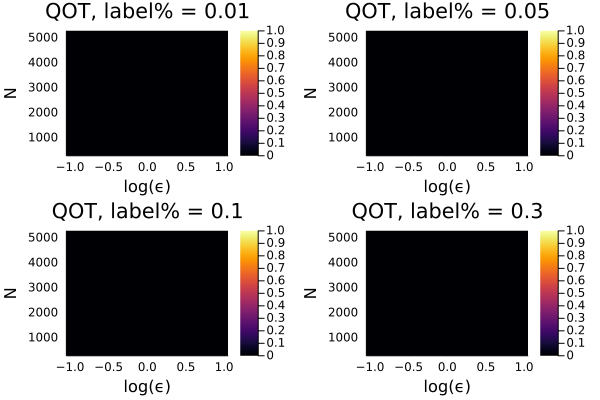

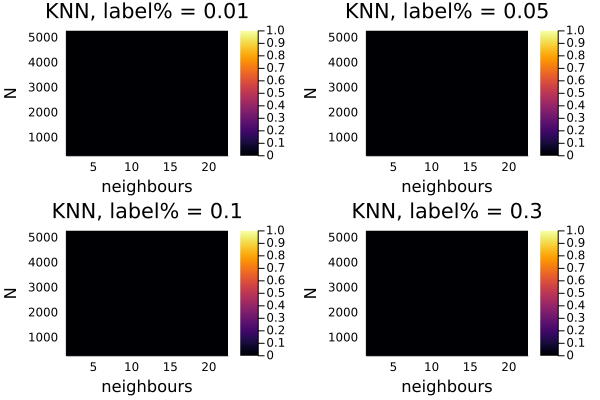

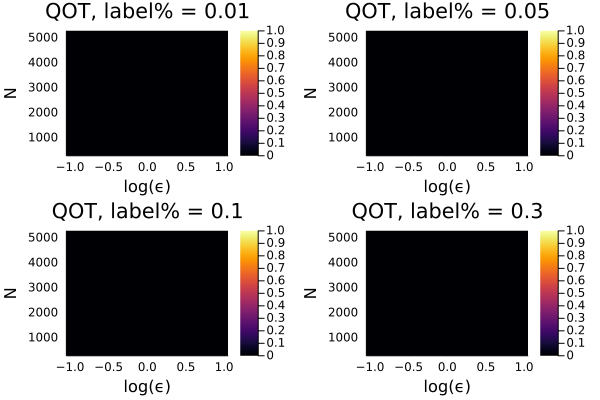

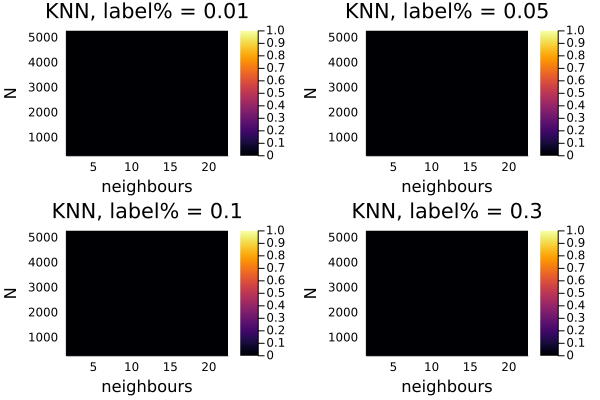

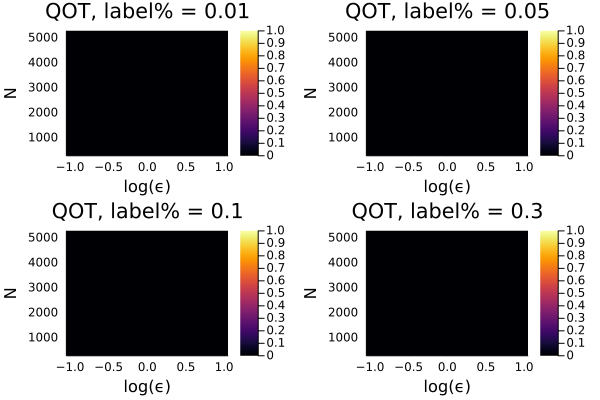

...

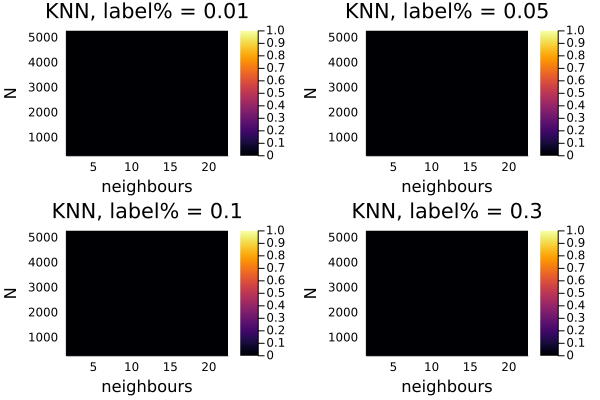

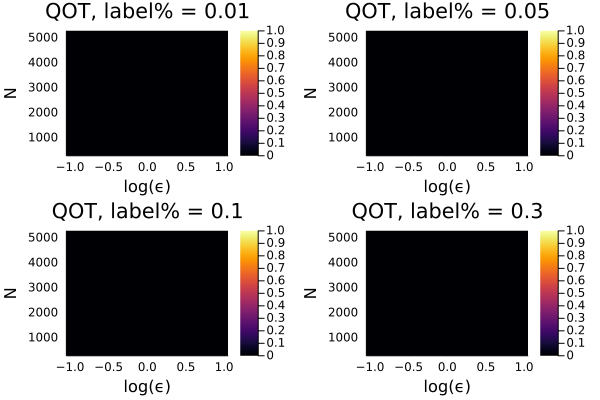

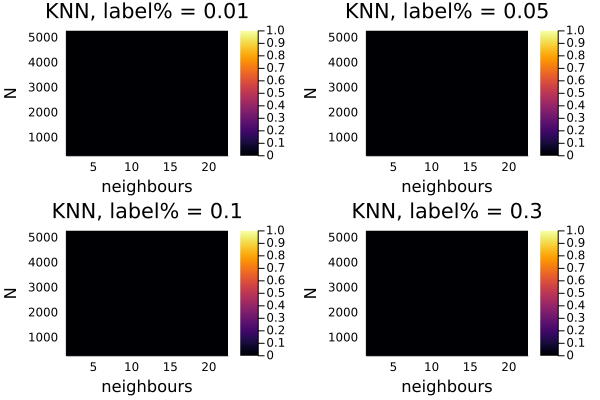

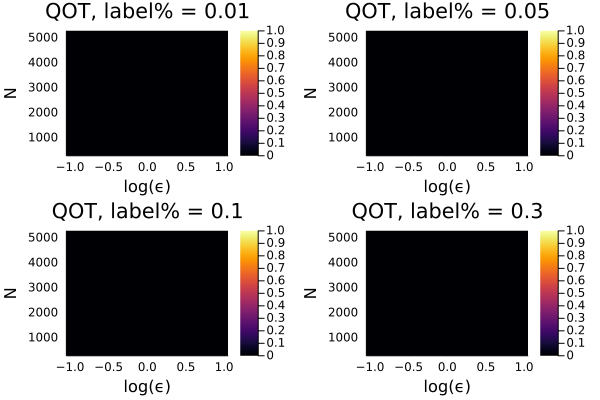

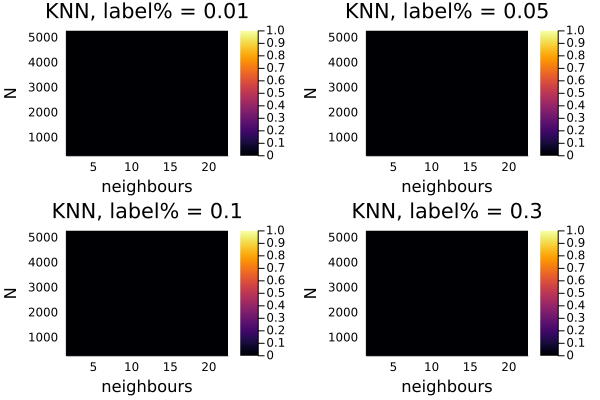

In [17]:

for k in 1:len_K_range
    QOT = []
    KNN = []
    for i_prop in 1: len_prop_range
        ht = heatmap(log10.(eps_range), N_range, QOT_accuracies[:, i_prop, k, :], clim=(0.0, 1.0),
        xlabel= "log(ϵ)", ylabel="N", title="QOT, label% = $(prop_range[i_prop])")
        push!(QOT, ht)
        
        ht = heatmap(knn_range, N_range, KNN_accuracies[:, i_prop, k, :], clim=(0.0, 1.0),
        xlabel= "neighbours", ylabel="N", title="KNN, label% = $(prop_range[i_prop])")
        push!(KNN, ht)
    end

    fig = plot(QOT...)
    
#     savefig("../figures/QOT_vs_KNN_noisy/QOT_Arm=$(K_range[k])")
    display(fig)
    
    fig = plot(KNN...)
    
#     savefig("../figures/QOT_vs_KNN_noisy/KNN_Arm=$(K_range[k])")
    display(fig)
end

In [8]:
a = ones(3, 4)
sum(a, dims=1)

1×4 Matrix{Float64}:
 3.0  3.0  3.0  3.0